# Обнаружение событий, связанных с копроментацией корпоративной электронной почты, в процессе мониторинга исходящей корреспонденции на основе методов машинного обучения

## Подготовка датасетов

Используем [открьтый датасет компании Enron](https://www.cs.cmu.edu/~enron/). Разархивируем его и превратим его в нужные нам датасеты.

In [1]:
!pip install -r requirements.txt

     |▏                               | 30 kB 3.8 MB/s eta 0:00:03

     |▊                               | 194 kB 1.6 MB/s eta 0:00:06

     |██                              | 532 kB 1.6 MB/s eta 0:00:06

     |███████▎                        | 1.9 MB 1.6 MB/s eta 0:00:05

     |█████████████████▋              | 4.7 MB 1.6 MB/s eta 0:00:03

     |█████████████████████████████▍  | 7.8 MB 1.6 MB/s eta 0:00:01

     |████████████████████████████████| 8.5 MB 1.6 MB/s 


ERROR: Could not find a version that satisfies the requirement ipython==8.22.2
ERROR: No matching distribution found for ipython==8.22.2


In [2]:
import os
import mailparser
import re
import pandas as pd

Как выглядит типичное письмо из данных.

In [3]:
with open("enron_mail_20150507/maildir/delainey-d/sent/1.") as f:
    print(f.read())

Message-ID: <4591008.1075854462117.JavaMail.evans@thyme>
Date: Tue, 12 Dec 2000 12:19:00 -0800 (PST)
From: david.delainey@enron.com
To: janet.dietrich@enron.com, christopher.calger@enron.com, 
	brian.redmond@enron.com, max.yzaguirre@enron.com, 
	rob.milnthorp@enron.com
Subject: Re: MEH Turbines
Mime-Version: 1.0
Content-Type: text/plain; charset=us-ascii
Content-Transfer-Encoding: 7bit
X-From: David W Delainey
X-To: Janet R Dietrich, Christopher F Calger, Brian Redmond, Max Yzaguirre, Rob Milnthorp
X-cc: 
X-bcc: 
X-Folder: \David_Delainey_Dec2000\Notes Folders\Sent
X-Origin: Delainey-D
X-FileName: ddelain.nsf

Guys, here are the details on the ESA MEH turbines - please forward to me 
your project details, economics and strategy ASAP.  We will allocate these 
turbines to the project with the best strategic/economic rationale once 
confirming that they are worth more in ENA versus ESA.  If you need more 
detailed information on these turbines please let me know.

Rob, please give me call

Письма раскиданы по папкам. Берём все папки, в которых встречается слово sent - папки с исходящей корреспонденцией.

In [4]:
print(os.listdir("enron_mail_20150507/maildir/delainey-d"))

['all_documents', 'notes_inbox', 'inbox', 'discussion_threads', 'sent', 'sent_items', 'deleted_items', '_sent_mail']


In [5]:
def parse_emails_by_sender(path="enron_mail_20150507"):
    outgoing_emails_by_user = {}
    unsuccessful = 0

    if not os.path.exists(path):
        return
    total_emails = 0

    for root, dirs, files in os.walk(path):
        # Обрабатываем только отправленные сообщения
        if not ("sent" in root):
            continue

        for file_name in files:
            try:
                msg = mailparser.parse_from_file(os.path.join(root, file_name))
                sender = msg.headers.get("From")
                body = msg.body

                if sender:
                    sender = re.search(r'\b[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Z|a-z]{2,}\b', sender)
                    if sender:
                        sender = sender.group().lower()
                        if sender not in outgoing_emails_by_user:
                            outgoing_emails_by_user[sender] = set()
                        outgoing_emails_by_user[sender].add(body)
                        total_emails += 1
            except Exception:
                unsuccessful += 1

    print(f"Total unsuccessful: {unsuccessful}/{total_emails}")
    return outgoing_emails_by_user


def extract_reply_from_email(text: str, sender_email: str):
    i = text.find("\n\n\n")
    if i != -1:
        text = text[:i]
    i = text.find("----- Forwarded")
    if i != -1:
        text = text[:i]
    i = text.find("Original Message")
    if i != -1:
        text = text[:i]
    text = re.sub("-{3,50}", "", text)
    name = sender_email.split("@")[0].split(".")
    if name:
        if len(name) > 1:
            r = re.compile(re.escape(name[1]), re.IGNORECASE)
            text = r.sub("", text)
        if len(name[0]) > 2:
            r = re.compile(re.escape(name[0]), re.IGNORECASE)
            text = r.sub("", text)
    text = text.rstrip(" \n")
    text = re.sub(r'(\n\n.{3,50})$', '', text)
    text = re.sub("thanks.?", "", text, flags=re.IGNORECASE)
    text = re.sub(r"(\w{3,10}[,:](\n|\n\n)|^\w{3,10}[,:]|\n\w{3,10}[,:])", "", text)
    return text

In [6]:
emails_dict = parse_emails_by_sender(path="enron_mail_20150507")
skip_emails = {"no.address@enron.com", "40enron@enron.com"}
senders, emails = [], []
for sender, emails_ in zip(emails_dict.keys(), emails_dict.values()):
    if sender not in skip_emails:
        unique_emails = set()
        for email in emails_:
            email = extract_reply_from_email(email, sender)
            if len(email) > 10 and "Outlook Migration Team" not in email:
                unique_emails.add(email)
        for email in unique_emails:
            senders.append(sender)
            emails.append(email)
df = pd.DataFrame(list(zip(senders, emails)), columns=['sender', 'text'])
df.to_csv("raw_emails.csv")

Total unsuccessful: 5/126841


In [7]:
import random

In [8]:
df = pd.read_csv('raw_emails.csv')
# print(df["sender"].value_counts())  # Люди с максимальным и минимальным числом писем
d = df.to_dict()
senders = list(d["sender"].values())
texts = list(d["text"].values())
datasets = dict()
for i, sender in enumerate(senders):
    if sender in datasets:
        datasets[sender].append([texts[i], 1])
    else:
        datasets[sender] = [[texts[i], 1]]
numbers_of_owned_emails = {sender: len(datasets[sender]) for sender in datasets}
for sender in datasets:
    other_texts = []
    for i, text in enumerate(texts):
        if sender != senders[i]:
            other_texts.append(text)
    for _ in range(numbers_of_owned_emails[sender]):
        datasets[sender].append([random.choice(other_texts), 0])
if not os.path.exists("datasets"):
    os.mkdir("datasets")
for sender in datasets:
    df = pd.DataFrame(list(zip([row[0] for row in datasets[sender]],
                               [row[1] for row in datasets[sender]])),
                      columns=['text', 'label'])
    df.to_csv(os.path.join("datasets", f"{sender.split('@')[0].replace('.', '_')}.csv"))

В итоге, получаем папку datasets с датасетом для каждого работника компании, в котором размечены письма (письма от этого человека - 1, другие письма - 0). Другие письма выбираются случайным образом.

In [9]:
print(os.listdir("datasets"))

['shelley_corman.csv', 'john_buchanan.csv', 'lynn_blair.csv', 'bradley_holmes.csv', 'toby_kuehl.csv', 'maggie_matheson.csv', 'robert_badeer.csv', 'richard_ring.csv', 'martin_cuilla.csv', 'brad_mckay.csv', 'diana_scholtes.csv', 'greg_whalley.csv', 'liz_taylor.csv', 'michelle_cash.csv', 'twanda_sweet.csv', 'carol_coats.csv', 'robert_benson.csv', 'mary_hain.csv', 'lysa_akin.csv', 'mark_guzman.csv', 'larry_may.csv', 'kam_keiser.csv', 'm__smith.csv', 'rosalee_fleming.csv', 'tori_wells.csv', 'kenneth_lay.csv', 'scott_neal.csv', 'kimberly_brown.csv', 'pam_butler.csv', 'marie_heard.csv', 'tamara_black.csv', 'kevin_presto.csv', 'm__presto.csv', 'david_forster.csv', 'rogers_herndon.csv', 'louise_kitchen.csv', 'debra_bailey.csv', 'madhup_kumar.csv', 'dutch_quigley.csv', 'monika_causholli.csv', 'laura_vuittonet.csv', 'a__martin.csv', 'thomas_martin.csv', 'bill_williams.csv', 'stacy_dickson.csv', 'matthew_lenhart.csv', 'robin_rodrigue.csv', 'stephanie_panus.csv', 'mark_taylor.csv', 'taylor.csv', 'e

Самые распространенные слова в сообщениях.

In [10]:
from collections import Counter

words_stat = dict()
for dataset in os.listdir("datasets"):
    df = pd.read_csv(f"datasets/{dataset}")
    for text in df["text"].values:
        for pair in Counter(text.replace('\n', '').split()).most_common(100):
            if pair[0] in words_stat:
                words_stat[pair[0]] += pair[1]
            else:
                words_stat[pair[0]] = pair[1]
print(sorted(words_stat.items(), key=lambda x:x[1], reverse=True)[:100])

[('the', 269281), ('to', 217786), ('I', 133642), ('and', 124292), ('a', 107152), ('of', 97071), ('you', 94981), ('for', 81231), ('is', 78149), ('in', 76594), ('that', 68622), ('on', 60117), ('have', 55830), ('be', 53226), ('with', 50363), ('this', 46610), ('we', 45029), ('will', 42772), ('are', 37346), ('me', 36049), ('it', 35508), ('at', 31987), ('not', 26700), ('your', 26269), ('as', 25740), ('if', 25400), ('my', 23742), ('from', 23649), ('would', 23612), ('was', 22339), ('or', 21346), ('know', 21263), ('get', 20389), ('can', 20177), ('but', 19325), ('-', 19316), ('The', 17538), ('about', 16808), ('our', 16387), ('need', 15880), ('any', 15765), ('an', 15721), ('am', 15319), ('do', 15077), ('so', 15046), ('by', 14782), ('has', 14777), ('out', 14710), ('Please', 14612), ('all', 14267), ('up', 14098), ('like', 13633), ('We', 13493), ('what', 12546), ('should', 12458), ('they', 12402), ('think', 12336), ('just', 12076), ('Enron', 11652), ('call', 11560), ("I'm", 11431), ('i', 11287), ('g

## Выбор датасетов для обучения

Выберем 5 человек, у которых больше всего исходящих писем и отсутствуют подписи к письмам.

In [11]:
chosen_datasets = ['kate_symes.csv', 'sally_beck.csv', 'carol_clair.csv', 'michelle_cash.csv', 'chris_germany.csv']

In [12]:
for dataset in chosen_datasets:
    print(pd.read_csv(f"datasets/{dataset}"))

      Unnamed: 0                                               text  label
0              0  I'm a little confused - 559066 is a Prebon dea...      1
1              1  Prebon is right on this. Both deals are 25 MW....      1
2              2  Hey there stranger!\n\nfor the pictures - they...      1
3              3  Two of these should have fees; two should not....      1
4              4  Mark's changing deal 581615 to APB - he had it...      1
...          ...                                                ...    ...
2529        2529   pending the sale of the Wilton Centre unit, I...      0
2530        2530  Same to you!  \nAnd I hope you and your family...      0
2531        2531  \n I would appreciate your help in locating fi...      0
2532        2532  \t2- SURVEY/INFORMATION EMAIL - 7/19/01\n\nCur...      0
2533        2533    see if this works!  If it does, see "13."  w...      0

[2534 rows x 3 columns]
      Unnamed: 0                                               text  label


## Обучение моделей

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, precision_score, recall_score, \
precision_recall_curve, ConfusionMatrixDisplay
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

Будем использовать 2 способа векторизации текстов - TF-IDF и CountVectorizer

In [14]:
def tfidf(df: pd.DataFrame):
    tfidf = TfidfVectorizer()
    return np.array(tfidf.fit_transform(df['text']).todense())


def vectorize(df: pd.DataFrame):
    count_vec = CountVectorizer()
    return np.array(count_vec.fit_transform(df['text']).todense())

Определяем класс для обучения и тестирования моделей. Обучающая выборка - 70% датасета. to_vec_func - выбранный способ векторизации.

In [15]:
class ModelTrainer:

    def __init__(self, csv_path, train_dir_path):
        self.dataset = pd.read_csv(os.path.join("datasets", csv_path))
        self.dataset_name = csv_path.split(".")[0]
        self.train_info = {}
        self.train_dir_path = train_dir_path

    def update_train_info(self, info, model_name, vec_name):
        if model_name in self.train_info:
            self.train_info[model_name][vec_name] = info
        else:
            self.train_info[model_name] = {vec_name: info}

    def save_train_info_into_pickle(self):
        if not os.path.exists(self.train_dir_path):
            os.mkdir(self.train_dir_path)
        with open(os.path.join(self.train_dir_path, f"{self.dataset_name}.pickle"), "wb") as f:
            pickle.dump(self.train_info, f)

    def count_acc(self, pred_scores, scores):
        correct = 0
        res_acc = []
        pred_scores = list(pred_scores)
        scores = list(scores)
        for i in range(len(scores)):
            if pred_scores[i] == scores[i]:
                correct += 1
            res_acc.append(correct / (i + 1))
        return res_acc

    def plot_accuracy(self, train_pred_scores, train_scores, test_pred_scores, test_scores):
        plt.figure(figsize=(15, 8))
        plt.title('Accuracy')
        plt.xticks([])
        plt.plot(self.count_acc(train_pred_scores, train_scores), color='r', label="Train")
        plt.plot(self.count_acc(test_pred_scores, test_scores), color='b', label="Test")
        plt.legend()
        plt.show()

    def plot_precision_recall_curve(self, y_test, y_pred):
        precision, recall, thresholds = precision_recall_curve(y_test, y_pred)
        plt.figure(figsize=(15, 8))
        plt.xlabel('Recall')
        plt.ylabel('Presicion')
        plt.title('Precision-recall curve')
        plt.xticks(np.arange(0, 1.1, 0.1))
        plt.yticks(np.arange(0, 1.1, 0.1))
        plt.grid()
        plt.plot(recall, precision)
        plt.show()

    def plot_confusion_matrix(self, conf_matrix):
        cm = ConfusionMatrixDisplay(conf_matrix)
        cm.plot()
        plt.show()

    def train(self, model, to_vec_func):
        model_name = model.__class__.__name__
        X = to_vec_func(self.dataset)
        y = self.dataset["label"]
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)
        model = model.fit(X_train, y_train)
        y_train_pred = model.predict(X_train)
        y_pred = model.predict(X_test)
        self.plot_accuracy(y_train_pred, y_train, y_pred, y_test)
        self.plot_precision_recall_curve(y_test, y_pred)
        conf_matrix = confusion_matrix(y_test, y_pred)
        self.plot_confusion_matrix(conf_matrix)
        self.update_train_info({
            'Accuracy': accuracy_score(y_test, y_pred),
            'Precision': precision_score(y_test, y_pred),
            'Recall': recall_score(y_test, y_pred),
            'F1 score': f1_score(y_test, y_pred, average="macro"),
            'Confusion matrix': conf_matrix
        }, model_name, to_vec_func.__name__)

Start processing kate_symes.csv


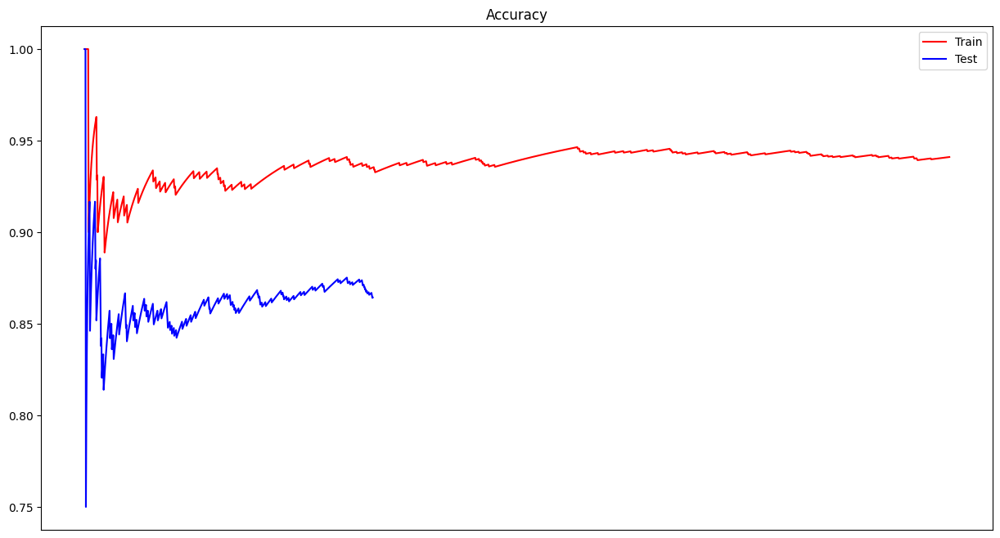

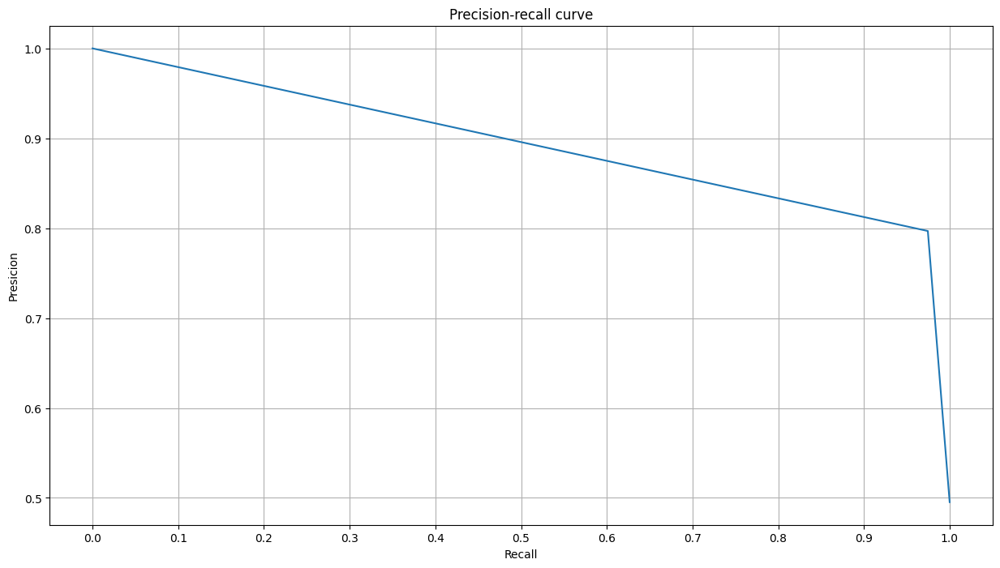

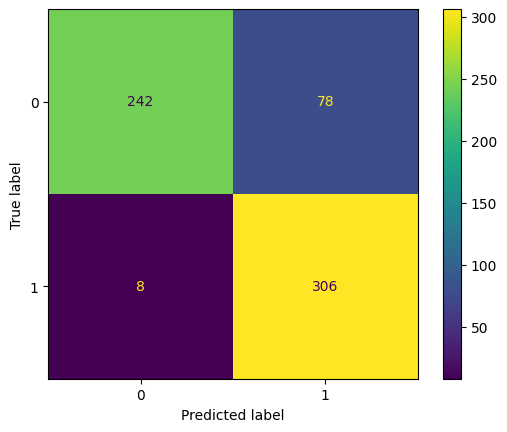

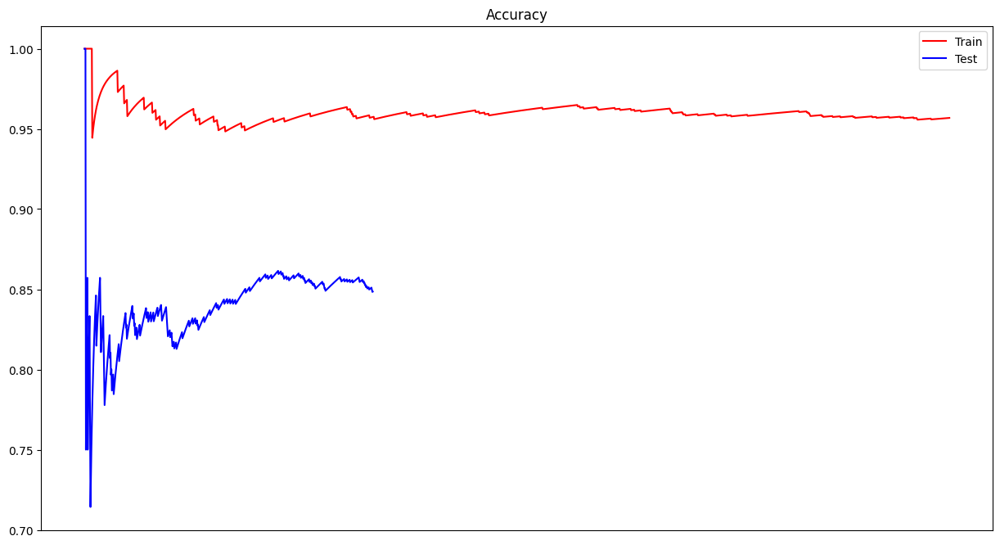

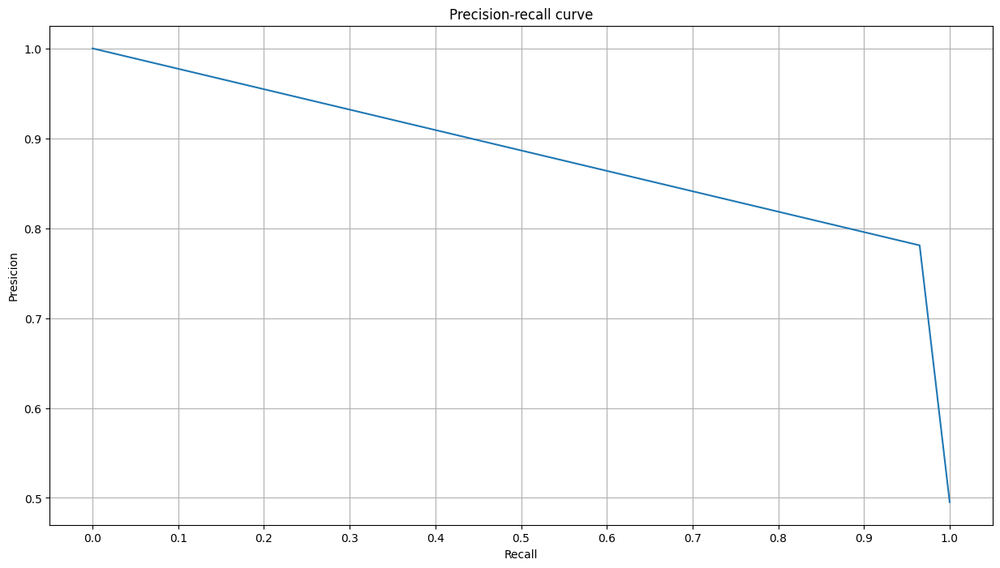

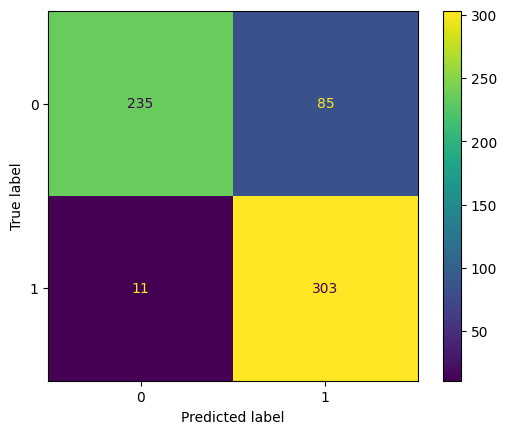

Processed model 1/7


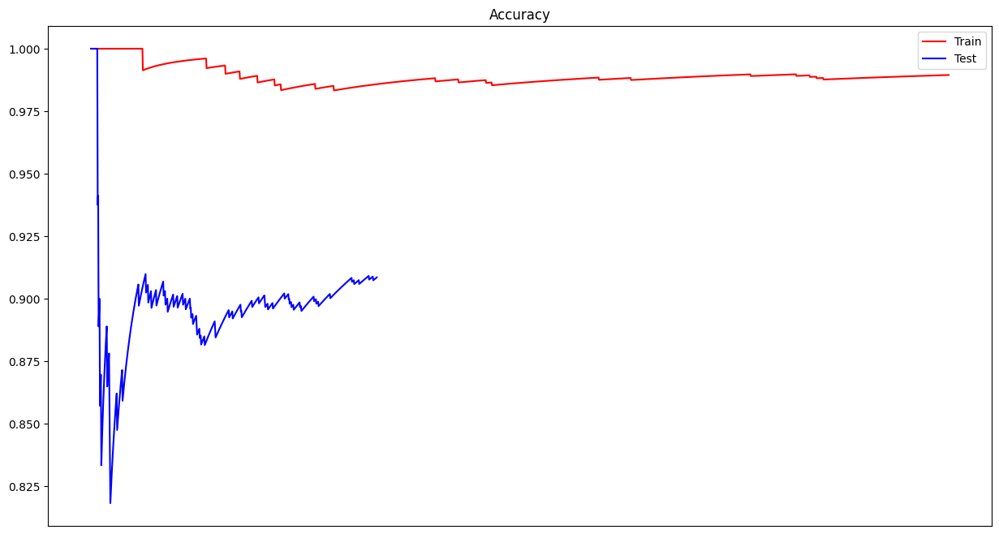

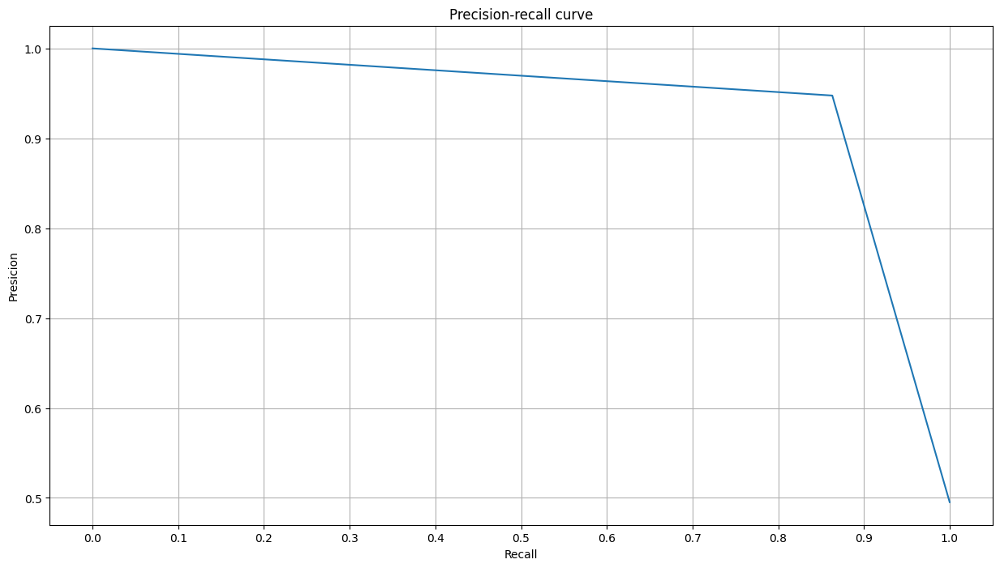

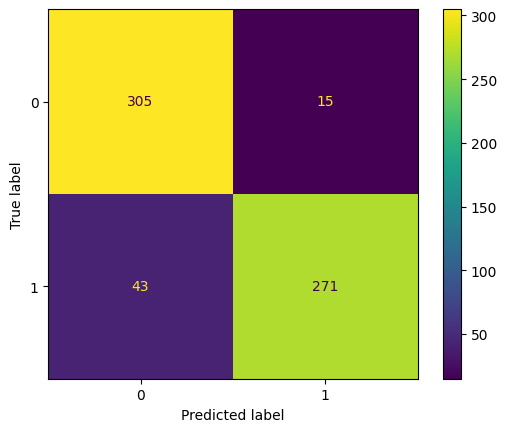

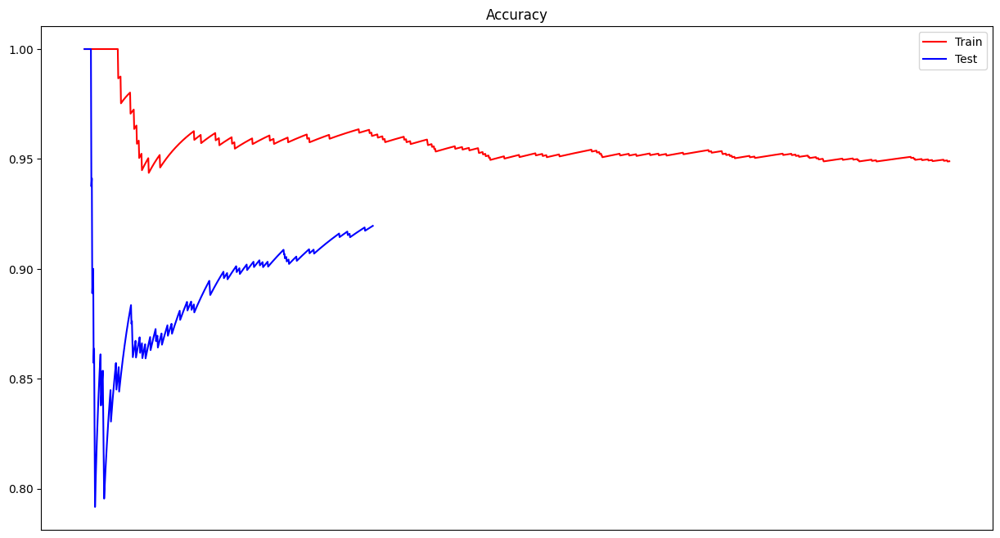

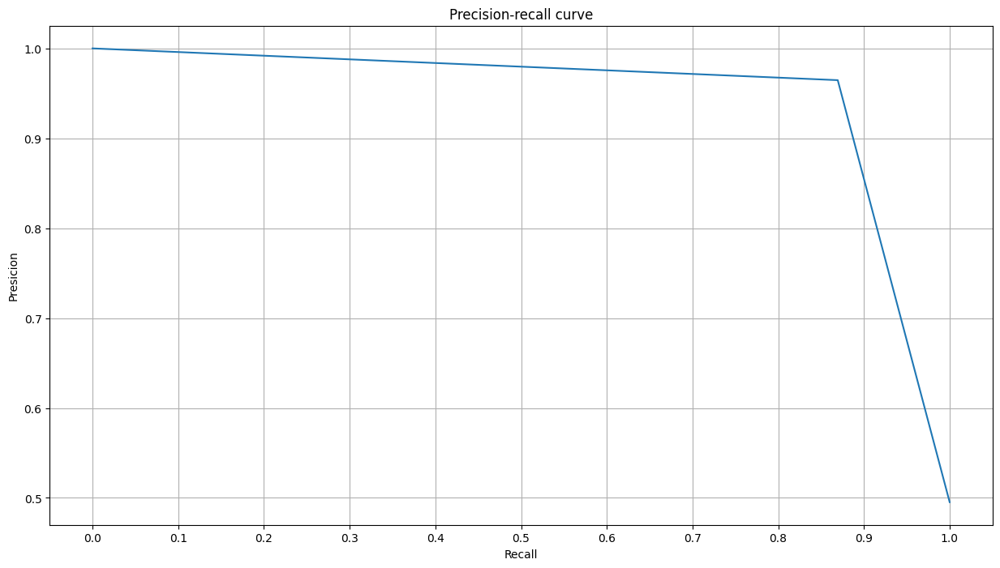

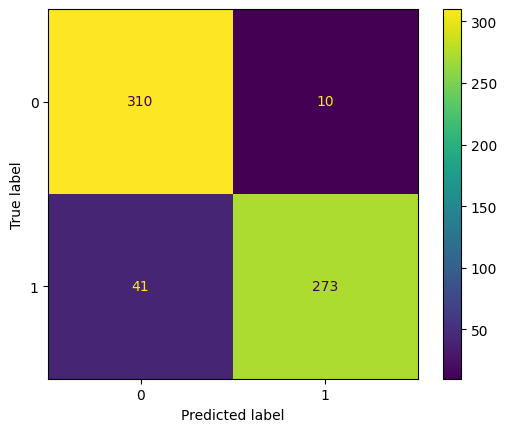

Processed model 2/7


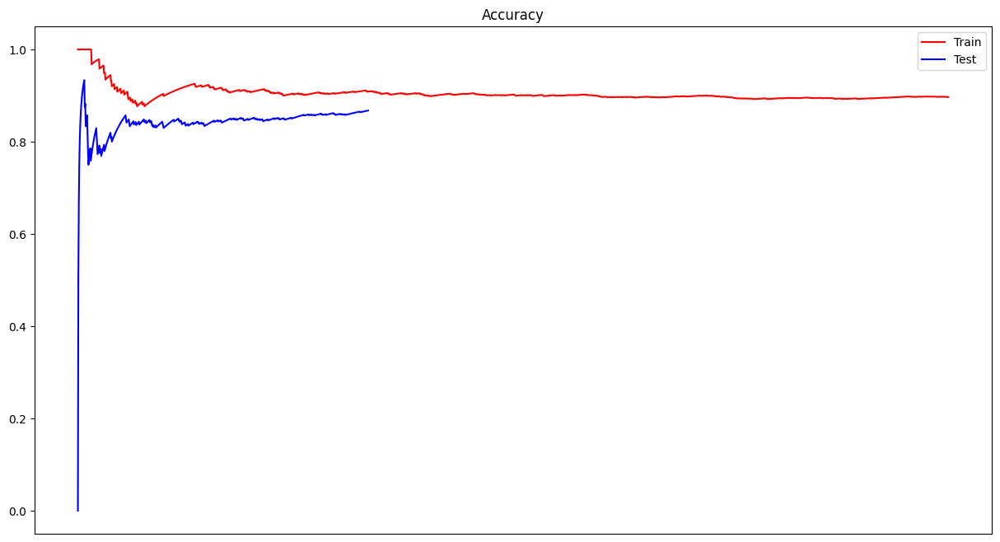

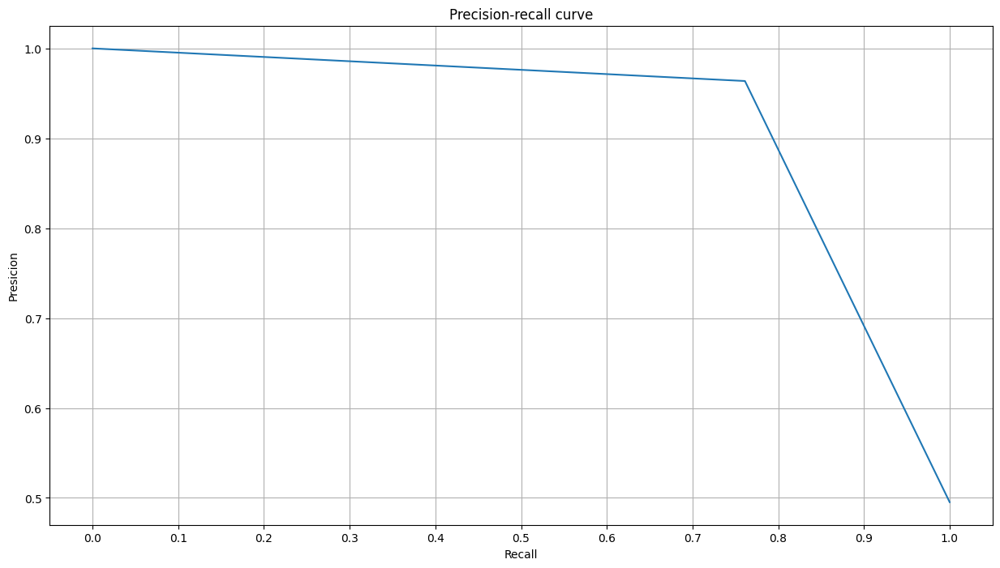

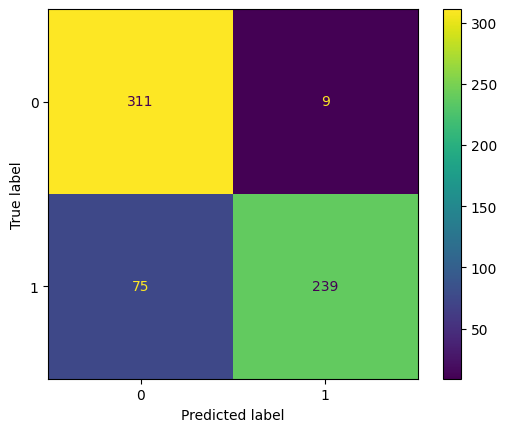

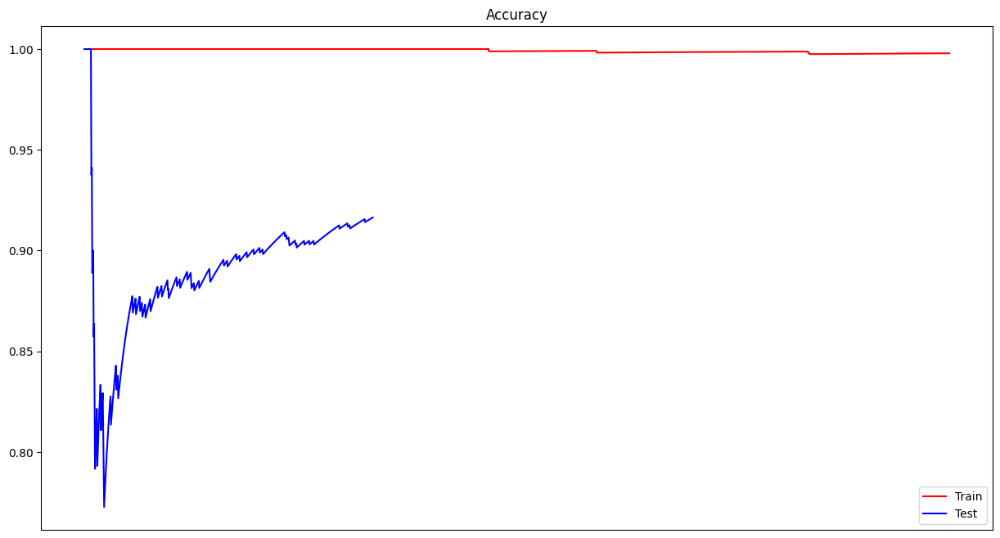

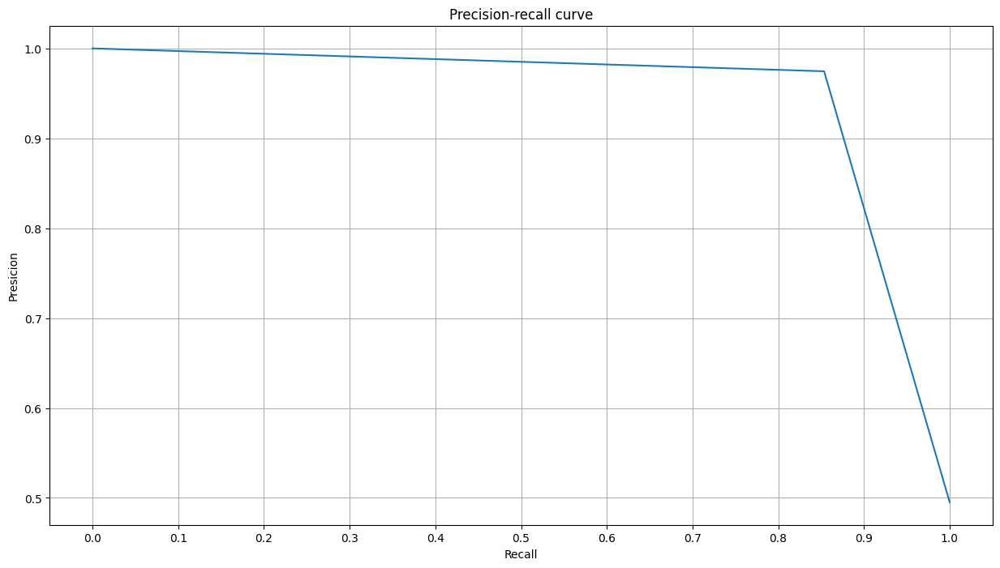

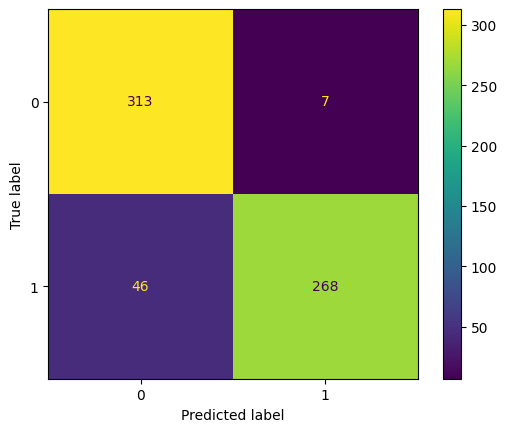

Processed model 3/7


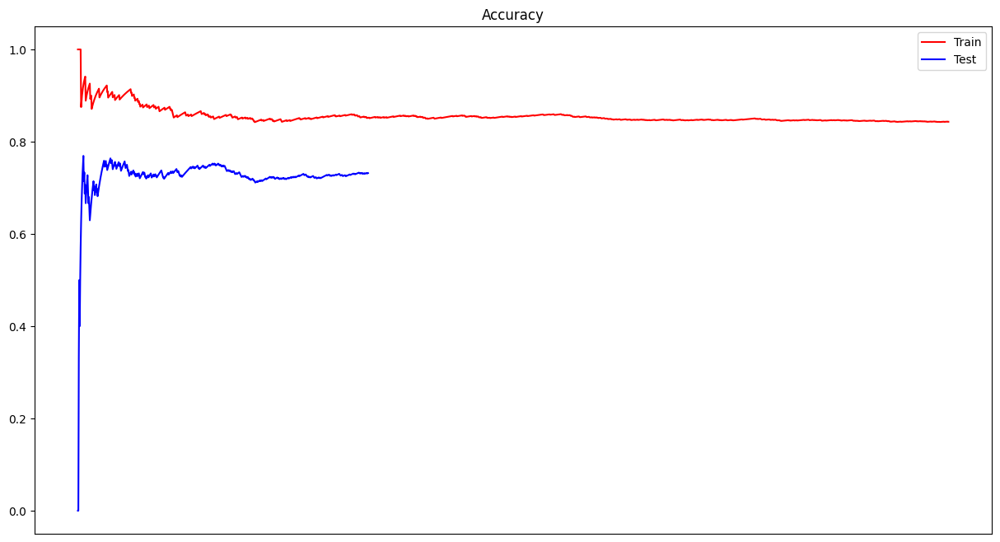

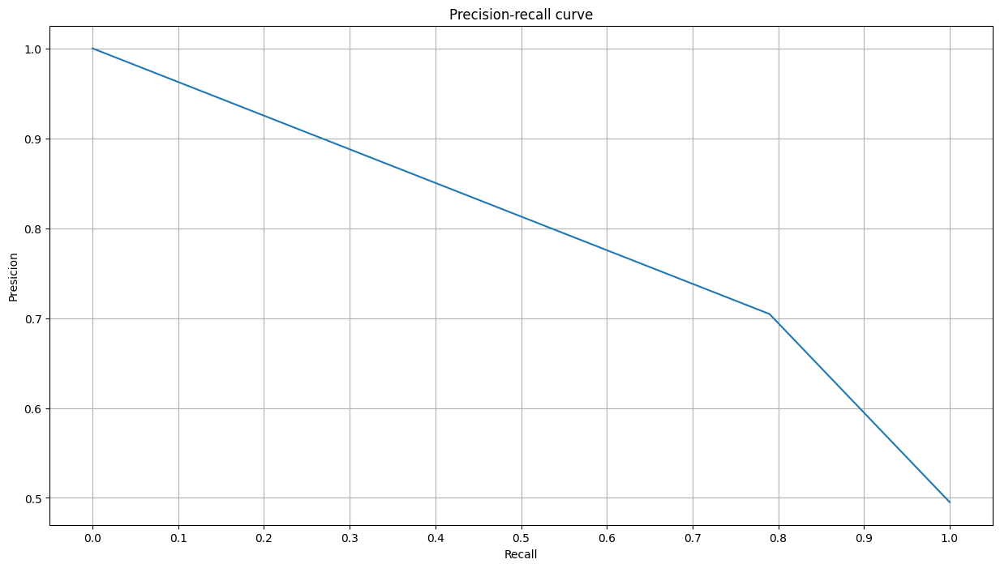

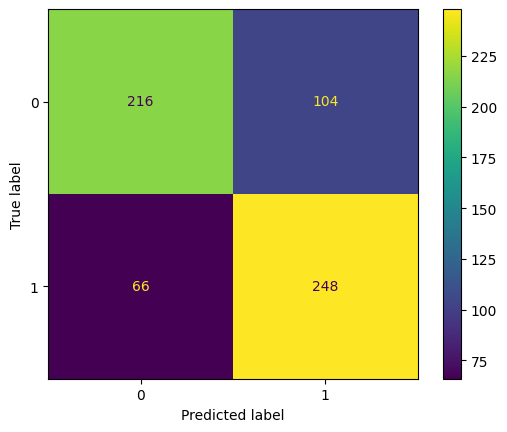

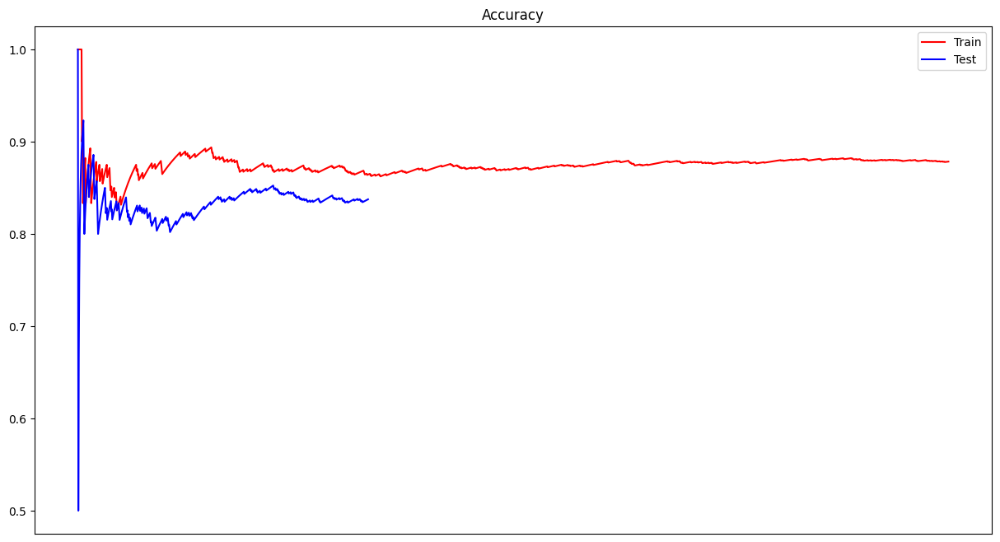

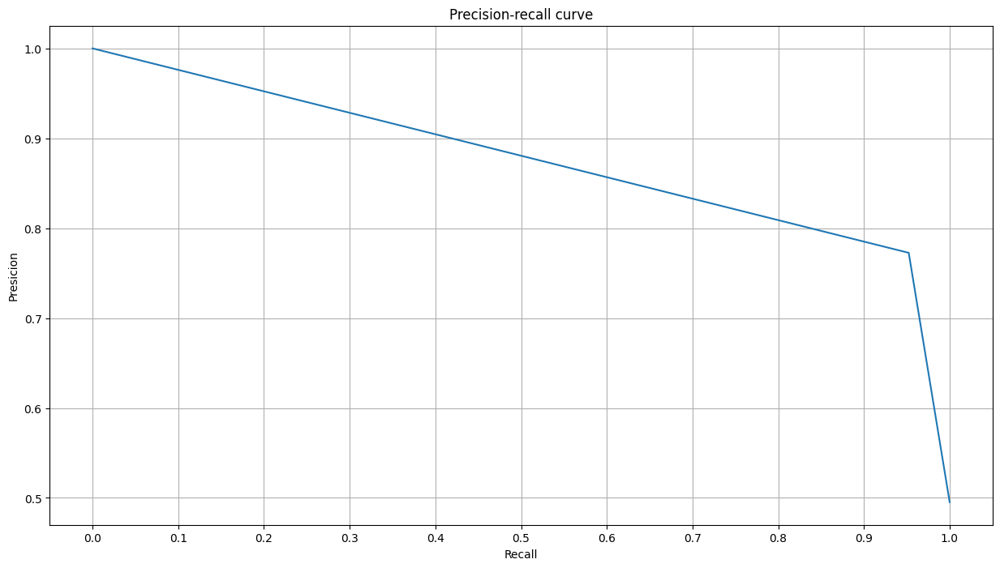

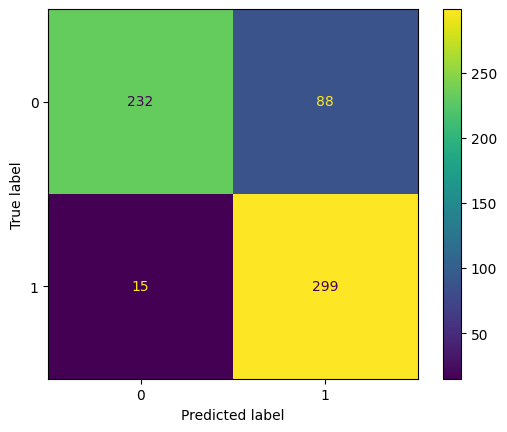

Processed model 4/7


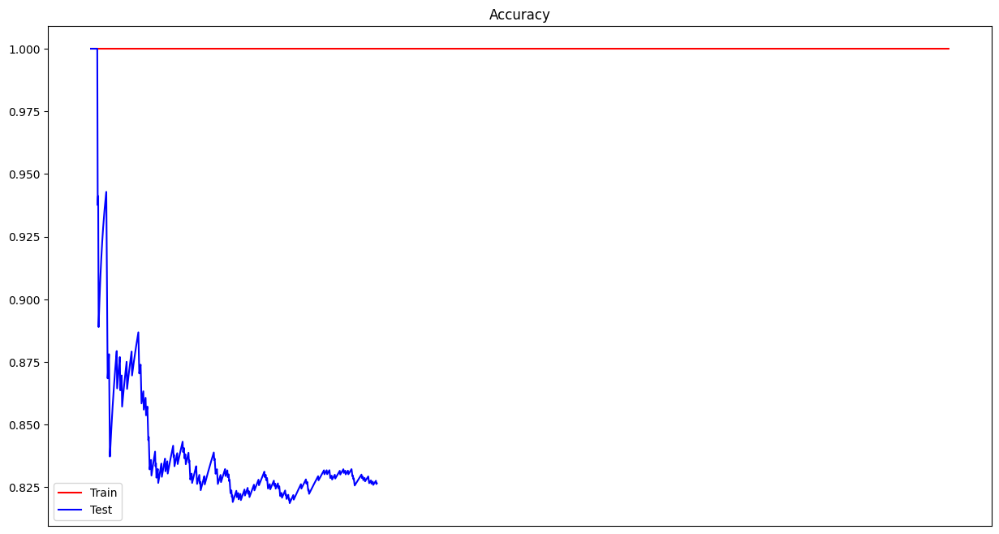

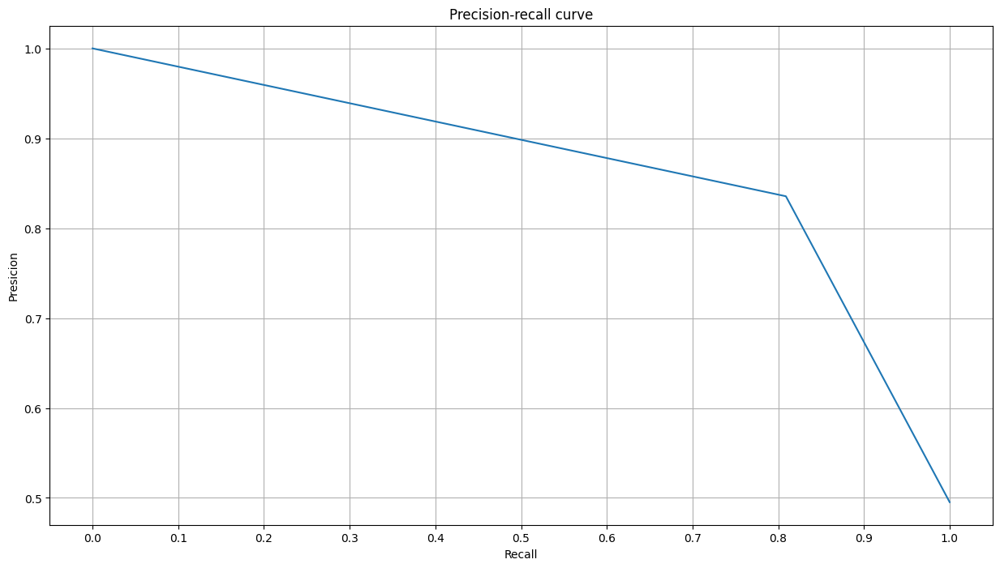

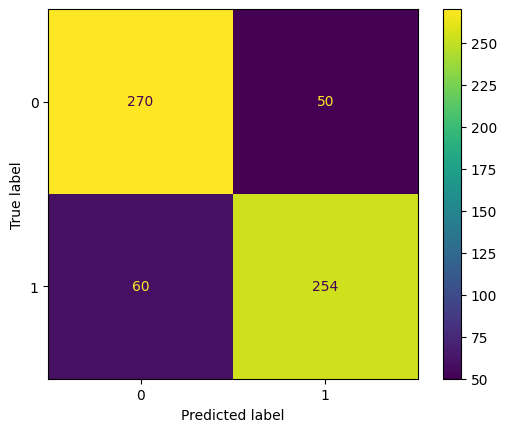

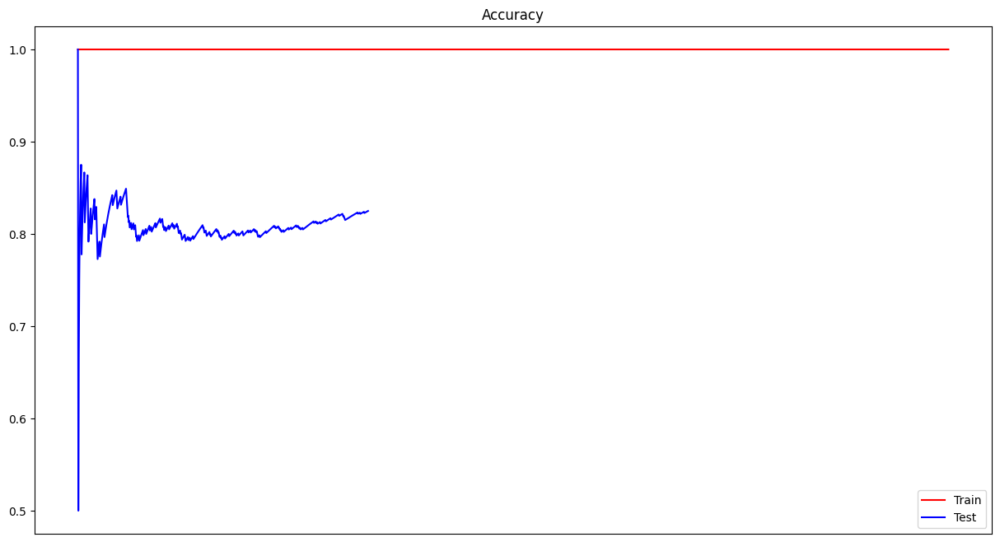

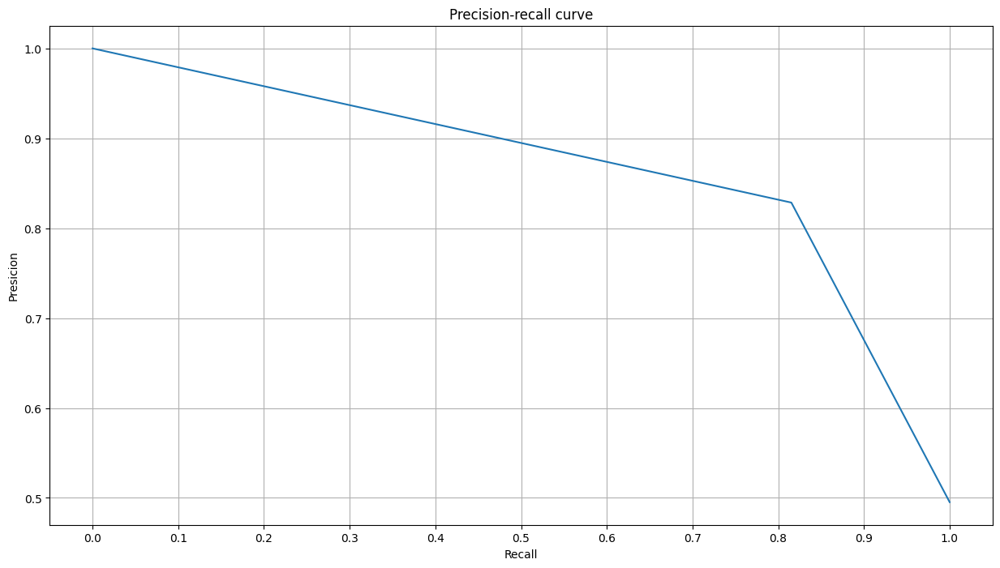

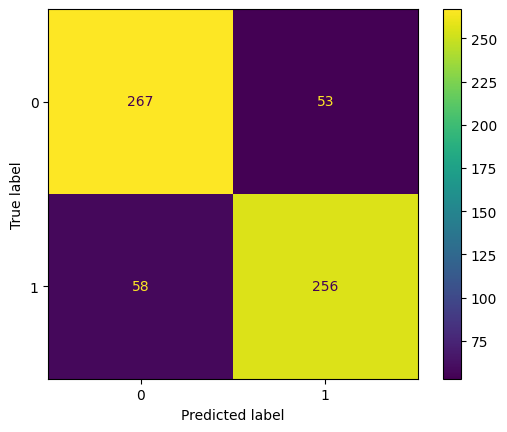

Processed model 5/7


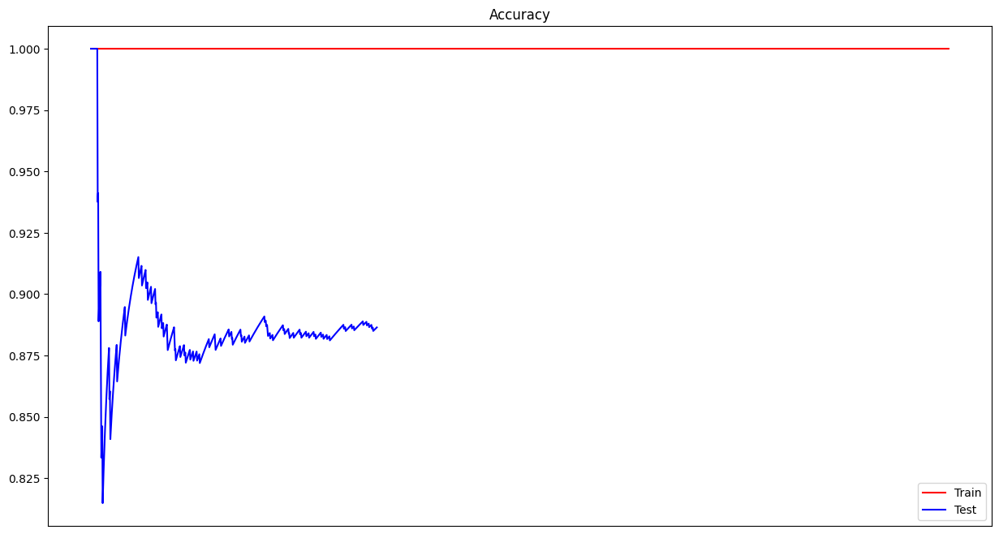

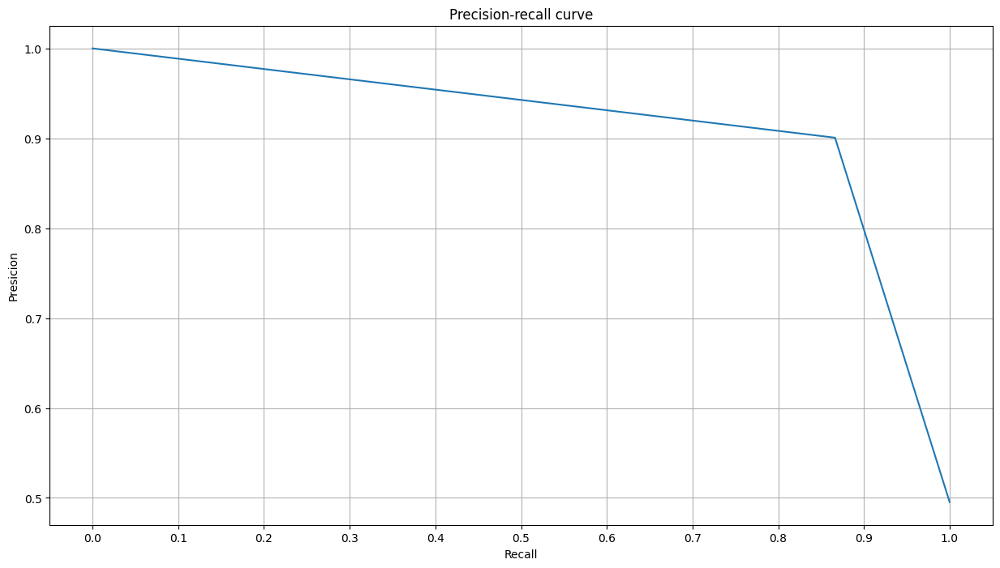

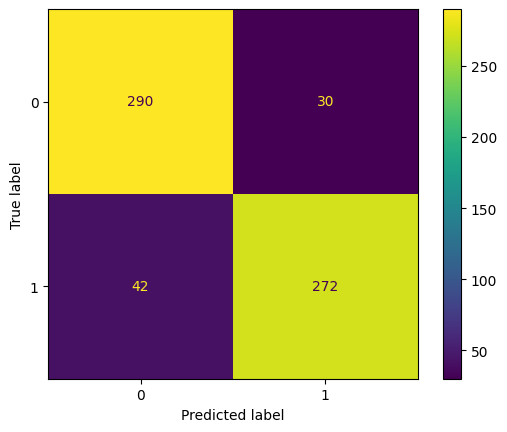

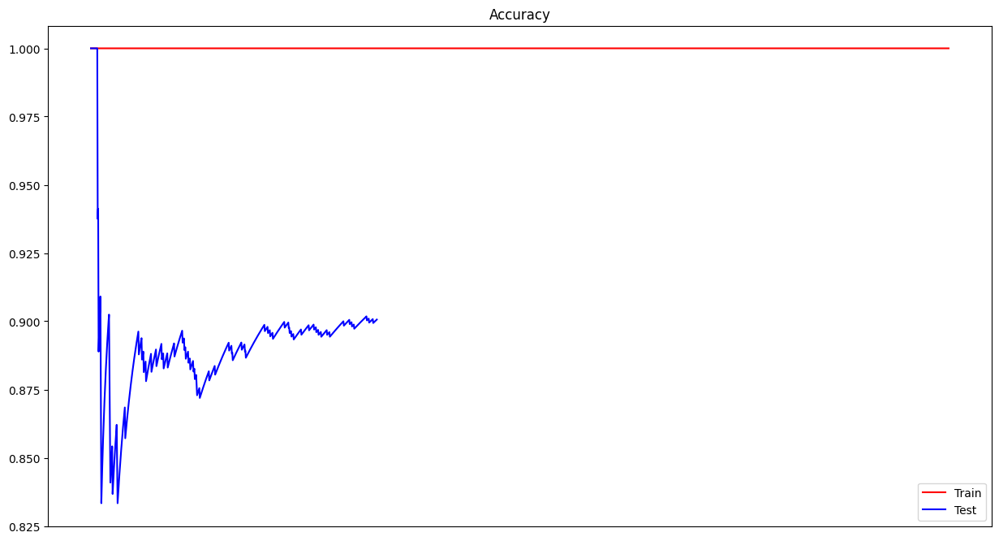

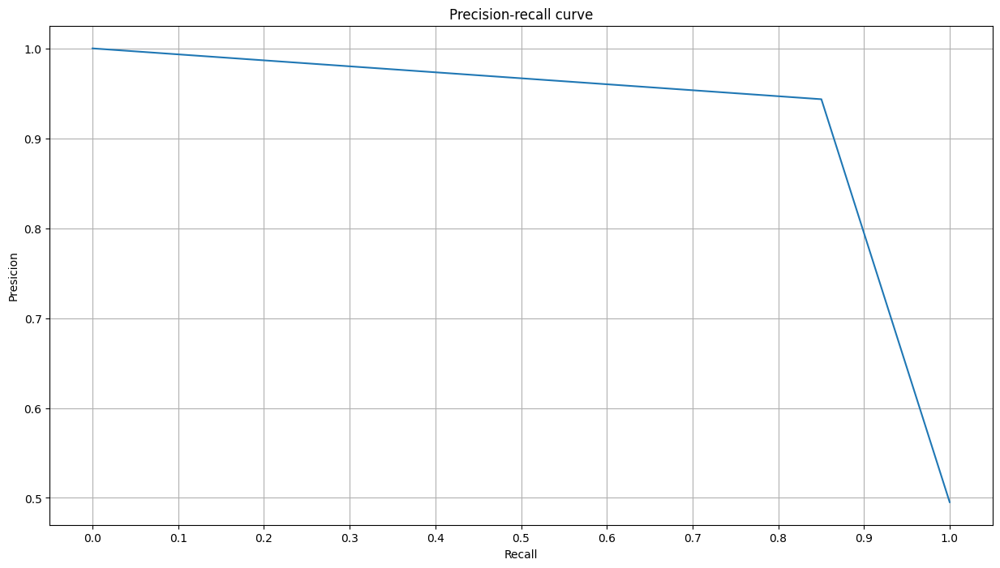

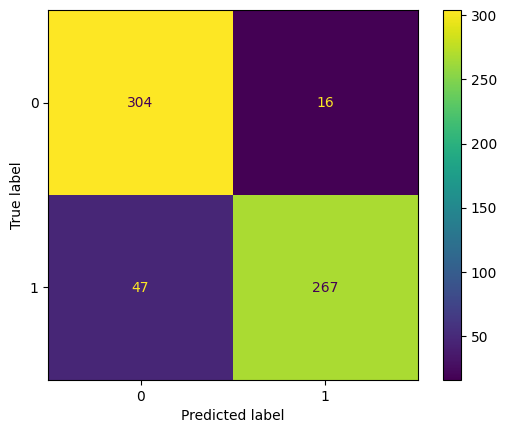

Processed model 6/7


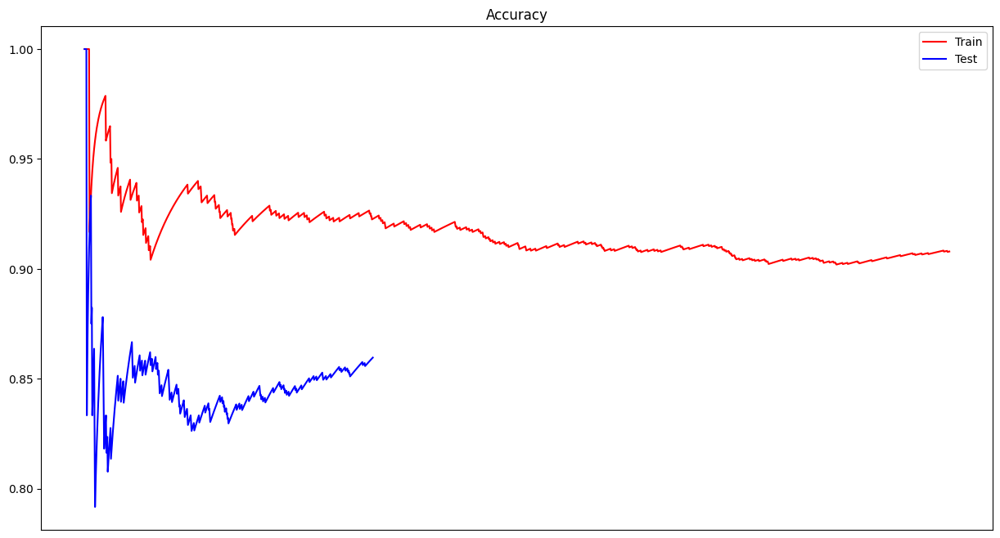

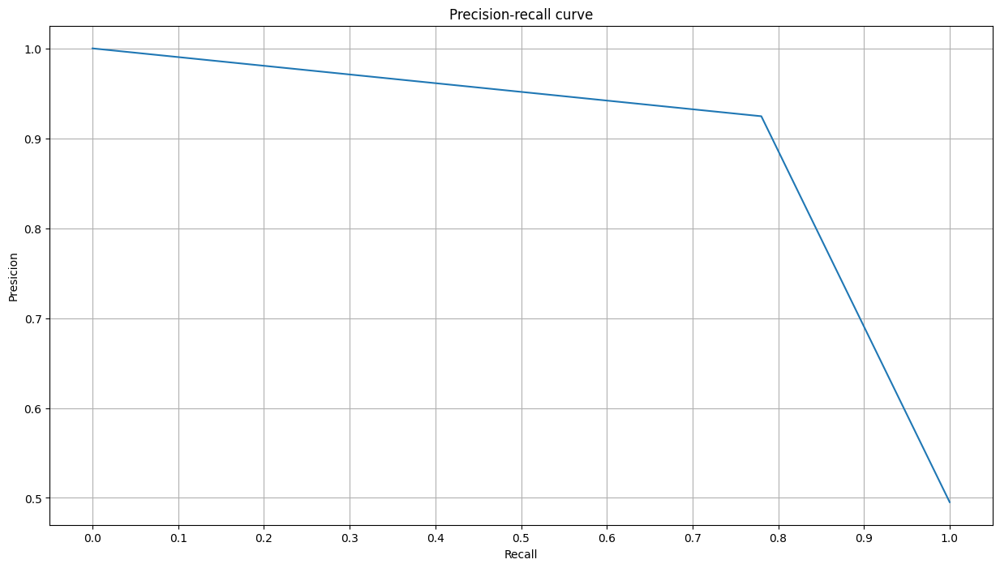

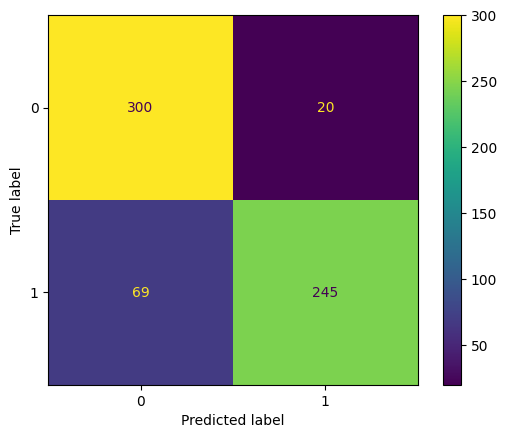

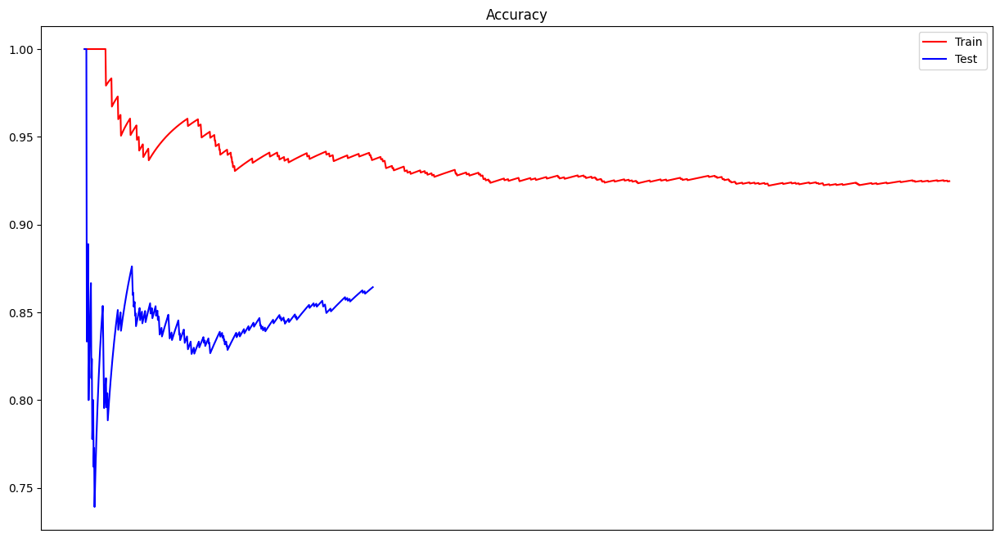

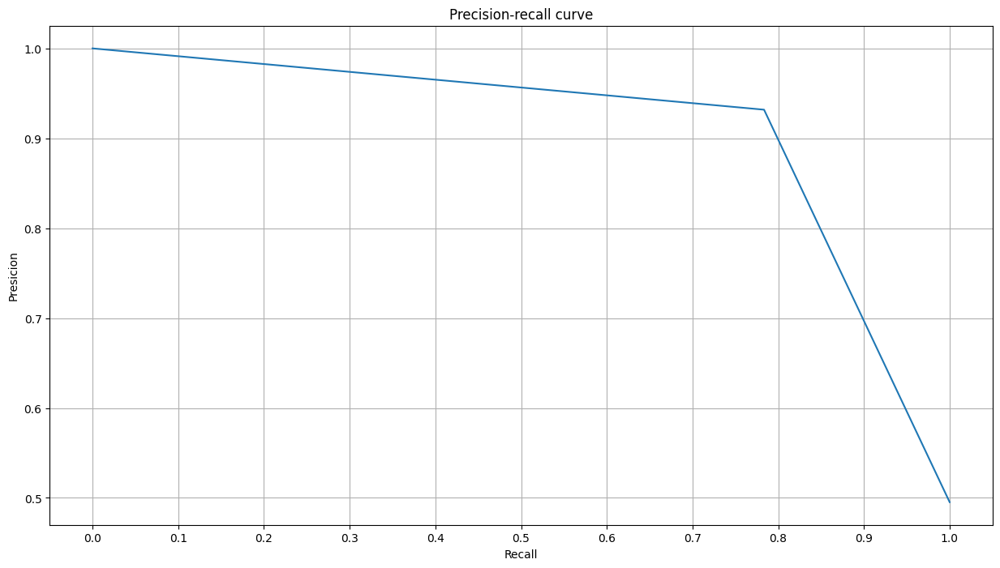

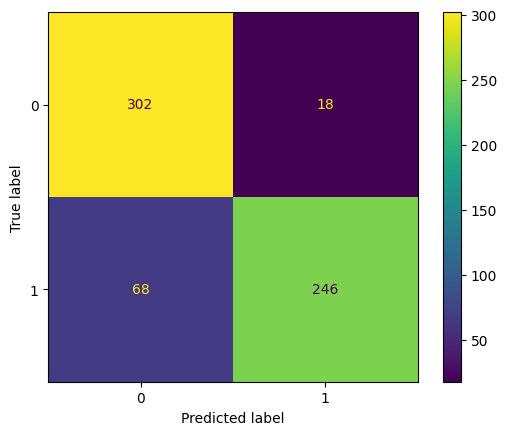

Processed model 7/7
Start processing sally_beck.csv


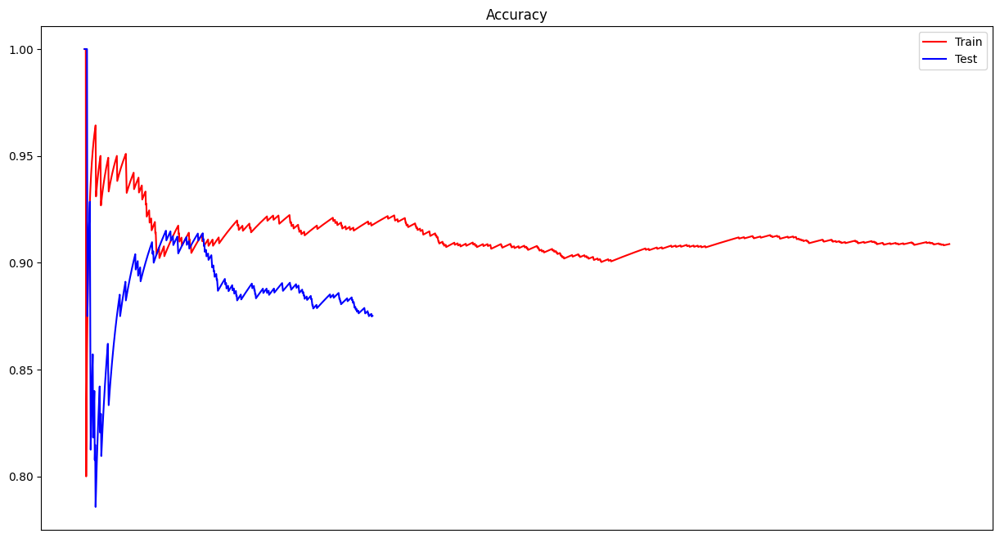

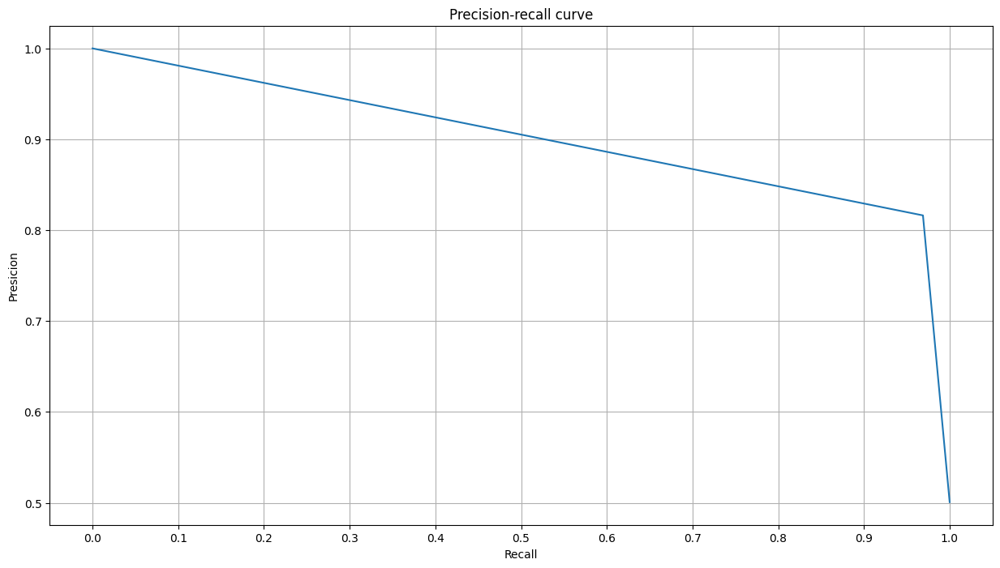

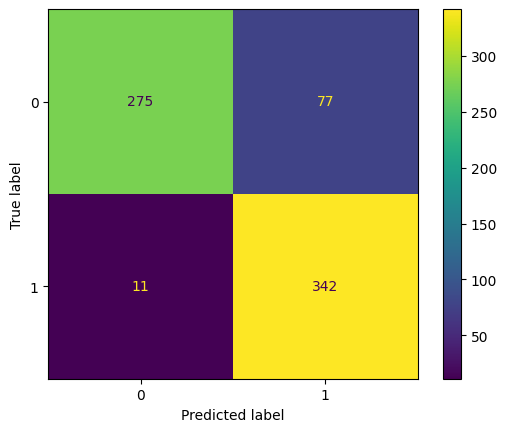

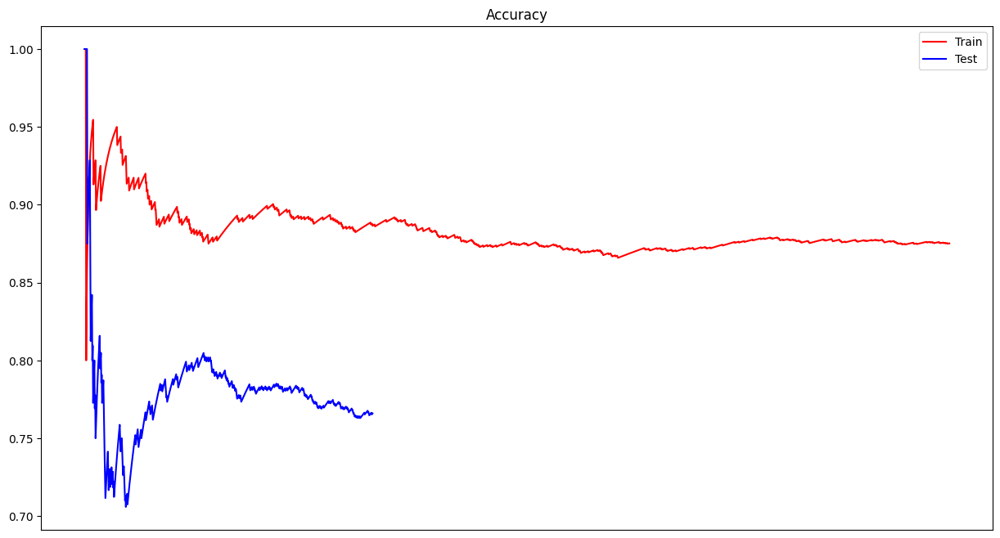

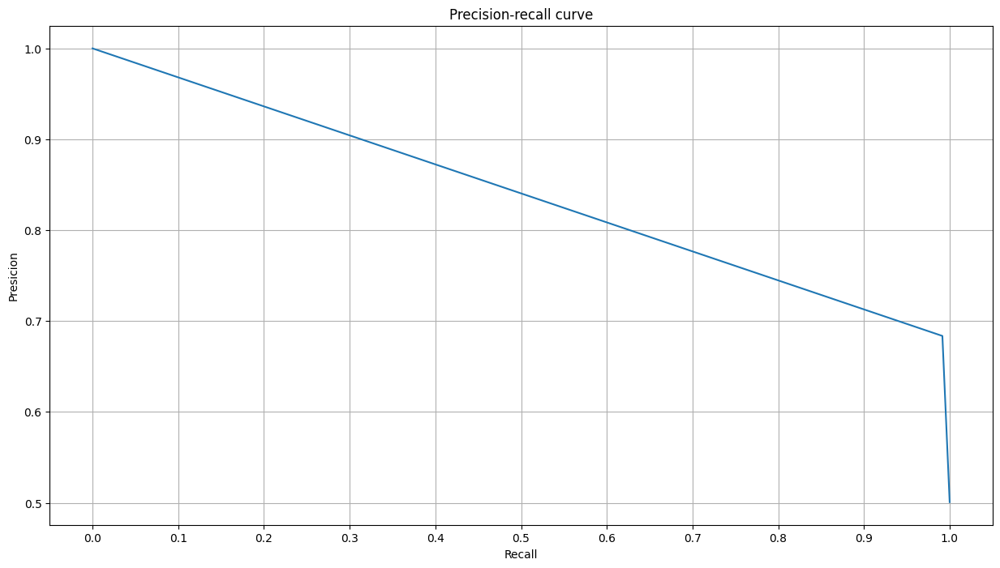

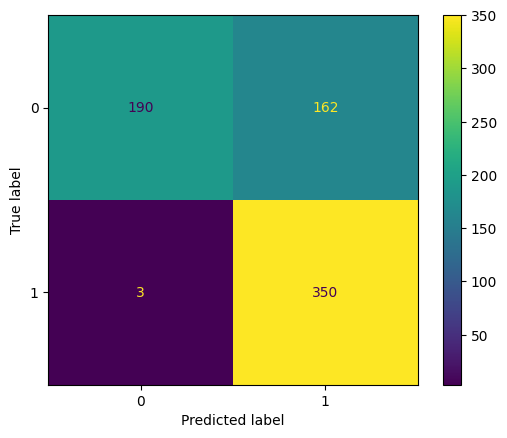

Processed model 1/7


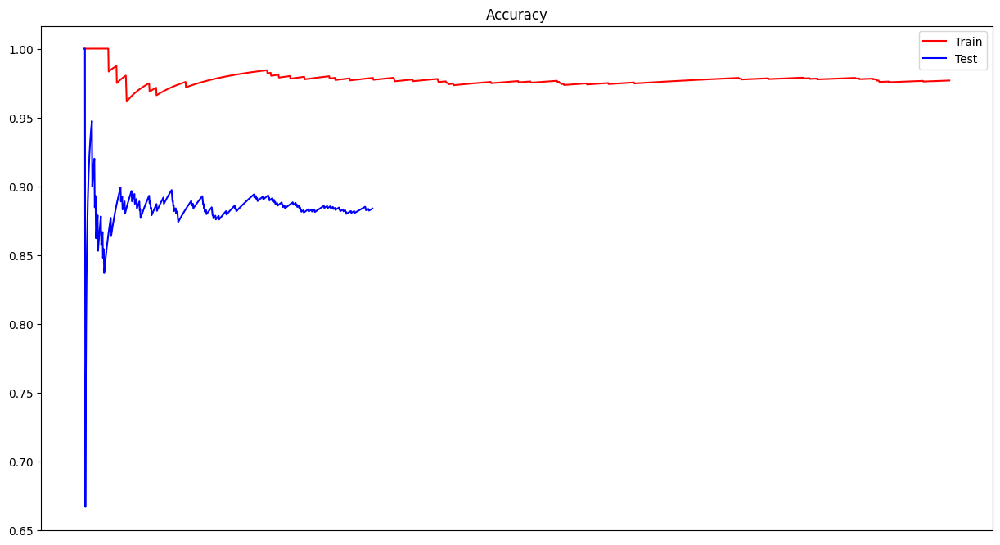

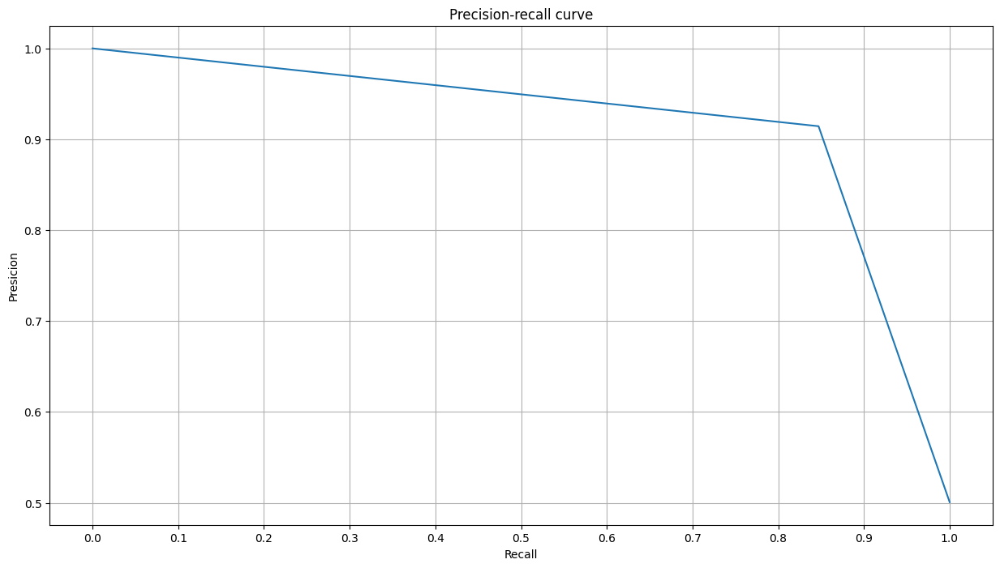

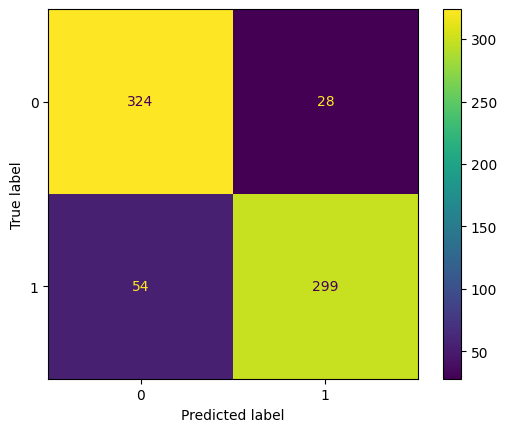

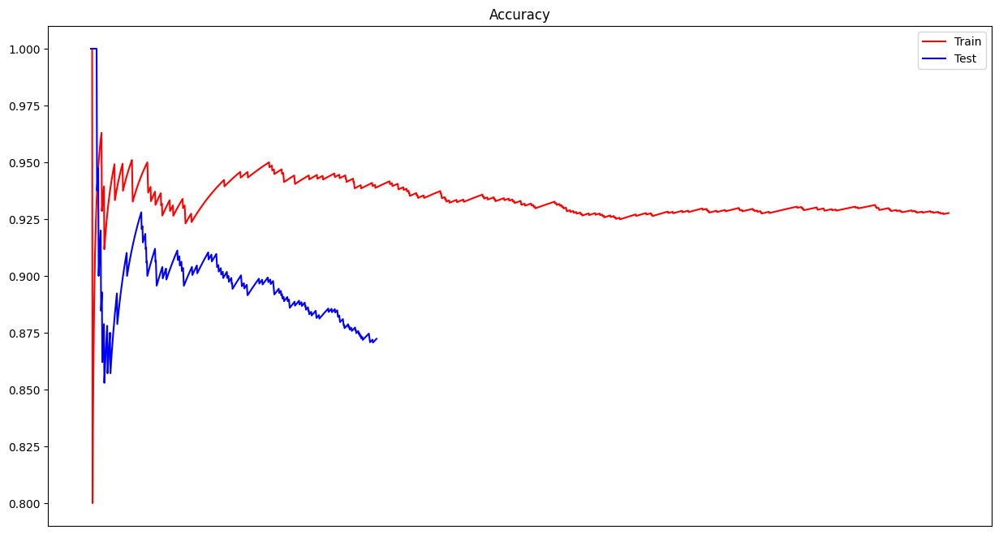

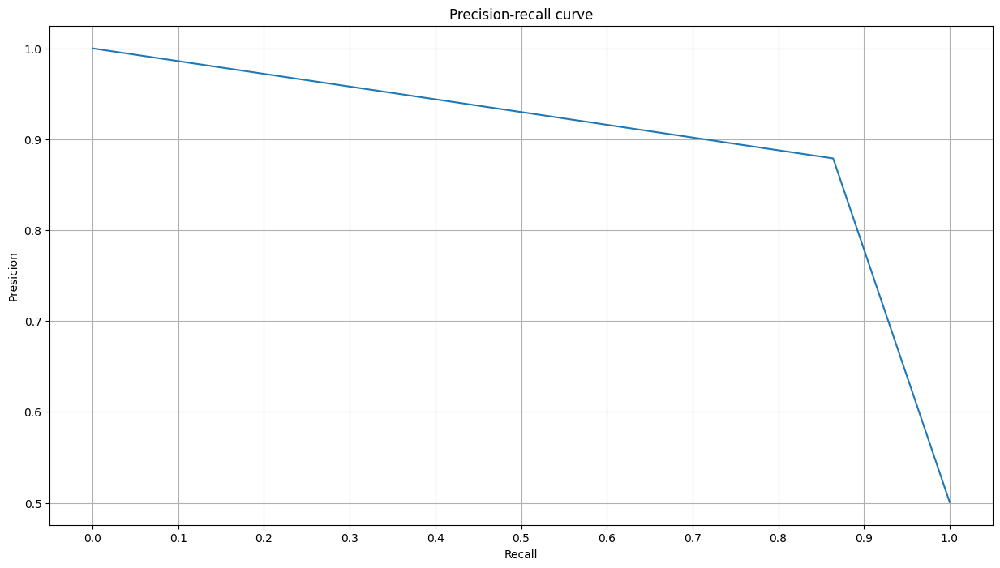

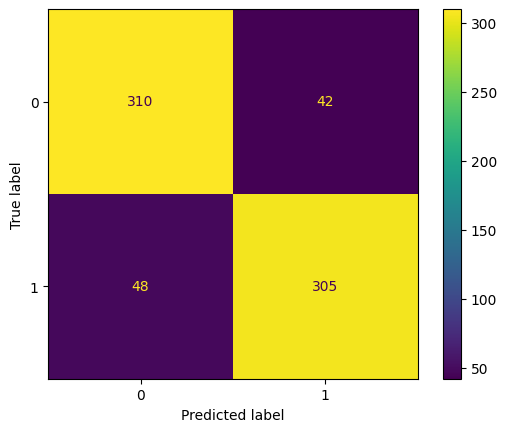

Processed model 2/7


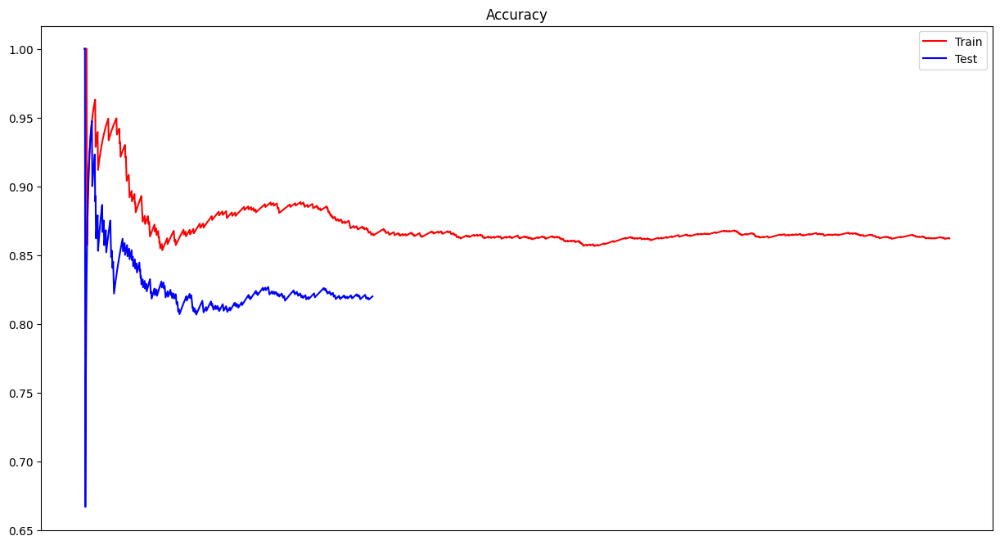

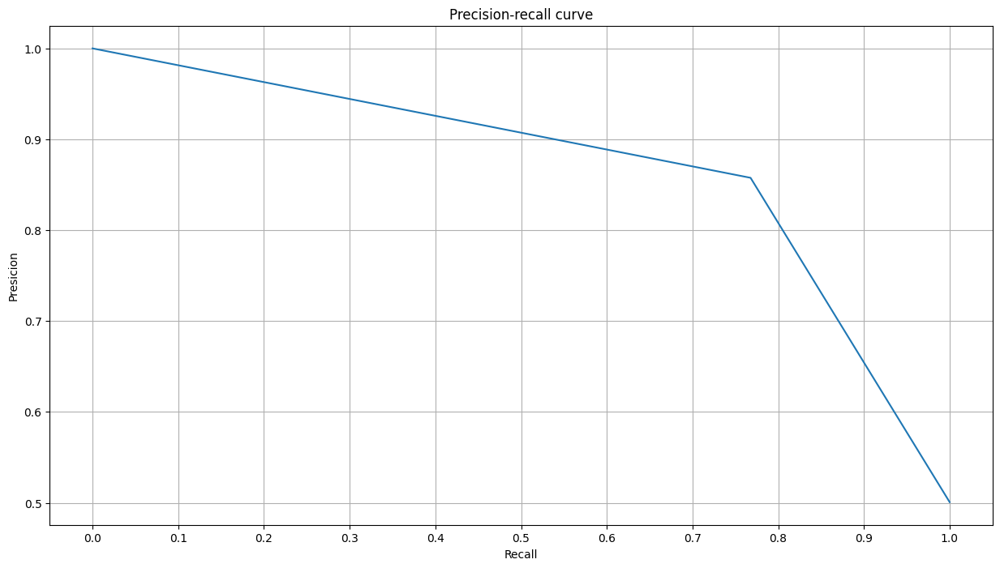

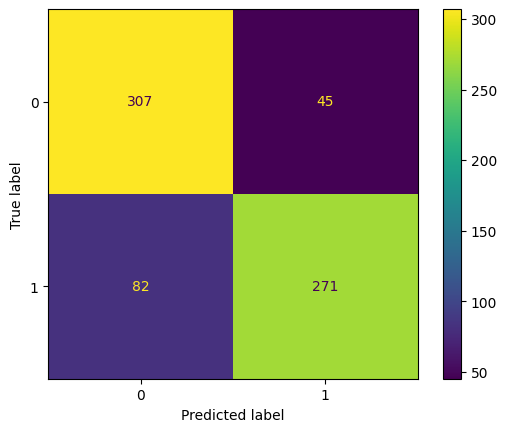

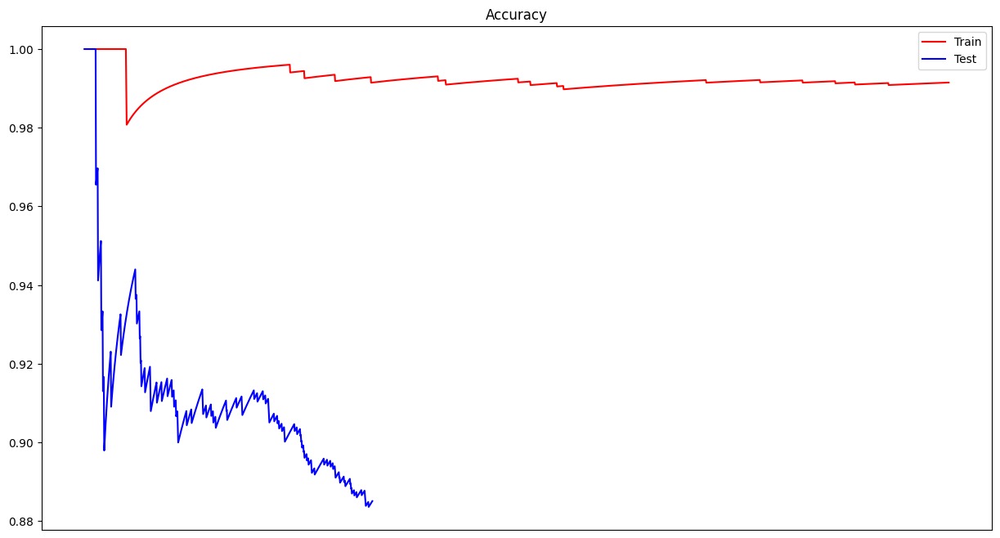

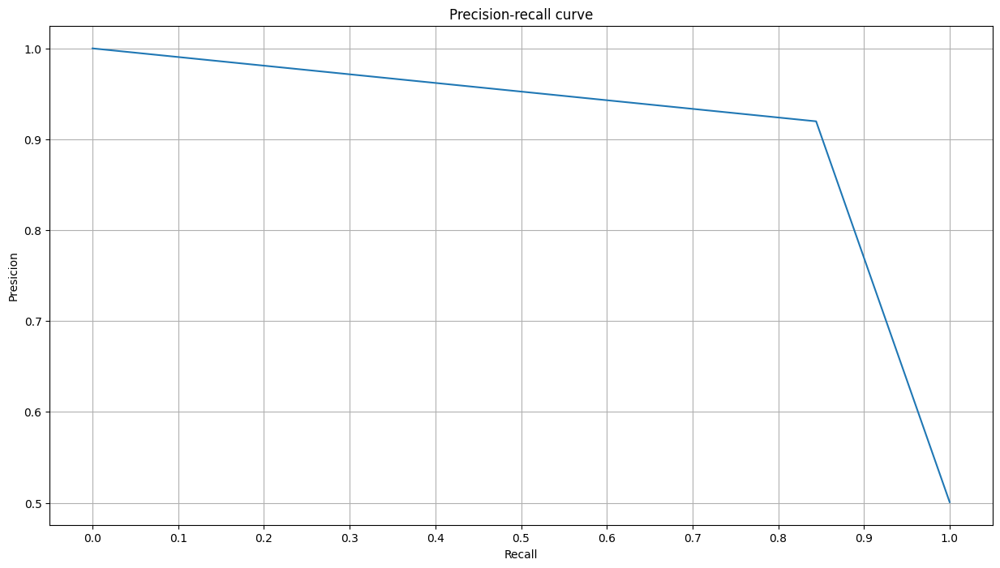

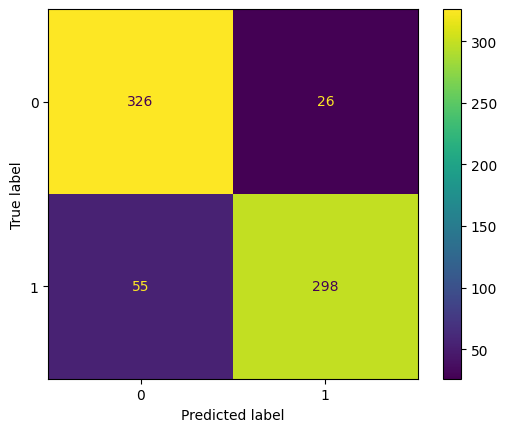

Processed model 3/7


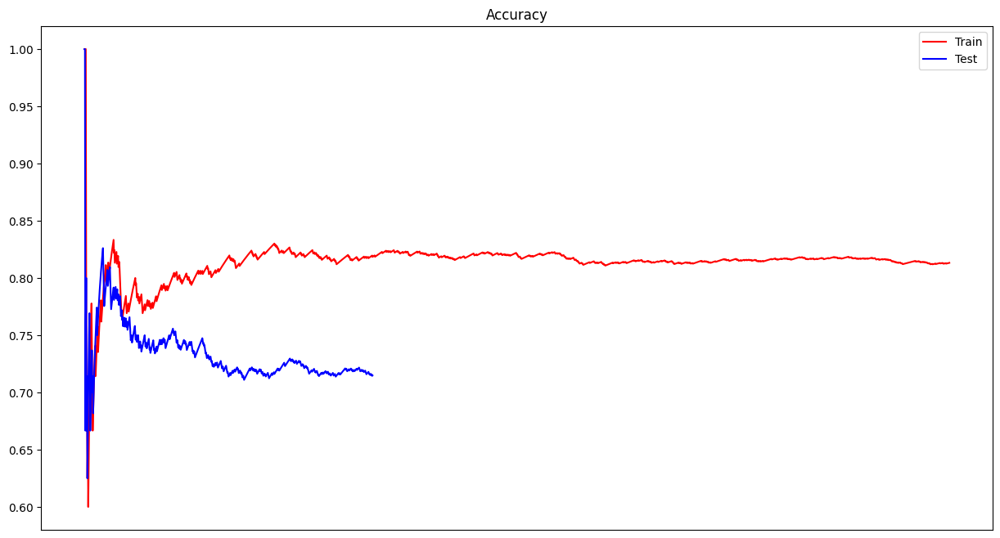

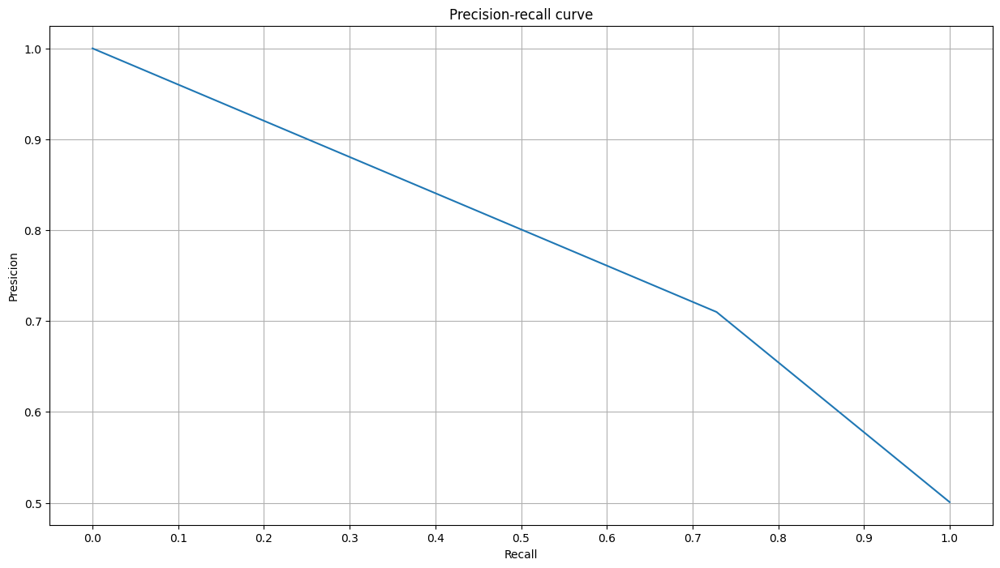

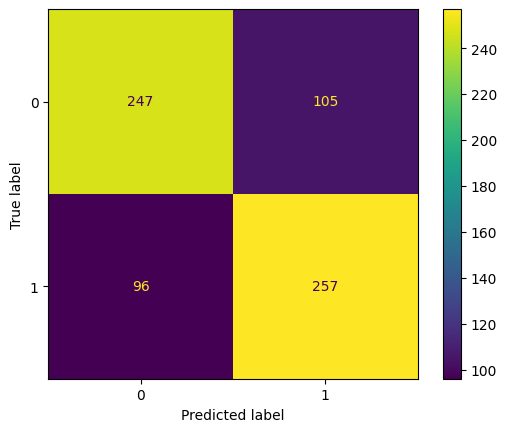

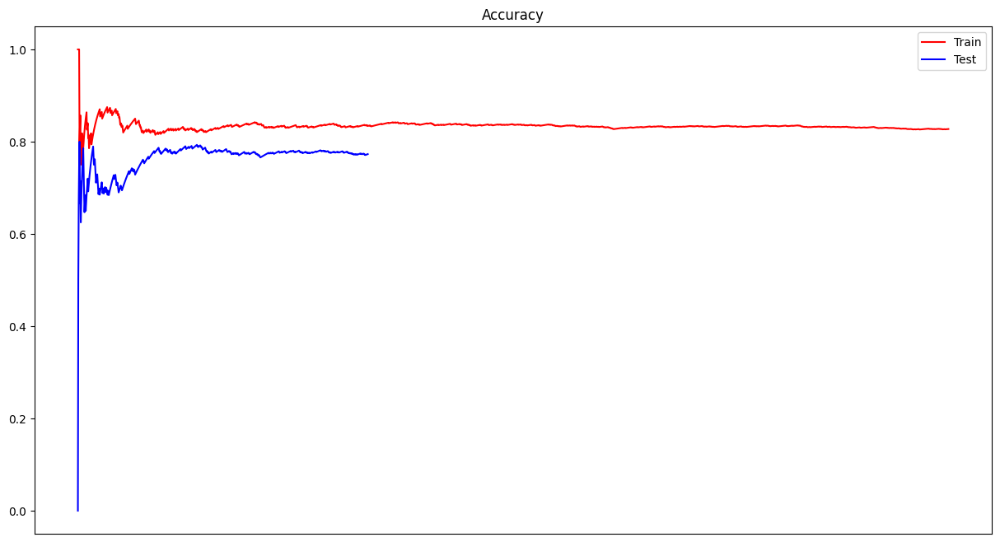

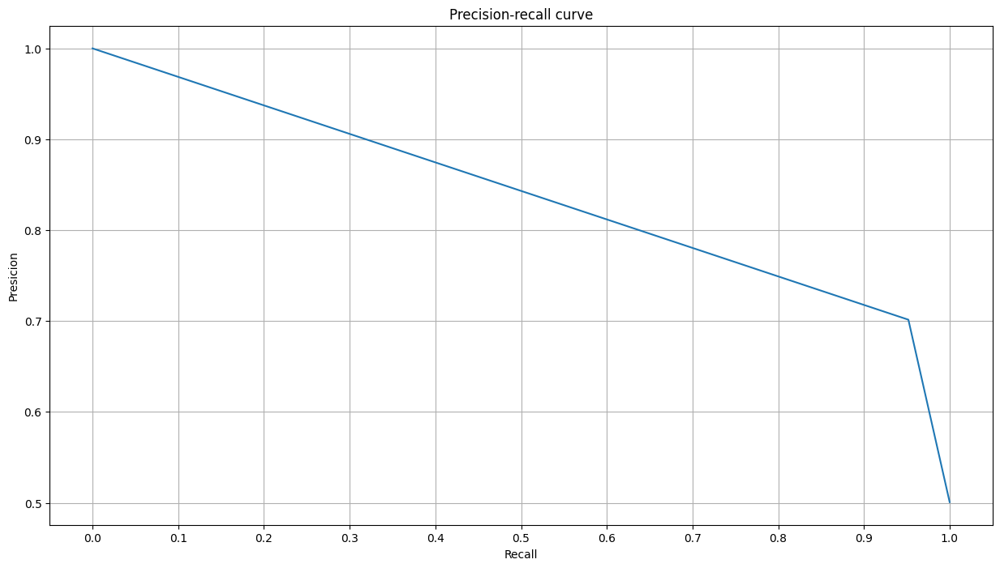

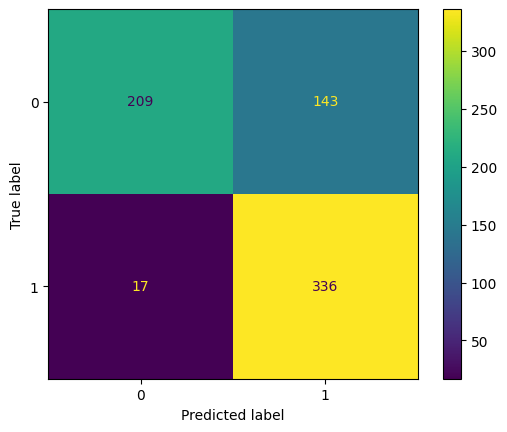

Processed model 4/7


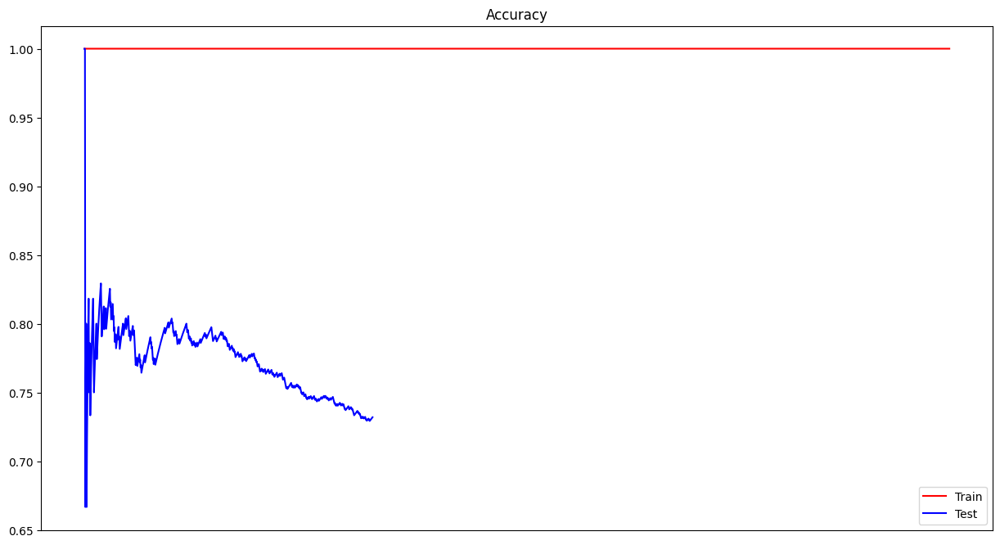

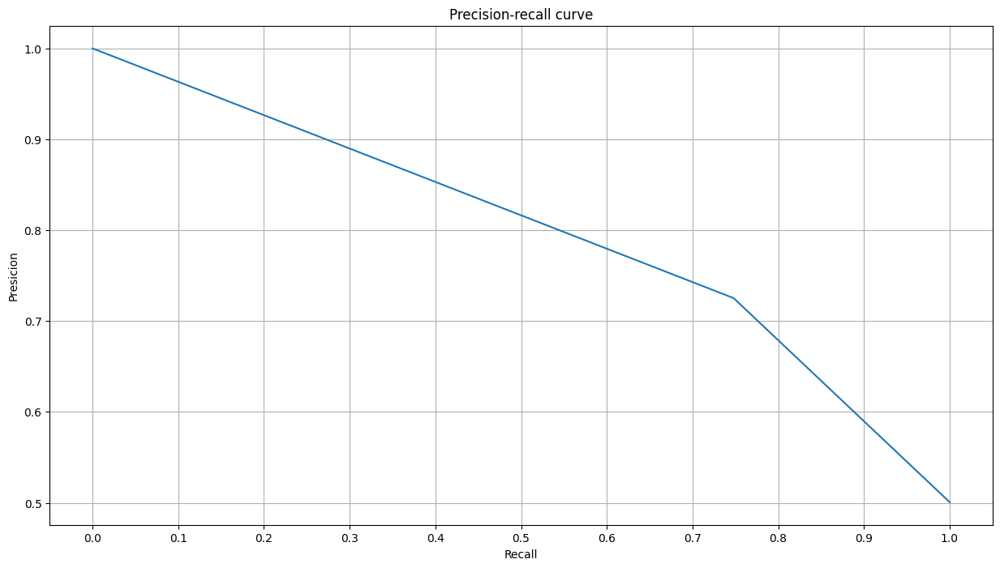

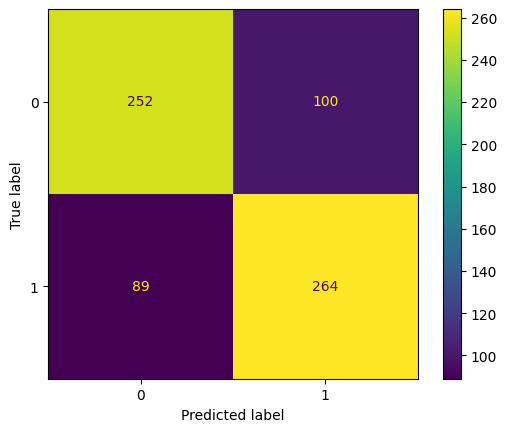

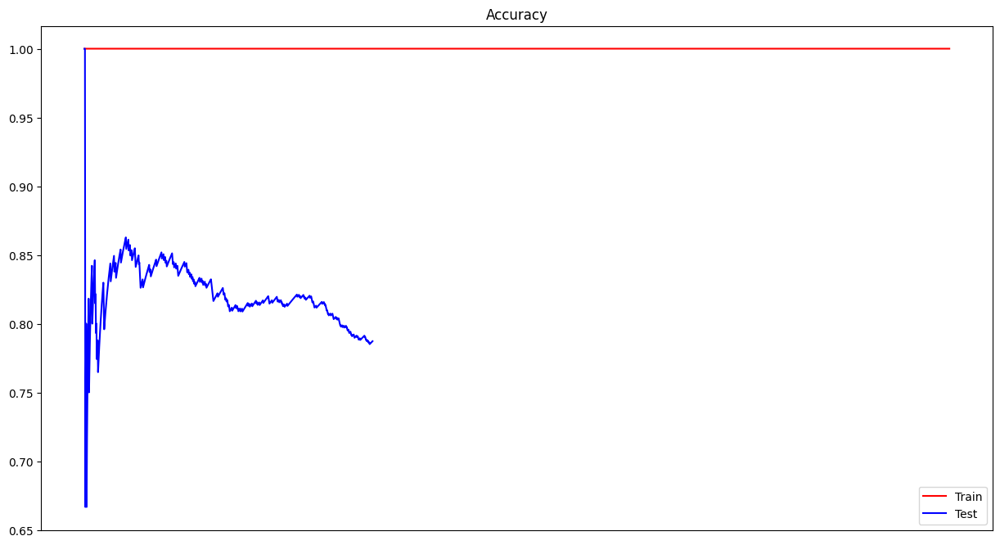

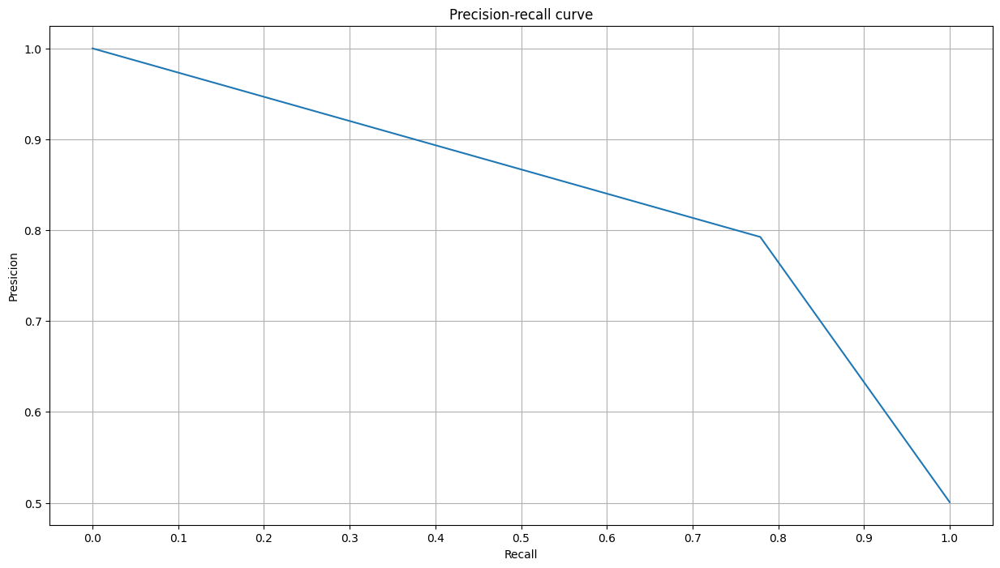

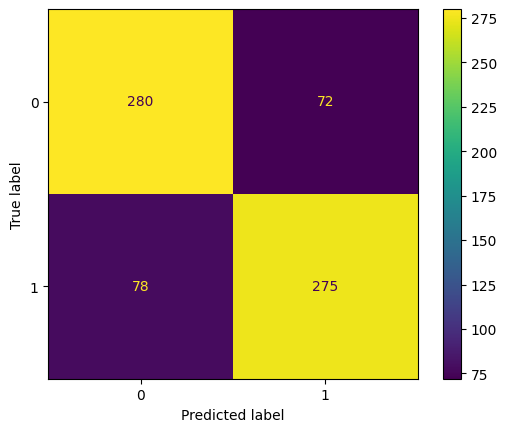

Processed model 5/7


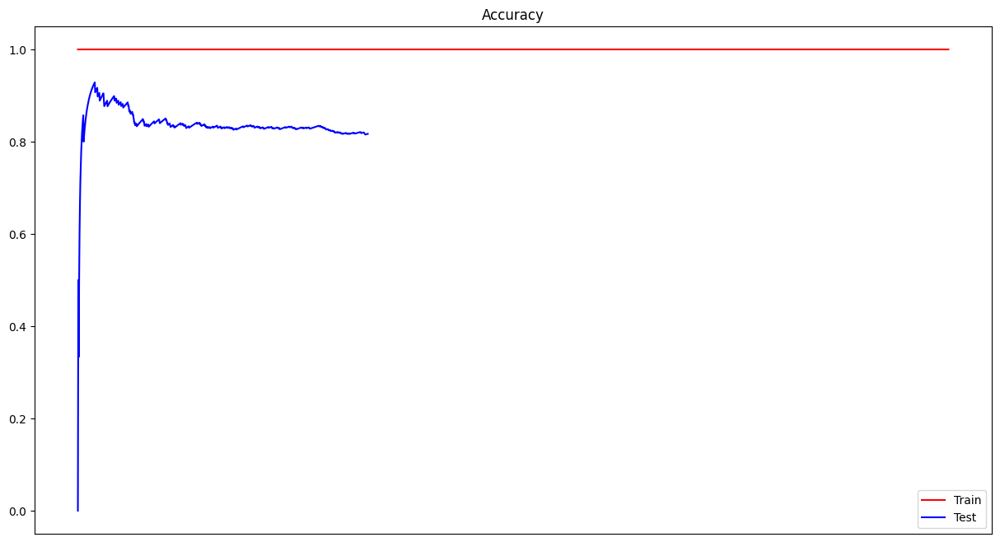

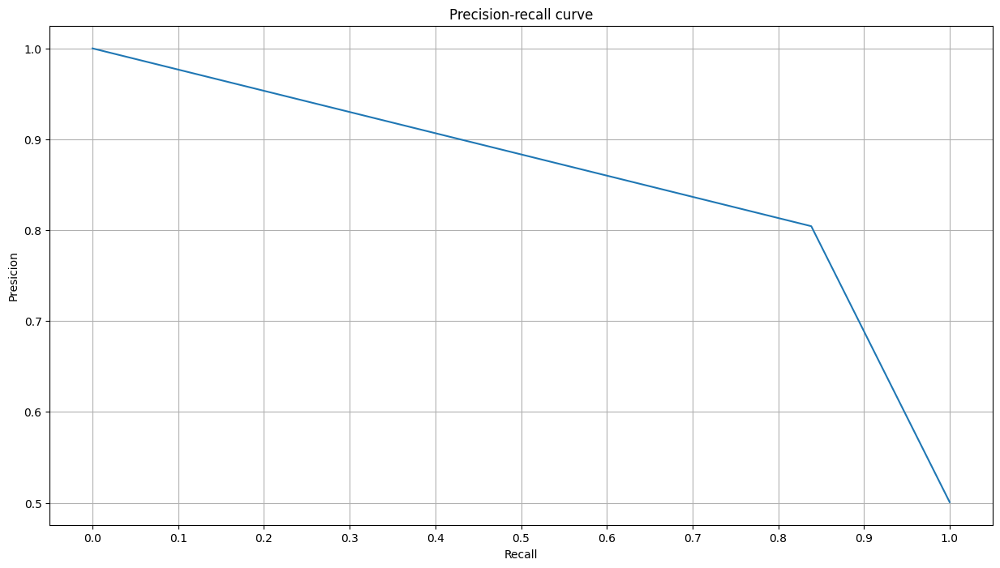

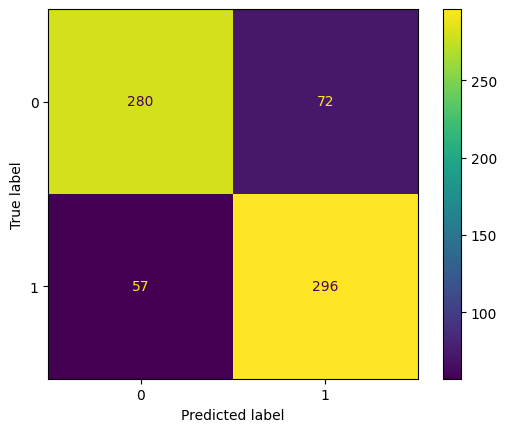

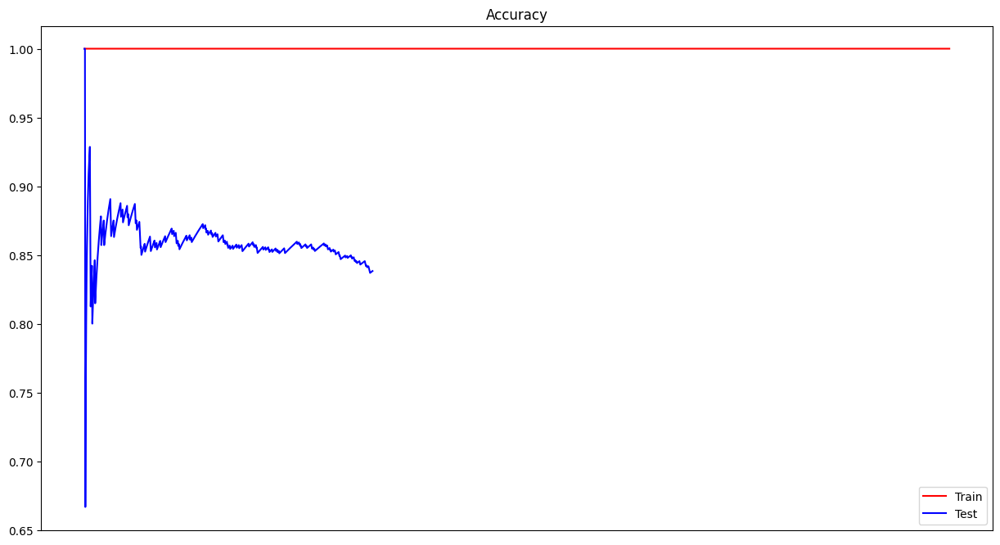

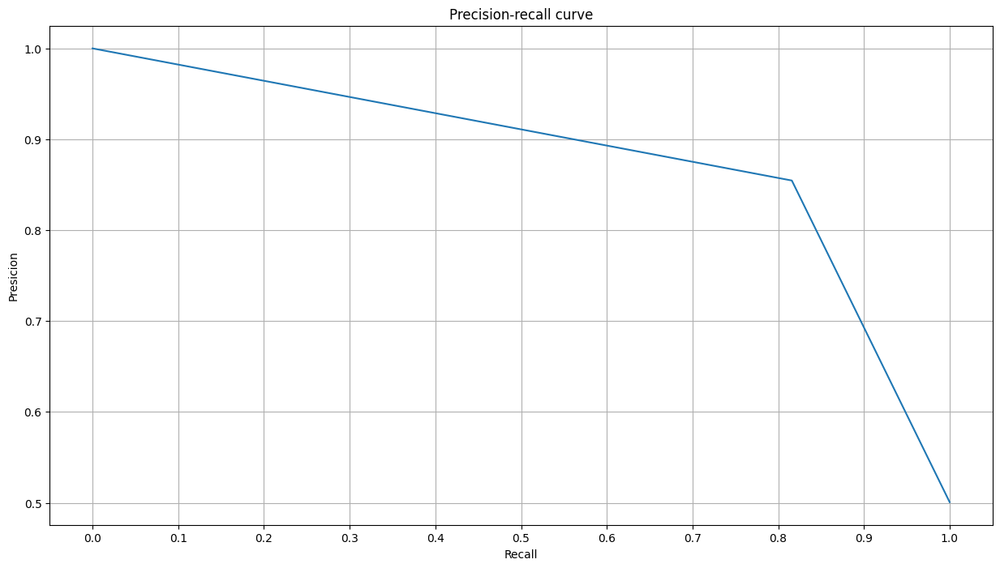

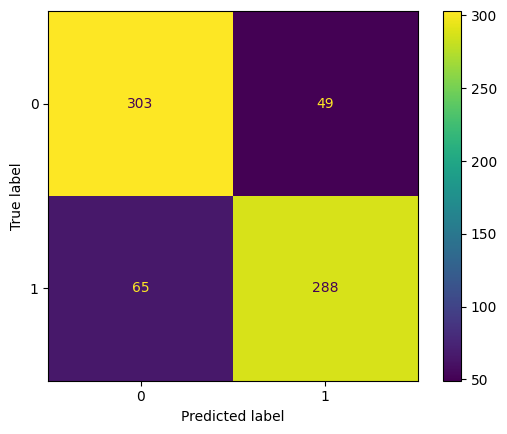

Processed model 6/7


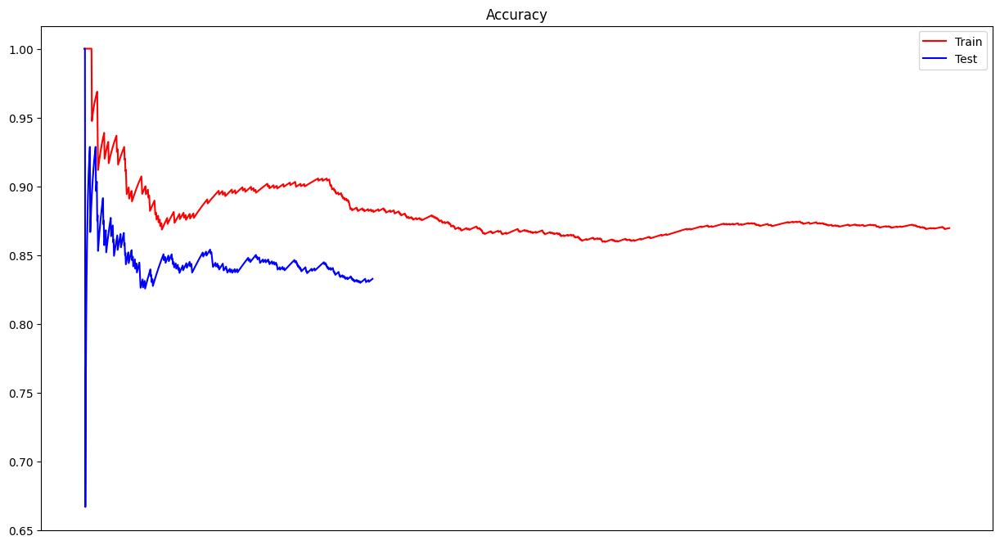

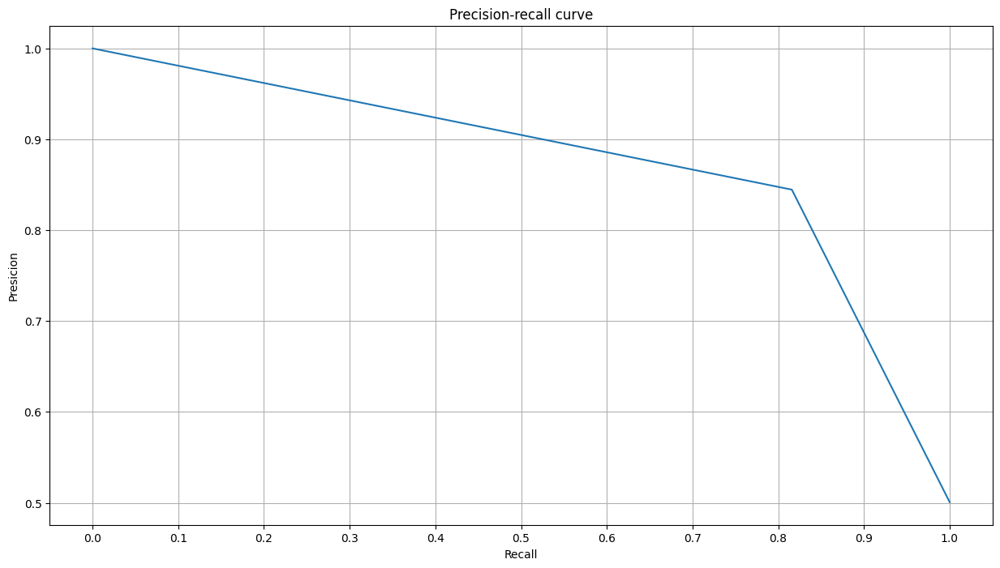

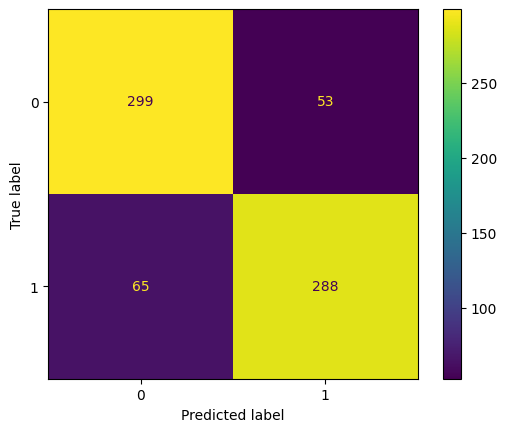

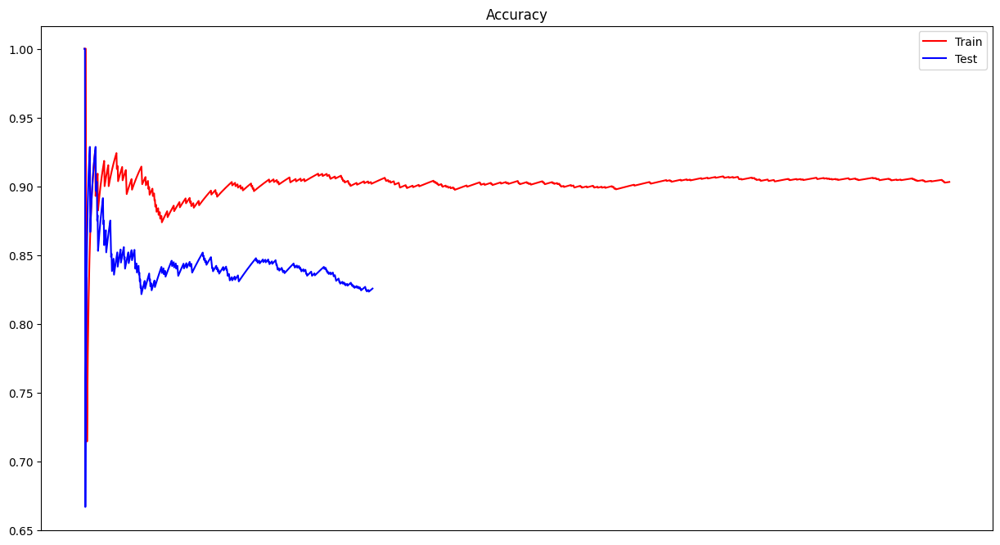

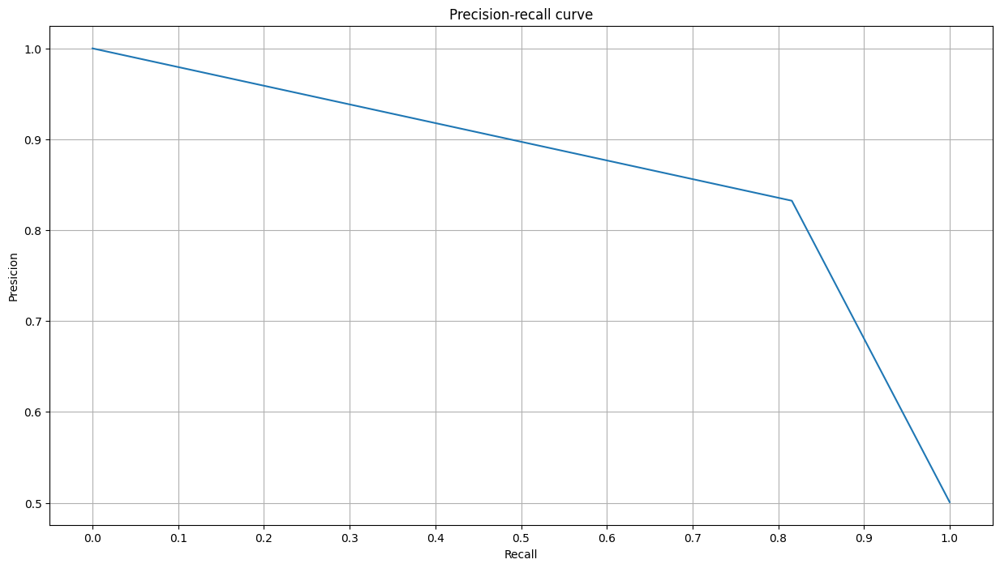

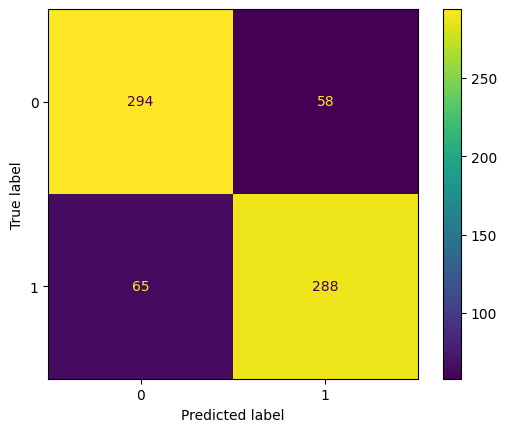

Processed model 7/7
Start processing carol_clair.csv


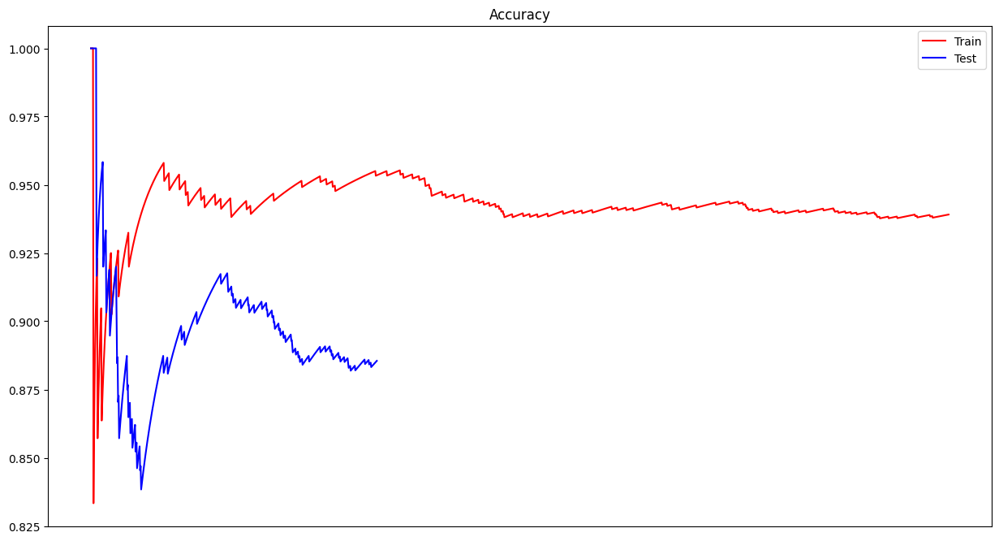

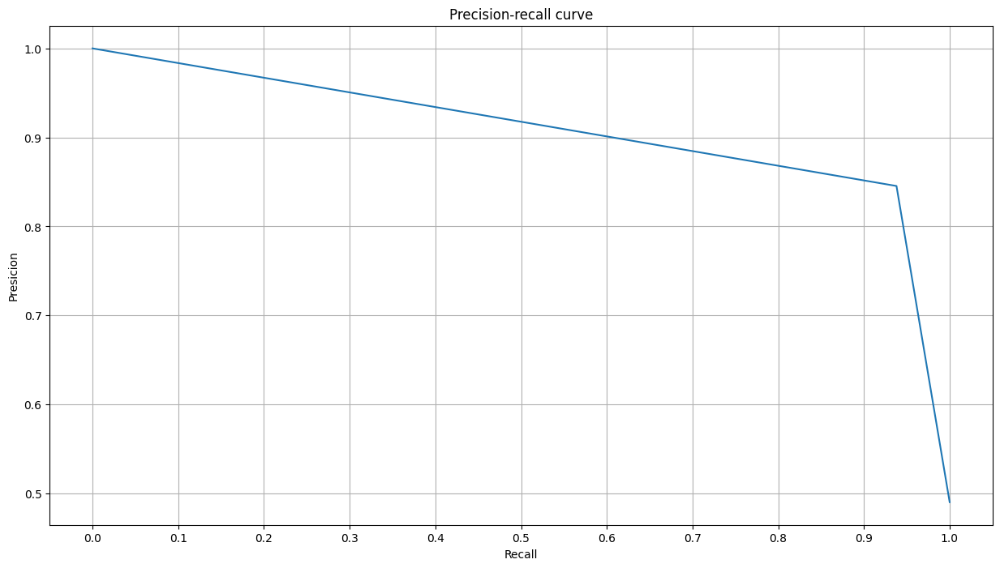

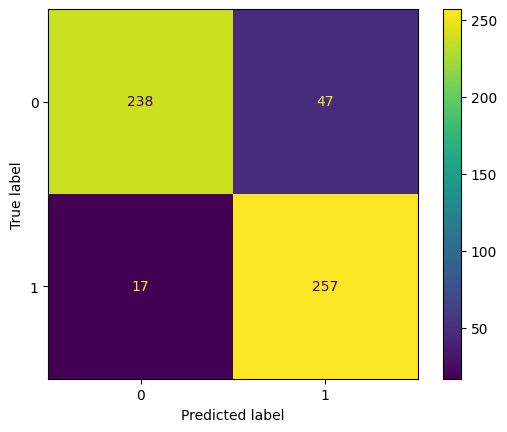

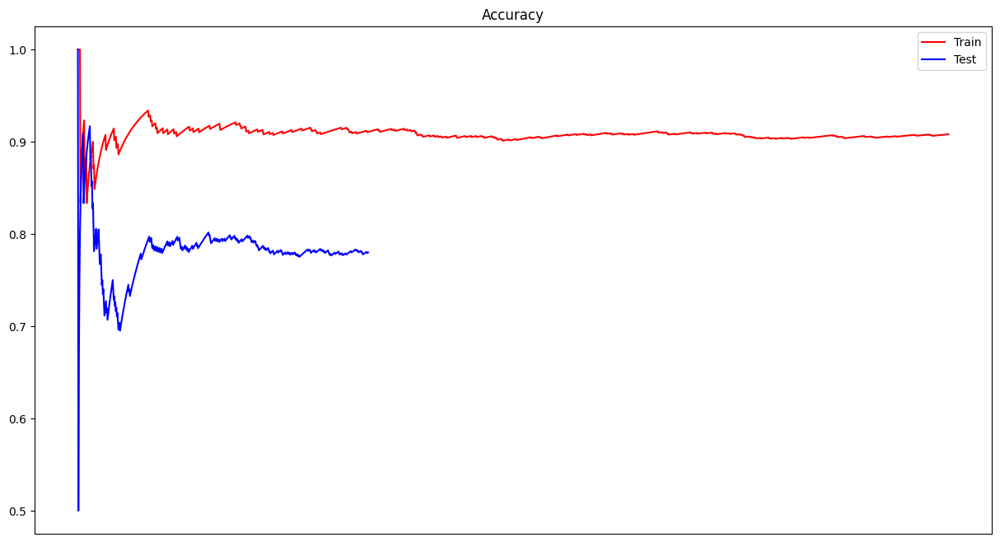

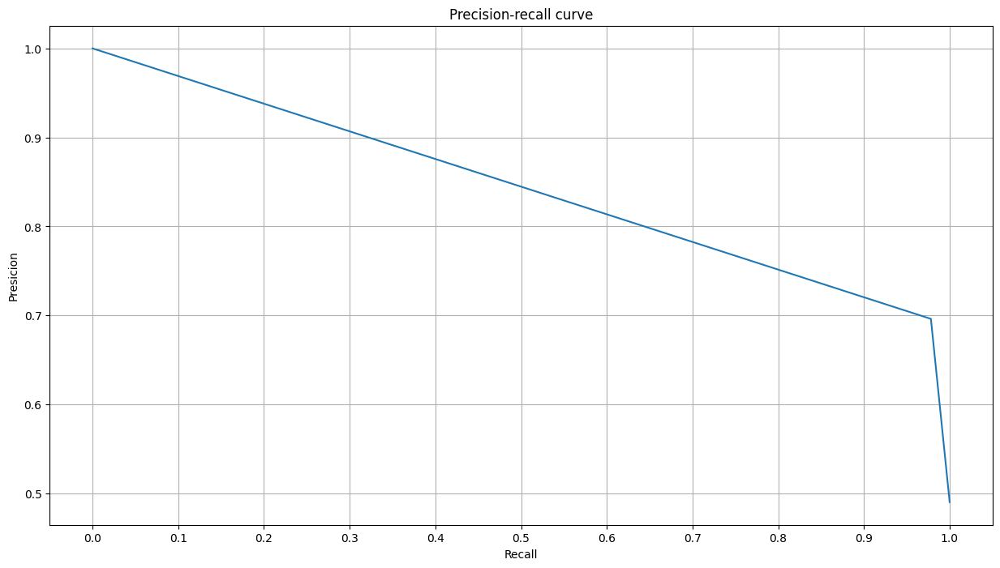

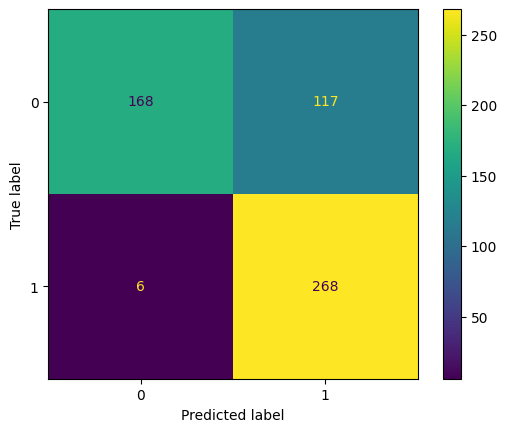

Processed model 1/7


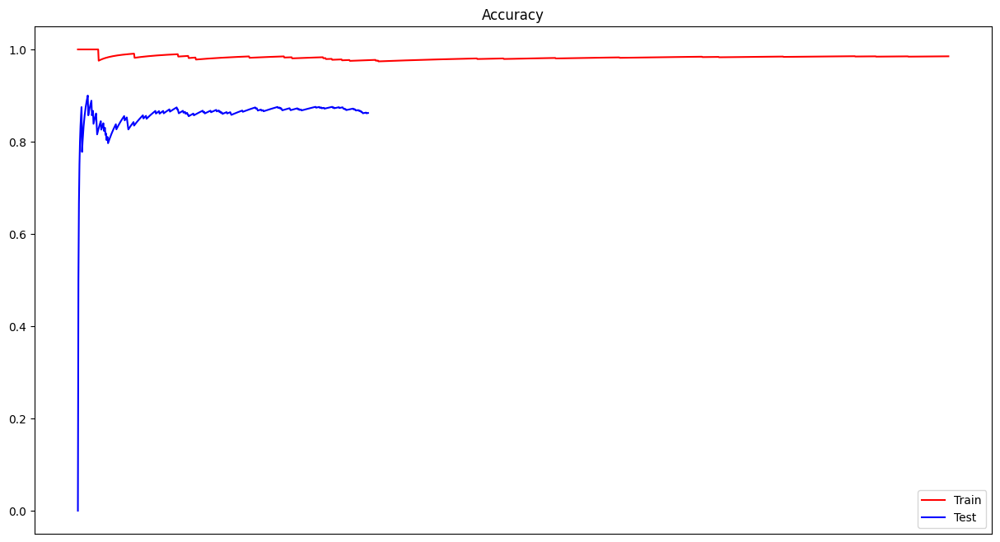

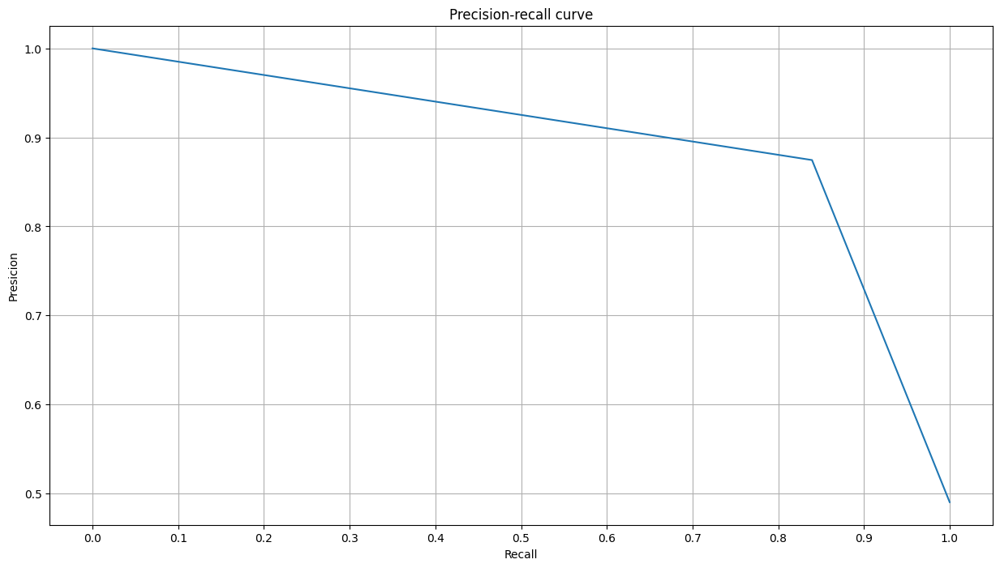

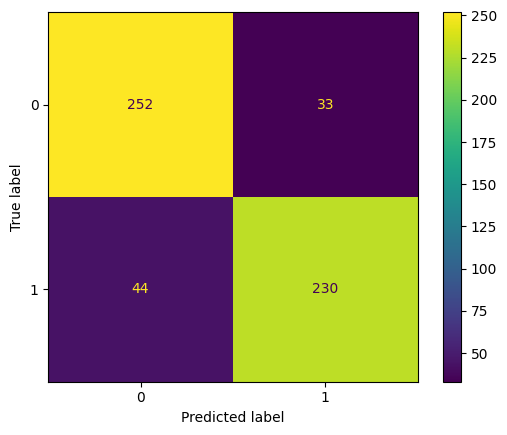

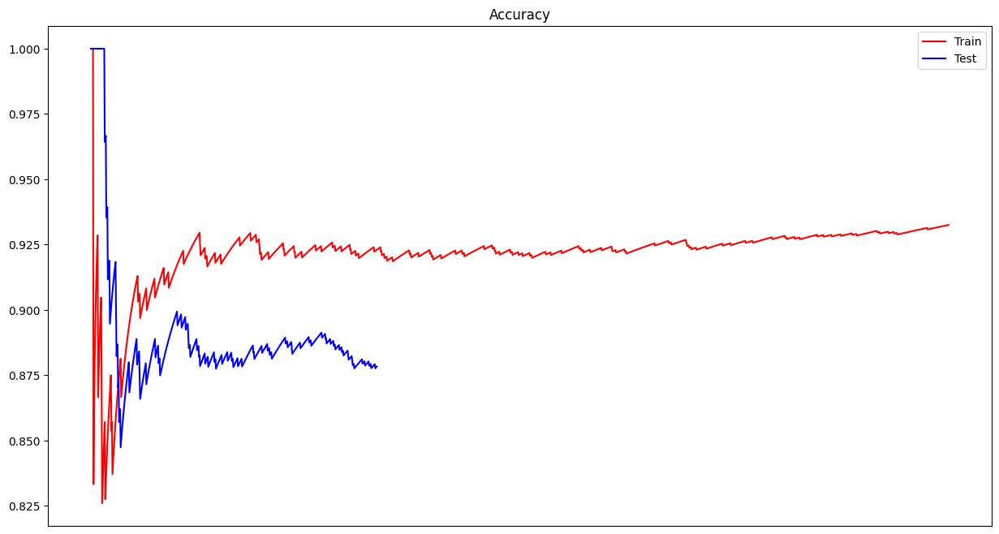

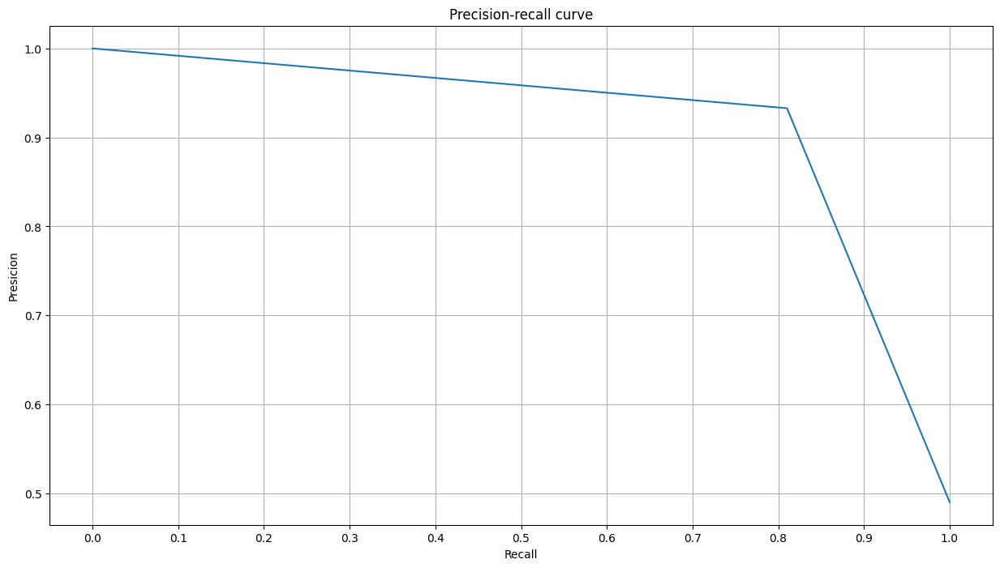

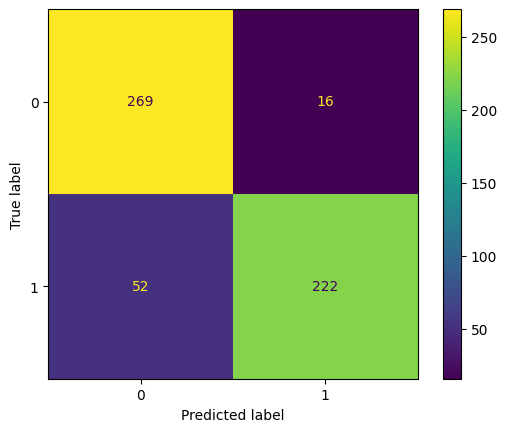

Processed model 2/7


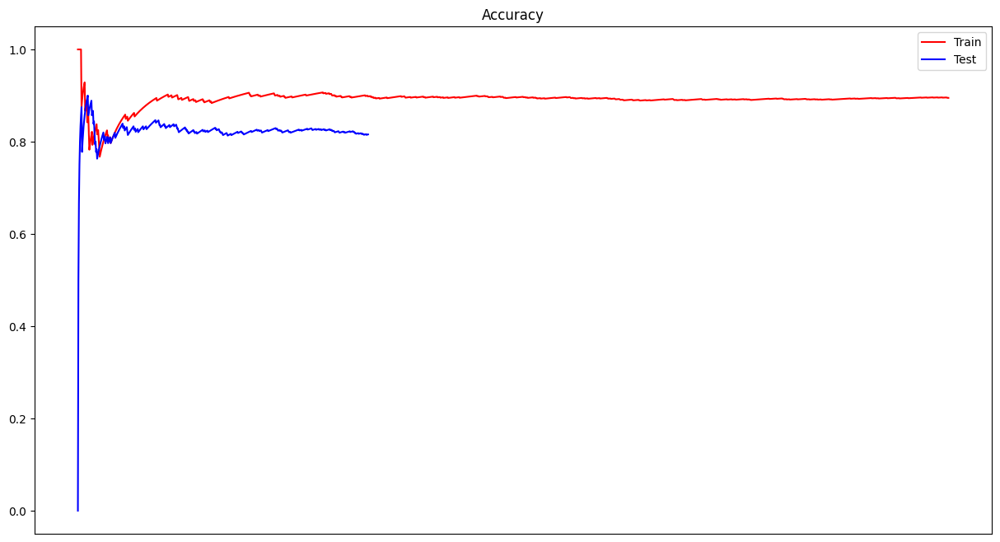

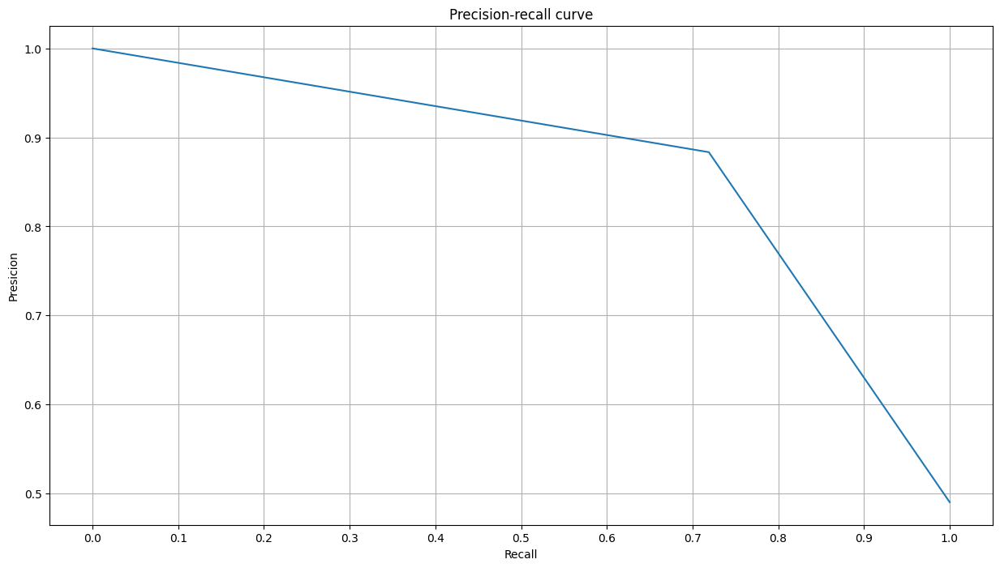

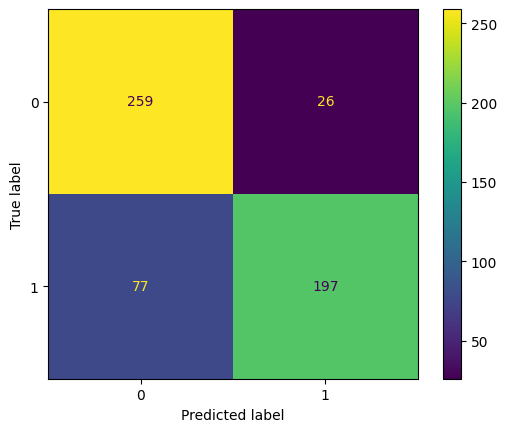

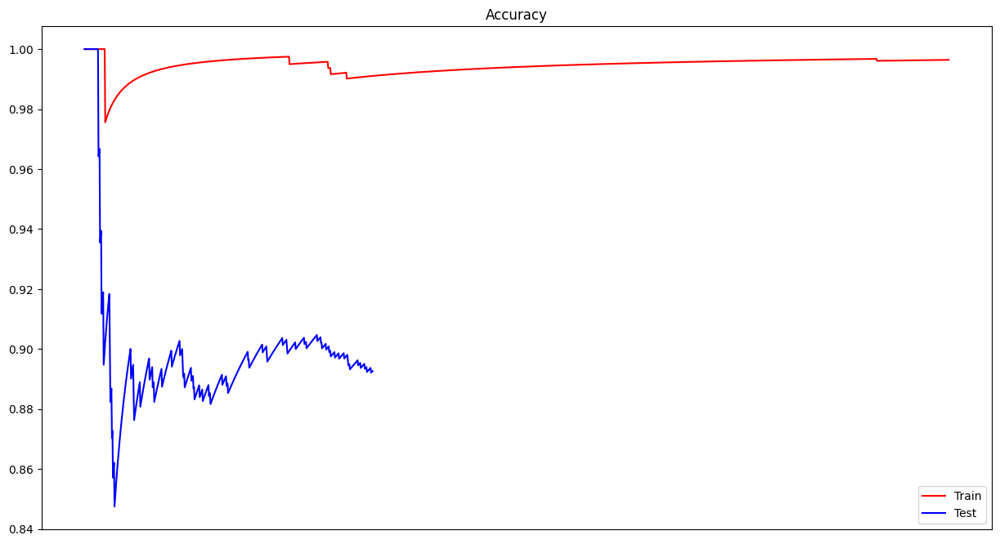

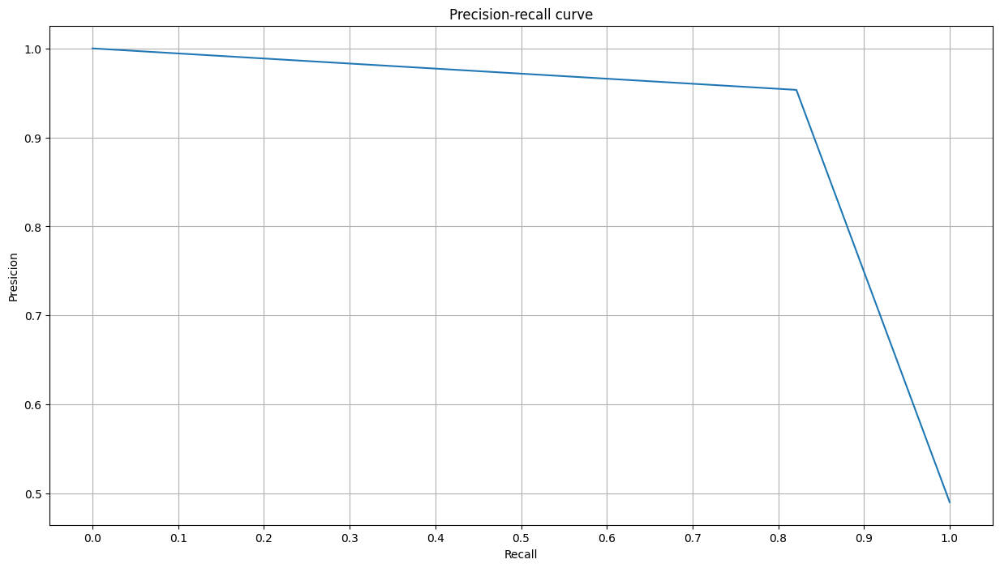

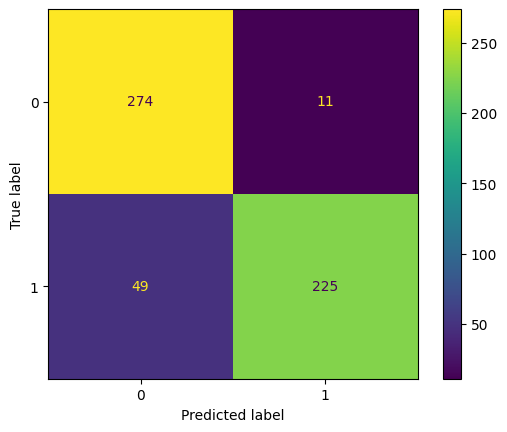

Processed model 3/7


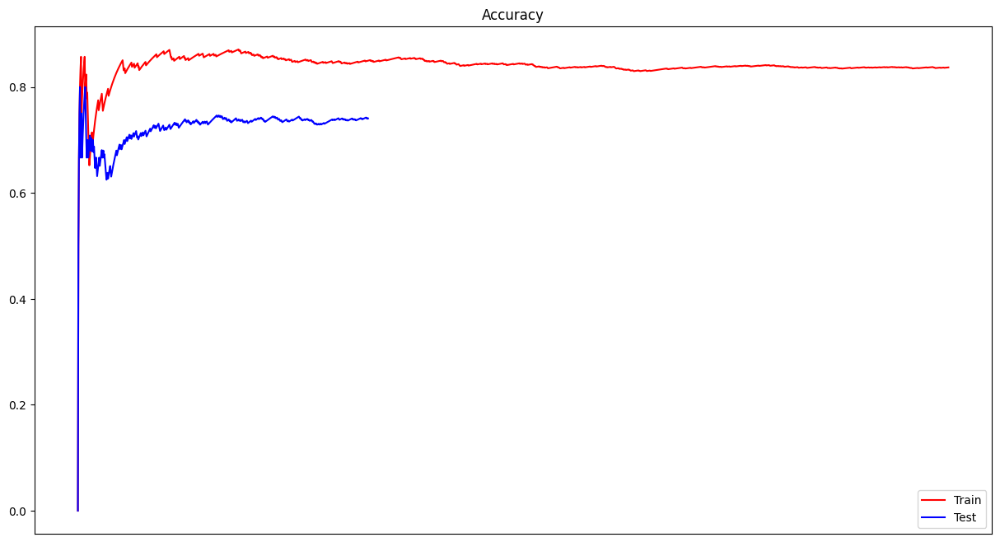

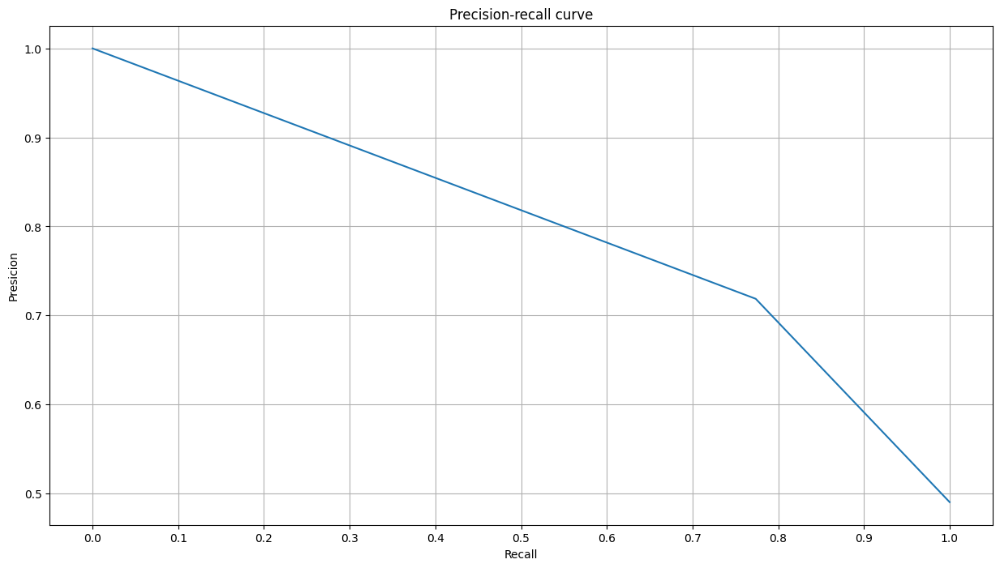

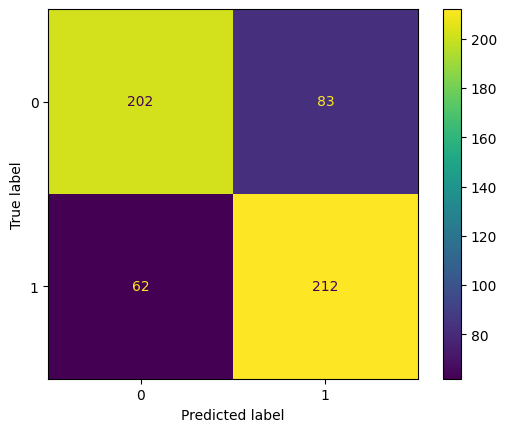

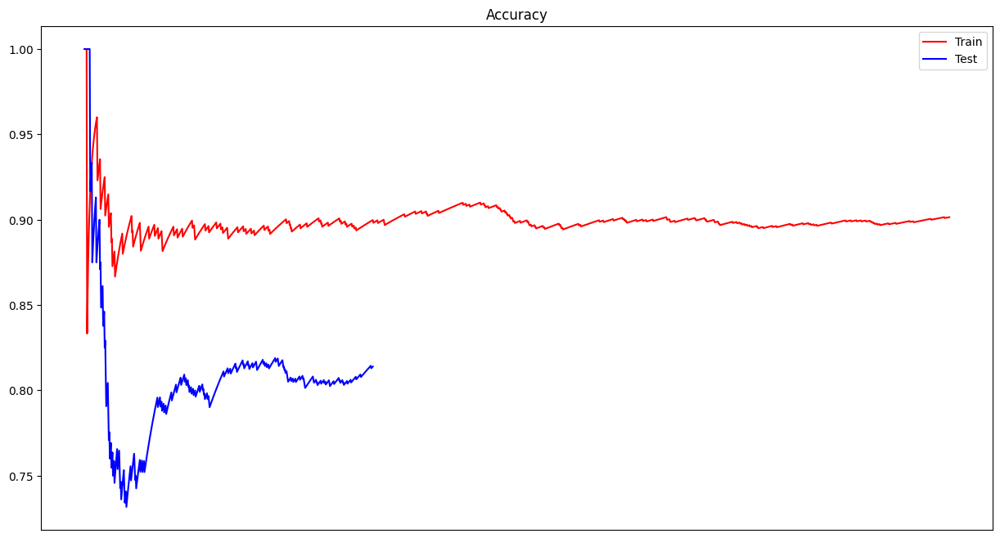

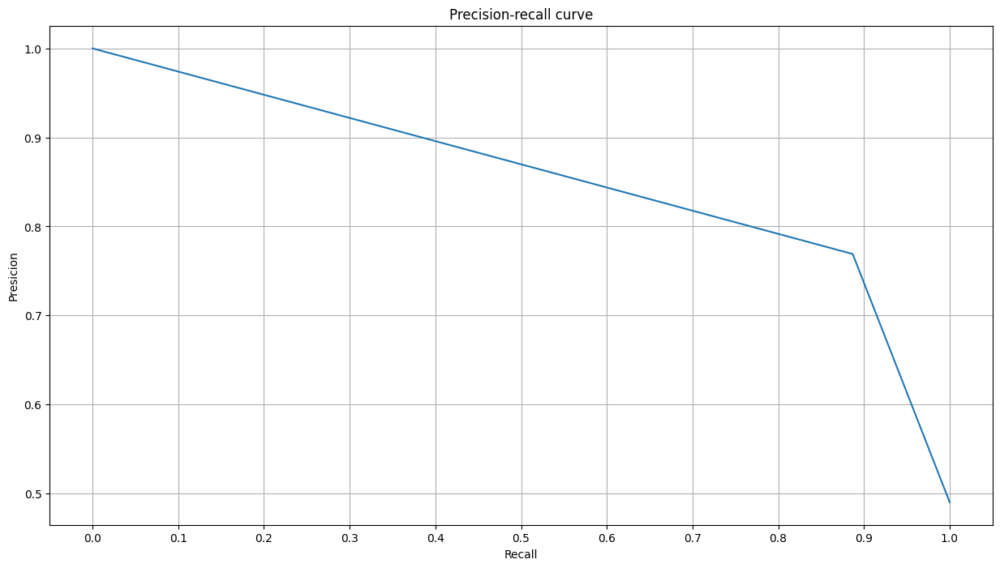

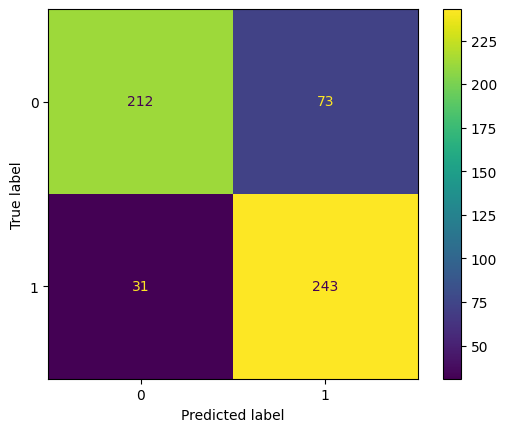

Processed model 4/7


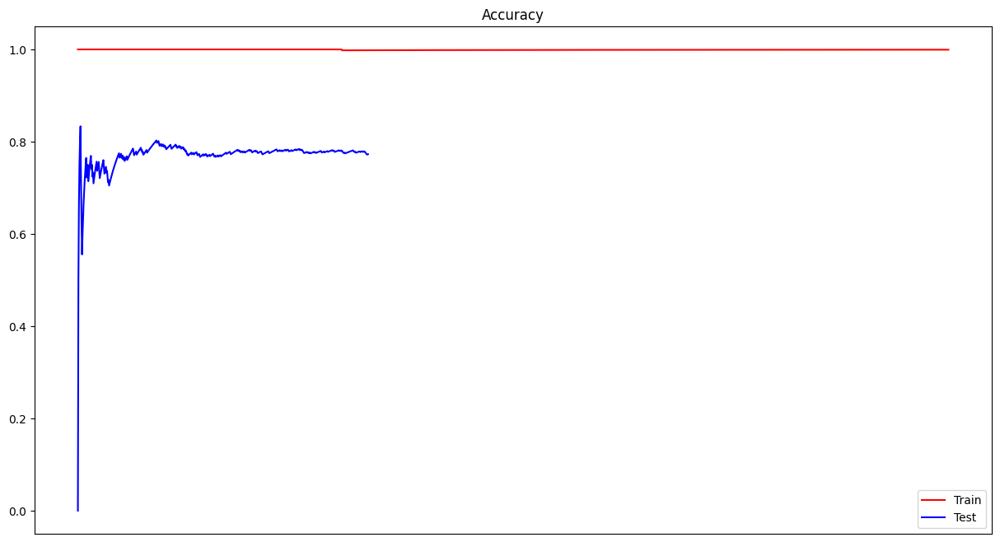

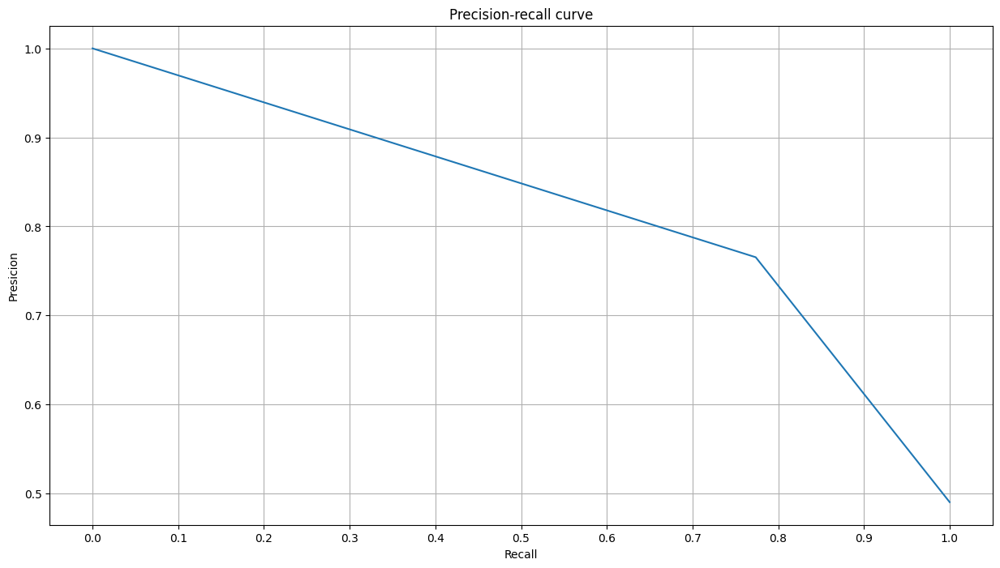

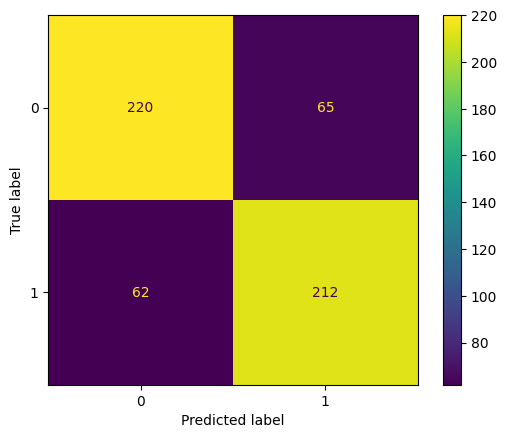

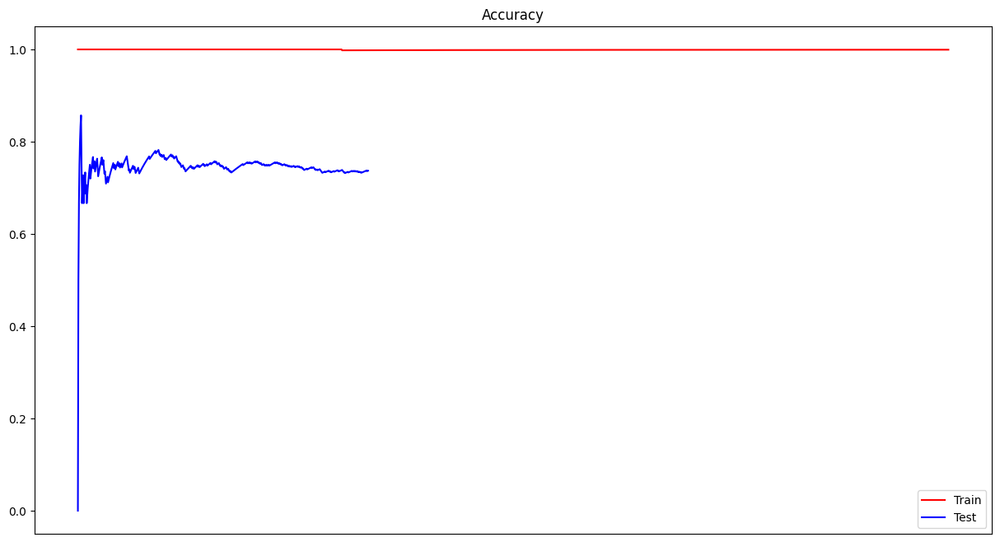

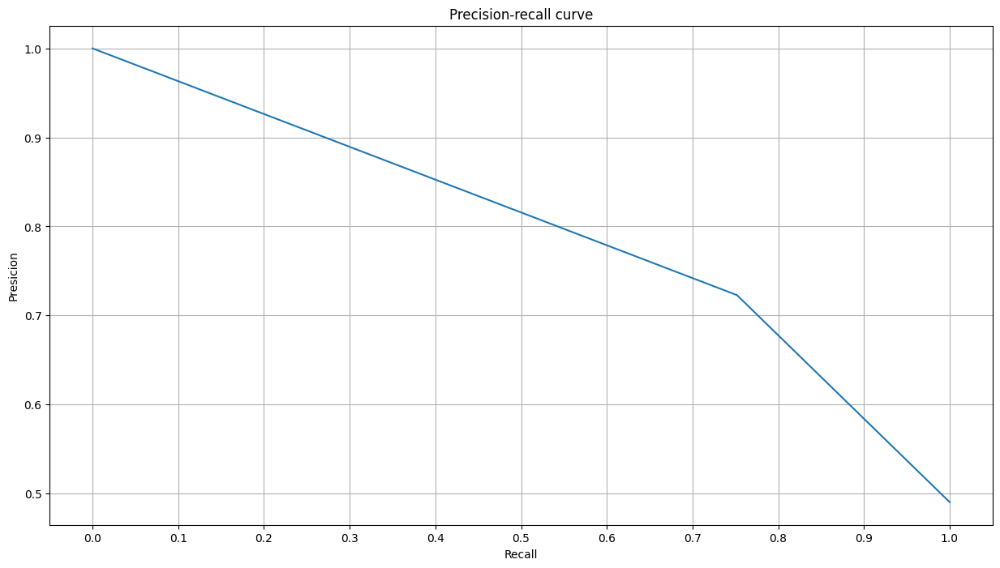

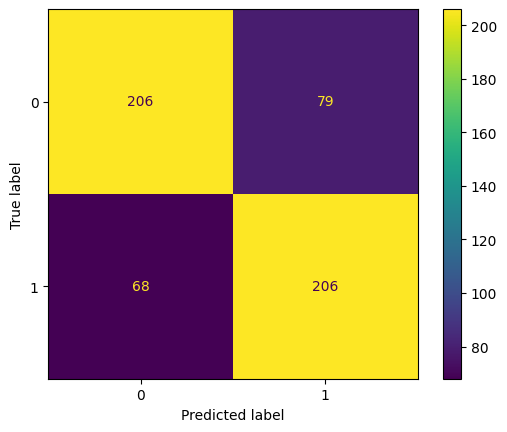

Processed model 5/7


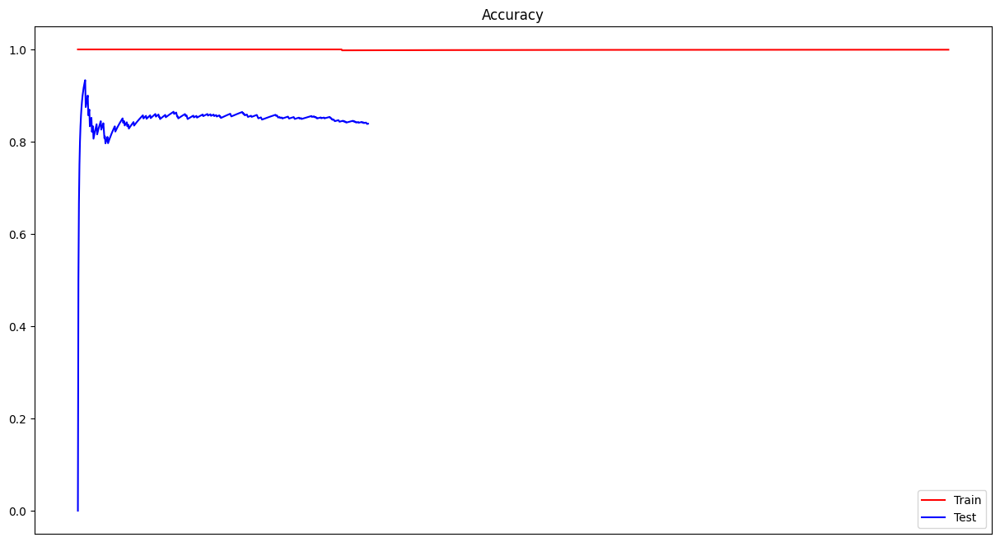

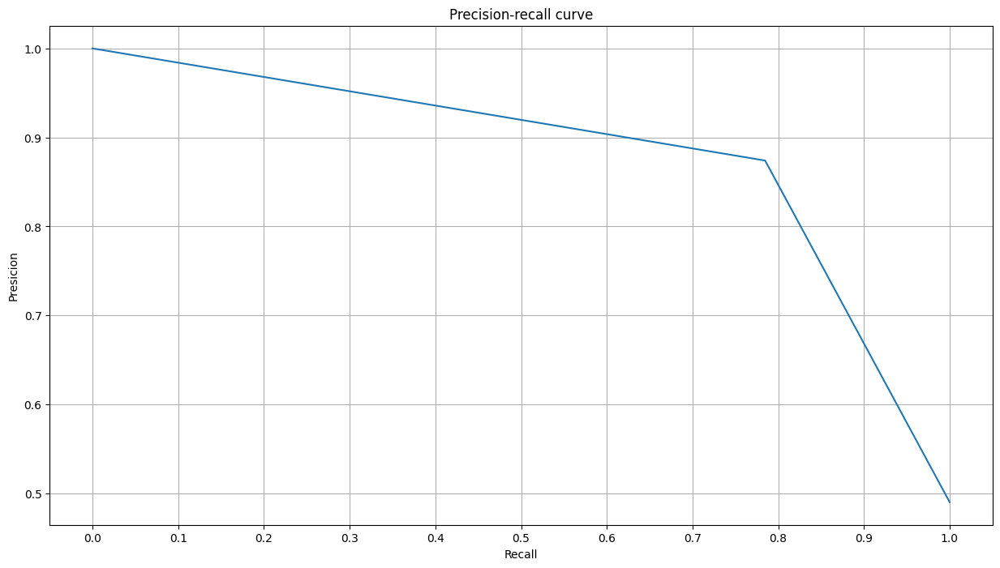

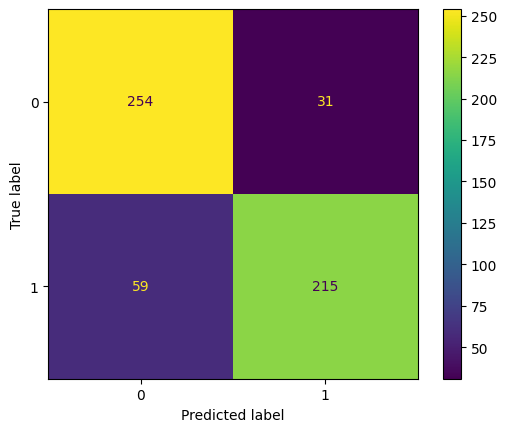

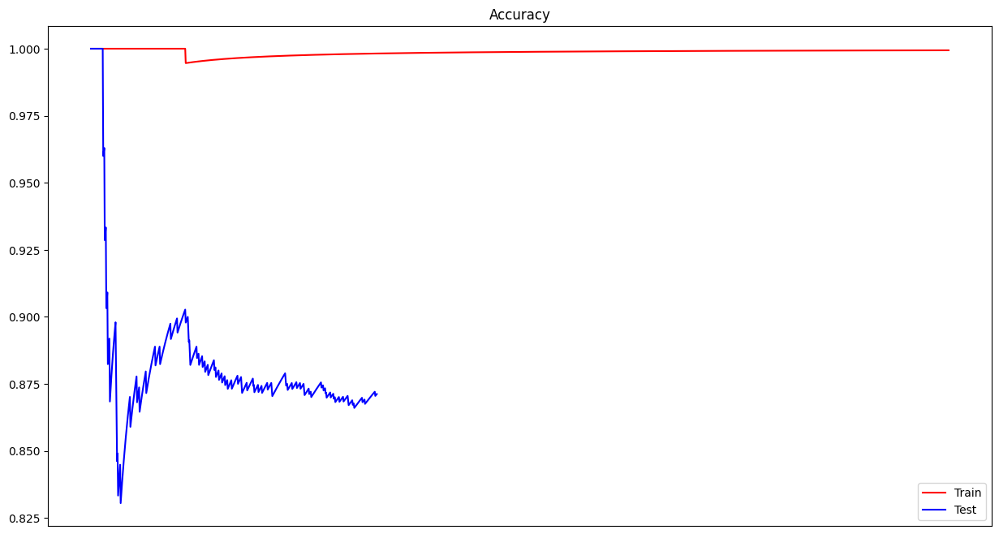

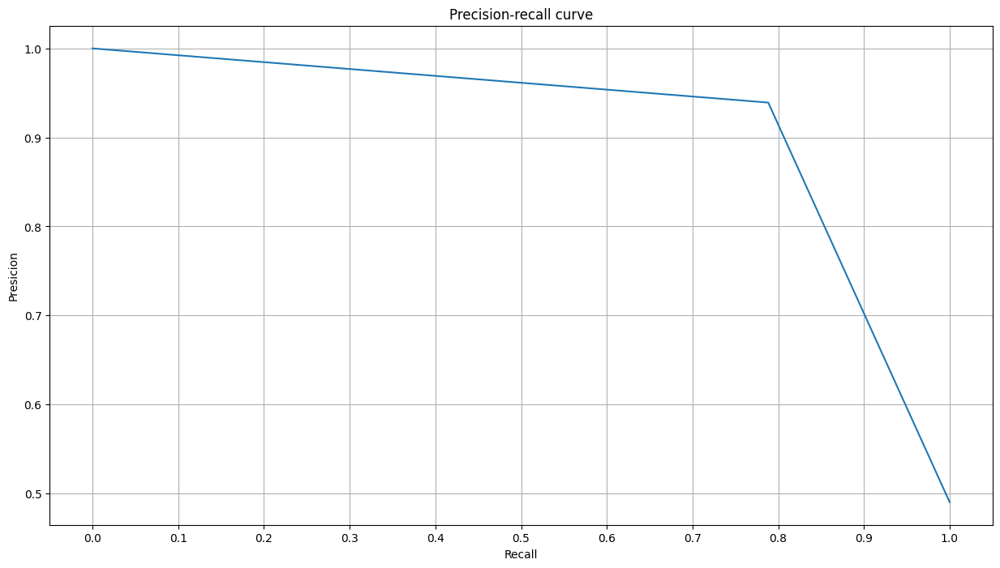

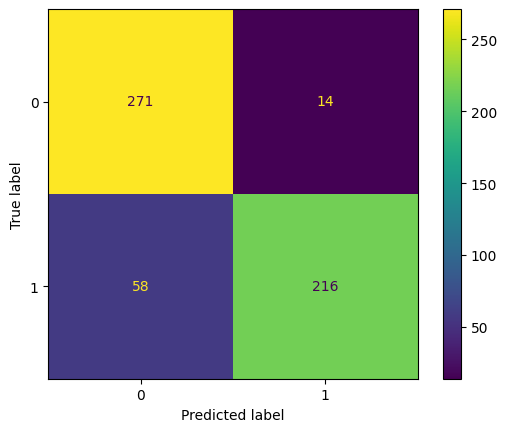

Processed model 6/7


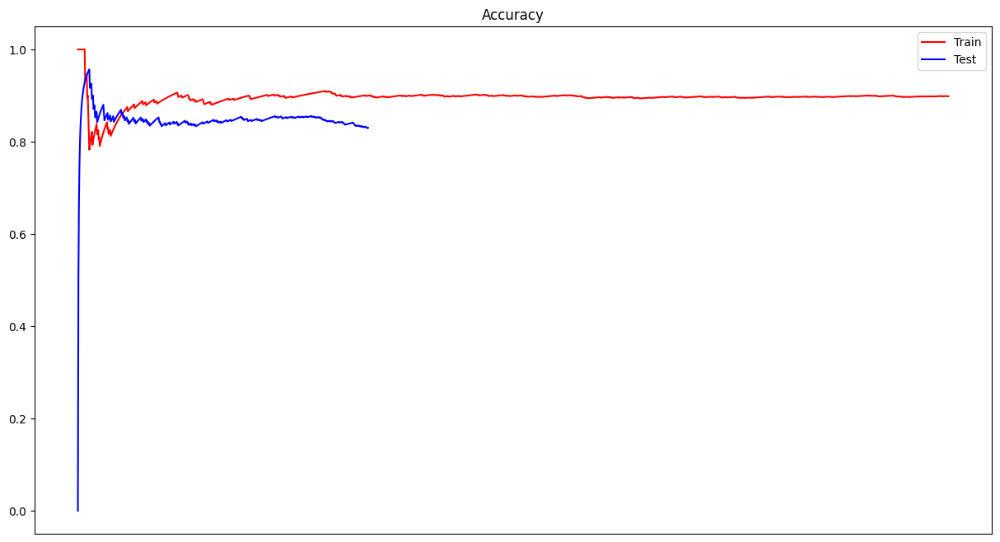

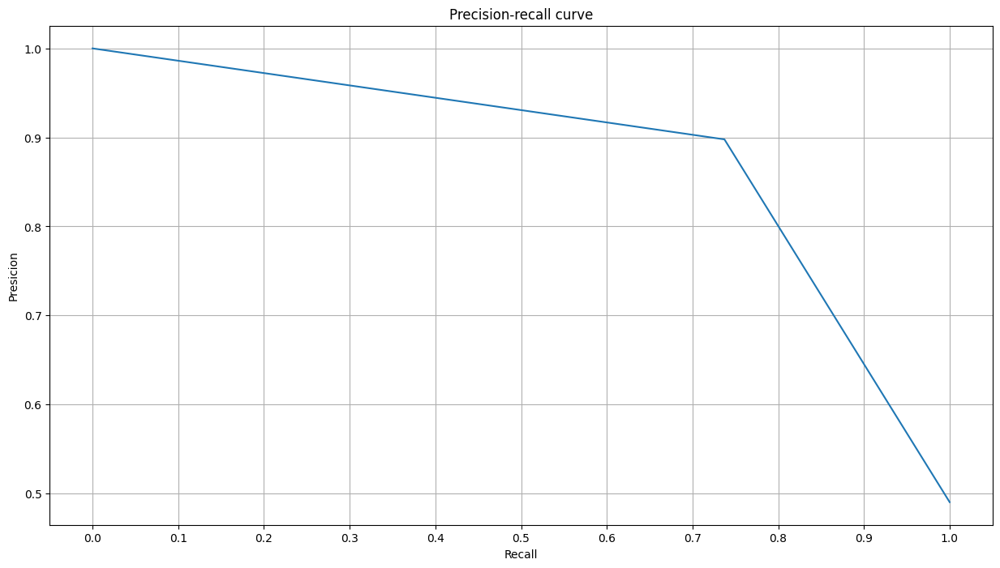

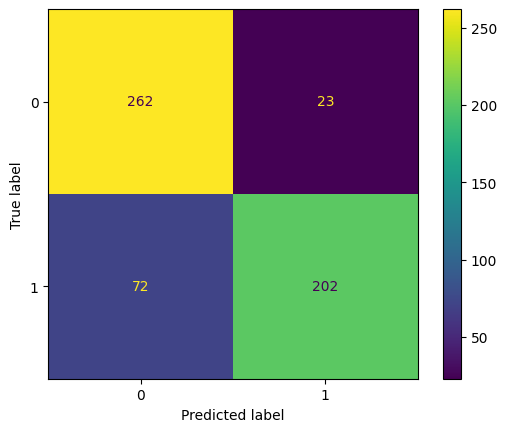

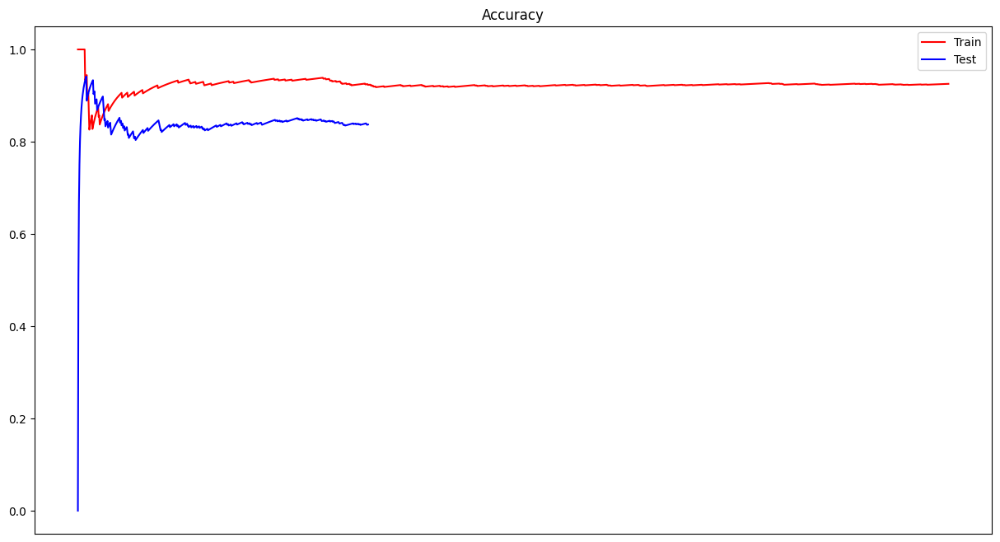

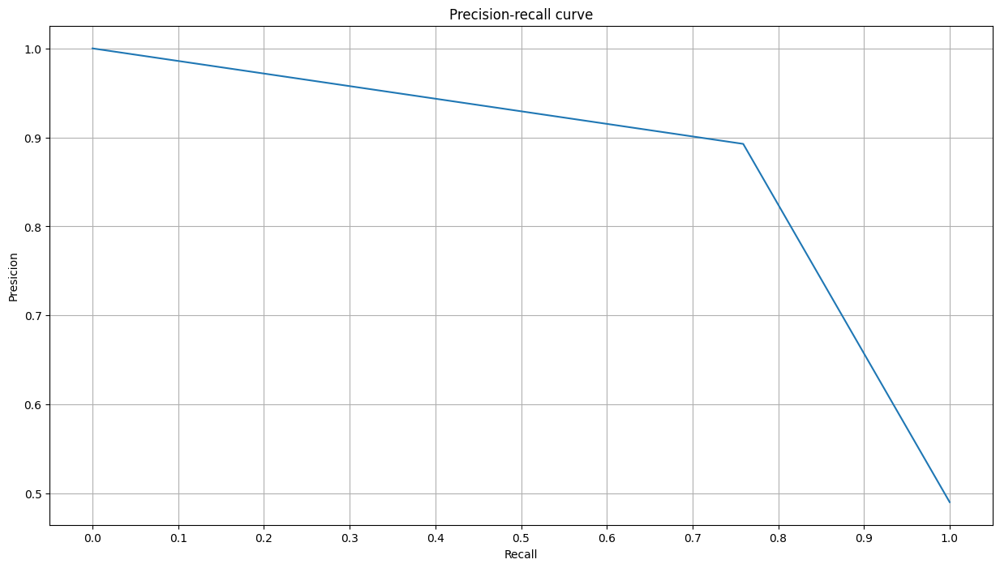

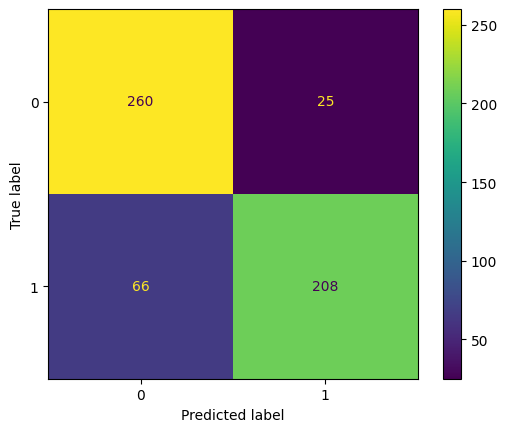

Processed model 7/7
Start processing michelle_cash.csv


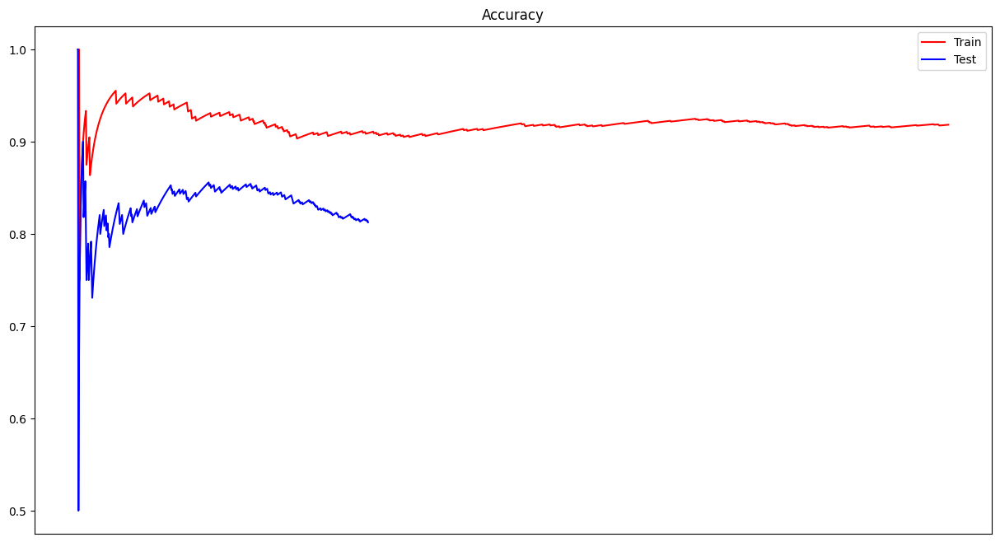

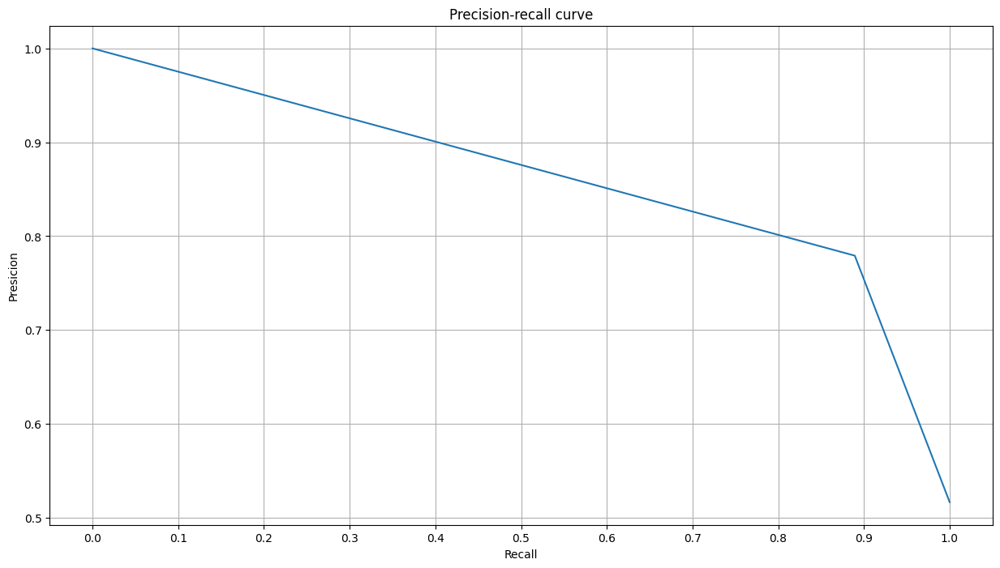

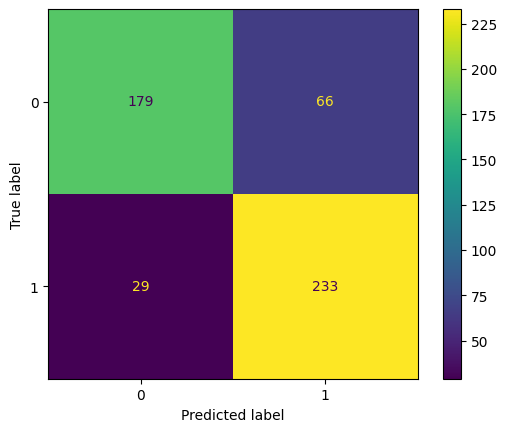

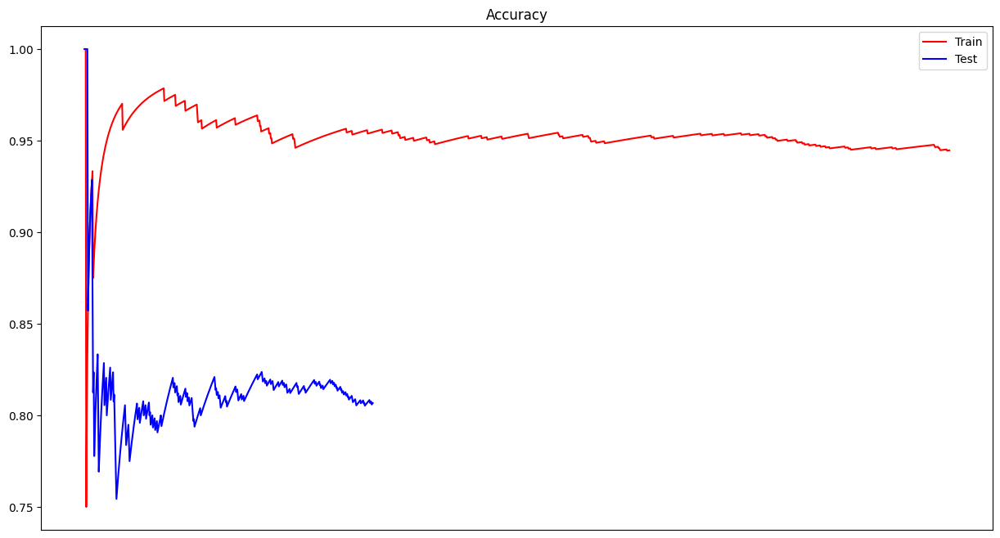

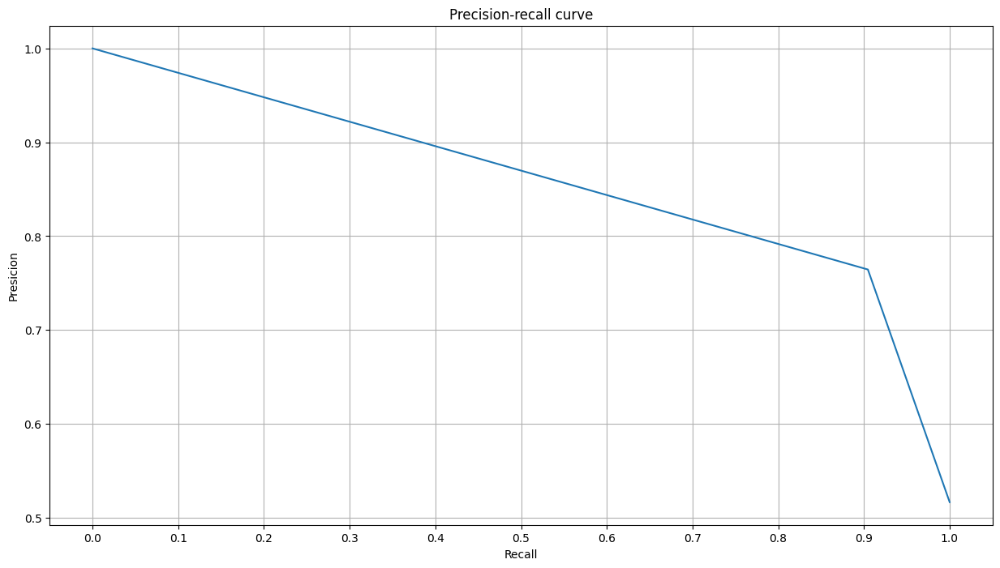

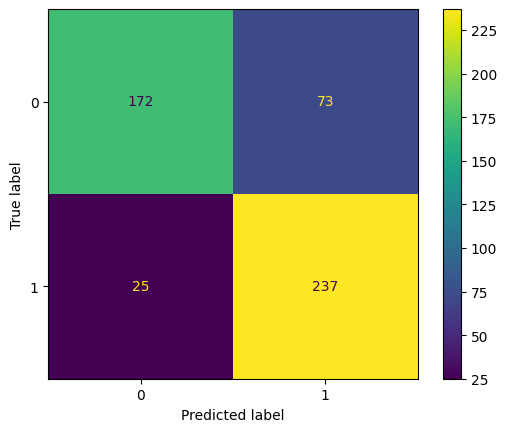

Processed model 1/7


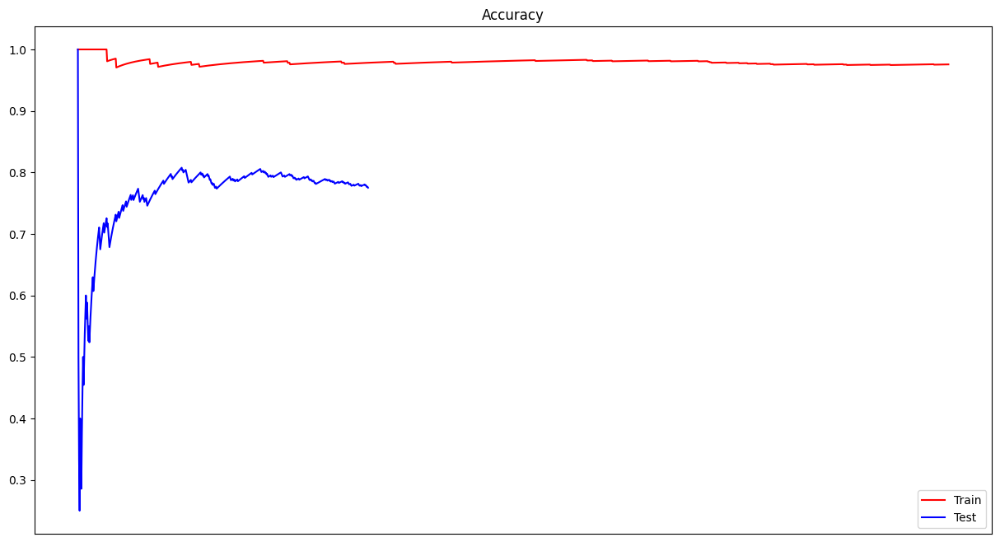

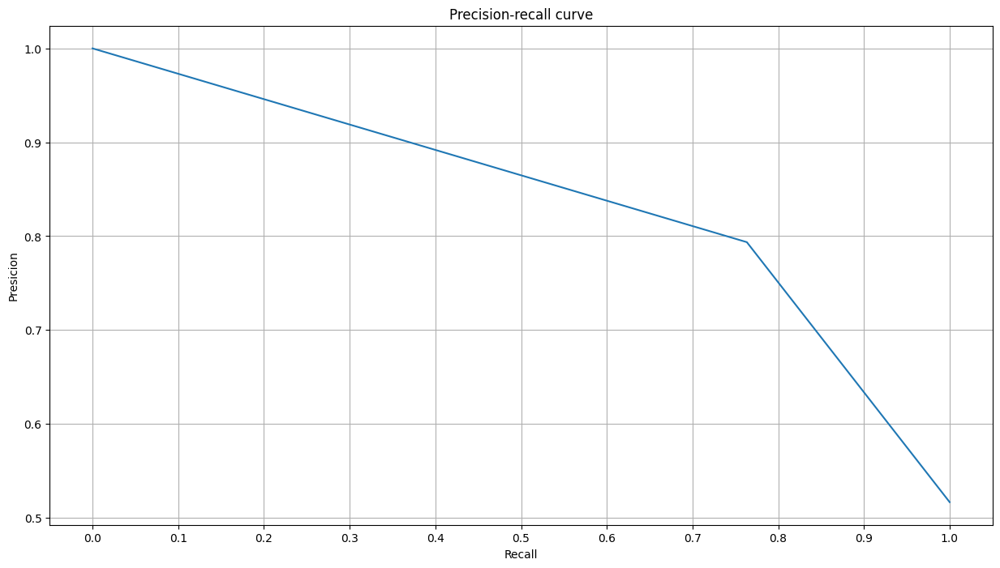

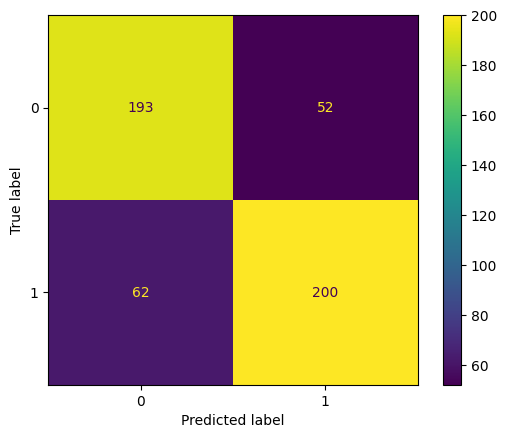

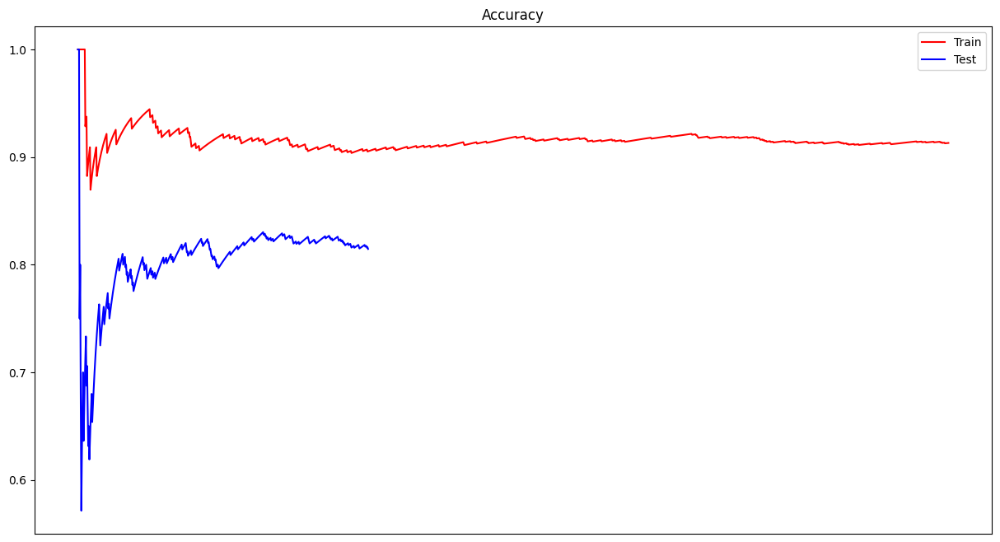

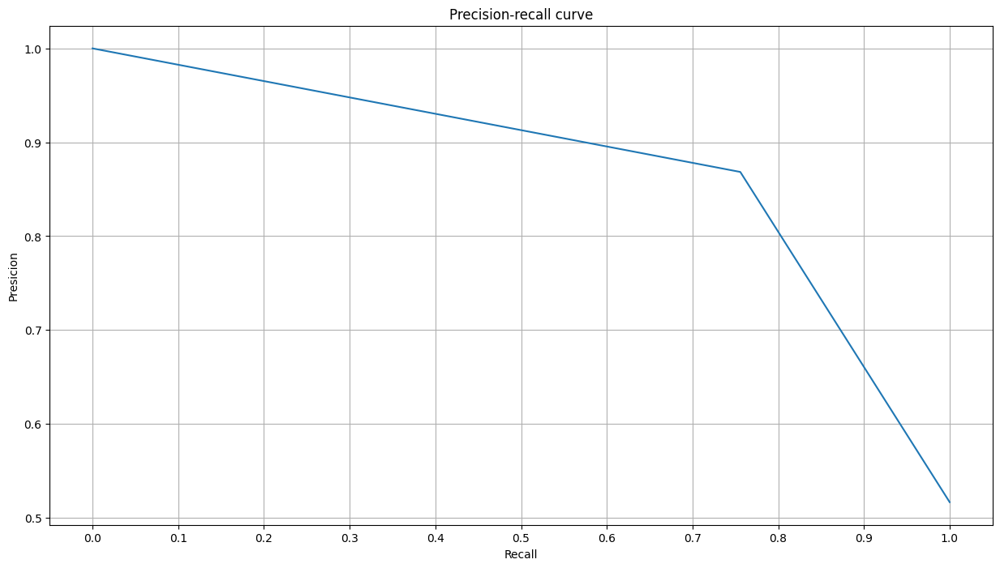

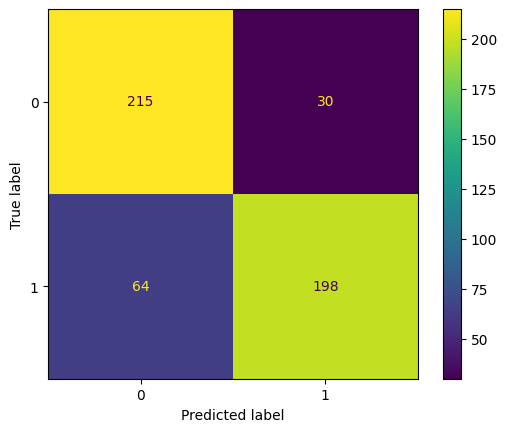

Processed model 2/7


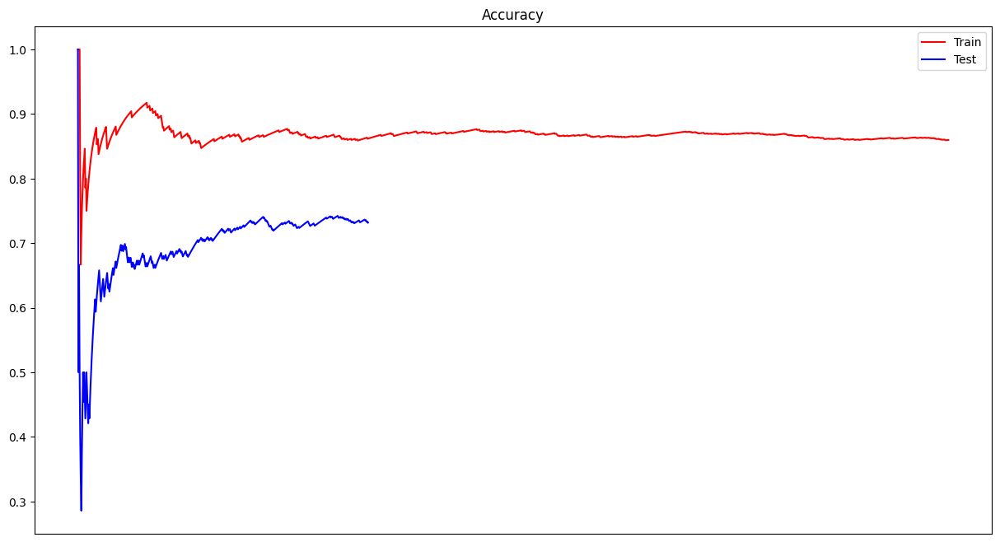

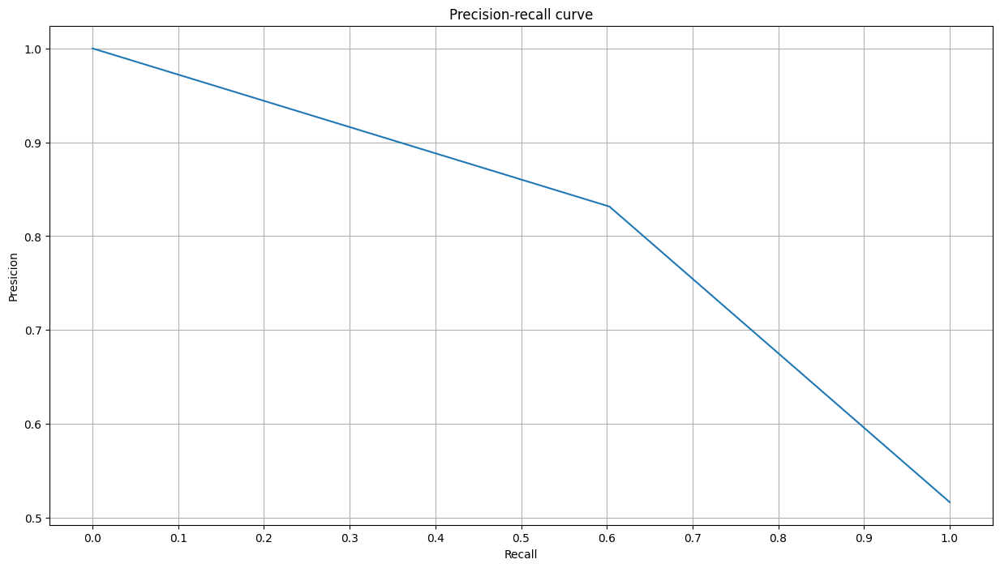

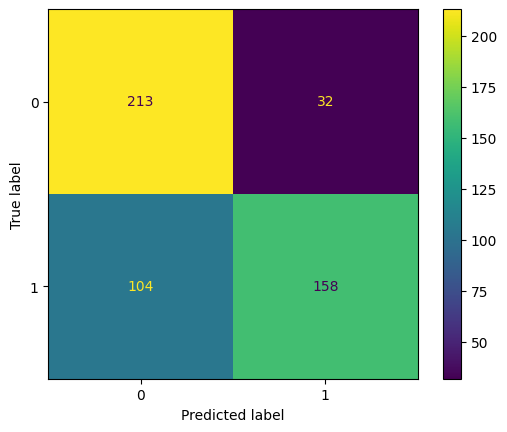

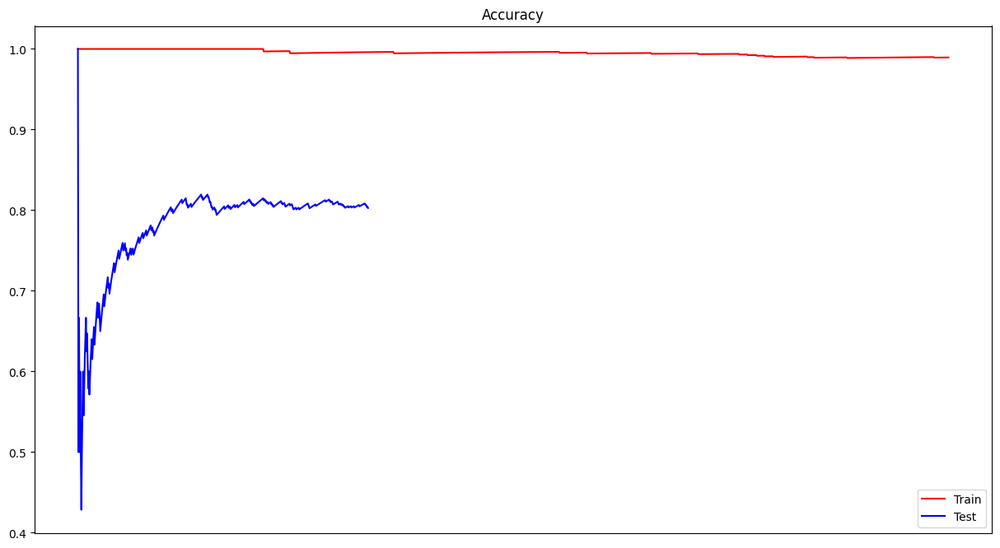

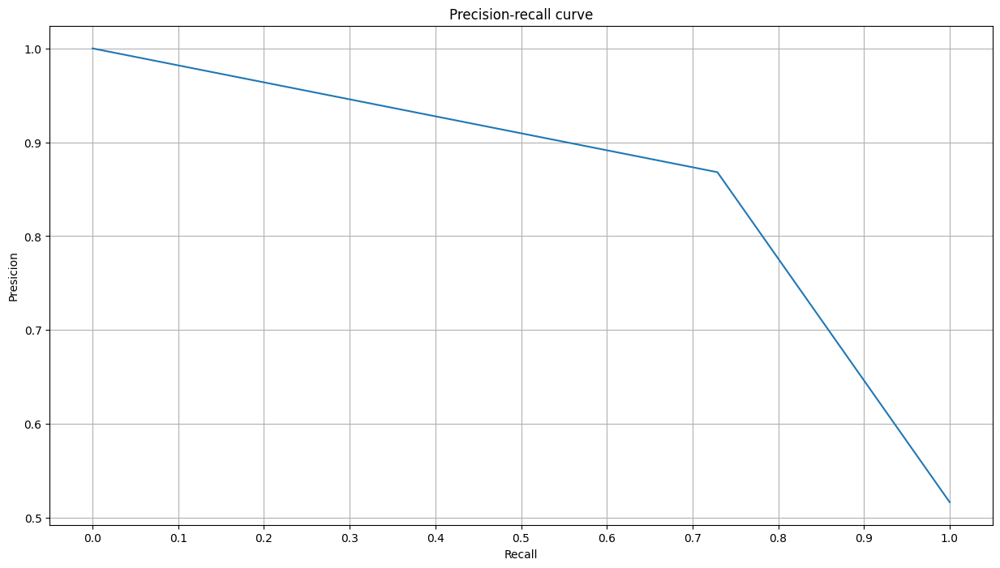

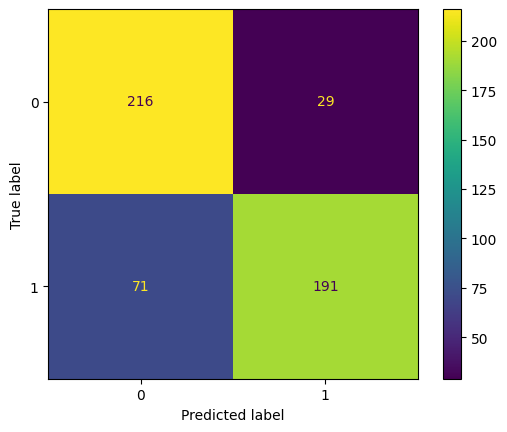

Processed model 3/7


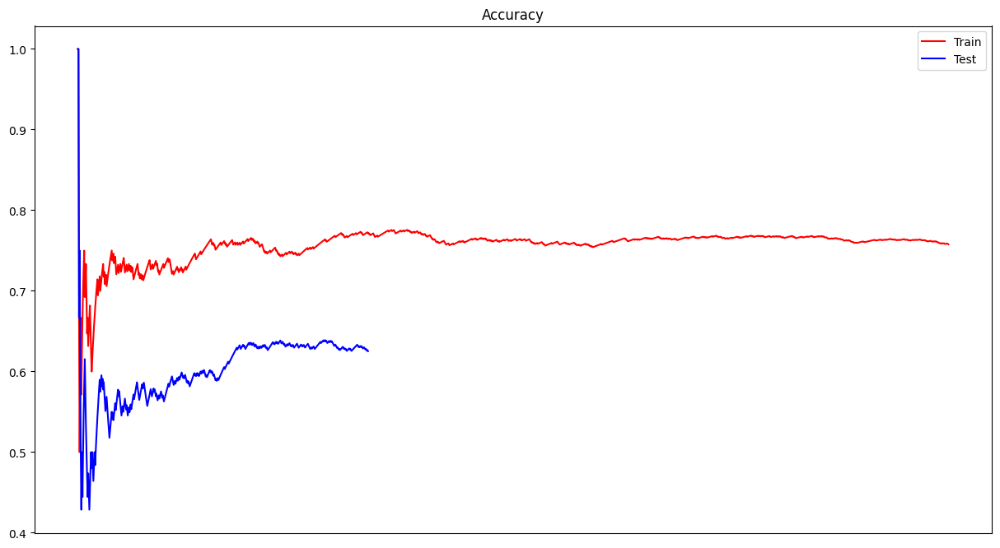

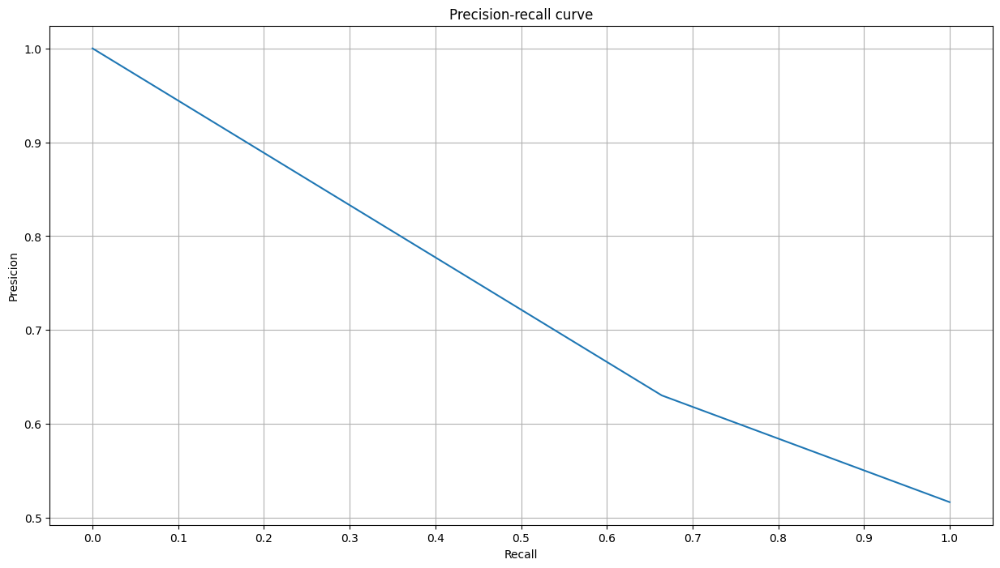

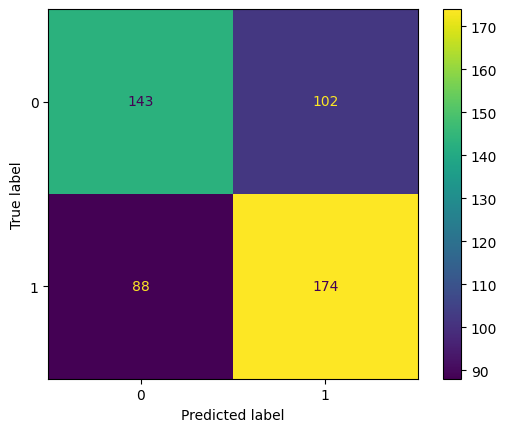

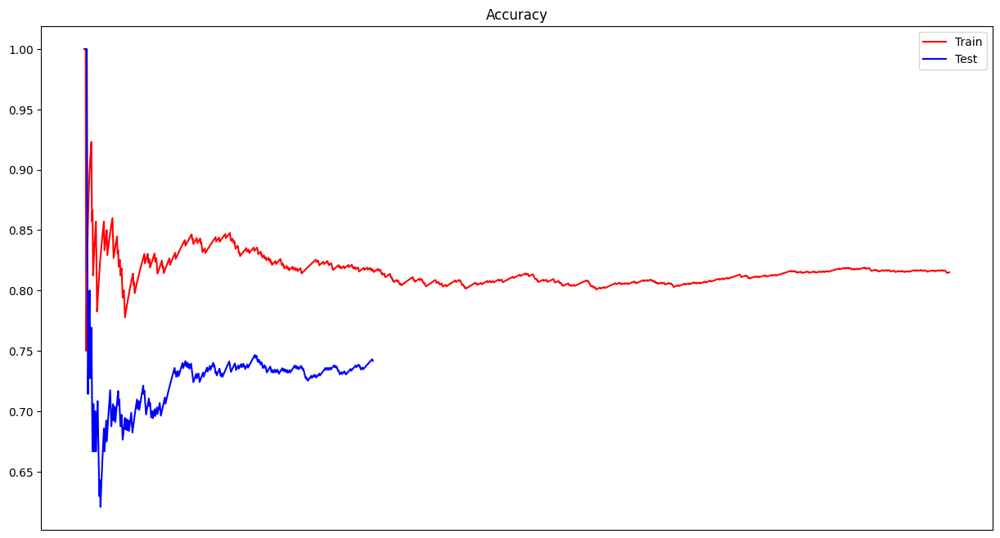

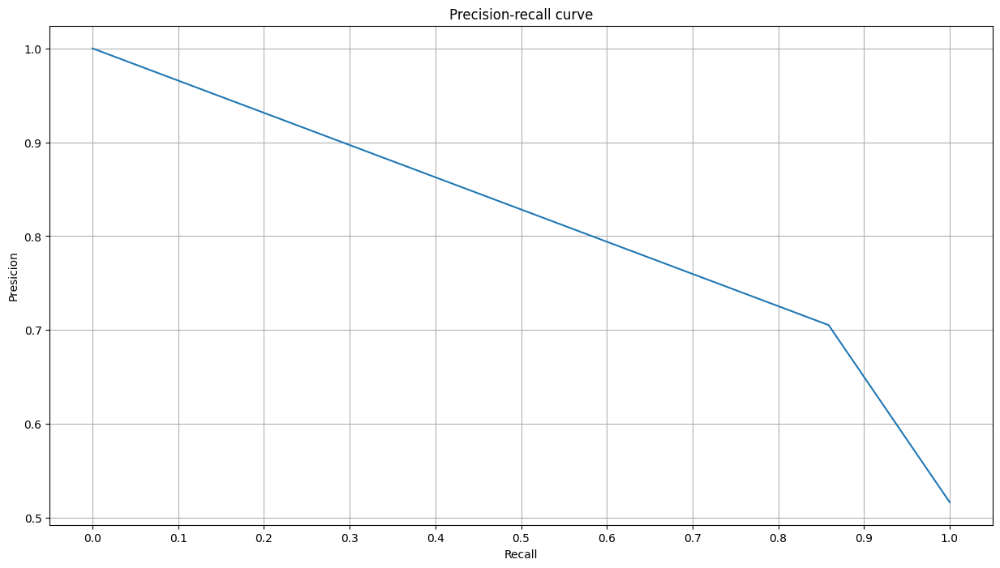

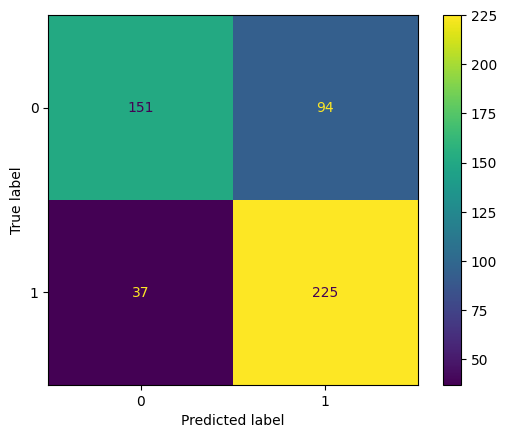

Processed model 4/7


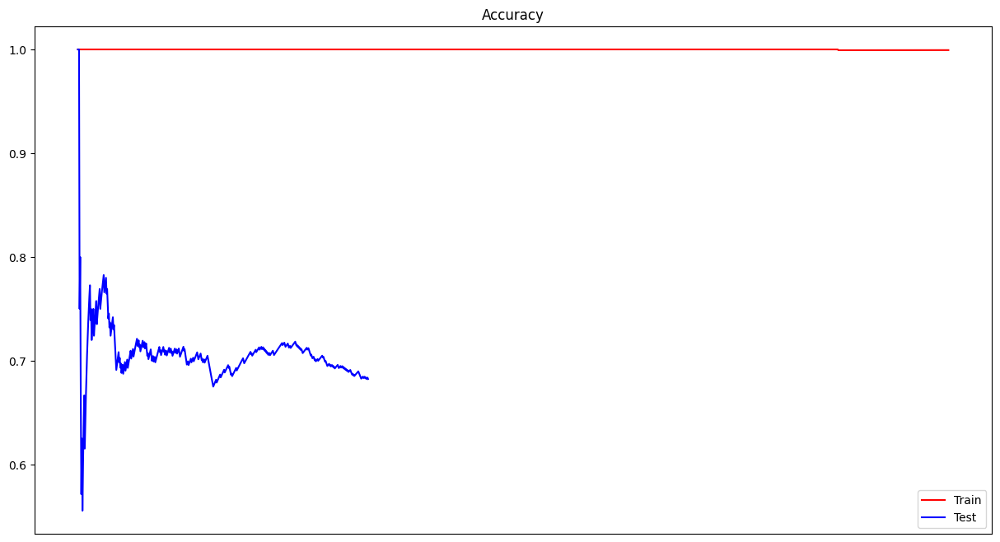

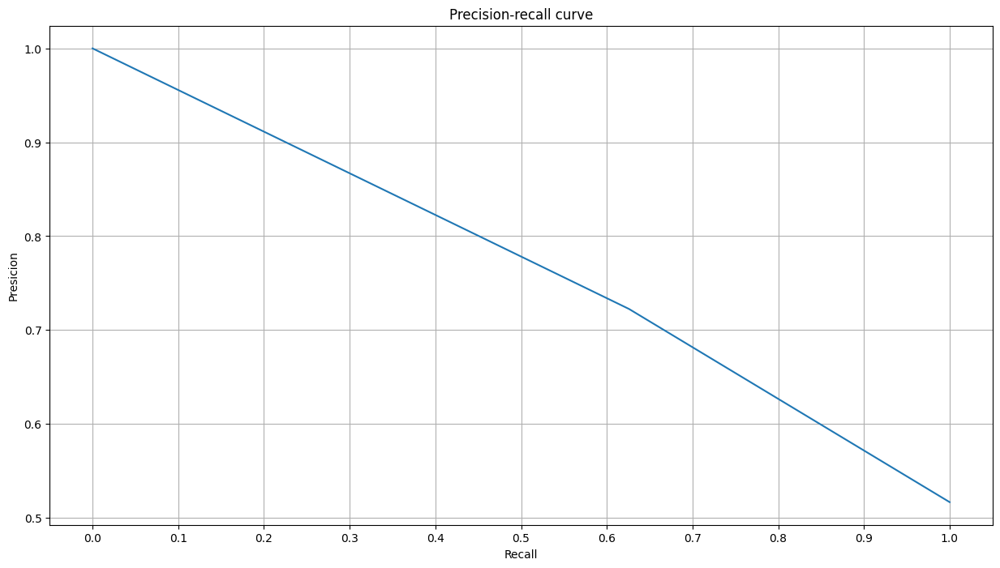

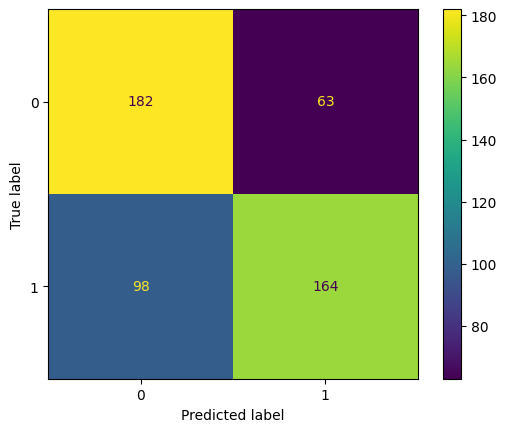

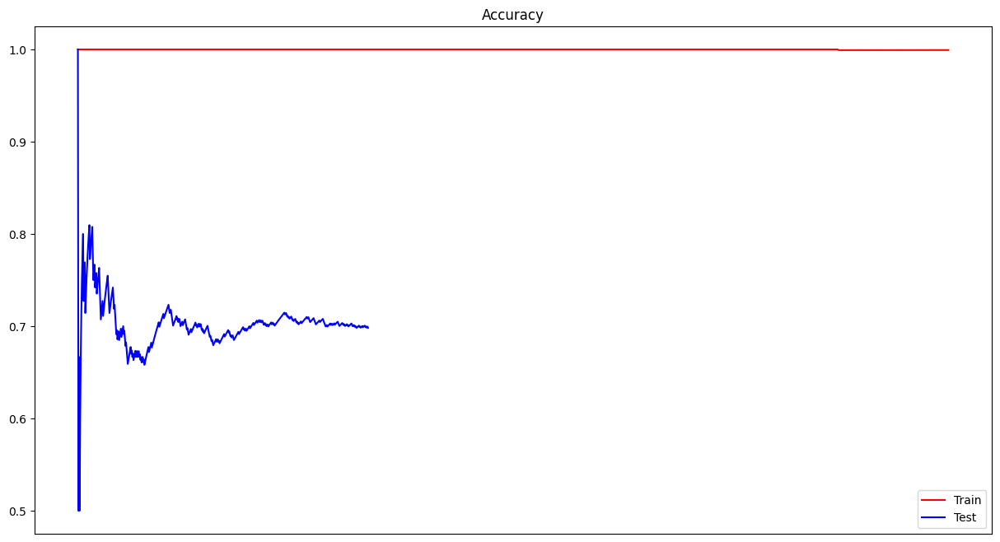

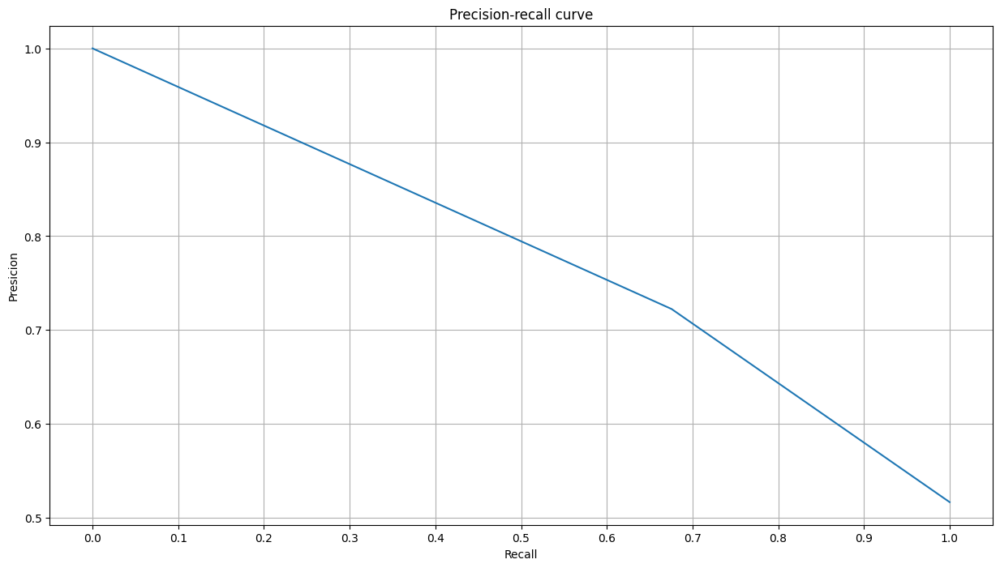

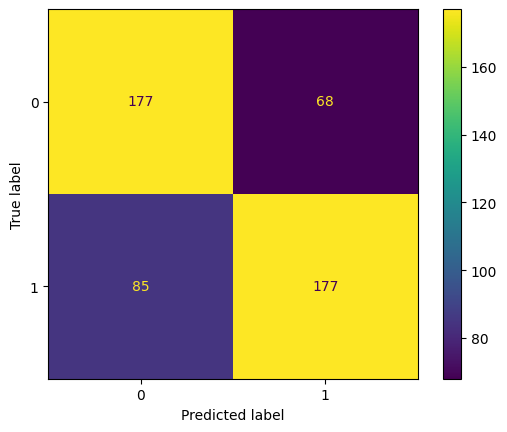

Processed model 5/7


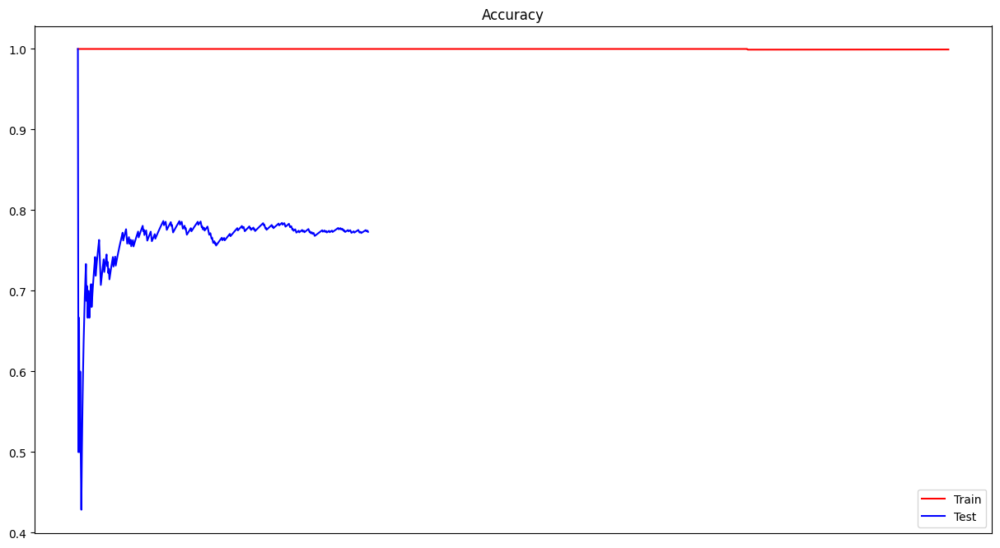

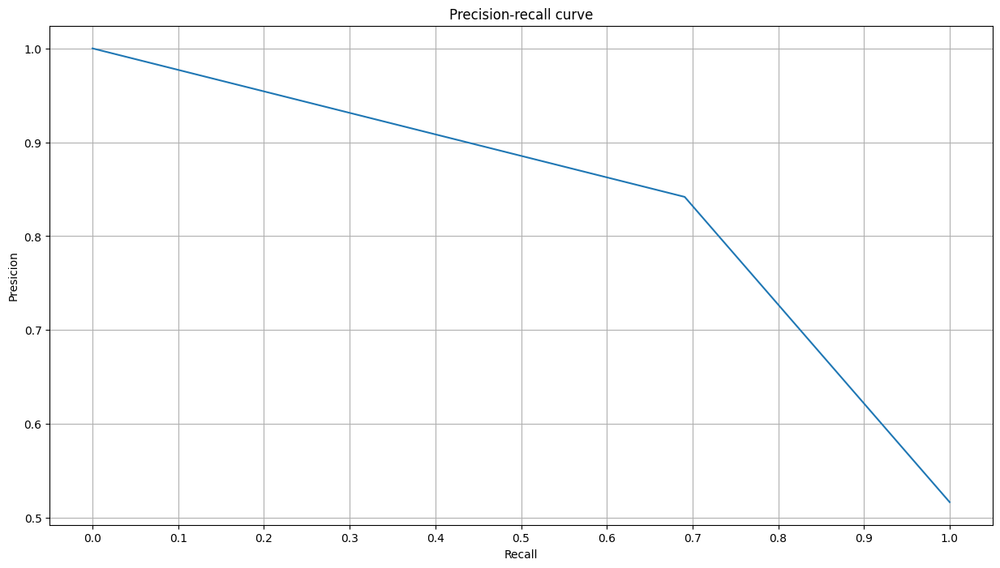

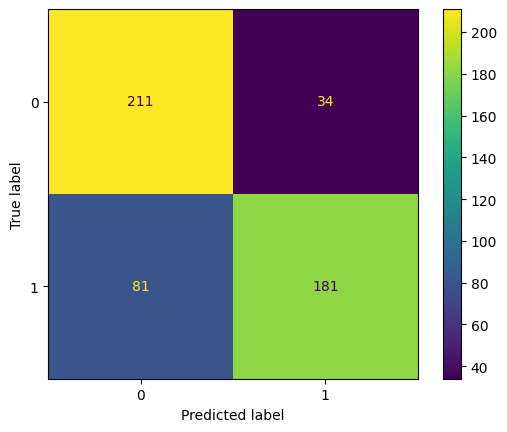

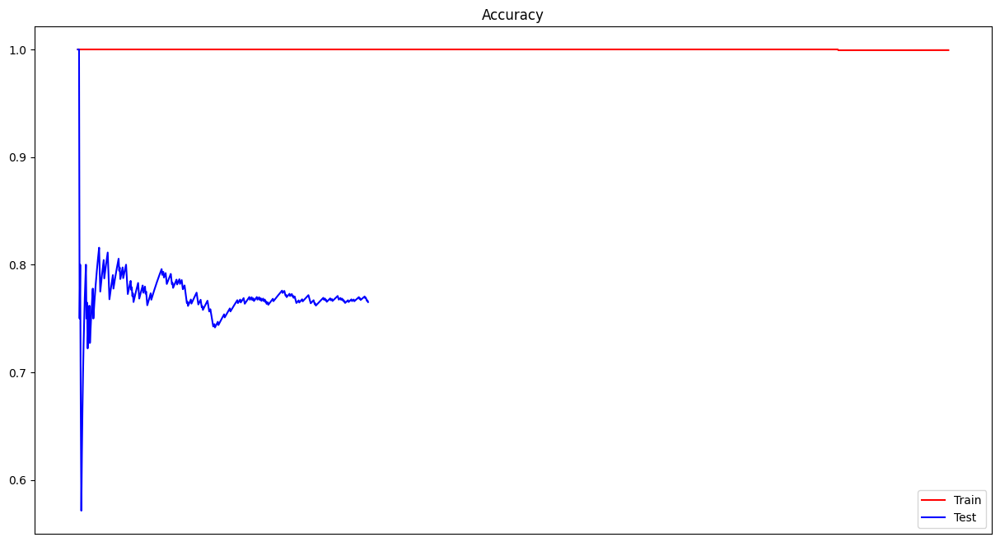

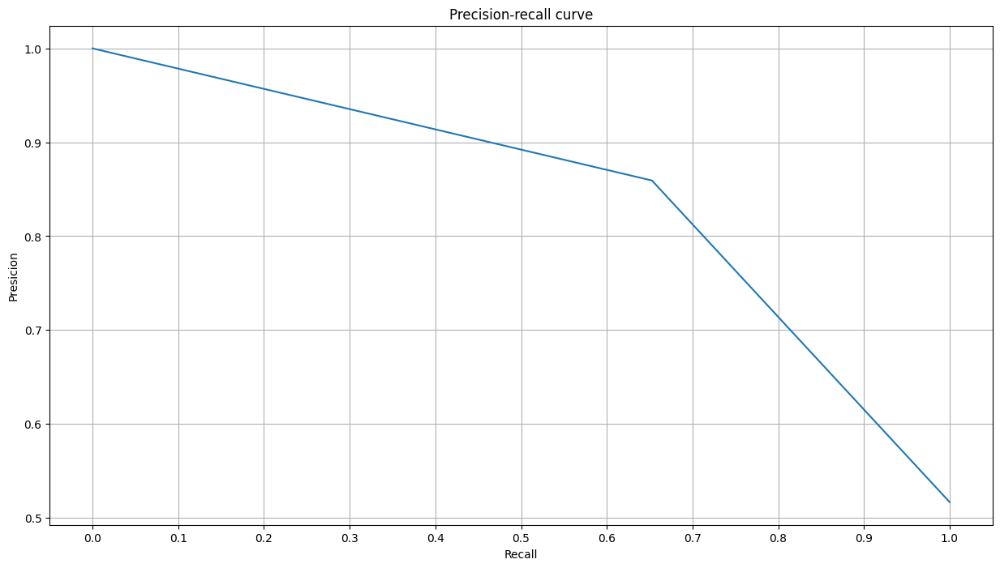

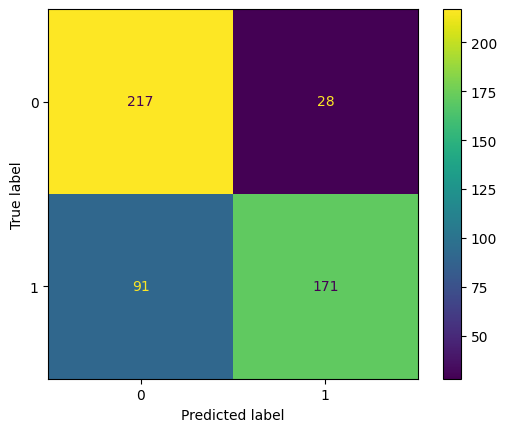

Processed model 6/7


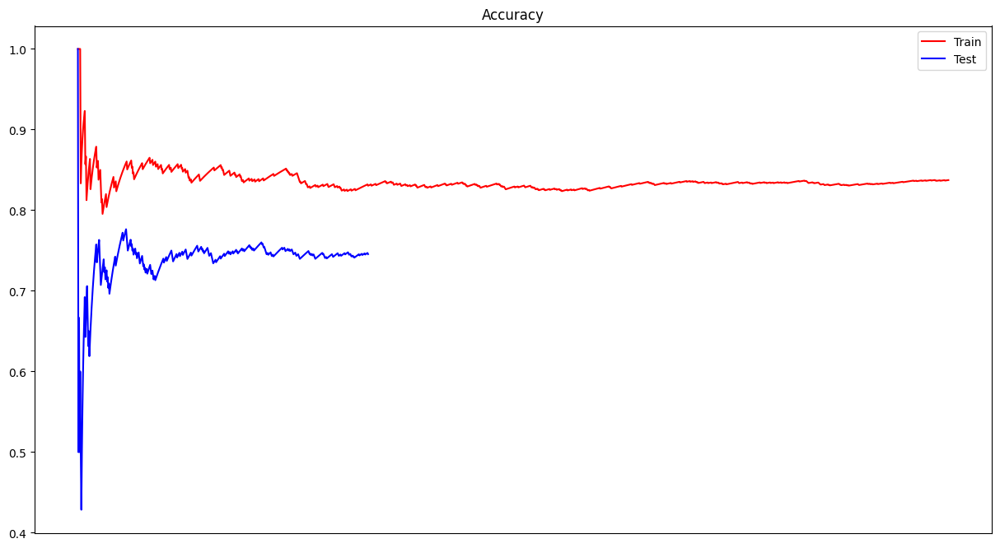

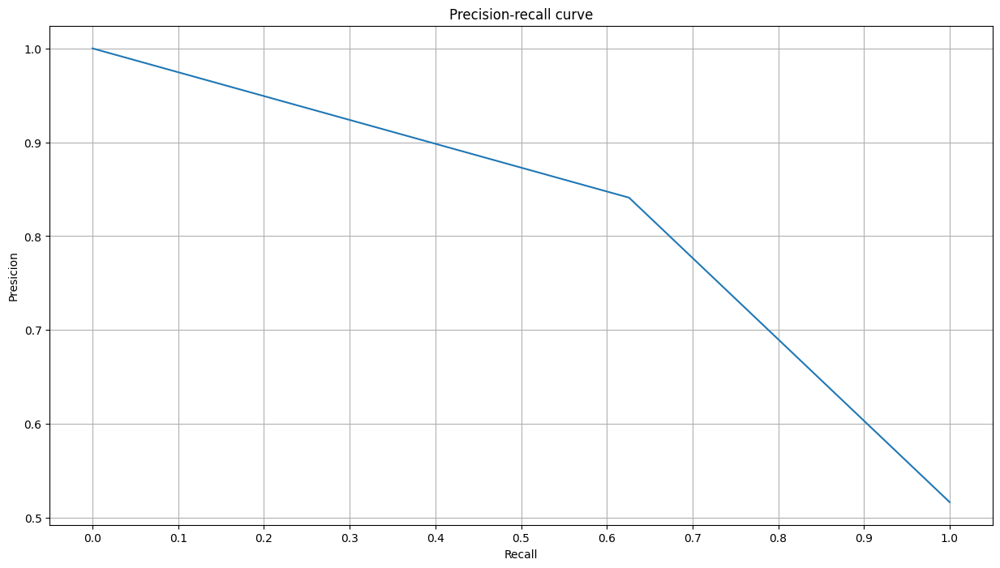

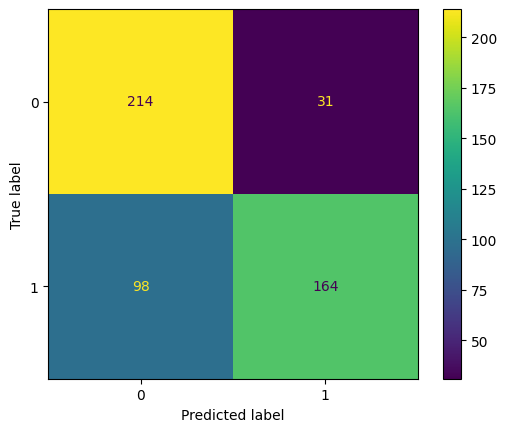

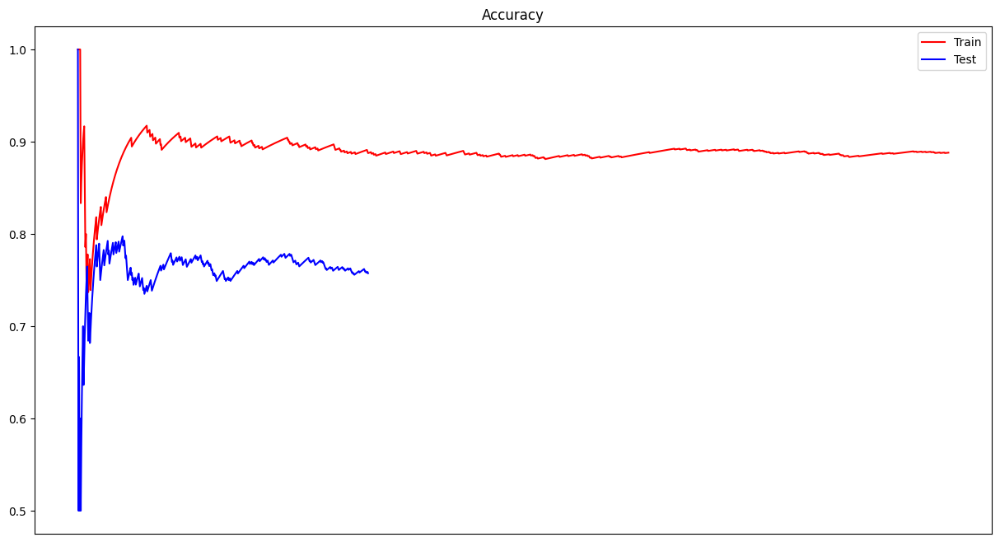

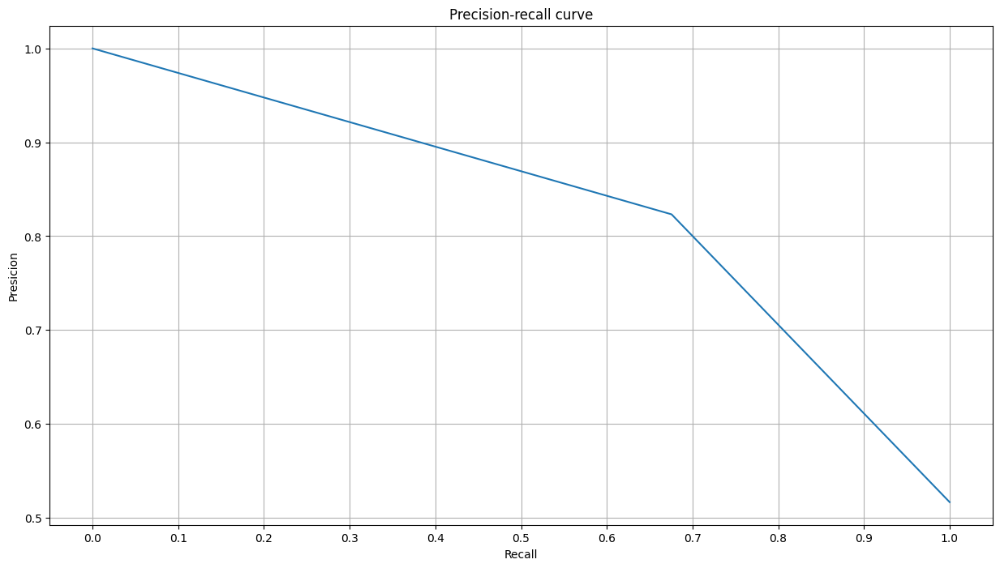

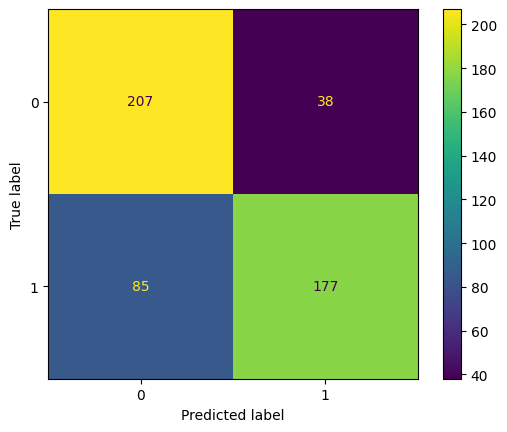

Processed model 7/7
Start processing chris_germany.csv


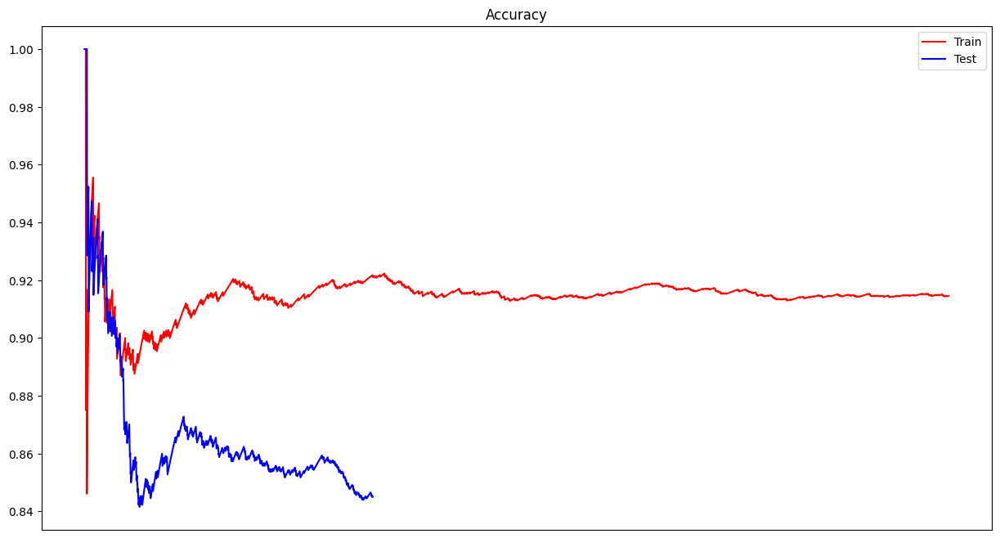

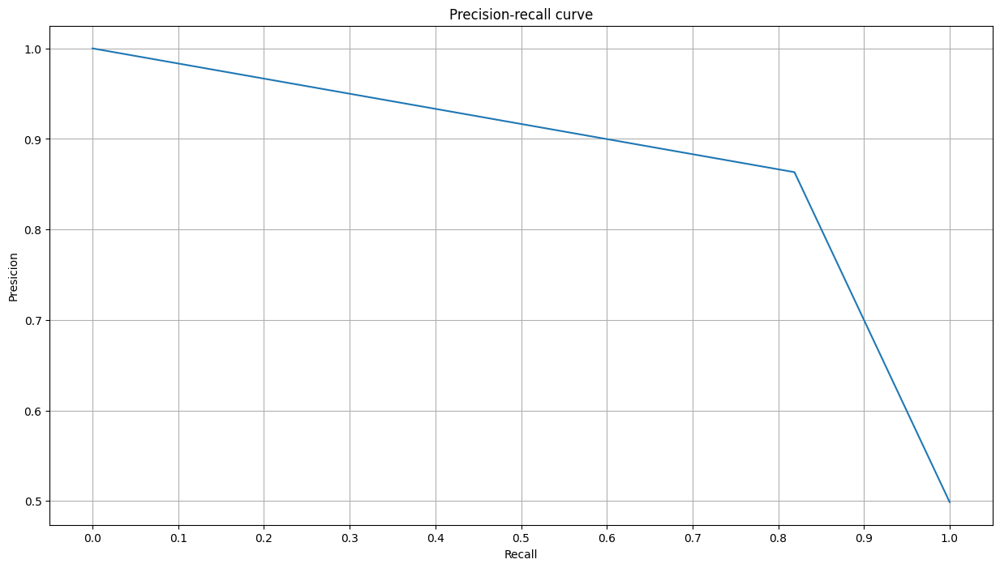

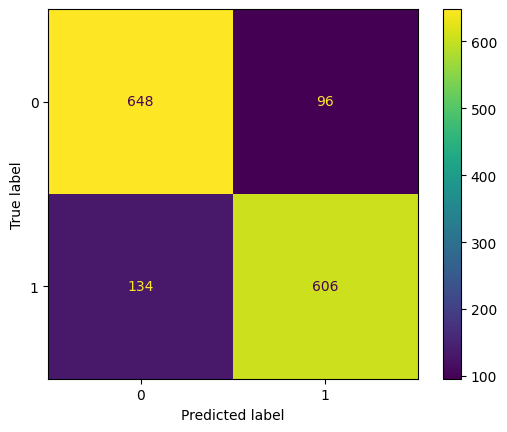

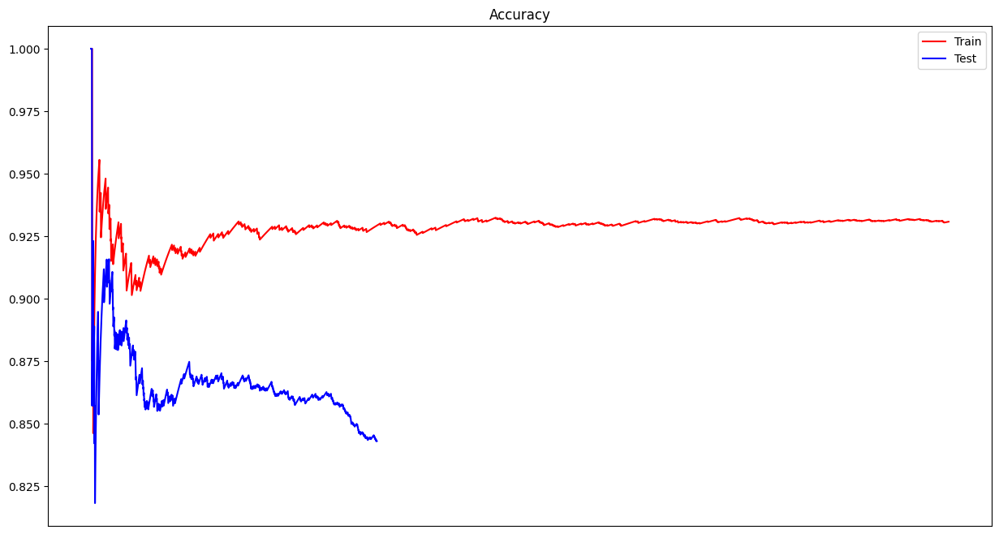

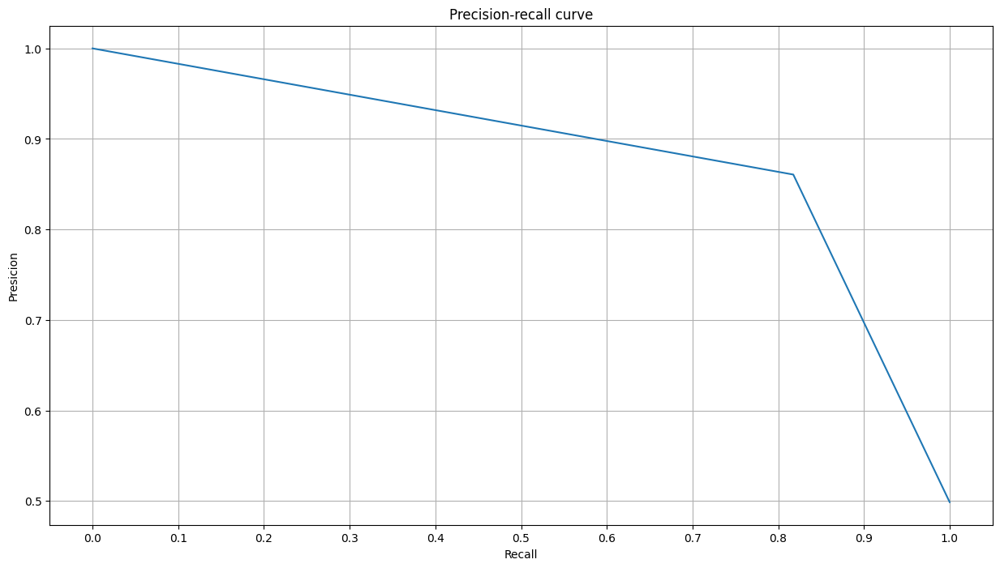

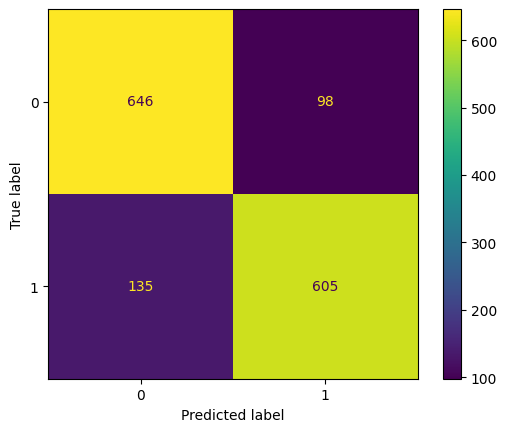

Processed model 1/7


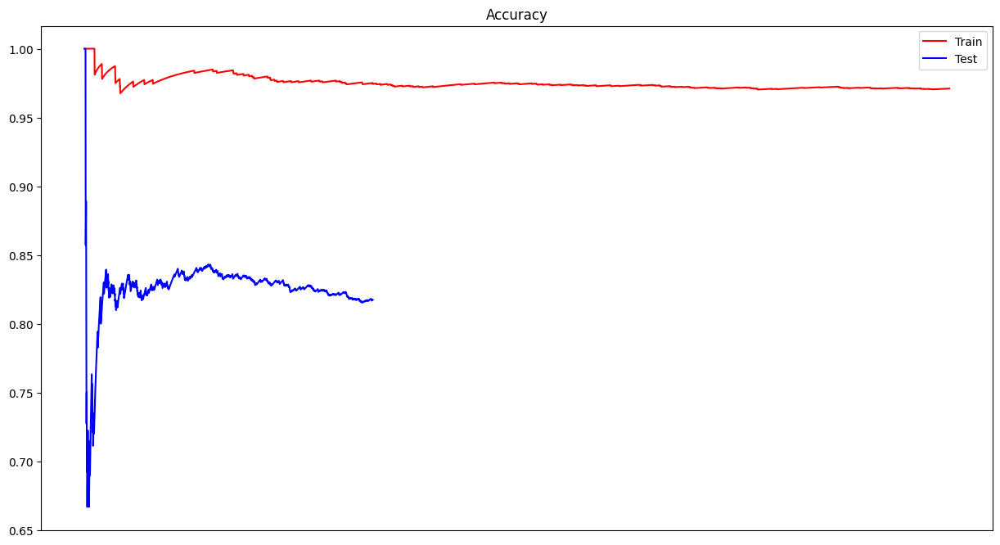

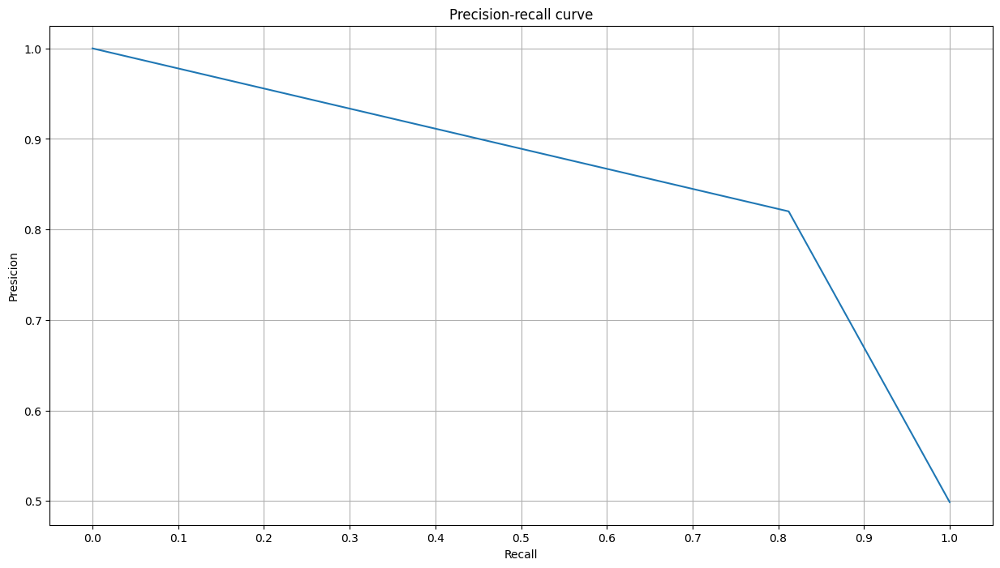

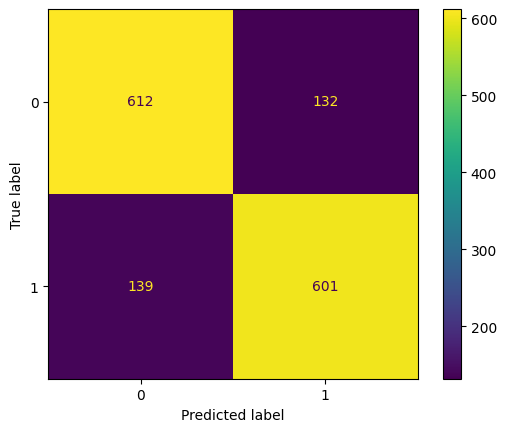

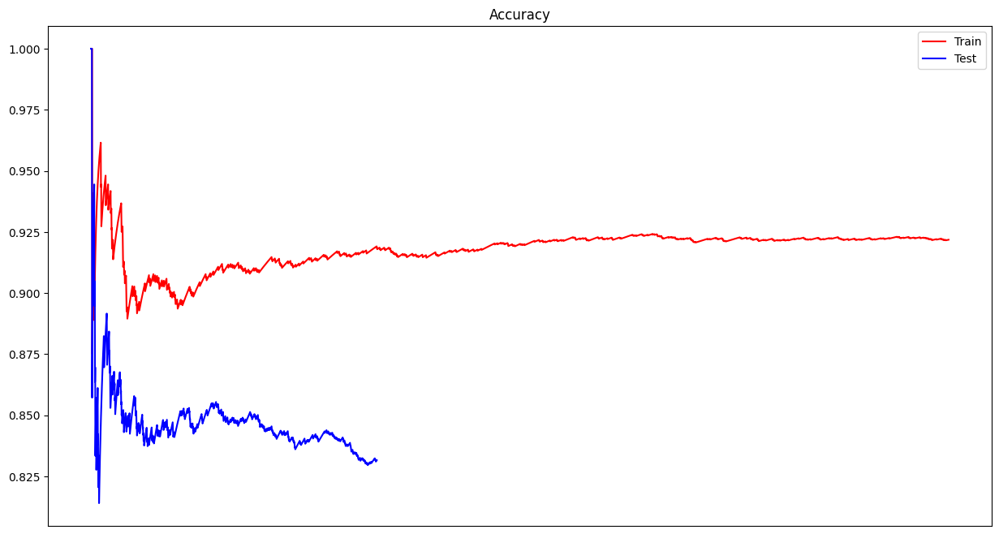

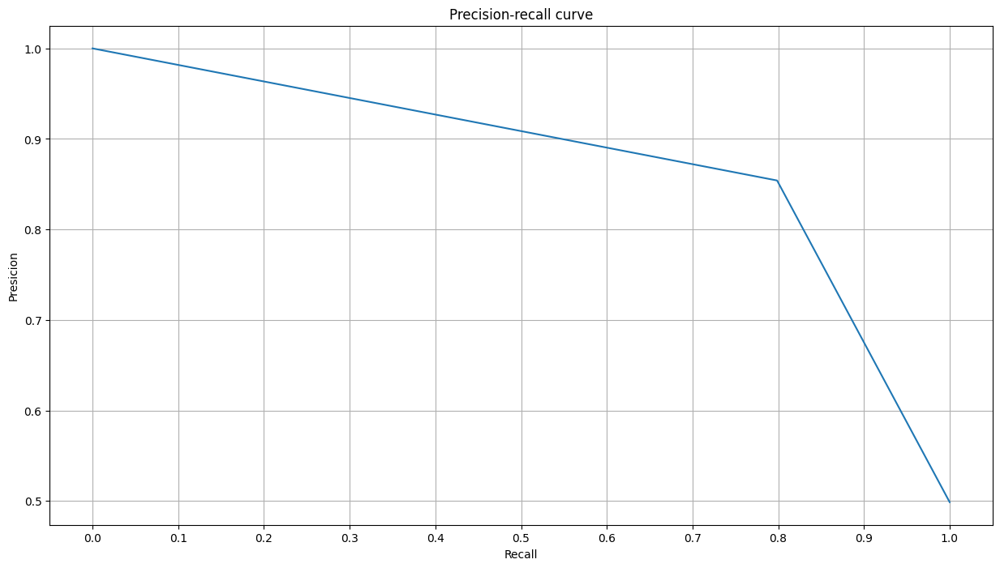

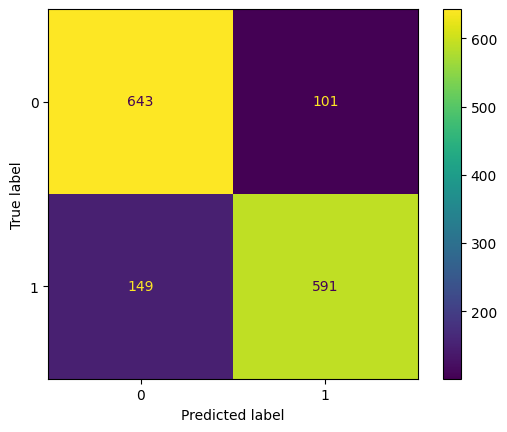

Processed model 2/7


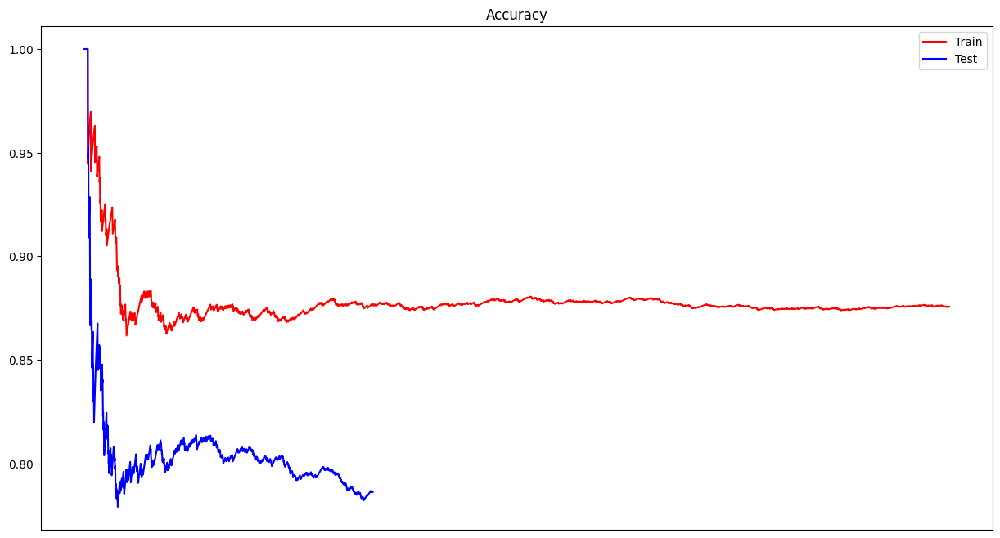

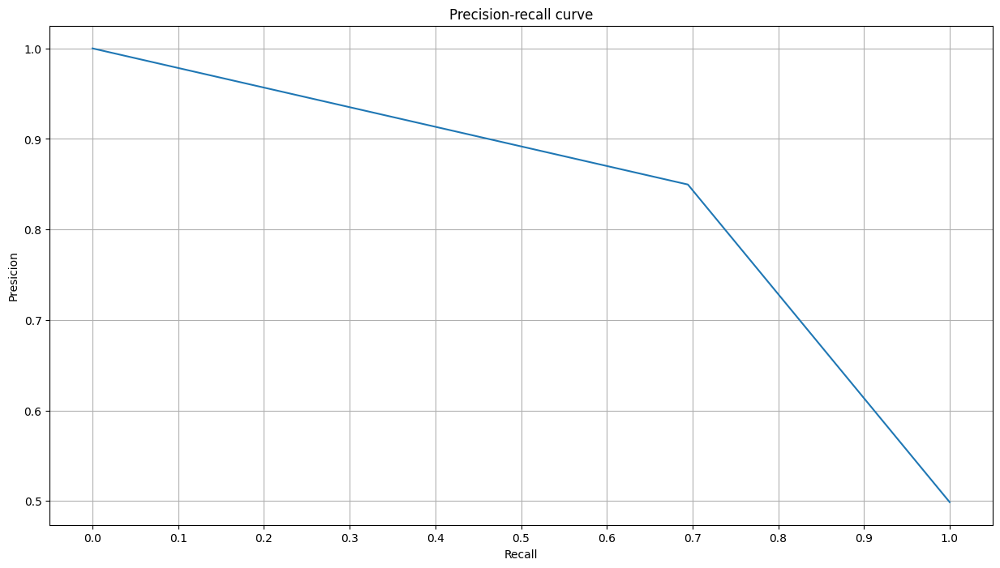

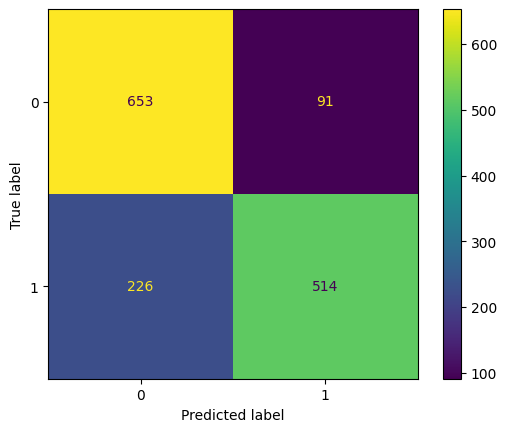

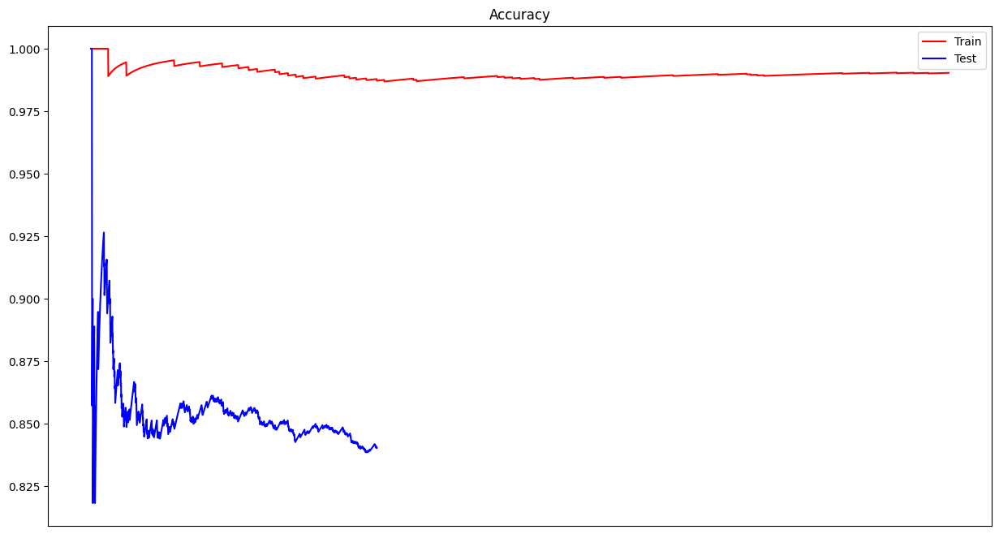

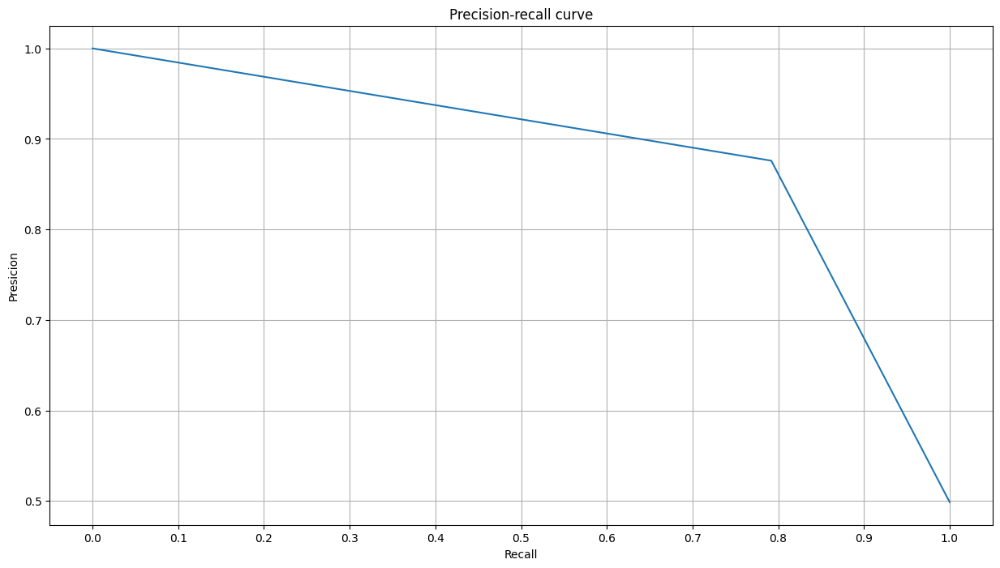

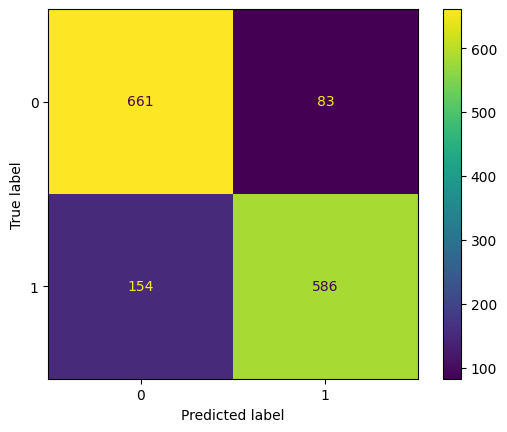

Processed model 3/7


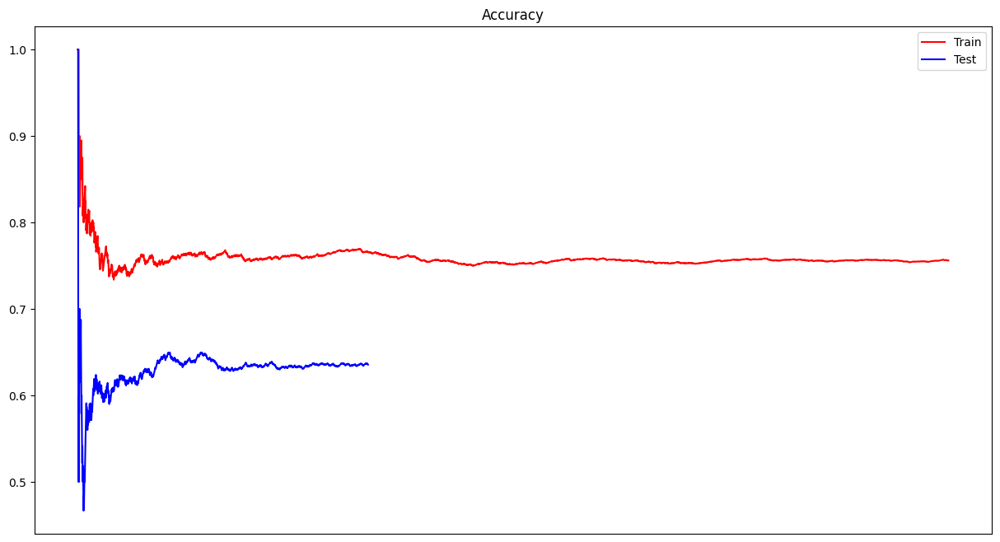

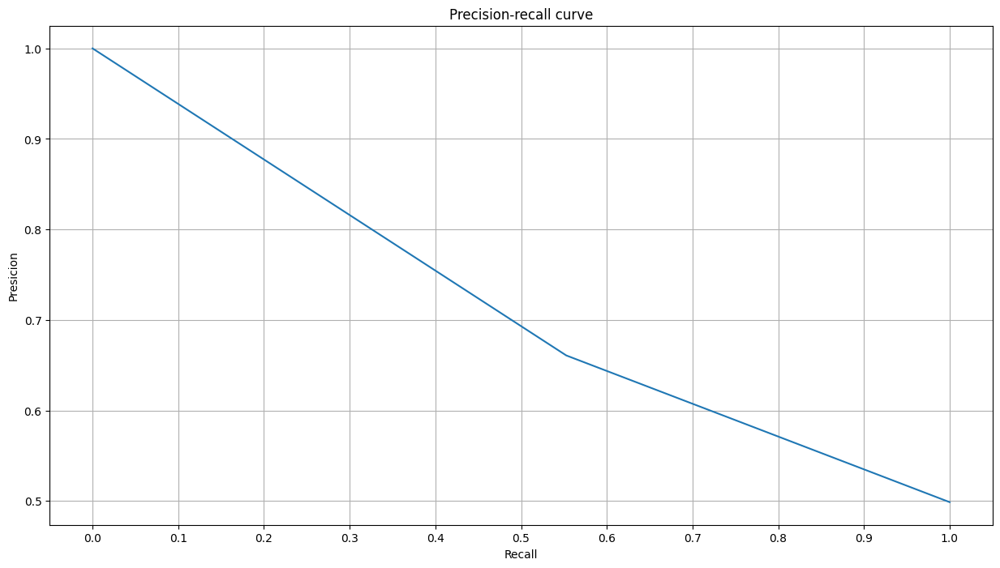

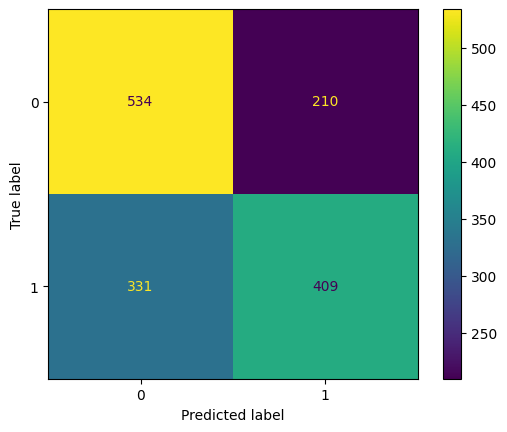

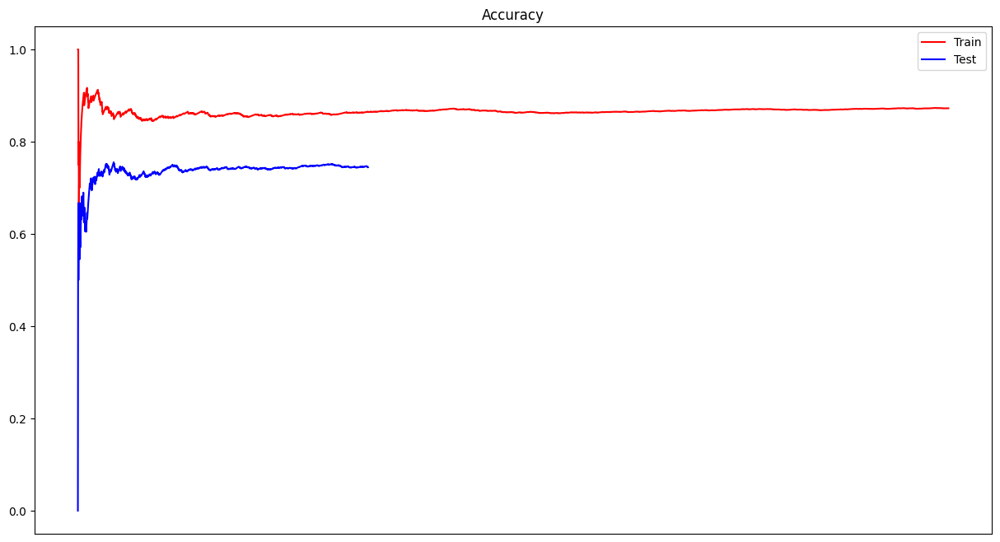

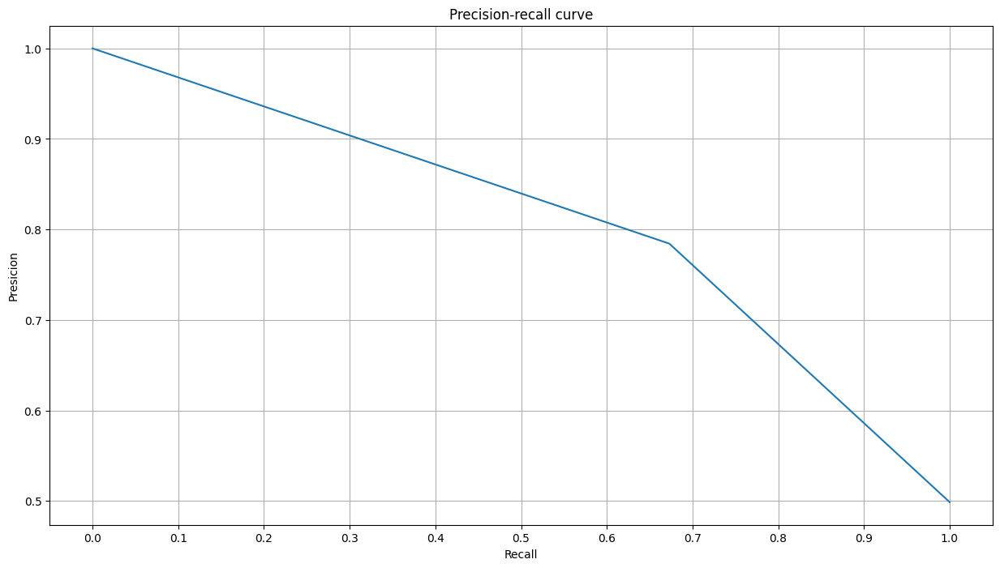

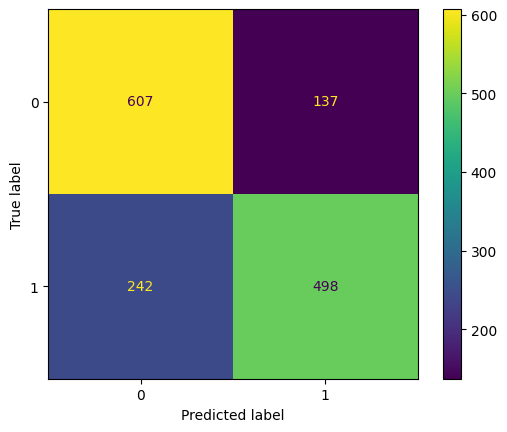

Processed model 4/7


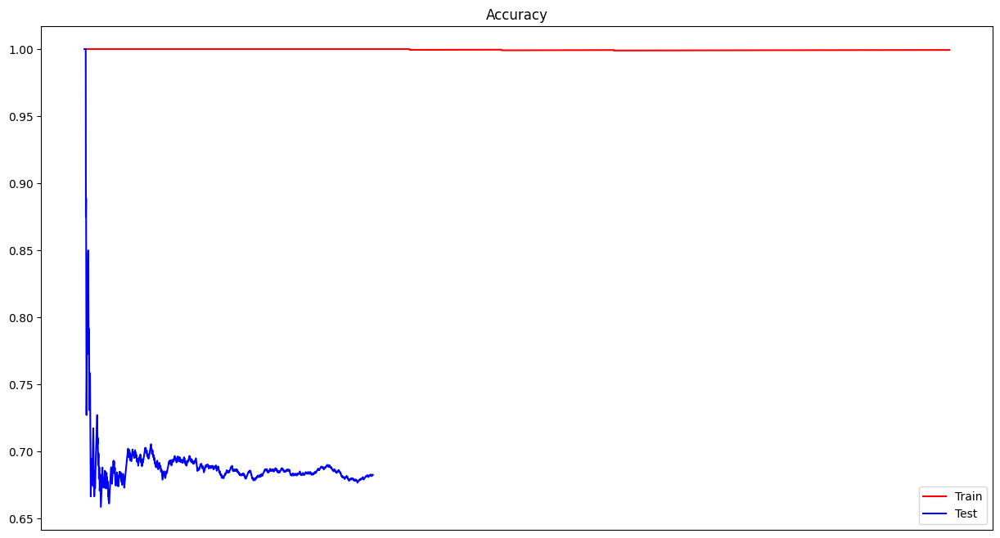

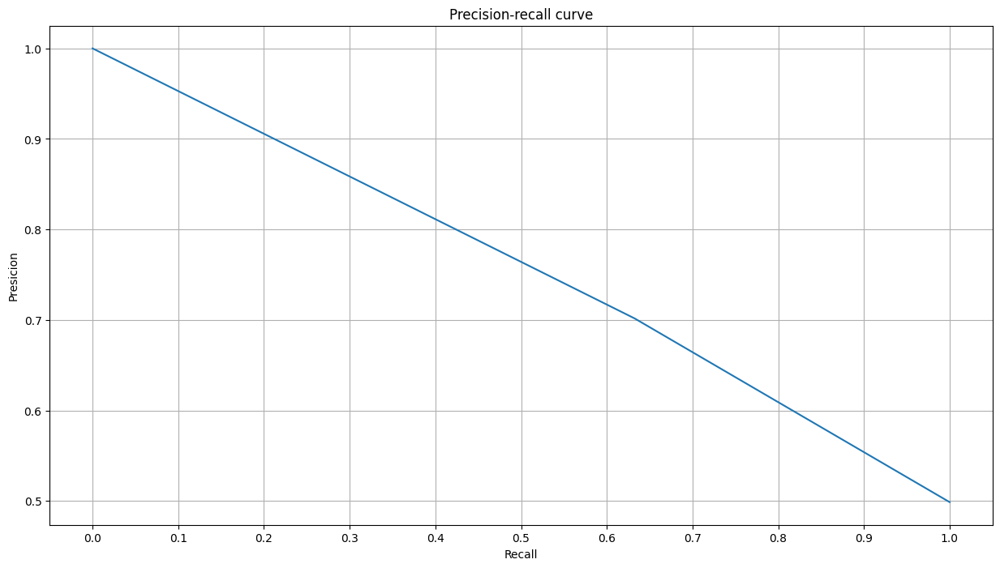

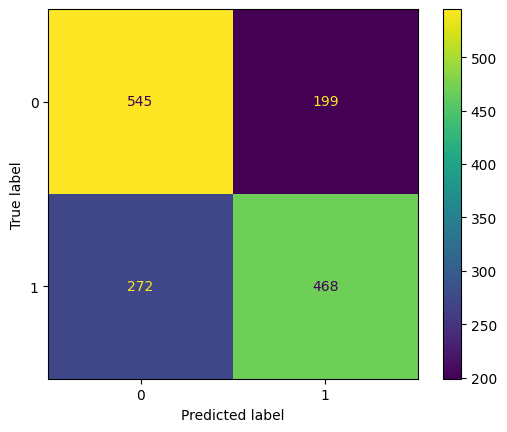

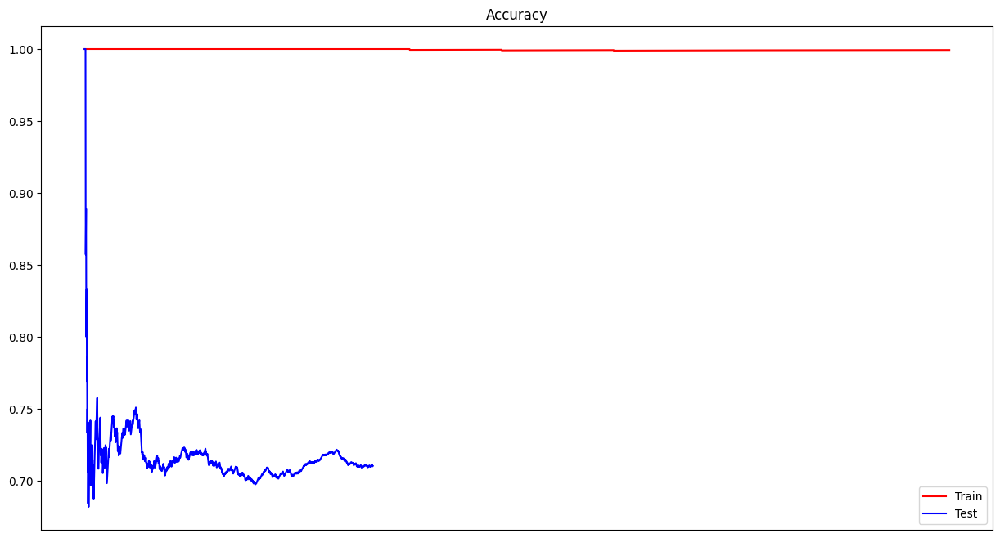

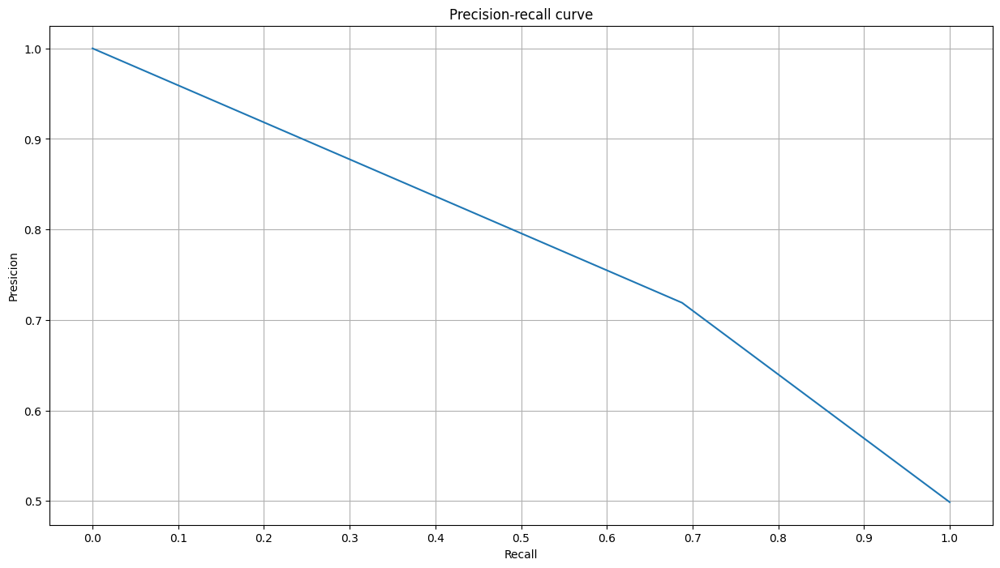

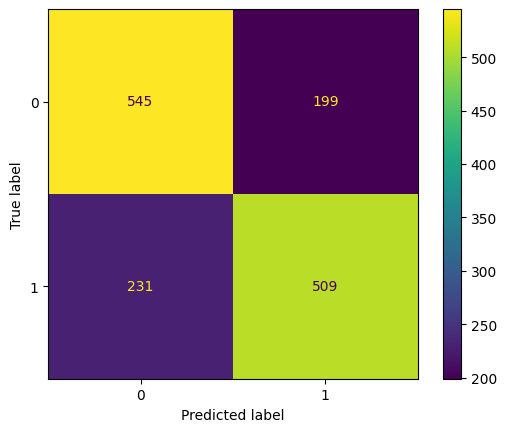

Processed model 5/7


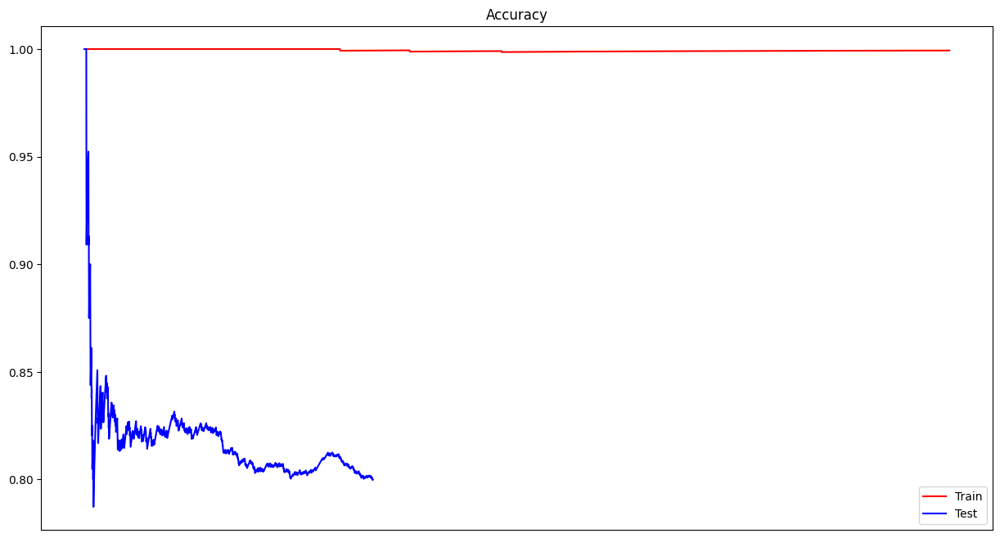

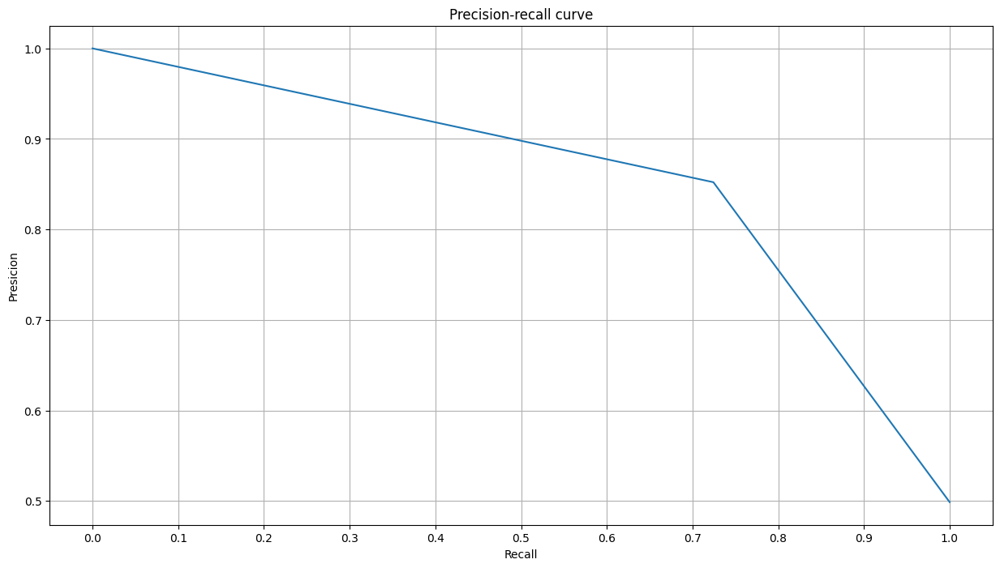

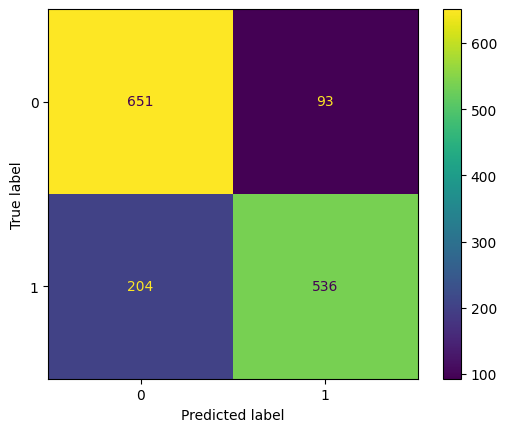

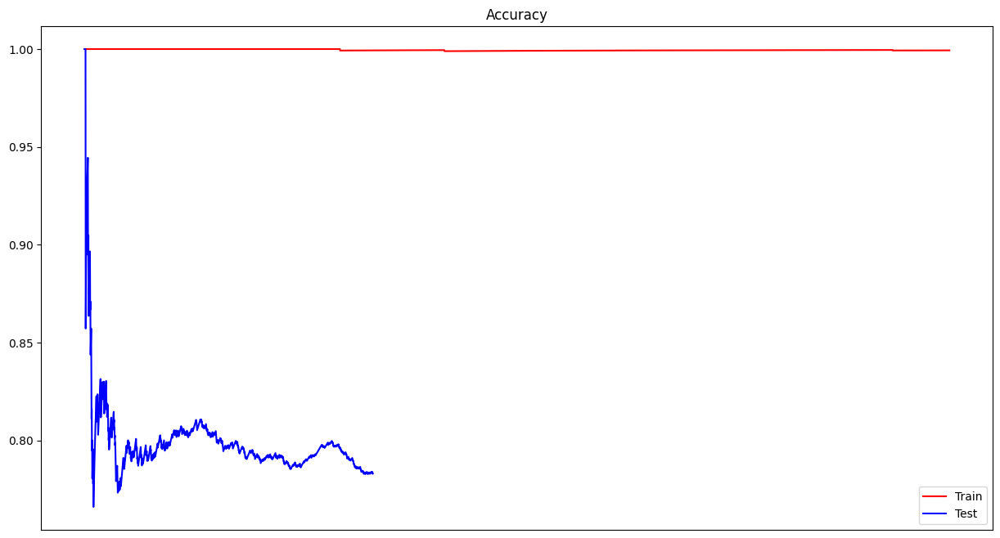

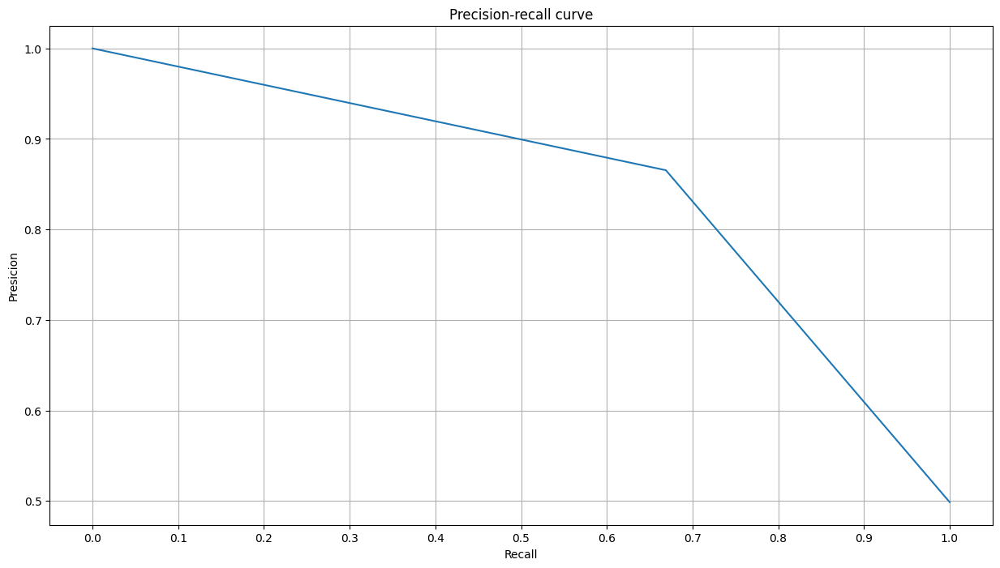

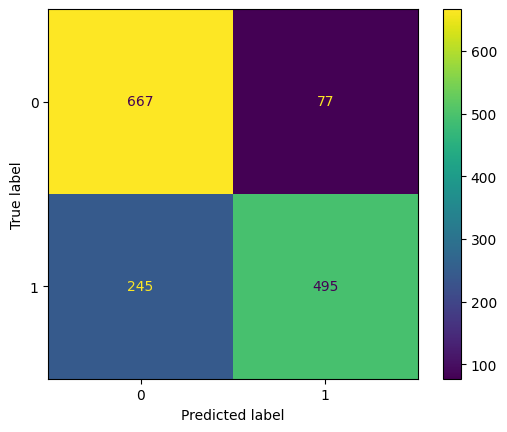

Processed model 6/7


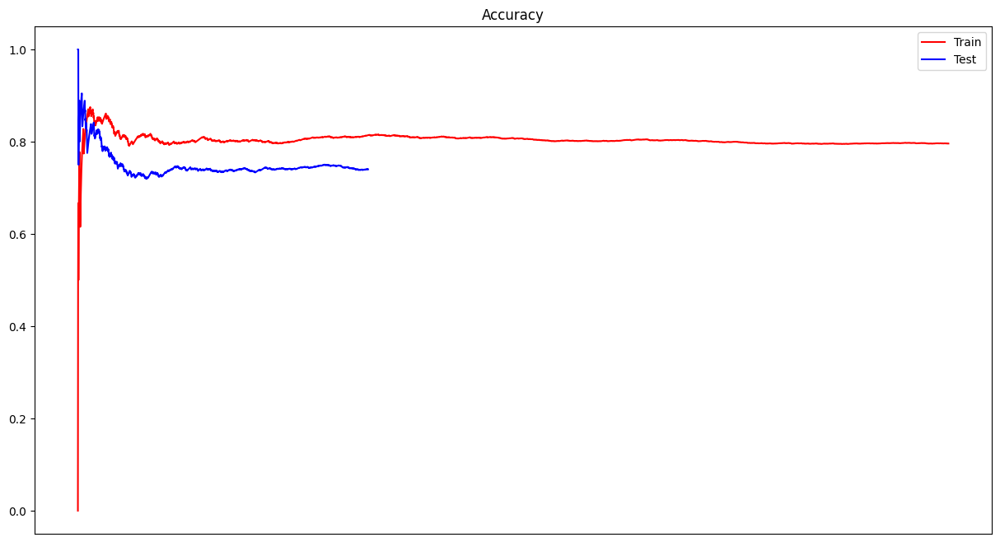

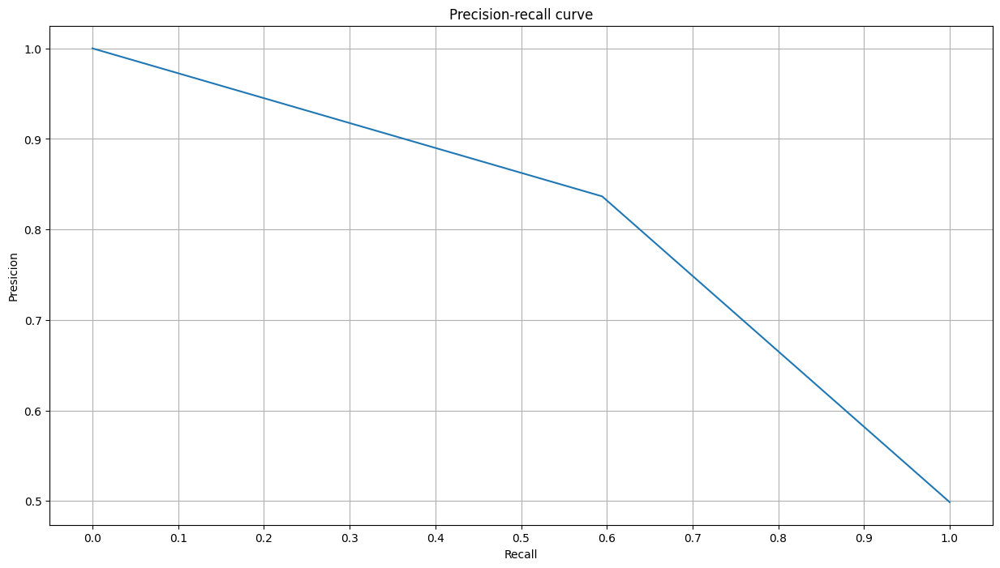

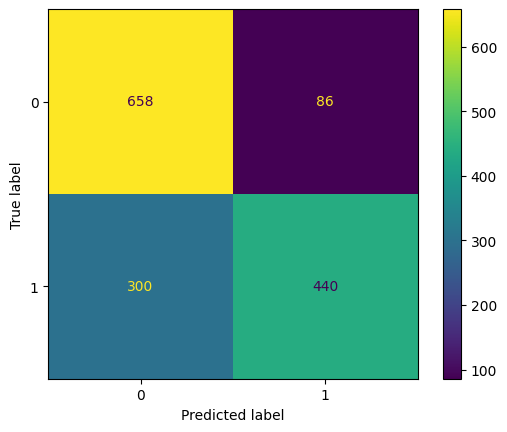

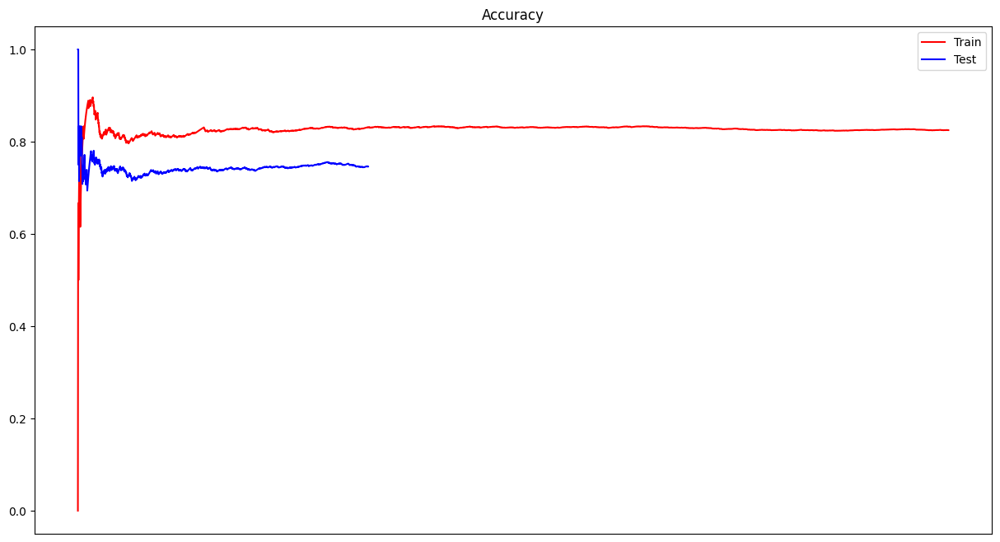

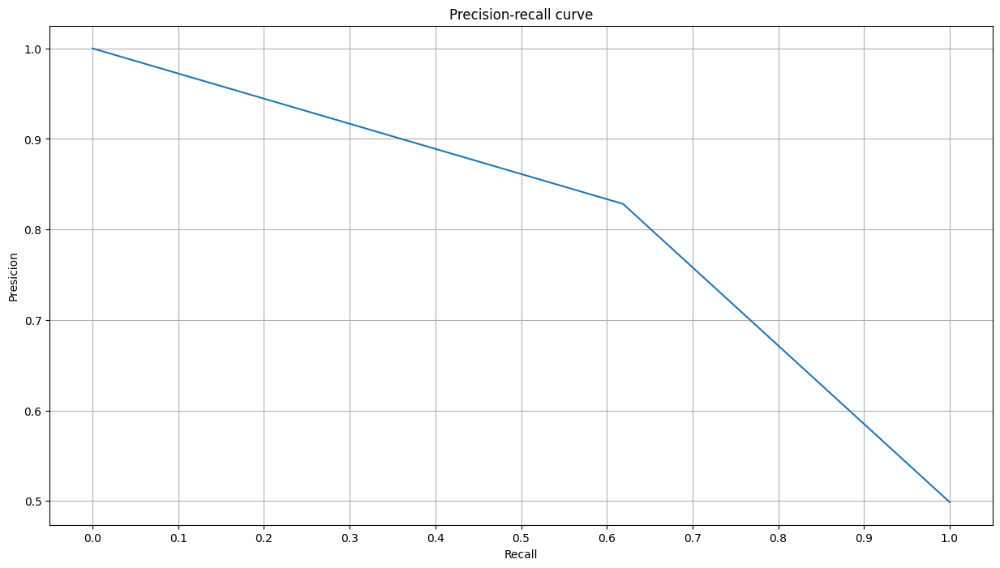

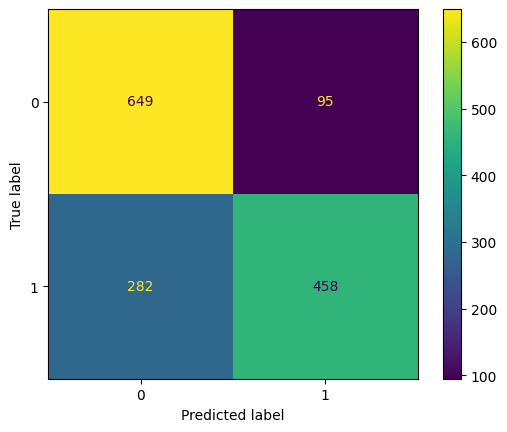

Processed model 7/7


In [16]:
models = [MultinomialNB, LogisticRegression, SVC, KNeighborsClassifier, DecisionTreeClassifier, RandomForestClassifier, GradientBoostingClassifier]
for dataset in chosen_datasets:
    model_trainer = ModelTrainer(dataset, train_dir_path="train")
    print(f"Start processing {dataset}")
    for i, model in enumerate(models):
        model_trainer.train(model(), vectorize)
        model_trainer.train(model(), tfidf)
        print(f"Processed model {i + 1}/{len(models)}")
    model_trainer.save_train_info_into_pickle()

In [17]:
import copy

In [18]:
def analyze_train_data(dir_path):
    res_data = {}
    for train_data in os.listdir(dir_path):
        with open(os.path.join(dir_path, train_data), 'rb') as f:
            d = pickle.load(f)
            for name in d:
                if name not in res_data:
                    res_data[name] = {'vectorize': {}, 'tfidf': {}}
                    for vec_name in d[name]:
                        for key in d[name][vec_name]:
                            res_data[name][vec_name][key] = [d[name][vec_name][key]]
                else:
                    for vec_name in d[name]:
                        for key in d[name][vec_name]:
                            res_data[name][vec_name][key].append(d[name][vec_name][key])
    tmp = copy.deepcopy(res_data)
    max_score = 0
    model_name = ""
    for m in tmp:
        for vec_name in tmp[m]:
            for key in tmp[m][vec_name]:
                if key != "Confusion matrix":
                    res_data[m][vec_name][key] = np.average(res_data[m][vec_name][key])
                    if key == "Accuracy" and res_data[m][vec_name][key] > max_score:
                        max_score = res_data[m][vec_name][key]
                        model_name = m
                else:
                    res_data[m][vec_name].pop("Confusion matrix")
    print(res_data)
    print(f"Best accuracy: {max_score}")
    print(f"Best model: {model_name}")


analyze_train_data("train")

{'MultinomialNB': {'vectorize': {'Accuracy': 0.8565354415032548, 'Precision': 0.8202021862163796, 'Recall': 0.9179097840607058, 'F1 score': 0.8555472784041329}, 'tfidf': {'Accuracy': 0.8088400276837258, 'Precision': 0.7571478099465017, 'Recall': 0.9313438958634365, 'F1 score': 0.8038208351905329}}, 'LogisticRegression': {'vectorize': {'Accuracy': 0.8493985384405761, 'Precision': 0.8700038378656683, 'Recall': 0.8250039639547498, 'F1 score': 0.8492631601967003}, 'tfidf': {'Accuracy': 0.8632770075957268, 'Precision': 0.8997734503253921, 'Recall': 0.8196084464144817, 'F1 score': 0.8629643720071687}}, 'SVC': {'vectorize': {'Accuracy': 0.8042504007652574, 'Precision': 0.8771756820210038, 'Recall': 0.7090956022300853, 'F1 score': 0.8023340190150989}, 'tfidf': {'Accuracy': 0.8674466959416517, 'Precision': 0.9183608839699641, 'Recall': 0.807952645593128, 'F1 score': 0.8669815743454972}}, 'KNeighborsClassifier': {'vectorize': {'Accuracy': 0.68961086739971, 'Precision': 0.6848624380838427, 'Recal

## Препроцессинг текстов

In [19]:
import nltk
from nltk.corpus import stopwords
from string import punctuation

nltk.download("stopwords")

stop_words = stopwords.words("english")

[nltk_data] Downloading package stopwords to /home/tech/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [20]:
def remove_punctuation(text):
    translator = str.maketrans(punctuation, ' ' * len(punctuation))
    return text.translate(translator)


def text_preprocessing(text):
    text = re.sub(r'https?://\S+|www\.\S+', ' ', text)
    text = re.sub(r'<.*?>', ' ', text)
    text = re.sub(r'{[^>]+}', ' ', text)
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"
                               u"\U0001F300-\U0001F5FF"
                               u"\U0001F680-\U0001F6FF"
                               u"\U0001F1E0-\U0001F1FF"
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               "]+", flags=re.UNICODE)
    text = emoji_pattern.sub(r'', text)
    text = re.sub(r'\S*@\S*\s?', ' ', text)
    text = re.sub(r'[0-9]+', ' ', text)
    text = re.sub(r'-|«|»', ' ', text)
    text = re.sub(r'[^\w\s]', ' ', text)
    text = re.sub(r'\n', ' ', text)
    text = text.lower()
    text = remove_punctuation(text)
    text = text.strip()
    # text = ' '.join([word for i, word in enumerate(text.split()) if word not in stop_words and i < 1000])
    return text

In [21]:
def tfidf(df: pd.DataFrame):
    tfidf = TfidfVectorizer()
    return np.array(tfidf.fit_transform([text_preprocessing(t) for t in df['text'].values]).todense())


def vectorize(df: pd.DataFrame):
    count_vec = CountVectorizer()
    return np.array(count_vec.fit_transform([text_preprocessing(t) for t in df['text'].values]).todense())

Start processing kate_symes.csv


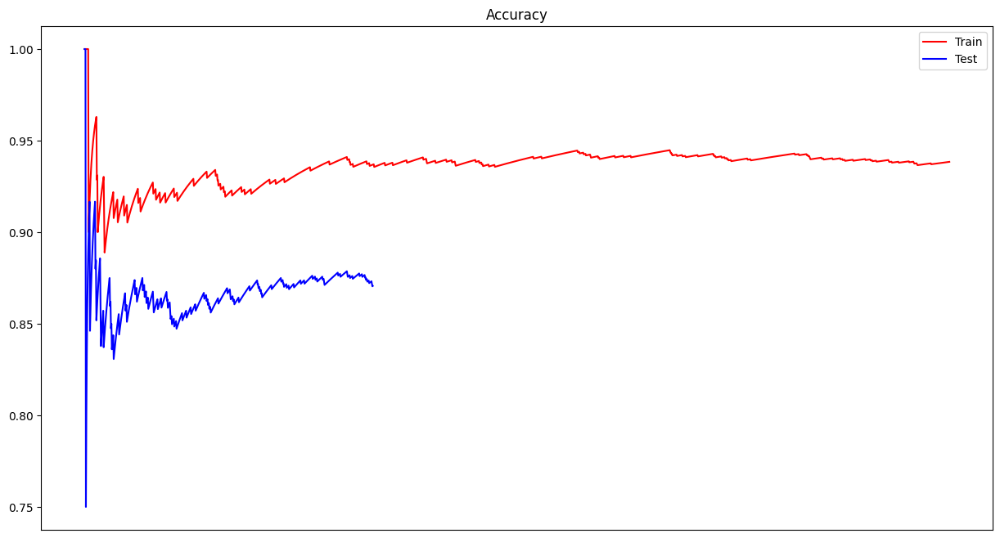

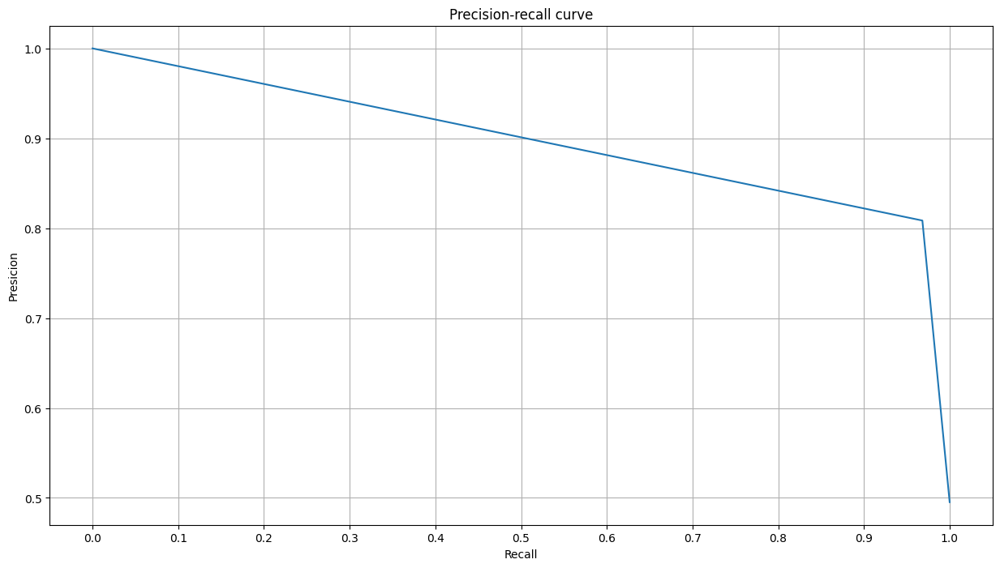

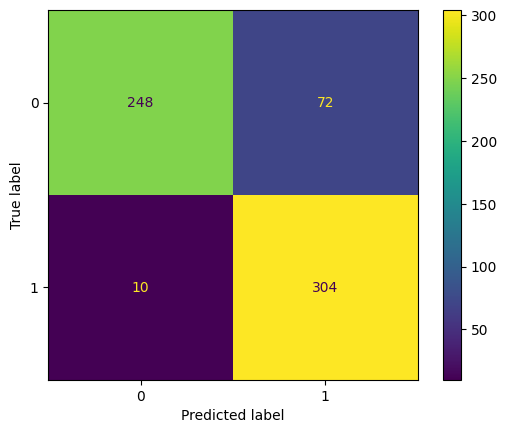

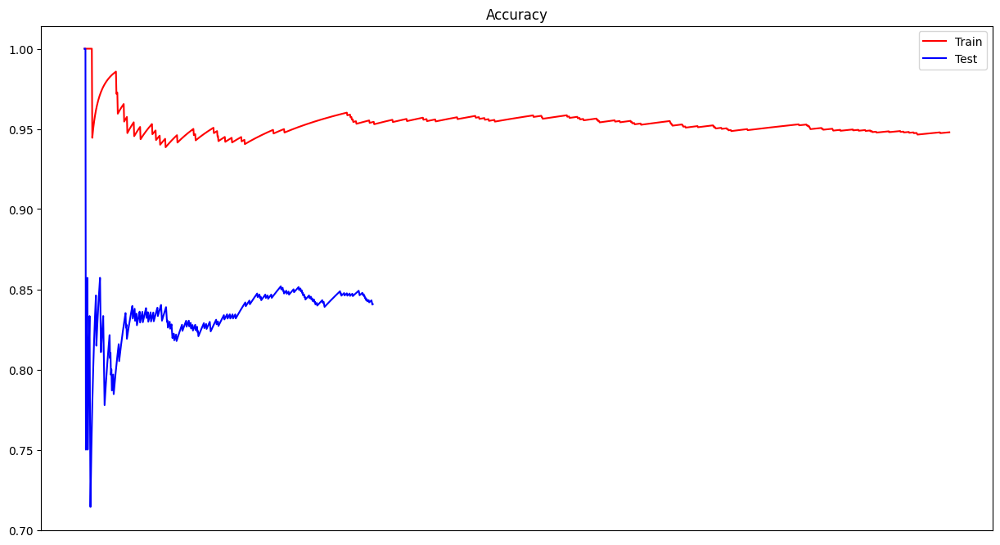

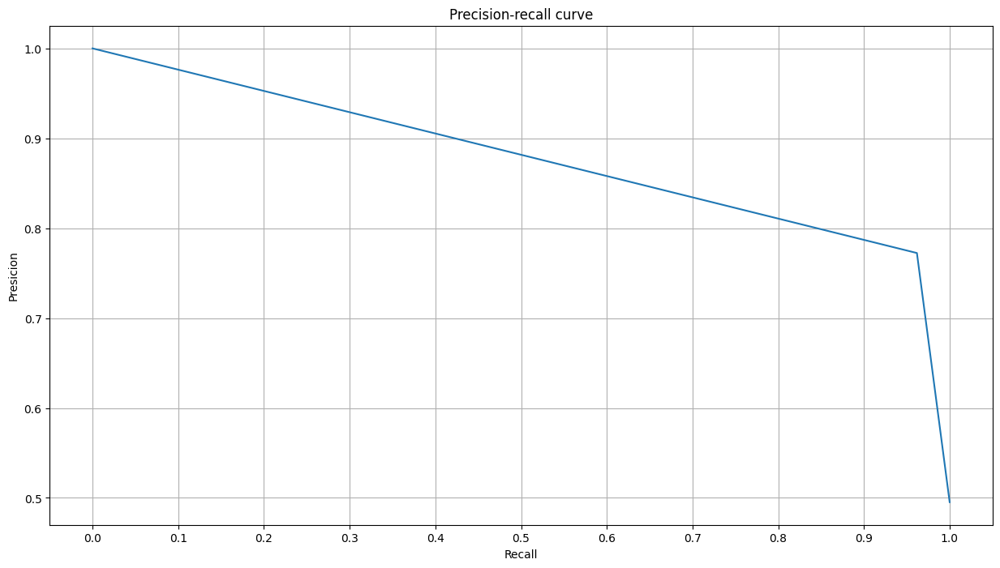

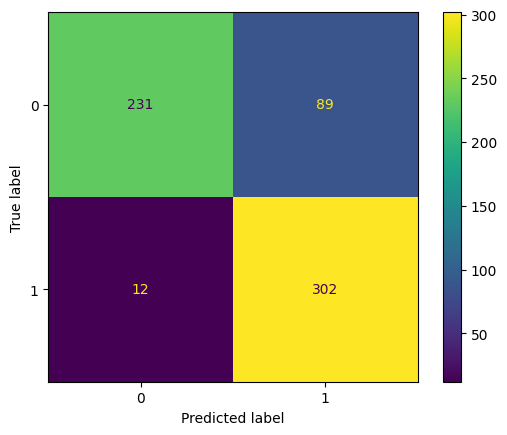

Processed model 1/7


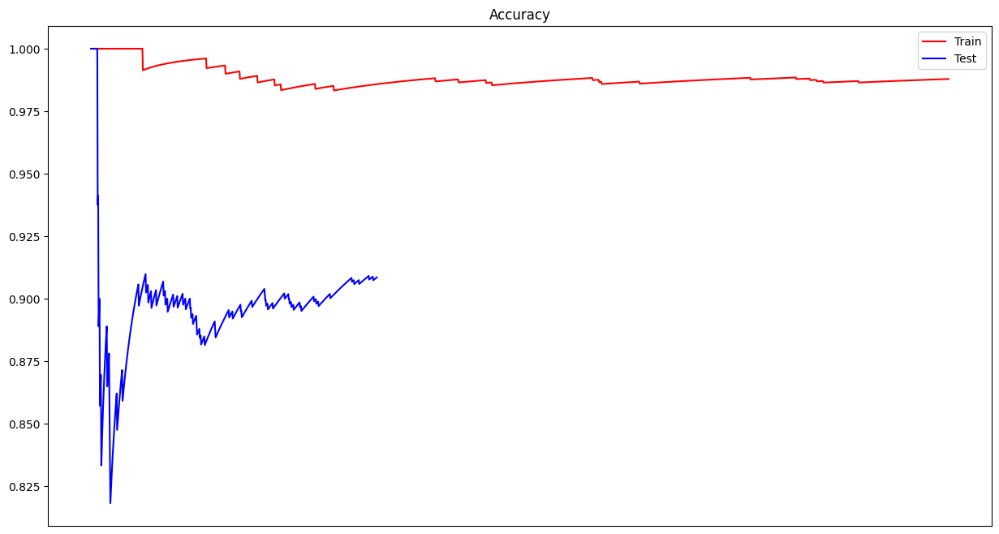

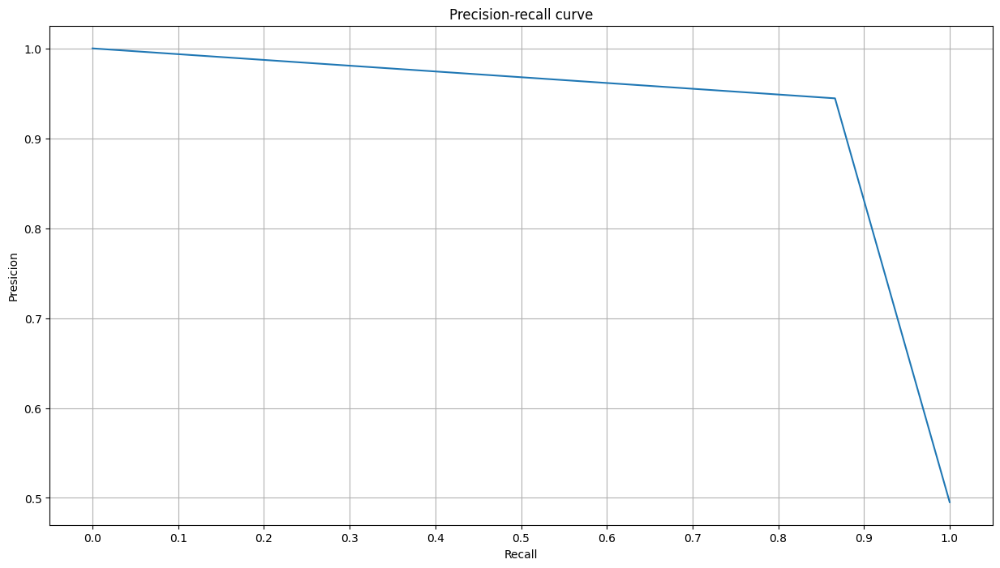

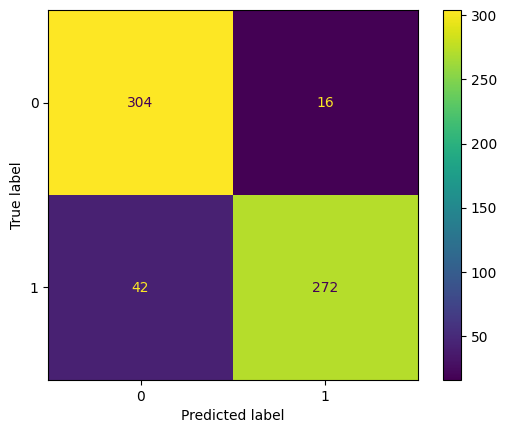

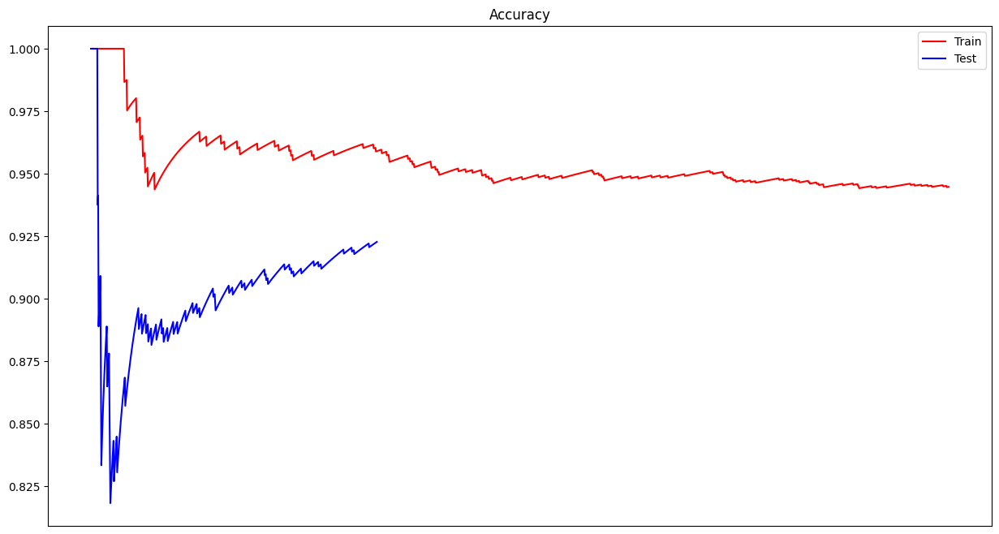

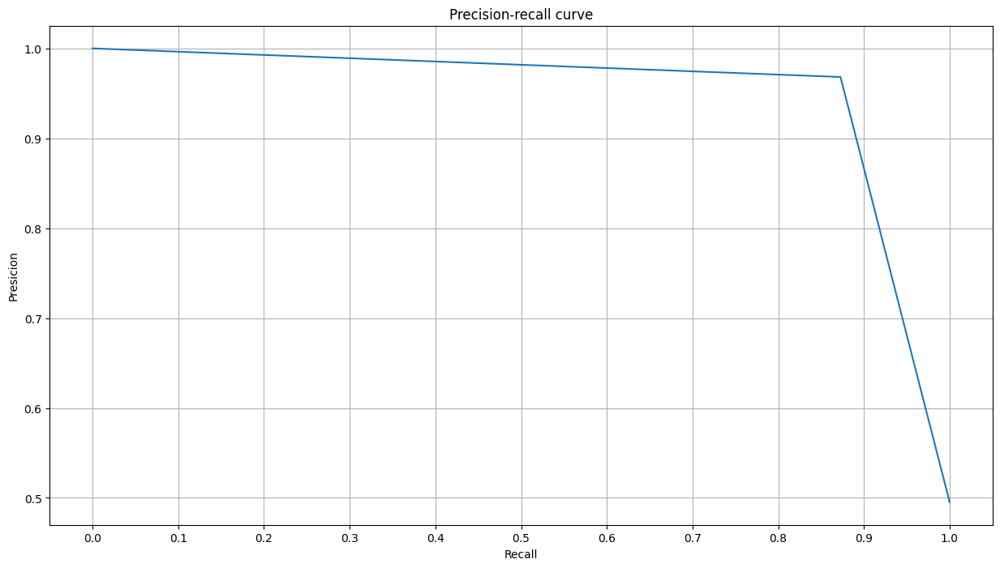

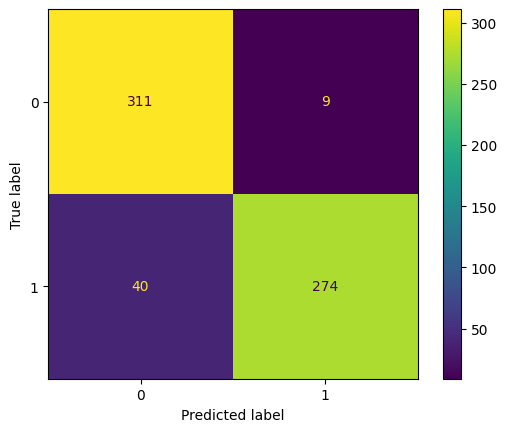

Processed model 2/7


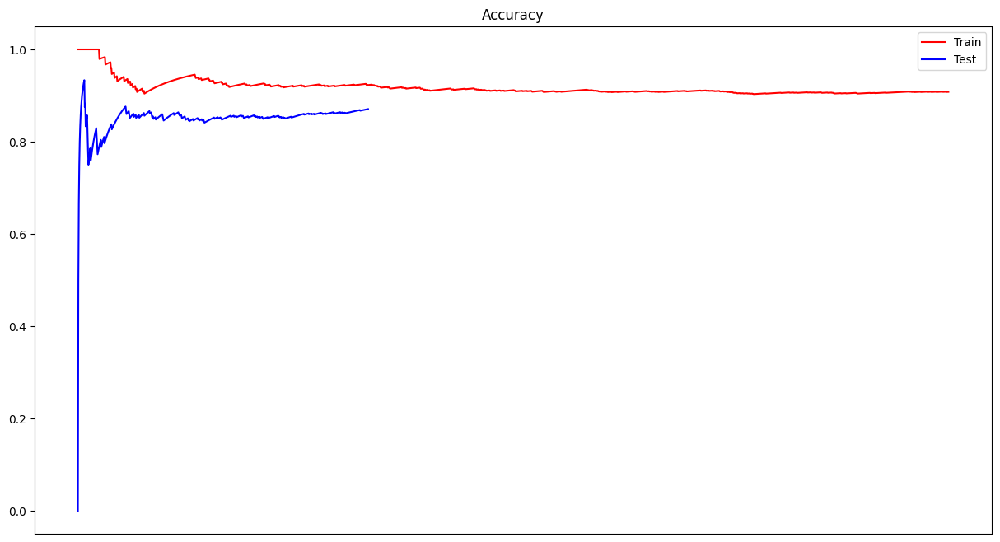

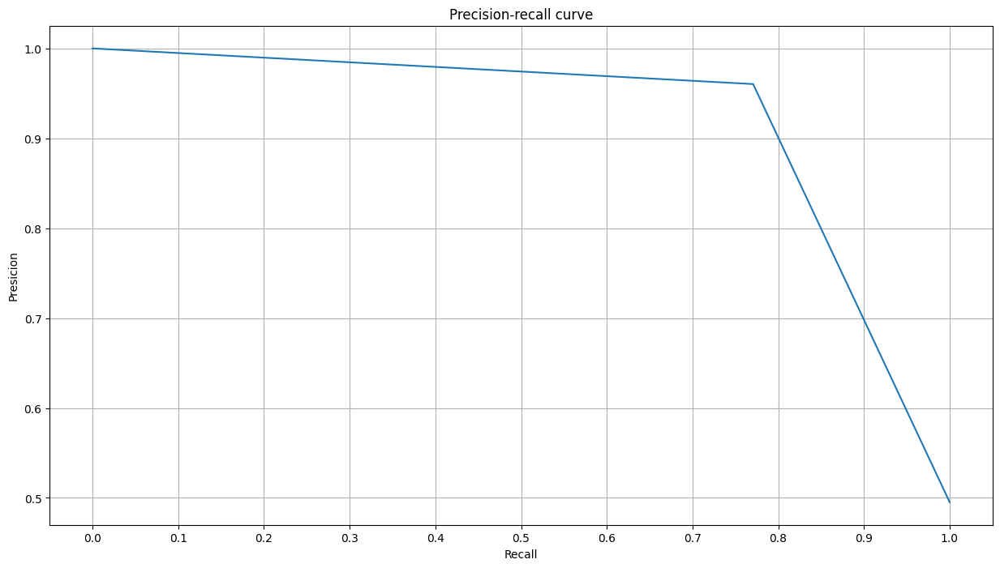

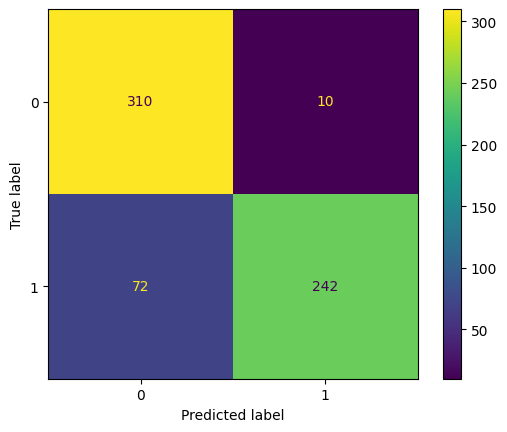

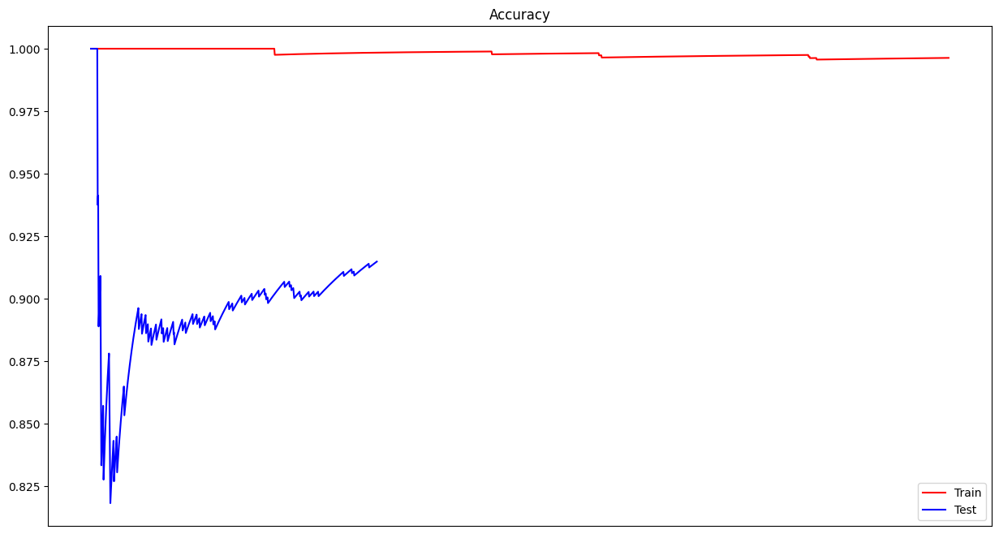

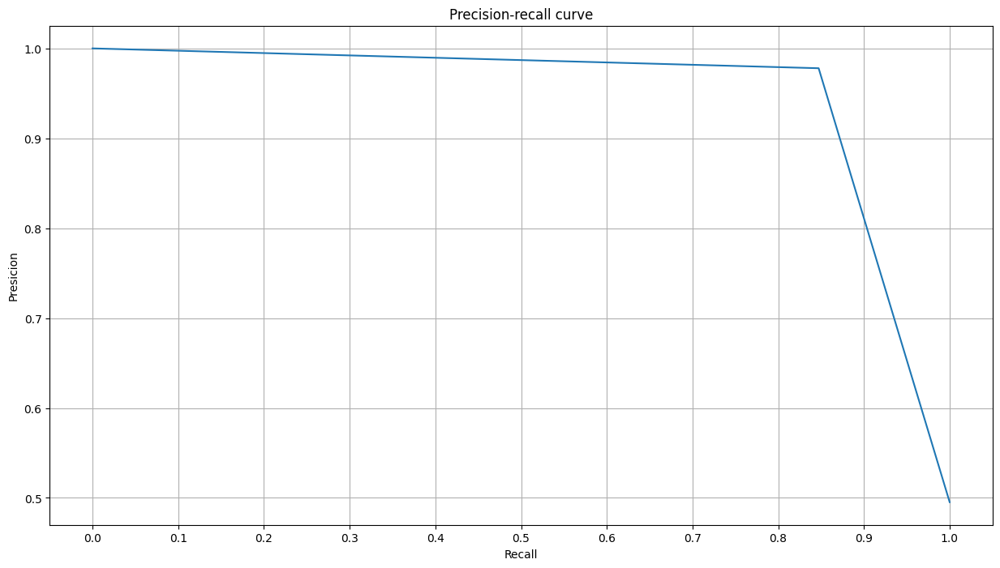

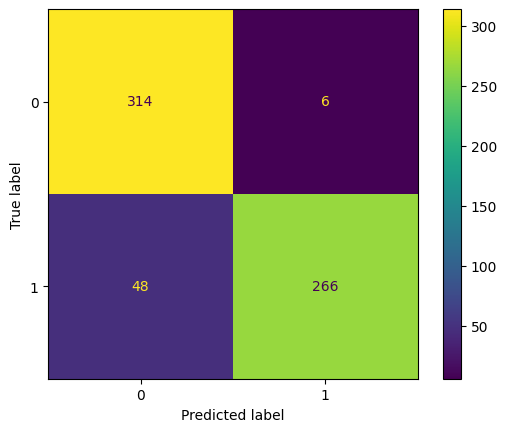

Processed model 3/7


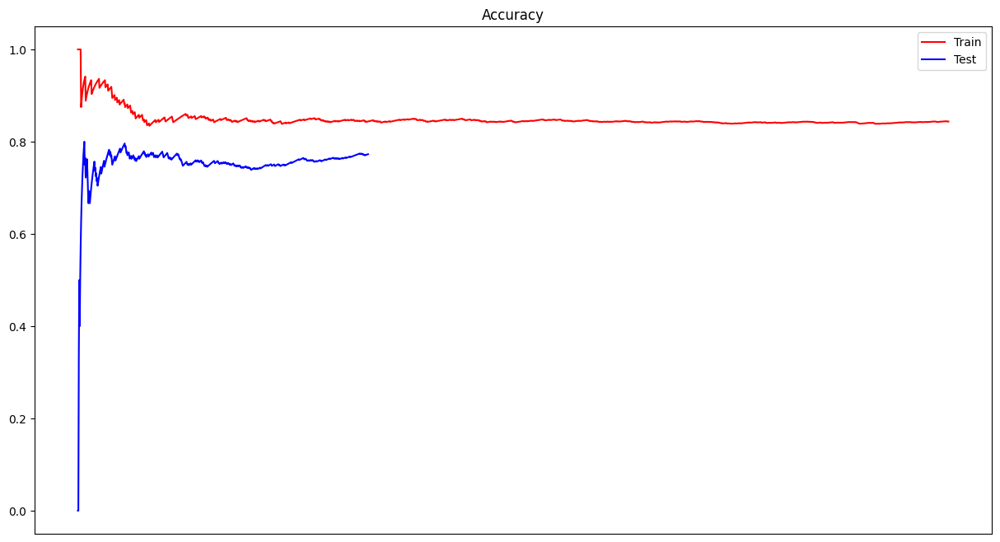

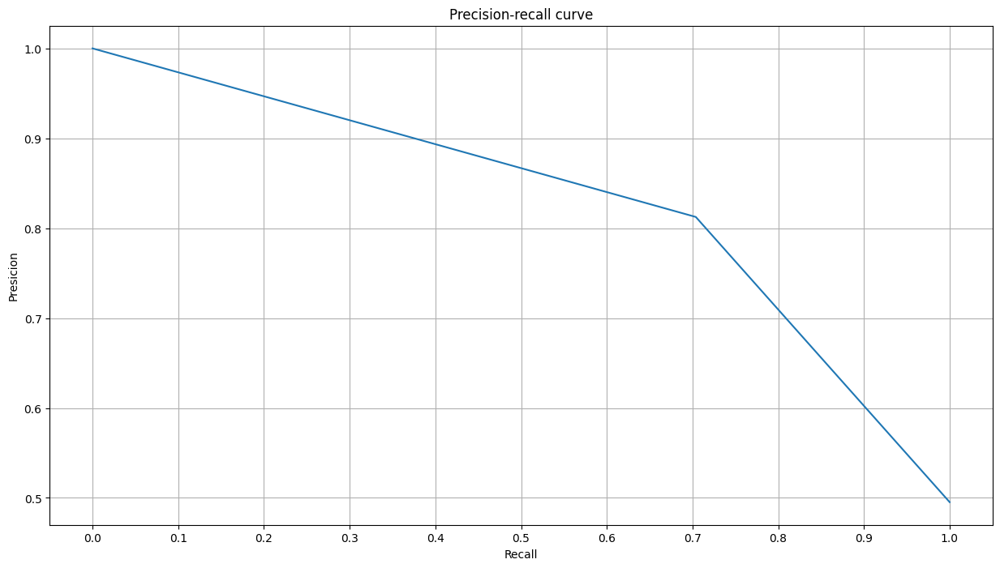

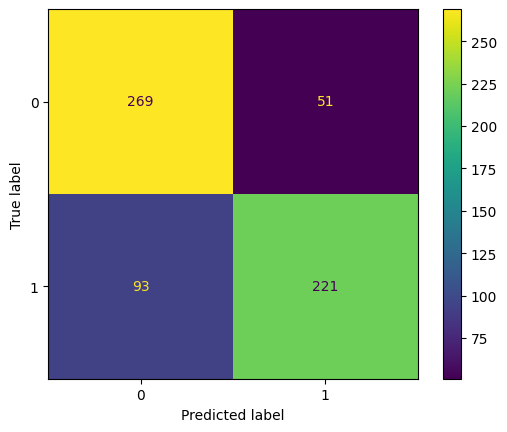

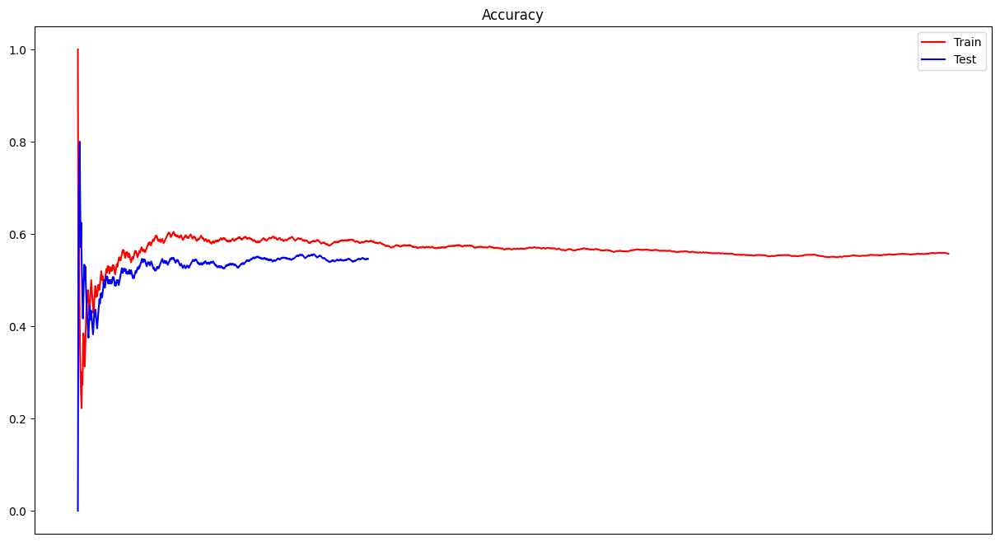

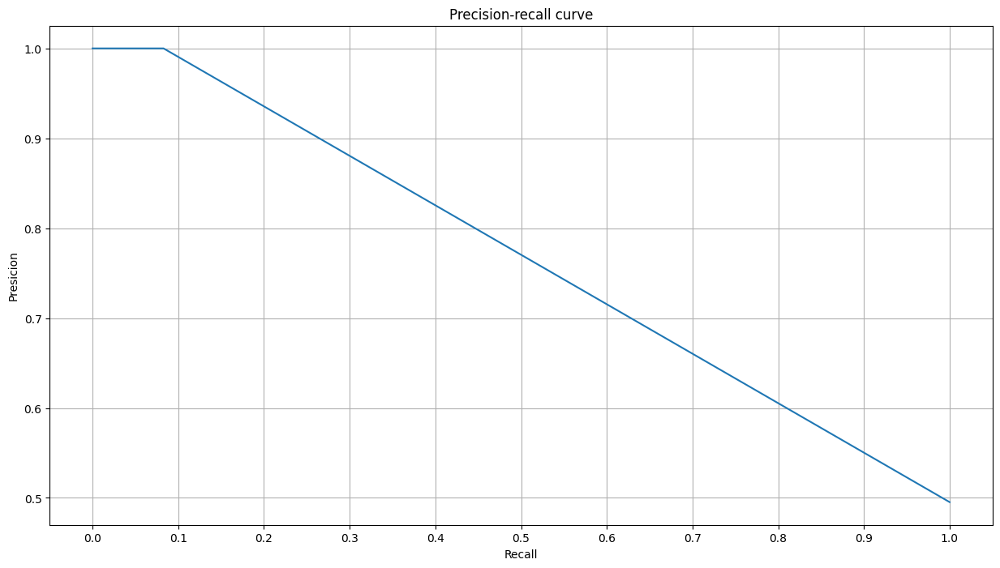

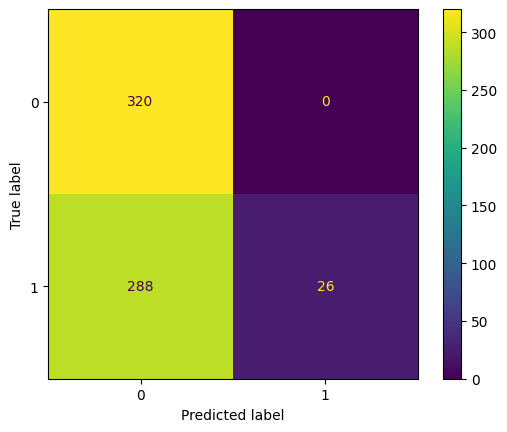

Processed model 4/7


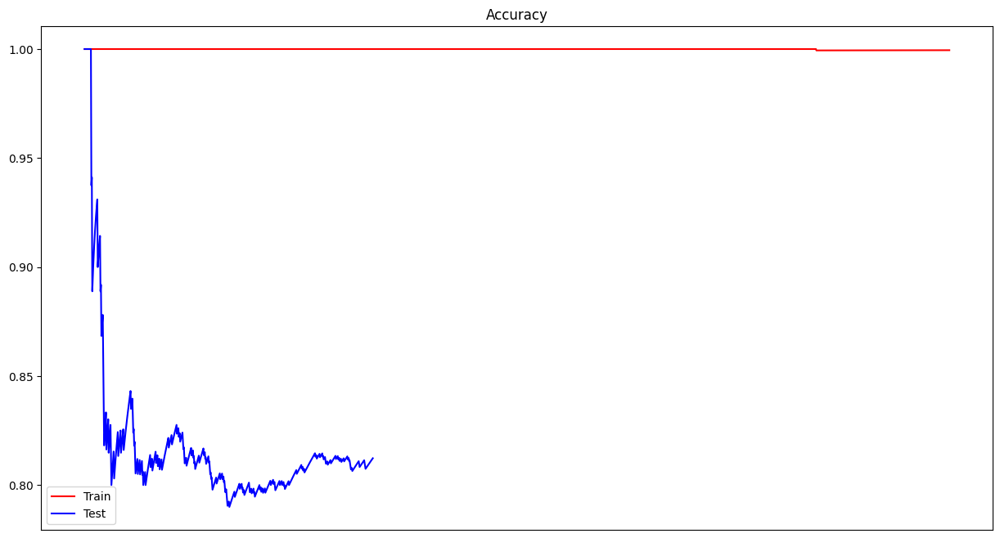

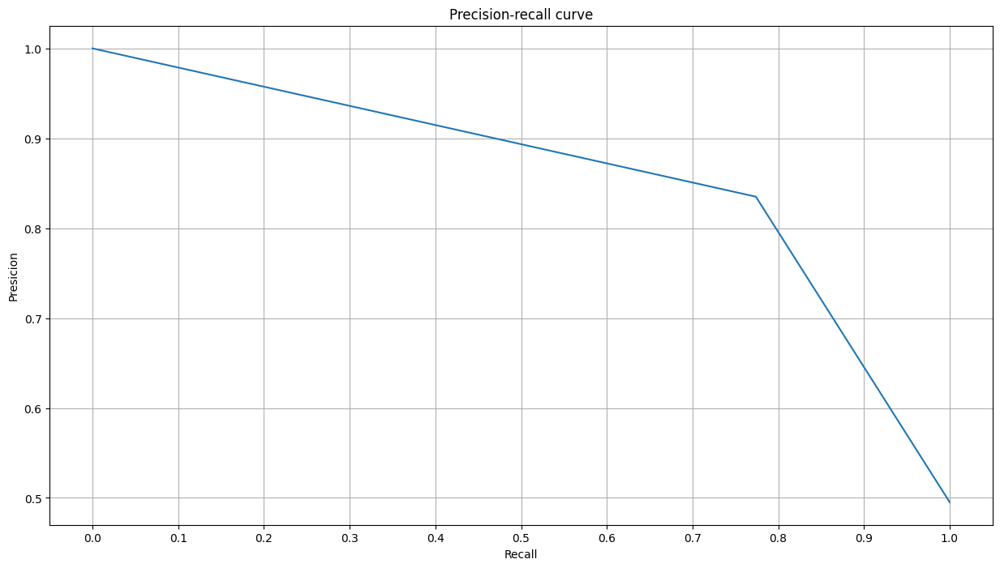

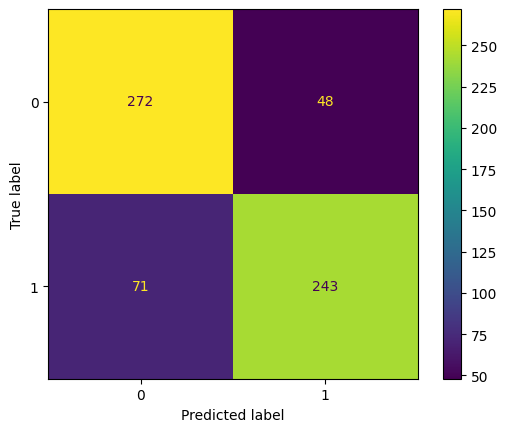

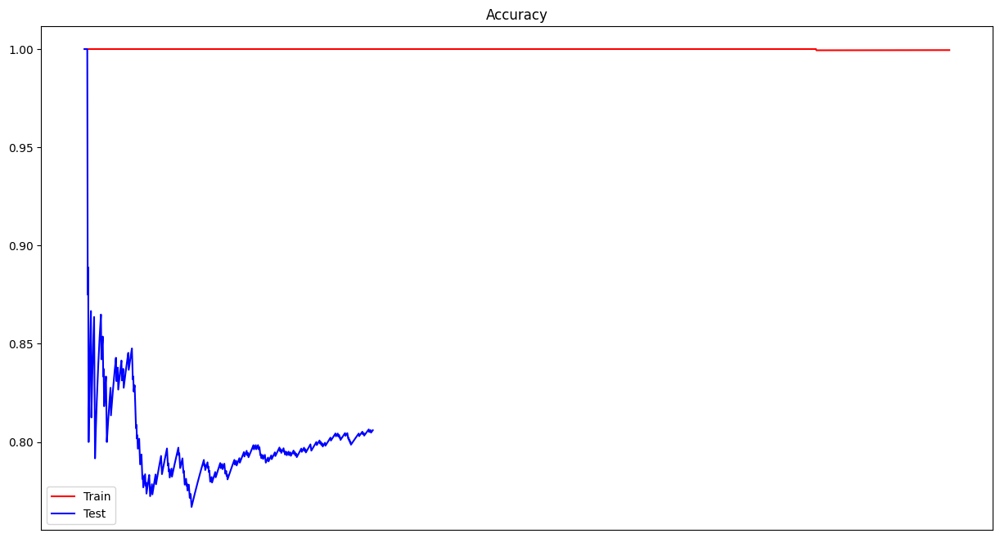

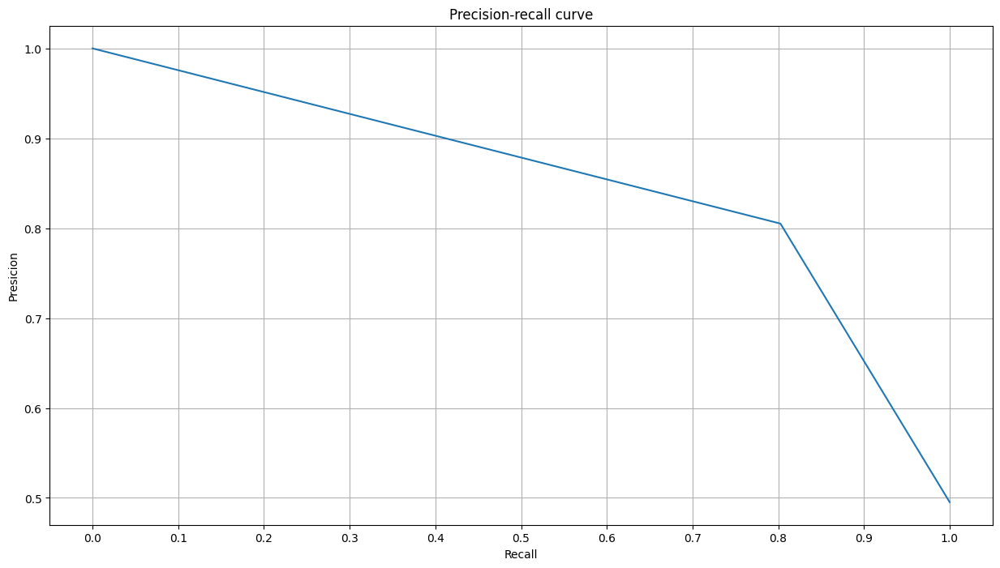

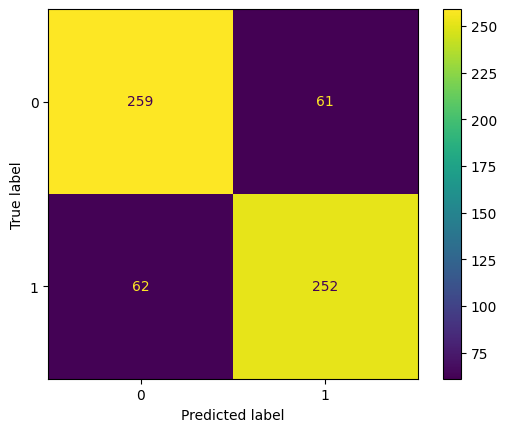

Processed model 5/7


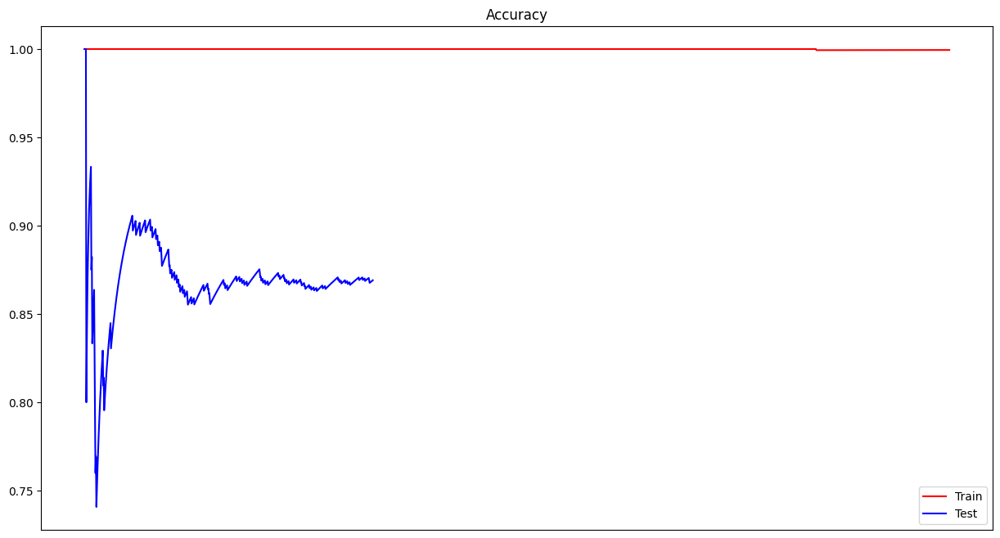

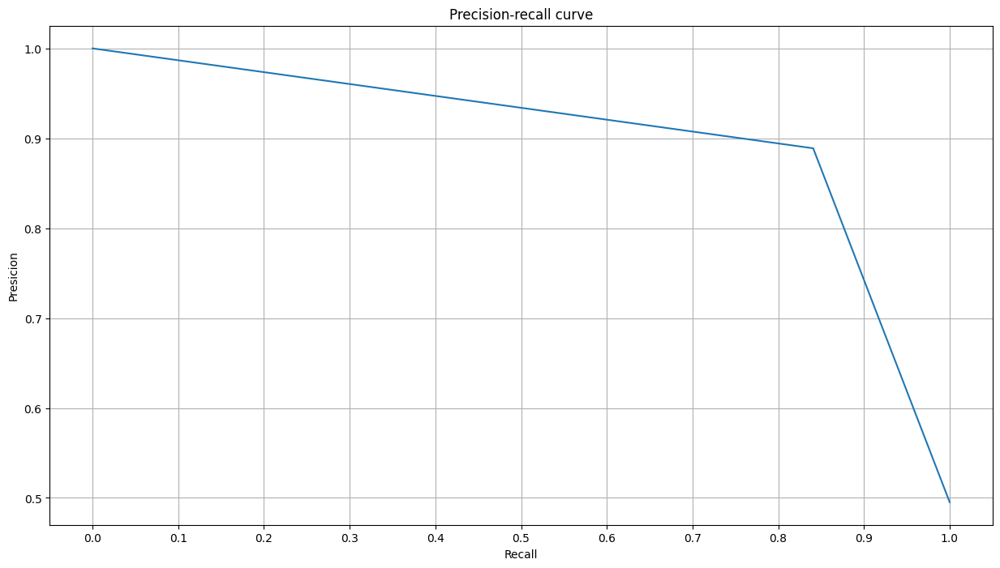

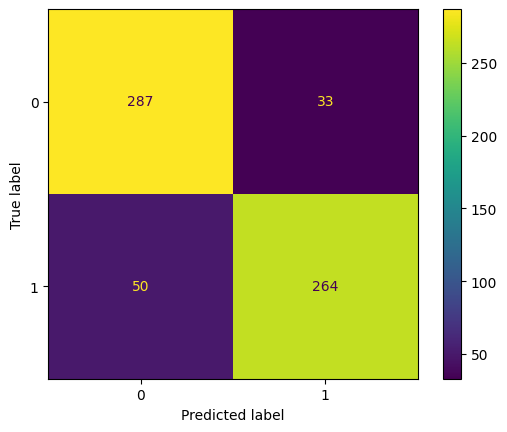

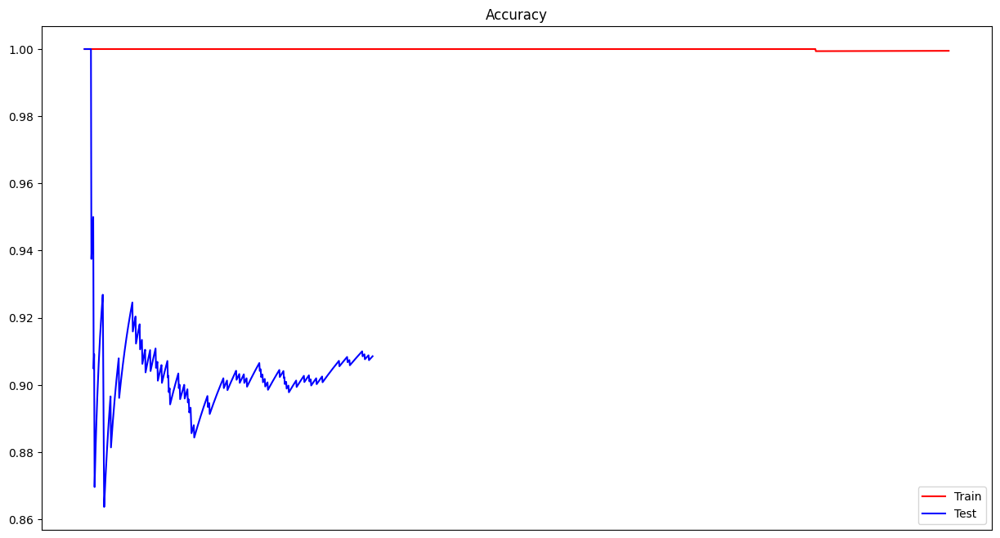

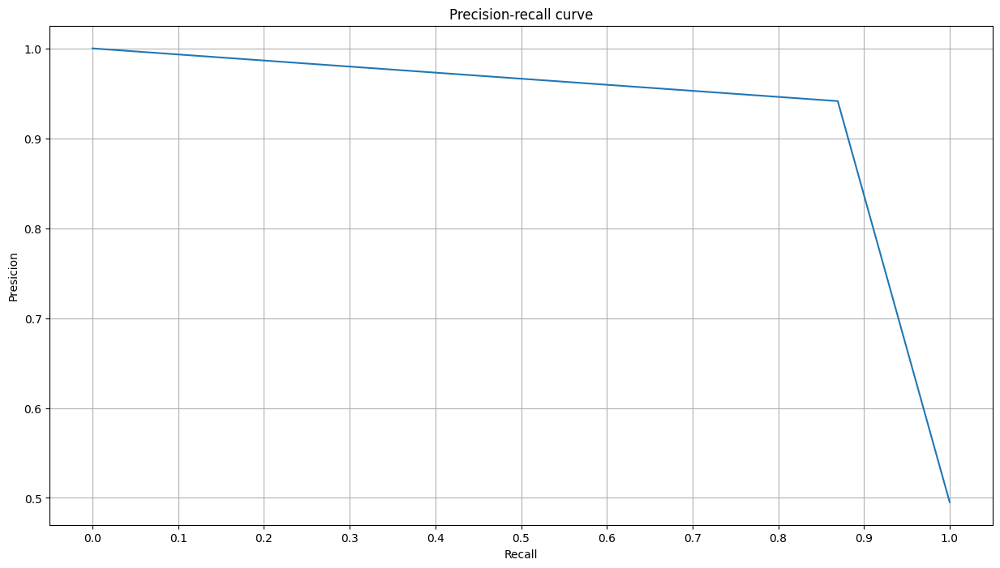

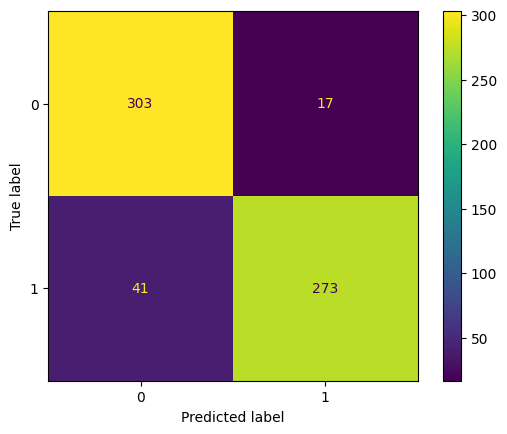

Processed model 6/7


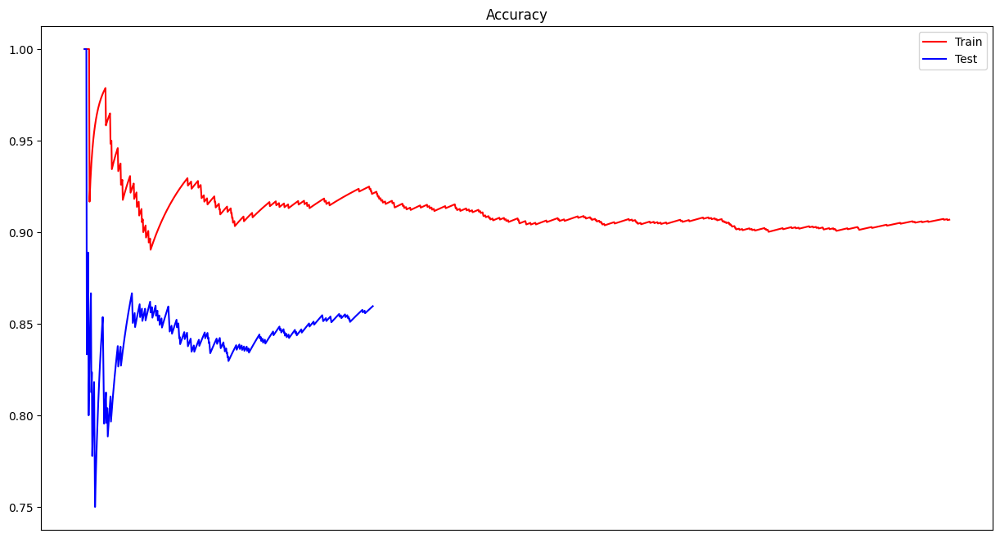

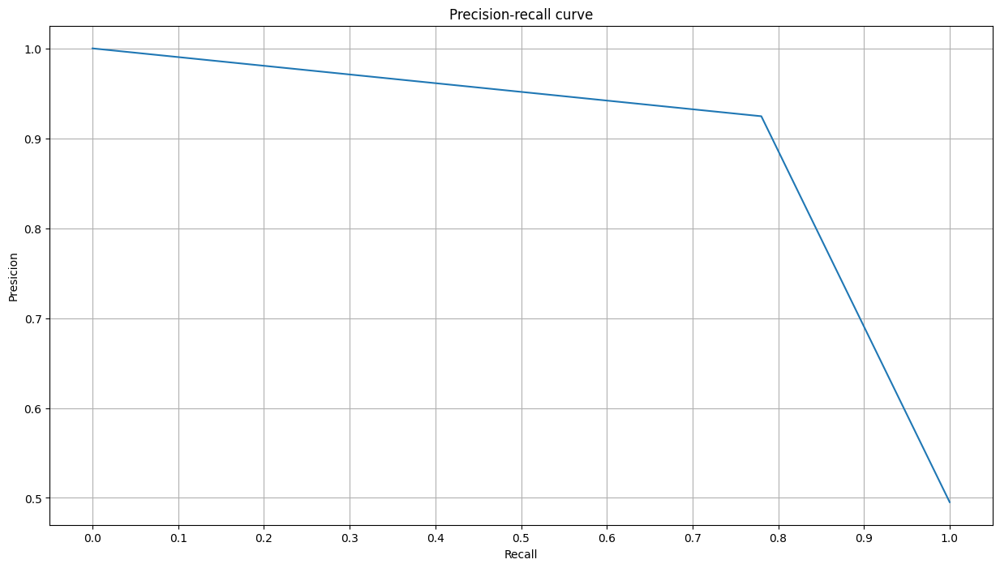

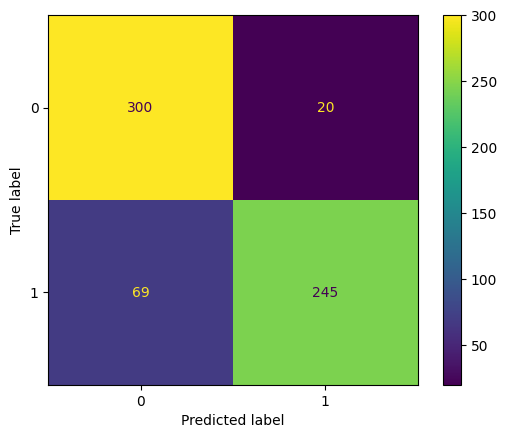

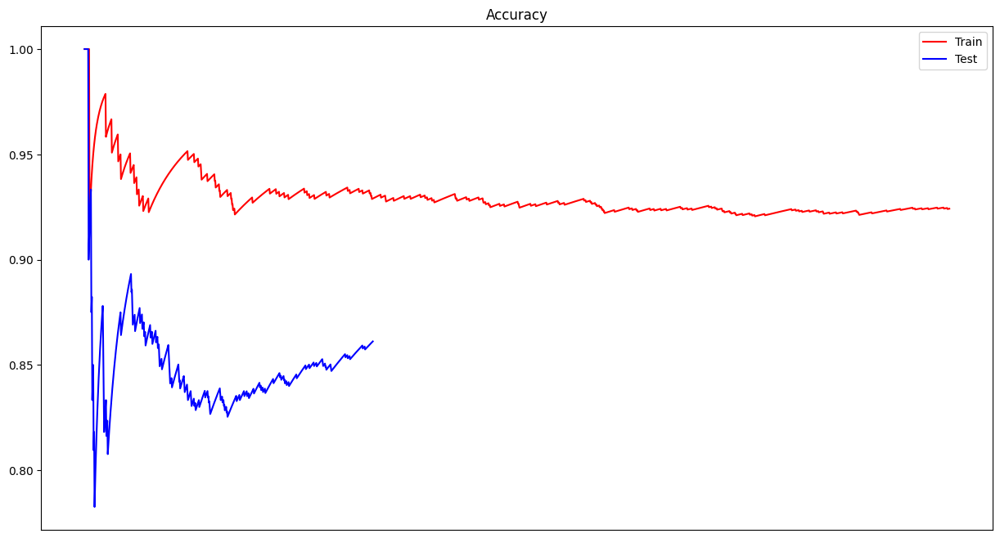

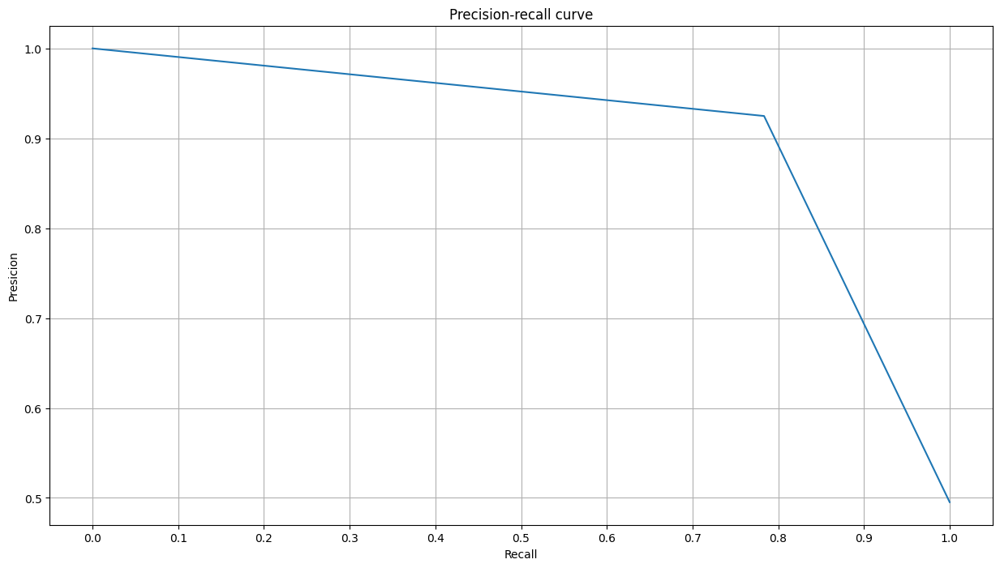

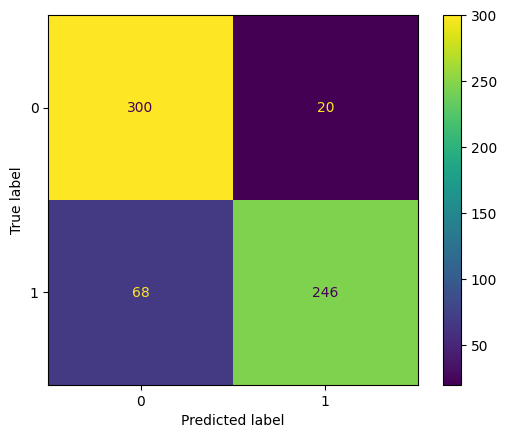

Processed model 7/7
Start processing sally_beck.csv


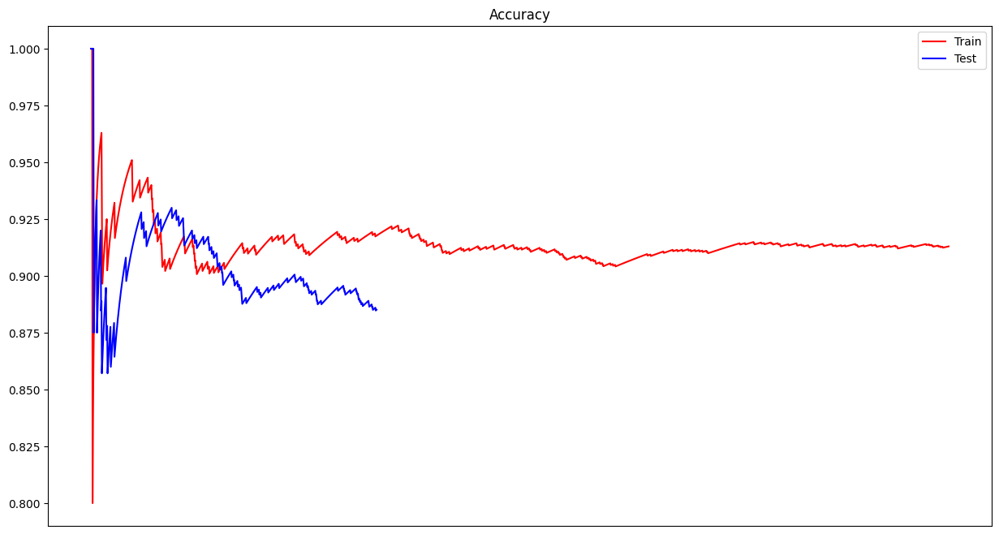

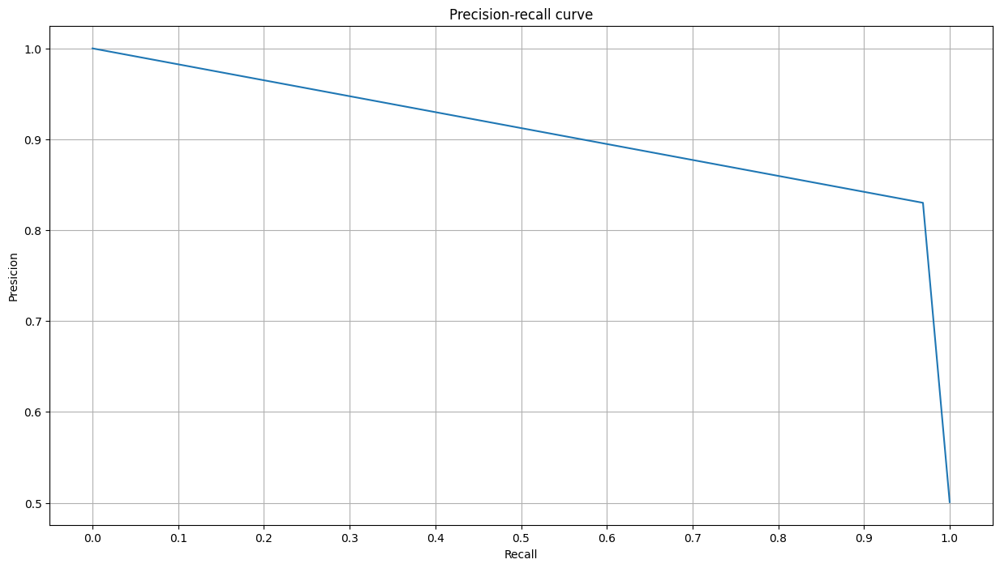

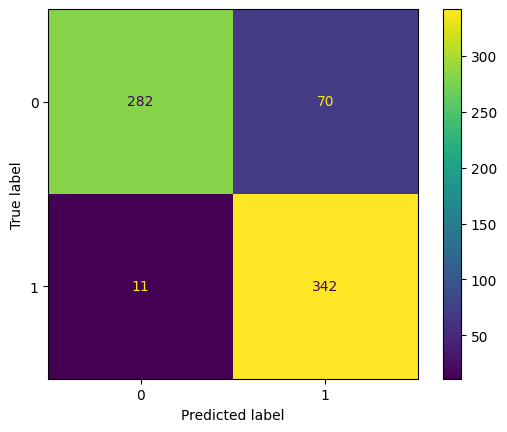

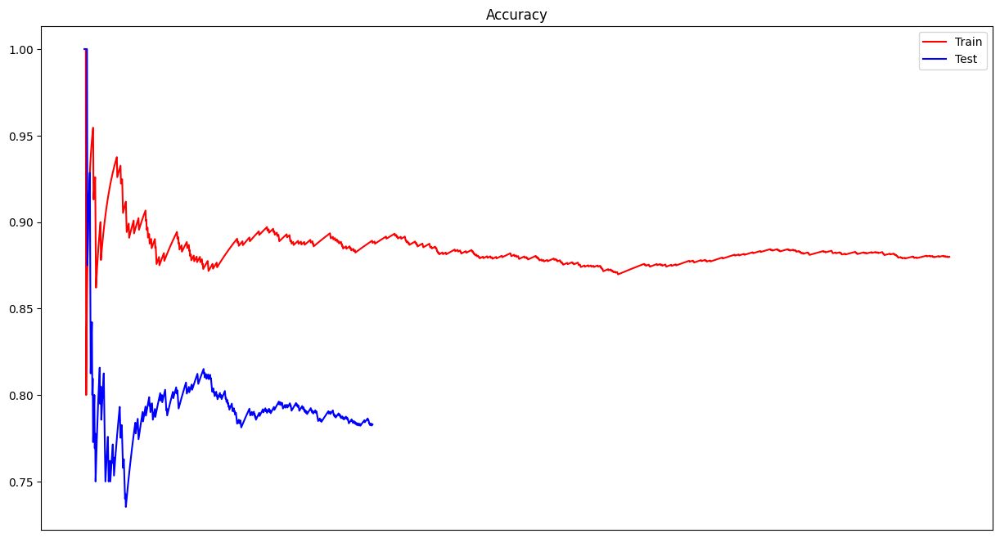

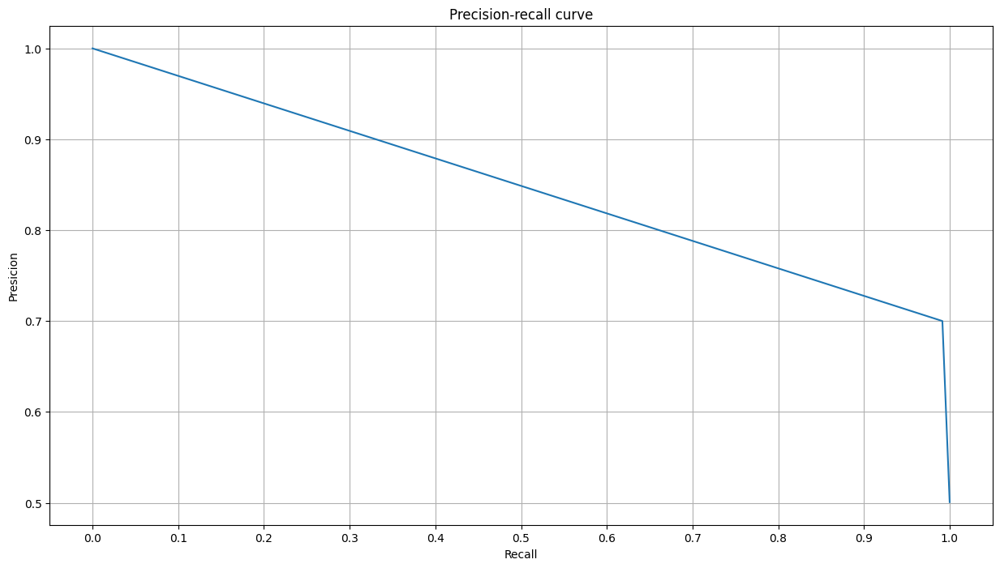

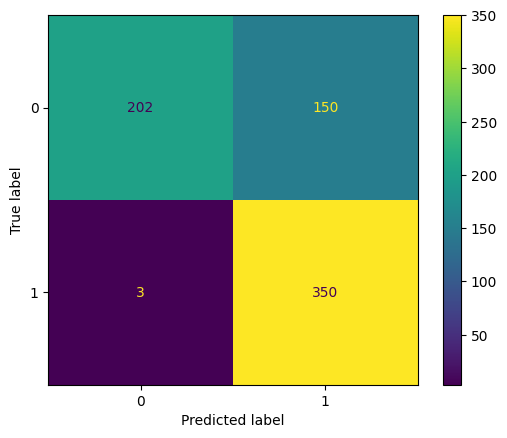

Processed model 1/7


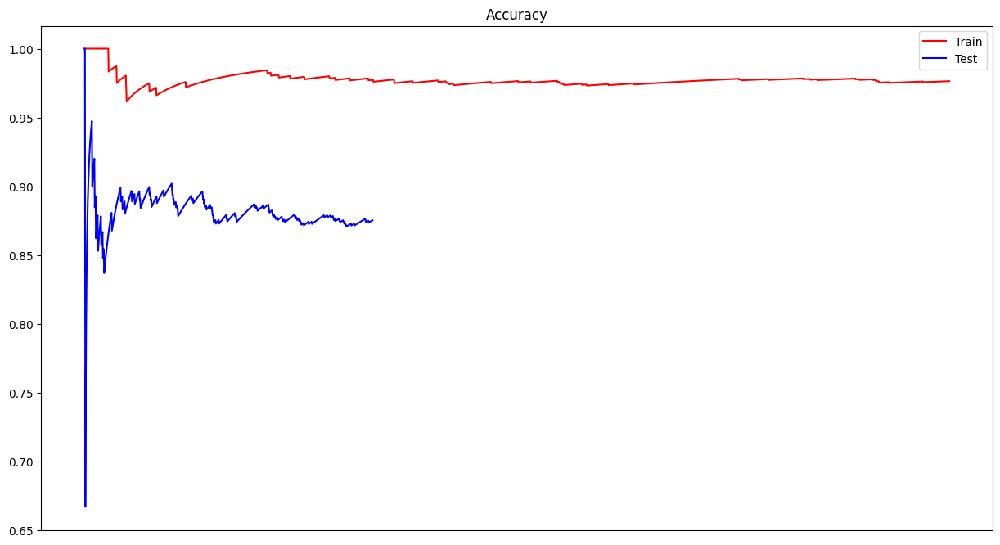

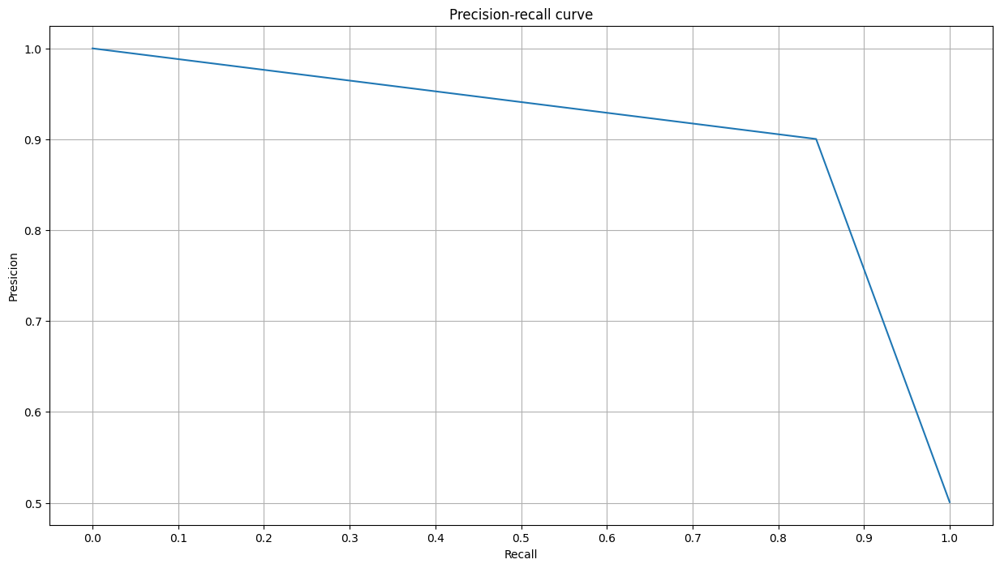

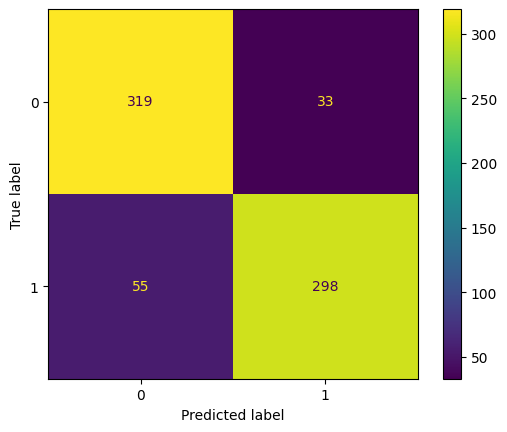

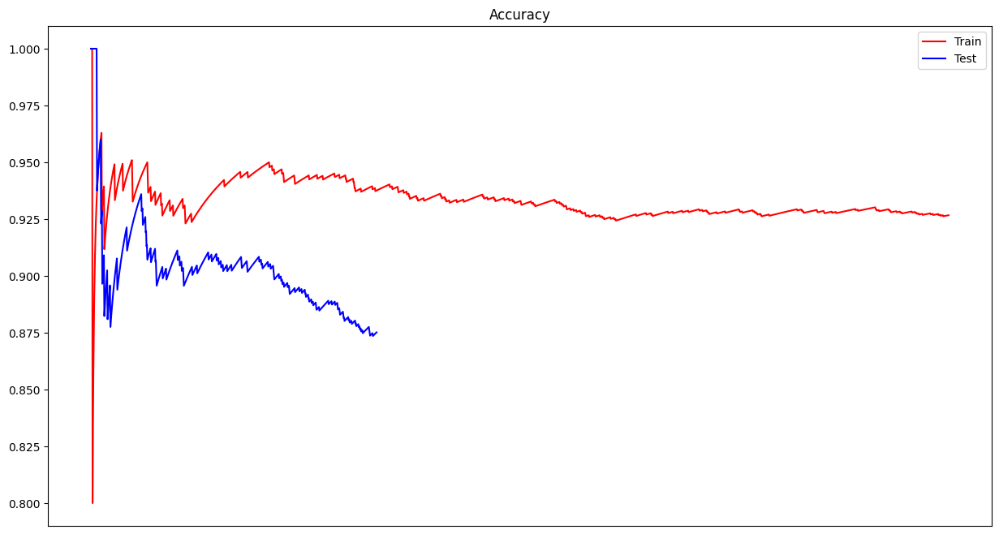

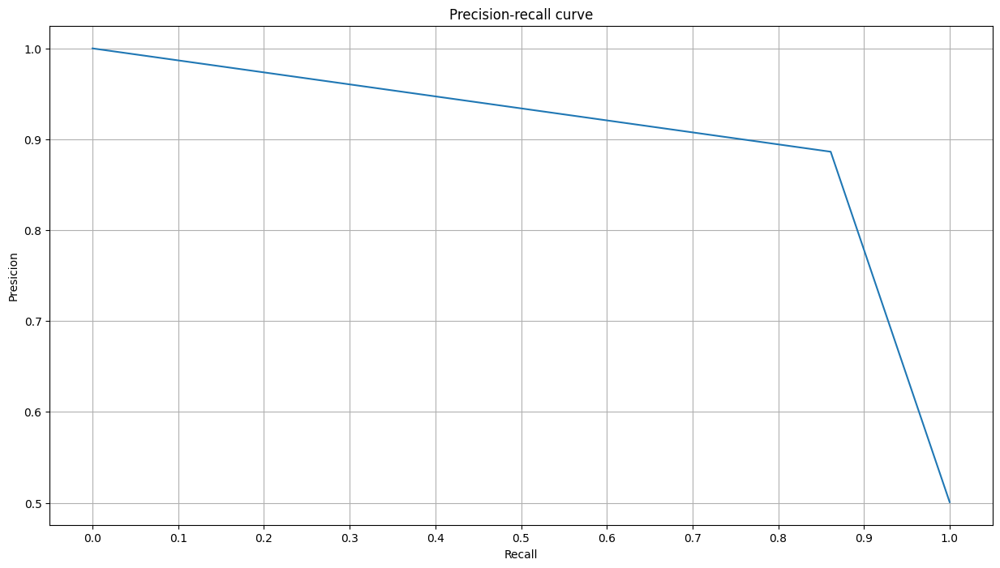

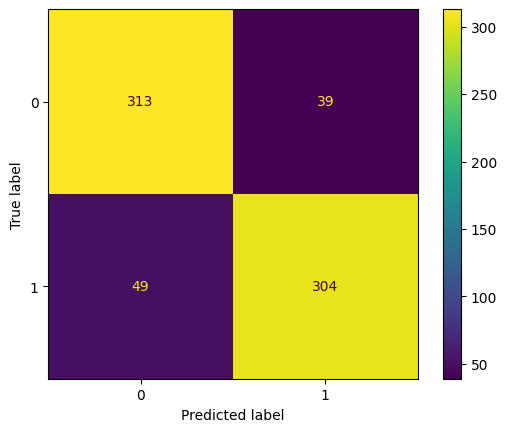

Processed model 2/7


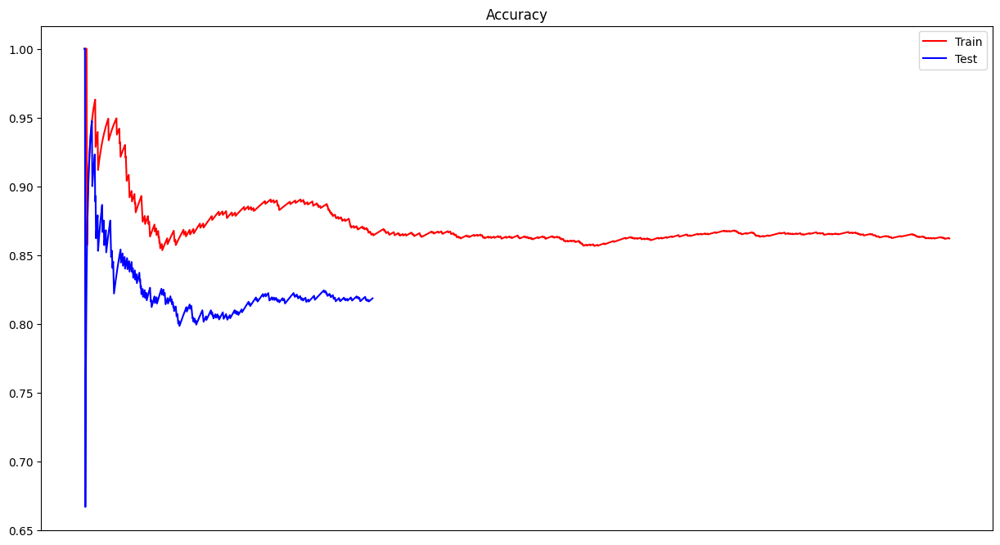

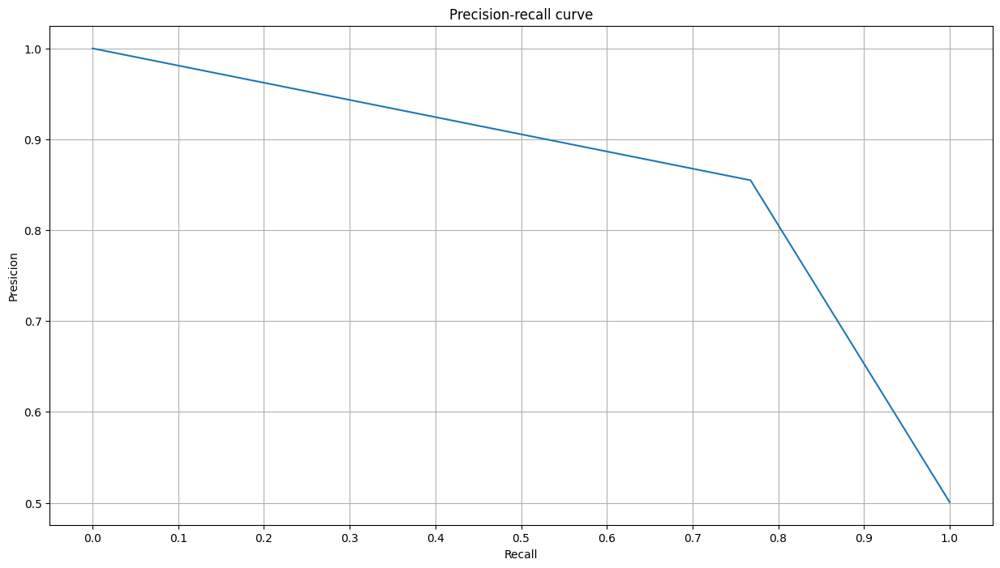

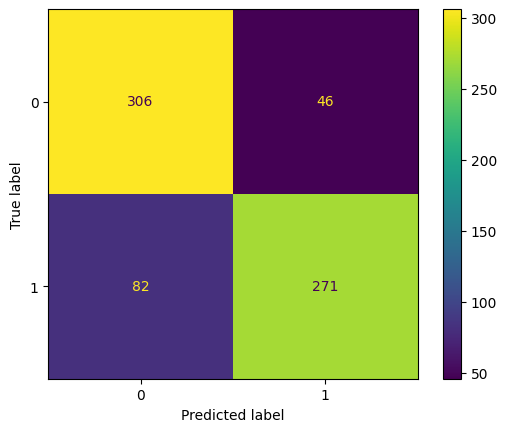

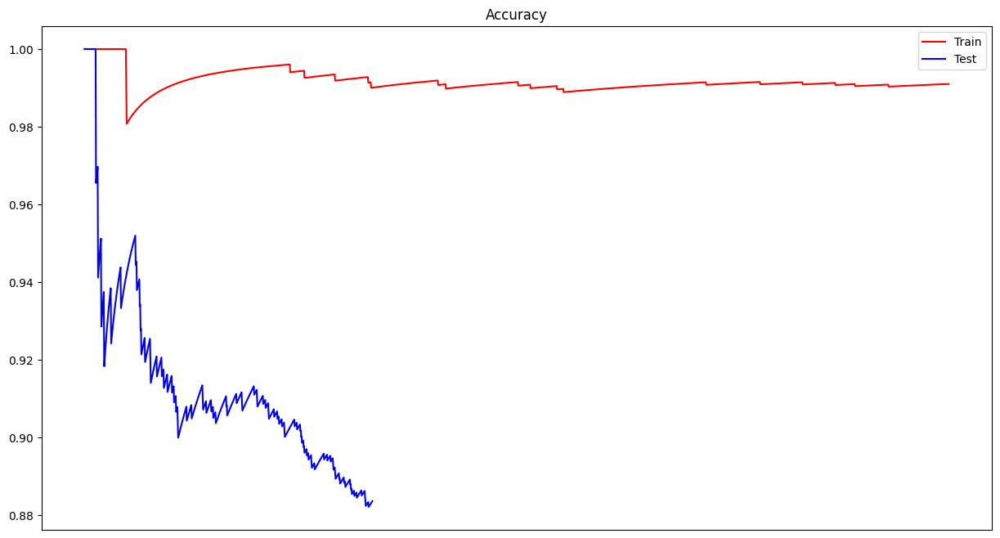

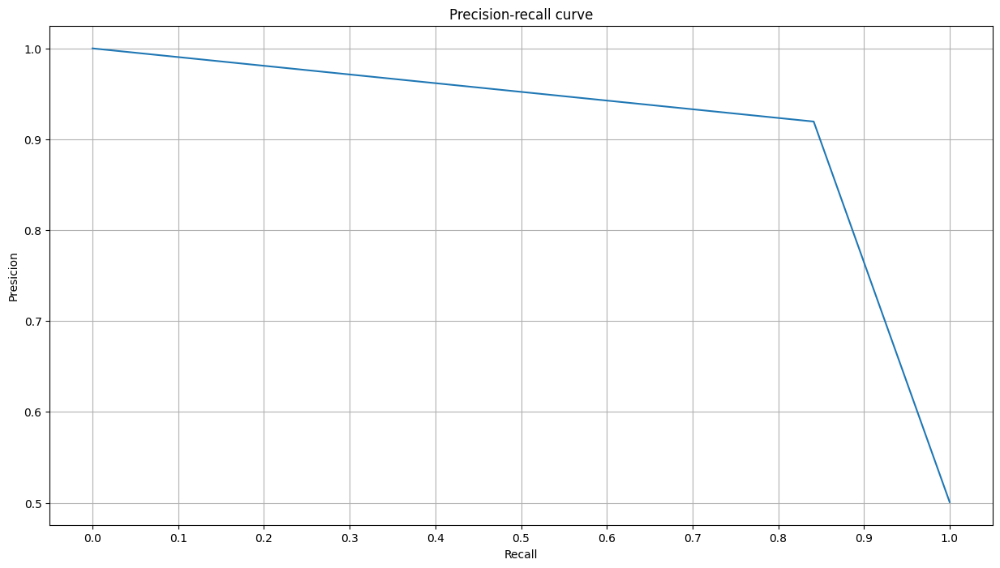

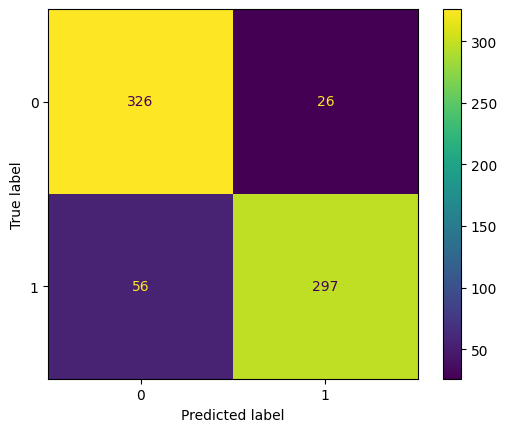

Processed model 3/7


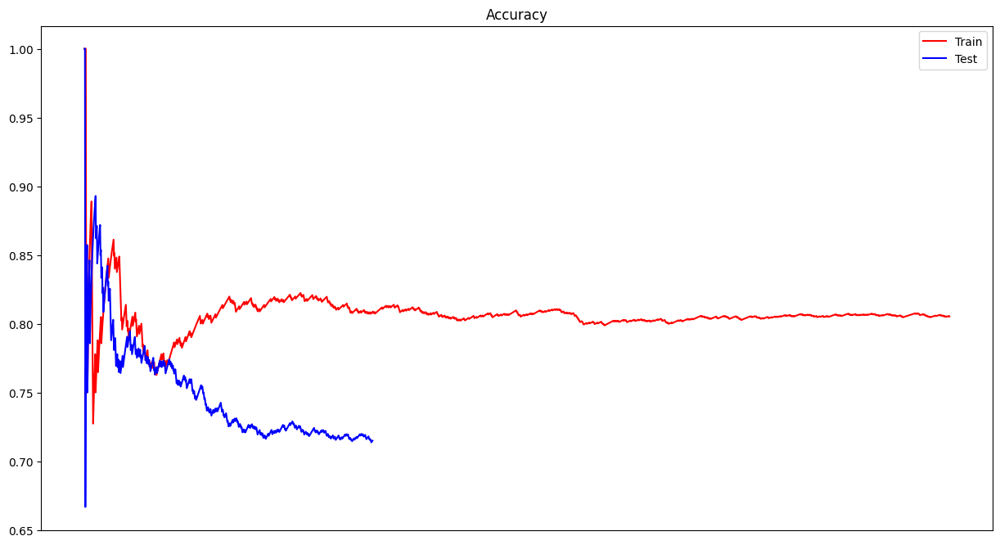

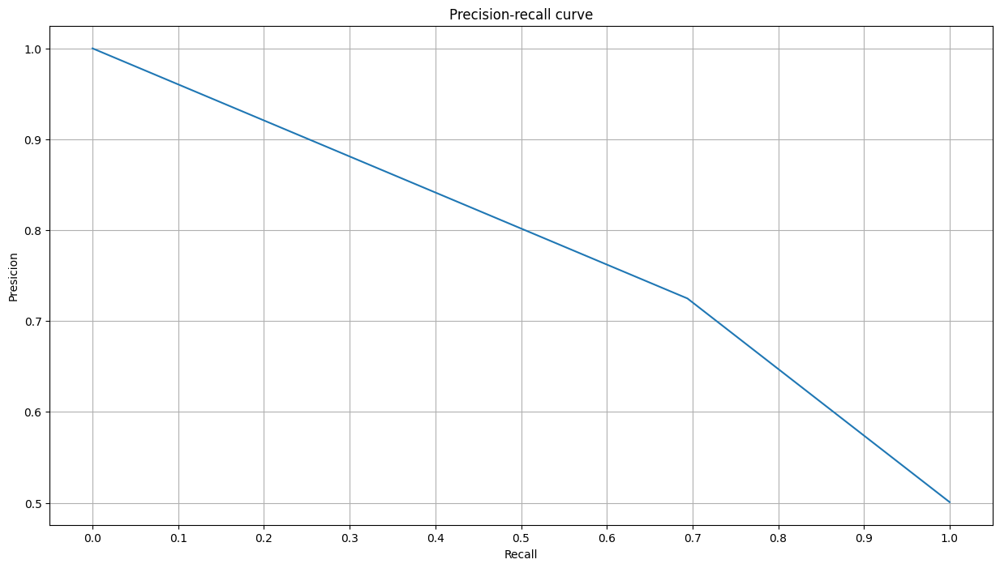

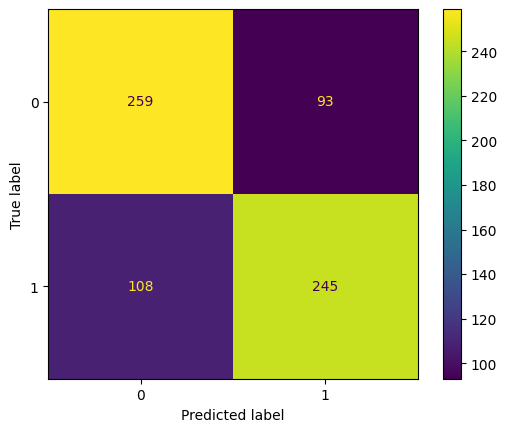

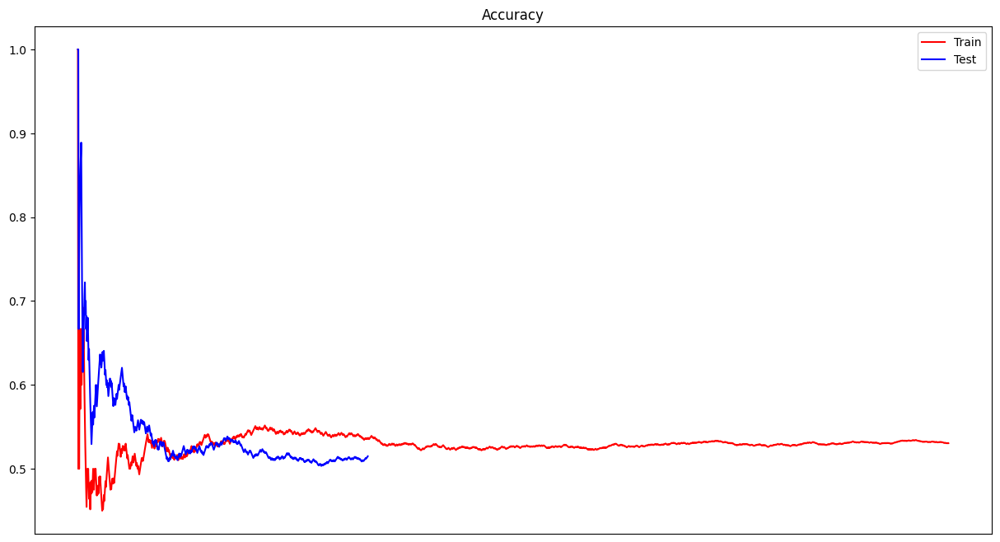

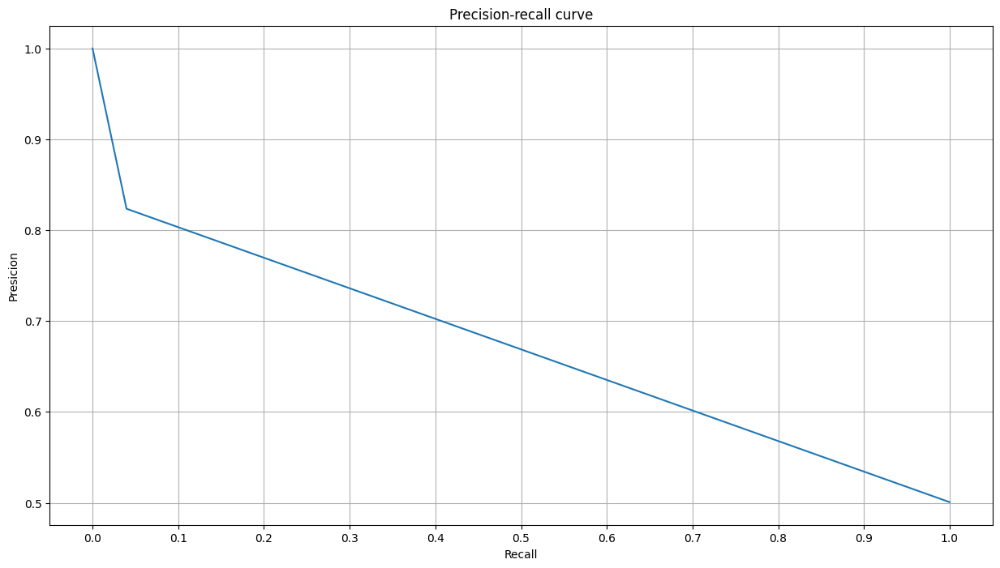

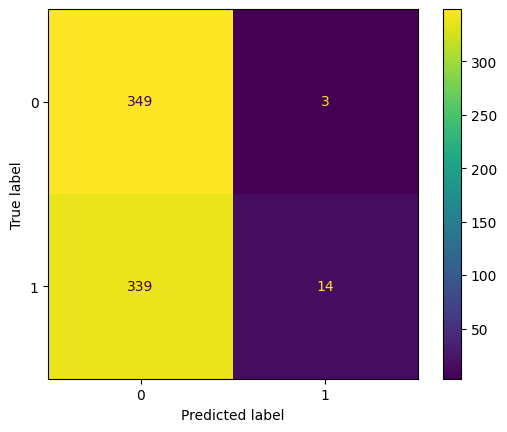

Processed model 4/7


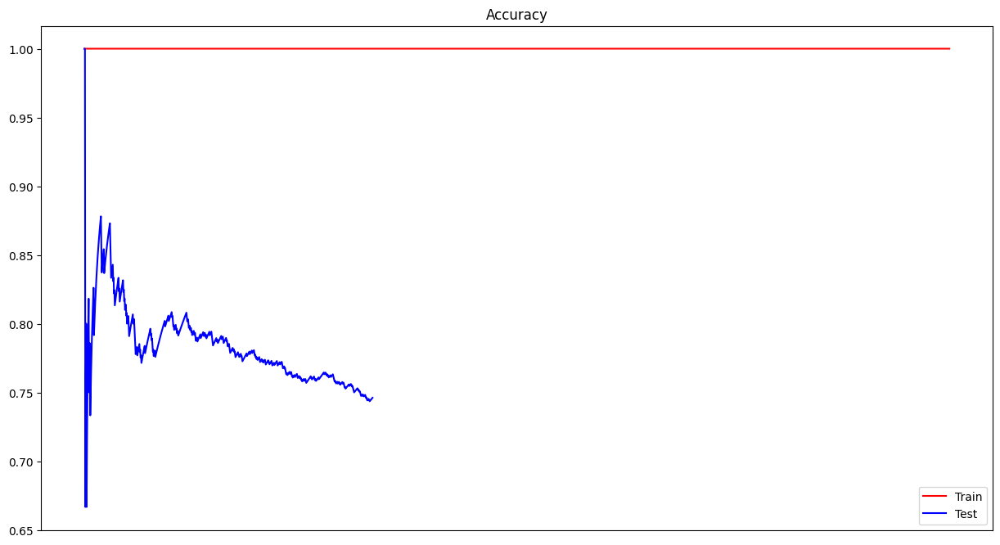

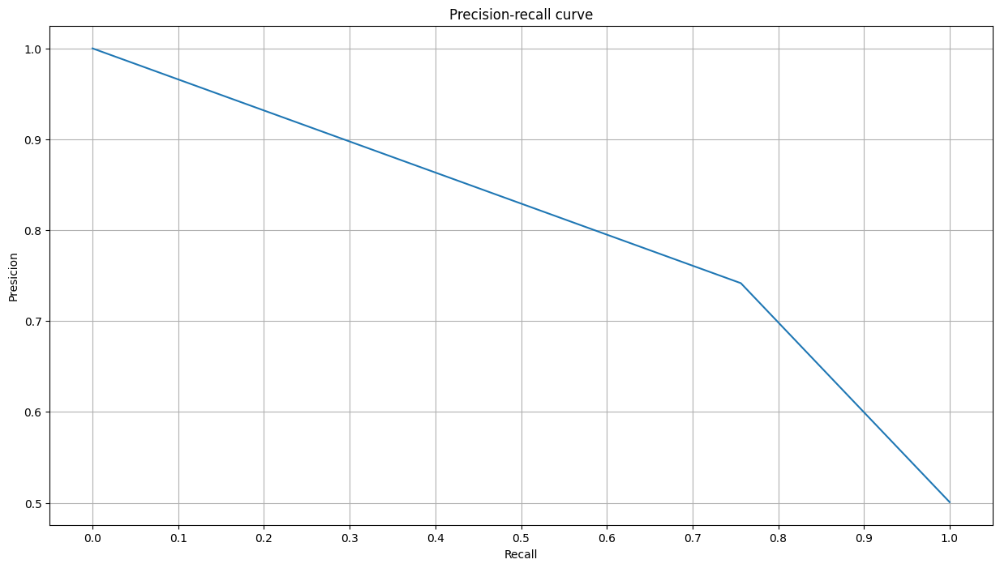

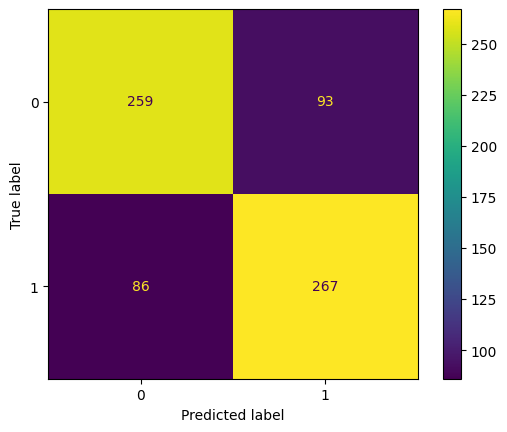

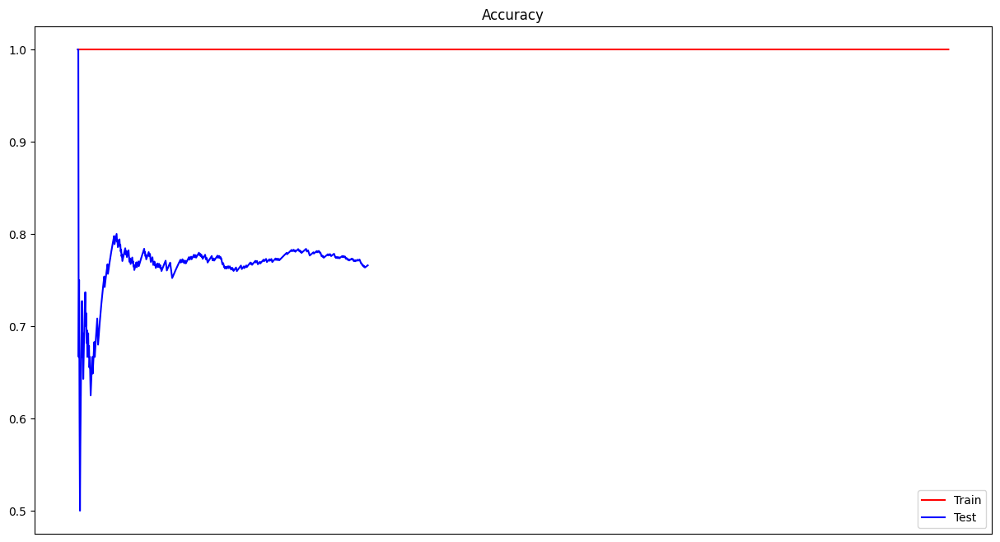

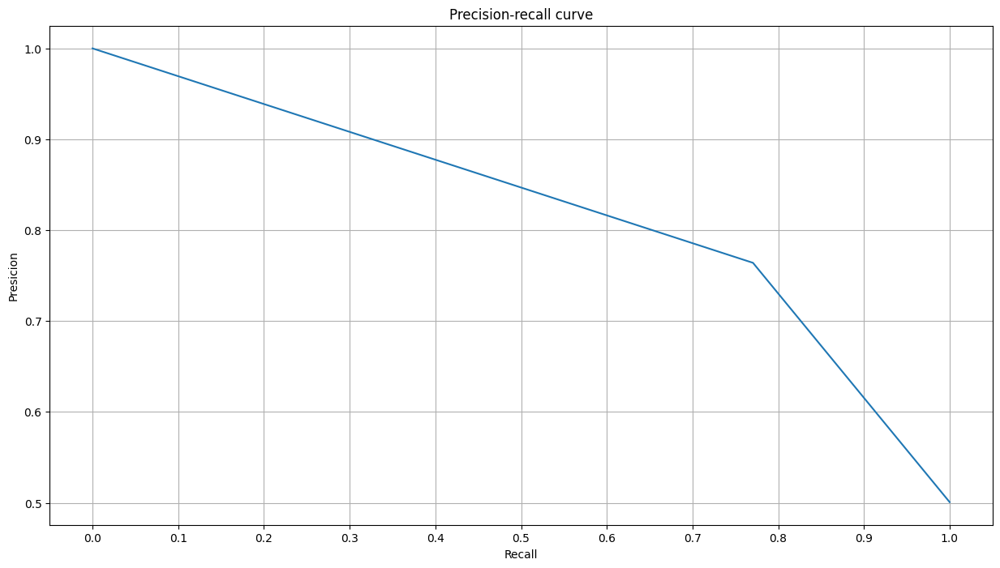

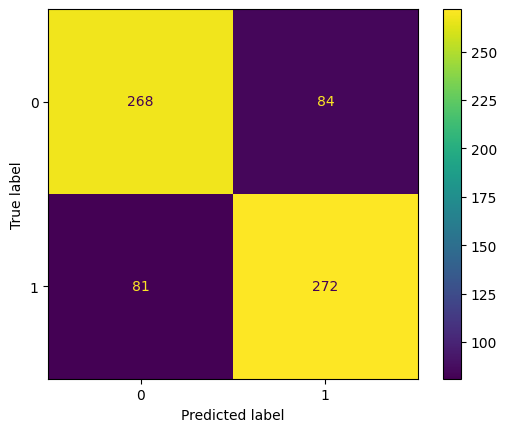

Processed model 5/7


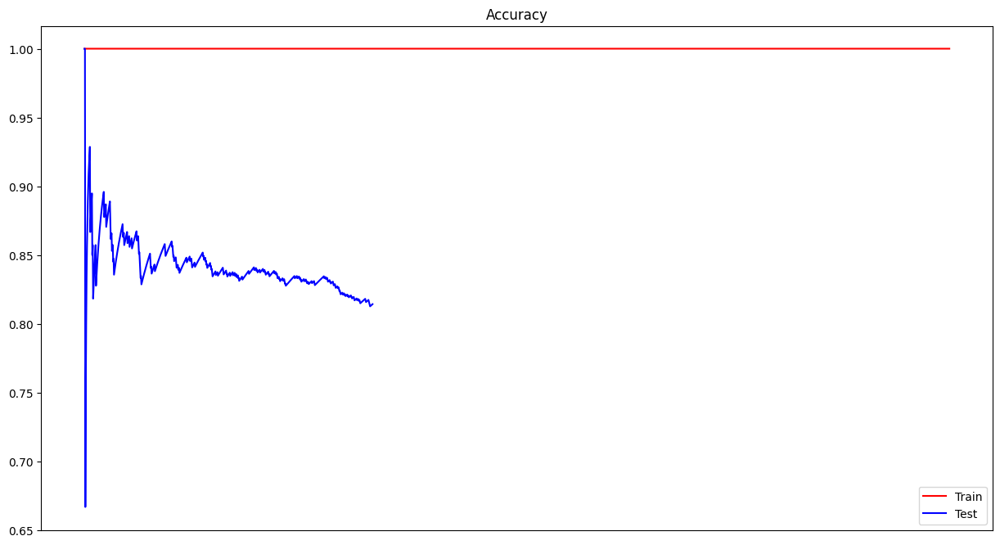

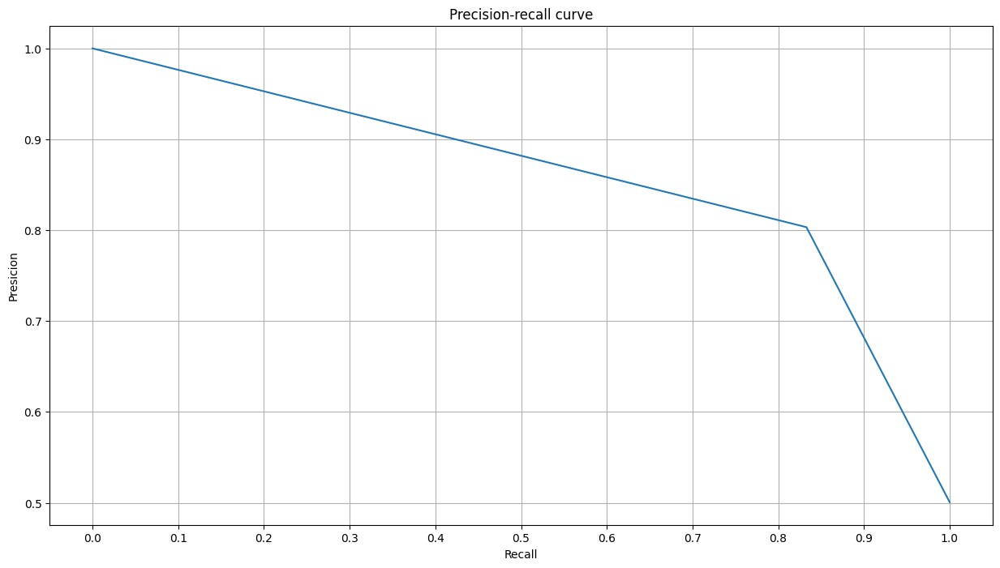

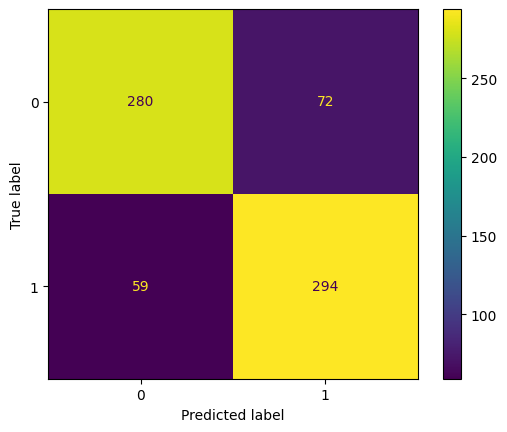

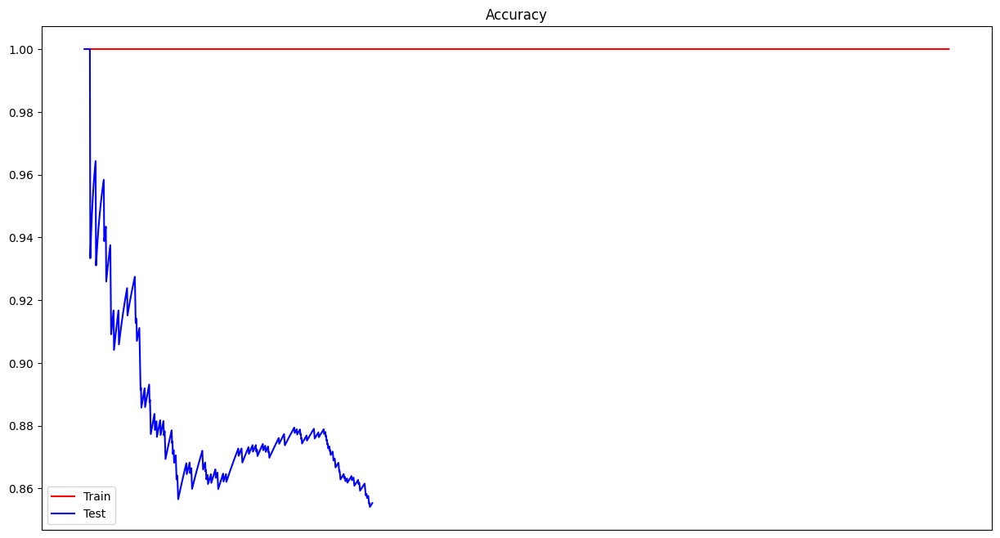

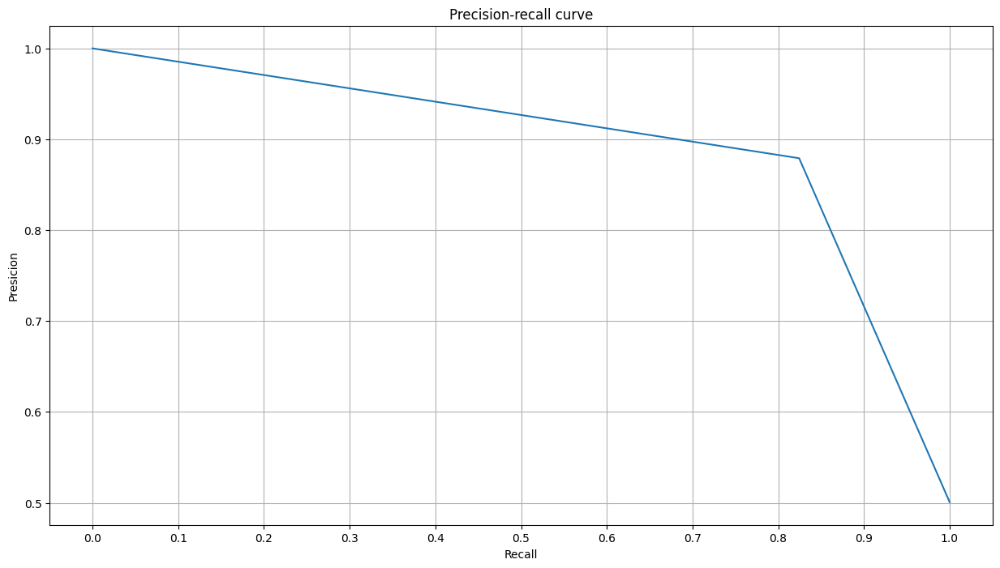

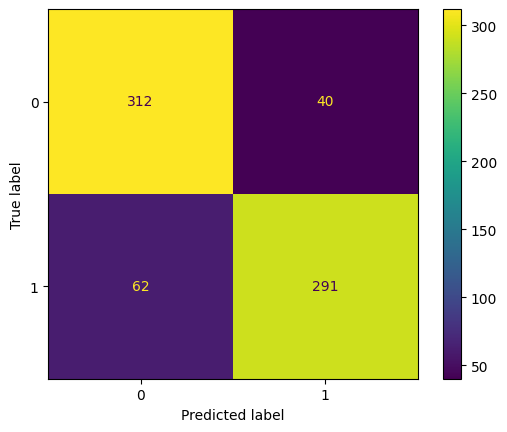

Processed model 6/7


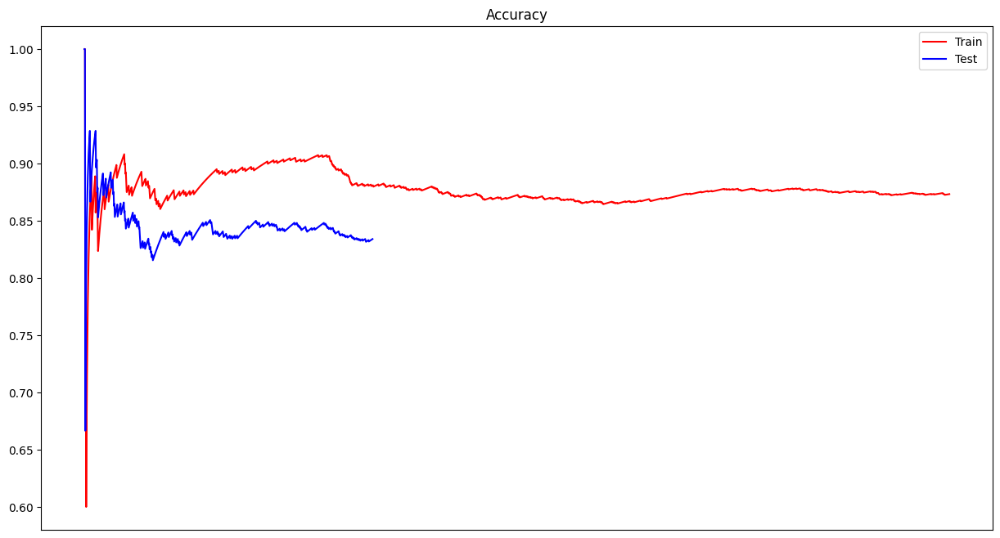

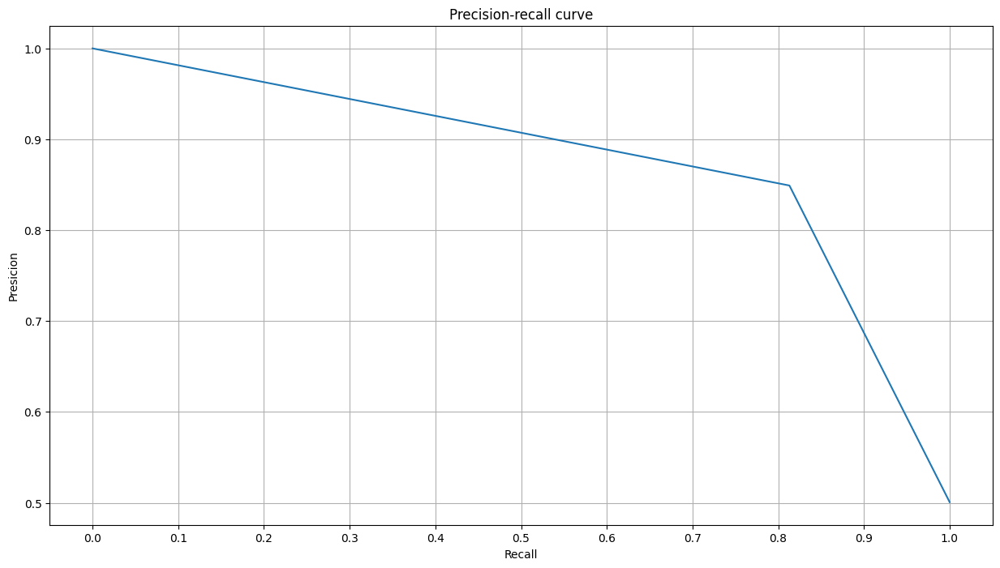

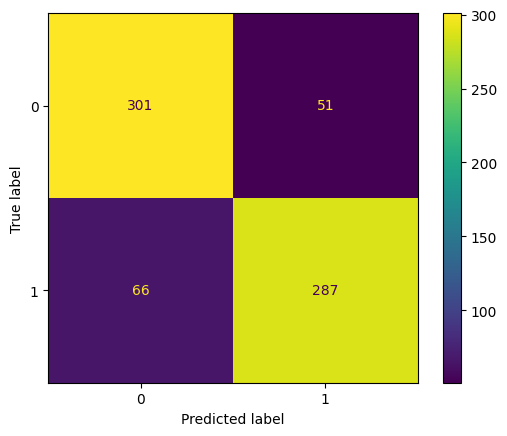

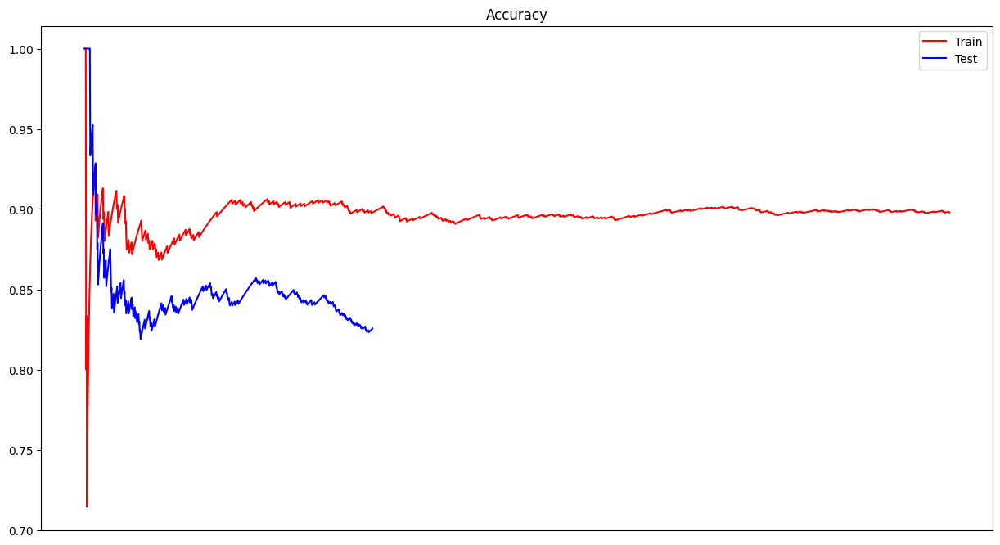

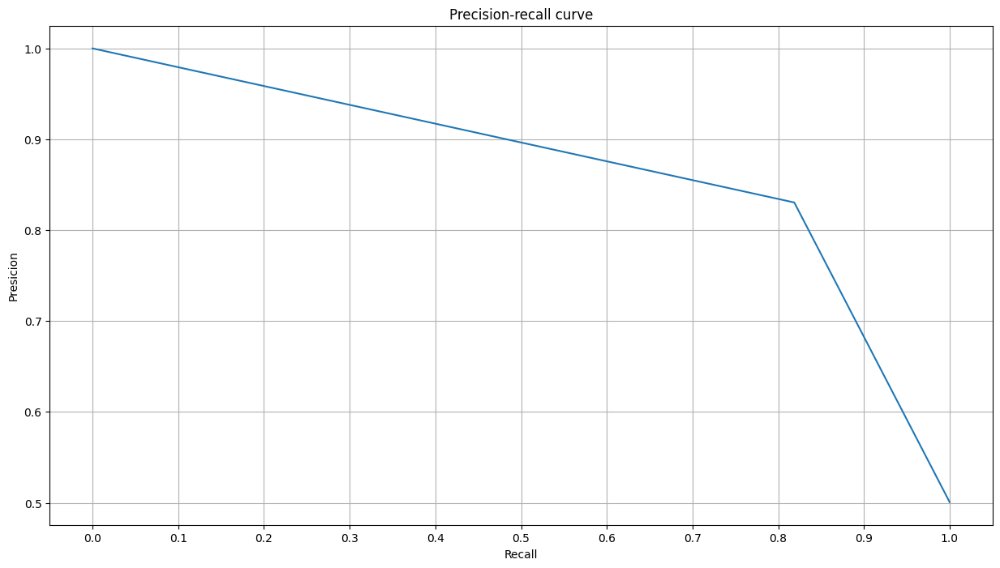

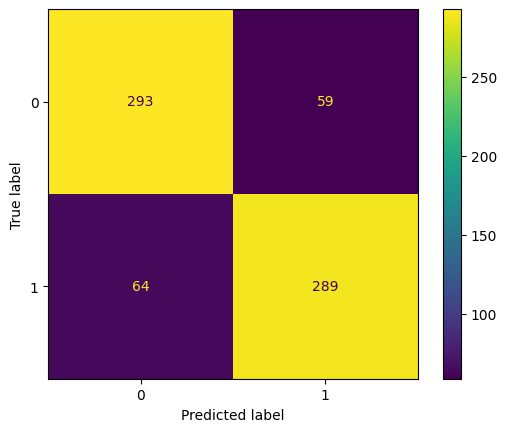

Processed model 7/7
Start processing carol_clair.csv


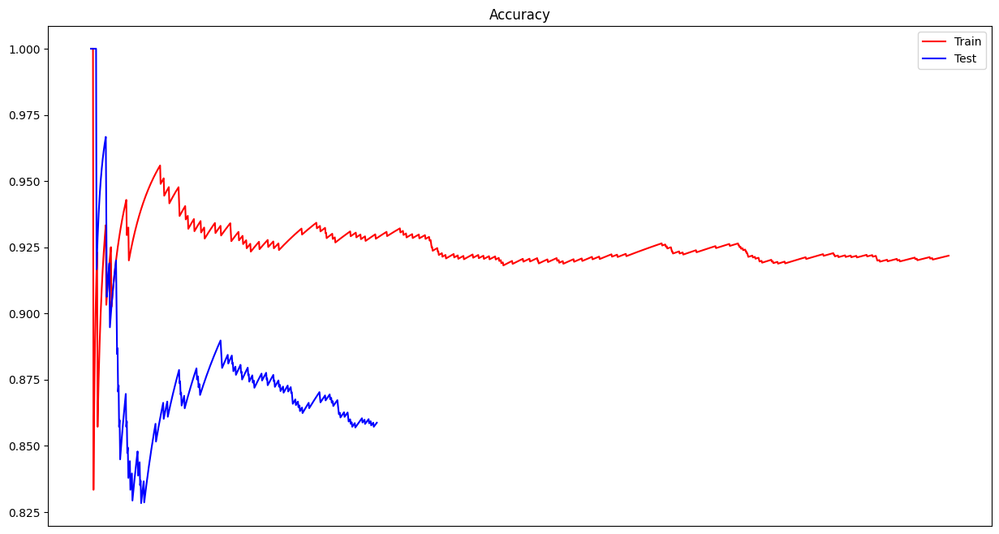

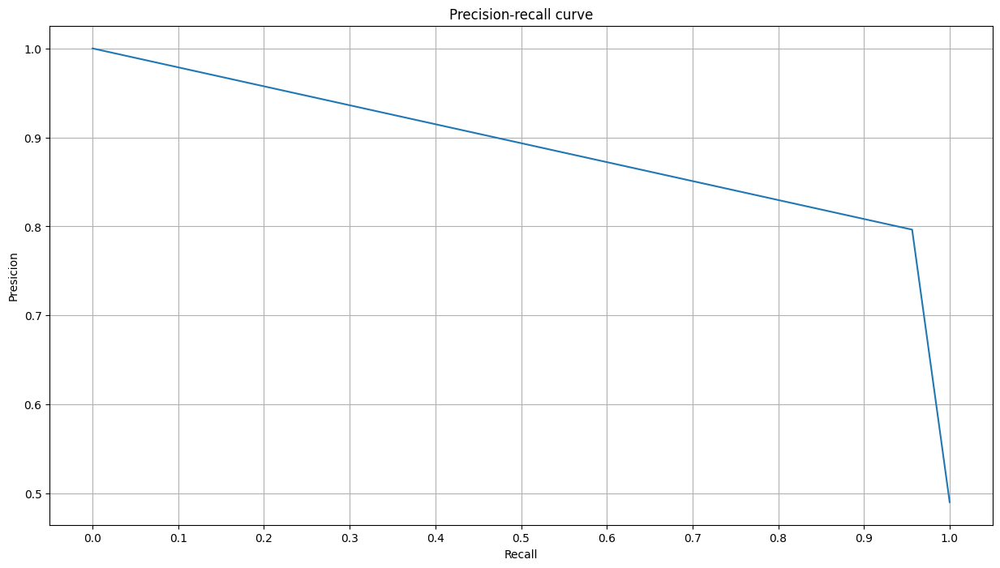

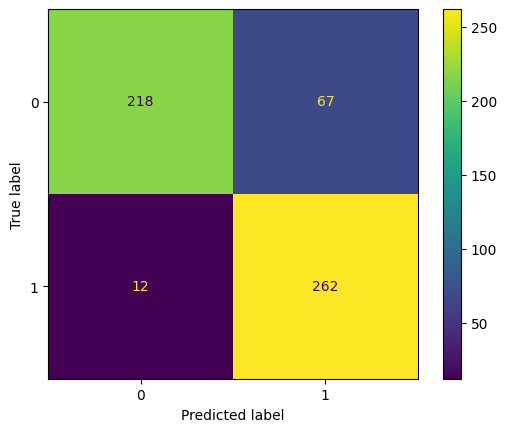

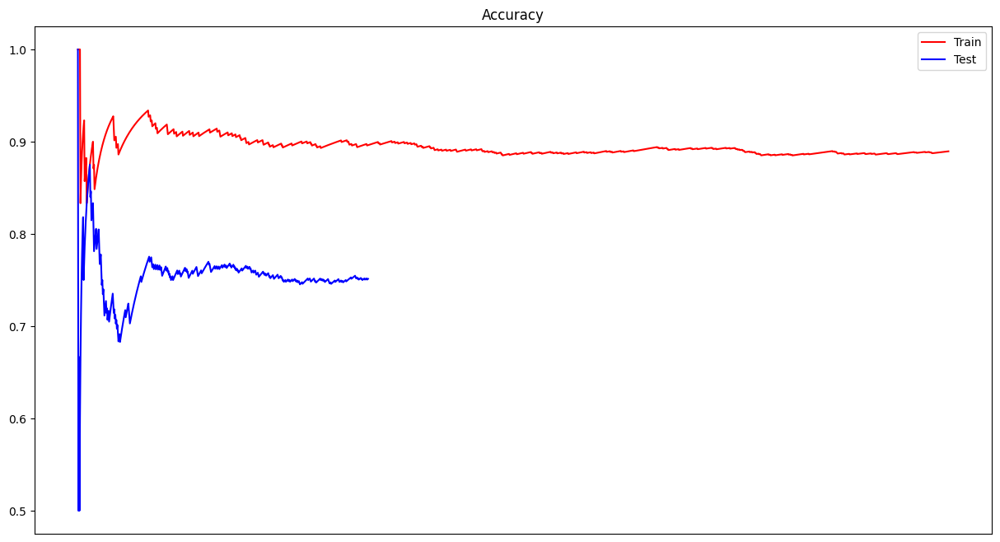

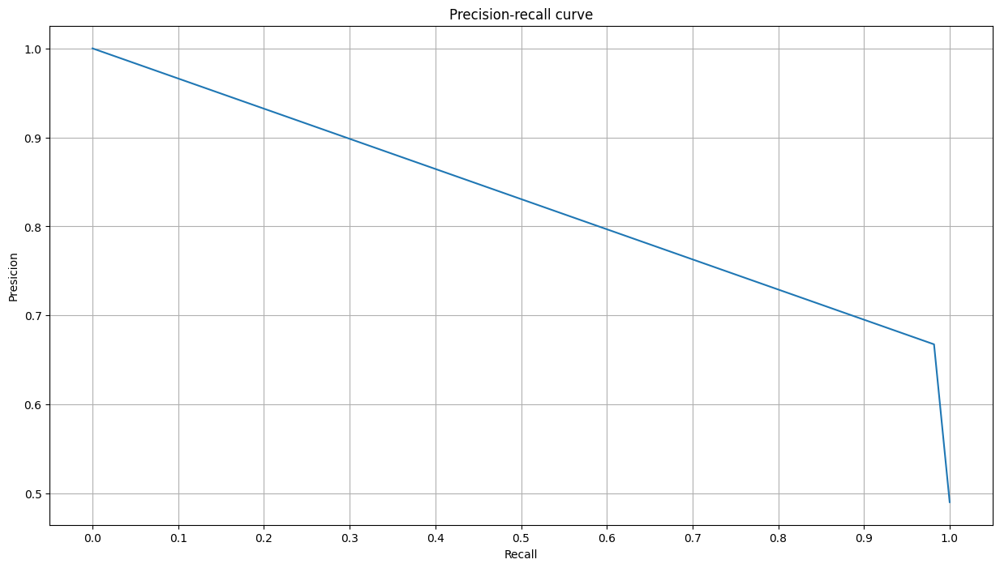

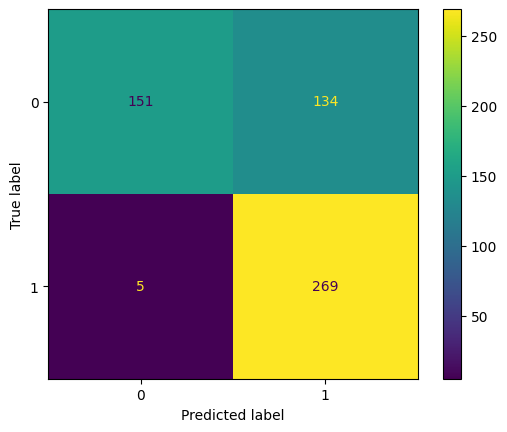

Processed model 1/7


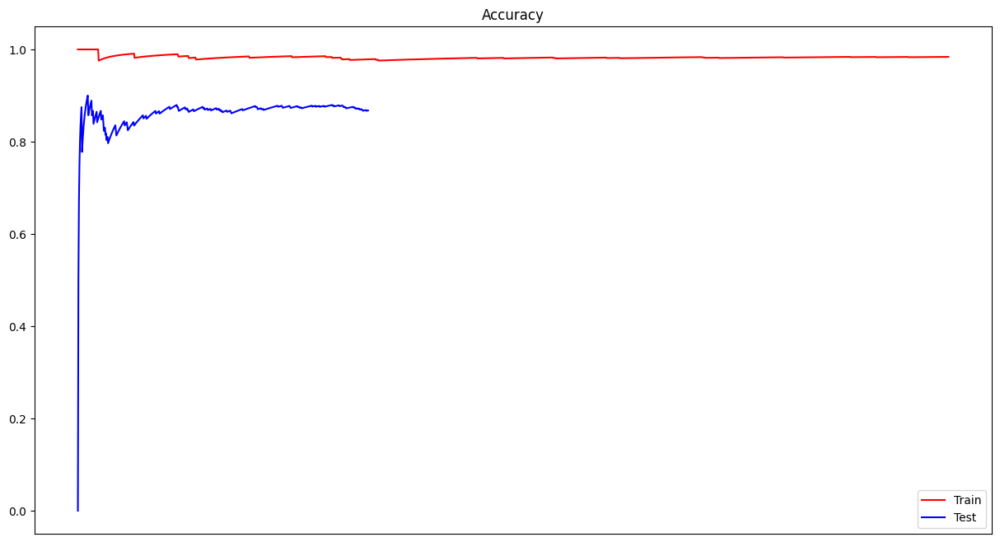

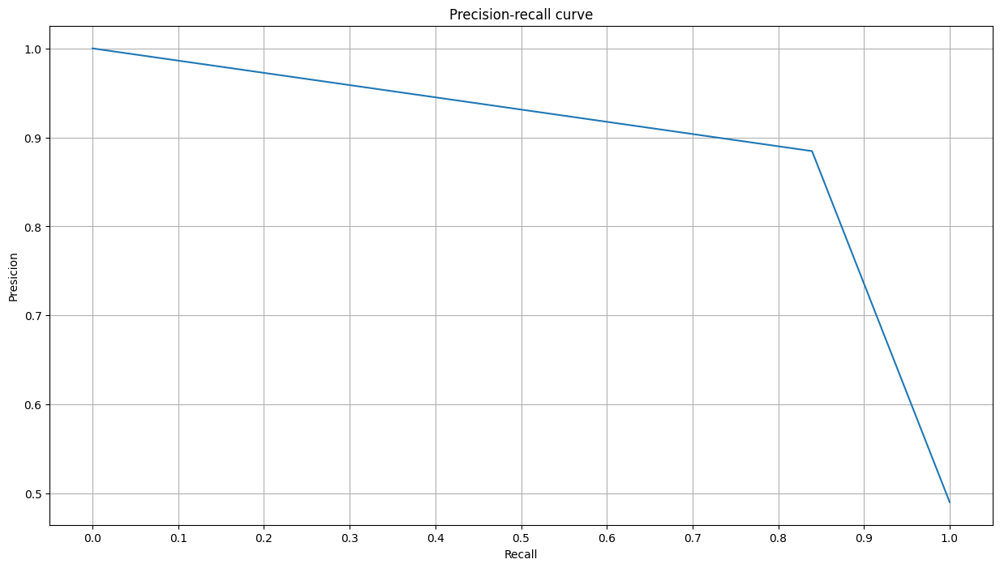

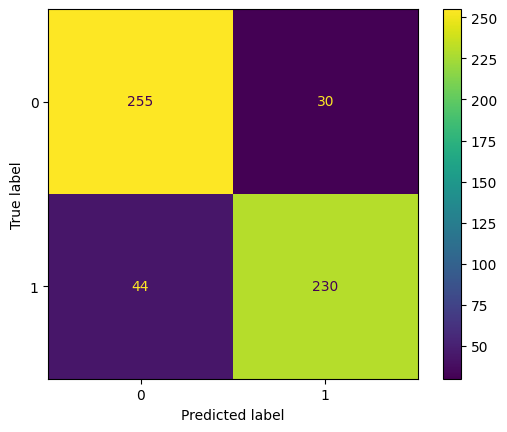

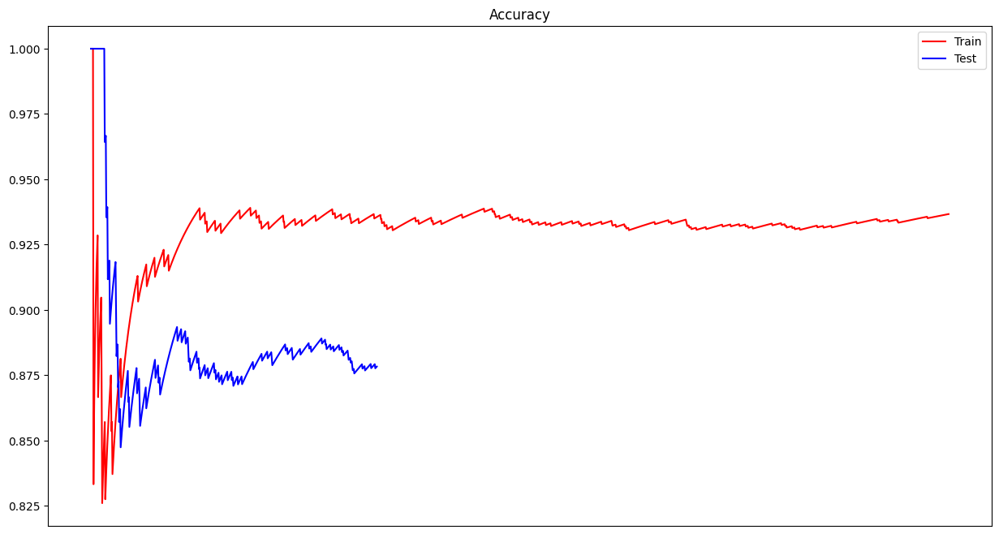

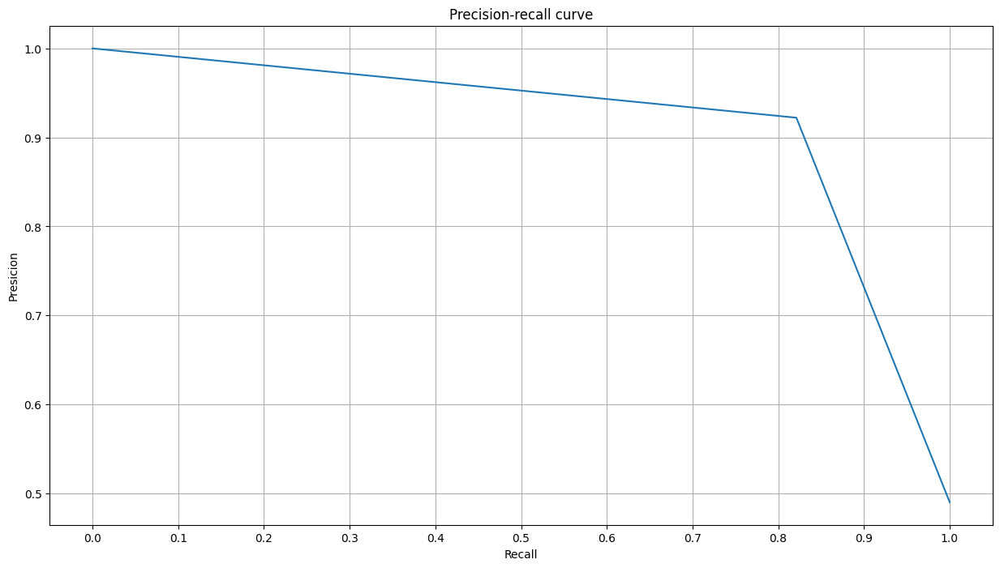

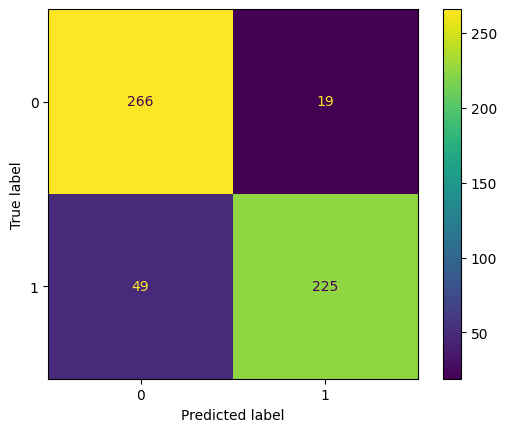

Processed model 2/7


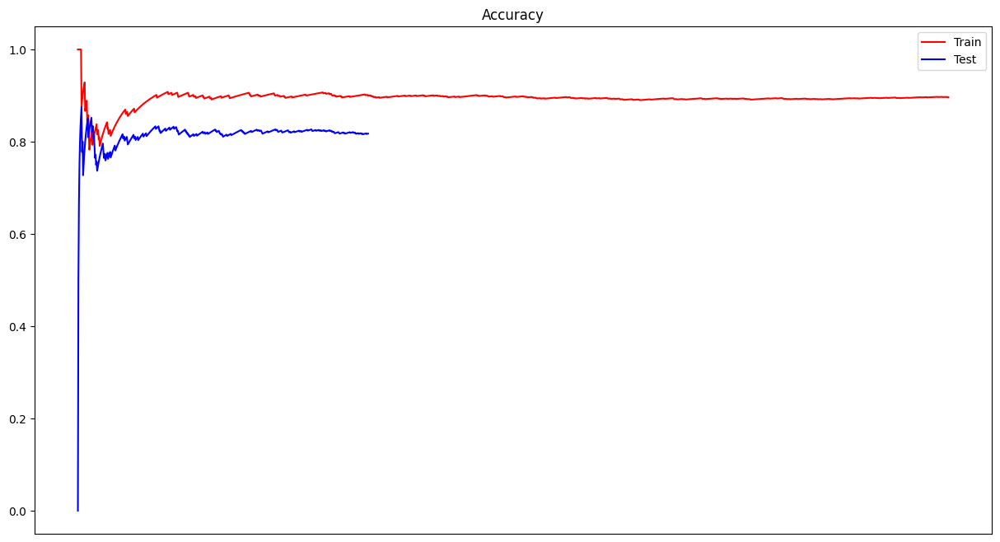

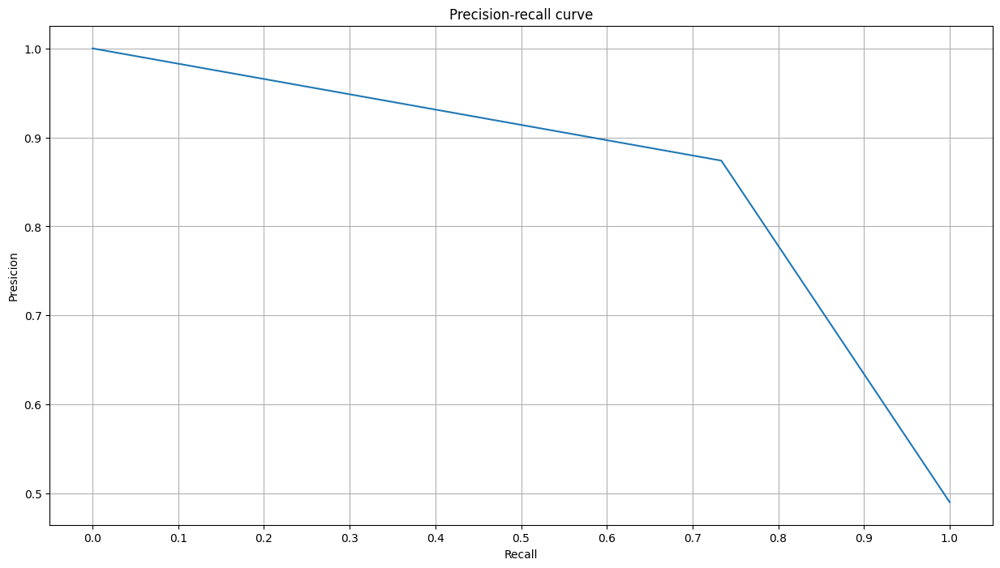

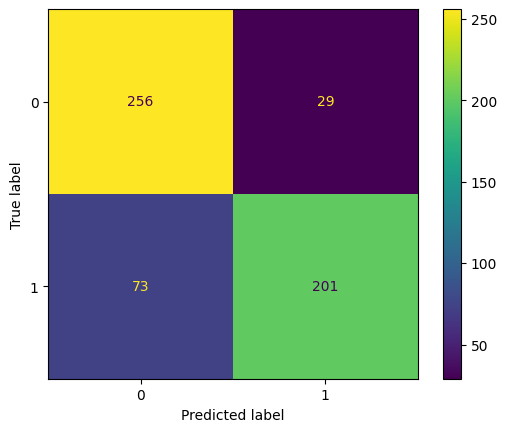

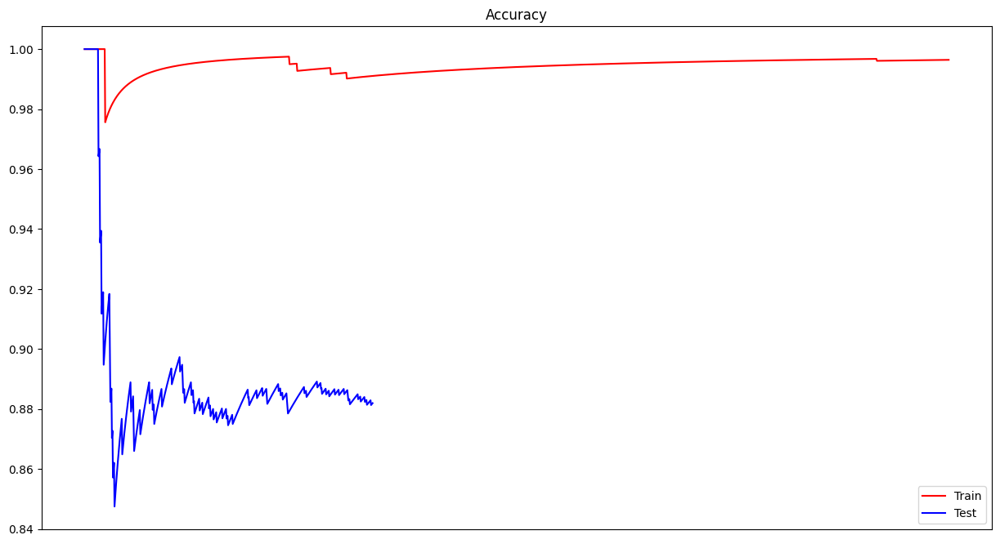

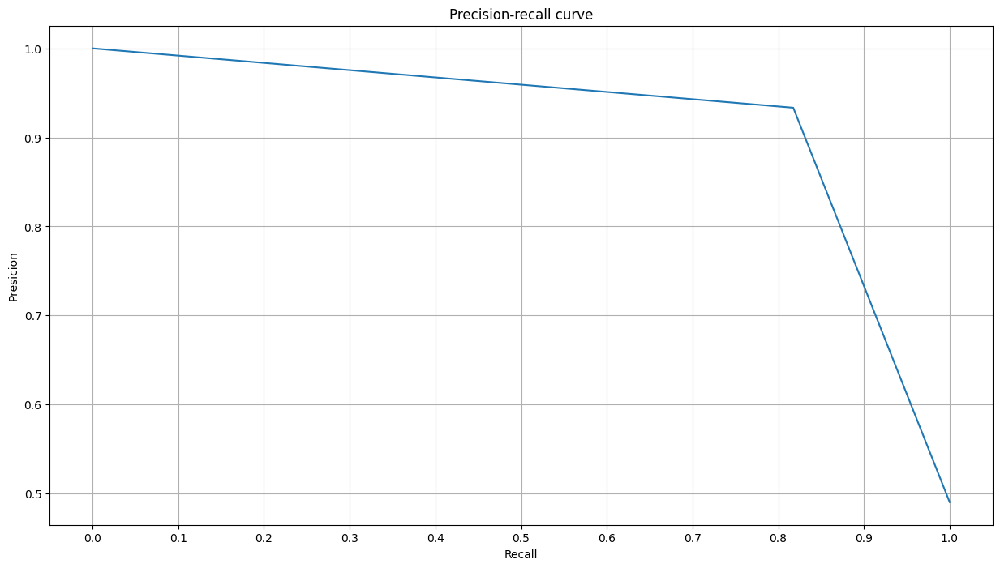

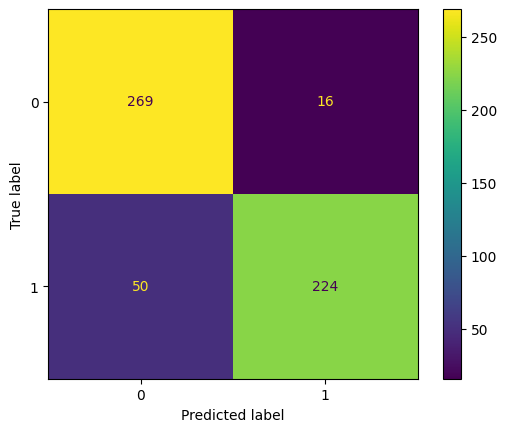

Processed model 3/7


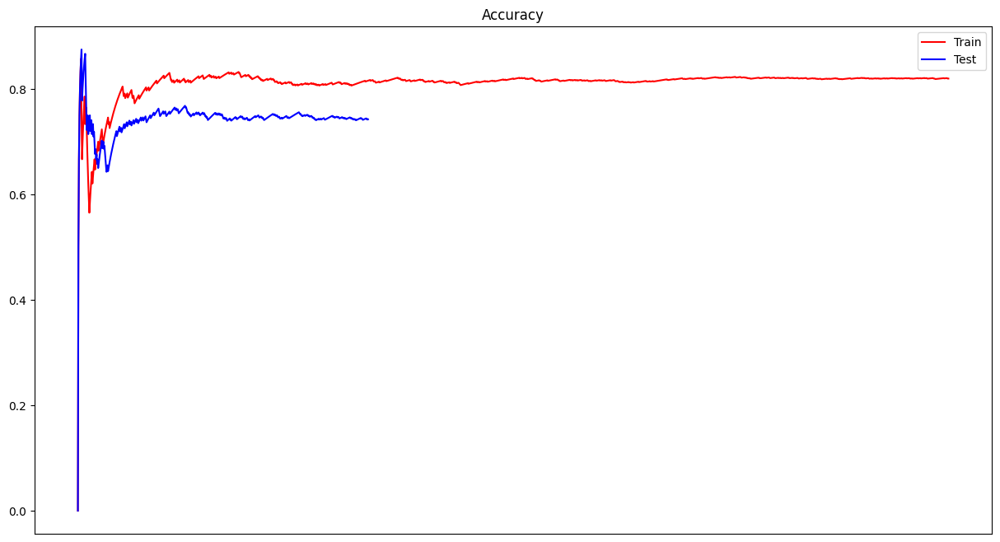

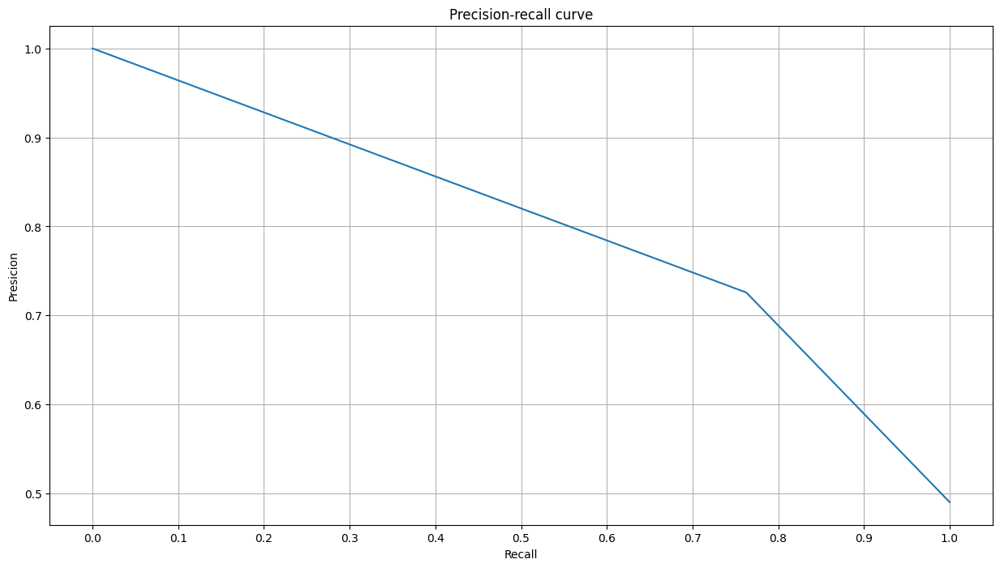

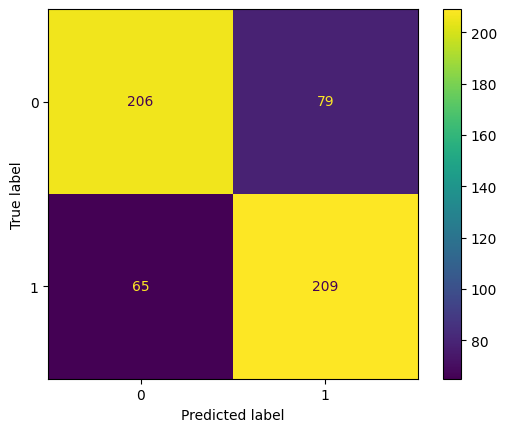

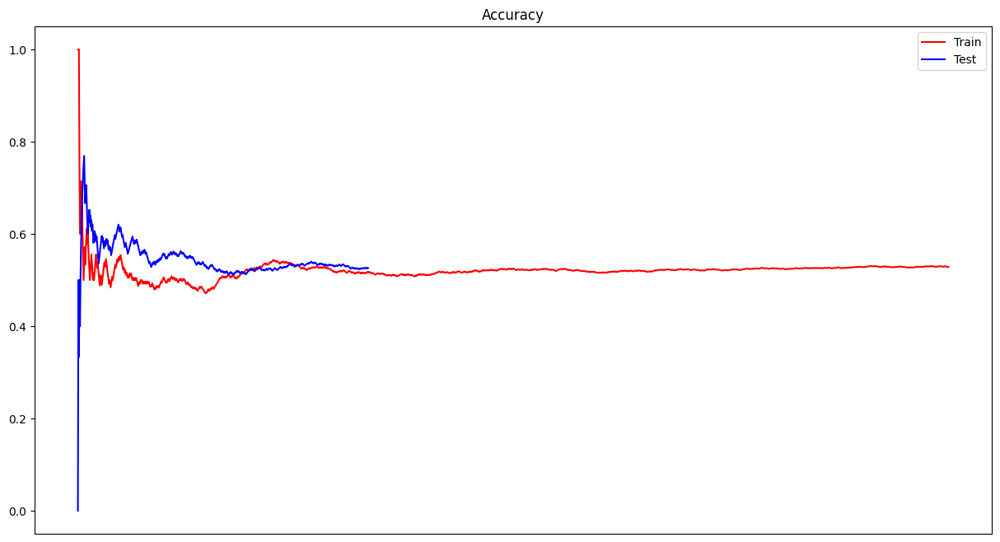

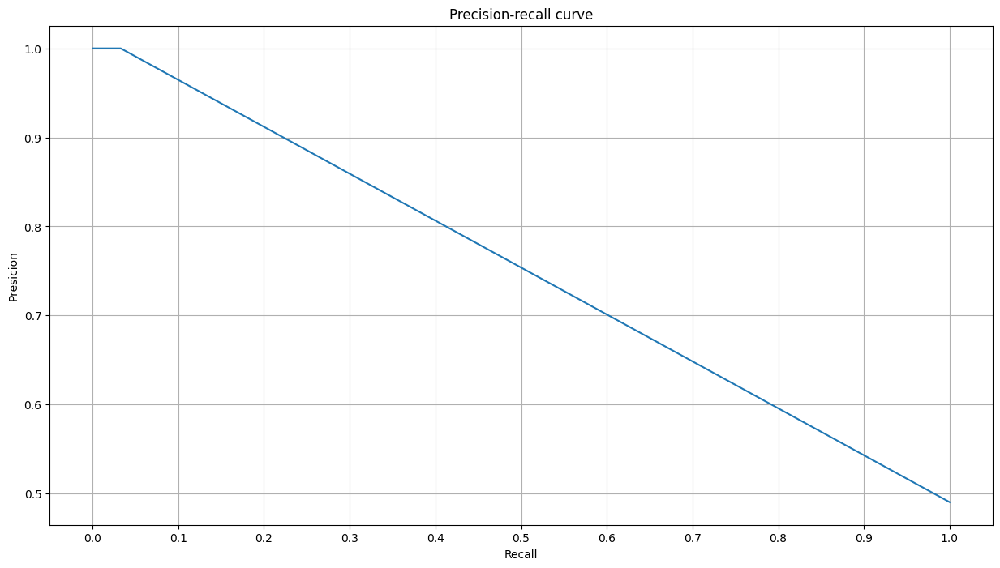

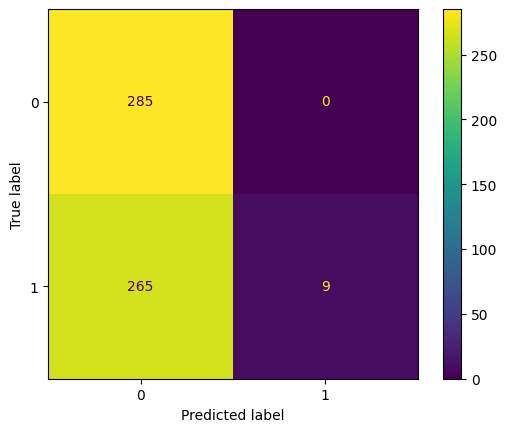

Processed model 4/7


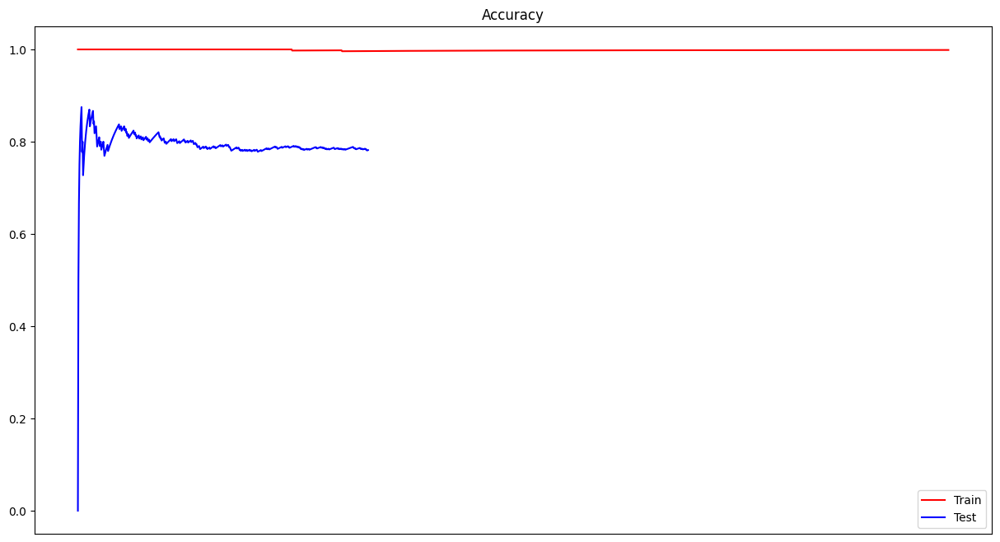

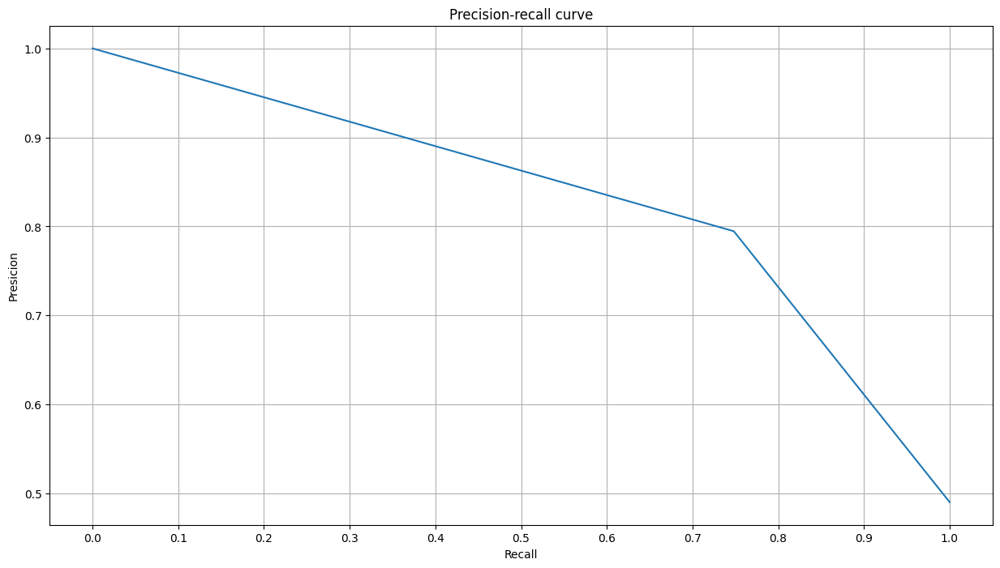

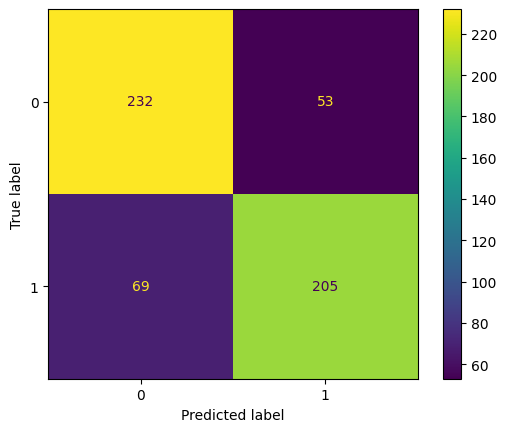

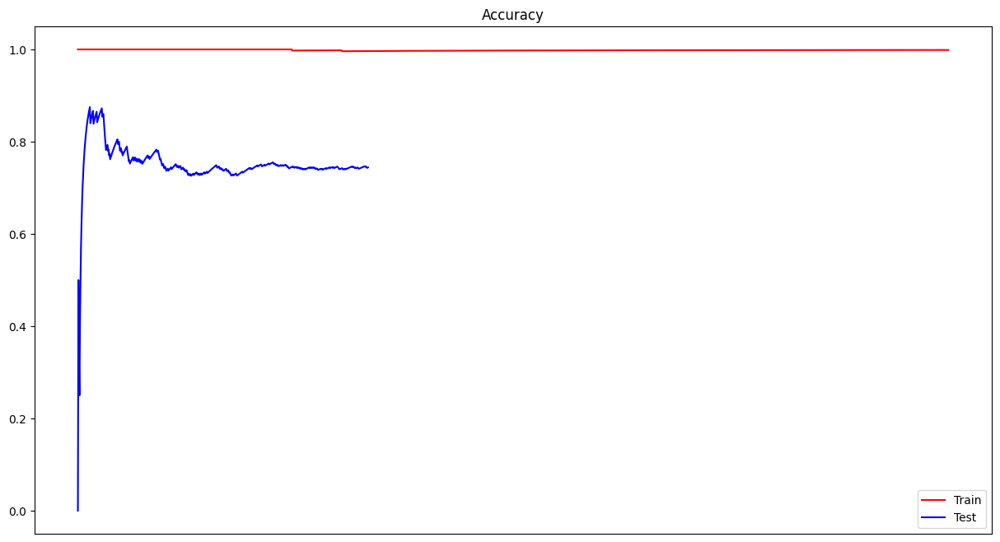

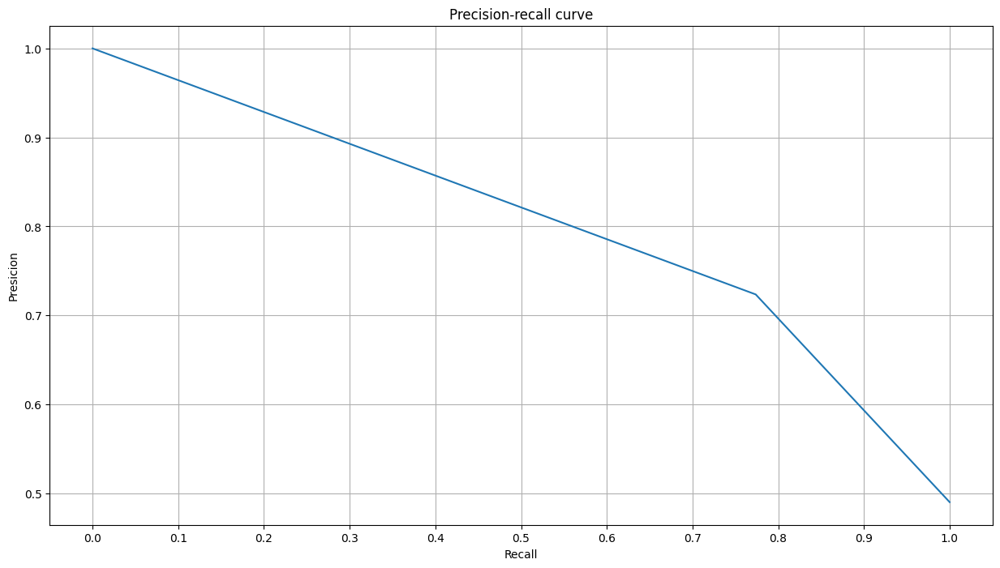

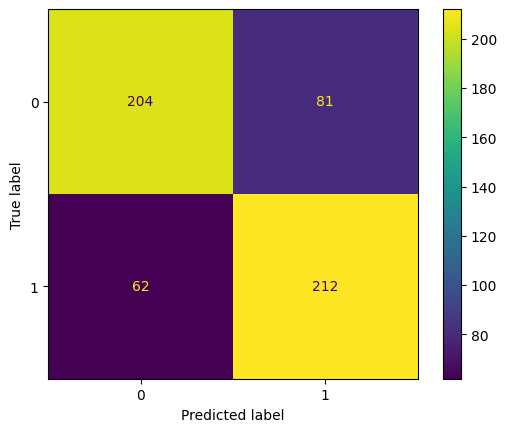

Processed model 5/7


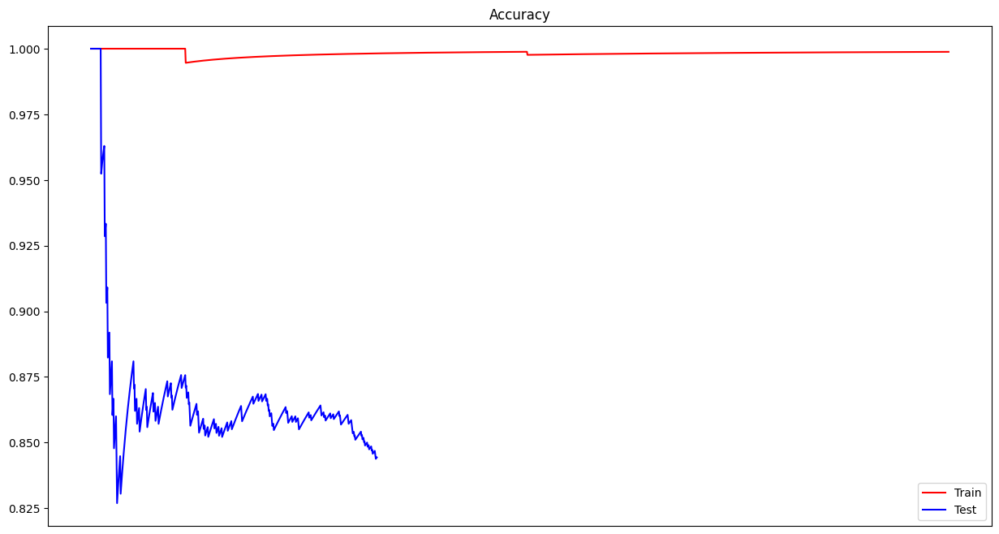

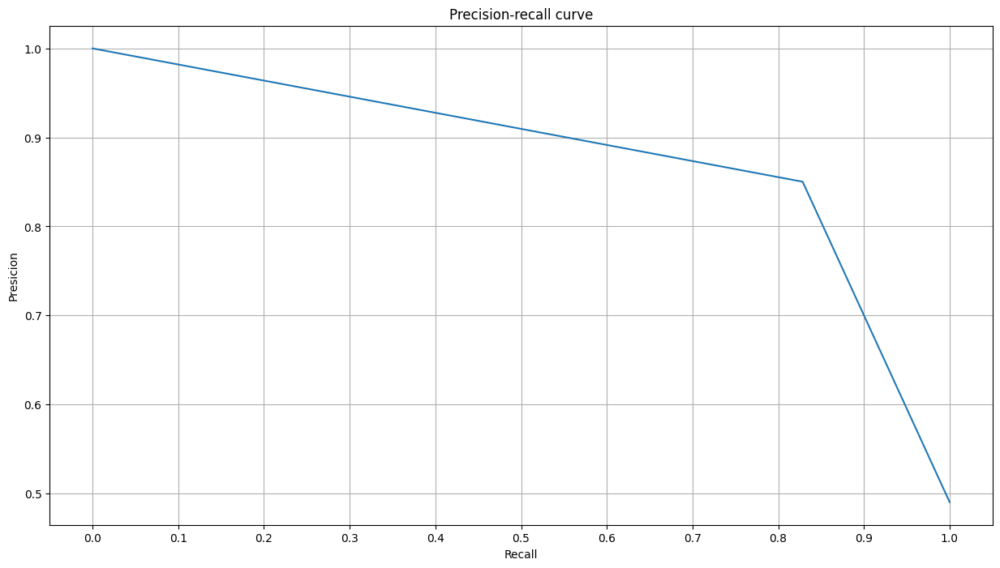

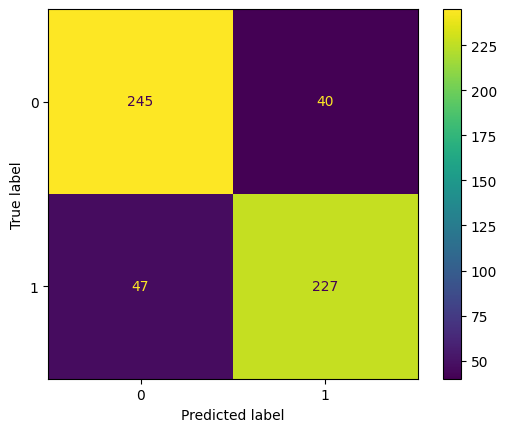

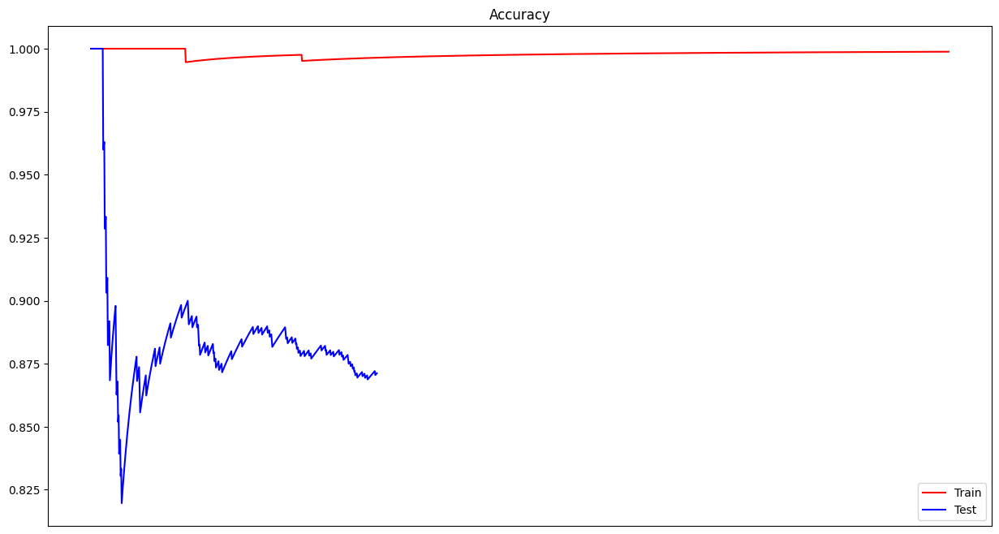

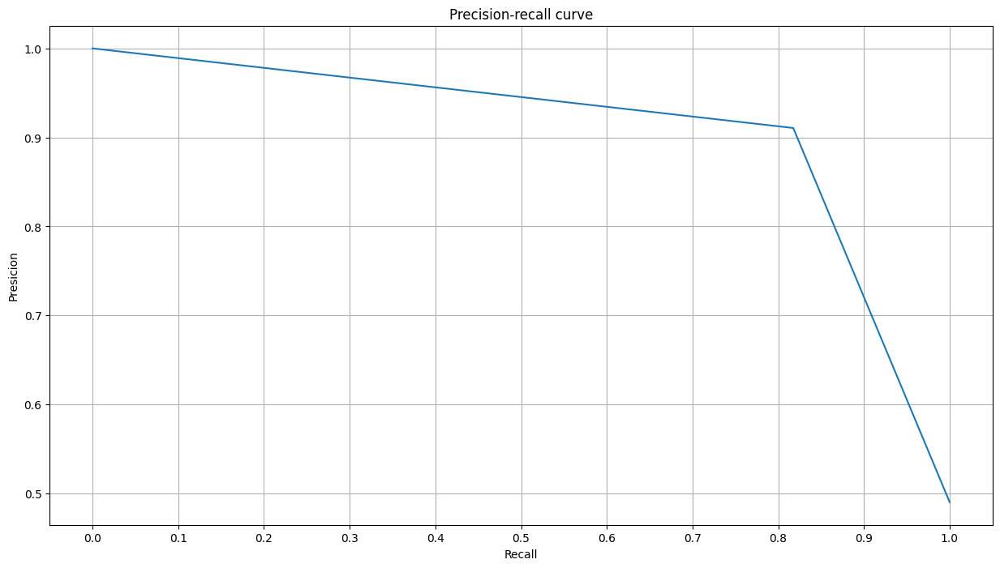

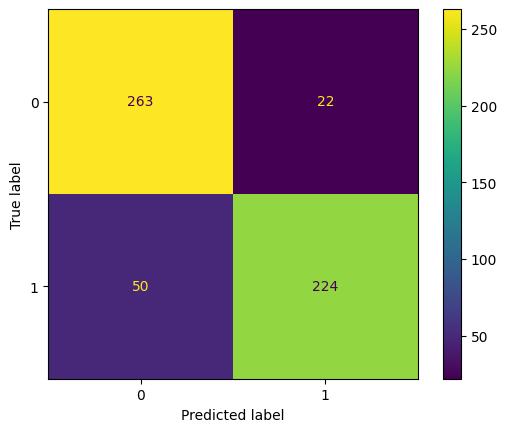

Processed model 6/7


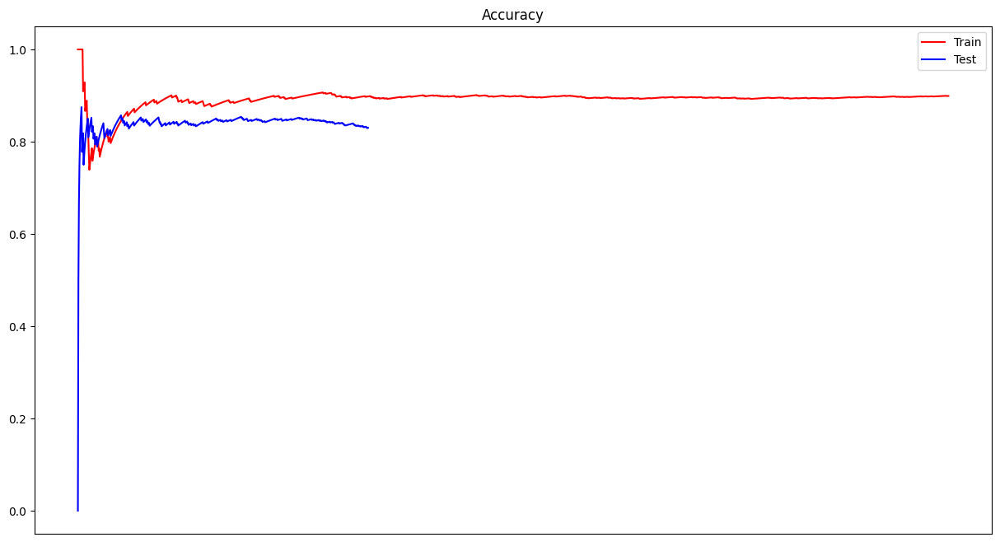

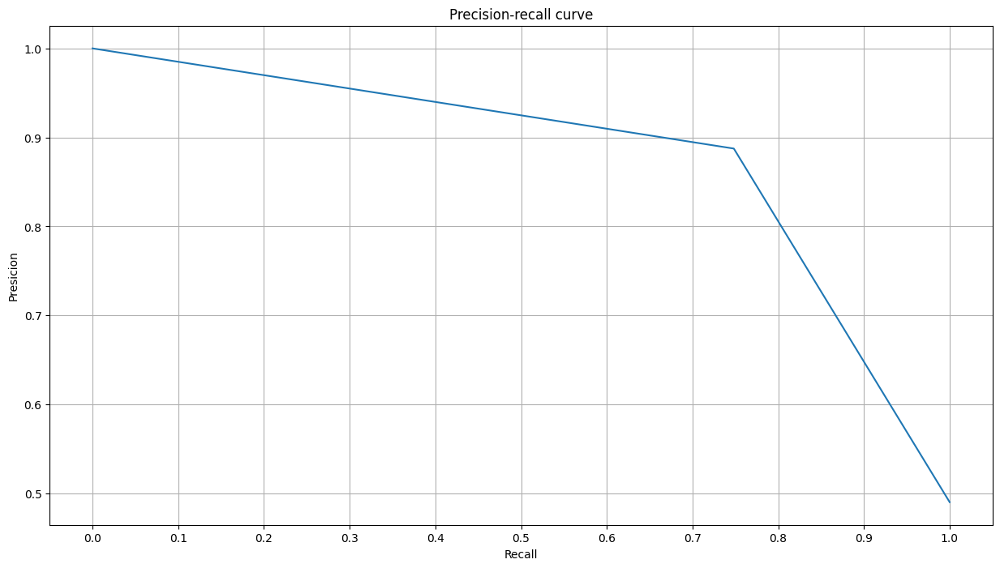

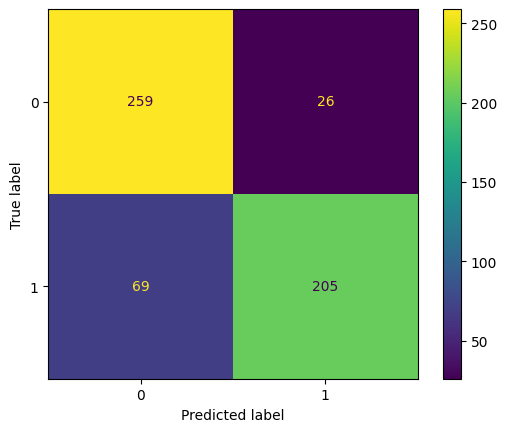

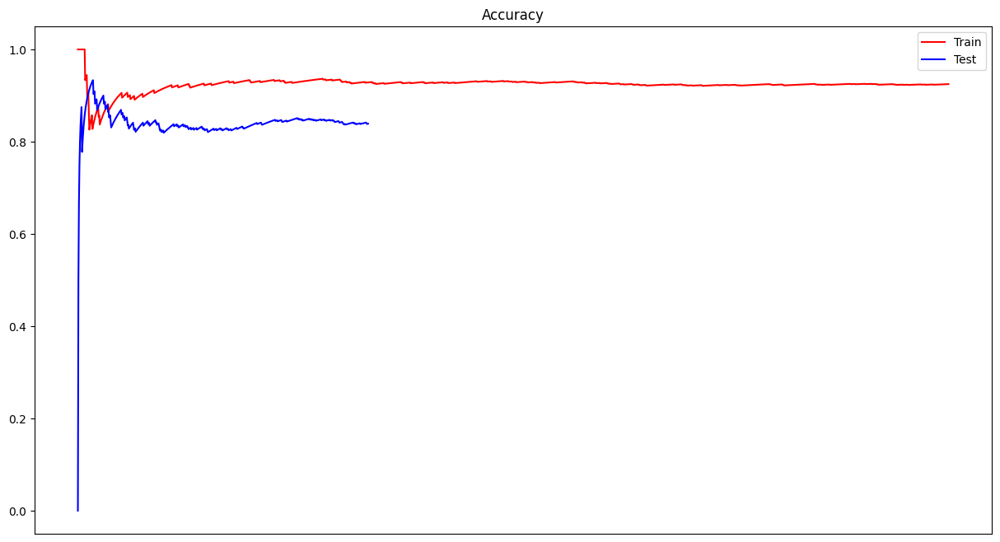

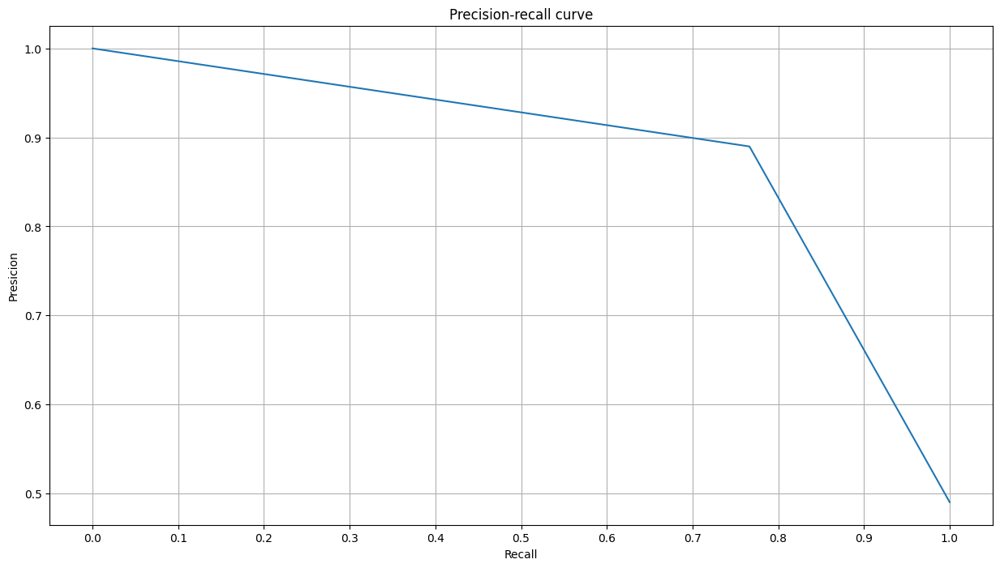

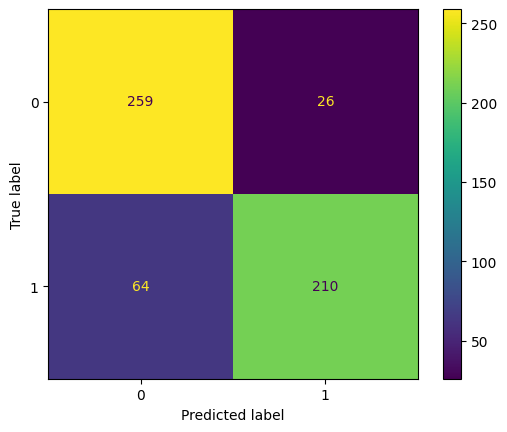

Processed model 7/7
Start processing michelle_cash.csv


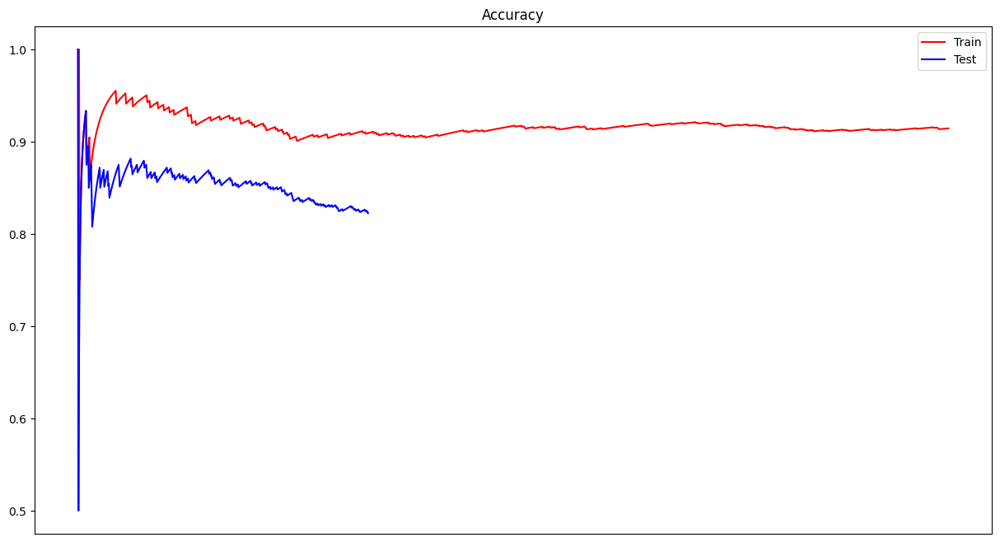

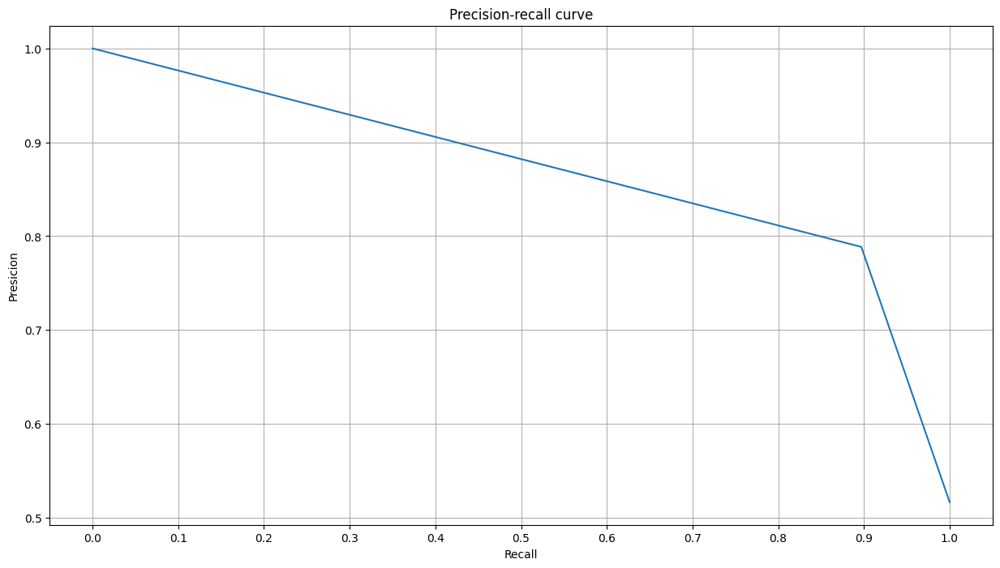

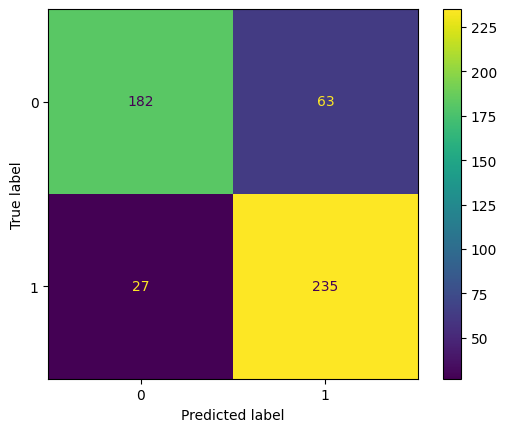

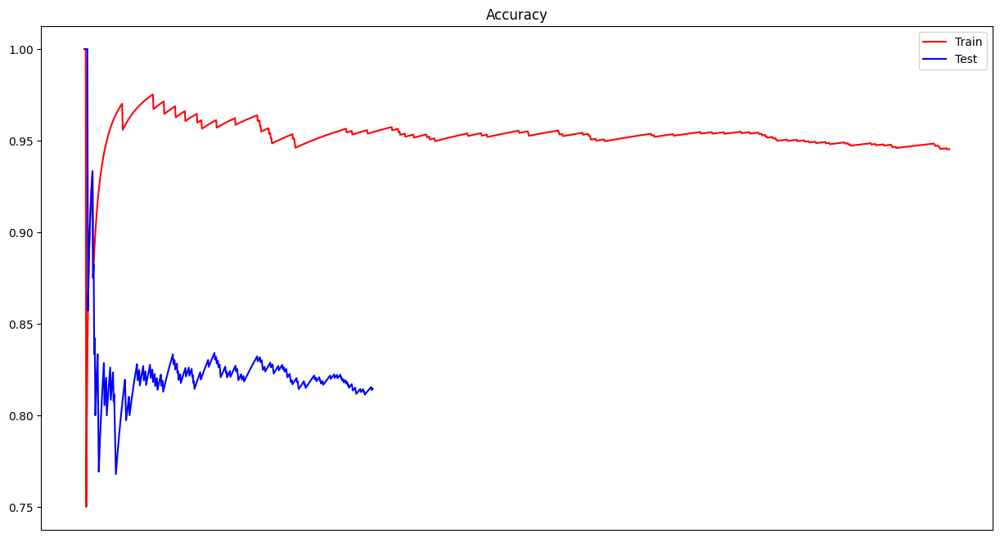

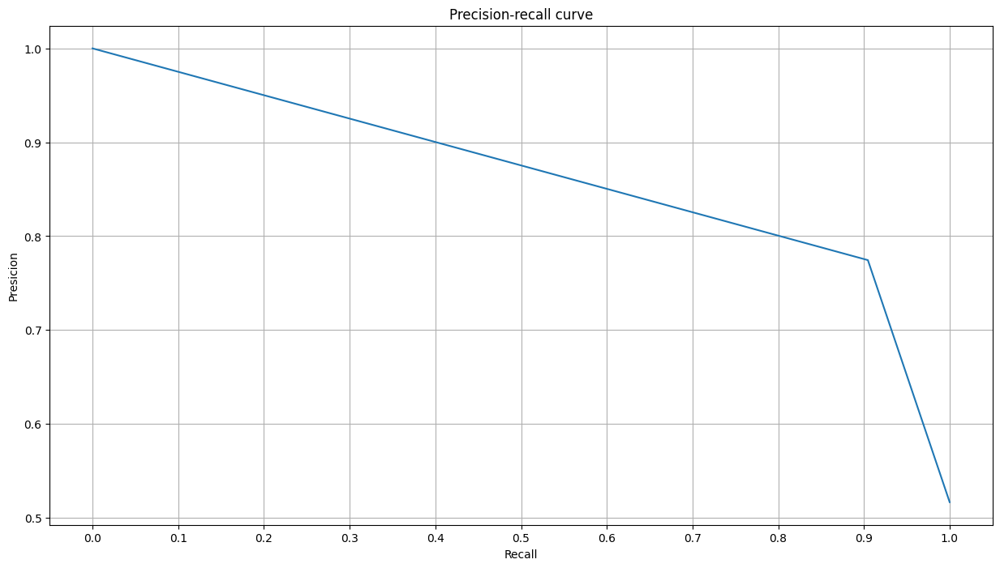

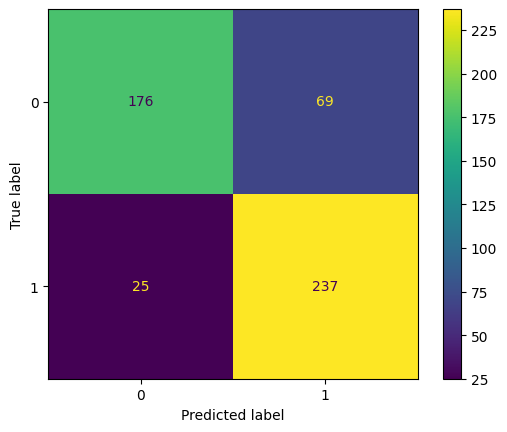

Processed model 1/7


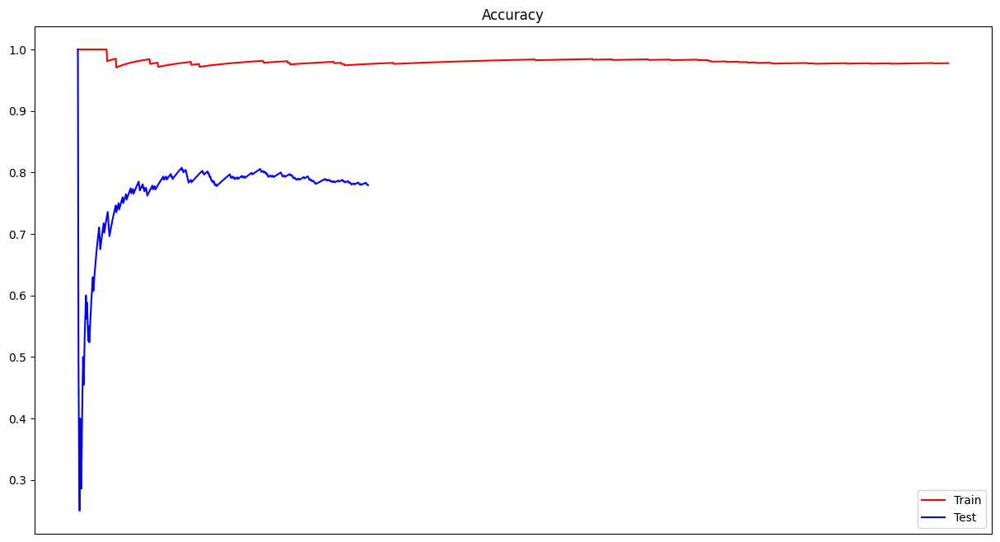

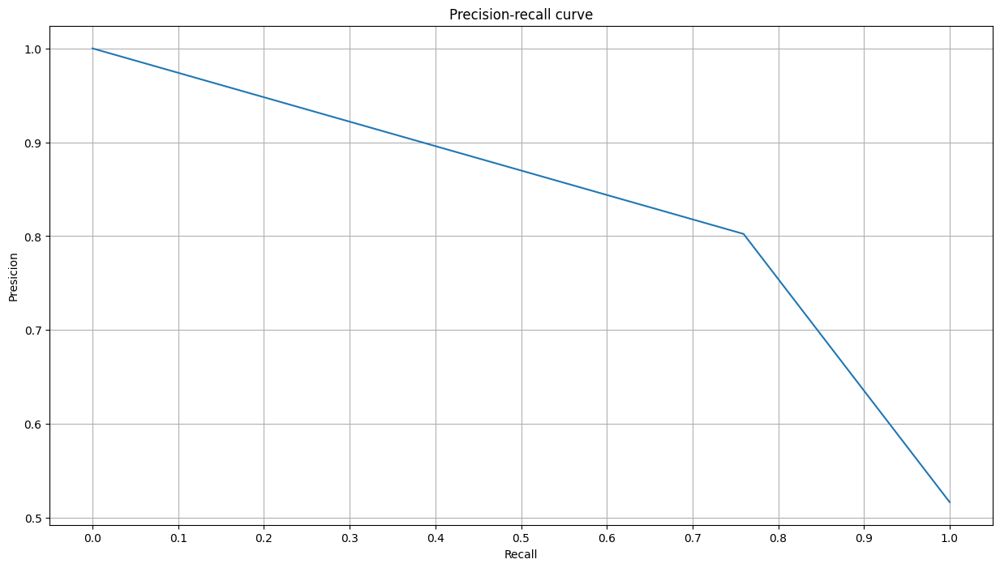

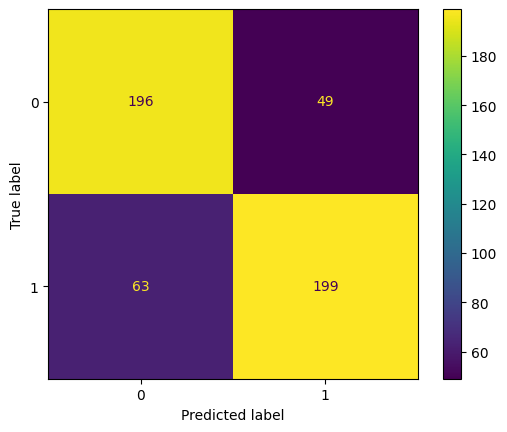

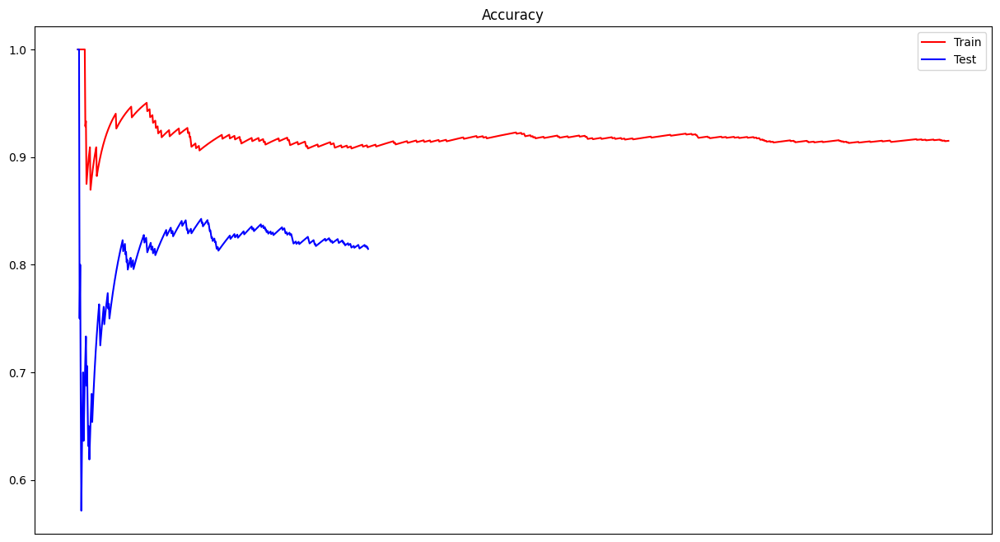

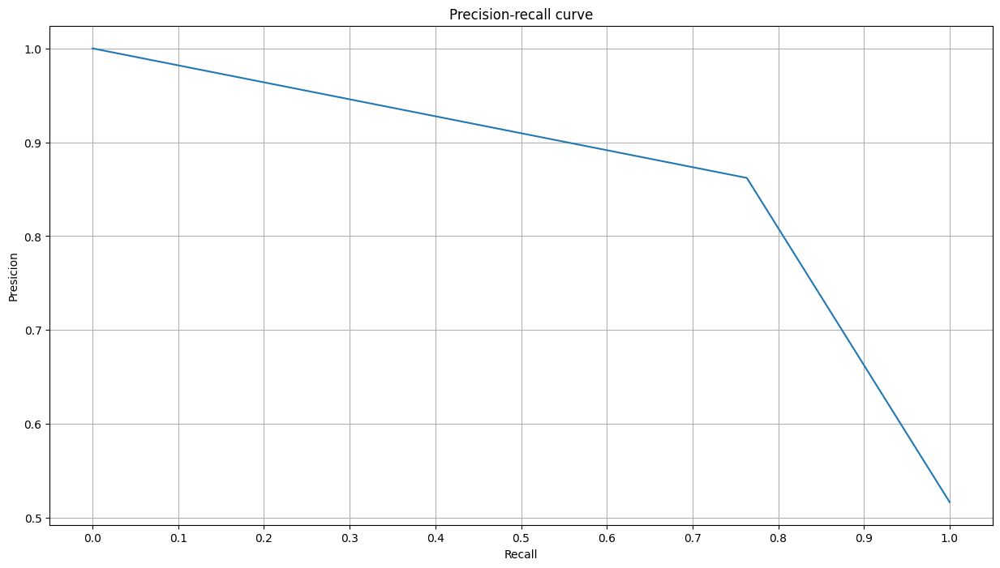

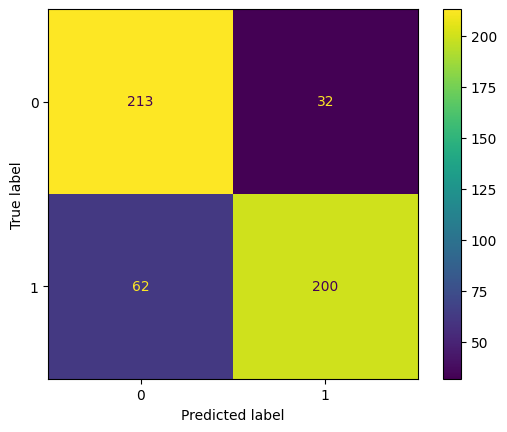

Processed model 2/7


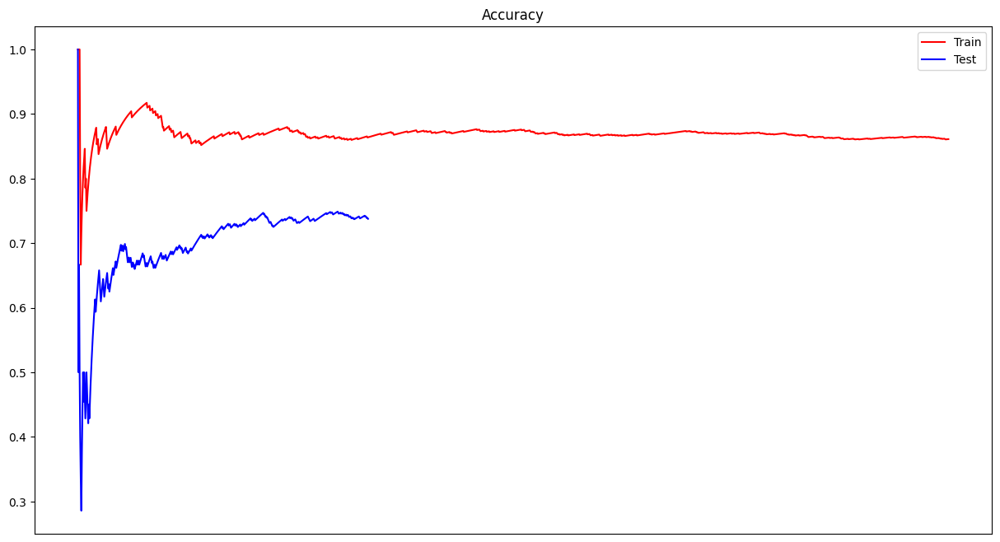

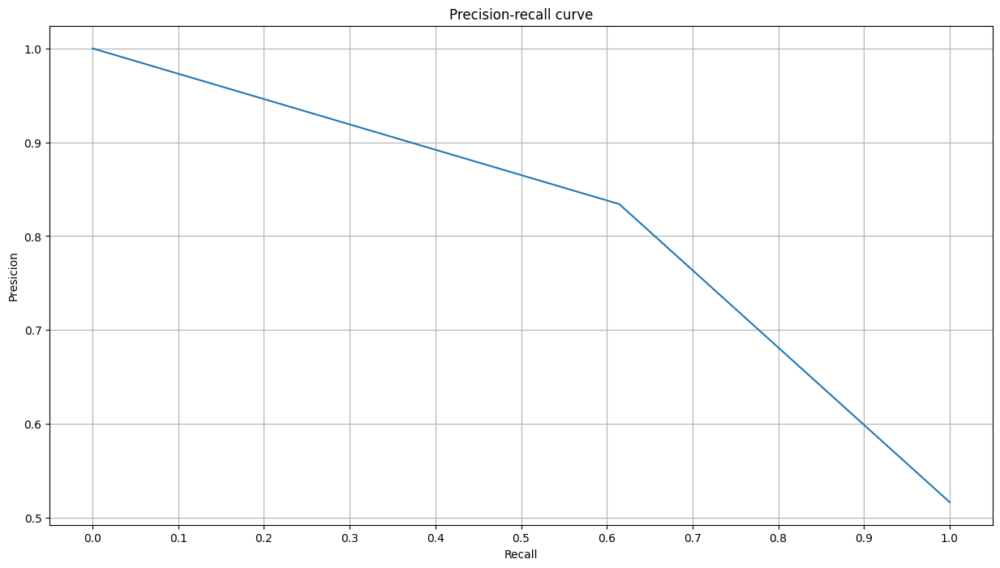

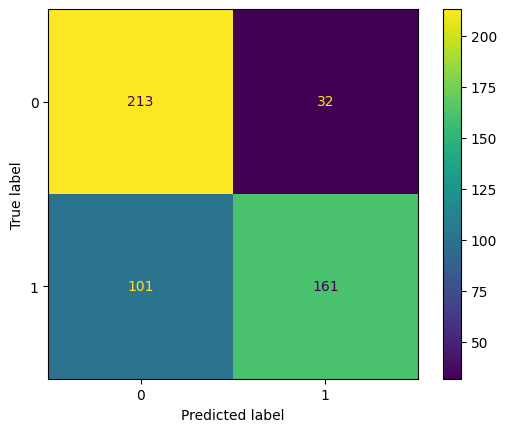

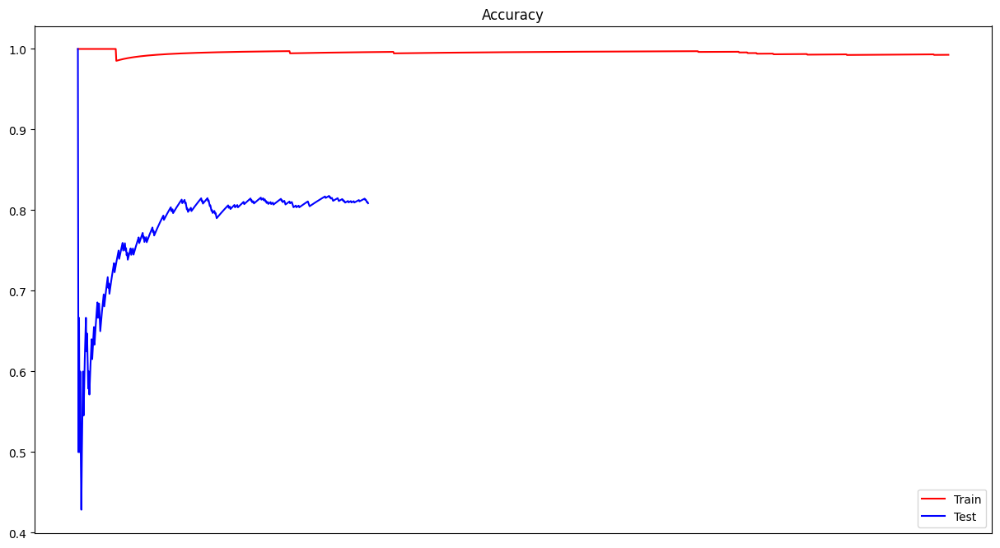

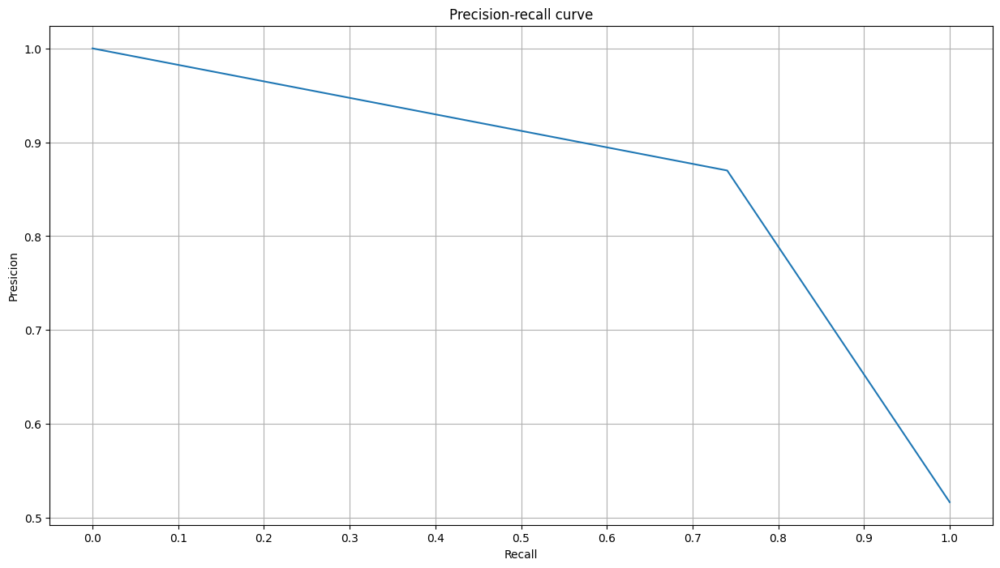

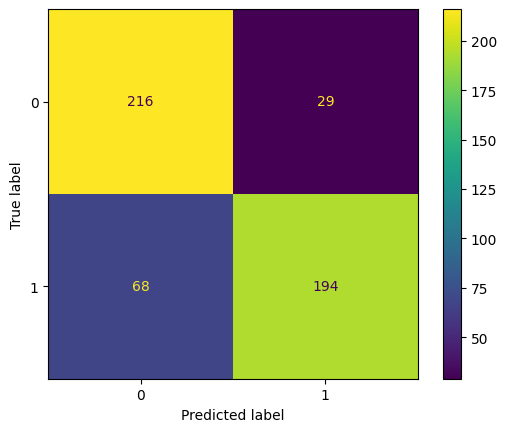

Processed model 3/7


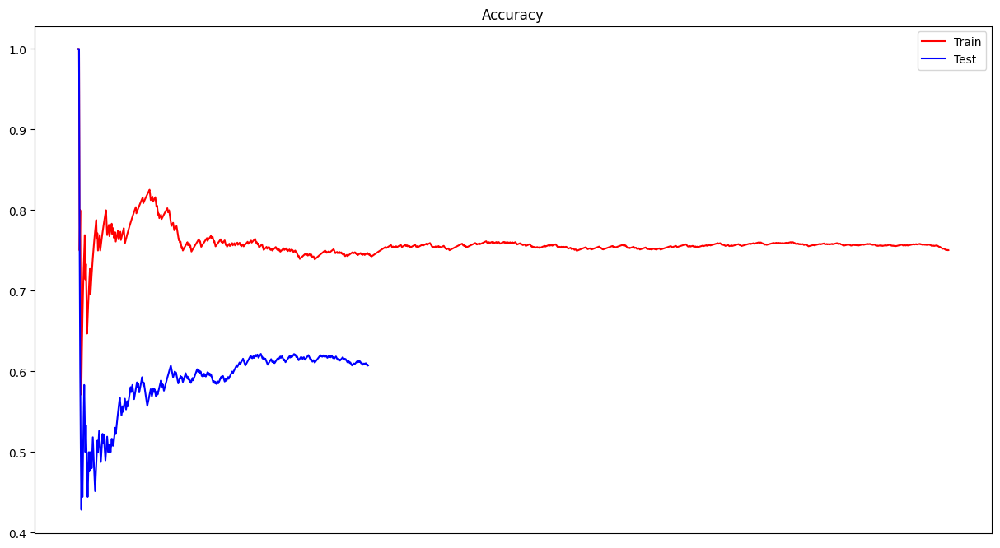

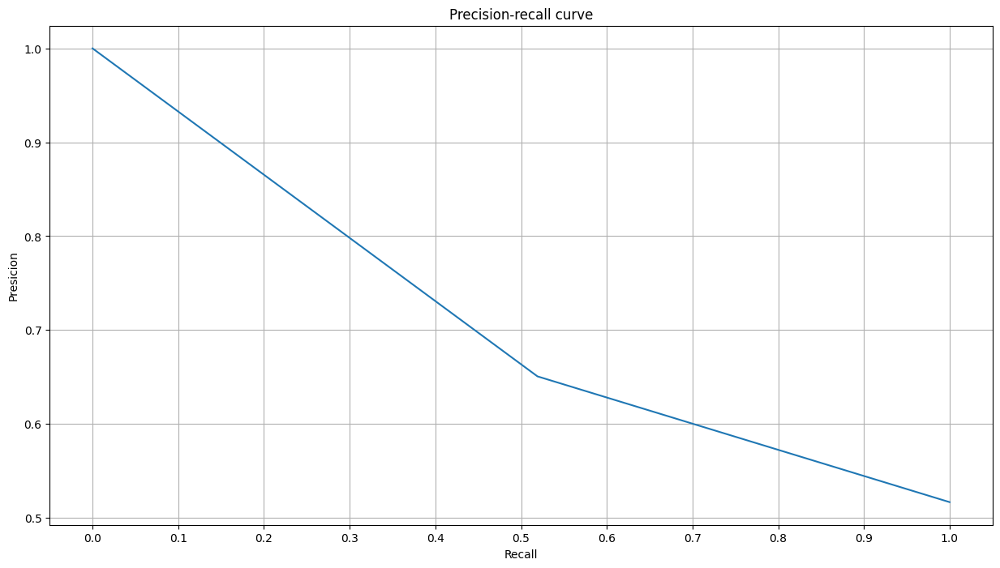

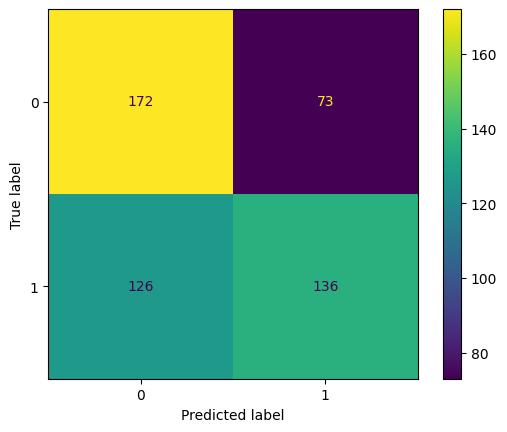

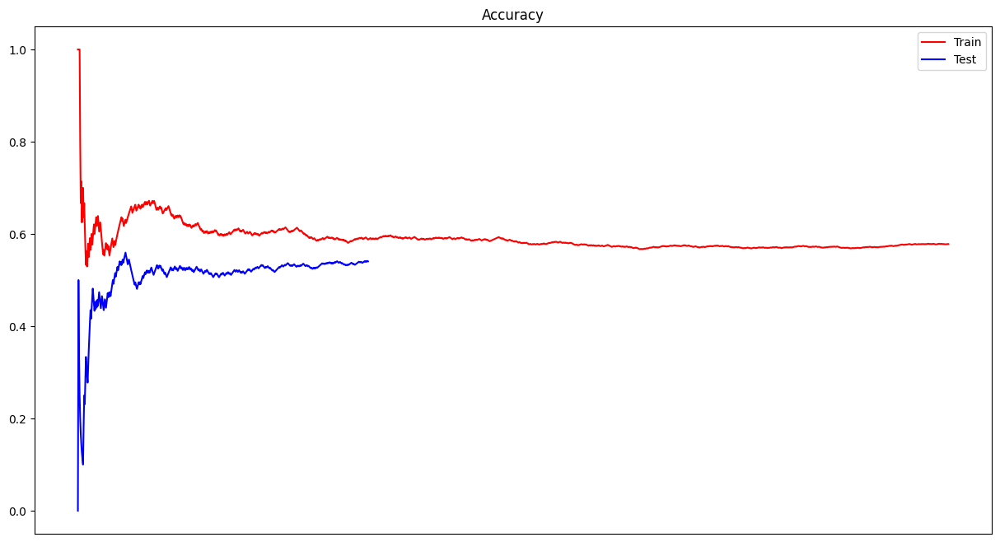

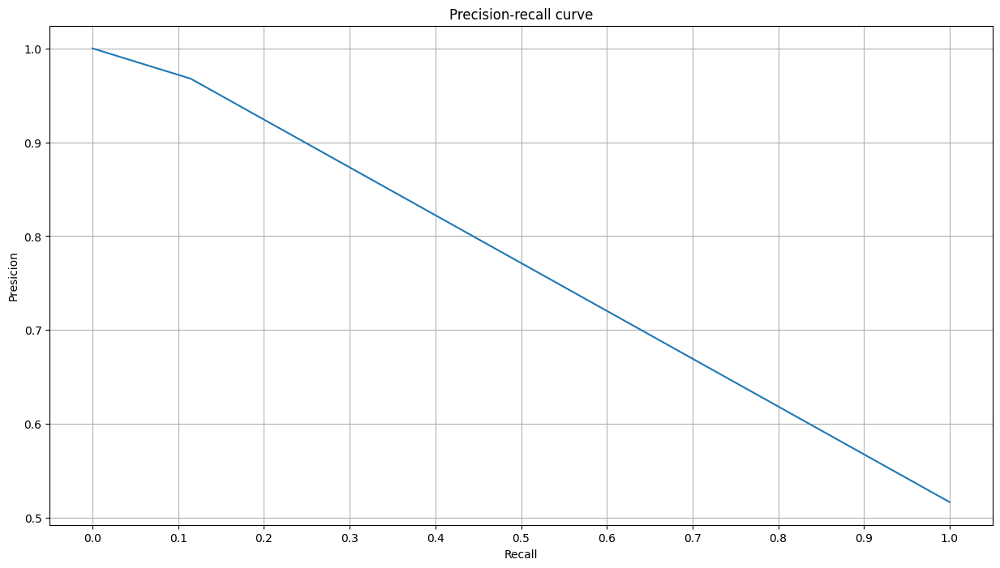

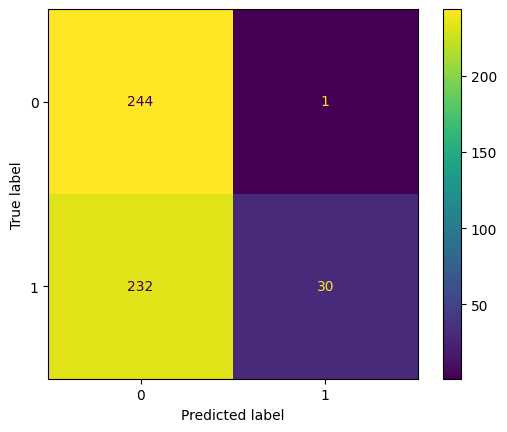

Processed model 4/7


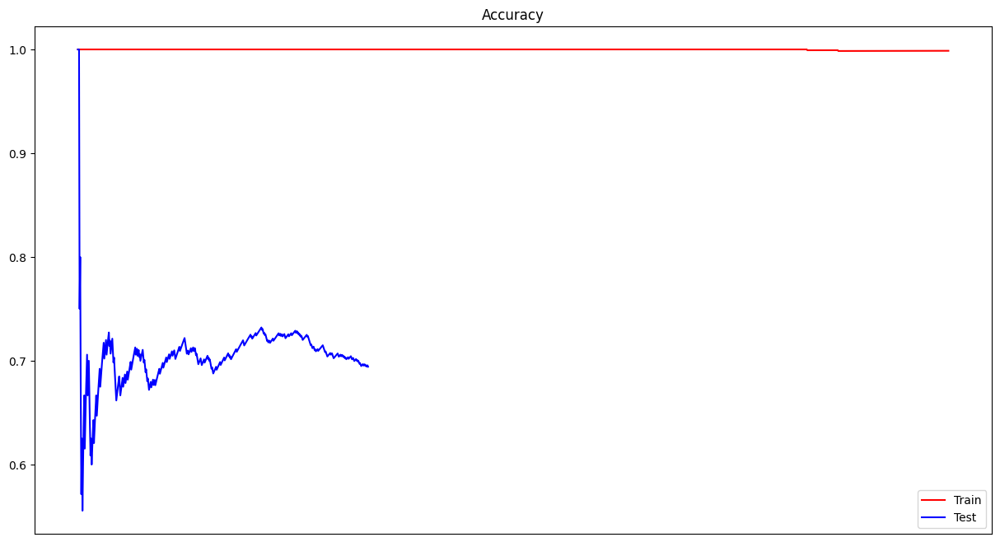

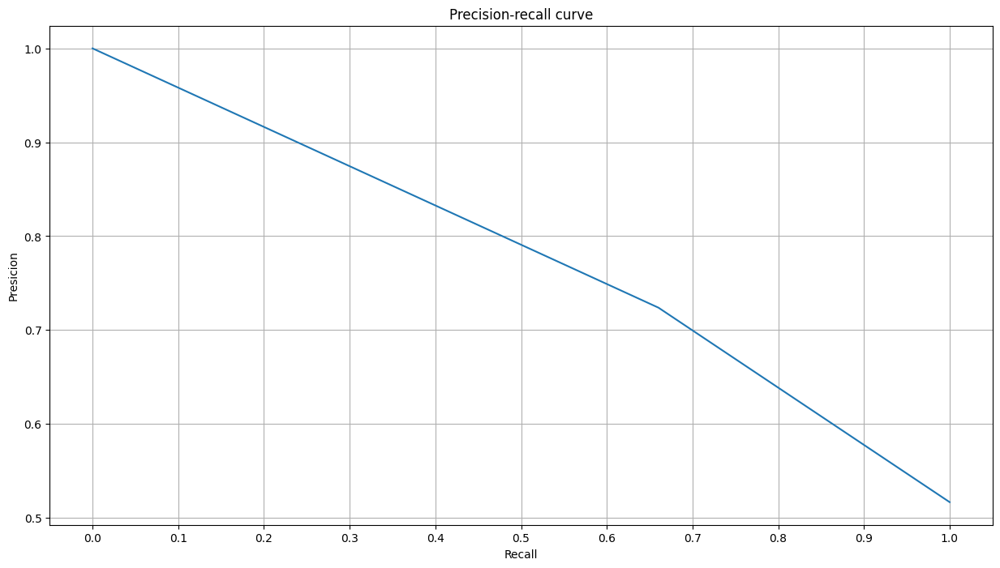

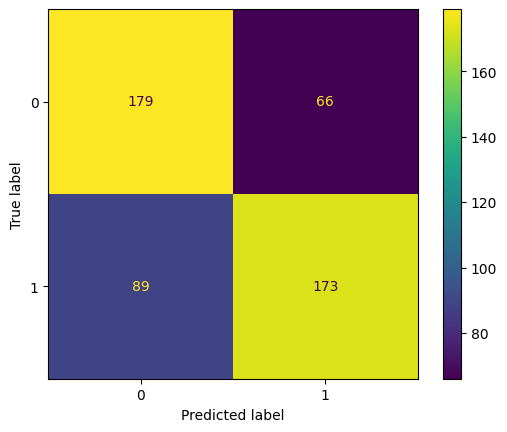

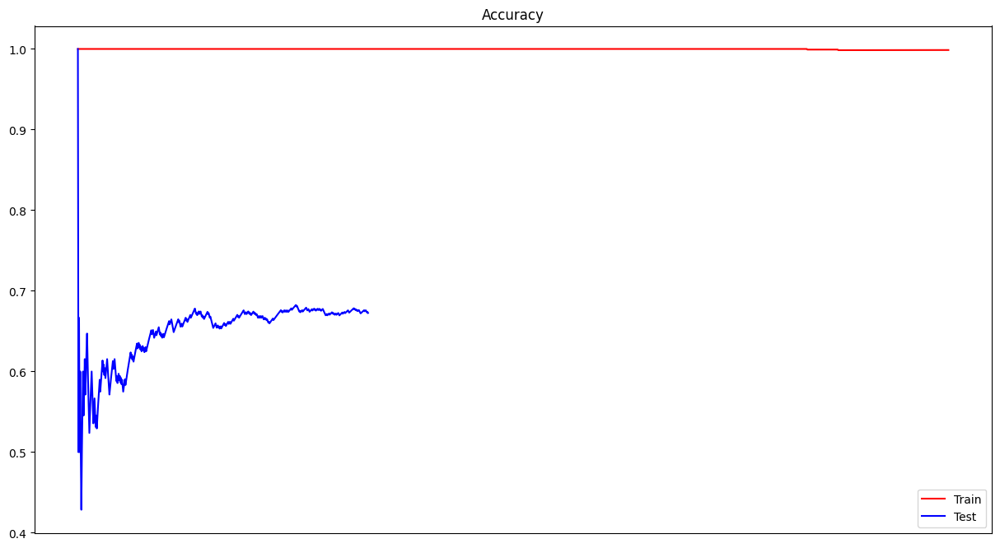

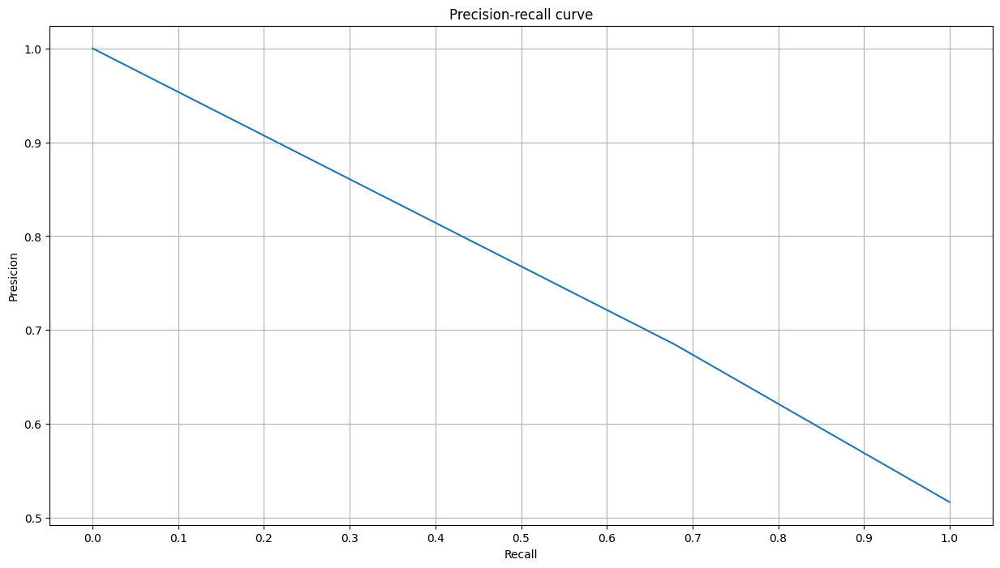

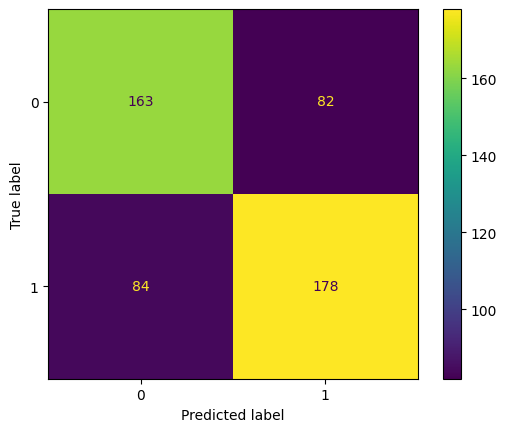

Processed model 5/7


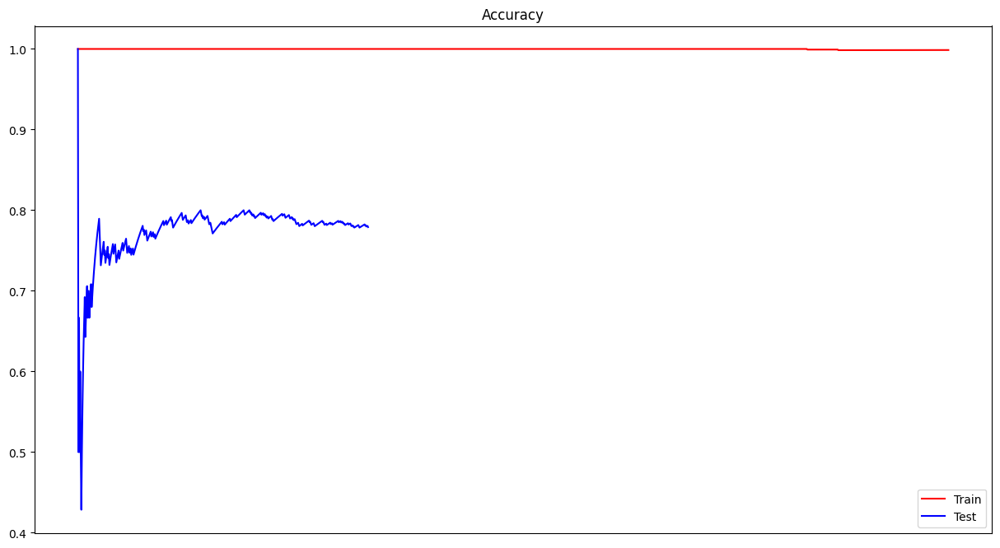

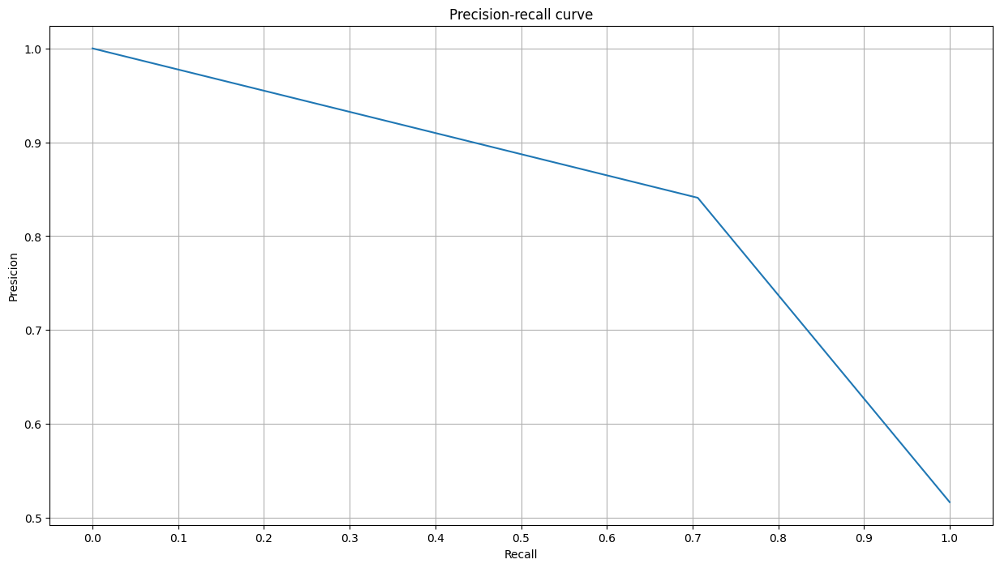

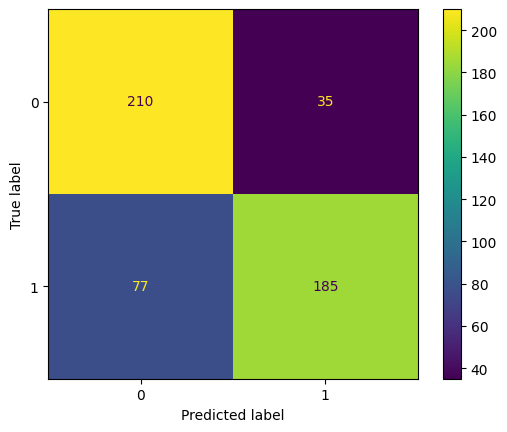

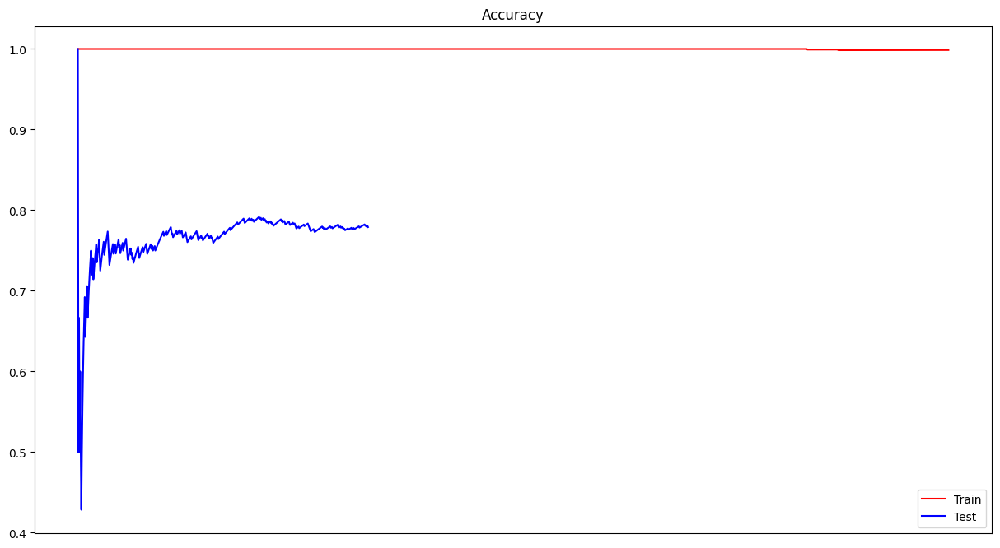

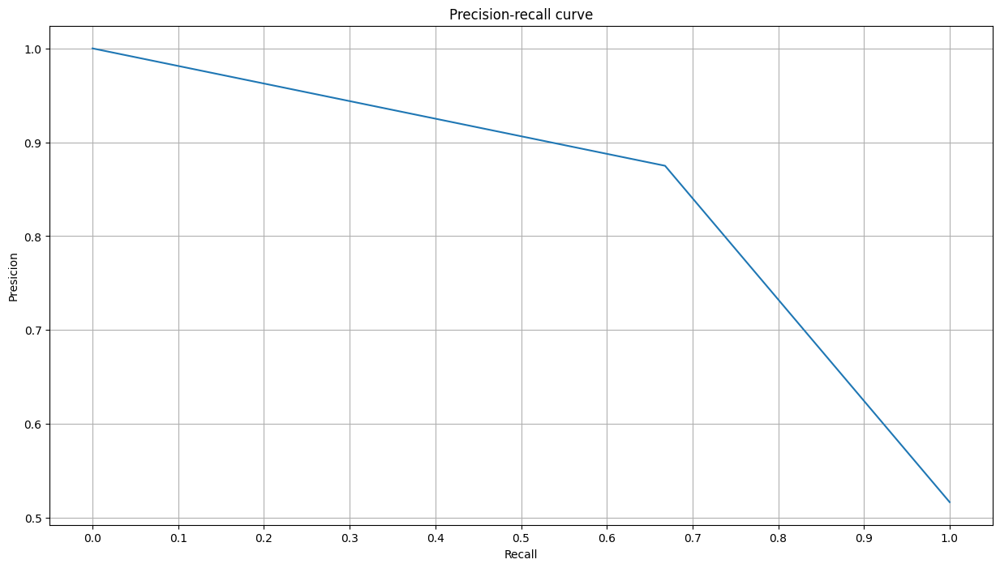

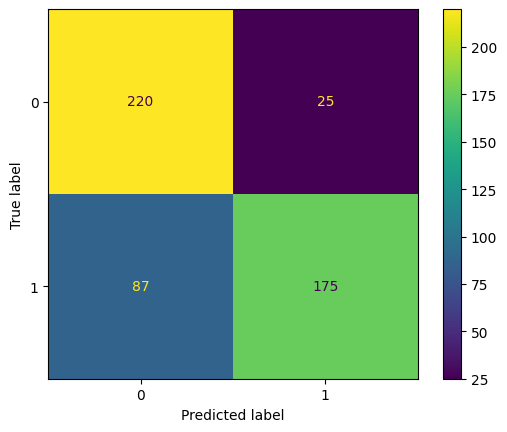

Processed model 6/7


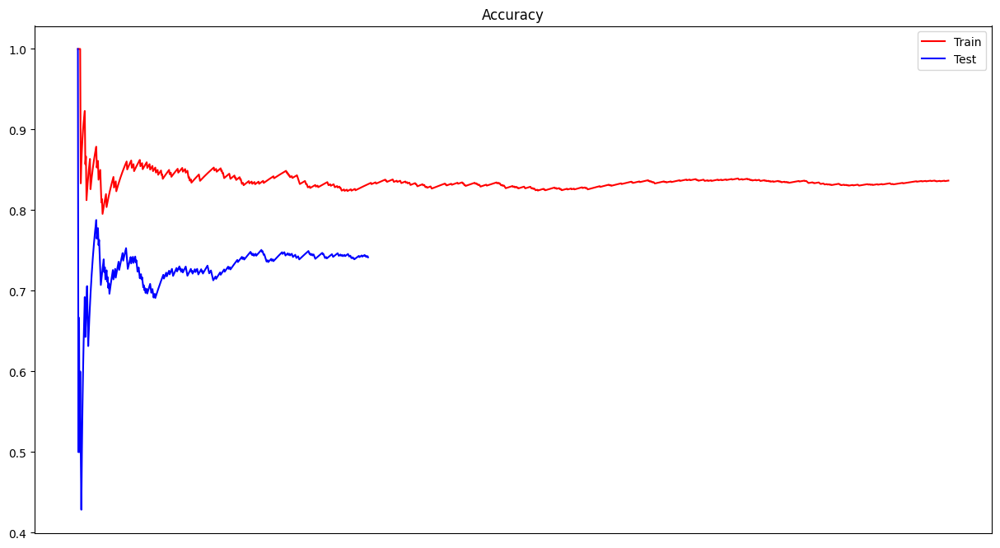

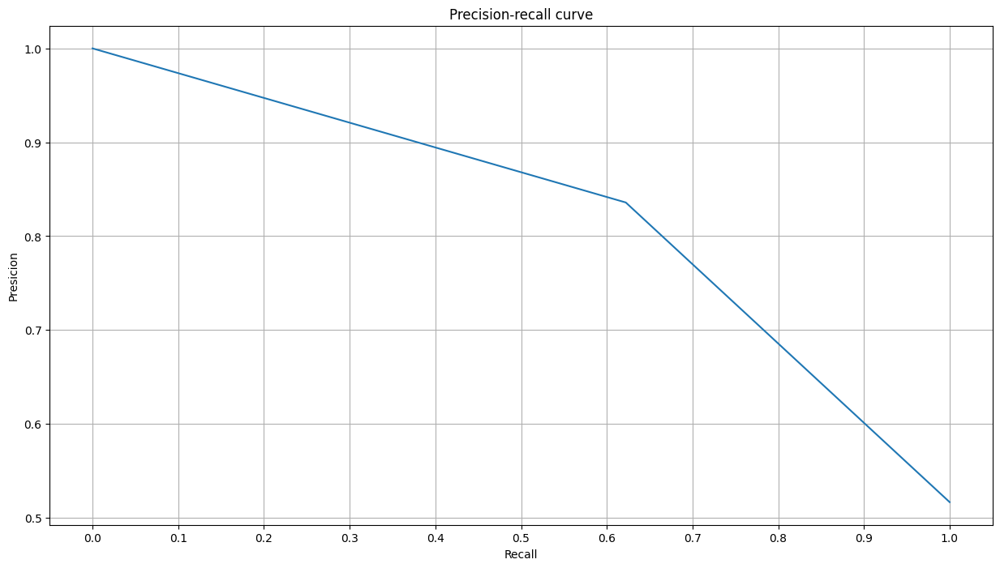

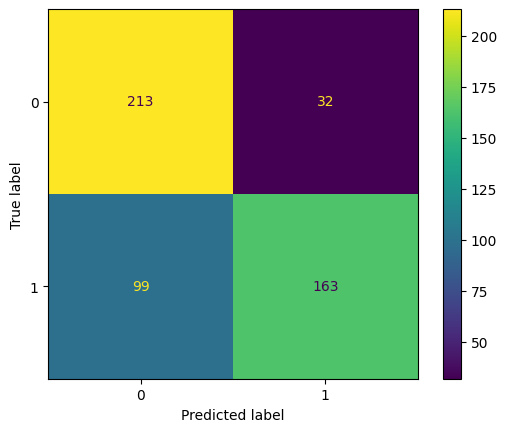

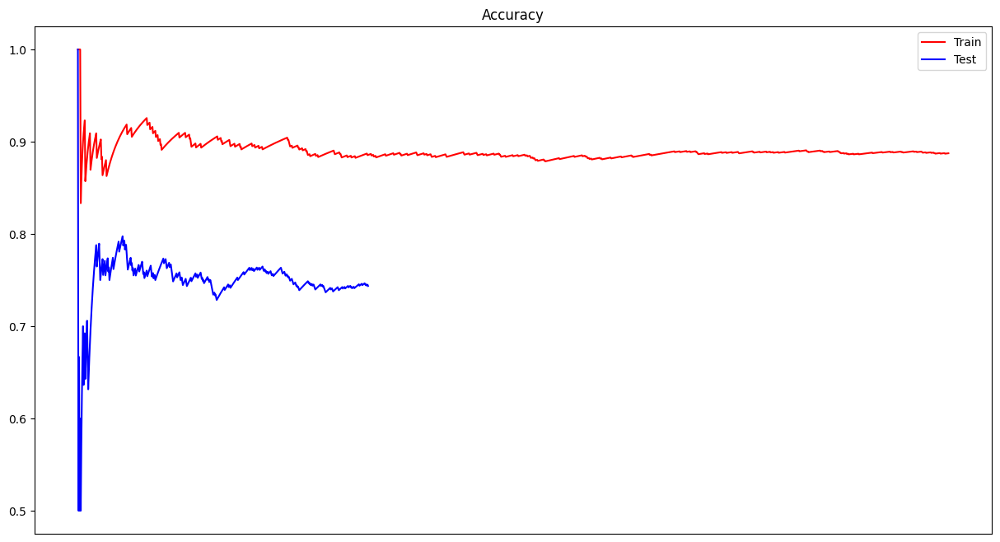

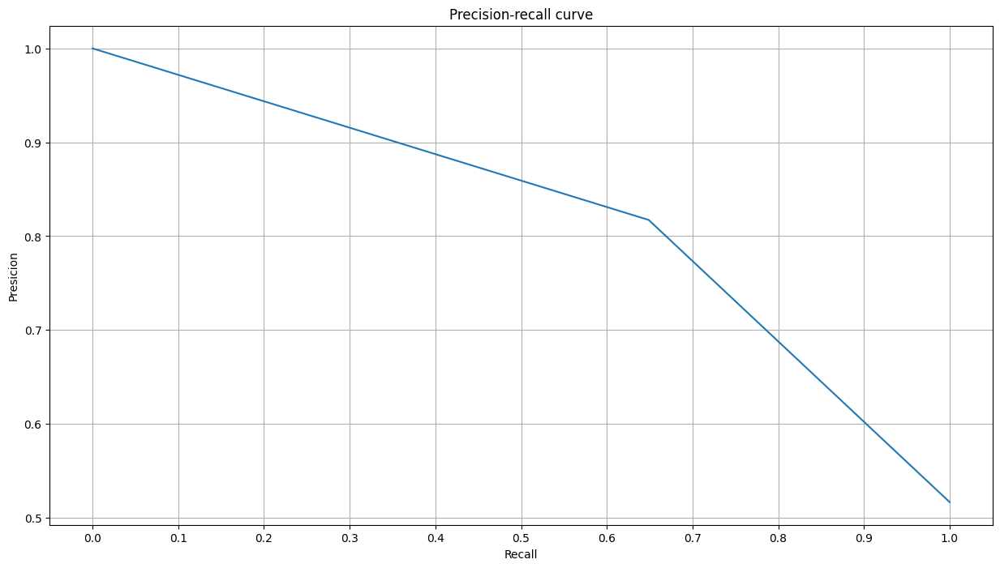

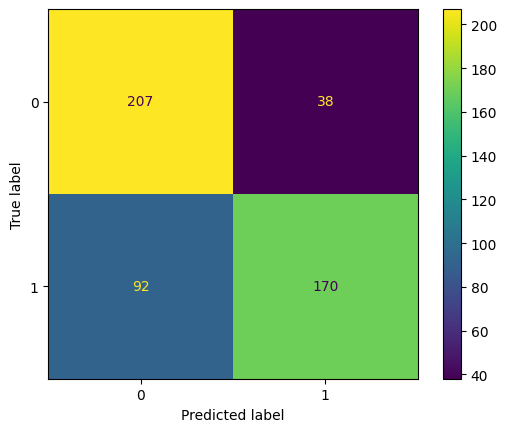

Processed model 7/7
Start processing chris_germany.csv


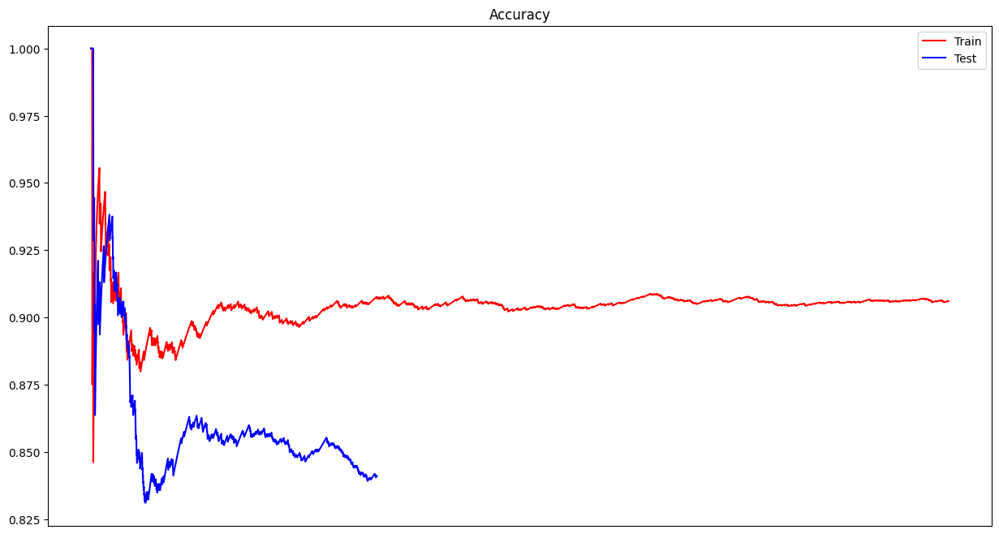

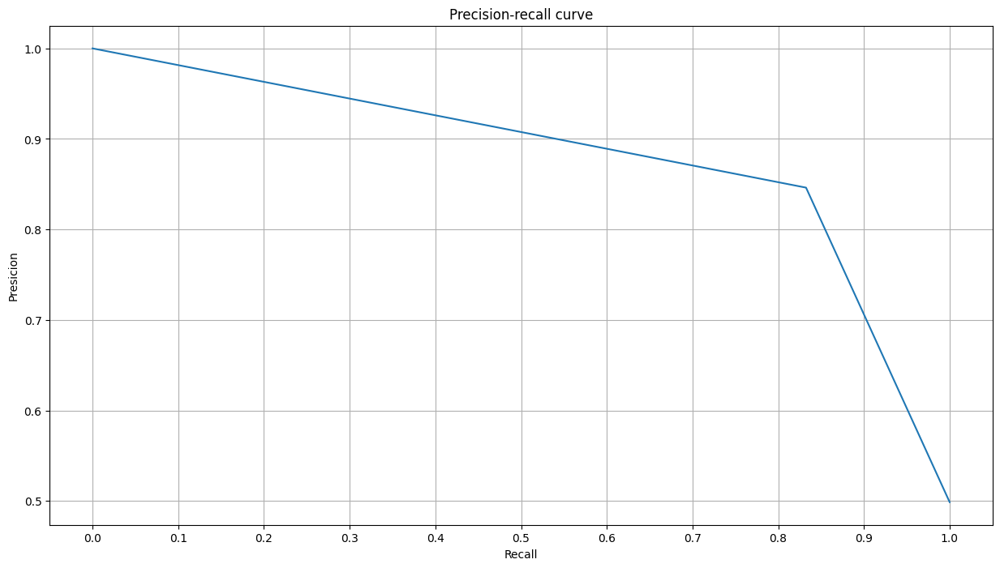

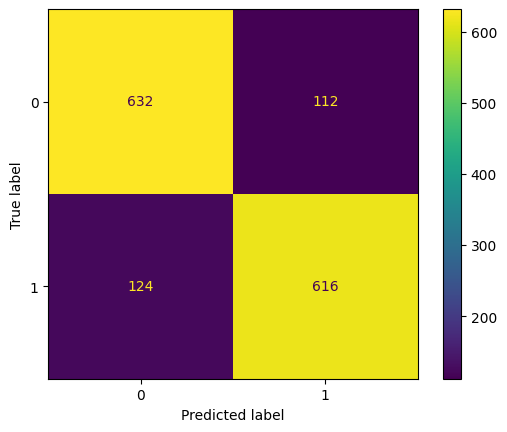

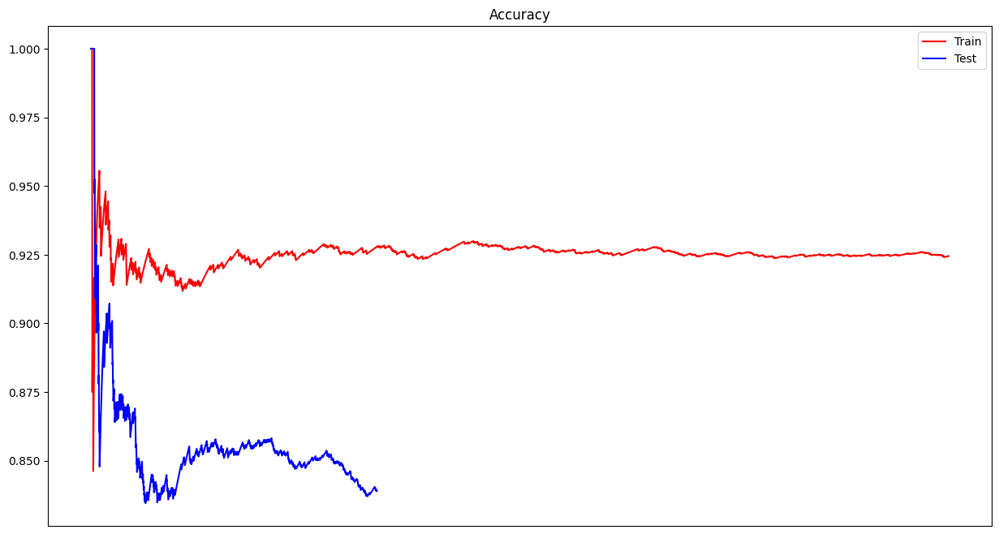

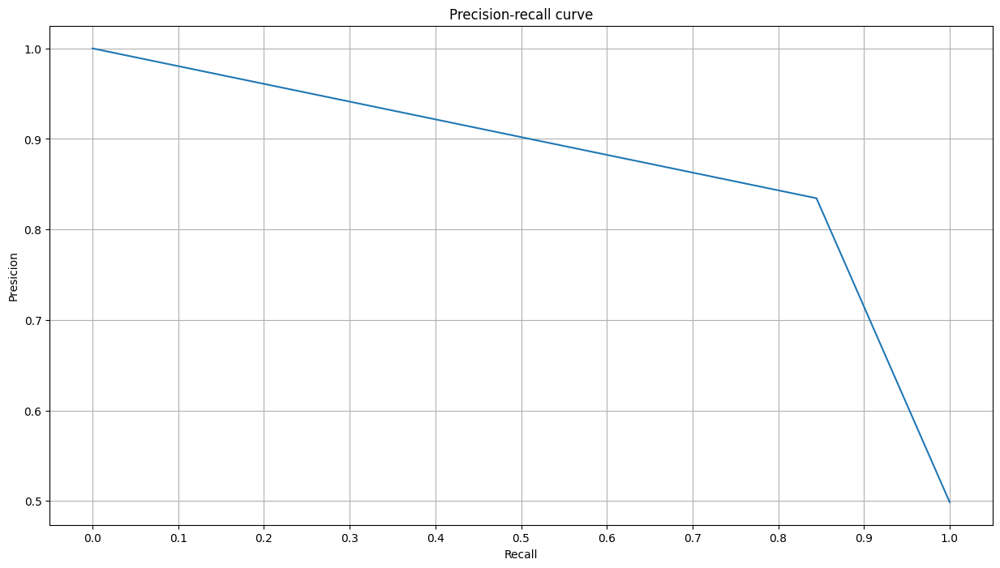

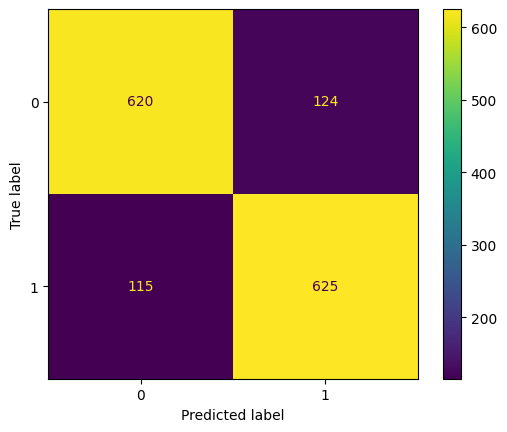

Processed model 1/7


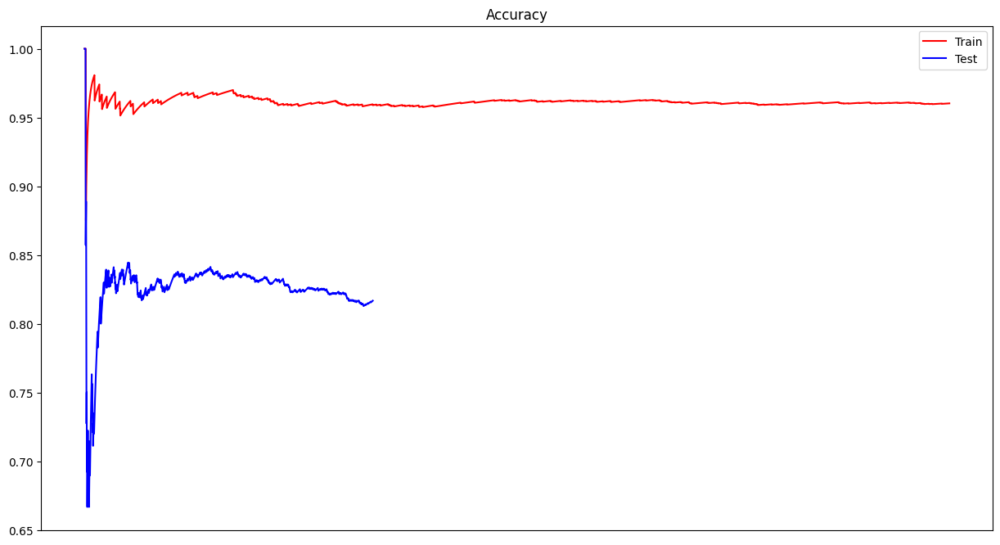

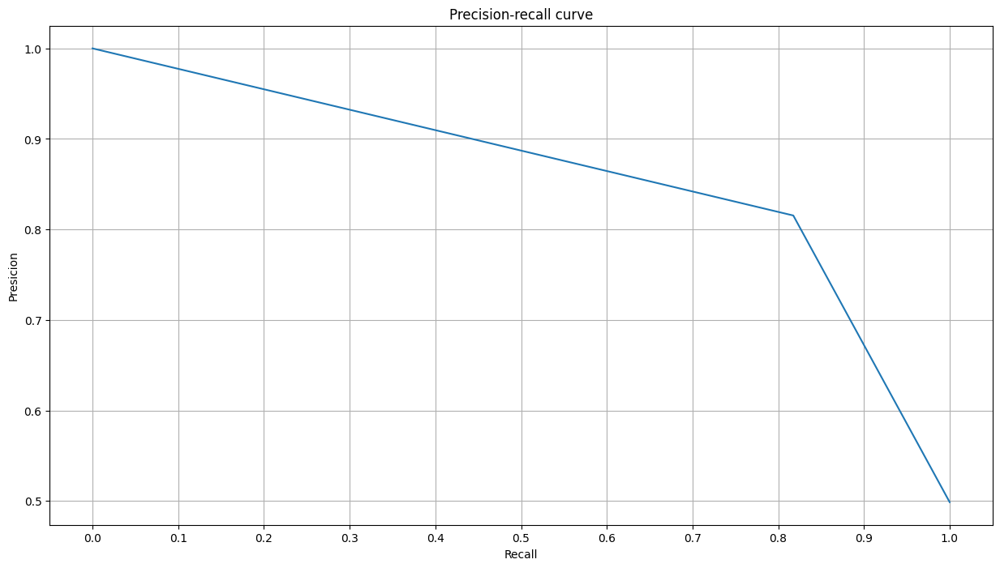

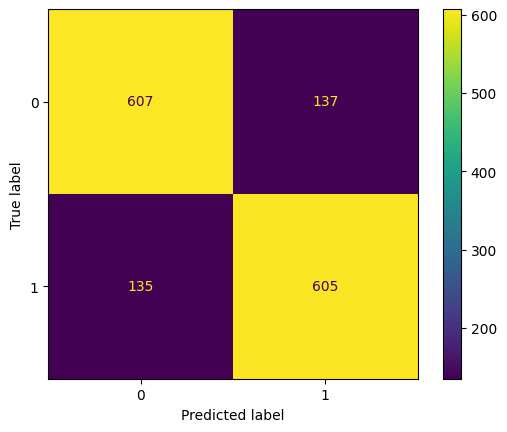

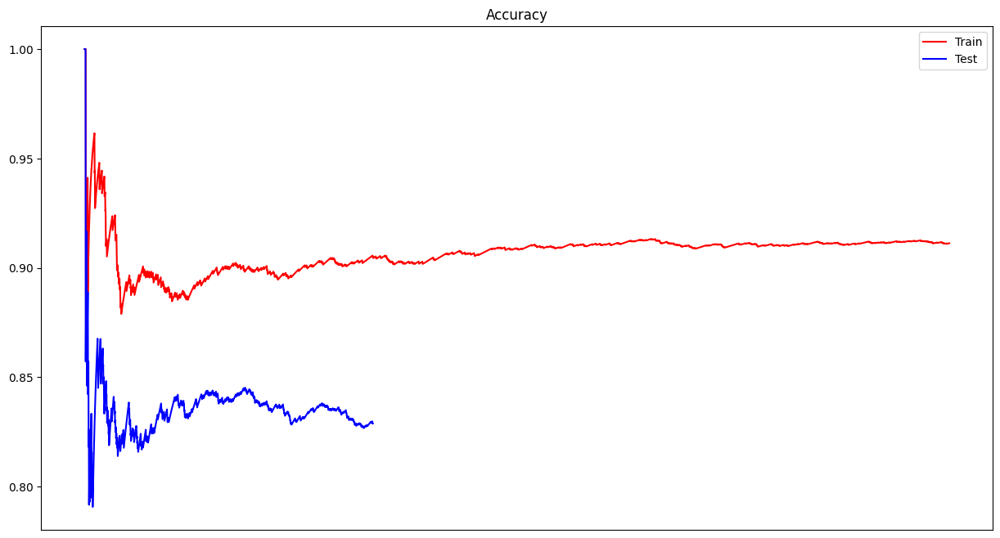

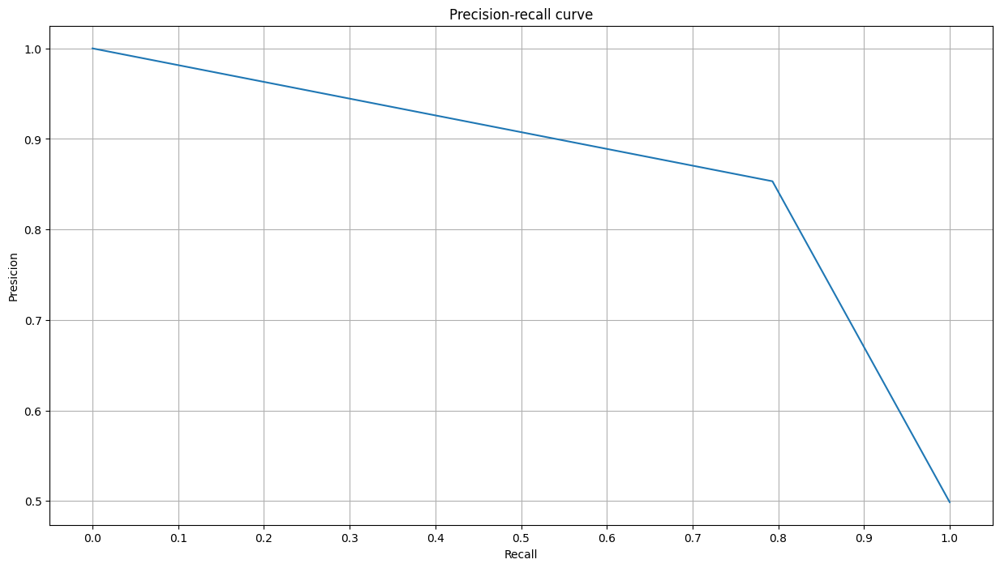

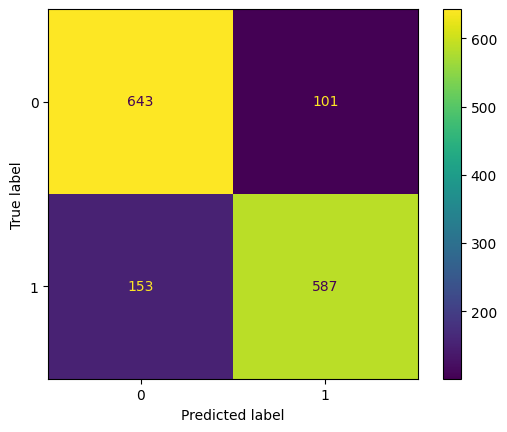

Processed model 2/7


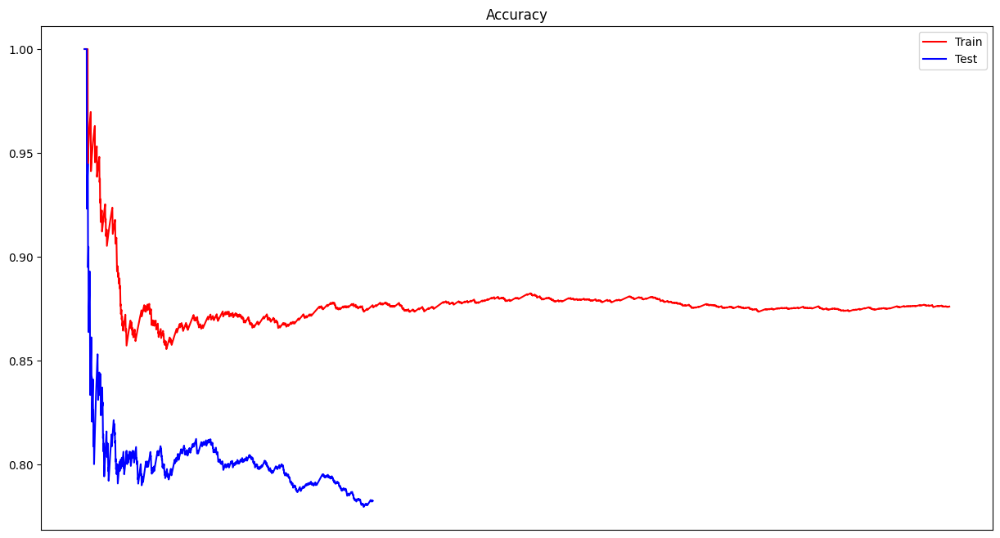

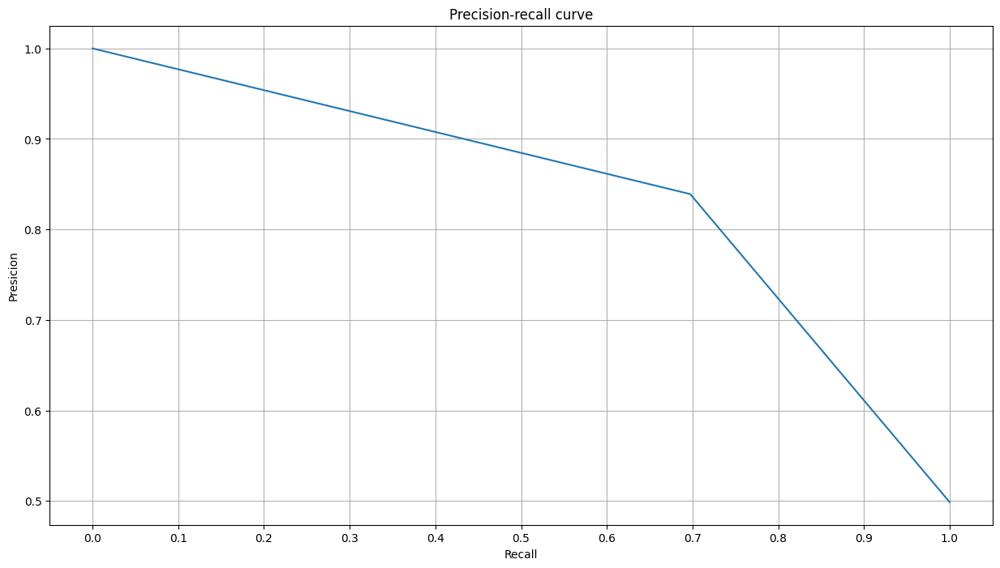

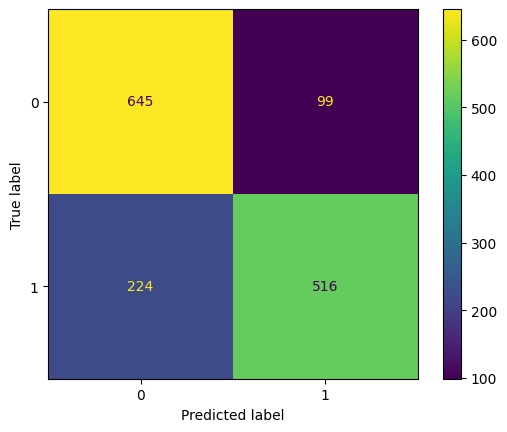

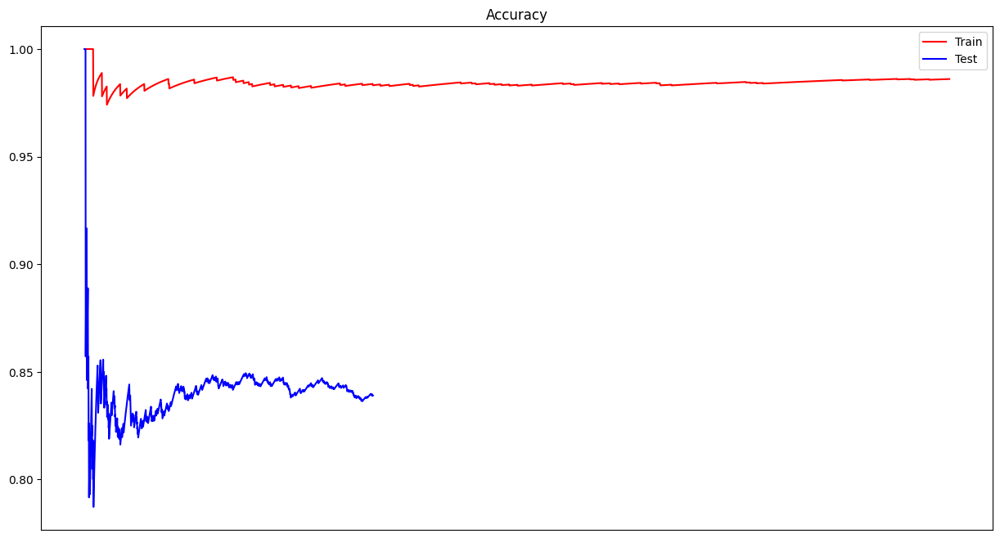

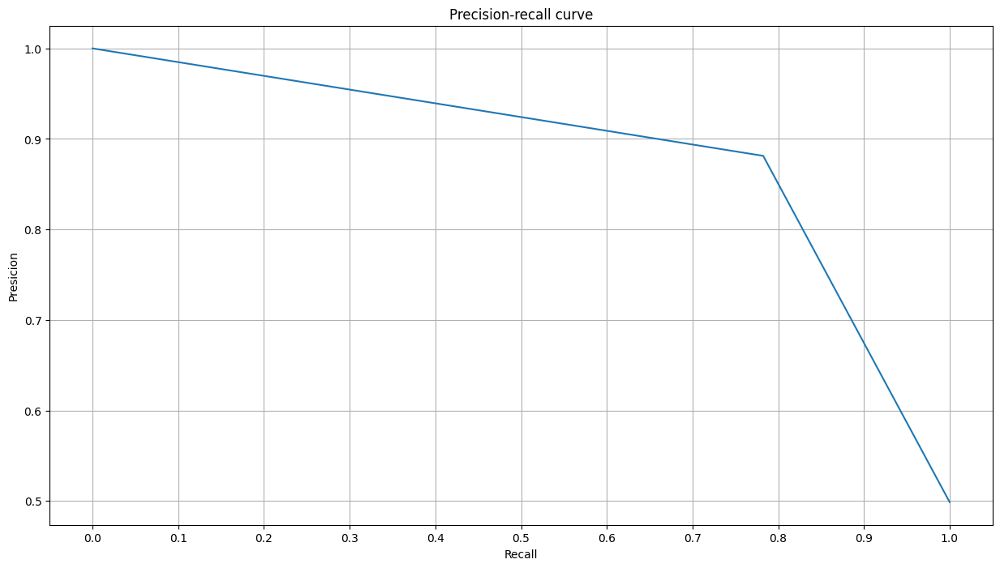

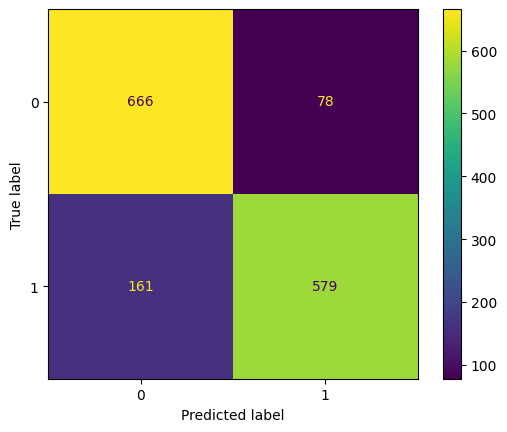

Processed model 3/7


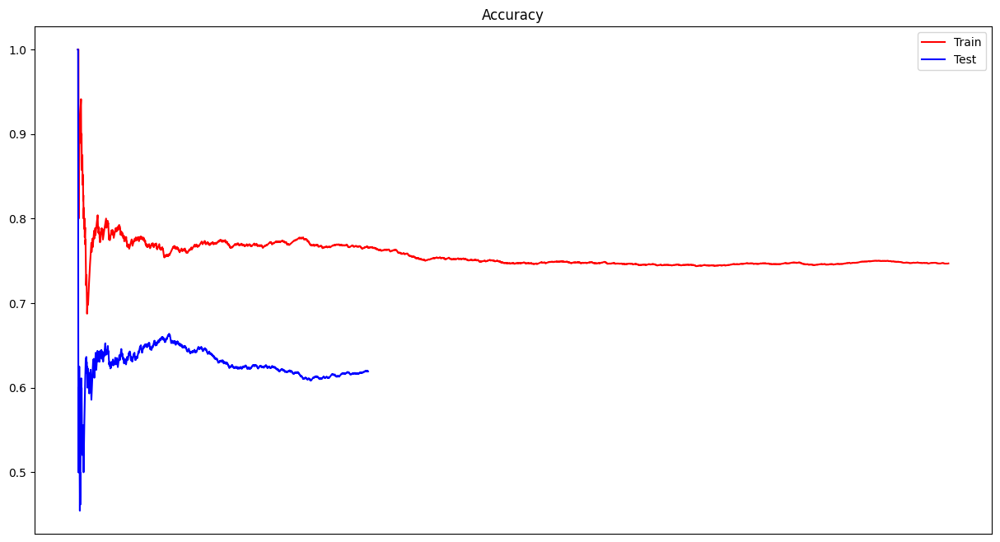

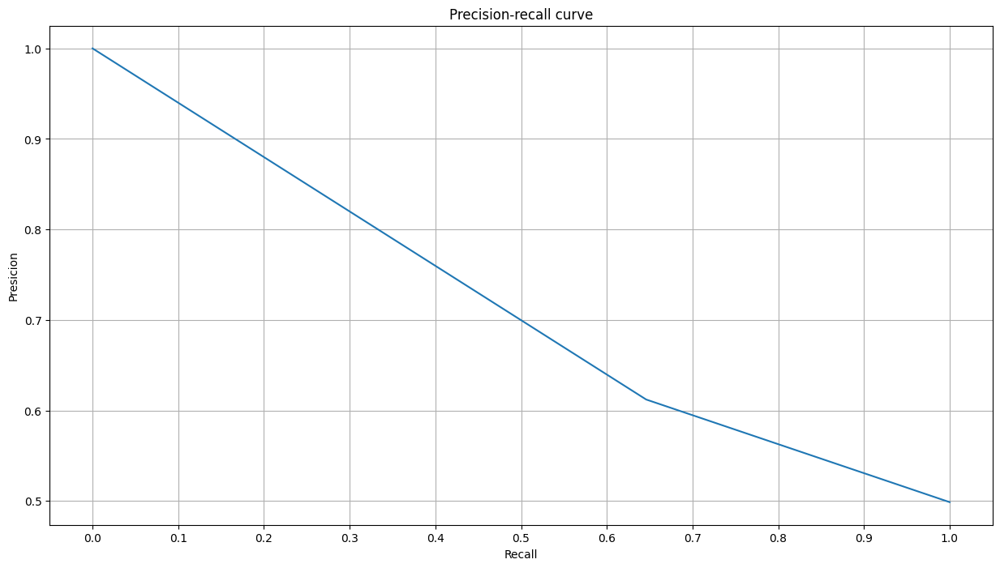

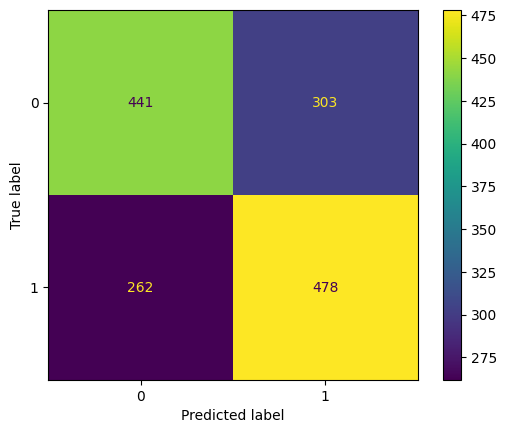

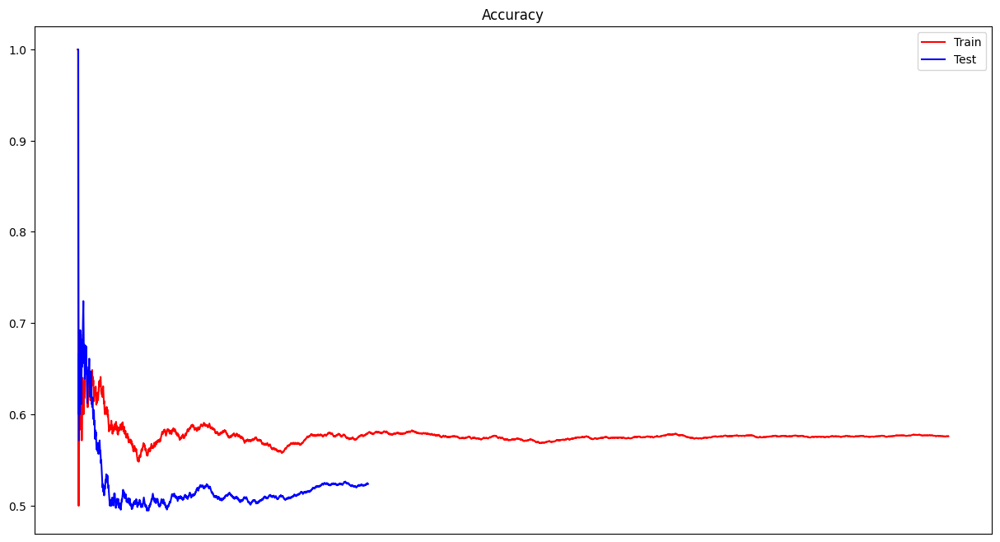

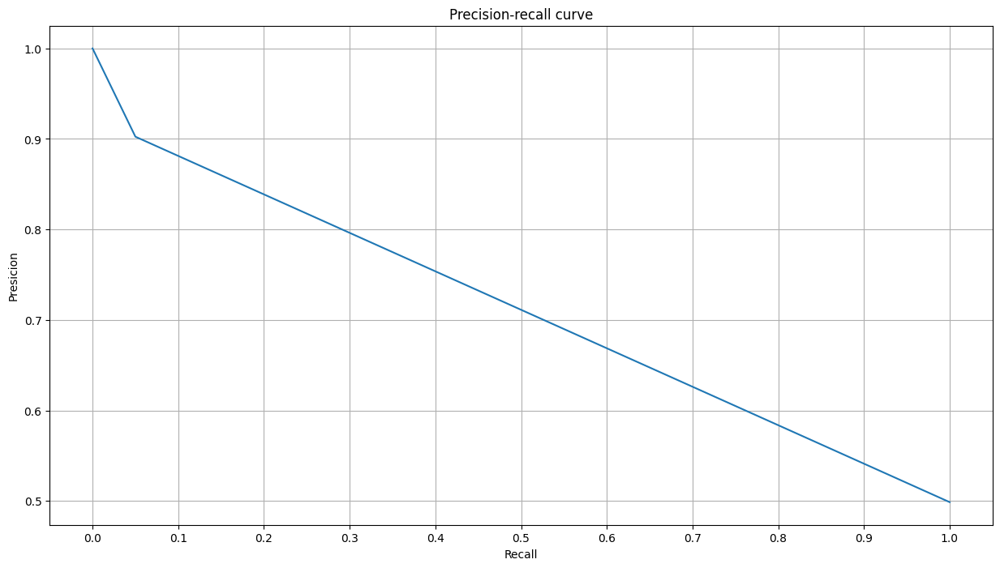

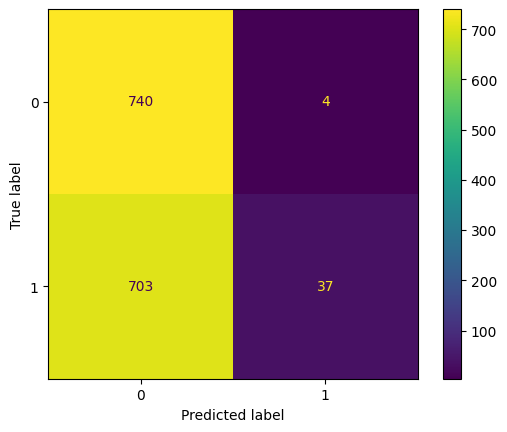

Processed model 4/7


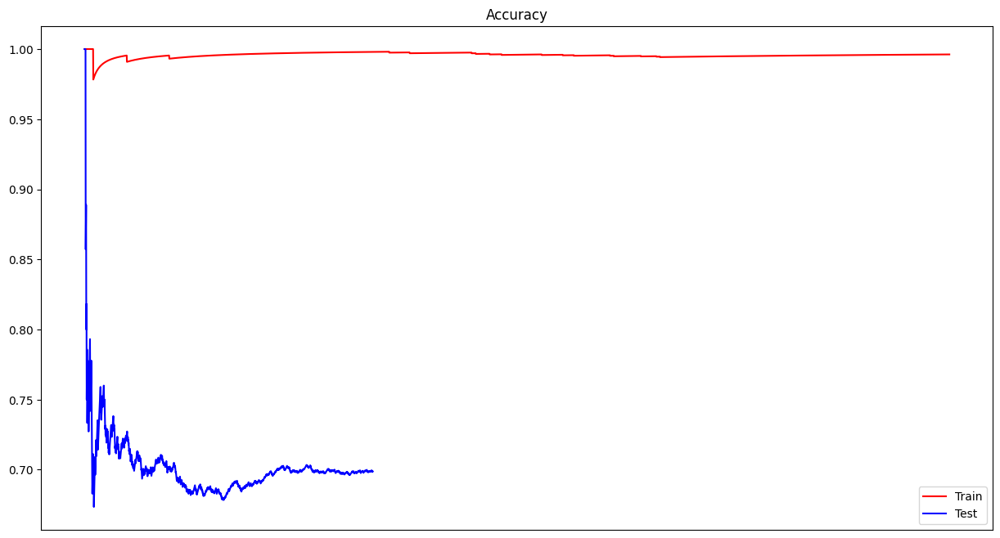

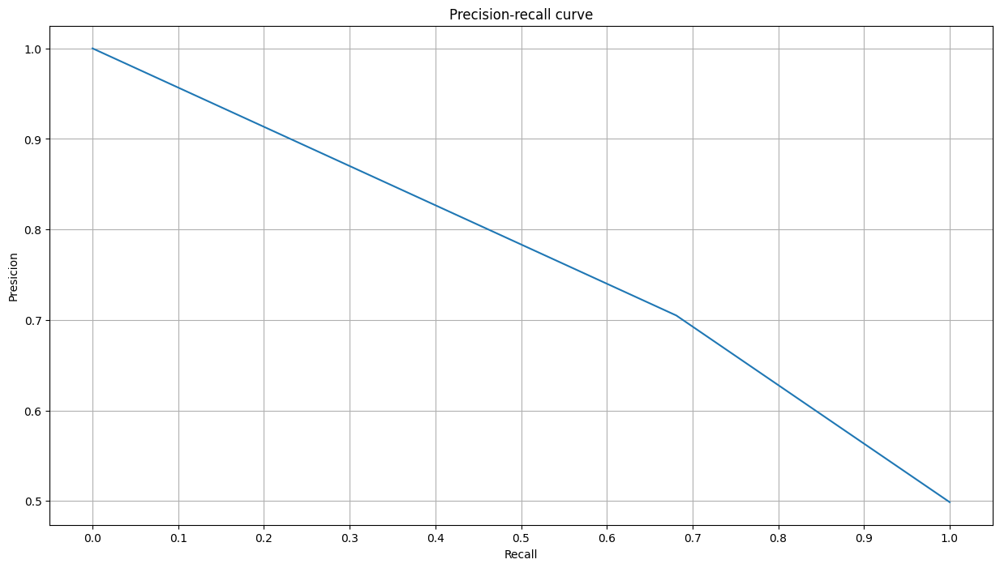

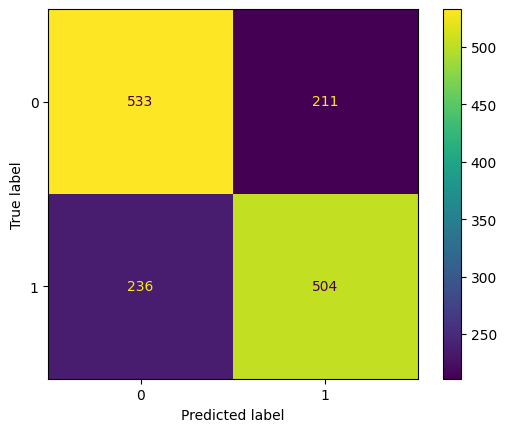

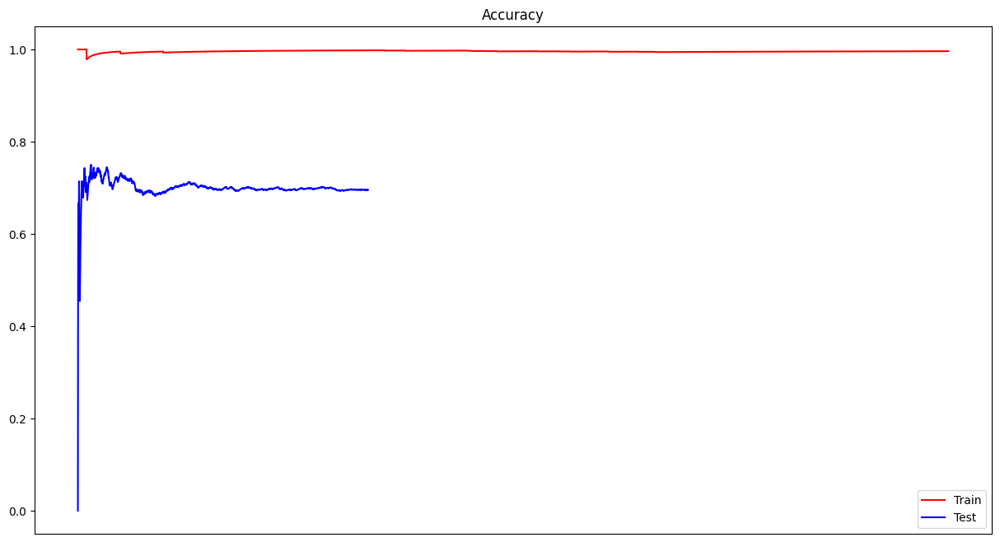

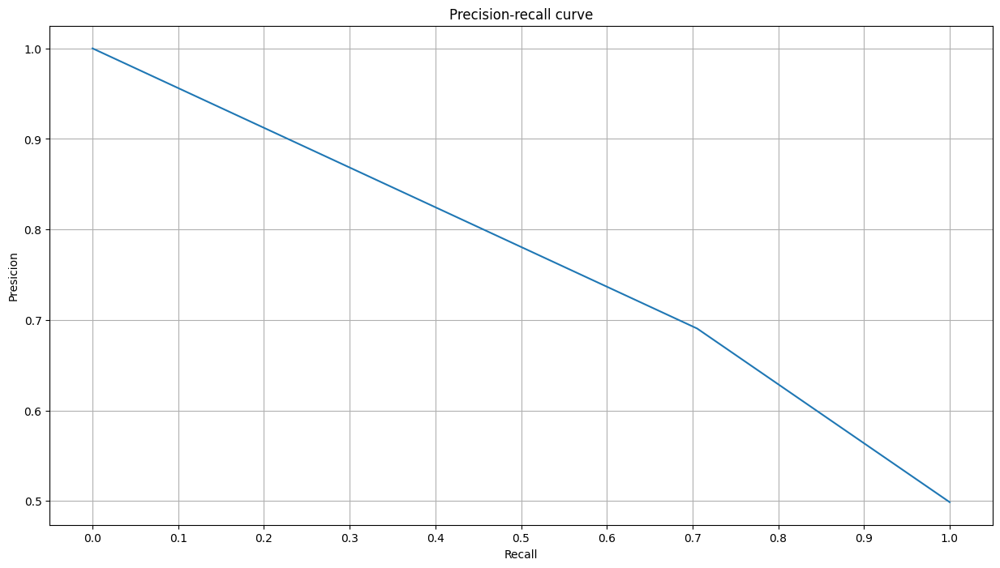

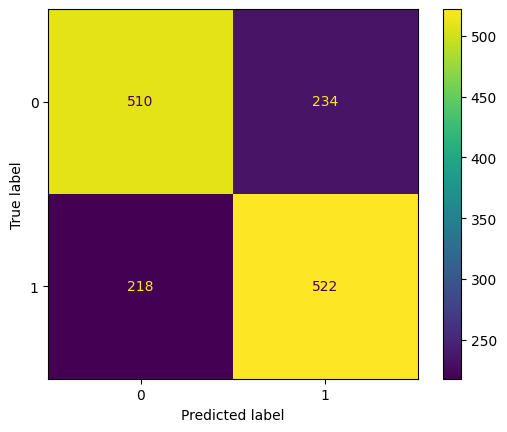

Processed model 5/7


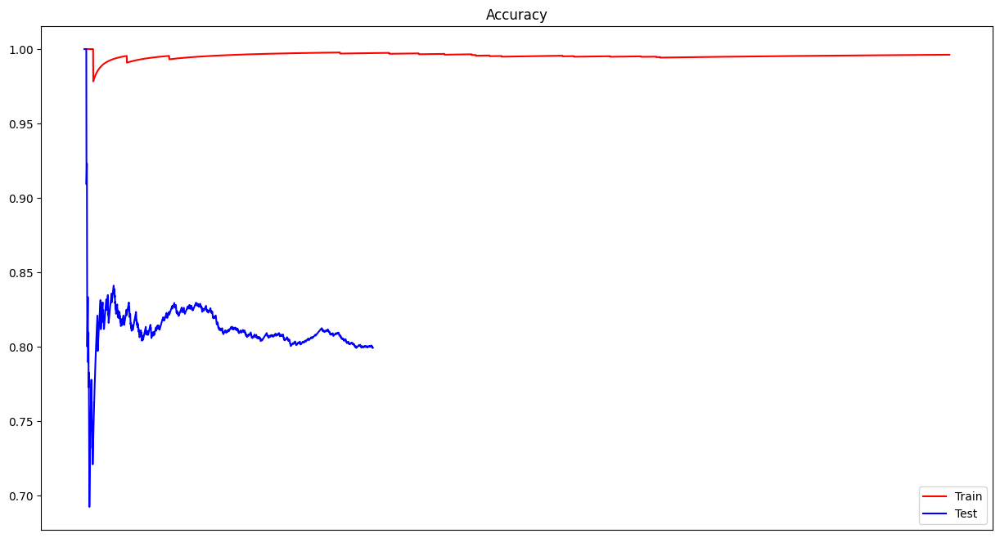

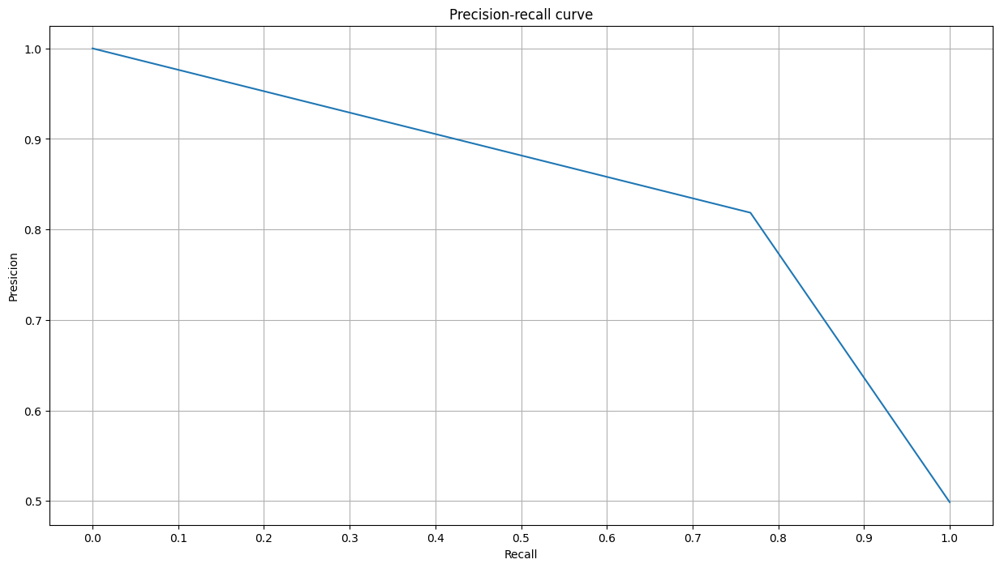

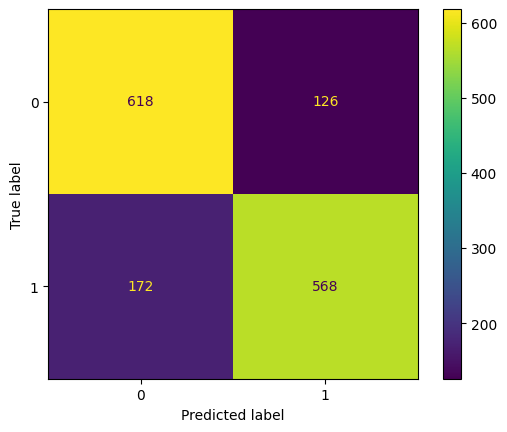

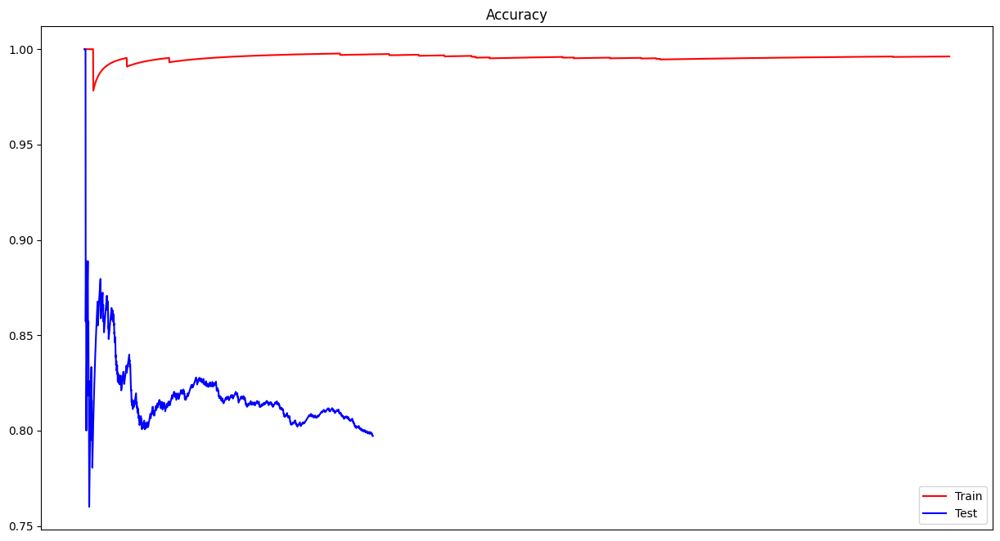

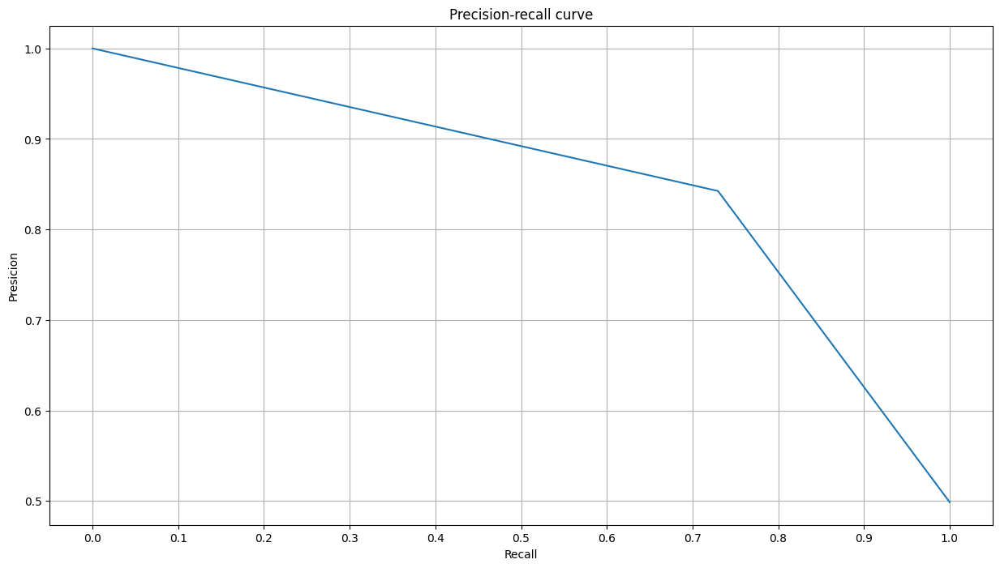

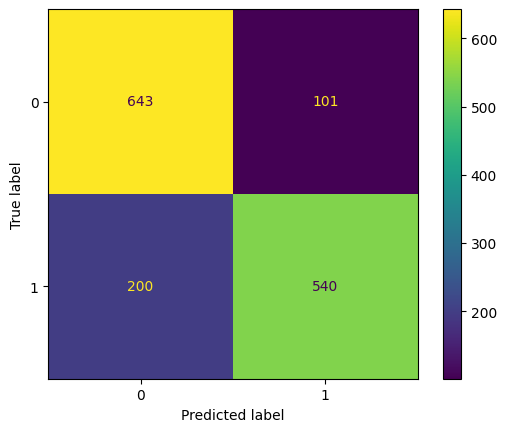

Processed model 6/7


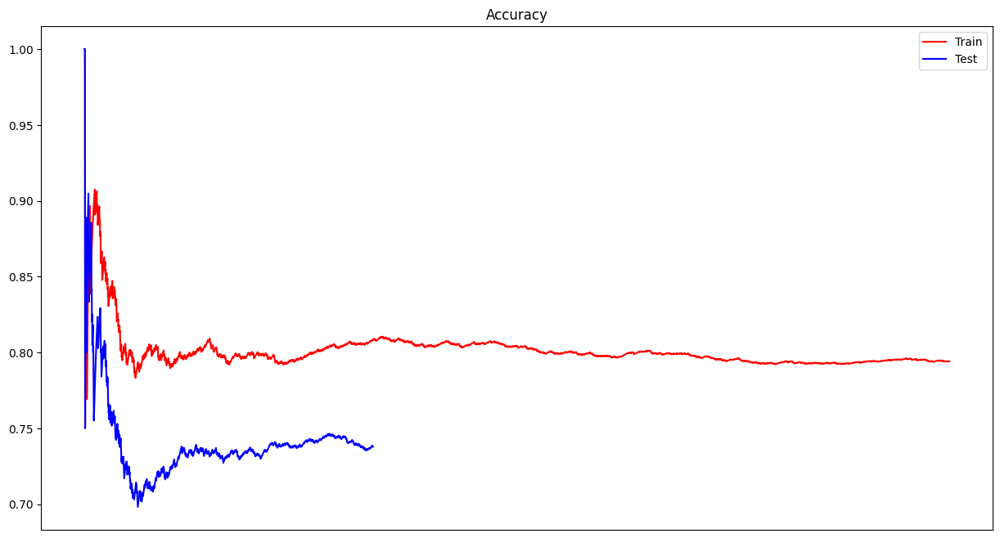

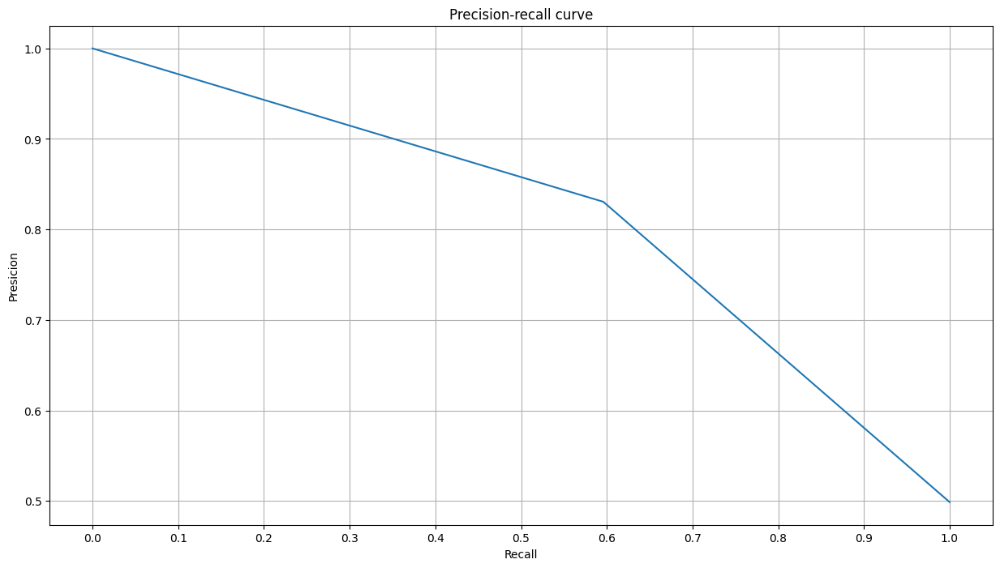

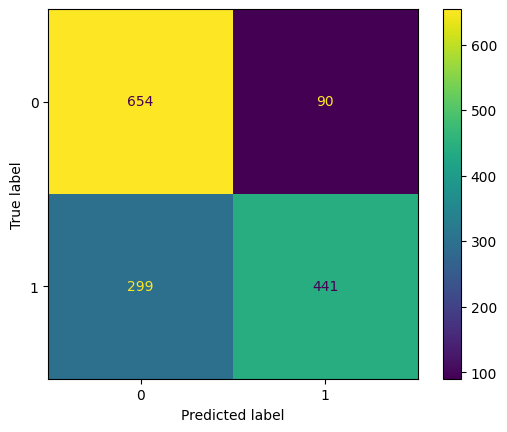

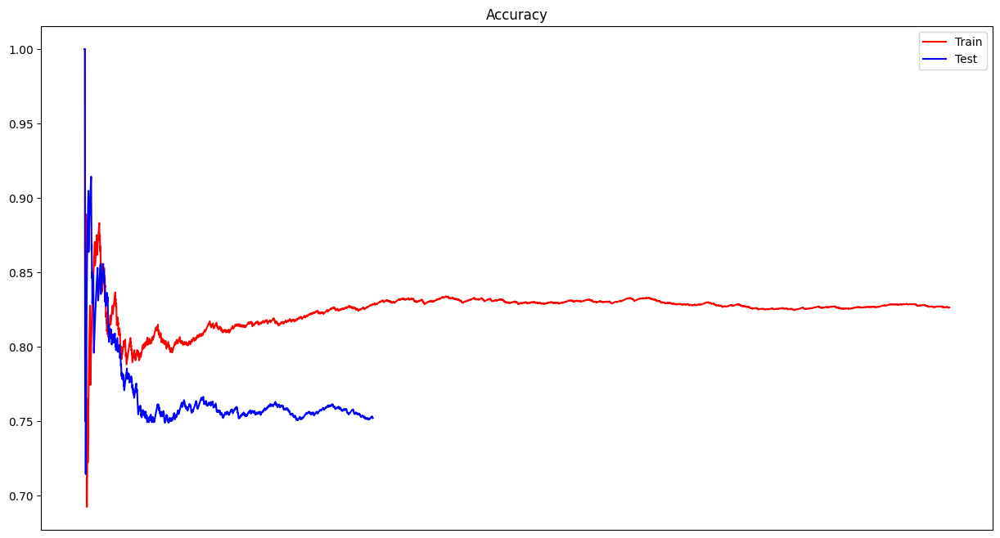

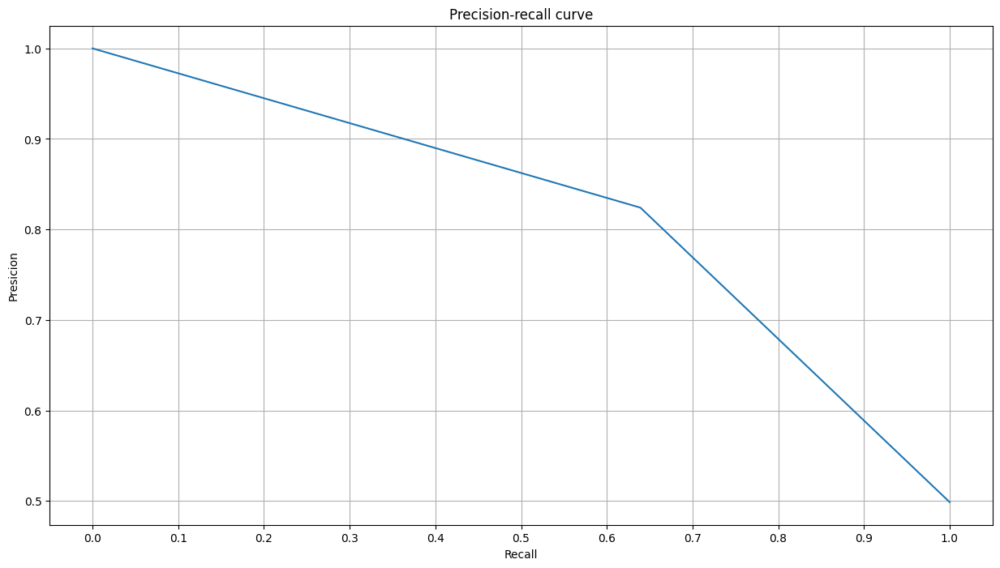

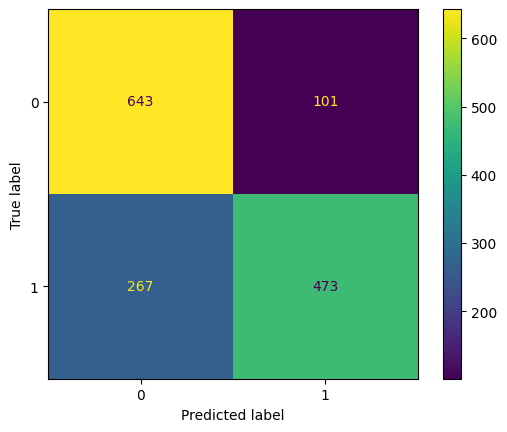

Processed model 7/7


In [22]:
models = [MultinomialNB, LogisticRegression, SVC, KNeighborsClassifier, DecisionTreeClassifier, RandomForestClassifier, GradientBoostingClassifier]
for dataset in chosen_datasets:
    model_trainer = ModelTrainer(dataset, "train_preprocessing")
    print(f"Start processing {dataset}")
    for i, model in enumerate(models):
        model_trainer.train(model(), vectorize)
        model_trainer.train(model(), tfidf)
        print(f"Processed model {i + 1}/{len(models)}")
    model_trainer.save_train_info_into_pickle()

In [23]:
analyze_train_data("train_preprocessing")

{'MultinomialNB': {'vectorize': {'Accuracy': 0.8555801217129735, 'Precision': 0.8139409518887663, 'Recall': 0.9245149540068385, 'F1 score': 0.8546369045723674}, 'tfidf': {'Accuracy': 0.805711771819829, 'Precision': 0.7497656089951071, 'Recall': 0.9368422856009818, 'F1 score': 0.8004417045882993}}, 'LogisticRegression': {'vectorize': {'Accuracy': 0.8494239397860139, 'Precision': 0.8694290360207562, 'Recall': 0.825392056694404, 'F1 score': 0.8493003647608818}, 'tfidf': {'Accuracy': 0.8639362147507985, 'Precision': 0.8983786086857561, 'Recall': 0.8223142343497493, 'F1 score': 0.8636745221843342}}, 'SVC': {'vectorize': {'Accuracy': 0.8053302160173595, 'Precision': 0.8724682750273394, 'Recall': 0.7167567551611785, 'F1 score': 0.8036935151103324}, 'tfidf': {'Accuracy': 0.8656147502400435, 'Precision': 0.9164025699060454, 'Recall': 0.8057804454415356, 'F1 score': 0.8651398228199018}}, 'KNeighborsClassifier': {'vectorize': {'Accuracy': 0.6913857446916231, 'Precision': 0.705160014054423, 'Recal

Исследование препроцессинга на лучшей модели SVM

In [24]:
# Raw 'Accuracy': 0.864054582489543
# Preprocessing without lemmatization 'Accuracy': 0.8566528760292869
# Save stop words + without lemmatization 0.8605192309990312
# Lemmatization + save stop words 0.8605192309990312
# Only Lower text 0.8605459869746198

В итоге, лучше всего модель работает на обычном тексте.

## Нейросети

In [25]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, SimpleRNN, Dense

tf.config.list_physical_devices('GPU')

2024-04-04 14:50:08.442048: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-04-04 14:50:08.928271: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


2024-04-04 14:50:09.330644: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-04-04 14:50:09.349095: W tensorflow/core/common_runtime/gpu/gpu_device.cc:2251] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


[]

In [26]:
def print_metrics(history, epochs=2):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(epochs)

    plt.figure(figsize=(15, 8))
    plt.subplot(1, 3, 1)
    plt.plot(epochs_range, acc, label='Train')
    plt.plot(epochs_range, val_acc, label='Test')
    plt.legend()
    plt.grid()
    plt.title('Accuracy')

    plt.subplot(1, 3, 2)
    plt.plot(epochs_range, loss, label='Train')
    plt.plot(epochs_range, val_loss, label='Test')
    plt.legend()
    plt.grid()
    plt.title('Loss')

    plt.show()


def print_conf_matrix(labels, pred_labels):
    cm = ConfusionMatrixDisplay(confusion_matrix(labels, pred_labels))
    cm.plot()
    plt.show()

Epoch 1/3


 1/60 ━━━━━━━━━━━━━━━━━━━━ 58s 994ms/step - accuracy: 0.6562 - loss: 0.6730

 2/60 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - accuracy: 0.6641 - loss: 0.6725 

 3/60 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - accuracy: 0.6337 - loss: 0.6784

 4/60 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - accuracy: 0.6178 - loss: 0.6816

 5/60 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - accuracy: 0.6055 - loss: 0.6837

 6/60 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - accuracy: 0.5984 - loss: 0.6850

 7/60 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - accuracy: 0.5951 - loss: 0.6858

 8/60 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - accuracy: 0.5925 - loss: 0.6865

 9/60 ━━━━━━━━━━━━━━━━━━━━ 8s 165ms/step - accuracy: 0.5888 - loss: 0.6873

10/60 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - accuracy: 0.5862 - loss: 0.6877

11/60 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - accuracy: 0.5845 - loss: 0.6879

12/60 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.5834 - loss: 0.6879

13/60 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.5825 - loss: 0.6877

14/60 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.5819 - loss: 0.6875

15/60 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - accuracy: 0.5808 - loss: 0.6875

16/60 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - accuracy: 0.5802 - loss: 0.6874

17/60 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - accuracy: 0.5799 - loss: 0.6872

18/60 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - accuracy: 0.5793 - loss: 0.6872

19/60 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - accuracy: 0.5784 - loss: 0.6872

20/60 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - accuracy: 0.5776 - loss: 0.6872

21/60 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - accuracy: 0.5768 - loss: 0.6872

22/60 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - accuracy: 0.5761 - loss: 0.6872

23/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.5755 - loss: 0.6871

24/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.5751 - loss: 0.6870

25/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.5746 - loss: 0.6869

26/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.5741 - loss: 0.6868

27/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.5737 - loss: 0.6867

28/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.5734 - loss: 0.6866

29/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.5731 - loss: 0.6865

30/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.5728 - loss: 0.6864

31/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.5725 - loss: 0.6863

32/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.5722 - loss: 0.6862

33/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.5720 - loss: 0.6861

34/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.5719 - loss: 0.6860

35/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.5718 - loss: 0.6859

36/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.5718 - loss: 0.6857

37/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.5719 - loss: 0.6856

38/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.5719 - loss: 0.6854

39/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.5720 - loss: 0.6852

40/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.5722 - loss: 0.6850

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.5723 - loss: 0.6848

42/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.5725 - loss: 0.6846

43/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.5727 - loss: 0.6843

44/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.5730 - loss: 0.6840

45/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.5733 - loss: 0.6838

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.5737 - loss: 0.6835

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.5741 - loss: 0.6832

48/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.5744 - loss: 0.6829

49/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.5748 - loss: 0.6826

50/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.5752 - loss: 0.6822

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.5757 - loss: 0.6819

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.5762 - loss: 0.6815

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.5767 - loss: 0.6812

54/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5771 - loss: 0.6808

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5776 - loss: 0.6805

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5781 - loss: 0.6801

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5787 - loss: 0.6798

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5792 - loss: 0.6794

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5797 - loss: 0.6790

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5802 - loss: 0.6786

60/60 ━━━━━━━━━━━━━━━━━━━━ 11s 169ms/step - accuracy: 0.5807 - loss: 0.6782 - val_accuracy: 0.7461 - val_loss: 0.5474


Epoch 2/3


 1/60 ━━━━━━━━━━━━━━━━━━━━ 9s 168ms/step - accuracy: 0.8125 - loss: 0.4853

 2/60 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - accuracy: 0.8125 - loss: 0.4842

 3/60 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - accuracy: 0.8090 - loss: 0.4831

 4/60 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - accuracy: 0.8118 - loss: 0.4783

 5/60 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - accuracy: 0.8057 - loss: 0.4793

 6/60 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - accuracy: 0.8016 - loss: 0.4800

 7/60 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - accuracy: 0.7962 - loss: 0.4819

 8/60 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - accuracy: 0.7924 - loss: 0.4833

 9/60 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - accuracy: 0.7900 - loss: 0.4838

10/60 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - accuracy: 0.7875 - loss: 0.4843

11/60 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - accuracy: 0.7844 - loss: 0.4856

12/60 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - accuracy: 0.7826 - loss: 0.4859

13/60 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - accuracy: 0.7821 - loss: 0.4852

14/60 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.7821 - loss: 0.4841

15/60 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.7820 - loss: 0.4833

16/60 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.7805 - loss: 0.4842

17/60 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - accuracy: 0.7787 - loss: 0.4855

18/60 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - accuracy: 0.7764 - loss: 0.4873

19/60 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - accuracy: 0.7739 - loss: 0.4892

20/60 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - accuracy: 0.7716 - loss: 0.4908

21/60 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - accuracy: 0.7697 - loss: 0.4923

22/60 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - accuracy: 0.7681 - loss: 0.4935

23/60 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - accuracy: 0.7671 - loss: 0.4946

24/60 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - accuracy: 0.7663 - loss: 0.4955

25/60 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - accuracy: 0.7659 - loss: 0.4964

26/60 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - accuracy: 0.7658 - loss: 0.4971

27/60 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - accuracy: 0.7659 - loss: 0.4977

28/60 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - accuracy: 0.7660 - loss: 0.4982

29/60 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - accuracy: 0.7663 - loss: 0.4986

30/60 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - accuracy: 0.7667 - loss: 0.4991

31/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.7671 - loss: 0.4995

32/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.7675 - loss: 0.4999

33/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.7681 - loss: 0.5003

34/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.7685 - loss: 0.5007

35/60 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.7691 - loss: 0.5010

36/60 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.7697 - loss: 0.5012

37/60 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.7703 - loss: 0.5015

38/60 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.7708 - loss: 0.5017

39/60 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - accuracy: 0.7714 - loss: 0.5019

40/60 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - accuracy: 0.7718 - loss: 0.5021

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - accuracy: 0.7723 - loss: 0.5023

42/60 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - accuracy: 0.7728 - loss: 0.5025

43/60 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - accuracy: 0.7734 - loss: 0.5026

44/60 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - accuracy: 0.7740 - loss: 0.5027

45/60 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - accuracy: 0.7745 - loss: 0.5028

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - accuracy: 0.7750 - loss: 0.5030

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - accuracy: 0.7755 - loss: 0.5031

48/60 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - accuracy: 0.7760 - loss: 0.5031

49/60 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.7766 - loss: 0.5032

50/60 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.7772 - loss: 0.5032

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.7778 - loss: 0.5031

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.7785 - loss: 0.5031

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - accuracy: 0.7791 - loss: 0.5030

54/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.7798 - loss: 0.5029

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.7804 - loss: 0.5028

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.7811 - loss: 0.5026

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.7817 - loss: 0.5025

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.7824 - loss: 0.5024

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.7830 - loss: 0.5022

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - accuracy: 0.7836 - loss: 0.5021

60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - accuracy: 0.7843 - loss: 0.5019 - val_accuracy: 0.8123 - val_loss: 0.4840


Epoch 3/3


 1/60 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - accuracy: 0.9375 - loss: 0.2871

 2/60 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - accuracy: 0.9219 - loss: 0.3105

 3/60 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - accuracy: 0.9201 - loss: 0.3187

 4/60 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - accuracy: 0.9225 - loss: 0.3226

 5/60 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9230 - loss: 0.3265

 6/60 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.9246 - loss: 0.3262

 7/60 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - accuracy: 0.9258 - loss: 0.3254

 8/60 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - accuracy: 0.9272 - loss: 0.3241

 9/60 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - accuracy: 0.9284 - loss: 0.3226

10/60 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.9284 - loss: 0.3215

11/60 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.9289 - loss: 0.3202

12/60 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.9290 - loss: 0.3189

13/60 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - accuracy: 0.9295 - loss: 0.3172

14/60 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - accuracy: 0.9300 - loss: 0.3154

15/60 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - accuracy: 0.9305 - loss: 0.3136

16/60 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - accuracy: 0.9307 - loss: 0.3121

17/60 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - accuracy: 0.9310 - loss: 0.3105

18/60 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - accuracy: 0.9313 - loss: 0.3091

19/60 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - accuracy: 0.9315 - loss: 0.3076

20/60 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - accuracy: 0.9317 - loss: 0.3061

21/60 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - accuracy: 0.9319 - loss: 0.3046

22/60 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - accuracy: 0.9323 - loss: 0.3031

23/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.9325 - loss: 0.3016

24/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.9327 - loss: 0.3003

25/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.9328 - loss: 0.2989

26/60 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - accuracy: 0.9330 - loss: 0.2974

27/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.9332 - loss: 0.2959

28/60 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - accuracy: 0.9333 - loss: 0.2946

29/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.9333 - loss: 0.2932

30/60 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - accuracy: 0.9333 - loss: 0.2919

31/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.9333 - loss: 0.2906

32/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.9333 - loss: 0.2894

33/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.9333 - loss: 0.2882

34/60 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - accuracy: 0.9333 - loss: 0.2870

35/60 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - accuracy: 0.9334 - loss: 0.2859

36/60 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - accuracy: 0.9334 - loss: 0.2848

37/60 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - accuracy: 0.9334 - loss: 0.2838

38/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.9334 - loss: 0.2829

39/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.9334 - loss: 0.2820

40/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.9334 - loss: 0.2811

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - accuracy: 0.9334 - loss: 0.2802

42/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.9334 - loss: 0.2794

43/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.9334 - loss: 0.2786

44/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.9334 - loss: 0.2778

45/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.9334 - loss: 0.2770

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.9334 - loss: 0.2763

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - accuracy: 0.9334 - loss: 0.2756

48/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.9334 - loss: 0.2749

49/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.9334 - loss: 0.2742

50/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.9334 - loss: 0.2736

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.9335 - loss: 0.2729

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.9335 - loss: 0.2722

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - accuracy: 0.9336 - loss: 0.2715

54/60 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.9337 - loss: 0.2708

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.9337 - loss: 0.2701

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.9337 - loss: 0.2695

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.9338 - loss: 0.2689

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.9338 - loss: 0.2683

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.9338 - loss: 0.2677

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - accuracy: 0.9338 - loss: 0.2672

60/60 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - accuracy: 0.9338 - loss: 0.2667 - val_accuracy: 0.8596 - val_loss: 0.3288


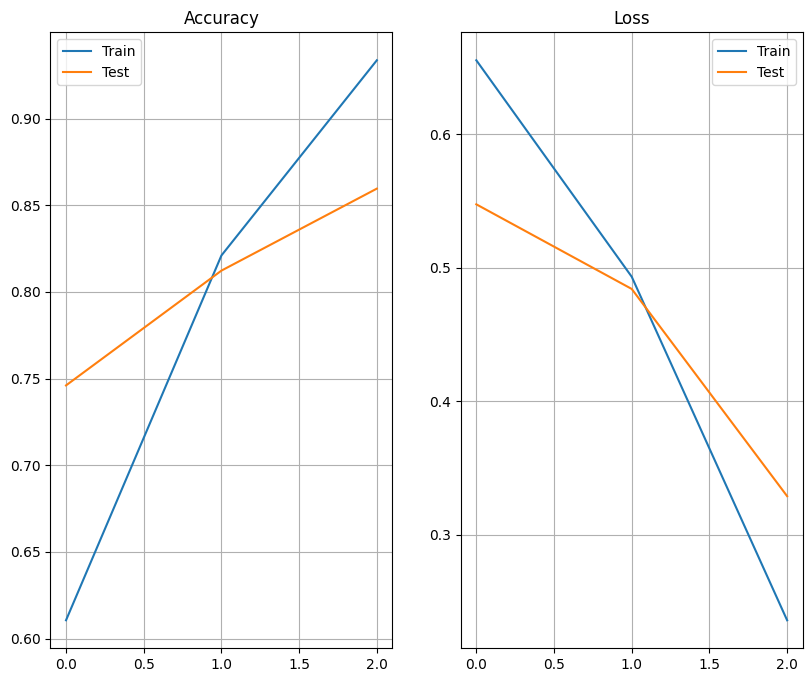

 1/20 ━━━━━━━━━━━━━━━━━━━━ 1s 100ms/step

 3/20 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step 

 6/20 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

 9/20 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

12/20 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

15/20 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step


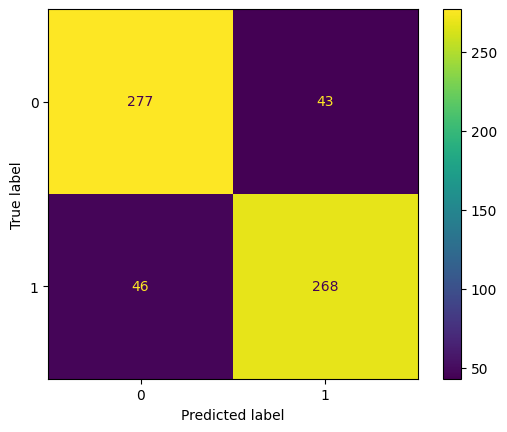

Accuracy: 0.8596214511041009
Precision: 0.8617363344051447
Recall: 0.8535031847133758


Epoch 1/3


 1/67 ━━━━━━━━━━━━━━━━━━━━ 1:01 936ms/step - accuracy: 0.4062 - loss: 0.7055

 2/67 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - accuracy: 0.4297 - loss: 0.7054  

 3/67 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - accuracy: 0.4358 - loss: 0.7067

 4/67 ━━━━━━━━━━━━━━━━━━━━ 8s 138ms/step - accuracy: 0.4460 - loss: 0.7057

 5/67 ━━━━━━━━━━━━━━━━━━━━ 8s 138ms/step - accuracy: 0.4593 - loss: 0.7040

 6/67 ━━━━━━━━━━━━━━━━━━━━ 8s 137ms/step - accuracy: 0.4721 - loss: 0.7024

 7/67 ━━━━━━━━━━━━━━━━━━━━ 8s 137ms/step - accuracy: 0.4812 - loss: 0.7015

 8/67 ━━━━━━━━━━━━━━━━━━━━ 8s 137ms/step - accuracy: 0.4914 - loss: 0.7000

 9/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.4989 - loss: 0.6987

10/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.5049 - loss: 0.6979

11/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.5102 - loss: 0.6971

12/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.5156 - loss: 0.6962

13/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.5203 - loss: 0.6954

14/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.5246 - loss: 0.6945

15/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.5285 - loss: 0.6937

16/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5321 - loss: 0.6930

17/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5354 - loss: 0.6923

18/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5385 - loss: 0.6916

19/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5415 - loss: 0.6908

20/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5446 - loss: 0.6899

21/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5477 - loss: 0.6890

22/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5508 - loss: 0.6881

23/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.5535 - loss: 0.6873

24/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.5558 - loss: 0.6865

25/67 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - accuracy: 0.5579 - loss: 0.6858

26/67 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - accuracy: 0.5599 - loss: 0.6851

27/67 ━━━━━━━━━━━━━━━━━━━━ 5s 136ms/step - accuracy: 0.5618 - loss: 0.6844

28/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.5638 - loss: 0.6837

29/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.5654 - loss: 0.6831

30/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.5670 - loss: 0.6825

31/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.5686 - loss: 0.6818

32/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.5701 - loss: 0.6812

33/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.5715 - loss: 0.6806

34/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.5729 - loss: 0.6801

35/67 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - accuracy: 0.5742 - loss: 0.6795

36/67 ━━━━━━━━━━━━━━━━━━━━ 4s 136ms/step - accuracy: 0.5754 - loss: 0.6790

37/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.5764 - loss: 0.6786

38/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5775 - loss: 0.6781

39/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5786 - loss: 0.6777

40/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5796 - loss: 0.6773

41/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5805 - loss: 0.6769

42/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5812 - loss: 0.6765

43/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5820 - loss: 0.6762

44/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5827 - loss: 0.6759

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.5833 - loss: 0.6756

46/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.5840 - loss: 0.6754

47/67 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - accuracy: 0.5846 - loss: 0.6751

48/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.5852 - loss: 0.6748

49/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.5858 - loss: 0.6746

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.5863 - loss: 0.6743

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - accuracy: 0.5869 - loss: 0.6740

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 136ms/step - accuracy: 0.5874 - loss: 0.6738

53/67 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.5879 - loss: 0.6735

54/67 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.5884 - loss: 0.6732

55/67 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.5888 - loss: 0.6730

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.5893 - loss: 0.6727

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.5898 - loss: 0.6725

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.5903 - loss: 0.6722

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 136ms/step - accuracy: 0.5908 - loss: 0.6719

60/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5913 - loss: 0.6716

61/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5918 - loss: 0.6714

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5923 - loss: 0.6711

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5927 - loss: 0.6708

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5932 - loss: 0.6706

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5937 - loss: 0.6703

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5942 - loss: 0.6700

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step - accuracy: 0.5946 - loss: 0.6697

67/67 ━━━━━━━━━━━━━━━━━━━━ 11s 145ms/step - accuracy: 0.5951 - loss: 0.6695 - val_accuracy: 0.6879 - val_loss: 0.6049


Epoch 2/3


 1/67 ━━━━━━━━━━━━━━━━━━━━ 9s 145ms/step - accuracy: 0.5625 - loss: 0.6655

 2/67 ━━━━━━━━━━━━━━━━━━━━ 9s 139ms/step - accuracy: 0.5938 - loss: 0.6447

 3/67 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - accuracy: 0.6111 - loss: 0.6347

 4/67 ━━━━━━━━━━━━━━━━━━━━ 8s 138ms/step - accuracy: 0.6243 - loss: 0.6253

 5/67 ━━━━━━━━━━━━━━━━━━━━ 8s 138ms/step - accuracy: 0.6332 - loss: 0.6189

 6/67 ━━━━━━━━━━━━━━━━━━━━ 8s 137ms/step - accuracy: 0.6353 - loss: 0.6162

 7/67 ━━━━━━━━━━━━━━━━━━━━ 8s 136ms/step - accuracy: 0.6390 - loss: 0.6133

 8/67 ━━━━━━━━━━━━━━━━━━━━ 8s 137ms/step - accuracy: 0.6426 - loss: 0.6107

 9/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.6464 - loss: 0.6080

10/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.6502 - loss: 0.6055

11/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.6533 - loss: 0.6031

12/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.6568 - loss: 0.6009

13/67 ━━━━━━━━━━━━━━━━━━━━ 7s 136ms/step - accuracy: 0.6605 - loss: 0.5988

14/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.6632 - loss: 0.5970

15/67 ━━━━━━━━━━━━━━━━━━━━ 7s 137ms/step - accuracy: 0.6659 - loss: 0.5954

16/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6686 - loss: 0.5938

17/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6715 - loss: 0.5922

18/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6744 - loss: 0.5907

19/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6772 - loss: 0.5893

20/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6801 - loss: 0.5879

21/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6829 - loss: 0.5866

22/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6854 - loss: 0.5854

23/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.6877 - loss: 0.5843

24/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.6902 - loss: 0.5831

25/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.6926 - loss: 0.5819

26/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.6950 - loss: 0.5808

27/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.6972 - loss: 0.5799

28/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.6993 - loss: 0.5789

29/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.7012 - loss: 0.5780

30/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.7033 - loss: 0.5771

31/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.7053 - loss: 0.5762

32/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.7072 - loss: 0.5753

33/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.7091 - loss: 0.5743

34/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.7108 - loss: 0.5734

35/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.7125 - loss: 0.5726

36/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.7141 - loss: 0.5716

37/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.7158 - loss: 0.5707

38/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7173 - loss: 0.5698

39/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7188 - loss: 0.5689

40/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7201 - loss: 0.5681

41/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7215 - loss: 0.5671

42/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7227 - loss: 0.5663

43/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7239 - loss: 0.5654

44/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7251 - loss: 0.5645

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.7262 - loss: 0.5637

46/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.7272 - loss: 0.5628

47/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.7282 - loss: 0.5620

48/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.7291 - loss: 0.5612

49/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.7300 - loss: 0.5605

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.7309 - loss: 0.5597

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.7317 - loss: 0.5589

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.7325 - loss: 0.5582

53/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.7333 - loss: 0.5575

54/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.7341 - loss: 0.5567

55/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.7349 - loss: 0.5560

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.7356 - loss: 0.5553

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.7363 - loss: 0.5545

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.7370 - loss: 0.5538

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.7377 - loss: 0.5531

60/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7384 - loss: 0.5524

61/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7391 - loss: 0.5517

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7397 - loss: 0.5510

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7404 - loss: 0.5502

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7411 - loss: 0.5495

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7418 - loss: 0.5488

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7424 - loss: 0.5481

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.7431 - loss: 0.5474

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - accuracy: 0.7437 - loss: 0.5467 - val_accuracy: 0.7844 - val_loss: 0.4640


Epoch 3/3


 1/67 ━━━━━━━━━━━━━━━━━━━━ 9s 144ms/step - accuracy: 0.8750 - loss: 0.3201

 2/67 ━━━━━━━━━━━━━━━━━━━━ 9s 141ms/step - accuracy: 0.8828 - loss: 0.3121

 3/67 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - accuracy: 0.8941 - loss: 0.3045

 4/67 ━━━━━━━━━━━━━━━━━━━━ 8s 140ms/step - accuracy: 0.8952 - loss: 0.3039

 5/67 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - accuracy: 0.8986 - loss: 0.3012

 6/67 ━━━━━━━━━━━━━━━━━━━━ 8s 138ms/step - accuracy: 0.8999 - loss: 0.3012

 7/67 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - accuracy: 0.9021 - loss: 0.3006

 8/67 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - accuracy: 0.9031 - loss: 0.3006

 9/67 ━━━━━━━━━━━━━━━━━━━━ 8s 139ms/step - accuracy: 0.9050 - loss: 0.3002

10/67 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - accuracy: 0.9067 - loss: 0.2999

11/67 ━━━━━━━━━━━━━━━━━━━━ 7s 139ms/step - accuracy: 0.9085 - loss: 0.2993

12/67 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.9096 - loss: 0.2990

13/67 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.9104 - loss: 0.2986

14/67 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.9111 - loss: 0.2984

15/67 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.9117 - loss: 0.2984

16/67 ━━━━━━━━━━━━━━━━━━━━ 7s 138ms/step - accuracy: 0.9126 - loss: 0.2981

17/67 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - accuracy: 0.9136 - loss: 0.2976

18/67 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - accuracy: 0.9145 - loss: 0.2971

19/67 ━━━━━━━━━━━━━━━━━━━━ 6s 138ms/step - accuracy: 0.9154 - loss: 0.2965

20/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.9161 - loss: 0.2960

21/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.9168 - loss: 0.2955

22/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.9174 - loss: 0.2949

23/67 ━━━━━━━━━━━━━━━━━━━━ 6s 137ms/step - accuracy: 0.9179 - loss: 0.2944

24/67 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.9182 - loss: 0.2939

25/67 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.9183 - loss: 0.2935

26/67 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.9183 - loss: 0.2932

27/67 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.9180 - loss: 0.2931

28/67 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.9177 - loss: 0.2931

29/67 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - accuracy: 0.9175 - loss: 0.2930

30/67 ━━━━━━━━━━━━━━━━━━━━ 5s 137ms/step - accuracy: 0.9173 - loss: 0.2929

31/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.9172 - loss: 0.2928

32/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.9170 - loss: 0.2928

33/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.9169 - loss: 0.2927

34/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.9169 - loss: 0.2926

35/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.9169 - loss: 0.2925

36/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.9169 - loss: 0.2924

37/67 ━━━━━━━━━━━━━━━━━━━━ 4s 137ms/step - accuracy: 0.9169 - loss: 0.2924

38/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9169 - loss: 0.2923

39/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9170 - loss: 0.2921

40/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9171 - loss: 0.2919

41/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9172 - loss: 0.2917

42/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9174 - loss: 0.2915

43/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9175 - loss: 0.2913

44/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9177 - loss: 0.2910

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 137ms/step - accuracy: 0.9178 - loss: 0.2908

46/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.9180 - loss: 0.2905

47/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.9182 - loss: 0.2902

48/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.9184 - loss: 0.2899

49/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.9186 - loss: 0.2896

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.9188 - loss: 0.2893

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.9190 - loss: 0.2889

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 137ms/step - accuracy: 0.9192 - loss: 0.2886

53/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9193 - loss: 0.2883

54/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9195 - loss: 0.2880

55/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9196 - loss: 0.2876

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9198 - loss: 0.2873

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9199 - loss: 0.2870

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9200 - loss: 0.2867

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - accuracy: 0.9201 - loss: 0.2864

60/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9203 - loss: 0.2861

61/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9204 - loss: 0.2858

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9205 - loss: 0.2855

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9206 - loss: 0.2852

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9207 - loss: 0.2849

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9208 - loss: 0.2845

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9209 - loss: 0.2842

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step - accuracy: 0.9211 - loss: 0.2838

67/67 ━━━━━━━━━━━━━━━━━━━━ 10s 144ms/step - accuracy: 0.9212 - loss: 0.2835 - val_accuracy: 0.8411 - val_loss: 0.3738


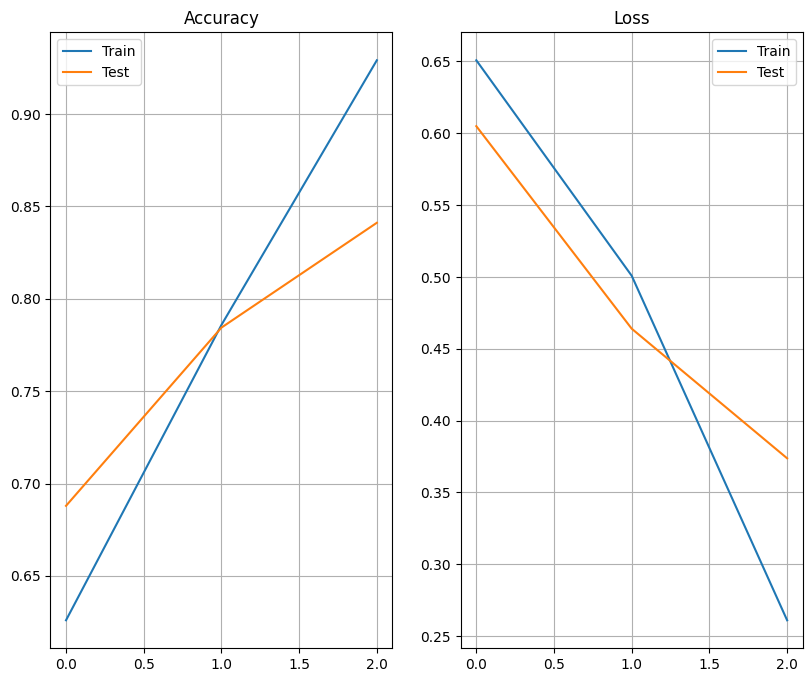

 1/23 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

 4/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

 7/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

10/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

13/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

16/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

19/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

22/23 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step


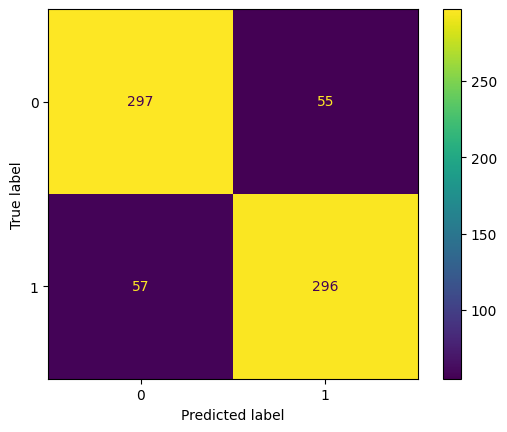

Accuracy: 0.8411347517730496
Precision: 0.8433048433048433
Recall: 0.8385269121813032
Epoch 1/3


 1/53 ━━━━━━━━━━━━━━━━━━━━ 46s 896ms/step - accuracy: 0.5625 - loss: 0.6767

 2/53 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.6016 - loss: 0.6716  

 3/53 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.5885 - loss: 0.6735

 4/53 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step - accuracy: 0.5879 - loss: 0.6724

 5/53 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.5891 - loss: 0.6714

 6/53 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.5916 - loss: 0.6697

 7/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.5957 - loss: 0.6679

 8/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.5984 - loss: 0.6659

 9/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.5994 - loss: 0.6647

10/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.6014 - loss: 0.6633

11/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.6035 - loss: 0.6614

12/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.6062 - loss: 0.6590

13/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.6087 - loss: 0.6568

14/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.6113 - loss: 0.6545

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.6138 - loss: 0.6526

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.6161 - loss: 0.6508

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.6185 - loss: 0.6489

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.6206 - loss: 0.6472

19/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6230 - loss: 0.6454

20/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.6251 - loss: 0.6437

21/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6273 - loss: 0.6421

22/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6290 - loss: 0.6407

23/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6303 - loss: 0.6395

24/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6320 - loss: 0.6381

25/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6334 - loss: 0.6369

26/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6347 - loss: 0.6356

27/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6359 - loss: 0.6344

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6370 - loss: 0.6331

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6381 - loss: 0.6319

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6390 - loss: 0.6309

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6400 - loss: 0.6297

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6410 - loss: 0.6286

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6418 - loss: 0.6275

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.6428 - loss: 0.6264

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.6437 - loss: 0.6253

36/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6446 - loss: 0.6242

37/53 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.6455 - loss: 0.6233

38/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6463 - loss: 0.6223

39/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6470 - loss: 0.6213

40/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6478 - loss: 0.6204

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6486 - loss: 0.6195

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6494 - loss: 0.6185

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6502 - loss: 0.6176

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6510 - loss: 0.6166

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6518 - loss: 0.6157

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6525 - loss: 0.6148

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6531 - loss: 0.6140

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6538 - loss: 0.6132

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6545 - loss: 0.6123

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6551 - loss: 0.6116

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6557 - loss: 0.6109

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6563 - loss: 0.6102

53/53 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.6574 - loss: 0.6089 - val_accuracy: 0.6816 - val_loss: 0.5482


Epoch 2/3


 1/53 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.8125 - loss: 0.4424

 2/53 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.8047 - loss: 0.4498

 3/53 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.7969 - loss: 0.4572

 4/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.7871 - loss: 0.4627

 5/53 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step - accuracy: 0.7859 - loss: 0.4621

 6/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.7869 - loss: 0.4621

 7/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.7893 - loss: 0.4608

 8/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.7922 - loss: 0.4596

 9/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.7941 - loss: 0.4588

10/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.7956 - loss: 0.4582

11/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.7974 - loss: 0.4580

12/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.7995 - loss: 0.4575

13/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8014 - loss: 0.4569

14/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8029 - loss: 0.4566

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8039 - loss: 0.4563

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8049 - loss: 0.4558

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8058 - loss: 0.4552

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.8068 - loss: 0.4544

19/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8079 - loss: 0.4534

20/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8091 - loss: 0.4522

21/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8105 - loss: 0.4509

22/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8117 - loss: 0.4498

23/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8128 - loss: 0.4488

24/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8138 - loss: 0.4479

25/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8148 - loss: 0.4470

26/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8159 - loss: 0.4461

27/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8169 - loss: 0.4454

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8177 - loss: 0.4448

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8185 - loss: 0.4442

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8194 - loss: 0.4436

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8203 - loss: 0.4428

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8212 - loss: 0.4419

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8221 - loss: 0.4411

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8227 - loss: 0.4403

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.8233 - loss: 0.4396

36/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8239 - loss: 0.4388

37/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8244 - loss: 0.4381

38/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8249 - loss: 0.4373

39/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8255 - loss: 0.4364

40/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8260 - loss: 0.4356

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8266 - loss: 0.4348

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8271 - loss: 0.4339

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8277 - loss: 0.4331

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8282 - loss: 0.4323

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8287 - loss: 0.4315

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8291 - loss: 0.4308

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8296 - loss: 0.4300

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8300 - loss: 0.4292

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8305 - loss: 0.4285

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8309 - loss: 0.4277

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8313 - loss: 0.4270

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8317 - loss: 0.4263

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.8321 - loss: 0.4256

53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.8324 - loss: 0.4249 - val_accuracy: 0.8301 - val_loss: 0.4231


Epoch 3/3


 1/53 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - accuracy: 0.9688 - loss: 0.2422

 2/53 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9531 - loss: 0.2452

 3/53 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.9375 - loss: 0.2541

 4/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9355 - loss: 0.2505

 5/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.9334 - loss: 0.2477

 6/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.9315 - loss: 0.2477

 7/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.9311 - loss: 0.2460

 8/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.9299 - loss: 0.2452

 9/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.9288 - loss: 0.2447

10/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9282 - loss: 0.2439

11/53 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.9282 - loss: 0.2425

12/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9279 - loss: 0.2418

13/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9277 - loss: 0.2410

14/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9273 - loss: 0.2406

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9272 - loss: 0.2399

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9269 - loss: 0.2394

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9269 - loss: 0.2388

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9269 - loss: 0.2380

19/53 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.9268 - loss: 0.2377

20/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9267 - loss: 0.2372

21/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9267 - loss: 0.2367

22/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9267 - loss: 0.2361

23/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9267 - loss: 0.2355

24/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9267 - loss: 0.2350

25/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9267 - loss: 0.2345

26/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9267 - loss: 0.2339

27/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9266 - loss: 0.2335

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9263 - loss: 0.2335

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9260 - loss: 0.2333

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9258 - loss: 0.2332

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.9257 - loss: 0.2330

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9255 - loss: 0.2328

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9254 - loss: 0.2325

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9253 - loss: 0.2323

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - accuracy: 0.9252 - loss: 0.2321

36/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9252 - loss: 0.2319

37/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9252 - loss: 0.2317

38/53 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.9252 - loss: 0.2314

39/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9253 - loss: 0.2311

40/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9253 - loss: 0.2308

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9254 - loss: 0.2305

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9254 - loss: 0.2302

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9255 - loss: 0.2299

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9255 - loss: 0.2295

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9255 - loss: 0.2293

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9255 - loss: 0.2290

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9256 - loss: 0.2287

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9256 - loss: 0.2284

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9257 - loss: 0.2281

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9258 - loss: 0.2278

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9258 - loss: 0.2275

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9258 - loss: 0.2273

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9258 - loss: 0.2270

53/53 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.9259 - loss: 0.2267 - val_accuracy: 0.7496 - val_loss: 0.4795


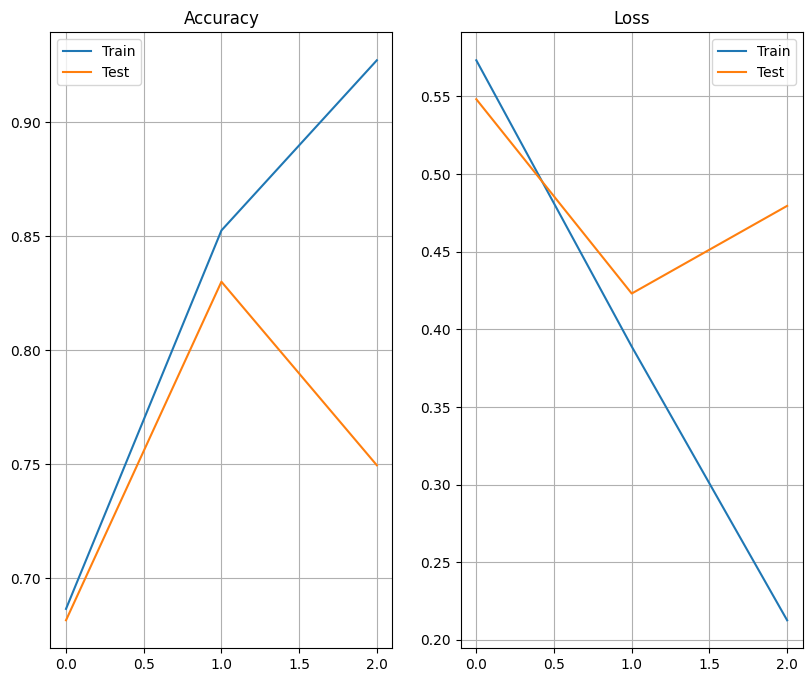

 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step

 6/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

11/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

16/18 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


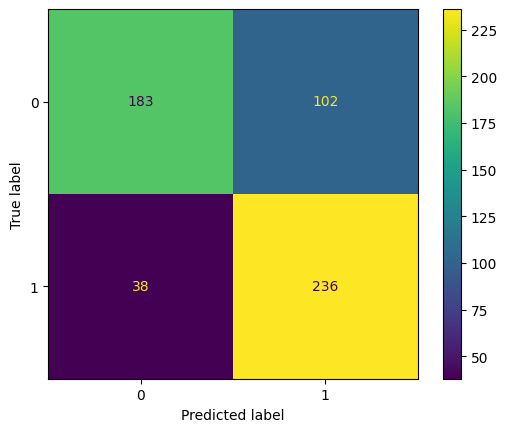

Accuracy: 0.7495527728085868
Precision: 0.6982248520710059
Recall: 0.8613138686131386


Epoch 1/3


 1/48 ━━━━━━━━━━━━━━━━━━━━ 46s 981ms/step - accuracy: 0.5312 - loss: 0.7010

 2/48 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.5312 - loss: 0.6998 

 3/48 ━━━━━━━━━━━━━━━━━━━━ 6s 148ms/step - accuracy: 0.5278 - loss: 0.6953

 4/48 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.5228 - loss: 0.6938

 5/48 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - accuracy: 0.5307 - loss: 0.6903

 6/48 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.5369 - loss: 0.6878

 7/48 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.5418 - loss: 0.6858

 8/48 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 0.5469 - loss: 0.6844

 9/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.5501 - loss: 0.6833

10/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.5523 - loss: 0.6824

11/48 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 0.5548 - loss: 0.6815

12/48 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 0.5569 - loss: 0.6808

13/48 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - accuracy: 0.5581 - loss: 0.6804

14/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.5595 - loss: 0.6800

15/48 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.5607 - loss: 0.6796

16/48 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.5617 - loss: 0.6794

17/48 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.5629 - loss: 0.6790

18/48 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.5641 - loss: 0.6787

19/48 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.5651 - loss: 0.6783

20/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.5662 - loss: 0.6780

21/48 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.5670 - loss: 0.6777

22/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.5675 - loss: 0.6774

23/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.5678 - loss: 0.6773

24/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.5680 - loss: 0.6771

25/48 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - accuracy: 0.5681 - loss: 0.6770

26/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.5683 - loss: 0.6769

27/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.5685 - loss: 0.6767

28/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.5688 - loss: 0.6766

29/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.5690 - loss: 0.6765

30/48 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - accuracy: 0.5692 - loss: 0.6764

31/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.5693 - loss: 0.6763

32/48 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - accuracy: 0.5695 - loss: 0.6762

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - accuracy: 0.5695 - loss: 0.6760

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - accuracy: 0.5694 - loss: 0.6759

35/48 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.5693 - loss: 0.6758

36/48 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.5692 - loss: 0.6757

37/48 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.5691 - loss: 0.6756

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.5692 - loss: 0.6754

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.5693 - loss: 0.6752

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.5695 - loss: 0.6750

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.5698 - loss: 0.6748

42/48 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.5700 - loss: 0.6746

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.5703 - loss: 0.6744

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.5707 - loss: 0.6742

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.5710 - loss: 0.6740

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.5713 - loss: 0.6738

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.5716 - loss: 0.6736

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.5718 - loss: 0.6734

48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - accuracy: 0.5719 - loss: 0.6732 - val_accuracy: 0.6174 - val_loss: 0.6429


Epoch 2/3


 1/48 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.8750 - loss: 0.5380

 2/48 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.8281 - loss: 0.5500

 3/48 ━━━━━━━━━━━━━━━━━━━━ 6s 147ms/step - accuracy: 0.8264 - loss: 0.5552

 4/48 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.8210 - loss: 0.5585

 5/48 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - accuracy: 0.8205 - loss: 0.5568

 6/48 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - accuracy: 0.8174 - loss: 0.5560

 7/48 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - accuracy: 0.8155 - loss: 0.5550

 8/48 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - accuracy: 0.8136 - loss: 0.5530

 9/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.8120 - loss: 0.5523

10/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.8114 - loss: 0.5518

11/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.8107 - loss: 0.5514

12/48 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - accuracy: 0.8098 - loss: 0.5512

13/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.8091 - loss: 0.5509

14/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.8084 - loss: 0.5505

15/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.8078 - loss: 0.5500

16/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.8067 - loss: 0.5498

17/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.8052 - loss: 0.5496

18/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.8039 - loss: 0.5495

19/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.8027 - loss: 0.5493

20/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.8014 - loss: 0.5491

21/48 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - accuracy: 0.8002 - loss: 0.5490

22/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7994 - loss: 0.5489

23/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7989 - loss: 0.5486

24/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7985 - loss: 0.5485

25/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7981 - loss: 0.5483

26/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7975 - loss: 0.5480

27/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7970 - loss: 0.5478

28/48 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7965 - loss: 0.5475

29/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.7962 - loss: 0.5472

30/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.7959 - loss: 0.5469

31/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.7956 - loss: 0.5466

32/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.7954 - loss: 0.5463

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.7950 - loss: 0.5461

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - accuracy: 0.7946 - loss: 0.5458

35/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.7943 - loss: 0.5456

36/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.7938 - loss: 0.5454

37/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.7934 - loss: 0.5452

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.7930 - loss: 0.5450

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.7927 - loss: 0.5448

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.7924 - loss: 0.5446

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - accuracy: 0.7921 - loss: 0.5445

42/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7919 - loss: 0.5443

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7919 - loss: 0.5440

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7918 - loss: 0.5437

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7918 - loss: 0.5434

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7918 - loss: 0.5430

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7918 - loss: 0.5427

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.7918 - loss: 0.5424

48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - accuracy: 0.7917 - loss: 0.5422 - val_accuracy: 0.6943 - val_loss: 0.5929


Epoch 3/3


 1/48 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - accuracy: 0.8750 - loss: 0.4933

 2/48 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - accuracy: 0.8906 - loss: 0.4801

 3/48 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - accuracy: 0.8958 - loss: 0.4676

 4/48 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - accuracy: 0.9004 - loss: 0.4635

 5/48 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - accuracy: 0.9053 - loss: 0.4589

 6/48 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - accuracy: 0.9081 - loss: 0.4549

 7/48 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - accuracy: 0.9104 - loss: 0.4514

 8/48 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - accuracy: 0.9118 - loss: 0.4484

 9/48 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - accuracy: 0.9135 - loss: 0.4463

10/48 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - accuracy: 0.9143 - loss: 0.4447

11/48 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - accuracy: 0.9157 - loss: 0.4431

12/48 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - accuracy: 0.9171 - loss: 0.4419

13/48 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - accuracy: 0.9184 - loss: 0.4407

14/48 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - accuracy: 0.9196 - loss: 0.4397

15/48 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.9210 - loss: 0.4387

16/48 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.9219 - loss: 0.4380

17/48 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.9226 - loss: 0.4373

18/48 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.9228 - loss: 0.4369

19/48 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.9232 - loss: 0.4364

20/48 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.9234 - loss: 0.4359

21/48 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.9237 - loss: 0.4354

22/48 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - accuracy: 0.9237 - loss: 0.4350

23/48 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - accuracy: 0.9238 - loss: 0.4346

24/48 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - accuracy: 0.9240 - loss: 0.4342

25/48 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - accuracy: 0.9241 - loss: 0.4337

26/48 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - accuracy: 0.9242 - loss: 0.4333

27/48 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - accuracy: 0.9241 - loss: 0.4328

28/48 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - accuracy: 0.9242 - loss: 0.4321

29/48 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - accuracy: 0.9242 - loss: 0.4314

30/48 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - accuracy: 0.9243 - loss: 0.4308

31/48 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - accuracy: 0.9243 - loss: 0.4302

32/48 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - accuracy: 0.9244 - loss: 0.4295

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - accuracy: 0.9245 - loss: 0.4289

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 151ms/step - accuracy: 0.9246 - loss: 0.4282

35/48 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9246 - loss: 0.4277

36/48 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9246 - loss: 0.4272

37/48 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9245 - loss: 0.4267

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9246 - loss: 0.4262

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9245 - loss: 0.4257

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9245 - loss: 0.4252

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 151ms/step - accuracy: 0.9245 - loss: 0.4247

42/48 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9245 - loss: 0.4243

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9245 - loss: 0.4238

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9245 - loss: 0.4233

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9245 - loss: 0.4228

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9244 - loss: 0.4224

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - accuracy: 0.9244 - loss: 0.4219

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9244 - loss: 0.4215

48/48 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - accuracy: 0.9243 - loss: 0.4210 - val_accuracy: 0.7081 - val_loss: 0.5573


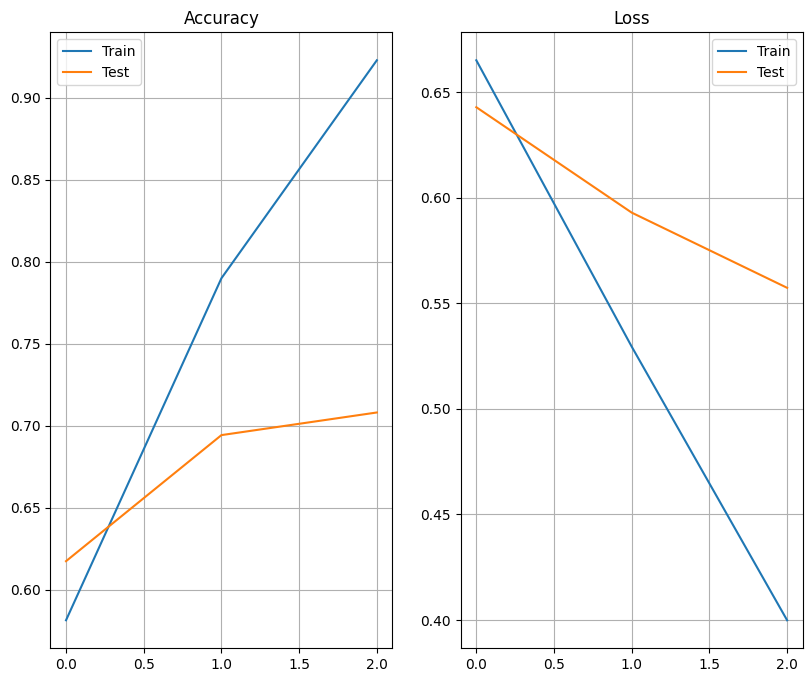

 1/16 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step

 4/16 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

 7/16 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

10/16 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

13/16 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


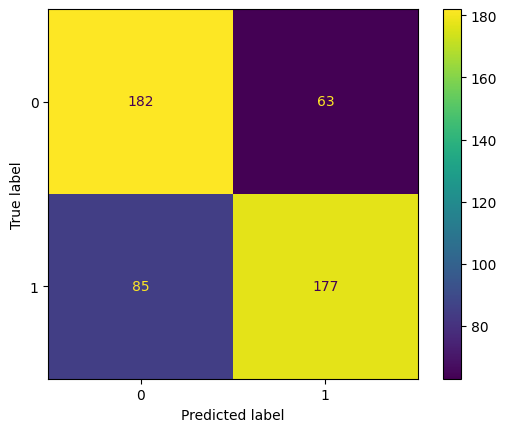

Accuracy: 0.7080867850098619
Precision: 0.7375
Recall: 0.6755725190839694


Epoch 1/3


  1/140 ━━━━━━━━━━━━━━━━━━━━ 2:05 906ms/step - accuracy: 0.3750 - loss: 0.7149

  2/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.4062 - loss: 0.7084  

  3/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.3993 - loss: 0.7115

  4/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.3971 - loss: 0.7139

  5/140 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.3977 - loss: 0.7144

  6/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.3965 - loss: 0.7145

  7/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.3966 - loss: 0.7141

  8/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.3993 - loss: 0.7136

  9/140 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - accuracy: 0.4032 - loss: 0.7132

 10/140 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - accuracy: 0.4075 - loss: 0.7124

 11/140 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - accuracy: 0.4121 - loss: 0.7116

 12/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4159 - loss: 0.7109

 13/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4198 - loss: 0.7102

 14/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4230 - loss: 0.7095

 15/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4260 - loss: 0.7089

 16/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4285 - loss: 0.7084

 17/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4304 - loss: 0.7079

 18/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4321 - loss: 0.7075

 19/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4340 - loss: 0.7071

 20/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4359 - loss: 0.7067

 21/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.4376 - loss: 0.7064

 22/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4394 - loss: 0.7060

 23/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4409 - loss: 0.7057

 24/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4422 - loss: 0.7055

 25/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4433 - loss: 0.7052

 26/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4446 - loss: 0.7049

 27/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4459 - loss: 0.7047

 28/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4470 - loss: 0.7044

 29/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4481 - loss: 0.7042

 30/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4491 - loss: 0.7040

 31/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4503 - loss: 0.7037

 32/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.4514 - loss: 0.7035

 33/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4526 - loss: 0.7033 

 34/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4537 - loss: 0.7031

 35/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4549 - loss: 0.7029

 36/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4560 - loss: 0.7027

 37/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4570 - loss: 0.7025

 38/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4580 - loss: 0.7023

 39/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4590 - loss: 0.7022

 40/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4600 - loss: 0.7020

 41/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4610 - loss: 0.7018

 42/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4621 - loss: 0.7016

 43/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.4631 - loss: 0.7015

 44/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4640 - loss: 0.7013

 45/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4650 - loss: 0.7012

 46/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4659 - loss: 0.7010

 47/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4668 - loss: 0.7009

 48/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4676 - loss: 0.7007

 49/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4684 - loss: 0.7005

 50/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4693 - loss: 0.7004

 51/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4702 - loss: 0.7002

 52/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4710 - loss: 0.7001

 53/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.4718 - loss: 0.7000

 54/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4726 - loss: 0.6998

 55/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4733 - loss: 0.6997

 56/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4740 - loss: 0.6996

 57/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4746 - loss: 0.6995

 58/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4752 - loss: 0.6993

 59/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4758 - loss: 0.6992

 60/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4764 - loss: 0.6991

 61/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4769 - loss: 0.6990

 62/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4774 - loss: 0.6989

 63/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4780 - loss: 0.6988

 64/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.4785 - loss: 0.6987

 65/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4790 - loss: 0.6986

 66/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4795 - loss: 0.6985

 67/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4800 - loss: 0.6984

 68/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4805 - loss: 0.6983

 69/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4810 - loss: 0.6982

 70/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4815 - loss: 0.6981

 71/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4820 - loss: 0.6980

 72/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4825 - loss: 0.6979

 73/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4830 - loss: 0.6978

 74/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4835 - loss: 0.6977

 75/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.4839 - loss: 0.6976

 76/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4844 - loss: 0.6975

 77/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4848 - loss: 0.6975

 78/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4853 - loss: 0.6974

 79/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4857 - loss: 0.6973

 80/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4861 - loss: 0.6972

 81/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4865 - loss: 0.6971

 82/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4869 - loss: 0.6970

 83/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4873 - loss: 0.6970

 84/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4877 - loss: 0.6969

 85/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4880 - loss: 0.6968

 86/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.4884 - loss: 0.6967

 87/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4887 - loss: 0.6967

 88/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4890 - loss: 0.6966

 89/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4894 - loss: 0.6965

 90/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4897 - loss: 0.6965

 91/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4900 - loss: 0.6964

 92/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4903 - loss: 0.6963

 93/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4907 - loss: 0.6962

 94/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4910 - loss: 0.6962

 95/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4913 - loss: 0.6961

 96/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.4916 - loss: 0.6960

 97/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4919 - loss: 0.6960

 98/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4922 - loss: 0.6959

 99/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4926 - loss: 0.6958

100/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4929 - loss: 0.6957

101/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4932 - loss: 0.6957

102/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4935 - loss: 0.6956

103/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4938 - loss: 0.6956

104/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4941 - loss: 0.6955

105/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4944 - loss: 0.6954

106/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4946 - loss: 0.6954

107/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.4949 - loss: 0.6953

108/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4952 - loss: 0.6952

109/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4955 - loss: 0.6952

110/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4957 - loss: 0.6951

111/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4959 - loss: 0.6951

112/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4962 - loss: 0.6950

113/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4964 - loss: 0.6950

114/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4967 - loss: 0.6949

115/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4970 - loss: 0.6949

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4972 - loss: 0.6948

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4975 - loss: 0.6947

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.4978 - loss: 0.6947

119/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4980 - loss: 0.6946

120/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4983 - loss: 0.6946

121/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4986 - loss: 0.6945

122/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4989 - loss: 0.6945

123/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4991 - loss: 0.6944

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4994 - loss: 0.6943

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4997 - loss: 0.6943

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.4999 - loss: 0.6942

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.5002 - loss: 0.6942

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.5005 - loss: 0.6941

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.5007 - loss: 0.6941

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5010 - loss: 0.6940

131/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5012 - loss: 0.6939

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5015 - loss: 0.6939

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5017 - loss: 0.6938

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5020 - loss: 0.6938

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5022 - loss: 0.6937

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5025 - loss: 0.6937

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5027 - loss: 0.6936

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5030 - loss: 0.6935

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5032 - loss: 0.6935

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.5034 - loss: 0.6934

140/140 ━━━━━━━━━━━━━━━━━━━━ 15s 99ms/step - accuracy: 0.5037 - loss: 0.6934 - val_accuracy: 0.6152 - val_loss: 0.6668


Epoch 2/3


  1/140 ━━━━━━━━━━━━━━━━━━━━ 14s 101ms/step - accuracy: 0.7500 - loss: 0.6164

  2/140 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - accuracy: 0.7734 - loss: 0.6114 

  3/140 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - accuracy: 0.7899 - loss: 0.6063

  4/140 ━━━━━━━━━━━━━━━━━━━━ 12s 91ms/step - accuracy: 0.7975 - loss: 0.6056

  5/140 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - accuracy: 0.8055 - loss: 0.6042

  6/140 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - accuracy: 0.8136 - loss: 0.6030

  7/140 ━━━━━━━━━━━━━━━━━━━━ 12s 92ms/step - accuracy: 0.8160 - loss: 0.6027

  8/140 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - accuracy: 0.8166 - loss: 0.6027

  9/140 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - accuracy: 0.8180 - loss: 0.6026

 10/140 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - accuracy: 0.8203 - loss: 0.6027

 11/140 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - accuracy: 0.8224 - loss: 0.6029

 12/140 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - accuracy: 0.8244 - loss: 0.6030

 13/140 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - accuracy: 0.8259 - loss: 0.6031

 14/140 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - accuracy: 0.8270 - loss: 0.6032

 15/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.8276 - loss: 0.6032

 16/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.8281 - loss: 0.6033

 17/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.8288 - loss: 0.6032

 18/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.8295 - loss: 0.6031

 19/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.8304 - loss: 0.6030

 20/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.8313 - loss: 0.6028

 21/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.8321 - loss: 0.6026

 22/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.8329 - loss: 0.6023

 23/140 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.8338 - loss: 0.6020

 24/140 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.8346 - loss: 0.6017

 25/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.8353 - loss: 0.6014

 26/140 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.8356 - loss: 0.6012

 27/140 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.8361 - loss: 0.6009

 28/140 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.8366 - loss: 0.6006

 29/140 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.8368 - loss: 0.6003

 30/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.8371 - loss: 0.6000

 31/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.8375 - loss: 0.5997

 32/140 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - accuracy: 0.8379 - loss: 0.5993 

 33/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8383 - loss: 0.5990

 34/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8387 - loss: 0.5986

 35/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8390 - loss: 0.5983

 36/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8394 - loss: 0.5979

 37/140 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - accuracy: 0.8398 - loss: 0.5975

 38/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8403 - loss: 0.5972

 39/140 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - accuracy: 0.8406 - loss: 0.5969

 40/140 ━━━━━━━━━━━━━━━━━━━━ 9s 92ms/step - accuracy: 0.8410 - loss: 0.5965

 41/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8413 - loss: 0.5962

 42/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.8416 - loss: 0.5958

 43/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8419 - loss: 0.5955

 44/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8422 - loss: 0.5951

 45/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8425 - loss: 0.5948

 46/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8427 - loss: 0.5944

 47/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8428 - loss: 0.5941

 48/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8430 - loss: 0.5938

 49/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8431 - loss: 0.5934

 50/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8432 - loss: 0.5931

 51/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8432 - loss: 0.5928

 52/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8433 - loss: 0.5925

 53/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.8434 - loss: 0.5922

 54/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8435 - loss: 0.5918

 55/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8435 - loss: 0.5915

 56/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8435 - loss: 0.5912

 57/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8436 - loss: 0.5908

 58/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8436 - loss: 0.5905

 59/140 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - accuracy: 0.8437 - loss: 0.5902

 60/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8437 - loss: 0.5898

 61/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.8437 - loss: 0.5895

 62/140 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - accuracy: 0.8437 - loss: 0.5892

 63/140 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - accuracy: 0.8437 - loss: 0.5888

 64/140 ━━━━━━━━━━━━━━━━━━━━ 7s 92ms/step - accuracy: 0.8437 - loss: 0.5885

 65/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8437 - loss: 0.5882

 66/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8437 - loss: 0.5878

 67/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8437 - loss: 0.5875

 68/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5872

 69/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5869

 70/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5865

 71/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5862

 72/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5859

 73/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5855

 74/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5852

 75/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.8438 - loss: 0.5848

 76/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8438 - loss: 0.5844

 77/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8438 - loss: 0.5841

 78/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8438 - loss: 0.5837

 79/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8438 - loss: 0.5834

 80/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8438 - loss: 0.5830

 81/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8439 - loss: 0.5827

 82/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8439 - loss: 0.5823

 83/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8439 - loss: 0.5820

 84/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8438 - loss: 0.5816

 85/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8439 - loss: 0.5813

 86/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.8439 - loss: 0.5809

 87/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5806

 88/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5803

 89/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5799

 90/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5796

 91/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5792

 92/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5789

 93/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5785

 94/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5782

 95/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5779

 96/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.8438 - loss: 0.5775

 97/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8437 - loss: 0.5772

 98/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8437 - loss: 0.5769

 99/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8437 - loss: 0.5765

100/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8437 - loss: 0.5762

101/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8436 - loss: 0.5758

102/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8436 - loss: 0.5755

103/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8436 - loss: 0.5751

104/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8436 - loss: 0.5748

105/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8436 - loss: 0.5745

106/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8435 - loss: 0.5741

107/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.8435 - loss: 0.5738

108/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8434 - loss: 0.5735

109/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8434 - loss: 0.5732

110/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8434 - loss: 0.5728

111/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8434 - loss: 0.5725

112/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8433 - loss: 0.5722

113/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8433 - loss: 0.5719

114/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8433 - loss: 0.5716

115/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8432 - loss: 0.5713

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8432 - loss: 0.5709

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8432 - loss: 0.5706

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.8431 - loss: 0.5703

119/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8431 - loss: 0.5700

120/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8431 - loss: 0.5697

121/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8430 - loss: 0.5694

122/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8430 - loss: 0.5691

123/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8429 - loss: 0.5688

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8429 - loss: 0.5685

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8429 - loss: 0.5681

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8429 - loss: 0.5678

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8429 - loss: 0.5675

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8429 - loss: 0.5672

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.8429 - loss: 0.5668

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5665

131/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5662

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5659

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5655

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5652

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5648

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5645

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5642

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5638

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5635

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.8429 - loss: 0.5631

140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - accuracy: 0.8429 - loss: 0.5628 - val_accuracy: 0.7170 - val_loss: 0.5472


Epoch 3/3


  1/140 ━━━━━━━━━━━━━━━━━━━━ 14s 104ms/step - accuracy: 0.8750 - loss: 0.3014

  2/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.8906 - loss: 0.3083 

  3/140 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.9028 - loss: 0.3026

  4/140 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.9095 - loss: 0.2944

  5/140 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.9139 - loss: 0.2912

  6/140 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.9169 - loss: 0.2899

  7/140 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.9199 - loss: 0.2877

  8/140 ━━━━━━━━━━━━━━━━━━━━ 12s 95ms/step - accuracy: 0.9206 - loss: 0.2861

  9/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.9194 - loss: 0.2861

 10/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.9184 - loss: 0.2866

 11/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.9181 - loss: 0.2864

 12/140 ━━━━━━━━━━━━━━━━━━━━ 12s 94ms/step - accuracy: 0.9179 - loss: 0.2858

 13/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.9183 - loss: 0.2851

 14/140 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - accuracy: 0.9191 - loss: 0.2842

 15/140 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - accuracy: 0.9193 - loss: 0.2836

 16/140 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - accuracy: 0.9196 - loss: 0.2829

 17/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.9199 - loss: 0.2820

 18/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.9200 - loss: 0.2813

 19/140 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - accuracy: 0.9202 - loss: 0.2806

 20/140 ━━━━━━━━━━━━━━━━━━━━ 11s 94ms/step - accuracy: 0.9206 - loss: 0.2799

 21/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.9209 - loss: 0.2791

 22/140 ━━━━━━━━━━━━━━━━━━━━ 11s 93ms/step - accuracy: 0.9212 - loss: 0.2783

 23/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9217 - loss: 0.2775

 24/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9221 - loss: 0.2766

 25/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9225 - loss: 0.2758

 26/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9229 - loss: 0.2751

 27/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9232 - loss: 0.2744

 28/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9234 - loss: 0.2738

 29/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9236 - loss: 0.2732

 30/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9239 - loss: 0.2726

 31/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9242 - loss: 0.2720

 32/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9246 - loss: 0.2714

 33/140 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - accuracy: 0.9248 - loss: 0.2708

 34/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9251 - loss: 0.2702 

 35/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9254 - loss: 0.2696

 36/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9257 - loss: 0.2691

 37/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9259 - loss: 0.2685

 38/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9261 - loss: 0.2680

 39/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9264 - loss: 0.2675

 40/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9267 - loss: 0.2670

 41/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9269 - loss: 0.2665

 42/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9272 - loss: 0.2661

 43/140 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9275 - loss: 0.2655

 44/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9277 - loss: 0.2651

 45/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9280 - loss: 0.2646

 46/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9282 - loss: 0.2641

 47/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9285 - loss: 0.2636

 48/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9287 - loss: 0.2632

 49/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9289 - loss: 0.2627

 50/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9291 - loss: 0.2623

 51/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9293 - loss: 0.2619

 52/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9294 - loss: 0.2615

 53/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9296 - loss: 0.2611

 54/140 ━━━━━━━━━━━━━━━━━━━━ 8s 93ms/step - accuracy: 0.9299 - loss: 0.2607

 55/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9300 - loss: 0.2602

 56/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9302 - loss: 0.2598

 57/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9304 - loss: 0.2594

 58/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9305 - loss: 0.2590

 59/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9307 - loss: 0.2586

 60/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9308 - loss: 0.2582

 61/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9310 - loss: 0.2578

 62/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9311 - loss: 0.2575

 63/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9313 - loss: 0.2571

 64/140 ━━━━━━━━━━━━━━━━━━━━ 7s 93ms/step - accuracy: 0.9314 - loss: 0.2567

 65/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9315 - loss: 0.2564

 66/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9316 - loss: 0.2560

 67/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9318 - loss: 0.2557

 68/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9319 - loss: 0.2553

 69/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9320 - loss: 0.2550

 70/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9321 - loss: 0.2546

 71/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9322 - loss: 0.2543

 72/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9323 - loss: 0.2540

 73/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9324 - loss: 0.2536

 74/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9326 - loss: 0.2533

 75/140 ━━━━━━━━━━━━━━━━━━━━ 6s 93ms/step - accuracy: 0.9327 - loss: 0.2530

 76/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9328 - loss: 0.2527

 77/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9328 - loss: 0.2524

 78/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9329 - loss: 0.2521

 79/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9330 - loss: 0.2518

 80/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9331 - loss: 0.2515

 81/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9331 - loss: 0.2513

 82/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9332 - loss: 0.2511

 83/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9332 - loss: 0.2508

 84/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9332 - loss: 0.2506

 85/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9333 - loss: 0.2504

 86/140 ━━━━━━━━━━━━━━━━━━━━ 5s 93ms/step - accuracy: 0.9333 - loss: 0.2502

 87/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9333 - loss: 0.2499

 88/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9334 - loss: 0.2497

 89/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9334 - loss: 0.2495

 90/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9334 - loss: 0.2493

 91/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9335 - loss: 0.2491

 92/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9335 - loss: 0.2489

 93/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9335 - loss: 0.2488

 94/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9335 - loss: 0.2486

 95/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9335 - loss: 0.2484

 96/140 ━━━━━━━━━━━━━━━━━━━━ 4s 93ms/step - accuracy: 0.9335 - loss: 0.2482

 97/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2481

 98/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2479

 99/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2477

100/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2476

101/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2474

102/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2472

103/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2471

104/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2469

105/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9335 - loss: 0.2467

106/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9334 - loss: 0.2466

107/140 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - accuracy: 0.9334 - loss: 0.2464

108/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9334 - loss: 0.2463

109/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9334 - loss: 0.2461

110/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9334 - loss: 0.2459

111/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9334 - loss: 0.2457

112/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9334 - loss: 0.2456

113/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9334 - loss: 0.2454

114/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9335 - loss: 0.2452

115/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9335 - loss: 0.2450

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9335 - loss: 0.2448

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9335 - loss: 0.2447

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 93ms/step - accuracy: 0.9335 - loss: 0.2445

119/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9336 - loss: 0.2443

120/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9336 - loss: 0.2441

121/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9336 - loss: 0.2439

122/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9336 - loss: 0.2437

123/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9337 - loss: 0.2435

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9337 - loss: 0.2433

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9337 - loss: 0.2431

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9337 - loss: 0.2430

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9338 - loss: 0.2428

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9338 - loss: 0.2426

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - accuracy: 0.9338 - loss: 0.2424

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9339 - loss: 0.2422

131/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9339 - loss: 0.2420

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9339 - loss: 0.2418

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9339 - loss: 0.2416

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9340 - loss: 0.2415

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9340 - loss: 0.2413

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9340 - loss: 0.2411

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9340 - loss: 0.2409

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9341 - loss: 0.2407

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9341 - loss: 0.2405

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.9341 - loss: 0.2404

140/140 ━━━━━━━━━━━━━━━━━━━━ 14s 98ms/step - accuracy: 0.9341 - loss: 0.2402 - val_accuracy: 0.6685 - val_loss: 0.6943


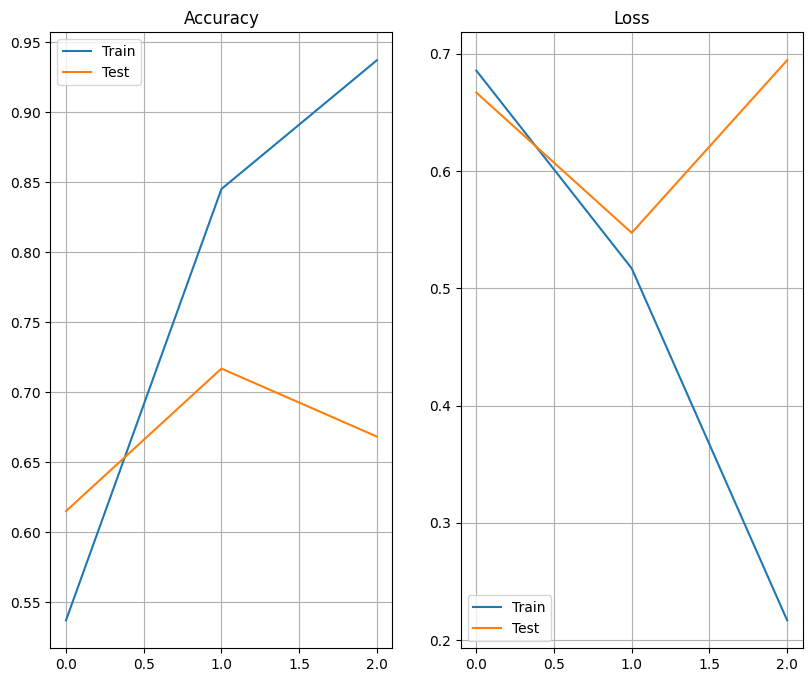

 1/47 ━━━━━━━━━━━━━━━━━━━━ 3s 85ms/step

 4/47 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

 8/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

12/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

16/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

20/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

24/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

28/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

32/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

36/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

40/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

44/47 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step

47/47 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step


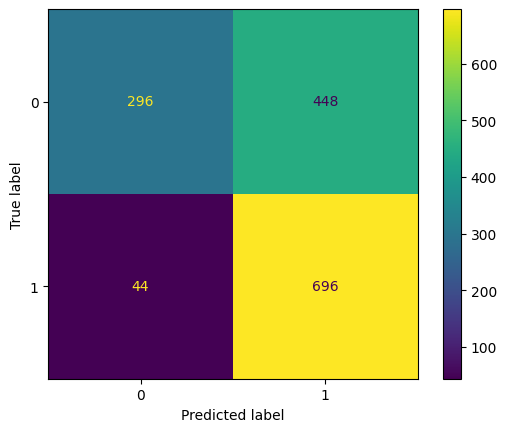

Accuracy: 0.6684636118598383
Precision: 0.6083916083916084
Recall: 0.9405405405405406
Average accuracy: 0.7653718745110875
Average precision: 0.7498315276345204
Average recall: 0.8338914050264655


In [27]:
accuracy = []
precision = []
recall = []
for dataset in chosen_datasets:
    df = pd.read_csv(os.path.join("datasets", dataset))
    X_train, X_test, y_train, y_test = train_test_split(df["text"].values, df["label"].values, test_size=0.25, random_state=1)
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(X_train)
    sequences = tokenizer.texts_to_sequences(X_train)
    max_length = max([len(seq) for seq in sequences])
    padded_sequences = pad_sequences(sequences, maxlen=max_length)
    new_sequences = tokenizer.texts_to_sequences(X_test)
    new_padded_sequences = pad_sequences(new_sequences, maxlen=max_length)

    model = Sequential()
    model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=32))
    model.add(SimpleRNN(32))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    epochs = 3
    history = model.fit(padded_sequences, y_train, validation_data=(new_padded_sequences, y_test), epochs=epochs)
    print_metrics(history, epochs=epochs)

    predictions = model.predict(new_padded_sequences)
    correct = 0
    predicted_labels = []
    for i in range(len(predictions)):
        prediction_label = 1 if predictions[i] > 0.5 else 0
        predicted_labels.append(prediction_label)
        if y_test[i] == prediction_label:
            correct += 1
    print_conf_matrix(y_test, predicted_labels)
    accuracy.append(correct / len(predictions))
    print(f"Accuracy: {correct / len(predictions)}")
    print(f"Precision: {precision_score(y_test, predicted_labels)}")
    precision.append(precision_score(y_test, predicted_labels))
    print(f"Recall: {recall_score(y_test, predicted_labels)}")
    recall.append(recall_score(y_test, predicted_labels))
print(f"Average accuracy: {np.average(accuracy)}")
print(f"Average precision: {np.average(precision)}")
print(f"Average recall: {np.average(recall)}")

In [28]:
from tensorflow.keras.layers import LSTM

Epoch 1/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 1:20 1s/step - accuracy: 0.3438 - loss: 0.6944

 2/60 ━━━━━━━━━━━━━━━━━━━━ 12s 211ms/step - accuracy: 0.3750 - loss: 0.6945

 3/60 ━━━━━━━━━━━━━━━━━━━━ 11s 210ms/step - accuracy: 0.3819 - loss: 0.6946

 4/60 ━━━━━━━━━━━━━━━━━━━━ 11s 211ms/step - accuracy: 0.3997 - loss: 0.6945

 5/60 ━━━━━━━━━━━━━━━━━━━━ 11s 208ms/step - accuracy: 0.4110 - loss: 0.6944

 6/60 ━━━━━━━━━━━━━━━━━━━━ 11s 208ms/step - accuracy: 0.4146 - loss: 0.6944

 7/60 ━━━━━━━━━━━━━━━━━━━━ 10s 207ms/step - accuracy: 0.4210 - loss: 0.6943

 8/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.4260 - loss: 0.6943

 9/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.4327 - loss: 0.6942

10/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.4394 - loss: 0.6941

11/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.4465 - loss: 0.6940

12/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.4531 - loss: 0.6939 

13/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.4595 - loss: 0.6938

14/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.4659 - loss: 0.6937

15/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.4725 - loss: 0.6936

16/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.4796 - loss: 0.6935

17/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.4856 - loss: 0.6934

18/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.4911 - loss: 0.6933

19/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.4961 - loss: 0.6933

20/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.5007 - loss: 0.6932

21/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.5052 - loss: 0.6931

22/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.5097 - loss: 0.6930

23/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.5142 - loss: 0.6930

24/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.5188 - loss: 0.6929

25/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.5232 - loss: 0.6928

26/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.5273 - loss: 0.6927

27/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.5312 - loss: 0.6926

28/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.5348 - loss: 0.6926

29/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.5382 - loss: 0.6925

30/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.5413 - loss: 0.6924

31/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.5444 - loss: 0.6923

32/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.5476 - loss: 0.6922

33/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.5506 - loss: 0.6921

34/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.5536 - loss: 0.6920

35/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.5564 - loss: 0.6919

36/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.5592 - loss: 0.6917

37/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.5618 - loss: 0.6916

38/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.5642 - loss: 0.6915

39/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.5666 - loss: 0.6914

40/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.5689 - loss: 0.6912

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.5713 - loss: 0.6911

42/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.5735 - loss: 0.6909

43/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.5755 - loss: 0.6907

44/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.5776 - loss: 0.6906

45/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.5795 - loss: 0.6903

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.5813 - loss: 0.6902

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.5830 - loss: 0.6900

48/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.5846 - loss: 0.6898

49/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.5863 - loss: 0.6896

50/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.5879 - loss: 0.6894

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.5895 - loss: 0.6891

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.5910 - loss: 0.6889

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.5926 - loss: 0.6886

54/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.5941 - loss: 0.6883

55/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.5957 - loss: 0.6880

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.5972 - loss: 0.6877

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.5988 - loss: 0.6873

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.6003 - loss: 0.6869

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.6018 - loss: 0.6865

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.6032 - loss: 0.6861

60/60 ━━━━━━━━━━━━━━━━━━━━ 14s 222ms/step - accuracy: 0.6046 - loss: 0.6858 - val_accuracy: 0.5000 - val_loss: 0.8668


Epoch 2/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 12s 208ms/step - accuracy: 0.5312 - loss: 0.8405

 2/60 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - accuracy: 0.5234 - loss: 0.8308

 3/60 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.5122 - loss: 0.8319

 4/60 ━━━━━━━━━━━━━━━━━━━━ 11s 203ms/step - accuracy: 0.5013 - loss: 0.8264

 5/60 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.5123 - loss: 0.8080

 6/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.5250 - loss: 0.7899

 7/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.5374 - loss: 0.7736

 8/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.5503 - loss: 0.7578

 9/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.5628 - loss: 0.7440

10/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.5747 - loss: 0.7315

11/60 ━━━━━━━━━━━━━━━━━━━━ 9s 203ms/step - accuracy: 0.5857 - loss: 0.7204 

12/60 ━━━━━━━━━━━━━━━━━━━━ 9s 203ms/step - accuracy: 0.5957 - loss: 0.7103

13/60 ━━━━━━━━━━━━━━━━━━━━ 9s 203ms/step - accuracy: 0.6054 - loss: 0.7013

14/60 ━━━━━━━━━━━━━━━━━━━━ 9s 203ms/step - accuracy: 0.6147 - loss: 0.6928

15/60 ━━━━━━━━━━━━━━━━━━━━ 9s 202ms/step - accuracy: 0.6231 - loss: 0.6850

16/60 ━━━━━━━━━━━━━━━━━━━━ 8s 202ms/step - accuracy: 0.6306 - loss: 0.6778

17/60 ━━━━━━━━━━━━━━━━━━━━ 8s 203ms/step - accuracy: 0.6370 - loss: 0.6716

18/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.6432 - loss: 0.6657

19/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.6491 - loss: 0.6602

20/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.6548 - loss: 0.6549

21/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.6603 - loss: 0.6499

22/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.6658 - loss: 0.6450

23/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.6710 - loss: 0.6403

24/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.6759 - loss: 0.6359

25/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.6805 - loss: 0.6317

26/60 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.6849 - loss: 0.6276

27/60 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.6891 - loss: 0.6236

28/60 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.6931 - loss: 0.6199

29/60 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.6970 - loss: 0.6162

30/60 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.7007 - loss: 0.6126

31/60 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.7044 - loss: 0.6091

32/60 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.7078 - loss: 0.6056

33/60 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.7111 - loss: 0.6023

34/60 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.7141 - loss: 0.5992

35/60 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.7170 - loss: 0.5962

36/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.7198 - loss: 0.5933

37/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.7225 - loss: 0.5904

38/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.7250 - loss: 0.5876

39/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.7275 - loss: 0.5848

40/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.7300 - loss: 0.5821

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.7323 - loss: 0.5793

42/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.7346 - loss: 0.5767

43/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.7369 - loss: 0.5740

44/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.7391 - loss: 0.5714

45/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.7412 - loss: 0.5689

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.7432 - loss: 0.5664

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.7451 - loss: 0.5641

48/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.7470 - loss: 0.5617

49/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.7489 - loss: 0.5594

50/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.7506 - loss: 0.5572

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.7523 - loss: 0.5550

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.7540 - loss: 0.5528

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.7556 - loss: 0.5507

54/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.7571 - loss: 0.5486

55/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.7586 - loss: 0.5466

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7601 - loss: 0.5445

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7616 - loss: 0.5425

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7630 - loss: 0.5405

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7644 - loss: 0.5386

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7657 - loss: 0.5368

60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 220ms/step - accuracy: 0.7669 - loss: 0.5350 - val_accuracy: 0.8817 - val_loss: 0.3046


Epoch 3/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 12s 213ms/step - accuracy: 0.9062 - loss: 0.2917

 2/60 ━━━━━━━━━━━━━━━━━━━━ 11s 193ms/step - accuracy: 0.9062 - loss: 0.2916

 3/60 ━━━━━━━━━━━━━━━━━━━━ 11s 201ms/step - accuracy: 0.9167 - loss: 0.2805

 4/60 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - accuracy: 0.9199 - loss: 0.2766

 5/60 ━━━━━━━━━━━━━━━━━━━━ 11s 201ms/step - accuracy: 0.9222 - loss: 0.2739

 6/60 ━━━━━━━━━━━━━━━━━━━━ 10s 202ms/step - accuracy: 0.9247 - loss: 0.2720

 7/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.9253 - loss: 0.2718

 8/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.9244 - loss: 0.2723

 9/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9231 - loss: 0.2732

10/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9211 - loss: 0.2752

11/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9193 - loss: 0.2767

12/60 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.9175 - loss: 0.2786 

13/60 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.9157 - loss: 0.2806

14/60 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.9138 - loss: 0.2829

15/60 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.9118 - loss: 0.2853

16/60 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.9101 - loss: 0.2876

17/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9088 - loss: 0.2894

18/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9075 - loss: 0.2908

19/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9063 - loss: 0.2922

20/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.9051 - loss: 0.2935

21/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9040 - loss: 0.2948

22/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.9031 - loss: 0.2958

23/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9024 - loss: 0.2966

24/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9017 - loss: 0.2973

25/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9012 - loss: 0.2977

26/60 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.9008 - loss: 0.2980

27/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9005 - loss: 0.2981

28/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9002 - loss: 0.2983

29/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8999 - loss: 0.2984

30/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8996 - loss: 0.2986

31/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8995 - loss: 0.2986

32/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8993 - loss: 0.2986

33/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8992 - loss: 0.2985

34/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8992 - loss: 0.2984

35/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8991 - loss: 0.2983

36/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8991 - loss: 0.2980

37/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8992 - loss: 0.2978

38/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8991 - loss: 0.2976

39/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8991 - loss: 0.2974

40/60 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8990 - loss: 0.2972

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8990 - loss: 0.2970

42/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8990 - loss: 0.2967

43/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8989 - loss: 0.2964

44/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8989 - loss: 0.2961

45/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8990 - loss: 0.2957

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8990 - loss: 0.2953

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8991 - loss: 0.2948

48/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8992 - loss: 0.2944

49/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8993 - loss: 0.2939

50/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8994 - loss: 0.2933

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8995 - loss: 0.2928

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8996 - loss: 0.2923

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8997 - loss: 0.2918

54/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8998 - loss: 0.2913

55/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8999 - loss: 0.2908

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9000 - loss: 0.2903

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9001 - loss: 0.2897

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9002 - loss: 0.2892

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9004 - loss: 0.2887

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 203ms/step - accuracy: 0.9005 - loss: 0.2882

60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 219ms/step - accuracy: 0.9005 - loss: 0.2877 - val_accuracy: 0.8943 - val_loss: 0.2609


Epoch 4/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 13s 222ms/step - accuracy: 0.9375 - loss: 0.2013

 2/60 ━━━━━━━━━━━━━━━━━━━━ 11s 198ms/step - accuracy: 0.9375 - loss: 0.1923

 3/60 ━━━━━━━━━━━━━━━━━━━━ 11s 200ms/step - accuracy: 0.9410 - loss: 0.1872

 4/60 ━━━━━━━━━━━━━━━━━━━━ 11s 202ms/step - accuracy: 0.9440 - loss: 0.1827

 5/60 ━━━━━━━━━━━━━━━━━━━━ 11s 201ms/step - accuracy: 0.9465 - loss: 0.1779

 6/60 ━━━━━━━━━━━━━━━━━━━━ 10s 200ms/step - accuracy: 0.9467 - loss: 0.1761

 7/60 ━━━━━━━━━━━━━━━━━━━━ 10s 201ms/step - accuracy: 0.9473 - loss: 0.1745

 8/60 ━━━━━━━━━━━━━━━━━━━━ 10s 203ms/step - accuracy: 0.9485 - loss: 0.1720

 9/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.9496 - loss: 0.1707

10/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9506 - loss: 0.1698

11/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9517 - loss: 0.1687

12/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.9525 - loss: 0.1679 

13/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.9526 - loss: 0.1677

14/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.9530 - loss: 0.1671

15/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.9535 - loss: 0.1662

16/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.9541 - loss: 0.1652

17/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.9547 - loss: 0.1640

18/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.9551 - loss: 0.1633

19/60 ━━━━━━━━━━━━━━━━━━━━ 8s 203ms/step - accuracy: 0.9553 - loss: 0.1626

20/60 ━━━━━━━━━━━━━━━━━━━━ 8s 203ms/step - accuracy: 0.9555 - loss: 0.1619

21/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9558 - loss: 0.1611

22/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9560 - loss: 0.1605

23/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9561 - loss: 0.1600

24/60 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.9563 - loss: 0.1596

25/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.9564 - loss: 0.1591

26/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9566 - loss: 0.1585

27/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9568 - loss: 0.1580

28/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9570 - loss: 0.1574

29/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9573 - loss: 0.1568

30/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9574 - loss: 0.1563

31/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9576 - loss: 0.1557

32/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9578 - loss: 0.1551

33/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9579 - loss: 0.1547

34/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9580 - loss: 0.1542

35/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9581 - loss: 0.1538

36/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9583 - loss: 0.1533

37/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9585 - loss: 0.1528

38/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9586 - loss: 0.1524

39/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9587 - loss: 0.1520

40/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9588 - loss: 0.1516

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9588 - loss: 0.1512

42/60 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9589 - loss: 0.1508

43/60 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9590 - loss: 0.1504

44/60 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9591 - loss: 0.1500

45/60 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9591 - loss: 0.1497

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.9592 - loss: 0.1493

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.9593 - loss: 0.1489

48/60 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.9593 - loss: 0.1486

49/60 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.9594 - loss: 0.1482

50/60 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.9595 - loss: 0.1479

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.9595 - loss: 0.1475

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.9595 - loss: 0.1472

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.9595 - loss: 0.1469

54/60 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.9595 - loss: 0.1466

55/60 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.9596 - loss: 0.1464

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.9596 - loss: 0.1461

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.9596 - loss: 0.1458

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.9597 - loss: 0.1455

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.9597 - loss: 0.1452

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.9597 - loss: 0.1449

60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 221ms/step - accuracy: 0.9598 - loss: 0.1446 - val_accuracy: 0.9069 - val_loss: 0.2506


Epoch 5/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 12s 206ms/step - accuracy: 1.0000 - loss: 0.0631

 2/60 ━━━━━━━━━━━━━━━━━━━━ 12s 209ms/step - accuracy: 1.0000 - loss: 0.0601

 3/60 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.9965 - loss: 0.0628

 4/60 ━━━━━━━━━━━━━━━━━━━━ 11s 208ms/step - accuracy: 0.9935 - loss: 0.0647

 5/60 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.9910 - loss: 0.0666

 6/60 ━━━━━━━━━━━━━━━━━━━━ 11s 206ms/step - accuracy: 0.9891 - loss: 0.0685

 7/60 ━━━━━━━━━━━━━━━━━━━━ 10s 206ms/step - accuracy: 0.9881 - loss: 0.0690

 8/60 ━━━━━━━━━━━━━━━━━━━━ 10s 207ms/step - accuracy: 0.9876 - loss: 0.0694

 9/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9871 - loss: 0.0706

10/60 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.9865 - loss: 0.0715

11/60 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.9859 - loss: 0.0723

12/60 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.9849 - loss: 0.0733 

13/60 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.9842 - loss: 0.0739

14/60 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.9837 - loss: 0.0743

15/60 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.9834 - loss: 0.0745

16/60 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.9831 - loss: 0.0745

17/60 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.9828 - loss: 0.0746

18/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9825 - loss: 0.0747

19/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9823 - loss: 0.0748

20/60 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.9822 - loss: 0.0748

21/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.9821 - loss: 0.0747

22/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.9821 - loss: 0.0746

23/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.9820 - loss: 0.0745

24/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.9820 - loss: 0.0743

25/60 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.9821 - loss: 0.0742

26/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9820 - loss: 0.0741

27/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9820 - loss: 0.0740

28/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9820 - loss: 0.0740

29/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9821 - loss: 0.0739

30/60 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.9821 - loss: 0.0739

31/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9821 - loss: 0.0739

32/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9821 - loss: 0.0738

33/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9821 - loss: 0.0737

34/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9821 - loss: 0.0737

35/60 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.9821 - loss: 0.0736

36/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9821 - loss: 0.0736

37/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9821 - loss: 0.0735

38/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9821 - loss: 0.0734

39/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9821 - loss: 0.0734

40/60 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.9821 - loss: 0.0733

41/60 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9822 - loss: 0.0732

42/60 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.9822 - loss: 0.0731

43/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.9822 - loss: 0.0730

44/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.9822 - loss: 0.0730

45/60 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.9823 - loss: 0.0729

46/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.9823 - loss: 0.0728

47/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.9823 - loss: 0.0727

48/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.9823 - loss: 0.0727

49/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.9823 - loss: 0.0726

50/60 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.9823 - loss: 0.0725

51/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.9823 - loss: 0.0725

52/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.9823 - loss: 0.0725

53/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.9822 - loss: 0.0725

54/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.9822 - loss: 0.0725

55/60 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.9822 - loss: 0.0725

56/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9822 - loss: 0.0725

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9822 - loss: 0.0725

58/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9821 - loss: 0.0725

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9821 - loss: 0.0725

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.9821 - loss: 0.0725

60/60 ━━━━━━━━━━━━━━━━━━━━ 13s 220ms/step - accuracy: 0.9821 - loss: 0.0725 - val_accuracy: 0.9054 - val_loss: 0.2631


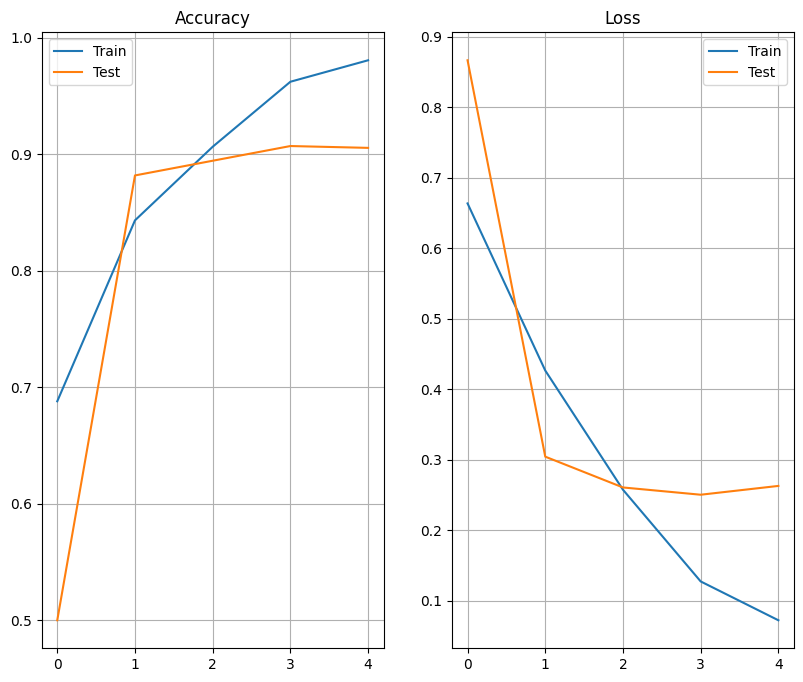

 1/20 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step

 3/20 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step 

 5/20 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step

 6/20 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

 8/20 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

10/20 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

11/20 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

13/20 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

15/20 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

17/20 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step


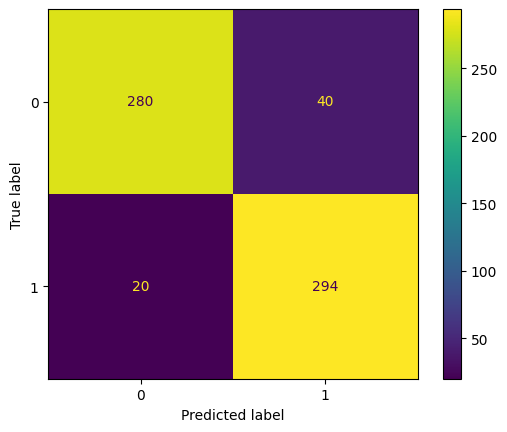

Accuracy: 0.9053627760252366
Precision: 0.8802395209580839
Recall: 0.9363057324840764


Epoch 1/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 1:16 1s/step - accuracy: 0.5000 - loss: 0.6940

 2/67 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - accuracy: 0.5703 - loss: 0.6932

 3/67 ━━━━━━━━━━━━━━━━━━━━ 11s 178ms/step - accuracy: 0.5885 - loss: 0.6929

 4/67 ━━━━━━━━━━━━━━━━━━━━ 11s 182ms/step - accuracy: 0.5859 - loss: 0.6928

 5/67 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - accuracy: 0.5850 - loss: 0.6927

 6/67 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.5847 - loss: 0.6927

 7/67 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.5886 - loss: 0.6924

 8/67 ━━━━━━━━━━━━━━━━━━━━ 10s 178ms/step - accuracy: 0.5912 - loss: 0.6923

 9/67 ━━━━━━━━━━━━━━━━━━━━ 10s 178ms/step - accuracy: 0.5930 - loss: 0.6921

10/67 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.5937 - loss: 0.6920

11/67 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - accuracy: 0.5950 - loss: 0.6918 

12/67 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - accuracy: 0.5947 - loss: 0.6917

13/67 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - accuracy: 0.5944 - loss: 0.6915

14/67 ━━━━━━━━━━━━━━━━━━━━ 9s 178ms/step - accuracy: 0.5937 - loss: 0.6914

15/67 ━━━━━━━━━━━━━━━━━━━━ 9s 178ms/step - accuracy: 0.5925 - loss: 0.6914

16/67 ━━━━━━━━━━━━━━━━━━━━ 9s 178ms/step - accuracy: 0.5912 - loss: 0.6913

17/67 ━━━━━━━━━━━━━━━━━━━━ 8s 178ms/step - accuracy: 0.5903 - loss: 0.6913

18/67 ━━━━━━━━━━━━━━━━━━━━ 8s 178ms/step - accuracy: 0.5893 - loss: 0.6912

19/67 ━━━━━━━━━━━━━━━━━━━━ 8s 178ms/step - accuracy: 0.5888 - loss: 0.6911

20/67 ━━━━━━━━━━━━━━━━━━━━ 8s 178ms/step - accuracy: 0.5882 - loss: 0.6910

21/67 ━━━━━━━━━━━━━━━━━━━━ 8s 178ms/step - accuracy: 0.5872 - loss: 0.6910

22/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.5862 - loss: 0.6909

23/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.5857 - loss: 0.6908

24/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.5853 - loss: 0.6907

25/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.5850 - loss: 0.6906

26/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.5847 - loss: 0.6904

27/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.5846 - loss: 0.6902

28/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.5847 - loss: 0.6900

29/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.5849 - loss: 0.6898

30/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.5851 - loss: 0.6896

31/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.5852 - loss: 0.6894

32/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.5855 - loss: 0.6891

33/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.5858 - loss: 0.6889

34/67 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.5862 - loss: 0.6885

35/67 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.5866 - loss: 0.6882

36/67 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.5869 - loss: 0.6878

37/67 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.5873 - loss: 0.6875

38/67 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.5877 - loss: 0.6872

39/67 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.5881 - loss: 0.6868

40/67 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.5886 - loss: 0.6864

41/67 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.5892 - loss: 0.6859

42/67 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.5898 - loss: 0.6854

43/67 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.5904 - loss: 0.6849

44/67 ━━━━━━━━━━━━━━━━━━━━ 4s 177ms/step - accuracy: 0.5911 - loss: 0.6844

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - accuracy: 0.5918 - loss: 0.6838

46/67 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - accuracy: 0.5925 - loss: 0.6832

47/67 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - accuracy: 0.5932 - loss: 0.6826

48/67 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - accuracy: 0.5940 - loss: 0.6820

49/67 ━━━━━━━━━━━━━━━━━━━━ 3s 177ms/step - accuracy: 0.5948 - loss: 0.6813

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.5956 - loss: 0.6806

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.5964 - loss: 0.6798

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.5972 - loss: 0.6791

53/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.5980 - loss: 0.6784

54/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.5988 - loss: 0.6777

55/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.5996 - loss: 0.6769

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6003 - loss: 0.6763

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6011 - loss: 0.6756

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6018 - loss: 0.6749

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6026 - loss: 0.6742

60/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6033 - loss: 0.6735

61/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6041 - loss: 0.6728

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6048 - loss: 0.6722

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6055 - loss: 0.6715

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6062 - loss: 0.6708

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6069 - loss: 0.6701

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6076 - loss: 0.6694

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6083 - loss: 0.6687

67/67 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - accuracy: 0.6089 - loss: 0.6680 - val_accuracy: 0.7603 - val_loss: 0.5031


Epoch 2/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 11s 181ms/step - accuracy: 0.8125 - loss: 0.4371

 2/67 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - accuracy: 0.8047 - loss: 0.4446

 3/67 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - accuracy: 0.7830 - loss: 0.4610

 4/67 ━━━━━━━━━━━━━━━━━━━━ 11s 175ms/step - accuracy: 0.7708 - loss: 0.4692

 5/67 ━━━━━━━━━━━━━━━━━━━━ 10s 176ms/step - accuracy: 0.7642 - loss: 0.4737

 6/67 ━━━━━━━━━━━━━━━━━━━━ 10s 176ms/step - accuracy: 0.7505 - loss: 0.5042

 7/67 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.7358 - loss: 0.5403

 8/67 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.7224 - loss: 0.5741

 9/67 ━━━━━━━━━━━━━━━━━━━━ 10s 176ms/step - accuracy: 0.7101 - loss: 0.6050

10/67 ━━━━━━━━━━━━━━━━━━━━ 10s 176ms/step - accuracy: 0.6978 - loss: 0.6335

11/67 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - accuracy: 0.6863 - loss: 0.6589 

12/67 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - accuracy: 0.6760 - loss: 0.6800

13/67 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - accuracy: 0.6672 - loss: 0.6963

14/67 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - accuracy: 0.6610 - loss: 0.7080

15/67 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - accuracy: 0.6568 - loss: 0.7166

16/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.6537 - loss: 0.7229

17/67 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - accuracy: 0.6517 - loss: 0.7273

18/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.6499 - loss: 0.7307

19/67 ━━━━━━━━━━━━━━━━━━━━ 8s 175ms/step - accuracy: 0.6490 - loss: 0.7331

20/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.6484 - loss: 0.7348

21/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.6482 - loss: 0.7358

22/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.6486 - loss: 0.7362

23/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.6490 - loss: 0.7363

24/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.6497 - loss: 0.7360

25/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.6506 - loss: 0.7355

26/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.6516 - loss: 0.7348

27/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.6526 - loss: 0.7339

28/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.6537 - loss: 0.7329

29/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.6549 - loss: 0.7317

30/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.6562 - loss: 0.7305

31/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.6576 - loss: 0.7291

32/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.6589 - loss: 0.7278

33/67 ━━━━━━━━━━━━━━━━━━━━ 6s 177ms/step - accuracy: 0.6601 - loss: 0.7265

34/67 ━━━━━━━━━━━━━━━━━━━━ 5s 177ms/step - accuracy: 0.6613 - loss: 0.7252

35/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.6625 - loss: 0.7238

36/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.6637 - loss: 0.7225

37/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.6648 - loss: 0.7212

38/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.6659 - loss: 0.7200

39/67 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - accuracy: 0.6671 - loss: 0.7187

40/67 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - accuracy: 0.6682 - loss: 0.7173

41/67 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - accuracy: 0.6693 - loss: 0.7160

42/67 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - accuracy: 0.6703 - loss: 0.7148

43/67 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - accuracy: 0.6714 - loss: 0.7135

44/67 ━━━━━━━━━━━━━━━━━━━━ 4s 176ms/step - accuracy: 0.6724 - loss: 0.7122

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.6735 - loss: 0.7108

46/67 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.6745 - loss: 0.7096

47/67 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.6754 - loss: 0.7083

48/67 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.6763 - loss: 0.7070

49/67 ━━━━━━━━━━━━━━━━━━━━ 3s 176ms/step - accuracy: 0.6772 - loss: 0.7057

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.6782 - loss: 0.7044

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.6792 - loss: 0.7030

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.6801 - loss: 0.7017

53/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.6811 - loss: 0.7004

54/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.6820 - loss: 0.6991

55/67 ━━━━━━━━━━━━━━━━━━━━ 2s 176ms/step - accuracy: 0.6829 - loss: 0.6978

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6838 - loss: 0.6964

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - accuracy: 0.6848 - loss: 0.6951

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - accuracy: 0.6857 - loss: 0.6938

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 176ms/step - accuracy: 0.6866 - loss: 0.6925

60/67 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - accuracy: 0.6875 - loss: 0.6912

61/67 ━━━━━━━━━━━━━━━━━━━━ 1s 177ms/step - accuracy: 0.6884 - loss: 0.6899

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6893 - loss: 0.6886

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6902 - loss: 0.6873

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6911 - loss: 0.6861

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6920 - loss: 0.6848

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6929 - loss: 0.6835

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.6937 - loss: 0.6822

67/67 ━━━━━━━━━━━━━━━━━━━━ 13s 190ms/step - accuracy: 0.6945 - loss: 0.6809 - val_accuracy: 0.8057 - val_loss: 0.4449


Epoch 3/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 11s 179ms/step - accuracy: 0.8750 - loss: 0.4340

 2/67 ━━━━━━━━━━━━━━━━━━━━ 11s 177ms/step - accuracy: 0.8594 - loss: 0.4469

 3/67 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - accuracy: 0.8472 - loss: 0.4585

 4/67 ━━━━━━━━━━━━━━━━━━━━ 11s 175ms/step - accuracy: 0.8405 - loss: 0.4611

 5/67 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.8374 - loss: 0.4609

 6/67 ━━━━━━━━━━━━━━━━━━━━ 10s 173ms/step - accuracy: 0.8350 - loss: 0.4607

 7/67 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.8330 - loss: 0.4607

 8/67 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - accuracy: 0.8329 - loss: 0.4591

 9/67 ━━━━━━━━━━━━━━━━━━━━ 10s 175ms/step - accuracy: 0.8345 - loss: 0.4560

10/67 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.8351 - loss: 0.4540 

11/67 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - accuracy: 0.8364 - loss: 0.4511

12/67 ━━━━━━━━━━━━━━━━━━━━ 9s 175ms/step - accuracy: 0.8381 - loss: 0.4479

13/67 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - accuracy: 0.8389 - loss: 0.4455

14/67 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - accuracy: 0.8388 - loss: 0.4444

15/67 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - accuracy: 0.8393 - loss: 0.4428

16/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.8394 - loss: 0.4415

17/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.8397 - loss: 0.4401

18/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.8399 - loss: 0.4388

19/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.8400 - loss: 0.4375

20/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.8401 - loss: 0.4363

21/67 ━━━━━━━━━━━━━━━━━━━━ 8s 176ms/step - accuracy: 0.8402 - loss: 0.4350

22/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.8401 - loss: 0.4341

23/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.8398 - loss: 0.4336

24/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.8395 - loss: 0.4331

25/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.8393 - loss: 0.4325

26/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.8391 - loss: 0.4318

27/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.8389 - loss: 0.4313

28/67 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - accuracy: 0.8389 - loss: 0.4306

29/67 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - accuracy: 0.8389 - loss: 0.4300

30/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.8388 - loss: 0.4294

31/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.8387 - loss: 0.4289

32/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.8386 - loss: 0.4283

33/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.8387 - loss: 0.4276

34/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.8388 - loss: 0.4268

35/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.8389 - loss: 0.4260

36/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.8389 - loss: 0.4253

37/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.8390 - loss: 0.4246

38/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.8390 - loss: 0.4239

39/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.8391 - loss: 0.4231

40/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.8392 - loss: 0.4224

41/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.8393 - loss: 0.4216

42/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.8394 - loss: 0.4210

43/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.8395 - loss: 0.4202

44/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.8396 - loss: 0.4195

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.8397 - loss: 0.4187

46/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.8398 - loss: 0.4181

47/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.8399 - loss: 0.4174

48/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.8400 - loss: 0.4167

49/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.8401 - loss: 0.4159

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.8403 - loss: 0.4152

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.8404 - loss: 0.4145

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.8405 - loss: 0.4138

53/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.8407 - loss: 0.4131

54/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.8408 - loss: 0.4124

55/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.8410 - loss: 0.4118

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.8411 - loss: 0.4112

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.8413 - loss: 0.4105

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.8415 - loss: 0.4098

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.8417 - loss: 0.4092

60/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.8418 - loss: 0.4086

61/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.8419 - loss: 0.4080

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.8421 - loss: 0.4074

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.8422 - loss: 0.4068

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.8424 - loss: 0.4062

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.8426 - loss: 0.4056

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.8427 - loss: 0.4051

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.8429 - loss: 0.4044

67/67 ━━━━━━━━━━━━━━━━━━━━ 13s 190ms/step - accuracy: 0.8431 - loss: 0.4038 - val_accuracy: 0.8652 - val_loss: 0.3413


Epoch 4/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 12s 194ms/step - accuracy: 0.8750 - loss: 0.2793

 2/67 ━━━━━━━━━━━━━━━━━━━━ 12s 188ms/step - accuracy: 0.8984 - loss: 0.2638

 3/67 ━━━━━━━━━━━━━━━━━━━━ 11s 178ms/step - accuracy: 0.9045 - loss: 0.2578

 4/67 ━━━━━━━━━━━━━━━━━━━━ 11s 176ms/step - accuracy: 0.9089 - loss: 0.2565

 5/67 ━━━━━━━━━━━━━━━━━━━━ 10s 176ms/step - accuracy: 0.9121 - loss: 0.2535

 6/67 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.9111 - loss: 0.2578

 7/67 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.9117 - loss: 0.2599

 8/67 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.9115 - loss: 0.2619

 9/67 ━━━━━━━━━━━━━━━━━━━━ 10s 177ms/step - accuracy: 0.9121 - loss: 0.2625

10/67 ━━━━━━━━━━━━━━━━━━━━ 10s 178ms/step - accuracy: 0.9121 - loss: 0.2625

11/67 ━━━━━━━━━━━━━━━━━━━━ 9s 178ms/step - accuracy: 0.9116 - loss: 0.2636 

12/67 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - accuracy: 0.9118 - loss: 0.2633

13/67 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - accuracy: 0.9119 - loss: 0.2629

14/67 ━━━━━━━━━━━━━━━━━━━━ 9s 177ms/step - accuracy: 0.9122 - loss: 0.2625

15/67 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - accuracy: 0.9123 - loss: 0.2619

16/67 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - accuracy: 0.9123 - loss: 0.2614

17/67 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step - accuracy: 0.9124 - loss: 0.2610

18/67 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step - accuracy: 0.9121 - loss: 0.2611

19/67 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step - accuracy: 0.9119 - loss: 0.2609

20/67 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step - accuracy: 0.9117 - loss: 0.2607

21/67 ━━━━━━━━━━━━━━━━━━━━ 8s 177ms/step - accuracy: 0.9117 - loss: 0.2604

22/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.9118 - loss: 0.2600

23/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.9119 - loss: 0.2596

24/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.9121 - loss: 0.2593

25/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.9122 - loss: 0.2590

26/67 ━━━━━━━━━━━━━━━━━━━━ 7s 177ms/step - accuracy: 0.9123 - loss: 0.2587

27/67 ━━━━━━━━━━━━━━━━━━━━ 7s 176ms/step - accuracy: 0.9124 - loss: 0.2584

28/67 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - accuracy: 0.9126 - loss: 0.2579

29/67 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - accuracy: 0.9128 - loss: 0.2575

30/67 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - accuracy: 0.9130 - loss: 0.2571

31/67 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - accuracy: 0.9132 - loss: 0.2566

32/67 ━━━━━━━━━━━━━━━━━━━━ 6s 176ms/step - accuracy: 0.9134 - loss: 0.2560

33/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.9136 - loss: 0.2555

34/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.9139 - loss: 0.2549

35/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.9142 - loss: 0.2544

36/67 ━━━━━━━━━━━━━━━━━━━━ 5s 176ms/step - accuracy: 0.9144 - loss: 0.2538

37/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9147 - loss: 0.2532

38/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9150 - loss: 0.2527

39/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9153 - loss: 0.2522

40/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9155 - loss: 0.2516

41/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9158 - loss: 0.2510

42/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9161 - loss: 0.2505

43/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9163 - loss: 0.2500

44/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9165 - loss: 0.2495

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9167 - loss: 0.2490

46/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9169 - loss: 0.2486

47/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9172 - loss: 0.2481

48/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9173 - loss: 0.2477

49/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9175 - loss: 0.2472

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9178 - loss: 0.2467

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9179 - loss: 0.2463

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9181 - loss: 0.2459

53/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9183 - loss: 0.2454

54/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9185 - loss: 0.2450

55/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9188 - loss: 0.2445

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9190 - loss: 0.2441

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9192 - loss: 0.2436

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9194 - loss: 0.2431

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9196 - loss: 0.2427

60/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9199 - loss: 0.2422

61/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9201 - loss: 0.2418

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9202 - loss: 0.2414

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9204 - loss: 0.2410

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9206 - loss: 0.2405

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9207 - loss: 0.2401

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9209 - loss: 0.2397

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9210 - loss: 0.2394

67/67 ━━━━━━━━━━━━━━━━━━━━ 13s 190ms/step - accuracy: 0.9212 - loss: 0.2391 - val_accuracy: 0.8950 - val_loss: 0.2628


Epoch 5/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 11s 180ms/step - accuracy: 0.9375 - loss: 0.1780

 2/67 ━━━━━━━━━━━━━━━━━━━━ 11s 174ms/step - accuracy: 0.9297 - loss: 0.1885

 3/67 ━━━━━━━━━━━━━━━━━━━━ 10s 171ms/step - accuracy: 0.9323 - loss: 0.1848

 4/67 ━━━━━━━━━━━━━━━━━━━━ 10s 173ms/step - accuracy: 0.9336 - loss: 0.1816

 5/67 ━━━━━━━━━━━━━━━━━━━━ 10s 173ms/step - accuracy: 0.9369 - loss: 0.1771

 6/67 ━━━━━━━━━━━━━━━━━━━━ 10s 173ms/step - accuracy: 0.9396 - loss: 0.1735

 7/67 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.9412 - loss: 0.1702

 8/67 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.9432 - loss: 0.1673

 9/67 ━━━━━━━━━━━━━━━━━━━━ 10s 174ms/step - accuracy: 0.9449 - loss: 0.1646

10/67 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9457 - loss: 0.1633 

11/67 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9462 - loss: 0.1624

12/67 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9466 - loss: 0.1619

13/67 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9468 - loss: 0.1617

14/67 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9471 - loss: 0.1614

15/67 ━━━━━━━━━━━━━━━━━━━━ 9s 174ms/step - accuracy: 0.9473 - loss: 0.1612

16/67 ━━━━━━━━━━━━━━━━━━━━ 8s 174ms/step - accuracy: 0.9475 - loss: 0.1609

17/67 ━━━━━━━━━━━━━━━━━━━━ 8s 174ms/step - accuracy: 0.9477 - loss: 0.1606

18/67 ━━━━━━━━━━━━━━━━━━━━ 8s 174ms/step - accuracy: 0.9480 - loss: 0.1601

19/67 ━━━━━━━━━━━━━━━━━━━━ 8s 174ms/step - accuracy: 0.9484 - loss: 0.1594

20/67 ━━━━━━━━━━━━━━━━━━━━ 8s 174ms/step - accuracy: 0.9487 - loss: 0.1588

21/67 ━━━━━━━━━━━━━━━━━━━━ 8s 174ms/step - accuracy: 0.9491 - loss: 0.1581

22/67 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - accuracy: 0.9496 - loss: 0.1573

23/67 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - accuracy: 0.9500 - loss: 0.1566

24/67 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - accuracy: 0.9503 - loss: 0.1561

25/67 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - accuracy: 0.9507 - loss: 0.1556

26/67 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - accuracy: 0.9510 - loss: 0.1550

27/67 ━━━━━━━━━━━━━━━━━━━━ 7s 175ms/step - accuracy: 0.9513 - loss: 0.1545

28/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.9515 - loss: 0.1540

29/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.9518 - loss: 0.1535

30/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.9520 - loss: 0.1530

31/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.9523 - loss: 0.1525

32/67 ━━━━━━━━━━━━━━━━━━━━ 6s 175ms/step - accuracy: 0.9524 - loss: 0.1521

33/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9526 - loss: 0.1518

34/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9527 - loss: 0.1514

35/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9529 - loss: 0.1510

36/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9530 - loss: 0.1507

37/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9532 - loss: 0.1503

38/67 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9533 - loss: 0.1499

39/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9534 - loss: 0.1496

40/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9535 - loss: 0.1492

41/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9536 - loss: 0.1489

42/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9537 - loss: 0.1486

43/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9538 - loss: 0.1484

44/67 ━━━━━━━━━━━━━━━━━━━━ 4s 175ms/step - accuracy: 0.9538 - loss: 0.1481

45/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9539 - loss: 0.1479

46/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9539 - loss: 0.1477

47/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9540 - loss: 0.1474

48/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9540 - loss: 0.1472

49/67 ━━━━━━━━━━━━━━━━━━━━ 3s 175ms/step - accuracy: 0.9541 - loss: 0.1470

50/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9541 - loss: 0.1468

51/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9542 - loss: 0.1466

52/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9542 - loss: 0.1464

53/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9543 - loss: 0.1462

54/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9543 - loss: 0.1461

55/67 ━━━━━━━━━━━━━━━━━━━━ 2s 175ms/step - accuracy: 0.9544 - loss: 0.1459

56/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9545 - loss: 0.1458

57/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9545 - loss: 0.1456

58/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9546 - loss: 0.1455

59/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9546 - loss: 0.1453

60/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9546 - loss: 0.1451

61/67 ━━━━━━━━━━━━━━━━━━━━ 1s 175ms/step - accuracy: 0.9547 - loss: 0.1450

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9548 - loss: 0.1448

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9548 - loss: 0.1446

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9549 - loss: 0.1445

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9549 - loss: 0.1443

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9550 - loss: 0.1442

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - accuracy: 0.9550 - loss: 0.1440

67/67 ━━━━━━━━━━━━━━━━━━━━ 13s 189ms/step - accuracy: 0.9551 - loss: 0.1438 - val_accuracy: 0.8610 - val_loss: 0.3753


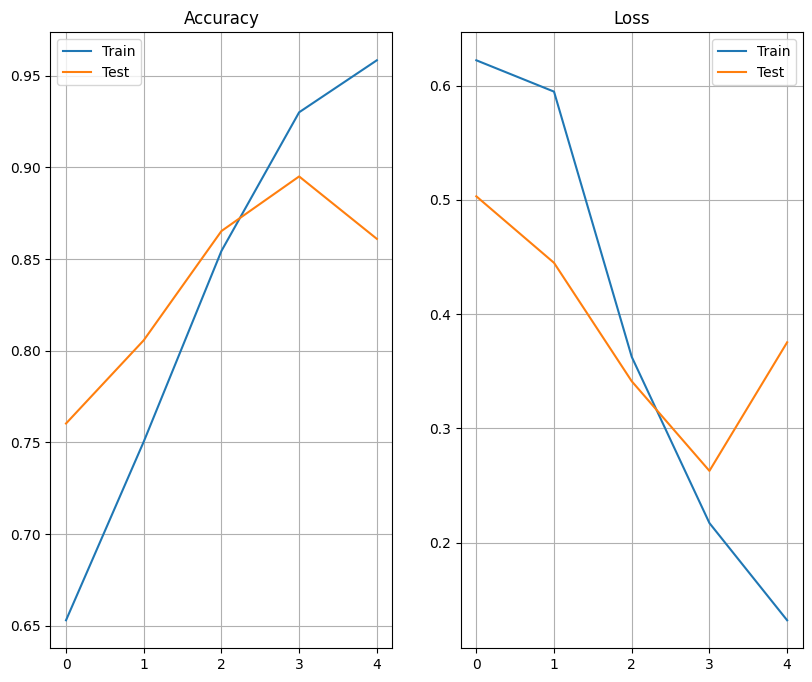

 1/23 ━━━━━━━━━━━━━━━━━━━━ 2s 127ms/step

 3/23 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step 

 5/23 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

 7/23 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

 9/23 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

11/23 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

13/23 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

15/23 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

17/23 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

19/23 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

23/23 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step


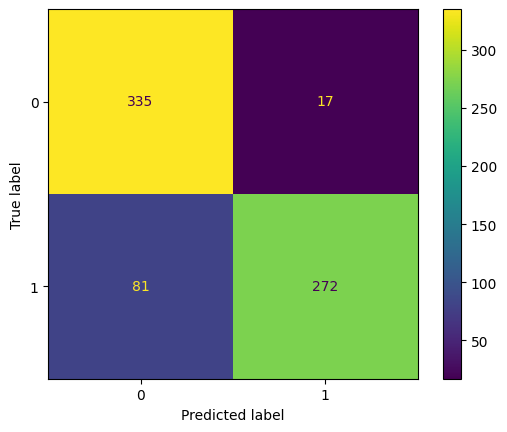

Accuracy: 0.8609929078014185
Precision: 0.9411764705882353
Recall: 0.7705382436260623
Epoch 1/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.3125 - loss: 0.6945

 2/53 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.3750 - loss: 0.6940

 3/53 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.4132 - loss: 0.6937

 4/53 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.4388 - loss: 0.6934

 5/53 ━━━━━━━━━━━━━━━━━━━━ 3s 80ms/step - accuracy: 0.4598 - loss: 0.6930

 6/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.4778 - loss: 0.6927

 7/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.4950 - loss: 0.6922

 8/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.5073 - loss: 0.6918

 9/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.5204 - loss: 0.6913

10/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.5309 - loss: 0.6909

11/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.5410 - loss: 0.6904

12/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.5486 - loss: 0.6900

13/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.5558 - loss: 0.6896

14/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.5623 - loss: 0.6891

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.5687 - loss: 0.6886

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.5748 - loss: 0.6881

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.5803 - loss: 0.6875

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.5851 - loss: 0.6869

19/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.5893 - loss: 0.6862

20/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.5930 - loss: 0.6857

21/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.5961 - loss: 0.6852

22/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.5992 - loss: 0.6848

23/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.6023 - loss: 0.6843

24/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.6053 - loss: 0.6838

25/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.6082 - loss: 0.6832

26/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.6108 - loss: 0.6826

27/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.6132 - loss: 0.6820

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6152 - loss: 0.6814

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6172 - loss: 0.6807

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6192 - loss: 0.6800

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6211 - loss: 0.6792

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6230 - loss: 0.6783

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6247 - loss: 0.6774

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6264 - loss: 0.6766

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6279 - loss: 0.6758

36/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6294 - loss: 0.6749

37/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6307 - loss: 0.6741

38/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.6320 - loss: 0.6733

39/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.6332 - loss: 0.6725

40/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.6344 - loss: 0.6717

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6355 - loss: 0.6709

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6366 - loss: 0.6702

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6376 - loss: 0.6694

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6386 - loss: 0.6686

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6395 - loss: 0.6678

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6403 - loss: 0.6671

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6411 - loss: 0.6664

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6418 - loss: 0.6657

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6426 - loss: 0.6649

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6432 - loss: 0.6643

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6439 - loss: 0.6636

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6445 - loss: 0.6629

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.6451 - loss: 0.6621

53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - accuracy: 0.6458 - loss: 0.6614 - val_accuracy: 0.7245 - val_loss: 0.5379


Epoch 2/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.7188 - loss: 0.5715

 2/53 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - accuracy: 0.7266 - loss: 0.5501

 3/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7483 - loss: 0.5366

 4/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7546 - loss: 0.5304

 5/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7599 - loss: 0.5284

 6/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7643 - loss: 0.5276

 7/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7699 - loss: 0.5245

 8/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7757 - loss: 0.5209

 9/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.7794 - loss: 0.5182

10/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7815 - loss: 0.5157

11/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7830 - loss: 0.5134

12/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.7840 - loss: 0.5117

13/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.7847 - loss: 0.5101

14/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.7852 - loss: 0.5087

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7855 - loss: 0.5075

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - accuracy: 0.7862 - loss: 0.5058

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7867 - loss: 0.5043

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7869 - loss: 0.5033

19/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7869 - loss: 0.5025

20/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7871 - loss: 0.5013

21/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7874 - loss: 0.4998

22/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7876 - loss: 0.4984

23/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7876 - loss: 0.4971

24/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7875 - loss: 0.4961

25/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7872 - loss: 0.4951

26/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7870 - loss: 0.4941

27/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.7868 - loss: 0.4929

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7868 - loss: 0.4919

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7869 - loss: 0.4908

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7871 - loss: 0.4897

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7873 - loss: 0.4886

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7876 - loss: 0.4875

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7878 - loss: 0.4865

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7879 - loss: 0.4855

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7882 - loss: 0.4845

36/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7884 - loss: 0.4835

37/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7889 - loss: 0.4824

38/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7893 - loss: 0.4813

39/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7897 - loss: 0.4802

40/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.7902 - loss: 0.4792

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7906 - loss: 0.4783

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7910 - loss: 0.4773

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7915 - loss: 0.4765

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7919 - loss: 0.4756

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7924 - loss: 0.4748

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7928 - loss: 0.4740

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7932 - loss: 0.4732

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7936 - loss: 0.4723

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7941 - loss: 0.4715

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7945 - loss: 0.4706

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7948 - loss: 0.4701

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7951 - loss: 0.4697

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7953 - loss: 0.4693

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.7955 - loss: 0.4689 - val_accuracy: 0.8193 - val_loss: 0.4126


Epoch 3/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 4s 88ms/step - accuracy: 0.8125 - loss: 0.4465

 2/53 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - accuracy: 0.8281 - loss: 0.4266

 3/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.8472 - loss: 0.4059

 4/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.8542 - loss: 0.3942

 5/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.8558 - loss: 0.3929

 6/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.8556 - loss: 0.3924

 7/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.8558 - loss: 0.3909

 8/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.8557 - loss: 0.3889

 9/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.8556 - loss: 0.3882

10/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.8556 - loss: 0.3884

11/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.8558 - loss: 0.3884

12/53 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.8555 - loss: 0.3891

13/53 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.8553 - loss: 0.3896

14/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8553 - loss: 0.3901

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8552 - loss: 0.3904

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8556 - loss: 0.3901

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8560 - loss: 0.3899

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8562 - loss: 0.3900

19/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8562 - loss: 0.3904

20/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8565 - loss: 0.3905

21/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8568 - loss: 0.3907

22/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8571 - loss: 0.3907

23/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8573 - loss: 0.3907

24/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8575 - loss: 0.3908

25/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8577 - loss: 0.3908

26/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.8579 - loss: 0.3906

27/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8580 - loss: 0.3906

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8581 - loss: 0.3905

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8583 - loss: 0.3904

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8585 - loss: 0.3902

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8587 - loss: 0.3900

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8589 - loss: 0.3898

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8591 - loss: 0.3896

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8593 - loss: 0.3893

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8595 - loss: 0.3892

36/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8596 - loss: 0.3890

37/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8598 - loss: 0.3888

38/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8600 - loss: 0.3886

39/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8602 - loss: 0.3884

40/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.8605 - loss: 0.3881

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8607 - loss: 0.3878

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8609 - loss: 0.3876

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8610 - loss: 0.3873

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8613 - loss: 0.3870

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8615 - loss: 0.3866

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8617 - loss: 0.3862

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8619 - loss: 0.3859

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8621 - loss: 0.3855

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8624 - loss: 0.3851

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8626 - loss: 0.3847

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8628 - loss: 0.3843

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8631 - loss: 0.3839

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8633 - loss: 0.3835

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.8635 - loss: 0.3831 - val_accuracy: 0.8318 - val_loss: 0.3861


Epoch 4/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 4s 86ms/step - accuracy: 0.9375 - loss: 0.2007

 2/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9531 - loss: 0.1837

 3/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9340 - loss: 0.2071

 4/53 ━━━━━━━━━━━━━━━━━━━━ 3s 79ms/step - accuracy: 0.9271 - loss: 0.2159

 5/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9217 - loss: 0.2237

 6/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9208 - loss: 0.2259

 7/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9200 - loss: 0.2303

 8/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9188 - loss: 0.2342

 9/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9182 - loss: 0.2365

10/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9185 - loss: 0.2372

11/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9190 - loss: 0.2375

12/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9194 - loss: 0.2376

13/53 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - accuracy: 0.9199 - loss: 0.2377

14/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9202 - loss: 0.2380

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9202 - loss: 0.2384

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9203 - loss: 0.2385

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9206 - loss: 0.2382

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9209 - loss: 0.2378

19/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9210 - loss: 0.2374

20/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9210 - loss: 0.2374

21/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9210 - loss: 0.2373

22/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9212 - loss: 0.2369

23/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9213 - loss: 0.2366

24/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9214 - loss: 0.2364

25/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9215 - loss: 0.2361

26/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9216 - loss: 0.2357

27/53 ━━━━━━━━━━━━━━━━━━━━ 2s 78ms/step - accuracy: 0.9217 - loss: 0.2353

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9217 - loss: 0.2350

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9218 - loss: 0.2346

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.9218 - loss: 0.2342

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.9219 - loss: 0.2338

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - accuracy: 0.9219 - loss: 0.2333

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9219 - loss: 0.2329

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9220 - loss: 0.2324

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9222 - loss: 0.2318

36/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9223 - loss: 0.2313

37/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9224 - loss: 0.2308

38/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9226 - loss: 0.2303

39/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9227 - loss: 0.2298

40/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9228 - loss: 0.2294

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9229 - loss: 0.2290

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9229 - loss: 0.2287

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9229 - loss: 0.2284

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9230 - loss: 0.2281

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9230 - loss: 0.2278

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9230 - loss: 0.2276

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9231 - loss: 0.2273

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9232 - loss: 0.2269

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9233 - loss: 0.2266

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9233 - loss: 0.2263

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9234 - loss: 0.2260

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9234 - loss: 0.2257

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9235 - loss: 0.2254

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.9236 - loss: 0.2251 - val_accuracy: 0.8658 - val_loss: 0.3163


Epoch 5/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 4s 85ms/step - accuracy: 0.9375 - loss: 0.2131

 2/53 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.9531 - loss: 0.1843

 3/53 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.9618 - loss: 0.1641

 4/53 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.9655 - loss: 0.1551

 5/53 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.9649 - loss: 0.1532

 6/53 ━━━━━━━━━━━━━━━━━━━━ 3s 76ms/step - accuracy: 0.9629 - loss: 0.1533

 7/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9619 - loss: 0.1525

 8/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9612 - loss: 0.1517

 9/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9605 - loss: 0.1516

10/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9604 - loss: 0.1511

11/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9594 - loss: 0.1523

12/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9589 - loss: 0.1528

13/53 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - accuracy: 0.9585 - loss: 0.1532

14/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9581 - loss: 0.1533

15/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9580 - loss: 0.1531

16/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9579 - loss: 0.1528

17/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9580 - loss: 0.1522

18/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9582 - loss: 0.1517

19/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9584 - loss: 0.1511

20/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9586 - loss: 0.1506

21/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9587 - loss: 0.1500

22/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9588 - loss: 0.1495

23/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9589 - loss: 0.1490

24/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9589 - loss: 0.1486

25/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9589 - loss: 0.1484

26/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9588 - loss: 0.1481

27/53 ━━━━━━━━━━━━━━━━━━━━ 2s 77ms/step - accuracy: 0.9587 - loss: 0.1479

28/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9585 - loss: 0.1477

29/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9583 - loss: 0.1477

30/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9581 - loss: 0.1476

31/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9579 - loss: 0.1476

32/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9576 - loss: 0.1477

33/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9574 - loss: 0.1477

34/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9573 - loss: 0.1476

35/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9571 - loss: 0.1475

36/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9570 - loss: 0.1473

37/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9570 - loss: 0.1471

38/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9569 - loss: 0.1469

39/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9569 - loss: 0.1467

40/53 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.9568 - loss: 0.1465

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9568 - loss: 0.1462

42/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9567 - loss: 0.1461

43/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9567 - loss: 0.1459

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9566 - loss: 0.1458

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9565 - loss: 0.1456

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9564 - loss: 0.1455

47/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9563 - loss: 0.1453

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9562 - loss: 0.1452

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9562 - loss: 0.1451

50/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9561 - loss: 0.1449

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9560 - loss: 0.1448

52/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9559 - loss: 0.1447

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9557 - loss: 0.1446

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.9556 - loss: 0.1445 - val_accuracy: 0.8587 - val_loss: 0.3177


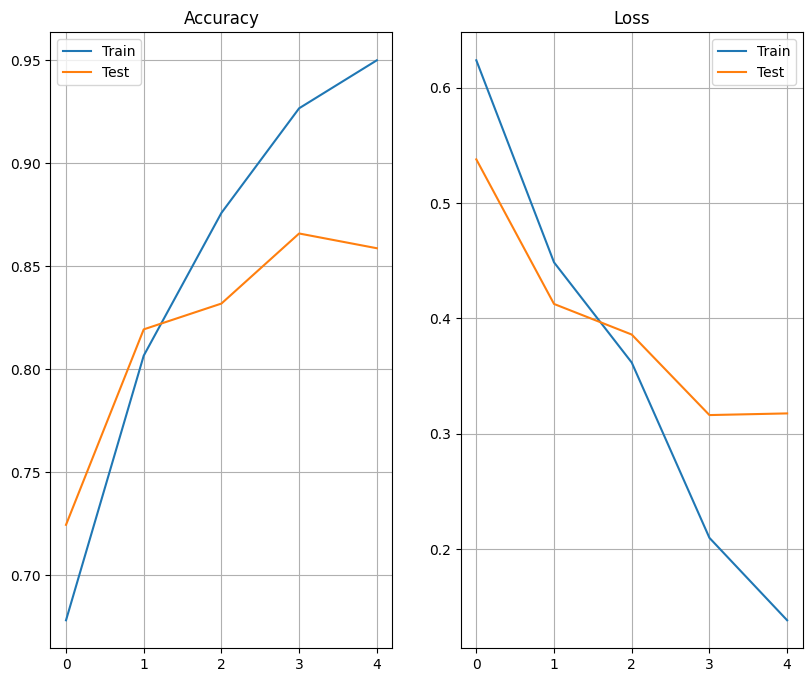

 1/18 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step

 4/18 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step

 7/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

10/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

12/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

15/18 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step

18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step


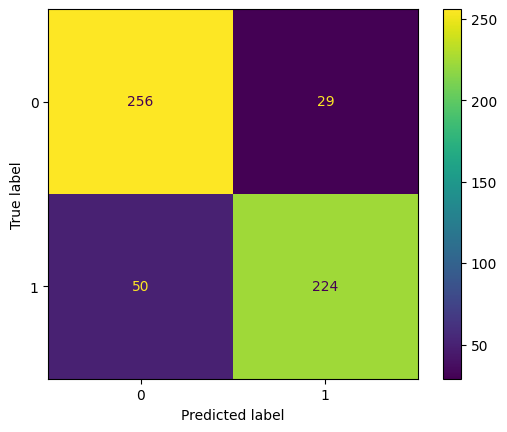

Accuracy: 0.8586762075134168
Precision: 0.8853754940711462
Recall: 0.8175182481751825
Epoch 1/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 53s 1s/step - accuracy: 0.4688 - loss: 0.6935

 2/48 ━━━━━━━━━━━━━━━━━━━━ 9s 200ms/step - accuracy: 0.4766 - loss: 0.6935

 3/48 ━━━━━━━━━━━━━━━━━━━━ 8s 200ms/step - accuracy: 0.4670 - loss: 0.6935

 4/48 ━━━━━━━━━━━━━━━━━━━━ 8s 200ms/step - accuracy: 0.4753 - loss: 0.6934

 5/48 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - accuracy: 0.4815 - loss: 0.6934

 6/48 ━━━━━━━━━━━━━━━━━━━━ 8s 199ms/step - accuracy: 0.4880 - loss: 0.6933

 7/48 ━━━━━━━━━━━━━━━━━━━━ 8s 198ms/step - accuracy: 0.4948 - loss: 0.6933

 8/48 ━━━━━━━━━━━━━━━━━━━━ 7s 198ms/step - accuracy: 0.4989 - loss: 0.6932

 9/48 ━━━━━━━━━━━━━━━━━━━━ 7s 197ms/step - accuracy: 0.5009 - loss: 0.6932

10/48 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - accuracy: 0.5027 - loss: 0.6932

11/48 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - accuracy: 0.5051 - loss: 0.6931

12/48 ━━━━━━━━━━━━━━━━━━━━ 7s 196ms/step - accuracy: 0.5075 - loss: 0.6931

13/48 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - accuracy: 0.5106 - loss: 0.6930

14/48 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - accuracy: 0.5140 - loss: 0.6930

15/48 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - accuracy: 0.5172 - loss: 0.6929

16/48 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - accuracy: 0.5202 - loss: 0.6928

17/48 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - accuracy: 0.5228 - loss: 0.6928

18/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.5249 - loss: 0.6927

19/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.5267 - loss: 0.6926

20/48 ━━━━━━━━━━━━━━━━━━━━ 5s 197ms/step - accuracy: 0.5285 - loss: 0.6926

21/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.5304 - loss: 0.6925

22/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.5323 - loss: 0.6925

23/48 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step - accuracy: 0.5338 - loss: 0.6924

24/48 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step - accuracy: 0.5349 - loss: 0.6924

25/48 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step - accuracy: 0.5360 - loss: 0.6924

26/48 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step - accuracy: 0.5370 - loss: 0.6923

27/48 ━━━━━━━━━━━━━━━━━━━━ 4s 196ms/step - accuracy: 0.5381 - loss: 0.6923

28/48 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - accuracy: 0.5393 - loss: 0.6922

29/48 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - accuracy: 0.5403 - loss: 0.6922

30/48 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - accuracy: 0.5412 - loss: 0.6921

31/48 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - accuracy: 0.5422 - loss: 0.6920

32/48 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - accuracy: 0.5432 - loss: 0.6920

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - accuracy: 0.5441 - loss: 0.6919

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - accuracy: 0.5451 - loss: 0.6919

35/48 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - accuracy: 0.5460 - loss: 0.6918

36/48 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - accuracy: 0.5470 - loss: 0.6917

37/48 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - accuracy: 0.5479 - loss: 0.6917

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - accuracy: 0.5488 - loss: 0.6916

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - accuracy: 0.5497 - loss: 0.6915

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - accuracy: 0.5505 - loss: 0.6915

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - accuracy: 0.5514 - loss: 0.6914

42/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.5523 - loss: 0.6913

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.5531 - loss: 0.6912

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.5540 - loss: 0.6911

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.5549 - loss: 0.6910

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.5557 - loss: 0.6910

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.5566 - loss: 0.6908

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.5575 - loss: 0.6907

48/48 ━━━━━━━━━━━━━━━━━━━━ 11s 214ms/step - accuracy: 0.5583 - loss: 0.6907 - val_accuracy: 0.6548 - val_loss: 0.6661


Epoch 2/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 9s 207ms/step - accuracy: 0.6250 - loss: 0.6634

 2/48 ━━━━━━━━━━━━━━━━━━━━ 9s 203ms/step - accuracy: 0.6797 - loss: 0.6584

 3/48 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.7170 - loss: 0.6553

 4/48 ━━━━━━━━━━━━━━━━━━━━ 8s 198ms/step - accuracy: 0.7311 - loss: 0.6530

 5/48 ━━━━━━━━━━━━━━━━━━━━ 8s 196ms/step - accuracy: 0.7386 - loss: 0.6513

 6/48 ━━━━━━━━━━━━━━━━━━━━ 8s 195ms/step - accuracy: 0.7457 - loss: 0.6495

 7/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.7464 - loss: 0.6490

 8/48 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - accuracy: 0.7444 - loss: 0.6485

 9/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.7400 - loss: 0.6484

10/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.7347 - loss: 0.6486

11/48 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - accuracy: 0.7310 - loss: 0.6485

12/48 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - accuracy: 0.7286 - loss: 0.6482

13/48 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - accuracy: 0.7268 - loss: 0.6477

14/48 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - accuracy: 0.7251 - loss: 0.6471

15/48 ━━━━━━━━━━━━━━━━━━━━ 6s 197ms/step - accuracy: 0.7244 - loss: 0.6464

16/48 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - accuracy: 0.7240 - loss: 0.6457

17/48 ━━━━━━━━━━━━━━━━━━━━ 6s 196ms/step - accuracy: 0.7233 - loss: 0.6450

18/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.7222 - loss: 0.6445

19/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.7211 - loss: 0.6440

20/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.7202 - loss: 0.6434

21/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.7192 - loss: 0.6428

22/48 ━━━━━━━━━━━━━━━━━━━━ 5s 196ms/step - accuracy: 0.7184 - loss: 0.6421

23/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.7178 - loss: 0.6413

24/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.7174 - loss: 0.6404

25/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.7173 - loss: 0.6394

26/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.7174 - loss: 0.6383

27/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.7172 - loss: 0.6373

28/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.7171 - loss: 0.6364

29/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.7170 - loss: 0.6355

30/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.7169 - loss: 0.6347

31/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.7168 - loss: 0.6339

32/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.7169 - loss: 0.6330

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.7169 - loss: 0.6320

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.7170 - loss: 0.6311

35/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.7170 - loss: 0.6302

36/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.7170 - loss: 0.6292

37/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.7171 - loss: 0.6283

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.7171 - loss: 0.6273

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.7171 - loss: 0.6264

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.7171 - loss: 0.6255

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.7172 - loss: 0.6245

42/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.7172 - loss: 0.6236

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.7173 - loss: 0.6227

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.7174 - loss: 0.6219

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.7176 - loss: 0.6210

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.7177 - loss: 0.6201

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.7178 - loss: 0.6194

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.7178 - loss: 0.6187

48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 209ms/step - accuracy: 0.7179 - loss: 0.6180 - val_accuracy: 0.6903 - val_loss: 0.5354


Epoch 3/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 9s 201ms/step - accuracy: 0.8125 - loss: 0.4777

 2/48 ━━━━━━━━━━━━━━━━━━━━ 9s 198ms/step - accuracy: 0.8203 - loss: 0.4702

 3/48 ━━━━━━━━━━━━━━━━━━━━ 8s 192ms/step - accuracy: 0.8177 - loss: 0.4653

 4/48 ━━━━━━━━━━━━━━━━━━━━ 8s 192ms/step - accuracy: 0.8164 - loss: 0.4630

 5/48 ━━━━━━━━━━━━━━━━━━━━ 8s 192ms/step - accuracy: 0.8194 - loss: 0.4575

 6/48 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - accuracy: 0.8208 - loss: 0.4522

 7/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8216 - loss: 0.4493

 8/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8209 - loss: 0.4474

 9/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8207 - loss: 0.4464

10/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8212 - loss: 0.4453

11/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8222 - loss: 0.4435

12/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8227 - loss: 0.4422

13/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8236 - loss: 0.4409

14/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8244 - loss: 0.4396

15/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8254 - loss: 0.4384

16/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8268 - loss: 0.4371

17/48 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - accuracy: 0.8276 - loss: 0.4362

18/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.8282 - loss: 0.4354

19/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.8287 - loss: 0.4345

20/48 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - accuracy: 0.8293 - loss: 0.4337

21/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.8301 - loss: 0.4329

22/48 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - accuracy: 0.8308 - loss: 0.4320

23/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.8315 - loss: 0.4312

24/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.8320 - loss: 0.4304

25/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.8323 - loss: 0.4299

26/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.8328 - loss: 0.4291

27/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.8334 - loss: 0.4284

28/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8340 - loss: 0.4276

29/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8345 - loss: 0.4269

30/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8350 - loss: 0.4262

31/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8355 - loss: 0.4256

32/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8357 - loss: 0.4250

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.8360 - loss: 0.4244

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.8362 - loss: 0.4238

35/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.8364 - loss: 0.4233

36/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.8367 - loss: 0.4227

37/48 ━━━━━━━━━━━━━━━━━━━━ 2s 195ms/step - accuracy: 0.8369 - loss: 0.4222

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.8371 - loss: 0.4216

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.8374 - loss: 0.4210

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.8377 - loss: 0.4205

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.8380 - loss: 0.4200

42/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.8382 - loss: 0.4194

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8385 - loss: 0.4188

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8387 - loss: 0.4183

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8389 - loss: 0.4179

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8390 - loss: 0.4174

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8392 - loss: 0.4169

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8394 - loss: 0.4164

48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 209ms/step - accuracy: 0.8396 - loss: 0.4159 - val_accuracy: 0.7613 - val_loss: 0.4876


Epoch 4/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 9s 207ms/step - accuracy: 0.8750 - loss: 0.3053

 2/48 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - accuracy: 0.8359 - loss: 0.3364

 3/48 ━━━━━━━━━━━━━━━━━━━━ 8s 190ms/step - accuracy: 0.8420 - loss: 0.3324

 4/48 ━━━━━━━━━━━━━━━━━━━━ 8s 190ms/step - accuracy: 0.8522 - loss: 0.3227

 5/48 ━━━━━━━━━━━━━━━━━━━━ 8s 190ms/step - accuracy: 0.8580 - loss: 0.3173

 6/48 ━━━━━━━━━━━━━━━━━━━━ 8s 193ms/step - accuracy: 0.8600 - loss: 0.3165

 7/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8628 - loss: 0.3143

 8/48 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - accuracy: 0.8653 - loss: 0.3116

 9/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8671 - loss: 0.3092

10/48 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - accuracy: 0.8676 - loss: 0.3079

11/48 ━━━━━━━━━━━━━━━━━━━━ 7s 194ms/step - accuracy: 0.8683 - loss: 0.3063

12/48 ━━━━━━━━━━━━━━━━━━━━ 7s 195ms/step - accuracy: 0.8697 - loss: 0.3039

13/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8712 - loss: 0.3018

14/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8724 - loss: 0.3001

15/48 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - accuracy: 0.8736 - loss: 0.2986

16/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8749 - loss: 0.2971

17/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8760 - loss: 0.2957

18/48 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - accuracy: 0.8770 - loss: 0.2948

19/48 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - accuracy: 0.8778 - loss: 0.2940

20/48 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - accuracy: 0.8787 - loss: 0.2932

21/48 ━━━━━━━━━━━━━━━━━━━━ 5s 193ms/step - accuracy: 0.8795 - loss: 0.2928

22/48 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - accuracy: 0.8804 - loss: 0.2924

23/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.8813 - loss: 0.2919

24/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.8821 - loss: 0.2914

25/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.8829 - loss: 0.2910

26/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.8838 - loss: 0.2904

27/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.8846 - loss: 0.2899

28/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8853 - loss: 0.2895

29/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8859 - loss: 0.2891

30/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8864 - loss: 0.2889

31/48 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - accuracy: 0.8869 - loss: 0.2887

32/48 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - accuracy: 0.8873 - loss: 0.2886

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.8876 - loss: 0.2885

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.8879 - loss: 0.2885

35/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.8882 - loss: 0.2884

36/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.8885 - loss: 0.2883

37/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.8888 - loss: 0.2881

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.8890 - loss: 0.2880

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.8892 - loss: 0.2878

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.8893 - loss: 0.2877

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.8895 - loss: 0.2876

42/48 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - accuracy: 0.8896 - loss: 0.2874

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8897 - loss: 0.2872

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.8899 - loss: 0.2870

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8901 - loss: 0.2867

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8902 - loss: 0.2864

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8904 - loss: 0.2862

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.8905 - loss: 0.2859

48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 210ms/step - accuracy: 0.8907 - loss: 0.2856 - val_accuracy: 0.7890 - val_loss: 0.4333


Epoch 5/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 9s 207ms/step - accuracy: 0.8750 - loss: 0.1877

 2/48 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - accuracy: 0.8828 - loss: 0.1769

 3/48 ━━━━━━━━━━━━━━━━━━━━ 8s 189ms/step - accuracy: 0.8872 - loss: 0.1783

 4/48 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - accuracy: 0.8880 - loss: 0.1831

 5/48 ━━━━━━━━━━━━━━━━━━━━ 8s 192ms/step - accuracy: 0.8892 - loss: 0.1875

 6/48 ━━━━━━━━━━━━━━━━━━━━ 8s 191ms/step - accuracy: 0.8911 - loss: 0.1891

 7/48 ━━━━━━━━━━━━━━━━━━━━ 7s 192ms/step - accuracy: 0.8927 - loss: 0.1910

 8/48 ━━━━━━━━━━━━━━━━━━━━ 7s 191ms/step - accuracy: 0.8924 - loss: 0.1947

 9/48 ━━━━━━━━━━━━━━━━━━━━ 7s 192ms/step - accuracy: 0.8932 - loss: 0.1965

10/48 ━━━━━━━━━━━━━━━━━━━━ 7s 192ms/step - accuracy: 0.8942 - loss: 0.1979

11/48 ━━━━━━━━━━━━━━━━━━━━ 7s 192ms/step - accuracy: 0.8948 - loss: 0.1991

12/48 ━━━━━━━━━━━━━━━━━━━━ 6s 192ms/step - accuracy: 0.8953 - loss: 0.1998

13/48 ━━━━━━━━━━━━━━━━━━━━ 6s 193ms/step - accuracy: 0.8959 - loss: 0.2000

14/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8968 - loss: 0.1998

15/48 ━━━━━━━━━━━━━━━━━━━━ 6s 194ms/step - accuracy: 0.8979 - loss: 0.1993

16/48 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - accuracy: 0.8991 - loss: 0.1986

17/48 ━━━━━━━━━━━━━━━━━━━━ 6s 195ms/step - accuracy: 0.9003 - loss: 0.1980

18/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.9014 - loss: 0.1974

19/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.9025 - loss: 0.1968

20/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.9036 - loss: 0.1962

21/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.9047 - loss: 0.1954

22/48 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - accuracy: 0.9058 - loss: 0.1945

23/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.9067 - loss: 0.1937

24/48 ━━━━━━━━━━━━━━━━━━━━ 4s 195ms/step - accuracy: 0.9076 - loss: 0.1929

25/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.9085 - loss: 0.1921

26/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.9091 - loss: 0.1915

27/48 ━━━━━━━━━━━━━━━━━━━━ 4s 194ms/step - accuracy: 0.9097 - loss: 0.1911

28/48 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - accuracy: 0.9102 - loss: 0.1908

29/48 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - accuracy: 0.9108 - loss: 0.1904

30/48 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - accuracy: 0.9113 - loss: 0.1900

31/48 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - accuracy: 0.9117 - loss: 0.1898

32/48 ━━━━━━━━━━━━━━━━━━━━ 3s 194ms/step - accuracy: 0.9122 - loss: 0.1896

33/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.9127 - loss: 0.1894

34/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.9131 - loss: 0.1891

35/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.9137 - loss: 0.1887

36/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.9142 - loss: 0.1884

37/48 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - accuracy: 0.9146 - loss: 0.1880

38/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.9151 - loss: 0.1876

39/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.9155 - loss: 0.1873

40/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.9159 - loss: 0.1871

41/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.9163 - loss: 0.1868

42/48 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - accuracy: 0.9167 - loss: 0.1865

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.9170 - loss: 0.1862

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.9174 - loss: 0.1860

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.9177 - loss: 0.1857

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.9180 - loss: 0.1855

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.9184 - loss: 0.1852

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.9187 - loss: 0.1849

48/48 ━━━━━━━━━━━━━━━━━━━━ 10s 209ms/step - accuracy: 0.9191 - loss: 0.1846 - val_accuracy: 0.7929 - val_loss: 0.4638


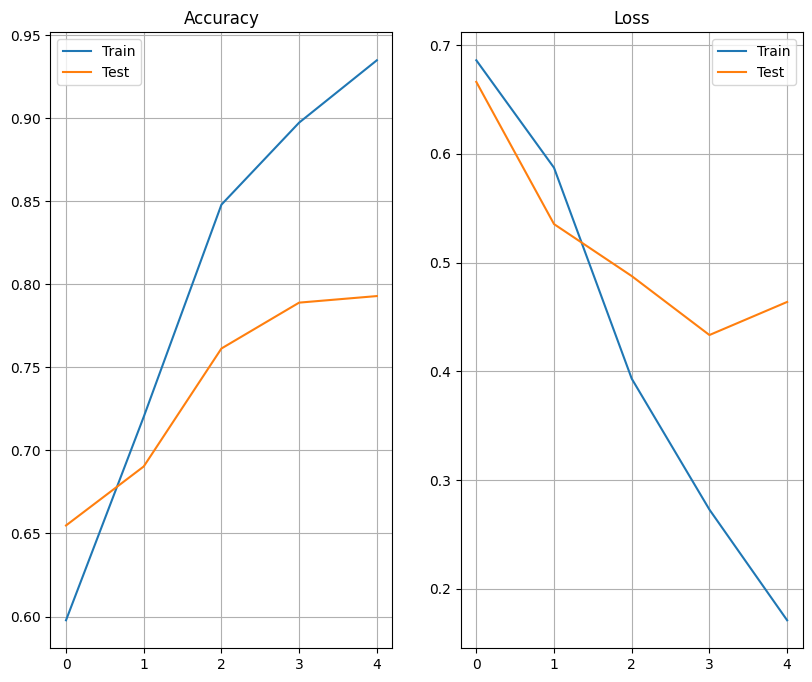

 1/16 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step

 2/16 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step 

 4/16 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

 5/16 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

 7/16 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

 9/16 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

11/16 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

13/16 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

15/16 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 50ms/step


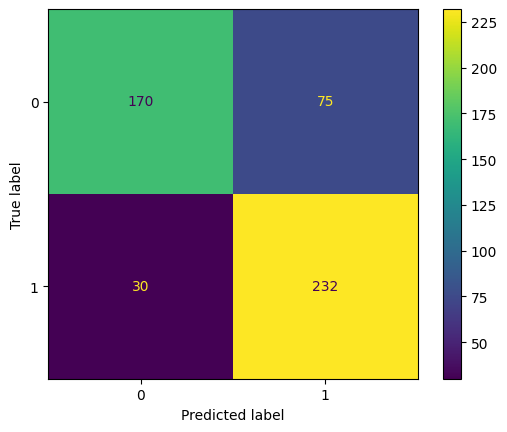

Accuracy: 0.7928994082840237
Precision: 0.755700325732899
Recall: 0.8854961832061069


Epoch 1/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 2:29 1s/step - accuracy: 0.4375 - loss: 0.6937

  2/140 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - accuracy: 0.4766 - loss: 0.6937

  3/140 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - accuracy: 0.4948 - loss: 0.6937

  4/140 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - accuracy: 0.4902 - loss: 0.6938

  5/140 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - accuracy: 0.4884 - loss: 0.6938

  6/140 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - accuracy: 0.4852 - loss: 0.6939

  7/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.4828 - loss: 0.6939

  8/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.4796 - loss: 0.6939

  9/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.4784 - loss: 0.6939

 10/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.4780 - loss: 0.6939

 11/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.4782 - loss: 0.6938

 12/140 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - accuracy: 0.4790 - loss: 0.6938

 13/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.4791 - loss: 0.6938

 14/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.4790 - loss: 0.6938

 15/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.4787 - loss: 0.6938

 16/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.4788 - loss: 0.6938

 17/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.4795 - loss: 0.6938

 18/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.4806 - loss: 0.6937

 19/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.4818 - loss: 0.6937

 20/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.4828 - loss: 0.6937

 21/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.4841 - loss: 0.6937

 22/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.4855 - loss: 0.6936

 23/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.4869 - loss: 0.6936

 24/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.4885 - loss: 0.6936

 25/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.4901 - loss: 0.6935

 26/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.4913 - loss: 0.6935

 27/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.4924 - loss: 0.6935

 28/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.4935 - loss: 0.6934

 29/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.4945 - loss: 0.6934

 30/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.4954 - loss: 0.6934

 31/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.4963 - loss: 0.6933

 32/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.4970 - loss: 0.6933

 33/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.4976 - loss: 0.6933

 34/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.4983 - loss: 0.6932

 35/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.4988 - loss: 0.6932

 36/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.4993 - loss: 0.6932

 37/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.4996 - loss: 0.6932

 38/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.5000 - loss: 0.6932

 39/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.5002 - loss: 0.6931

 40/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.5005 - loss: 0.6931

 41/140 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - accuracy: 0.5007 - loss: 0.6931

 42/140 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - accuracy: 0.5010 - loss: 0.6931

 43/140 ━━━━━━━━━━━━━━━━━━━━ 12s 125ms/step - accuracy: 0.5012 - loss: 0.6930

 44/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5014 - loss: 0.6930

 45/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5017 - loss: 0.6930

 46/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5019 - loss: 0.6930

 47/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5022 - loss: 0.6929

 48/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5026 - loss: 0.6929

 49/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5029 - loss: 0.6929

 50/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5033 - loss: 0.6929

 51/140 ━━━━━━━━━━━━━━━━━━━━ 11s 125ms/step - accuracy: 0.5037 - loss: 0.6928

 52/140 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - accuracy: 0.5041 - loss: 0.6928

 53/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.5046 - loss: 0.6928

 54/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.5052 - loss: 0.6927

 55/140 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - accuracy: 0.5058 - loss: 0.6927

 56/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.5064 - loss: 0.6927

 57/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.5070 - loss: 0.6926

 58/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.5076 - loss: 0.6926

 59/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.5083 - loss: 0.6925

 60/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5088 - loss: 0.6925 

 61/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5094 - loss: 0.6924

 62/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5100 - loss: 0.6924

 63/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5106 - loss: 0.6923

 64/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5113 - loss: 0.6923

 65/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5119 - loss: 0.6922

 66/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5125 - loss: 0.6922

 67/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.5132 - loss: 0.6921

 68/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5138 - loss: 0.6921

 69/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5144 - loss: 0.6920

 70/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5150 - loss: 0.6919

 71/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5156 - loss: 0.6919

 72/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5162 - loss: 0.6918

 73/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5169 - loss: 0.6917

 74/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5175 - loss: 0.6916

 75/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.5181 - loss: 0.6915

 76/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5188 - loss: 0.6914

 77/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5194 - loss: 0.6913

 78/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5201 - loss: 0.6912

 79/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5208 - loss: 0.6911

 80/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5214 - loss: 0.6910

 81/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5221 - loss: 0.6909

 82/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5227 - loss: 0.6908

 83/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.5234 - loss: 0.6906

 84/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5241 - loss: 0.6905

 85/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5248 - loss: 0.6904

 86/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5255 - loss: 0.6902

 87/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5262 - loss: 0.6901

 88/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5269 - loss: 0.6899

 89/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5276 - loss: 0.6897

 90/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5284 - loss: 0.6896

 91/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.5291 - loss: 0.6894

 92/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5298 - loss: 0.6892

 93/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5305 - loss: 0.6890

 94/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5312 - loss: 0.6889

 95/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5319 - loss: 0.6887

 96/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5326 - loss: 0.6885

 97/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5333 - loss: 0.6883

 98/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5339 - loss: 0.6881

 99/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.5346 - loss: 0.6879

100/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5353 - loss: 0.6877

101/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5359 - loss: 0.6875

102/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5366 - loss: 0.6872

103/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5372 - loss: 0.6870

104/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5379 - loss: 0.6868

105/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5385 - loss: 0.6866

106/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5391 - loss: 0.6863

107/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.5397 - loss: 0.6861

108/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5403 - loss: 0.6859

109/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5410 - loss: 0.6856

110/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5416 - loss: 0.6854

111/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5422 - loss: 0.6851

112/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5428 - loss: 0.6849

113/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5435 - loss: 0.6846

114/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5441 - loss: 0.6843

115/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.5447 - loss: 0.6840

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5454 - loss: 0.6837

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5460 - loss: 0.6834

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5466 - loss: 0.6831

119/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5473 - loss: 0.6828

120/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5479 - loss: 0.6825

121/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5485 - loss: 0.6822

122/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5492 - loss: 0.6819

123/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.5498 - loss: 0.6816

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5504 - loss: 0.6812

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5511 - loss: 0.6809

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5517 - loss: 0.6805

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5523 - loss: 0.6802

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5530 - loss: 0.6799

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5536 - loss: 0.6795

130/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5542 - loss: 0.6792

131/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.5548 - loss: 0.6788

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5554 - loss: 0.6785

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5561 - loss: 0.6781

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5567 - loss: 0.6777

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5573 - loss: 0.6774

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5579 - loss: 0.6770

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5586 - loss: 0.6766

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5592 - loss: 0.6762

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5598 - loss: 0.6759

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.5604 - loss: 0.6755

140/140 ━━━━━━━━━━━━━━━━━━━━ 20s 136ms/step - accuracy: 0.5610 - loss: 0.6751 - val_accuracy: 0.7776 - val_loss: 0.4669


Epoch 2/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 18s 136ms/step - accuracy: 0.8750 - loss: 0.3674

  2/140 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - accuracy: 0.8906 - loss: 0.3632

  3/140 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - accuracy: 0.8750 - loss: 0.3739

  4/140 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - accuracy: 0.8672 - loss: 0.3805

  5/140 ━━━━━━━━━━━━━━━━━━━━ 17s 126ms/step - accuracy: 0.8662 - loss: 0.3818

  6/140 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - accuracy: 0.8660 - loss: 0.3812

  7/140 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - accuracy: 0.8666 - loss: 0.3806

  8/140 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - accuracy: 0.8667 - loss: 0.3801

  9/140 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - accuracy: 0.8668 - loss: 0.3796

 10/140 ━━━━━━━━━━━━━━━━━━━━ 16s 129ms/step - accuracy: 0.8661 - loss: 0.3797

 11/140 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - accuracy: 0.8651 - loss: 0.3798

 12/140 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - accuracy: 0.8638 - loss: 0.3804

 13/140 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - accuracy: 0.8622 - loss: 0.3808

 14/140 ━━━━━━━━━━━━━━━━━━━━ 16s 128ms/step - accuracy: 0.8604 - loss: 0.3813

 15/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8588 - loss: 0.3815

 16/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8572 - loss: 0.3819

 17/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8559 - loss: 0.3822

 18/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8543 - loss: 0.3828

 19/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8532 - loss: 0.3833

 20/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8519 - loss: 0.3836

 21/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8507 - loss: 0.3840

 22/140 ━━━━━━━━━━━━━━━━━━━━ 15s 128ms/step - accuracy: 0.8497 - loss: 0.3844

 23/140 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - accuracy: 0.8486 - loss: 0.3846

 24/140 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - accuracy: 0.8477 - loss: 0.3848

 25/140 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - accuracy: 0.8467 - loss: 0.3850

 26/140 ━━━━━━━━━━━━━━━━━━━━ 14s 127ms/step - accuracy: 0.8458 - loss: 0.3851

 27/140 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - accuracy: 0.8450 - loss: 0.3853

 28/140 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - accuracy: 0.8442 - loss: 0.3855

 29/140 ━━━━━━━━━━━━━━━━━━━━ 14s 126ms/step - accuracy: 0.8434 - loss: 0.3856

 30/140 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.8427 - loss: 0.3857

 31/140 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.8421 - loss: 0.3857

 32/140 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.8417 - loss: 0.3855

 33/140 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.8412 - loss: 0.3854

 34/140 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.8407 - loss: 0.3853

 35/140 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.8404 - loss: 0.3851

 36/140 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - accuracy: 0.8401 - loss: 0.3849

 37/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8398 - loss: 0.3847

 38/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8396 - loss: 0.3844

 39/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8394 - loss: 0.3841

 40/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8393 - loss: 0.3838

 41/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8391 - loss: 0.3835

 42/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8390 - loss: 0.3833

 43/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8389 - loss: 0.3830

 44/140 ━━━━━━━━━━━━━━━━━━━━ 12s 126ms/step - accuracy: 0.8389 - loss: 0.3827

 45/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8388 - loss: 0.3824

 46/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8388 - loss: 0.3820

 47/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8388 - loss: 0.3816

 48/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8388 - loss: 0.3812

 49/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8388 - loss: 0.3809

 50/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8388 - loss: 0.3806

 51/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8387 - loss: 0.3803

 52/140 ━━━━━━━━━━━━━━━━━━━━ 11s 126ms/step - accuracy: 0.8387 - loss: 0.3800

 53/140 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.8387 - loss: 0.3797

 54/140 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.8386 - loss: 0.3795

 55/140 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.8386 - loss: 0.3793

 56/140 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.8385 - loss: 0.3790

 57/140 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.8385 - loss: 0.3787

 58/140 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.8385 - loss: 0.3785

 59/140 ━━━━━━━━━━━━━━━━━━━━ 10s 126ms/step - accuracy: 0.8385 - loss: 0.3782

 60/140 ━━━━━━━━━━━━━━━━━━━━ 10s 125ms/step - accuracy: 0.8385 - loss: 0.3779

 61/140 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - accuracy: 0.8386 - loss: 0.3776 

 62/140 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - accuracy: 0.8386 - loss: 0.3772

 63/140 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step - accuracy: 0.8386 - loss: 0.3769

 64/140 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - accuracy: 0.8387 - loss: 0.3766

 65/140 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - accuracy: 0.8388 - loss: 0.3763

 66/140 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - accuracy: 0.8388 - loss: 0.3759

 67/140 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - accuracy: 0.8389 - loss: 0.3756

 68/140 ━━━━━━━━━━━━━━━━━━━━ 9s 125ms/step - accuracy: 0.8389 - loss: 0.3753

 69/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8390 - loss: 0.3750

 70/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8391 - loss: 0.3746

 71/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8391 - loss: 0.3743

 72/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8392 - loss: 0.3740

 73/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8393 - loss: 0.3737

 74/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8393 - loss: 0.3734

 75/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8394 - loss: 0.3731

 76/140 ━━━━━━━━━━━━━━━━━━━━ 8s 125ms/step - accuracy: 0.8395 - loss: 0.3728

 77/140 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.8396 - loss: 0.3725

 78/140 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.8396 - loss: 0.3722

 79/140 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.8397 - loss: 0.3720

 80/140 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.8398 - loss: 0.3717

 81/140 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.8399 - loss: 0.3714

 82/140 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.8400 - loss: 0.3711

 83/140 ━━━━━━━━━━━━━━━━━━━━ 7s 125ms/step - accuracy: 0.8401 - loss: 0.3708

 84/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8402 - loss: 0.3705

 85/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8403 - loss: 0.3702

 86/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8404 - loss: 0.3699

 87/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8404 - loss: 0.3697

 88/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8405 - loss: 0.3694

 89/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8406 - loss: 0.3692

 90/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8406 - loss: 0.3689

 91/140 ━━━━━━━━━━━━━━━━━━━━ 6s 125ms/step - accuracy: 0.8407 - loss: 0.3687

 92/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8408 - loss: 0.3684

 93/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8408 - loss: 0.3682

 94/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8409 - loss: 0.3680

 95/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8409 - loss: 0.3677

 96/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8410 - loss: 0.3675

 97/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8411 - loss: 0.3673

 98/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8411 - loss: 0.3670

 99/140 ━━━━━━━━━━━━━━━━━━━━ 5s 125ms/step - accuracy: 0.8412 - loss: 0.3668

100/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8412 - loss: 0.3666

101/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8413 - loss: 0.3664

102/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8413 - loss: 0.3661

103/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8414 - loss: 0.3659

104/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8415 - loss: 0.3657

105/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8415 - loss: 0.3655

106/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8416 - loss: 0.3653

107/140 ━━━━━━━━━━━━━━━━━━━━ 4s 125ms/step - accuracy: 0.8417 - loss: 0.3651

108/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8417 - loss: 0.3649

109/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8418 - loss: 0.3647

110/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8419 - loss: 0.3645

111/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8419 - loss: 0.3643

112/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8420 - loss: 0.3641

113/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8421 - loss: 0.3639

114/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8422 - loss: 0.3637

115/140 ━━━━━━━━━━━━━━━━━━━━ 3s 125ms/step - accuracy: 0.8422 - loss: 0.3634

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8423 - loss: 0.3632

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8424 - loss: 0.3630

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8425 - loss: 0.3628

119/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8425 - loss: 0.3626

120/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8426 - loss: 0.3624

121/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8427 - loss: 0.3622

122/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8428 - loss: 0.3620

123/140 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step - accuracy: 0.8428 - loss: 0.3618

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8429 - loss: 0.3616

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8430 - loss: 0.3614

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8431 - loss: 0.3612

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8431 - loss: 0.3610

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8432 - loss: 0.3607

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8433 - loss: 0.3605

130/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8434 - loss: 0.3603

131/140 ━━━━━━━━━━━━━━━━━━━━ 1s 125ms/step - accuracy: 0.8435 - loss: 0.3601

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8435 - loss: 0.3599

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8436 - loss: 0.3597

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8437 - loss: 0.3595

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8438 - loss: 0.3593

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8438 - loss: 0.3592

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8439 - loss: 0.3590

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8440 - loss: 0.3588

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step - accuracy: 0.8440 - loss: 0.3586

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.8441 - loss: 0.3584

140/140 ━━━━━━━━━━━━━━━━━━━━ 19s 136ms/step - accuracy: 0.8442 - loss: 0.3582 - val_accuracy: 0.8376 - val_loss: 0.3601


Epoch 3/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - accuracy: 0.8125 - loss: 0.3579

  2/140 ━━━━━━━━━━━━━━━━━━━━ 18s 132ms/step - accuracy: 0.8594 - loss: 0.2930

  3/140 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - accuracy: 0.8611 - loss: 0.2813

  4/140 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - accuracy: 0.8665 - loss: 0.2700

  5/140 ━━━━━━━━━━━━━━━━━━━━ 16s 125ms/step - accuracy: 0.8695 - loss: 0.2689

  6/140 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - accuracy: 0.8730 - loss: 0.2678

  7/140 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - accuracy: 0.8771 - loss: 0.2661

  8/140 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - accuracy: 0.8803 - loss: 0.2638

  9/140 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - accuracy: 0.8828 - loss: 0.2620

 10/140 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - accuracy: 0.8845 - loss: 0.2599

 11/140 ━━━━━━━━━━━━━━━━━━━━ 16s 124ms/step - accuracy: 0.8860 - loss: 0.2578

 12/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8879 - loss: 0.2555

 13/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8893 - loss: 0.2537

 14/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8903 - loss: 0.2523

 15/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8917 - loss: 0.2505

 16/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8931 - loss: 0.2486

 17/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8943 - loss: 0.2469

 18/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8953 - loss: 0.2454

 19/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.8962 - loss: 0.2440

 20/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.8971 - loss: 0.2427

 21/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.8979 - loss: 0.2413

 22/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.8986 - loss: 0.2399

 23/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.8994 - loss: 0.2385

 24/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9000 - loss: 0.2372

 25/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.9006 - loss: 0.2359

 26/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.9011 - loss: 0.2348

 27/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.9016 - loss: 0.2338

 28/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9021 - loss: 0.2329

 29/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9026 - loss: 0.2320

 30/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9031 - loss: 0.2311

 31/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9036 - loss: 0.2303

 32/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9041 - loss: 0.2295

 33/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9045 - loss: 0.2288

 34/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9048 - loss: 0.2282

 35/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9052 - loss: 0.2276

 36/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9055 - loss: 0.2269

 37/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9059 - loss: 0.2262

 38/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9062 - loss: 0.2256

 39/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9065 - loss: 0.2250

 40/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9068 - loss: 0.2244

 41/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9071 - loss: 0.2238

 42/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9074 - loss: 0.2232

 43/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9077 - loss: 0.2227

 44/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9080 - loss: 0.2221

 45/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9082 - loss: 0.2217

 46/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9085 - loss: 0.2212

 47/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9087 - loss: 0.2207

 48/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9089 - loss: 0.2203

 49/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9091 - loss: 0.2200

 50/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9094 - loss: 0.2196

 51/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9096 - loss: 0.2193

 52/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9099 - loss: 0.2189

 53/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9101 - loss: 0.2186

 54/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9103 - loss: 0.2183

 55/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9106 - loss: 0.2180

 56/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9108 - loss: 0.2177

 57/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9110 - loss: 0.2174

 58/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9113 - loss: 0.2171

 59/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9115 - loss: 0.2167

 60/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9117 - loss: 0.2164 

 61/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9119 - loss: 0.2161

 62/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9121 - loss: 0.2159

 63/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9123 - loss: 0.2156

 64/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9124 - loss: 0.2153

 65/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9126 - loss: 0.2150

 66/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9128 - loss: 0.2147

 67/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9130 - loss: 0.2144

 68/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9131 - loss: 0.2141

 69/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9133 - loss: 0.2139

 70/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9135 - loss: 0.2136

 71/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9136 - loss: 0.2133

 72/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9138 - loss: 0.2130

 73/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9139 - loss: 0.2127

 74/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9141 - loss: 0.2125

 75/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9142 - loss: 0.2122

 76/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9143 - loss: 0.2119

 77/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9144 - loss: 0.2117

 78/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9146 - loss: 0.2114

 79/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9147 - loss: 0.2112

 80/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9148 - loss: 0.2109

 81/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9149 - loss: 0.2106

 82/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9151 - loss: 0.2104

 83/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9152 - loss: 0.2101

 84/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9153 - loss: 0.2099

 85/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9154 - loss: 0.2097

 86/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9155 - loss: 0.2095

 87/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9156 - loss: 0.2092

 88/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9157 - loss: 0.2090

 89/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9158 - loss: 0.2088

 90/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9159 - loss: 0.2086

 91/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9160 - loss: 0.2084

 92/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9161 - loss: 0.2081

 93/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9162 - loss: 0.2079

 94/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9163 - loss: 0.2077

 95/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9164 - loss: 0.2075

 96/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9165 - loss: 0.2073

 97/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9166 - loss: 0.2071

 98/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9167 - loss: 0.2069

 99/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9168 - loss: 0.2066

100/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9169 - loss: 0.2064

101/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9169 - loss: 0.2062

102/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9170 - loss: 0.2061

103/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9171 - loss: 0.2059

104/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9172 - loss: 0.2057

105/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9173 - loss: 0.2055

106/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9173 - loss: 0.2053

107/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9174 - loss: 0.2051

108/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9175 - loss: 0.2050

109/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9175 - loss: 0.2048

110/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9176 - loss: 0.2047

111/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9176 - loss: 0.2045

112/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9177 - loss: 0.2044

113/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9177 - loss: 0.2042

114/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9178 - loss: 0.2041

115/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9178 - loss: 0.2040

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9179 - loss: 0.2038

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9179 - loss: 0.2037

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9179 - loss: 0.2036

119/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9180 - loss: 0.2035

120/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9180 - loss: 0.2034

121/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9180 - loss: 0.2033

122/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9180 - loss: 0.2032

123/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9181 - loss: 0.2031

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9181 - loss: 0.2029

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9181 - loss: 0.2028

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9182 - loss: 0.2027

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9182 - loss: 0.2026

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9182 - loss: 0.2025

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9182 - loss: 0.2024

130/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9182 - loss: 0.2023

131/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9183 - loss: 0.2022

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9183 - loss: 0.2021

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9183 - loss: 0.2020

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9183 - loss: 0.2019

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9183 - loss: 0.2018

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9184 - loss: 0.2017

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9184 - loss: 0.2016

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9184 - loss: 0.2015

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9184 - loss: 0.2014

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9185 - loss: 0.2013

140/140 ━━━━━━━━━━━━━━━━━━━━ 19s 135ms/step - accuracy: 0.9185 - loss: 0.2013 - val_accuracy: 0.8457 - val_loss: 0.3693


Epoch 4/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 19s 139ms/step - accuracy: 0.9375 - loss: 0.1481

  2/140 ━━━━━━━━━━━━━━━━━━━━ 17s 124ms/step - accuracy: 0.9453 - loss: 0.1378

  3/140 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - accuracy: 0.9427 - loss: 0.1379

  4/140 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - accuracy: 0.9434 - loss: 0.1336

  5/140 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - accuracy: 0.9447 - loss: 0.1310

  6/140 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - accuracy: 0.9470 - loss: 0.1290

  7/140 ━━━━━━━━━━━━━━━━━━━━ 16s 122ms/step - accuracy: 0.9482 - loss: 0.1280

  8/140 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - accuracy: 0.9493 - loss: 0.1276

  9/140 ━━━━━━━━━━━━━━━━━━━━ 16s 123ms/step - accuracy: 0.9507 - loss: 0.1265

 10/140 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - accuracy: 0.9518 - loss: 0.1253

 11/140 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - accuracy: 0.9526 - loss: 0.1247

 12/140 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - accuracy: 0.9535 - loss: 0.1238

 13/140 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - accuracy: 0.9541 - loss: 0.1231

 14/140 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - accuracy: 0.9545 - loss: 0.1226

 15/140 ━━━━━━━━━━━━━━━━━━━━ 15s 123ms/step - accuracy: 0.9547 - loss: 0.1222

 16/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.9548 - loss: 0.1219

 17/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.9550 - loss: 0.1216

 18/140 ━━━━━━━━━━━━━━━━━━━━ 15s 124ms/step - accuracy: 0.9551 - loss: 0.1214

 19/140 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - accuracy: 0.9553 - loss: 0.1211

 20/140 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - accuracy: 0.9555 - loss: 0.1208

 21/140 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - accuracy: 0.9558 - loss: 0.1206

 22/140 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - accuracy: 0.9560 - loss: 0.1204

 23/140 ━━━━━━━━━━━━━━━━━━━━ 14s 123ms/step - accuracy: 0.9562 - loss: 0.1202

 24/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.9564 - loss: 0.1201

 25/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.9565 - loss: 0.1201

 26/140 ━━━━━━━━━━━━━━━━━━━━ 14s 124ms/step - accuracy: 0.9566 - loss: 0.1201

 27/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9567 - loss: 0.1200

 28/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9568 - loss: 0.1200

 29/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9569 - loss: 0.1200

 30/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9570 - loss: 0.1199

 31/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9571 - loss: 0.1198

 32/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9572 - loss: 0.1198

 33/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9573 - loss: 0.1197

 34/140 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - accuracy: 0.9573 - loss: 0.1197

 35/140 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - accuracy: 0.9574 - loss: 0.1196

 36/140 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - accuracy: 0.9574 - loss: 0.1195

 37/140 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - accuracy: 0.9575 - loss: 0.1193

 38/140 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - accuracy: 0.9576 - loss: 0.1192

 39/140 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - accuracy: 0.9577 - loss: 0.1190

 40/140 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - accuracy: 0.9579 - loss: 0.1188

 41/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9580 - loss: 0.1185

 42/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9581 - loss: 0.1183

 43/140 ━━━━━━━━━━━━━━━━━━━━ 11s 123ms/step - accuracy: 0.9582 - loss: 0.1181

 44/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9584 - loss: 0.1178

 45/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9585 - loss: 0.1176

 46/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9586 - loss: 0.1174

 47/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9587 - loss: 0.1173

 48/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9587 - loss: 0.1171

 49/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9588 - loss: 0.1170

 50/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9588 - loss: 0.1170

 51/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9589 - loss: 0.1169

 52/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9589 - loss: 0.1169

 53/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9589 - loss: 0.1168

 54/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9590 - loss: 0.1168

 55/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9590 - loss: 0.1168

 56/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9590 - loss: 0.1168

 57/140 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - accuracy: 0.9591 - loss: 0.1167

 58/140 ━━━━━━━━━━━━━━━━━━━━ 10s 123ms/step - accuracy: 0.9591 - loss: 0.1167

 59/140 ━━━━━━━━━━━━━━━━━━━━ 9s 123ms/step - accuracy: 0.9592 - loss: 0.1167 

 60/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9593 - loss: 0.1166

 61/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9593 - loss: 0.1166

 62/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9594 - loss: 0.1165

 63/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9594 - loss: 0.1165

 64/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9595 - loss: 0.1165

 65/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9595 - loss: 0.1165

 66/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9595 - loss: 0.1165

 67/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9596 - loss: 0.1165

 68/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9596 - loss: 0.1166

 69/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9596 - loss: 0.1166

 70/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9596 - loss: 0.1166

 71/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9597 - loss: 0.1167

 72/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9597 - loss: 0.1167

 73/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9597 - loss: 0.1167

 74/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9598 - loss: 0.1168

 75/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9598 - loss: 0.1168

 76/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9598 - loss: 0.1168

 77/140 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy: 0.9599 - loss: 0.1169

 78/140 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - accuracy: 0.9599 - loss: 0.1169

 79/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9599 - loss: 0.1169

 80/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9599 - loss: 0.1169

 81/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9600 - loss: 0.1169

 82/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9600 - loss: 0.1170

 83/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9600 - loss: 0.1170

 84/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9600 - loss: 0.1170

 85/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9601 - loss: 0.1169

 86/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9601 - loss: 0.1169

 87/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9601 - loss: 0.1169

 88/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9602 - loss: 0.1169

 89/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9602 - loss: 0.1169

 90/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9602 - loss: 0.1169

 91/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9602 - loss: 0.1169

 92/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9602 - loss: 0.1169

 93/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9602 - loss: 0.1169

 94/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9603 - loss: 0.1169

 95/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9603 - loss: 0.1169

 96/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9603 - loss: 0.1168

 97/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9603 - loss: 0.1168

 98/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9603 - loss: 0.1168

 99/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9603 - loss: 0.1168

100/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1168

101/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1168

102/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1169

103/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1169

104/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1169

105/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1169

106/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1169

107/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9603 - loss: 0.1169

108/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1169

109/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1170

110/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1170

111/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1170

112/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1170

113/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1170

114/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1170

115/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9603 - loss: 0.1170

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1171

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1171

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1171

119/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1171

120/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1171

121/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1171

122/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1172

123/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9603 - loss: 0.1172

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9603 - loss: 0.1172

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9602 - loss: 0.1172

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.9602 - loss: 0.1172

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.9602 - loss: 0.1173

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.9602 - loss: 0.1173

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.9602 - loss: 0.1173

130/140 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.9602 - loss: 0.1173

131/140 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - accuracy: 0.9602 - loss: 0.1174

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9602 - loss: 0.1174

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9601 - loss: 0.1174

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9601 - loss: 0.1175

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9601 - loss: 0.1175

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9601 - loss: 0.1175

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9601 - loss: 0.1176

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9600 - loss: 0.1176

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9600 - loss: 0.1176

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - accuracy: 0.9600 - loss: 0.1177

140/140 ━━━━━━━━━━━━━━━━━━━━ 19s 135ms/step - accuracy: 0.9600 - loss: 0.1177 - val_accuracy: 0.8410 - val_loss: 0.4187


Epoch 5/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 18s 131ms/step - accuracy: 1.0000 - loss: 0.0976

  2/140 ━━━━━━━━━━━━━━━━━━━━ 17s 125ms/step - accuracy: 0.9922 - loss: 0.0999

  3/140 ━━━━━━━━━━━━━━━━━━━━ 17s 127ms/step - accuracy: 0.9913 - loss: 0.0959

  4/140 ━━━━━━━━━━━━━━━━━━━━ 17s 131ms/step - accuracy: 0.9896 - loss: 0.0925

  5/140 ━━━━━━━━━━━━━━━━━━━━ 17s 129ms/step - accuracy: 0.9892 - loss: 0.0887

  6/140 ━━━━━━━━━━━━━━━━━━━━ 17s 128ms/step - accuracy: 0.9884 - loss: 0.0867

  7/140 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - accuracy: 0.9881 - loss: 0.0848

  8/140 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - accuracy: 0.9881 - loss: 0.0831

  9/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.9871 - loss: 0.0837

 10/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.9859 - loss: 0.0850

 11/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.9849 - loss: 0.0862

 12/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.9840 - loss: 0.0872

 13/140 ━━━━━━━━━━━━━━━━━━━━ 16s 126ms/step - accuracy: 0.9830 - loss: 0.0880

 14/140 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - accuracy: 0.9823 - loss: 0.0884

 15/140 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - accuracy: 0.9817 - loss: 0.0888

 16/140 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - accuracy: 0.9811 - loss: 0.0890

 17/140 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - accuracy: 0.9807 - loss: 0.0892

 18/140 ━━━━━━━━━━━━━━━━━━━━ 15s 126ms/step - accuracy: 0.9803 - loss: 0.0893

 19/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.9800 - loss: 0.0894

 20/140 ━━━━━━━━━━━━━━━━━━━━ 15s 125ms/step - accuracy: 0.9797 - loss: 0.0895

 21/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9793 - loss: 0.0897

 22/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9791 - loss: 0.0897

 23/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9788 - loss: 0.0898

 24/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9785 - loss: 0.0898

 25/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9783 - loss: 0.0897

 26/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9781 - loss: 0.0898

 27/140 ━━━━━━━━━━━━━━━━━━━━ 14s 125ms/step - accuracy: 0.9778 - loss: 0.0898

 28/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.9776 - loss: 0.0899

 29/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.9773 - loss: 0.0900

 30/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.9771 - loss: 0.0900

 31/140 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - accuracy: 0.9769 - loss: 0.0902

 32/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9767 - loss: 0.0903

 33/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9766 - loss: 0.0904

 34/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9764 - loss: 0.0905

 35/140 ━━━━━━━━━━━━━━━━━━━━ 13s 124ms/step - accuracy: 0.9762 - loss: 0.0906

 36/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9761 - loss: 0.0907

 37/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9759 - loss: 0.0907

 38/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9758 - loss: 0.0908

 39/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9757 - loss: 0.0908

 40/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9756 - loss: 0.0907

 41/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9755 - loss: 0.0907

 42/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9755 - loss: 0.0907

 43/140 ━━━━━━━━━━━━━━━━━━━━ 12s 124ms/step - accuracy: 0.9754 - loss: 0.0907

 44/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9753 - loss: 0.0906

 45/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9753 - loss: 0.0906

 46/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9752 - loss: 0.0905

 47/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9752 - loss: 0.0904

 48/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9752 - loss: 0.0904

 49/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9752 - loss: 0.0903

 50/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9752 - loss: 0.0901

 51/140 ━━━━━━━━━━━━━━━━━━━━ 11s 124ms/step - accuracy: 0.9752 - loss: 0.0900

 52/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0899

 53/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0898

 54/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0897

 55/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0896

 56/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0895

 57/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0894

 58/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0894

 59/140 ━━━━━━━━━━━━━━━━━━━━ 10s 124ms/step - accuracy: 0.9752 - loss: 0.0893

 60/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9752 - loss: 0.0892 

 61/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9752 - loss: 0.0891

 62/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9752 - loss: 0.0890

 63/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9752 - loss: 0.0889

 64/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9752 - loss: 0.0889

 65/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9752 - loss: 0.0888

 66/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9752 - loss: 0.0887

 67/140 ━━━━━━━━━━━━━━━━━━━━ 9s 124ms/step - accuracy: 0.9753 - loss: 0.0886

 68/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0885

 69/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0884

 70/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0884

 71/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0883

 72/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0882

 73/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0881

 74/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0881

 75/140 ━━━━━━━━━━━━━━━━━━━━ 8s 124ms/step - accuracy: 0.9753 - loss: 0.0880

 76/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9753 - loss: 0.0879

 77/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9754 - loss: 0.0878

 78/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9754 - loss: 0.0877

 79/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9754 - loss: 0.0876

 80/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9754 - loss: 0.0876

 81/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9754 - loss: 0.0875

 82/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9754 - loss: 0.0874

 83/140 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - accuracy: 0.9754 - loss: 0.0874

 84/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9754 - loss: 0.0873

 85/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9754 - loss: 0.0872

 86/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9754 - loss: 0.0871

 87/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9755 - loss: 0.0870

 88/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9755 - loss: 0.0869

 89/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9755 - loss: 0.0869

 90/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9755 - loss: 0.0868

 91/140 ━━━━━━━━━━━━━━━━━━━━ 6s 124ms/step - accuracy: 0.9755 - loss: 0.0867

 92/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9755 - loss: 0.0866

 93/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9755 - loss: 0.0865

 94/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9755 - loss: 0.0865

 95/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9755 - loss: 0.0864

 96/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9756 - loss: 0.0863

 97/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9756 - loss: 0.0863

 98/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9756 - loss: 0.0862

 99/140 ━━━━━━━━━━━━━━━━━━━━ 5s 124ms/step - accuracy: 0.9756 - loss: 0.0862

100/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9756 - loss: 0.0861

101/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9756 - loss: 0.0861

102/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9756 - loss: 0.0860

103/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9756 - loss: 0.0860

104/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9756 - loss: 0.0860

105/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9756 - loss: 0.0860

106/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9755 - loss: 0.0859

107/140 ━━━━━━━━━━━━━━━━━━━━ 4s 124ms/step - accuracy: 0.9755 - loss: 0.0859

108/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9755 - loss: 0.0859

109/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9755 - loss: 0.0859

110/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9755 - loss: 0.0858

111/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9755 - loss: 0.0858

112/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9755 - loss: 0.0858

113/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9754 - loss: 0.0858

114/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9754 - loss: 0.0858

115/140 ━━━━━━━━━━━━━━━━━━━━ 3s 124ms/step - accuracy: 0.9754 - loss: 0.0858

116/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9754 - loss: 0.0858

117/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9753 - loss: 0.0858

118/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9753 - loss: 0.0858

119/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9753 - loss: 0.0858

120/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9752 - loss: 0.0858

121/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9752 - loss: 0.0858

122/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9752 - loss: 0.0858

123/140 ━━━━━━━━━━━━━━━━━━━━ 2s 124ms/step - accuracy: 0.9751 - loss: 0.0858

124/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9751 - loss: 0.0858

125/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9751 - loss: 0.0859

126/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9750 - loss: 0.0859

127/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9750 - loss: 0.0859

128/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9750 - loss: 0.0859

129/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9749 - loss: 0.0859

130/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9749 - loss: 0.0860

131/140 ━━━━━━━━━━━━━━━━━━━━ 1s 124ms/step - accuracy: 0.9748 - loss: 0.0860

132/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9748 - loss: 0.0860

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9748 - loss: 0.0860

134/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9747 - loss: 0.0861

135/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9747 - loss: 0.0861

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9746 - loss: 0.0861

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9746 - loss: 0.0861

138/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9746 - loss: 0.0862

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9745 - loss: 0.0862

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step - accuracy: 0.9745 - loss: 0.0862

140/140 ━━━━━━━━━━━━━━━━━━━━ 19s 135ms/step - accuracy: 0.9745 - loss: 0.0862 - val_accuracy: 0.8464 - val_loss: 0.4660


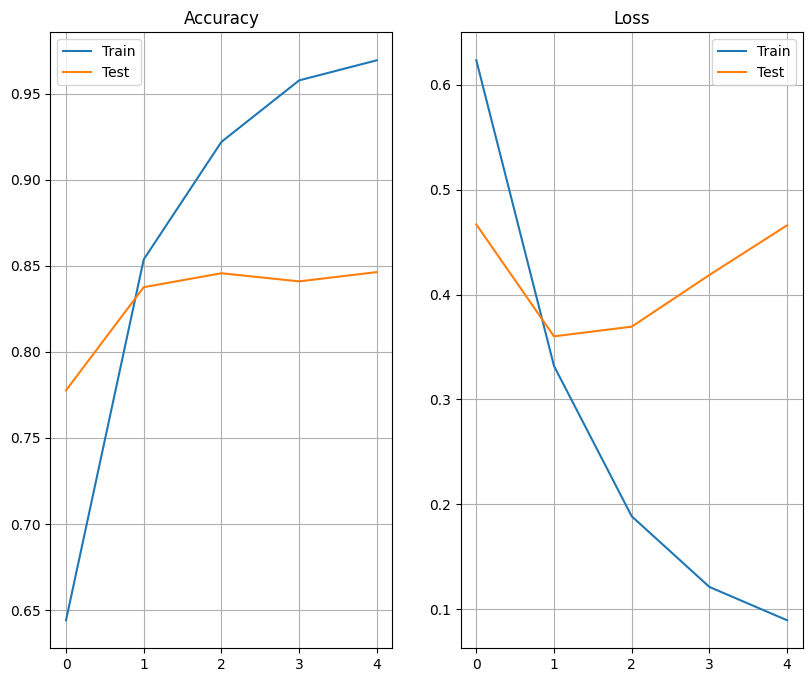

 1/47 ━━━━━━━━━━━━━━━━━━━━ 5s 120ms/step

 3/47 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step 

 5/47 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

 7/47 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

 9/47 ━━━━━━━━━━━━━━━━━━━━ 1s 31ms/step

11/47 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

13/47 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step

15/47 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step

17/47 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

19/47 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

21/47 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

23/47 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

25/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

27/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

29/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

31/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

33/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

35/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

37/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

39/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

41/47 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

43/47 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

45/47 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step

47/47 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step


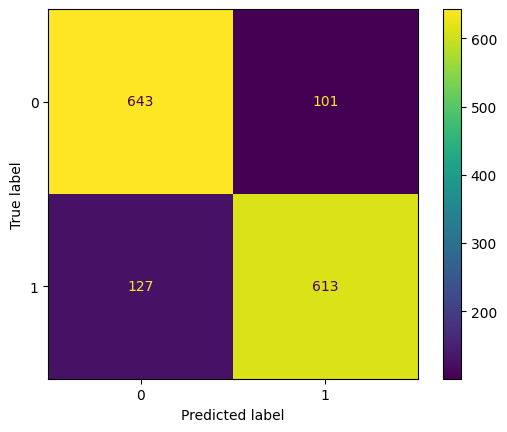

Accuracy: 0.8463611859838275
Precision: 0.8585434173669467
Recall: 0.8283783783783784
Average accuracy: 0.8528584971215846
Average precision: 0.8642070457434622
Average recall: 0.8476473571739612


In [29]:
accuracy = []
precision = []
recall = []
for dataset in chosen_datasets:
    df = pd.read_csv(os.path.join("datasets", dataset))
    X_train, X_test, y_train, y_test = train_test_split(df["text"].values, df["label"].values, test_size=0.25, random_state=1)
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(X_train)
    sequences = tokenizer.texts_to_sequences(X_train)
    max_length = max([len(seq) for seq in sequences])
    padded_sequences = pad_sequences(sequences, maxlen=max_length)
    new_sequences = tokenizer.texts_to_sequences(X_test)
    new_padded_sequences = pad_sequences(new_sequences, maxlen=max_length)

    model = Sequential()
    model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=32))
    model.add(LSTM(32))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    epochs = 5
    history = model.fit(padded_sequences, y_train, validation_data=(new_padded_sequences, y_test), epochs=epochs)
    print_metrics(history, epochs=epochs)

    predictions = model.predict(new_padded_sequences)
    correct = 0
    predicted_labels = []
    for i in range(len(predictions)):
        prediction_label = 1 if predictions[i] > 0.5 else 0
        predicted_labels.append(prediction_label)
        if y_test[i] == prediction_label:
            correct += 1
    print_conf_matrix(y_test, predicted_labels)
    accuracy.append(correct / len(predictions))
    print(f"Accuracy: {correct / len(predictions)}")
    print(f"Precision: {precision_score(y_test, predicted_labels)}")
    precision.append(precision_score(y_test, predicted_labels))
    print(f"Recall: {recall_score(y_test, predicted_labels)}")
    recall.append(recall_score(y_test, predicted_labels))
print(f"Average accuracy: {np.average(accuracy)}")
print(f"Average precision: {np.average(precision)}")
print(f"Average recall: {np.average(recall)}")

In [30]:
from tensorflow.keras.layers import Conv1D, GlobalMaxPooling1D

Epoch 1/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 33s 573ms/step - accuracy: 0.3438 - loss: 0.6993

 3/60 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.4271 - loss: 0.6967  

 5/60 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.4559 - loss: 0.6954

 7/60 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - accuracy: 0.4657 - loss: 0.6948

 9/60 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.4741 - loss: 0.6941

11/60 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.4810 - loss: 0.6935

13/60 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.4872 - loss: 0.6929

15/60 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.4922 - loss: 0.6924

17/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.4950 - loss: 0.6921

19/60 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.4970 - loss: 0.6918

21/60 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - accuracy: 0.4984 - loss: 0.6916

23/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.4987 - loss: 0.6914

25/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4985 - loss: 0.6913

27/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4984 - loss: 0.6912

29/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4996 - loss: 0.6910

31/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5019 - loss: 0.6908

33/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5049 - loss: 0.6906

35/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5081 - loss: 0.6903

37/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5113 - loss: 0.6900

39/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5140 - loss: 0.6897

41/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5165 - loss: 0.6893

43/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5189 - loss: 0.6889

45/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5210 - loss: 0.6885

47/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5229 - loss: 0.6880

49/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5247 - loss: 0.6876

51/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5265 - loss: 0.6870

53/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5284 - loss: 0.6865

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5304 - loss: 0.6859

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5325 - loss: 0.6852

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5349 - loss: 0.6845

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.5372 - loss: 0.6837 - val_accuracy: 0.8454 - val_loss: 0.5547


Epoch 2/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.8750 - loss: 0.5543

 3/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8663 - loss: 0.5500

 5/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8582 - loss: 0.5454

 7/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8540 - loss: 0.5441

 9/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8502 - loss: 0.5417

11/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8479 - loss: 0.5394

13/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8469 - loss: 0.5360

15/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8464 - loss: 0.5321

17/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8470 - loss: 0.5278

19/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8477 - loss: 0.5235

21/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.8487 - loss: 0.5192

23/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8496 - loss: 0.5151

25/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8504 - loss: 0.5112

27/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8511 - loss: 0.5074

29/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8517 - loss: 0.5036

31/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8519 - loss: 0.5002

33/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8522 - loss: 0.4968

35/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8524 - loss: 0.4938

37/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8526 - loss: 0.4907

39/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8528 - loss: 0.4878

41/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8528 - loss: 0.4851

43/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8526 - loss: 0.4826

45/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8525 - loss: 0.4800

47/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8524 - loss: 0.4775

49/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8525 - loss: 0.4750

51/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8525 - loss: 0.4726

53/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8525 - loss: 0.4703

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8525 - loss: 0.4681

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8525 - loss: 0.4659

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.8525 - loss: 0.4640

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.8524 - loss: 0.4621 - val_accuracy: 0.8675 - val_loss: 0.3358


Epoch 3/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.9375 - loss: 0.2543

 3/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9201 - loss: 0.2825

 5/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9146 - loss: 0.2807

 7/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9081 - loss: 0.2797

 9/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9064 - loss: 0.2768

11/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9053 - loss: 0.2742

13/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9032 - loss: 0.2727

15/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9021 - loss: 0.2711

17/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9018 - loss: 0.2698

19/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9013 - loss: 0.2686

21/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9010 - loss: 0.2678

23/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9007 - loss: 0.2677

25/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.9008 - loss: 0.2675

27/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.9007 - loss: 0.2676

29/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9009 - loss: 0.2672

31/60 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.9012 - loss: 0.2664

33/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9013 - loss: 0.2657

35/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9015 - loss: 0.2648

37/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9016 - loss: 0.2640

39/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9016 - loss: 0.2635

41/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9017 - loss: 0.2628

43/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9018 - loss: 0.2622

45/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9018 - loss: 0.2616

47/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9018 - loss: 0.2610

49/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9019 - loss: 0.2603

51/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9021 - loss: 0.2597

53/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9022 - loss: 0.2590

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9023 - loss: 0.2583

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9025 - loss: 0.2575

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9027 - loss: 0.2568

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9030 - loss: 0.2560 - val_accuracy: 0.8880 - val_loss: 0.2807


Epoch 4/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - accuracy: 0.9688 - loss: 0.1455

 3/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9688 - loss: 0.1406

 5/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9631 - loss: 0.1399

 7/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9620 - loss: 0.1389

 9/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9594 - loss: 0.1389

11/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9571 - loss: 0.1395

13/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9562 - loss: 0.1388

15/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9560 - loss: 0.1380

17/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9555 - loss: 0.1380

19/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9550 - loss: 0.1384

21/60 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9550 - loss: 0.1383

23/60 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9551 - loss: 0.1381

25/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9553 - loss: 0.1379

27/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9556 - loss: 0.1376

29/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9559 - loss: 0.1374

31/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9563 - loss: 0.1369

33/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9568 - loss: 0.1363

35/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9572 - loss: 0.1357

37/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9577 - loss: 0.1350

39/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9581 - loss: 0.1343

41/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9585 - loss: 0.1337

43/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9588 - loss: 0.1332

45/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9590 - loss: 0.1328

47/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9592 - loss: 0.1325

49/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9594 - loss: 0.1321

51/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9596 - loss: 0.1317

53/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9597 - loss: 0.1313

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9599 - loss: 0.1309

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9600 - loss: 0.1306

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9600 - loss: 0.1302

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9601 - loss: 0.1299 - val_accuracy: 0.8991 - val_loss: 0.2723


Epoch 5/5


 1/60 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step - accuracy: 1.0000 - loss: 0.0724

 3/60 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9878 - loss: 0.0769

 5/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9871 - loss: 0.0785

 7/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9880 - loss: 0.0777

 9/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9890 - loss: 0.0757

11/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9899 - loss: 0.0737

13/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9903 - loss: 0.0725

15/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9905 - loss: 0.0718

17/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9907 - loss: 0.0710

19/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9910 - loss: 0.0702

21/60 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.9912 - loss: 0.0694

23/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9911 - loss: 0.0689

25/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9910 - loss: 0.0684

27/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9910 - loss: 0.0679

29/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9910 - loss: 0.0674

31/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9910 - loss: 0.0670

33/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9910 - loss: 0.0666

35/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9910 - loss: 0.0661

37/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9911 - loss: 0.0656

39/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9911 - loss: 0.0652

41/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9911 - loss: 0.0648

43/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9912 - loss: 0.0645

45/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9912 - loss: 0.0641

47/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9912 - loss: 0.0638

49/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9912 - loss: 0.0635

51/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9912 - loss: 0.0633

53/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9912 - loss: 0.0630

55/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9913 - loss: 0.0627

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9913 - loss: 0.0624

59/60 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - accuracy: 0.9913 - loss: 0.0622

60/60 ━━━━━━━━━━━━━━━━━━━━ 2s 29ms/step - accuracy: 0.9913 - loss: 0.0621 - val_accuracy: 0.9006 - val_loss: 0.2862


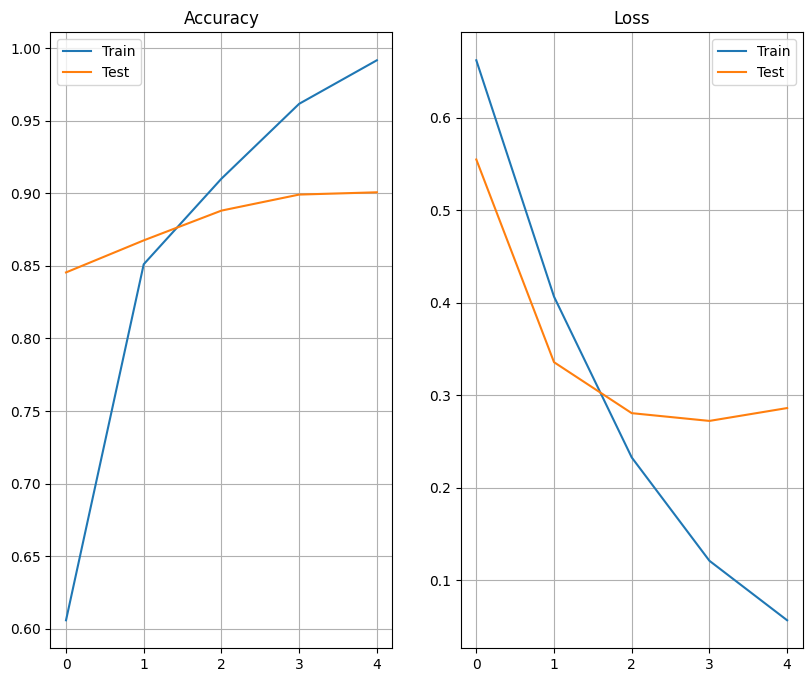

 1/20 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

 9/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


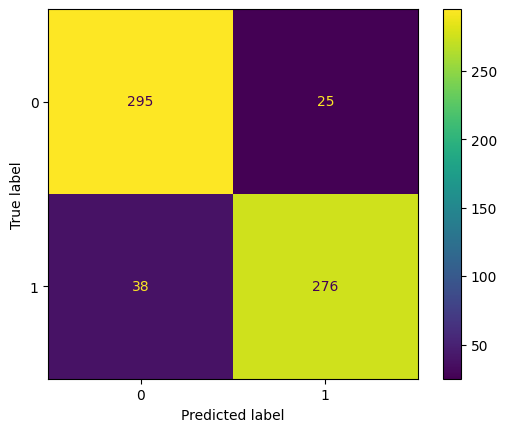

Accuracy: 0.9006309148264984
Precision: 0.9169435215946844
Recall: 0.8789808917197452


Epoch 1/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 37s 564ms/step - accuracy: 0.5000 - loss: 0.6938

 3/67 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.5365 - loss: 0.6934  

 6/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5484 - loss: 0.6925

 9/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5493 - loss: 0.6917

12/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5481 - loss: 0.6911

15/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5463 - loss: 0.6907

18/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5427 - loss: 0.6905

21/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.5381 - loss: 0.6905

24/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.5358 - loss: 0.6904

27/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5361 - loss: 0.6902

30/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5369 - loss: 0.6899

33/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5375 - loss: 0.6896

36/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5379 - loss: 0.6893

39/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5382 - loss: 0.6889

42/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5387 - loss: 0.6885

45/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5394 - loss: 0.6881

48/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5406 - loss: 0.6876

51/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5421 - loss: 0.6871

54/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5439 - loss: 0.6865

57/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5460 - loss: 0.6859

60/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5482 - loss: 0.6853

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5505 - loss: 0.6846

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.5528 - loss: 0.6839

67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.5543 - loss: 0.6833 - val_accuracy: 0.6908 - val_loss: 0.6088


Epoch 2/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.6562 - loss: 0.6212

 3/67 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7188 - loss: 0.6073

 6/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7105 - loss: 0.6090

 8/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7120 - loss: 0.6052

10/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7114 - loss: 0.6026

13/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7095 - loss: 0.6011

15/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7101 - loss: 0.5994

17/67 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.7120 - loss: 0.5971

20/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7145 - loss: 0.5938

23/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7159 - loss: 0.5913

26/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.7171 - loss: 0.5889

28/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7179 - loss: 0.5873

31/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7189 - loss: 0.5850

34/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7197 - loss: 0.5829

36/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7202 - loss: 0.5815

39/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7210 - loss: 0.5794

42/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7214 - loss: 0.5778

44/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7216 - loss: 0.5769

47/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7218 - loss: 0.5756

50/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7221 - loss: 0.5744

53/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7226 - loss: 0.5730

56/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7232 - loss: 0.5716

59/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7238 - loss: 0.5704

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7243 - loss: 0.5692

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7249 - loss: 0.5680

67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.7256 - loss: 0.5670 - val_accuracy: 0.7759 - val_loss: 0.4822


Epoch 3/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.7500 - loss: 0.5634

 4/67 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.7956 - loss: 0.5102

 7/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8161 - loss: 0.4853

10/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8203 - loss: 0.4747

13/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8181 - loss: 0.4716

16/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8186 - loss: 0.4673

19/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8184 - loss: 0.4645

22/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8186 - loss: 0.4620

25/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.8189 - loss: 0.4595

28/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8192 - loss: 0.4575

31/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8198 - loss: 0.4555

34/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8206 - loss: 0.4536

36/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8214 - loss: 0.4521

39/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8224 - loss: 0.4500

41/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8231 - loss: 0.4487

43/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8237 - loss: 0.4473

45/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8243 - loss: 0.4460

48/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8252 - loss: 0.4440

51/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8261 - loss: 0.4420

54/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8268 - loss: 0.4402

57/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8275 - loss: 0.4383

60/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8283 - loss: 0.4363

63/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8291 - loss: 0.4344

66/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.8299 - loss: 0.4326

67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.8304 - loss: 0.4313 - val_accuracy: 0.8525 - val_loss: 0.3551


Epoch 4/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.9375 - loss: 0.2132

 4/67 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9290 - loss: 0.2375

 6/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9272 - loss: 0.2461

 8/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9235 - loss: 0.2538

10/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9204 - loss: 0.2602

12/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9196 - loss: 0.2628

15/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9186 - loss: 0.2643

17/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9185 - loss: 0.2638

20/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9184 - loss: 0.2630

22/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9185 - loss: 0.2621

24/67 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9184 - loss: 0.2612

27/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9185 - loss: 0.2599

30/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9184 - loss: 0.2592

32/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9185 - loss: 0.2584

35/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9184 - loss: 0.2577

38/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9183 - loss: 0.2569

40/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9183 - loss: 0.2563

43/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9183 - loss: 0.2553

45/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9183 - loss: 0.2547

47/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9182 - loss: 0.2541

49/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9183 - loss: 0.2535

52/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9183 - loss: 0.2526

55/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9184 - loss: 0.2518

57/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9184 - loss: 0.2513

59/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9184 - loss: 0.2507

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9184 - loss: 0.2500

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9184 - loss: 0.2495

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9185 - loss: 0.2488

67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.9185 - loss: 0.2485 - val_accuracy: 0.8879 - val_loss: 0.2816


Epoch 5/5


 1/67 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 1.0000 - loss: 0.0702

 4/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9896 - loss: 0.0963

 7/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9866 - loss: 0.1099

10/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9851 - loss: 0.1172

13/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9841 - loss: 0.1198

16/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9835 - loss: 0.1206

19/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9829 - loss: 0.1210

21/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9822 - loss: 0.1213

24/67 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9812 - loss: 0.1217

27/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9802 - loss: 0.1224

30/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9794 - loss: 0.1229

33/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9788 - loss: 0.1233

35/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9784 - loss: 0.1235

38/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9781 - loss: 0.1238

41/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9777 - loss: 0.1240

44/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9774 - loss: 0.1243

46/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9771 - loss: 0.1245

49/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9767 - loss: 0.1248

52/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9765 - loss: 0.1249

55/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9763 - loss: 0.1251

58/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9761 - loss: 0.1250

61/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9760 - loss: 0.1251

64/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9757 - loss: 0.1254

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.9755 - loss: 0.1256

67/67 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.9754 - loss: 0.1257 - val_accuracy: 0.8823 - val_loss: 0.2694


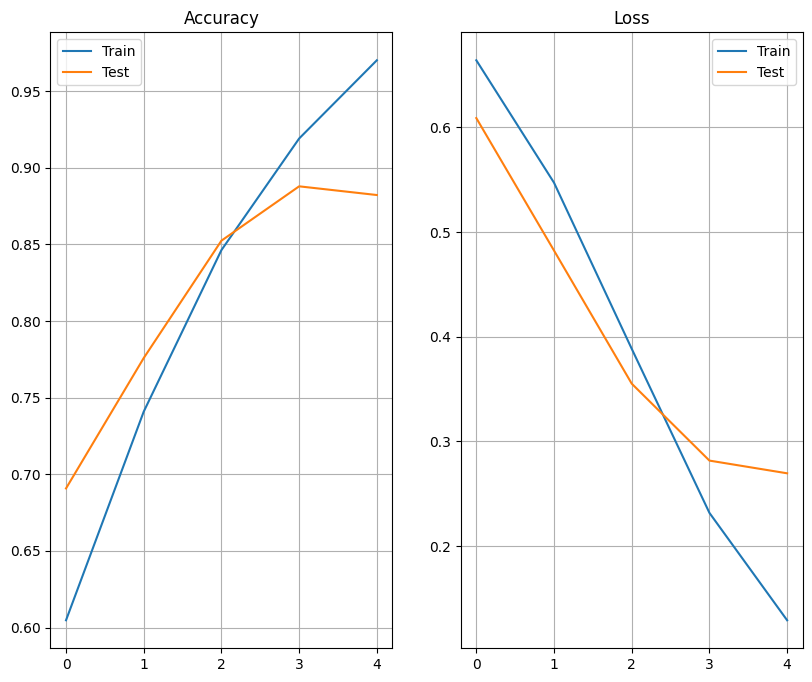

 1/23 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step

11/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

21/23 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


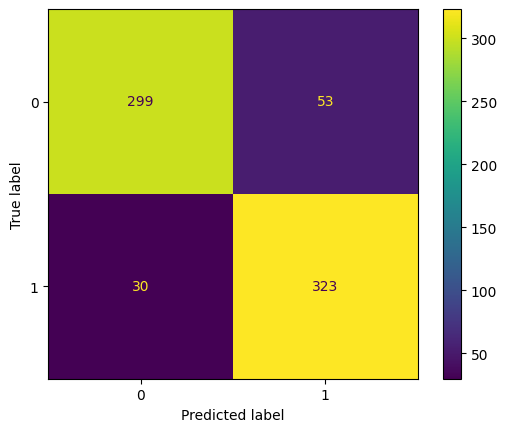

Accuracy: 0.8822695035460993
Precision: 0.8590425531914894
Recall: 0.9150141643059491


Epoch 1/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 29s 561ms/step - accuracy: 0.3750 - loss: 0.6958

 6/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4443 - loss: 0.6935  

11/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4703 - loss: 0.6907

16/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4807 - loss: 0.6878

21/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4899 - loss: 0.6849

26/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.4998 - loss: 0.6819

31/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5102 - loss: 0.6789

36/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5182 - loss: 0.6757

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5256 - loss: 0.6721

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5329 - loss: 0.6684

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.5394 - loss: 0.6645

53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.5431 - loss: 0.6619 - val_accuracy: 0.6619 - val_loss: 0.5524


Epoch 2/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.6875 - loss: 0.5354

 6/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6690 - loss: 0.5284

11/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6668 - loss: 0.5216

16/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6748 - loss: 0.5199

21/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6813 - loss: 0.5210

26/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6873 - loss: 0.5205

31/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6935 - loss: 0.5199

36/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6986 - loss: 0.5192

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7036 - loss: 0.5180

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7079 - loss: 0.5163

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.7119 - loss: 0.5146

53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7141 - loss: 0.5137 - val_accuracy: 0.7710 - val_loss: 0.4790


Epoch 3/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.7812 - loss: 0.5212

 6/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8090 - loss: 0.4682

11/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8052 - loss: 0.4547

16/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8085 - loss: 0.4451

21/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8138 - loss: 0.4352

26/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8179 - loss: 0.4270

30/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8200 - loss: 0.4222

35/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8220 - loss: 0.4175

40/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8244 - loss: 0.4132

45/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8265 - loss: 0.4096

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.8281 - loss: 0.4070

53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8299 - loss: 0.4042 - val_accuracy: 0.8211 - val_loss: 0.4012


Epoch 4/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9688 - loss: 0.1893

 5/53 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.9157 - loss: 0.2536

10/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9085 - loss: 0.2619

15/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9089 - loss: 0.2625

20/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9102 - loss: 0.2622

24/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9112 - loss: 0.2613

29/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9121 - loss: 0.2600

34/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9124 - loss: 0.2586

39/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9133 - loss: 0.2568

44/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9143 - loss: 0.2550

49/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9152 - loss: 0.2533

53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9160 - loss: 0.2517 - val_accuracy: 0.8640 - val_loss: 0.3424


Epoch 5/5


 1/53 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9688 - loss: 0.1673

 6/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9497 - loss: 0.1692

11/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9547 - loss: 0.1585

16/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9567 - loss: 0.1550

21/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9572 - loss: 0.1543

26/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9580 - loss: 0.1532

31/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9585 - loss: 0.1524

36/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9591 - loss: 0.1512

41/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9595 - loss: 0.1500

46/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9597 - loss: 0.1490

51/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.9600 - loss: 0.1478

53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9601 - loss: 0.1470 - val_accuracy: 0.8551 - val_loss: 0.3312


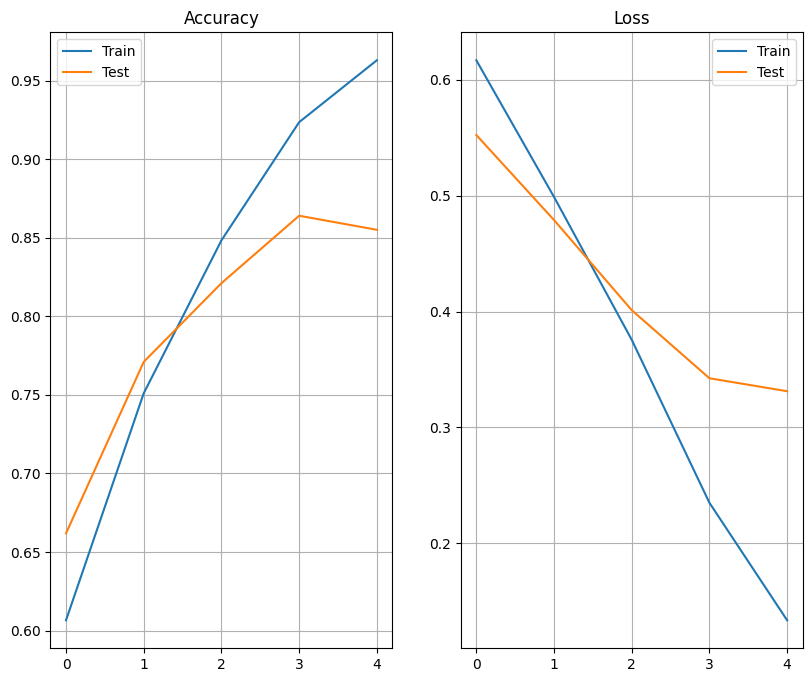

 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


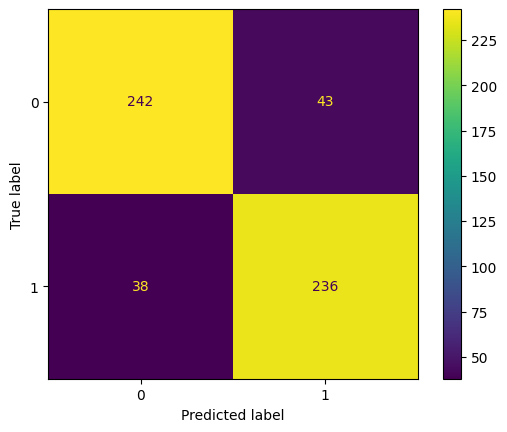

Accuracy: 0.855098389982111
Precision: 0.8458781362007168
Recall: 0.8613138686131386


Epoch 1/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 26s 571ms/step - accuracy: 0.5938 - loss: 0.6790

 3/48 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.5556 - loss: 0.6845  

 5/48 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.5296 - loss: 0.6883

 7/48 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.5128 - loss: 0.6907

10/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5048 - loss: 0.6921

12/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5002 - loss: 0.6926

14/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4977 - loss: 0.6929

16/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4979 - loss: 0.6930

18/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.4994 - loss: 0.6930

20/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5018 - loss: 0.6929

22/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5045 - loss: 0.6928

24/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5061 - loss: 0.6927

26/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5080 - loss: 0.6926

28/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5095 - loss: 0.6925

30/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5112 - loss: 0.6923

32/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5125 - loss: 0.6922

34/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5140 - loss: 0.6921

36/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5156 - loss: 0.6919

38/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5174 - loss: 0.6917

40/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5190 - loss: 0.6916

42/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5207 - loss: 0.6914

44/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5222 - loss: 0.6912

46/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.5236 - loss: 0.6911

48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.5257 - loss: 0.6908 - val_accuracy: 0.6686 - val_loss: 0.6753


Epoch 2/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.7812 - loss: 0.6785

 3/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8125 - loss: 0.6732

 5/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.8266 - loss: 0.6702

 7/48 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8331 - loss: 0.6672

 9/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8241 - loss: 0.6654

12/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8158 - loss: 0.6632

14/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8087 - loss: 0.6620

16/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.8005 - loss: 0.6611

19/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7898 - loss: 0.6595

21/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7835 - loss: 0.6585

23/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7780 - loss: 0.6577

25/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7736 - loss: 0.6568

27/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7706 - loss: 0.6559

29/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7679 - loss: 0.6552

31/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7659 - loss: 0.6546

33/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7644 - loss: 0.6539

35/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7634 - loss: 0.6533

37/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7628 - loss: 0.6526

39/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7624 - loss: 0.6520

41/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7622 - loss: 0.6513

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.7621 - loss: 0.6506

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.7620 - loss: 0.6499

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.7620 - loss: 0.6492

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - accuracy: 0.7620 - loss: 0.6485 - val_accuracy: 0.7416 - val_loss: 0.6198


Epoch 3/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.8750 - loss: 0.5716

 3/48 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8698 - loss: 0.5749

 5/48 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8750 - loss: 0.5689

 7/48 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.8722 - loss: 0.5691

 9/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8724 - loss: 0.5683

11/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8716 - loss: 0.5680

13/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8696 - loss: 0.5678

15/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8686 - loss: 0.5674

17/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8673 - loss: 0.5664

19/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8665 - loss: 0.5652

21/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8657 - loss: 0.5636

23/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8653 - loss: 0.5620

25/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8648 - loss: 0.5603

27/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8642 - loss: 0.5586

29/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8632 - loss: 0.5571

31/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8626 - loss: 0.5554

33/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8621 - loss: 0.5536

35/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8617 - loss: 0.5518

37/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8613 - loss: 0.5501

39/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8610 - loss: 0.5484

41/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8608 - loss: 0.5468

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8605 - loss: 0.5451

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8603 - loss: 0.5436

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.8601 - loss: 0.5420

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.8600 - loss: 0.5404 - val_accuracy: 0.7712 - val_loss: 0.4968


Epoch 4/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.8750 - loss: 0.4570

 3/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9028 - loss: 0.4403

 5/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9054 - loss: 0.4294

 7/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9097 - loss: 0.4209

 9/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9151 - loss: 0.4109

11/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9172 - loss: 0.4026

13/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9183 - loss: 0.3958

15/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9190 - loss: 0.3902

17/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9187 - loss: 0.3857

19/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9179 - loss: 0.3815

21/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9170 - loss: 0.3782

24/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9158 - loss: 0.3740

26/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9155 - loss: 0.3712

28/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9153 - loss: 0.3687

30/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9153 - loss: 0.3662

33/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9152 - loss: 0.3626

35/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9151 - loss: 0.3604

37/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9151 - loss: 0.3582

39/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9150 - loss: 0.3561

41/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9151 - loss: 0.3541

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9152 - loss: 0.3520

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9152 - loss: 0.3501

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9152 - loss: 0.3484

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9152 - loss: 0.3466 - val_accuracy: 0.8067 - val_loss: 0.4197


Epoch 5/5


 1/48 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - accuracy: 0.9688 - loss: 0.1920

 3/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9635 - loss: 0.1889

 5/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9656 - loss: 0.1803

 7/48 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - accuracy: 0.9645 - loss: 0.1766

 9/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9638 - loss: 0.1742

11/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9636 - loss: 0.1720

13/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9633 - loss: 0.1716

15/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9628 - loss: 0.1726

17/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9628 - loss: 0.1729

20/48 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.9625 - loss: 0.1737

22/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9626 - loss: 0.1737

24/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9628 - loss: 0.1734

26/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9631 - loss: 0.1730

28/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9633 - loss: 0.1727

30/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9632 - loss: 0.1726

32/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9630 - loss: 0.1726

35/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9627 - loss: 0.1725

37/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9625 - loss: 0.1721

39/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9625 - loss: 0.1716

41/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9624 - loss: 0.1712

43/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9624 - loss: 0.1708

45/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9623 - loss: 0.1704

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.9621 - loss: 0.1697

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9621 - loss: 0.1695 - val_accuracy: 0.7929 - val_loss: 0.4212


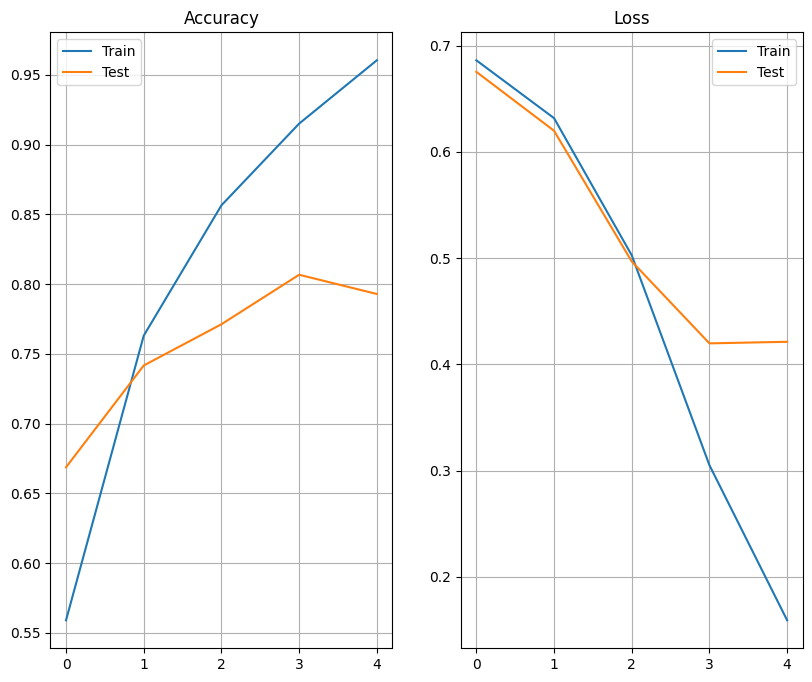

 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step

10/16 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


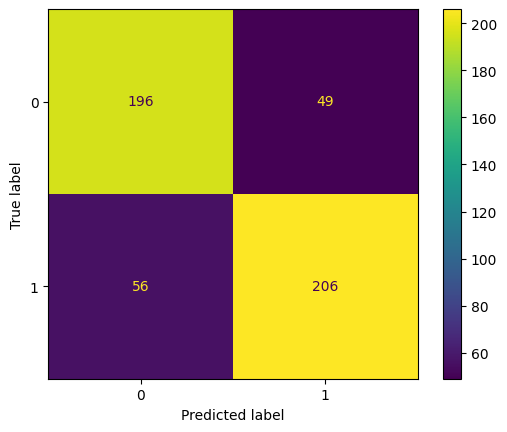

Accuracy: 0.7928994082840237
Precision: 0.807843137254902
Recall: 0.7862595419847328


Epoch 1/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 1:18 565ms/step - accuracy: 0.3750 - loss: 0.6968

  4/140 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.4290 - loss: 0.6956   

  7/140 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.4587 - loss: 0.6947

 10/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4728 - loss: 0.6941

 13/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4774 - loss: 0.6941

 16/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4772 - loss: 0.6946

 19/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4771 - loss: 0.6948

 22/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4768 - loss: 0.6949

 25/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4780 - loss: 0.6949

 28/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.4796 - loss: 0.6948

 31/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4814 - loss: 0.6948

 34/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4836 - loss: 0.6946

 37/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4853 - loss: 0.6945

 40/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4867 - loss: 0.6944

 43/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4880 - loss: 0.6942

 46/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4895 - loss: 0.6940

 49/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4908 - loss: 0.6939

 52/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4919 - loss: 0.6937

 55/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4931 - loss: 0.6935

 58/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4944 - loss: 0.6933

 61/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4961 - loss: 0.6931

 64/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4979 - loss: 0.6929

 67/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.4998 - loss: 0.6928

 70/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5019 - loss: 0.6925

 73/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5041 - loss: 0.6923

 76/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5062 - loss: 0.6921

 79/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5081 - loss: 0.6919

 82/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5100 - loss: 0.6916

 85/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5119 - loss: 0.6913

 88/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5137 - loss: 0.6910

 91/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5156 - loss: 0.6907

 94/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5176 - loss: 0.6904

 97/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5197 - loss: 0.6900

100/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5218 - loss: 0.6896

103/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5238 - loss: 0.6892

106/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5259 - loss: 0.6887

109/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5279 - loss: 0.6883

112/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5300 - loss: 0.6878

115/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5320 - loss: 0.6873

118/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5341 - loss: 0.6868

121/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5362 - loss: 0.6862

124/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5382 - loss: 0.6857

127/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5403 - loss: 0.6851

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5423 - loss: 0.6844

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5443 - loss: 0.6838

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5463 - loss: 0.6831

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.5482 - loss: 0.6823

140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.5495 - loss: 0.6818 - val_accuracy: 0.7642 - val_loss: 0.5144


Epoch 2/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.9375 - loss: 0.4247

  4/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8978 - loss: 0.4404

  7/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8772 - loss: 0.4534

 10/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8705 - loss: 0.4584

 13/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8654 - loss: 0.4614

 16/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8605 - loss: 0.4643

 19/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8576 - loss: 0.4651

 22/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8553 - loss: 0.4646

 25/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8538 - loss: 0.4633

 28/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8522 - loss: 0.4620

 31/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8508 - loss: 0.4607

 34/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8498 - loss: 0.4595

 37/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8490 - loss: 0.4582

 40/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8484 - loss: 0.4566

 43/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8480 - loss: 0.4548

 46/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8476 - loss: 0.4531

 49/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8470 - loss: 0.4515

 52/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8466 - loss: 0.4498

 55/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8461 - loss: 0.4483

 58/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8458 - loss: 0.4468

 61/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8456 - loss: 0.4453

 64/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8454 - loss: 0.4437

 67/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8452 - loss: 0.4423

 70/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8449 - loss: 0.4408

 73/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8447 - loss: 0.4394

 76/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8445 - loss: 0.4380

 79/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8444 - loss: 0.4366

 82/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.8443 - loss: 0.4352

 85/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8442 - loss: 0.4338

 88/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8441 - loss: 0.4325

 91/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8439 - loss: 0.4313

 94/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8437 - loss: 0.4301

 97/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8436 - loss: 0.4290

100/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8434 - loss: 0.4278

103/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8433 - loss: 0.4267

106/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8432 - loss: 0.4256

109/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8431 - loss: 0.4245

112/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4234

115/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4223

118/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4212

121/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4202

124/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4192

127/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4182

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4172

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4163

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4154

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.8430 - loss: 0.4146

140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.8430 - loss: 0.4141 - val_accuracy: 0.8201 - val_loss: 0.3857


Epoch 3/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.8750 - loss: 0.2304

  4/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8997 - loss: 0.2196

  7/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9114 - loss: 0.2126

 10/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9178 - loss: 0.2087

 13/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9211 - loss: 0.2069

 16/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9247 - loss: 0.2053

 19/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9266 - loss: 0.2043

 22/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9284 - loss: 0.2029

 25/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9295 - loss: 0.2021

 28/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9304 - loss: 0.2015

 31/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9310 - loss: 0.2015

 34/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9312 - loss: 0.2016

 37/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9314 - loss: 0.2017

 40/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9313 - loss: 0.2024

 43/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9307 - loss: 0.2035

 46/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9302 - loss: 0.2045

 49/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9298 - loss: 0.2053

 52/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9295 - loss: 0.2058

 55/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9293 - loss: 0.2060

 58/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9291 - loss: 0.2063

 61/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9290 - loss: 0.2065

 64/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9289 - loss: 0.2065

 67/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9289 - loss: 0.2065

 70/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9289 - loss: 0.2064

 73/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9290 - loss: 0.2061

 76/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9291 - loss: 0.2058

 79/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9291 - loss: 0.2057

 82/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9292 - loss: 0.2055

 85/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9291 - loss: 0.2055

 88/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9291 - loss: 0.2054

 91/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9291 - loss: 0.2053

 94/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9291 - loss: 0.2052

 97/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9290 - loss: 0.2051

100/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9290 - loss: 0.2050

103/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9290 - loss: 0.2048

106/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9290 - loss: 0.2047

109/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9289 - loss: 0.2045

112/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9289 - loss: 0.2045

115/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9287 - loss: 0.2045

118/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9287 - loss: 0.2044

121/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9286 - loss: 0.2042

124/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9285 - loss: 0.2041

127/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9285 - loss: 0.2040

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9284 - loss: 0.2038

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9283 - loss: 0.2037

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9283 - loss: 0.2036

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9282 - loss: 0.2035

140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.9281 - loss: 0.2033 - val_accuracy: 0.8336 - val_loss: 0.3840


Epoch 4/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 1.0000 - loss: 0.0949

  4/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9850 - loss: 0.0989

  7/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9781 - loss: 0.1019

 10/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9736 - loss: 0.1054

 13/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9714 - loss: 0.1081

 16/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9705 - loss: 0.1088

 19/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9701 - loss: 0.1086

 22/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9697 - loss: 0.1080

 25/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9694 - loss: 0.1074

 28/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9693 - loss: 0.1066

 31/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1056

 34/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9696 - loss: 0.1046

 37/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9697 - loss: 0.1038

 40/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9697 - loss: 0.1032

 43/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9697 - loss: 0.1026

 46/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9696 - loss: 0.1025

 49/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9695 - loss: 0.1023

 52/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1021

 55/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1020

 58/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1018

 61/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1016

 64/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9693 - loss: 0.1015

 67/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9693 - loss: 0.1014

 70/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9693 - loss: 0.1012

 73/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1011

 76/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1009

 79/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1008

 82/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9694 - loss: 0.1006

 85/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9694 - loss: 0.1005

 88/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9694 - loss: 0.1004

 91/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9694 - loss: 0.1003

 94/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9695 - loss: 0.1001

 97/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9695 - loss: 0.1000

100/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9695 - loss: 0.0998

103/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9696 - loss: 0.0996

106/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9696 - loss: 0.0995

109/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9697 - loss: 0.0993

112/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9697 - loss: 0.0992

115/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9697 - loss: 0.0991

118/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9697 - loss: 0.0990

121/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9697 - loss: 0.0990

124/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9697 - loss: 0.0989

127/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9697 - loss: 0.0989

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9696 - loss: 0.0989

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9696 - loss: 0.0989

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9695 - loss: 0.0989

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9694 - loss: 0.0990

140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.9694 - loss: 0.0990 - val_accuracy: 0.8302 - val_loss: 0.4380


Epoch 5/5


  1/140 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.9375 - loss: 0.0922

  4/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9655 - loss: 0.0828

  7/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9728 - loss: 0.0743

 10/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9751 - loss: 0.0707

 13/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9760 - loss: 0.0694

 16/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9774 - loss: 0.0670

 19/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9783 - loss: 0.0661

 22/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9791 - loss: 0.0655

 25/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9798 - loss: 0.0648

 28/140 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.9805 - loss: 0.0639

 31/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9810 - loss: 0.0631

 34/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9813 - loss: 0.0625

 37/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9817 - loss: 0.0618

 40/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9820 - loss: 0.0611

 43/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9821 - loss: 0.0607

 46/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9823 - loss: 0.0603

 49/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9824 - loss: 0.0599

 52/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9825 - loss: 0.0597

 55/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9826 - loss: 0.0594

 58/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9826 - loss: 0.0592

 61/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9827 - loss: 0.0589

 64/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9828 - loss: 0.0587

 67/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9828 - loss: 0.0585

 70/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9828 - loss: 0.0583

 73/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9828 - loss: 0.0582

 76/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9828 - loss: 0.0581

 79/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9828 - loss: 0.0580

 82/140 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.9828 - loss: 0.0578

 85/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9828 - loss: 0.0577

 88/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9827 - loss: 0.0576

 91/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9827 - loss: 0.0575

 94/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9827 - loss: 0.0574

 97/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9827 - loss: 0.0573

100/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9827 - loss: 0.0572

103/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9826 - loss: 0.0571

106/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9826 - loss: 0.0571

109/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9825 - loss: 0.0571

112/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9825 - loss: 0.0570

115/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9825 - loss: 0.0570

118/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9824 - loss: 0.0570

121/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9824 - loss: 0.0569

124/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9823 - loss: 0.0569

127/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9823 - loss: 0.0569

130/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9822 - loss: 0.0569

133/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9822 - loss: 0.0569

136/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9821 - loss: 0.0569

139/140 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - accuracy: 0.9821 - loss: 0.0569

140/140 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - accuracy: 0.9821 - loss: 0.0568 - val_accuracy: 0.8342 - val_loss: 0.4805


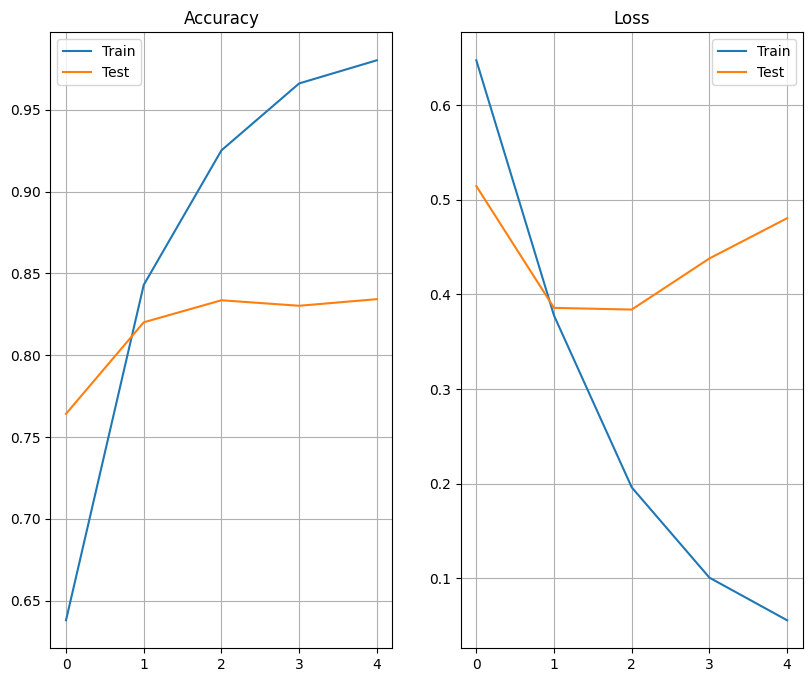

 1/47 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step

14/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

26/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

39/47 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


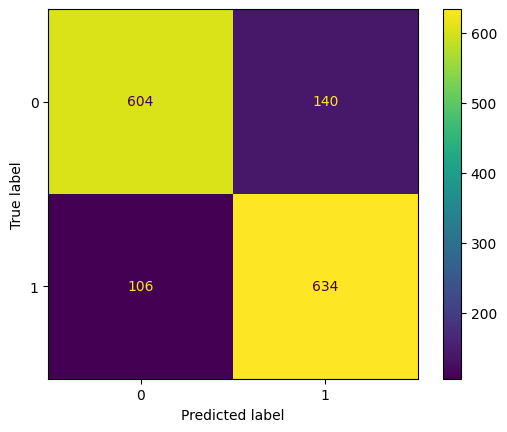

Accuracy: 0.8342318059299192
Precision: 0.8191214470284238


Recall: 0.8567567567567568
Average accuracy: 0.8530260045137303
Average precision: 0.8497657590540433
Average recall: 0.8596650446760645


In [31]:
accuracy = []
precision = []
recall = []
for dataset in chosen_datasets:
    df = pd.read_csv(os.path.join("datasets", dataset))
    X_train, X_test, y_train, y_test = train_test_split(df["text"].values, df["label"].values, test_size=0.25, random_state=1)
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(X_train)
    sequences = tokenizer.texts_to_sequences(X_train)
    max_length = max([len(seq) for seq in sequences])
    padded_sequences = pad_sequences(sequences, maxlen=max_length)
    new_sequences = tokenizer.texts_to_sequences(X_test)
    new_padded_sequences = pad_sequences(new_sequences, maxlen=max_length)

    model = Sequential()
    model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=32))
    model.add(Conv1D(128, 5, activation='relu'))
    model.add(GlobalMaxPooling1D())
    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    epochs = 5
    history = model.fit(padded_sequences, y_train, validation_data=(new_padded_sequences, y_test), epochs=epochs)
    print_metrics(history, epochs=epochs)

    predictions = model.predict(new_padded_sequences)
    correct = 0
    predicted_labels = []
    for i in range(len(predictions)):
        prediction_label = 1 if predictions[i] > 0.5 else 0
        predicted_labels.append(prediction_label)
        if y_test[i] == prediction_label:
            correct += 1
    print_conf_matrix(y_test, predicted_labels)
    accuracy.append(correct / len(predictions))
    print(f"Accuracy: {correct / len(predictions)}")
    print(f"Precision: {precision_score(y_test, predicted_labels)}")
    precision.append(precision_score(y_test, predicted_labels))
    print(f"Recall: {recall_score(y_test, predicted_labels)}")
    recall.append(recall_score(y_test, predicted_labels))
print(f"Average accuracy: {np.average(accuracy)}")
print(f"Average precision: {np.average(precision)}")
print(f"Average recall: {np.average(recall)}")

In [32]:
from tensorflow.keras.layers import Dense, Embedding, Flatten

Epoch 1/3


 1/60 ━━━━━━━━━━━━━━━━━━━━ 24s 409ms/step - accuracy: 0.5000 - loss: 0.6940

13/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4875 - loss: 0.7212   

27/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4957 - loss: 0.7182

42/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.4979 - loss: 0.7147

57/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5032 - loss: 0.7116

60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5056 - loss: 0.7108 - val_accuracy: 0.7397 - val_loss: 0.6716


Epoch 2/3


 1/60 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - accuracy: 0.7812 - loss: 0.6593

16/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7134 - loss: 0.6588 

31/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7083 - loss: 0.6535

45/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7047 - loss: 0.6473

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7021 - loss: 0.6394 - val_accuracy: 0.8707 - val_loss: 0.4989


Epoch 3/3


 1/60 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.9062 - loss: 0.4488

16/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8733 - loss: 0.4560 

31/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8837 - loss: 0.4370

46/60 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8902 - loss: 0.4218

60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8943 - loss: 0.4092 - val_accuracy: 0.8849 - val_loss: 0.3406


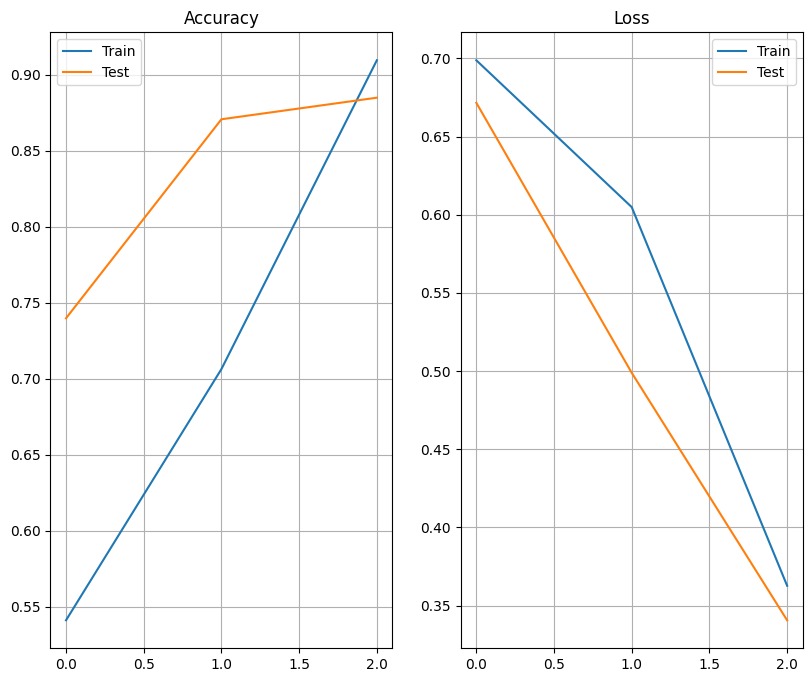

 1/20 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


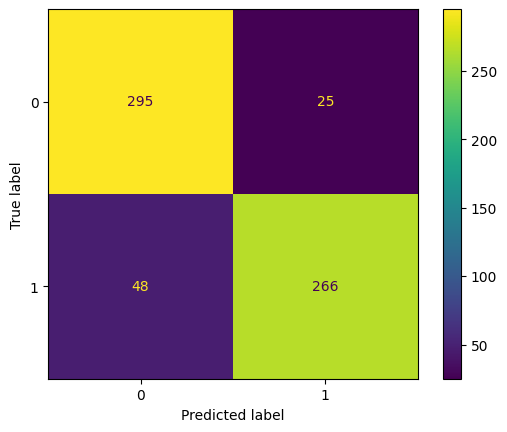

Accuracy: 0.8848580441640379
Precision: 0.9140893470790378
Recall: 0.8471337579617835


Epoch 1/3


 1/67 ━━━━━━━━━━━━━━━━━━━━ 26s 397ms/step - accuracy: 0.6875 - loss: 0.6822

16/67 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5295 - loss: 0.7259   

32/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5201 - loss: 0.7188

47/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5271 - loss: 0.7098

62/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5392 - loss: 0.7004

67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5432 - loss: 0.6974 - val_accuracy: 0.6837 - val_loss: 0.5907


Epoch 2/3


 1/67 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6875 - loss: 0.6214

17/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6959 - loss: 0.5842 

33/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7153 - loss: 0.5691

49/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7192 - loss: 0.5633

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7233 - loss: 0.5581

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7242 - loss: 0.5570 - val_accuracy: 0.7943 - val_loss: 0.4604


Epoch 3/3


 1/67 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8438 - loss: 0.3803

17/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8029 - loss: 0.4582 

33/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8150 - loss: 0.4446

49/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8242 - loss: 0.4333

65/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8302 - loss: 0.4244

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.8311 - loss: 0.4230 - val_accuracy: 0.8681 - val_loss: 0.3609


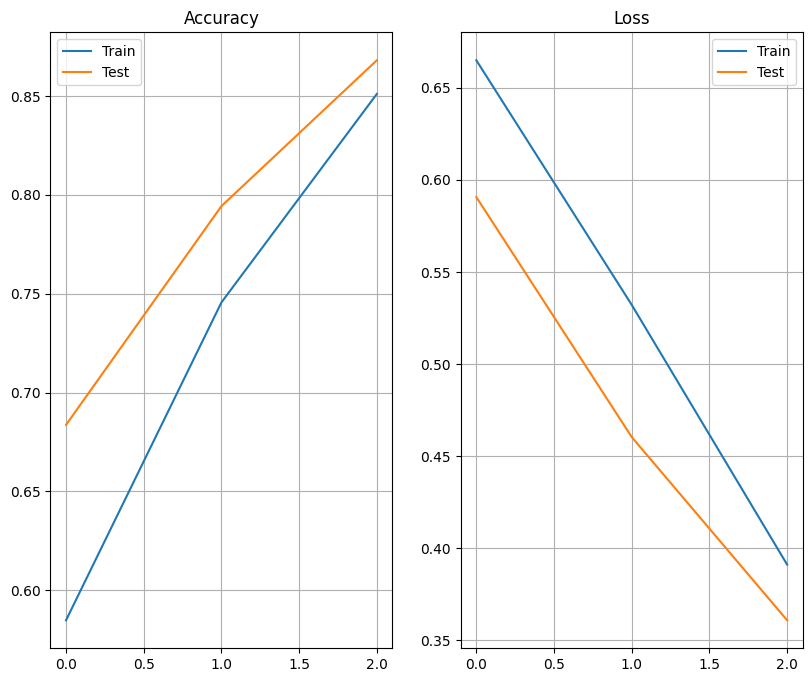

 1/23 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

23/23 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


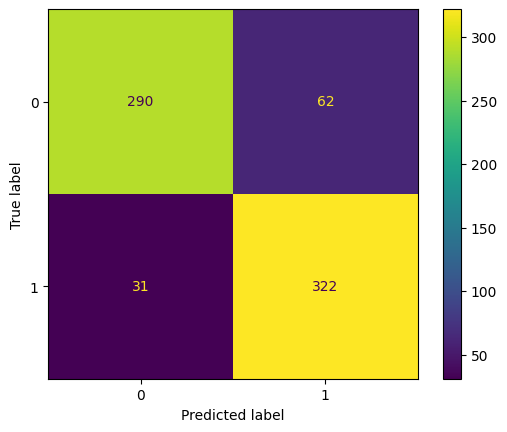

Accuracy: 0.8680851063829788
Precision: 0.8385416666666666
Recall: 0.9121813031161473


Epoch 1/3


 1/53 ━━━━━━━━━━━━━━━━━━━━ 20s 388ms/step - accuracy: 0.5000 - loss: 0.6934

23/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5144 - loss: 0.6989   

48/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.5496 - loss: 0.6849

53/53 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5564 - loss: 0.6810 - val_accuracy: 0.7102 - val_loss: 0.5711


Epoch 2/3


 1/53 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - accuracy: 0.6875 - loss: 0.5906

27/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7354 - loss: 0.5513 

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7427 - loss: 0.5366 - val_accuracy: 0.7424 - val_loss: 0.5081


Epoch 3/3


 1/53 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.7500 - loss: 0.4979

27/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8305 - loss: 0.4349 

53/53 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8386 - loss: 0.4227 - val_accuracy: 0.8157 - val_loss: 0.4428


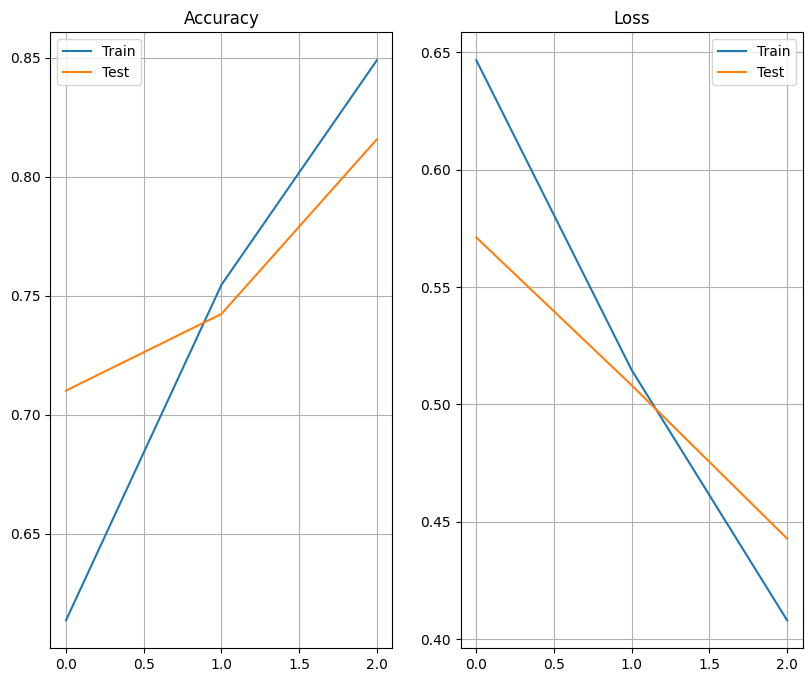

 1/18 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

18/18 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


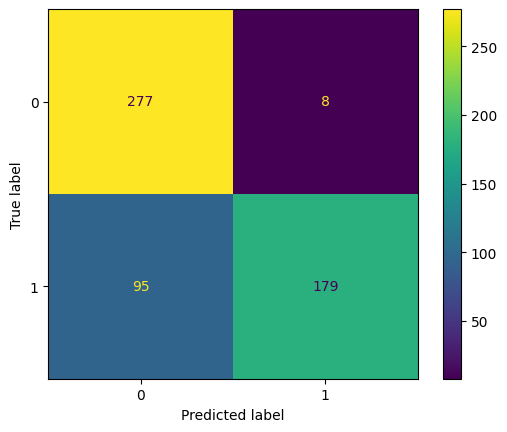

Accuracy: 0.815742397137746
Precision: 0.9572192513368984
Recall: 0.6532846715328468


Epoch 1/3


 1/48 ━━━━━━━━━━━━━━━━━━━━ 18s 404ms/step - accuracy: 0.6250 - loss: 0.6904

17/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5307 - loss: 0.7177   

31/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5209 - loss: 0.7102

47/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5179 - loss: 0.7056

48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5176 - loss: 0.7052 - val_accuracy: 0.5168 - val_loss: 0.6840


Epoch 2/3


 1/48 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6562 - loss: 0.6651

17/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6768 - loss: 0.6650 

33/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6965 - loss: 0.6636

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7097 - loss: 0.6607 - val_accuracy: 0.6489 - val_loss: 0.6539


Epoch 3/3


 1/48 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.8750 - loss: 0.5963

17/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9203 - loss: 0.5991 

33/48 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9129 - loss: 0.5900

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9045 - loss: 0.5844 - val_accuracy: 0.5878 - val_loss: 0.6301


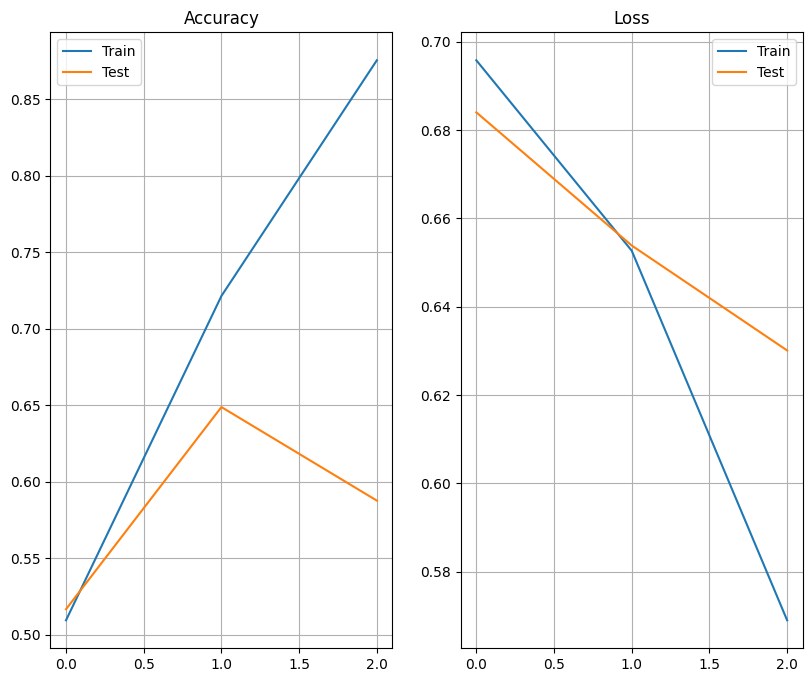

 1/16 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


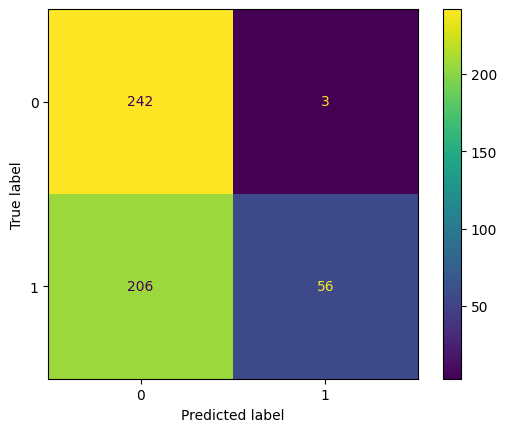

Accuracy: 0.5877712031558185
Precision: 0.9491525423728814
Recall: 0.21374045801526717


Epoch 1/3


  1/140 ━━━━━━━━━━━━━━━━━━━━ 1:24 605ms/step - accuracy: 0.3750 - loss: 0.7027

 18/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4551 - loss: 0.7263    

 34/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4728 - loss: 0.7192

 51/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4815 - loss: 0.7147

 68/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4866 - loss: 0.7115

 85/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4910 - loss: 0.7090

102/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4952 - loss: 0.7071

119/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4991 - loss: 0.7054

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5026 - loss: 0.7039

140/140 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5033 - loss: 0.7035 - val_accuracy: 0.5350 - val_loss: 0.6635


Epoch 2/3


  1/140 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.5938 - loss: 0.6386

 18/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6054 - loss: 0.6511 

 35/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6262 - loss: 0.6419

 52/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6517 - loss: 0.6309

 69/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6719 - loss: 0.6206

 86/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6867 - loss: 0.6119

103/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6994 - loss: 0.6031

120/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7104 - loss: 0.5947

137/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7198 - loss: 0.5871

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7219 - loss: 0.5853 - val_accuracy: 0.7985 - val_loss: 0.4607


Epoch 3/3


  1/140 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.7500 - loss: 0.4329

 19/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8746 - loss: 0.3650 

 36/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8893 - loss: 0.3575

 54/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8961 - loss: 0.3538

 71/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8985 - loss: 0.3505

 88/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8997 - loss: 0.3477

105/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9006 - loss: 0.3448

123/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9014 - loss: 0.3415

140/140 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.9021 - loss: 0.3382 - val_accuracy: 0.8363 - val_loss: 0.3823


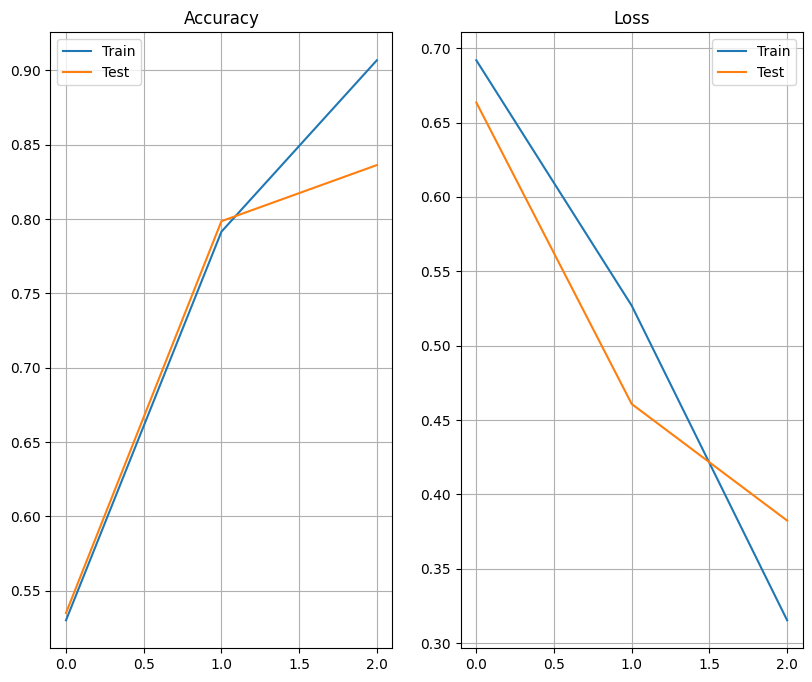

 1/47 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


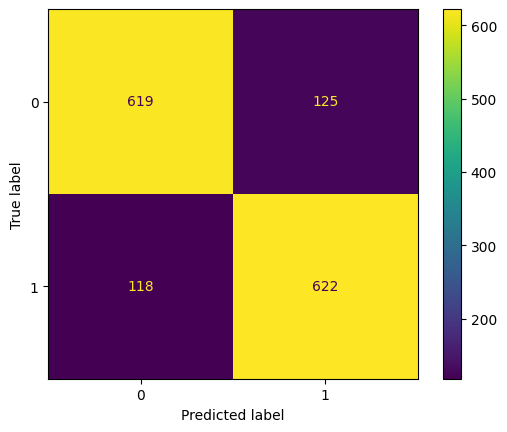

Accuracy: 0.8362533692722371
Precision: 0.8326639892904953
Recall: 0.8405405405405405
Average accuracy: 0.7985420240225636
Average precision: 0.898333359349196
Average recall: 0.693376146233317


In [33]:
accuracy = []
precision = []
recall = []
for dataset in chosen_datasets:
    df = pd.read_csv(os.path.join("datasets", dataset))
    X_train, X_test, y_train, y_test = train_test_split(df["text"].values, df["label"].values, test_size=0.25, random_state=1)
    tokenizer = Tokenizer()
    tokenizer.fit_on_texts(X_train)
    sequences = tokenizer.texts_to_sequences(X_train)
    max_length = max([len(seq) for seq in sequences])
    padded_sequences = pad_sequences(sequences, maxlen=max_length)
    new_sequences = tokenizer.texts_to_sequences(X_test)
    new_padded_sequences = pad_sequences(new_sequences, maxlen=max_length)

    model = Sequential()
    model.add(Embedding(input_dim=len(tokenizer.word_index) + 1, output_dim=32))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

    epochs = 3
    history = model.fit(padded_sequences, y_train, validation_data=(new_padded_sequences, y_test), epochs=epochs)
    print_metrics(history, epochs=epochs)

    predictions = model.predict(new_padded_sequences)
    correct = 0
    predicted_labels = []
    for i in range(len(predictions)):
        prediction_label = 1 if predictions[i] > 0.5 else 0
        predicted_labels.append(prediction_label)
        if y_test[i] == prediction_label:
            correct += 1
    print_conf_matrix(y_test, predicted_labels)
    accuracy.append(correct / len(predictions))
    print(f"Accuracy: {correct / len(predictions)}")
    print(f"Precision: {precision_score(y_test, predicted_labels)}")
    precision.append(precision_score(y_test, predicted_labels))
    print(f"Recall: {recall_score(y_test, predicted_labels)}")
    recall.append(recall_score(y_test, predicted_labels))
print(f"Average accuracy: {np.average(accuracy)}")
print(f"Average precision: {np.average(precision)}")
print(f"Average recall: {np.average(recall)}")

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, \
    recall_score, confusion_matrix

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, WeightedRandomSampler

from transformers import AutoTokenizer, AutoModelForSequenceClassification

import os
from tqdm.notebook import tqdm
from collections import defaultdict
from time import time

In [35]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [36]:
class Bert(nn.Module):
    def __init__(self, bert, bert_output_dim, output_dim):
        super().__init__()
        self.bert = bert
        self.relu = nn.ReLU()
        self.fc = nn.Linear(bert_output_dim, output_dim)

    def forward(self, sent_id, mask):
        logits = self.bert(sent_id, mask, return_dict=False)[0]
        outputs = self.relu(logits)
        outputs = self.fc(outputs)
        return outputs


def plot_learning_curves(history):
    sns.set_style(style='whitegrid')
    fig = plt.figure(figsize=(20, 14))

    plt.subplot(2, 2, 1)
    plt.title('Accuracy', fontsize=15)
    plt.plot(history['accuracy']['train'], label='Train')
    plt.plot(history['accuracy']['val'], label='Test')
    plt.xlabel('epoch', fontsize=15)
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.title('Loss', fontsize=15)
    plt.plot(history['loss']['train'], label='Train')
    plt.plot(history['loss']['val'], label='Test')
    plt.xlabel('epoch', fontsize=15)
    plt.legend()

    plt.show()


def train(
    model,
    criterion,
    optimizer,
    train_loader,
    test_loader,
    num_epochs,
    lr_scheduler,
    device='cpu'
):
    history = defaultdict(lambda: defaultdict(list))
    for epoch in tqdm(range(num_epochs), total=num_epochs):
        # Train
        start_time = time()
        model.train(True)
        train_loss = 0
        test_loss = 0
        print(f'epoch: {epoch + 1}/{num_epochs}')
        print('Train')
        preds, labels = np.array([], dtype=int), np.array([], dtype=int)
        for sent_id, mask, y_batch in train_loader:
            sent_id, mask, y_batch = sent_id.to(device), mask.to(device), y_batch.to(device)
            outputs = model(sent_id, mask).logits.squeeze()
            if outputs.size() == torch.Size([]):
                outputs = outputs.unsqueeze(0)
            loss = criterion(outputs, y_batch.float())
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            train_loss += np.sum(loss.detach().cpu().numpy())
            y_pred = nn.Sigmoid()(outputs).detach().cpu().numpy() > 0.5
            preds = np.concatenate((preds, y_pred))
            labels = np.concatenate((labels, y_batch.detach().cpu().numpy()))
        train_loss /= len(train_loader)
        train_accuracy = accuracy_score(labels, preds)
        train_precision = precision_score(labels, preds)
        train_recall = recall_score(labels, preds)
        history['loss']['train'].append(train_loss)
        history['accuracy']['train'].append(train_accuracy)
        history['precision']['train'].append(train_precision)
        history['recall']['train'].append(train_recall)
        lr_scheduler.step()
        print('Test')
        model.train(False)
        preds, labels = np.array([], dtype=int), np.array([], dtype=int)
        for sent_id, mask, y_batch in test_loader:
            sent_id, mask, y_batch = sent_id.to(device), mask.to(device), y_batch.to(device)
            with torch.no_grad():
                outputs = model(sent_id, mask).logits.squeeze()
                if outputs.size() == torch.Size([]):
                    outputs = outputs.unsqueeze(0)
                loss = criterion(outputs, y_batch.float())
            test_loss += np.sum(loss.detach().cpu().numpy())
            y_pred = nn.Sigmoid()(outputs).detach().cpu().numpy() > 0.5
            preds = np.concatenate((preds, y_pred))
            labels = np.concatenate((labels, y_batch.detach().cpu().numpy()))
        test_loss /= len(test_loader)
        val_accuracy = accuracy_score(labels, preds)
        val_precision = precision_score(labels, preds)
        val_recall = recall_score(labels, preds)
        history['loss']['val'].append(test_loss)
        history['accuracy']['val'].append(val_accuracy)
        history['precision']['val'].append(val_precision)
        history['recall']['val'].append(val_recall)
        print(f'Epoch {epoch + 1} of {num_epochs} took {time() - start_time:.3f}s')
        print(f'  training loss (in-iteration): \t{train_loss:.6f}')
        print(f'  validation loss (in-iteration): \t{test_loss:.6f}')
        print(f'\n  training accuracy: \t\t\t{train_accuracy * 100:.2f} %')
        print(f'  validation accuracy: \t\t\t{val_accuracy * 100:.2f} %')
        print(f'\n  training precision: \t\t\t{train_precision * 100:.2f} %')
        print(f'  validation precision: \t\t{val_precision * 100:.2f} %')
        print(f'\n  training recall: \t\t\t{train_recall * 100:.2f} %')
        print(f'  validation recall: \t\t\t{val_recall * 100:.2f} %')
        if epoch > 0:
            plot_learning_curves(history)
    return model, history


def predict(model, test_batch_gen, device='cpu'):
    res_outputs = np.array([])
    res_targets = np.array([])
    for batch in test_batch_gen:
        input_ids, attention_mask, target = batch
        input_ids, attention_mask, target = input_ids.to(device), \
                                            attention_mask.to(device), \
                                            target.to(device)
        output = model(input_ids, attention_mask).logits.squeeze()
        output = nn.Sigmoid()(output) > 0.5
        res_outputs = np.append(res_outputs,
                                output.detach().cpu().numpy())
        res_targets = np.append(res_targets,
                                target.view(-1, 1).cpu().numpy())

    print(f'accuracy_score: {accuracy_score(res_targets, res_outputs)}')
    print(f'precision_score: {precision_score(res_targets, res_outputs)}')
    print(f'recall_score: {recall_score(res_targets, res_outputs)}')
    print('confusion matrix')
    print(print_conf_matrix(res_targets, res_outputs))
    return accuracy_score(res_targets, res_outputs), precision_score(res_targets, res_outputs), recall_score(res_targets, res_outputs)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert/distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


/home/tech/.local/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


  0%|          | 0/3 [00:00<?, ?it/s]

epoch: 1/3
Train


Test


Epoch 1 of 3 took 37.691s
  training loss (in-iteration): 	0.378731
  validation loss (in-iteration): 	0.255282

  training accuracy: 			80.95 %
  validation accuracy: 			89.91 %

  training precision: 			83.04 %
  validation precision: 		89.31 %

  training recall: 			79.86 %
  validation recall: 			90.45 %
epoch: 2/3
Train


Test


Epoch 2 of 3 took 37.818s
  training loss (in-iteration): 	0.139737
  validation loss (in-iteration): 	0.312449

  training accuracy: 			95.53 %
  validation accuracy: 			86.28 %

  training precision: 			97.05 %
  validation precision: 		80.93 %

  training recall: 			93.87 %
  validation recall: 			94.59 %


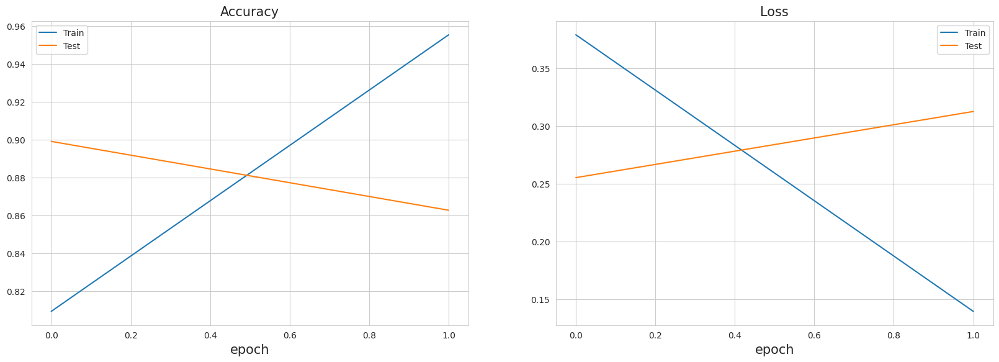

epoch: 3/3
Train


Test


Epoch 3 of 3 took 37.995s
  training loss (in-iteration): 	0.066964
  validation loss (in-iteration): 	0.346790

  training accuracy: 			97.95 %
  validation accuracy: 			88.96 %

  training precision: 			98.33 %
  validation precision: 		85.88 %

  training recall: 			97.36 %
  validation recall: 			92.99 %


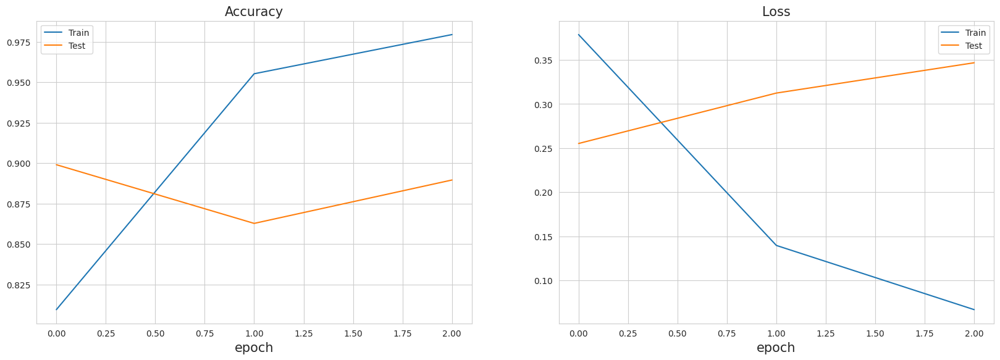

accuracy_score: 0.889589905362776
precision_score: 0.8588235294117647
recall_score: 0.9299363057324841
confusion matrix


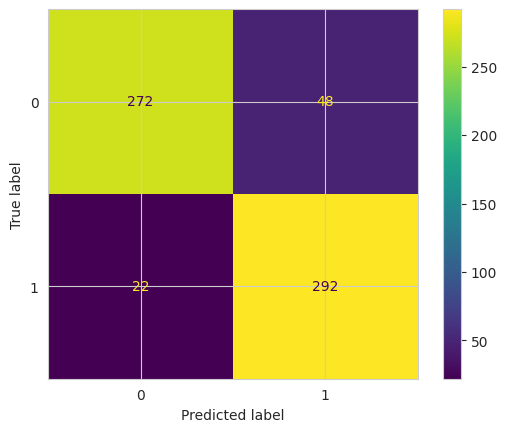

None


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert/distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


/home/tech/.local/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


  0%|          | 0/3 [00:00<?, ?it/s]

epoch: 1/3
Train


Test


Epoch 1 of 3 took 42.674s
  training loss (in-iteration): 	0.378373
  validation loss (in-iteration): 	0.267634

  training accuracy: 			82.74 %
  validation accuracy: 			89.08 %

  training precision: 			86.11 %
  validation precision: 		87.70 %

  training recall: 			79.23 %
  validation recall: 			90.93 %
epoch: 2/3
Train


Test


Epoch 2 of 3 took 43.124s
  training loss (in-iteration): 	0.150284
  validation loss (in-iteration): 	0.223829

  training accuracy: 			94.23 %
  validation accuracy: 			91.49 %

  training precision: 			95.00 %
  validation precision: 		89.07 %

  training recall: 			93.17 %
  validation recall: 			94.62 %


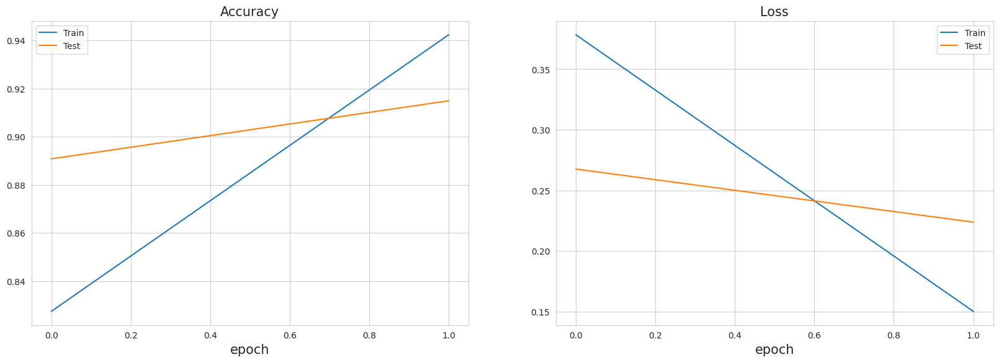

epoch: 3/3
Train


Test


Epoch 3 of 3 took 43.237s
  training loss (in-iteration): 	0.094092
  validation loss (in-iteration): 	0.235162

  training accuracy: 			96.45 %
  validation accuracy: 			92.34 %

  training precision: 			97.08 %
  validation precision: 		89.03 %

  training recall: 			95.68 %
  validation recall: 			96.60 %


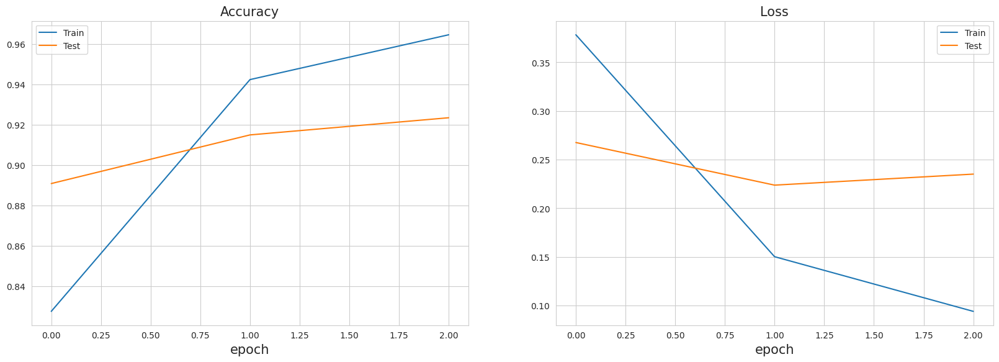

accuracy_score: 0.9234042553191489
precision_score: 0.8903394255874674
recall_score: 0.9660056657223796
confusion matrix


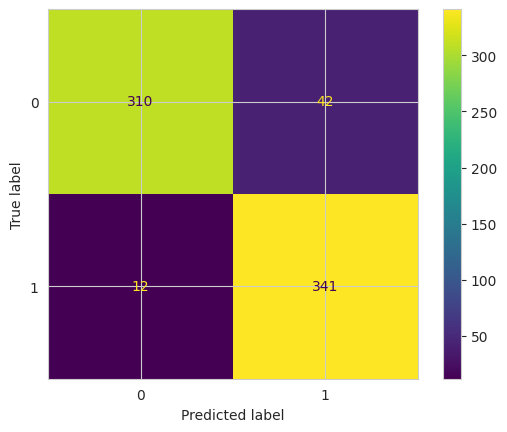

None


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert/distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


/home/tech/.local/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


  0%|          | 0/3 [00:00<?, ?it/s]

epoch: 1/3
Train


Test


Epoch 1 of 3 took 34.168s
  training loss (in-iteration): 	0.452715
  validation loss (in-iteration): 	0.341314

  training accuracy: 			77.43 %
  validation accuracy: 			84.26 %

  training precision: 			75.58 %
  validation precision: 		87.80 %

  training recall: 			81.49 %
  validation recall: 			78.83 %
epoch: 2/3
Train


Test


Epoch 2 of 3 took 34.275s
  training loss (in-iteration): 	0.195410
  validation loss (in-iteration): 	0.270207

  training accuracy: 			92.42 %
  validation accuracy: 			89.62 %

  training precision: 			93.94 %
  validation precision: 		91.86 %

  training recall: 			90.96 %
  validation recall: 			86.50 %


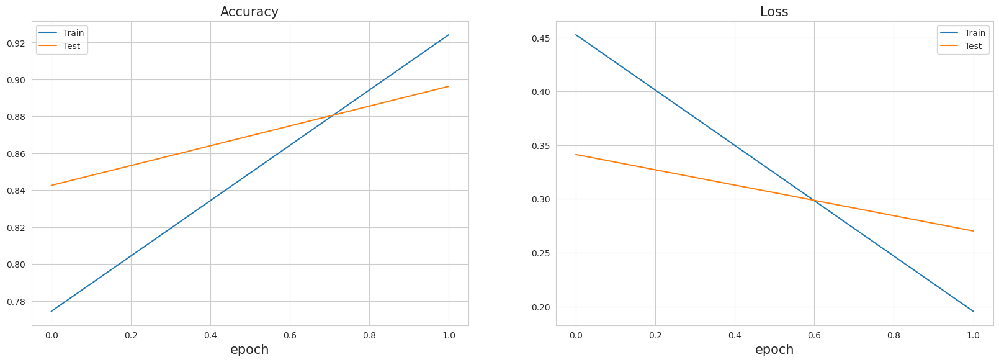

epoch: 3/3
Train


Test


Epoch 3 of 3 took 34.272s
  training loss (in-iteration): 	0.094524
  validation loss (in-iteration): 	0.277183

  training accuracy: 			97.01 %
  validation accuracy: 			89.80 %

  training precision: 			98.12 %
  validation precision: 		93.93 %

  training recall: 			95.72 %
  validation recall: 			84.67 %


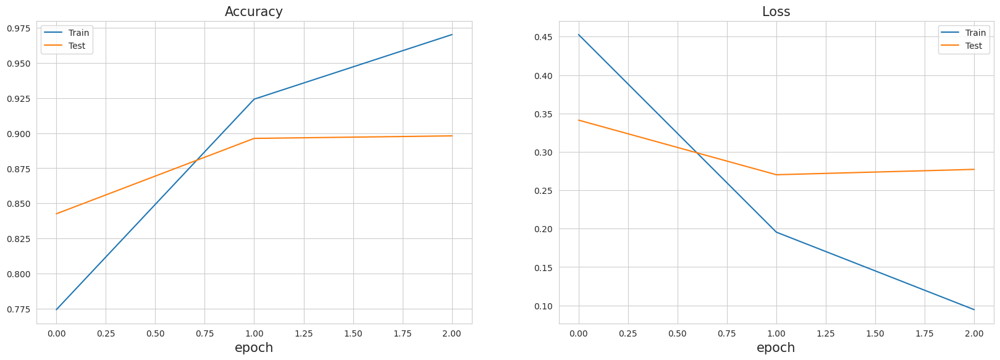

accuracy_score: 0.8980322003577818
precision_score: 0.9392712550607287
recall_score: 0.8467153284671532
confusion matrix


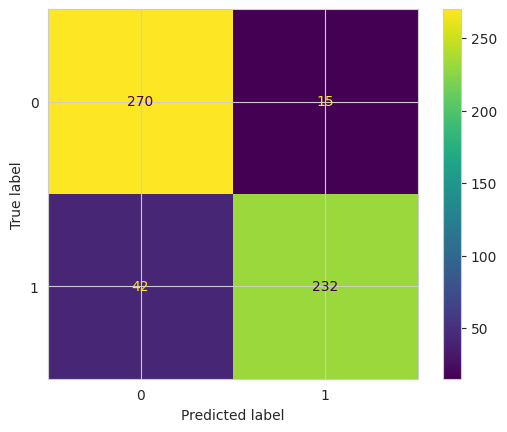

None


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert/distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


/home/tech/.local/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


  0%|          | 0/3 [00:00<?, ?it/s]

epoch: 1/3
Train


Test


Epoch 1 of 3 took 31.017s
  training loss (in-iteration): 	0.548258
  validation loss (in-iteration): 	0.504199

  training accuracy: 			69.85 %
  validation accuracy: 			76.73 %

  training precision: 			77.69 %
  validation precision: 		92.35 %

  training recall: 			52.99 %
  validation recall: 			59.92 %
epoch: 2/3
Train


Test


Epoch 2 of 3 took 31.112s
  training loss (in-iteration): 	0.238369
  validation loss (in-iteration): 	0.344670

  training accuracy: 			91.05 %
  validation accuracy: 			85.60 %

  training precision: 			90.49 %
  validation precision: 		82.25 %

  training recall: 			91.69 %
  validation recall: 			91.98 %


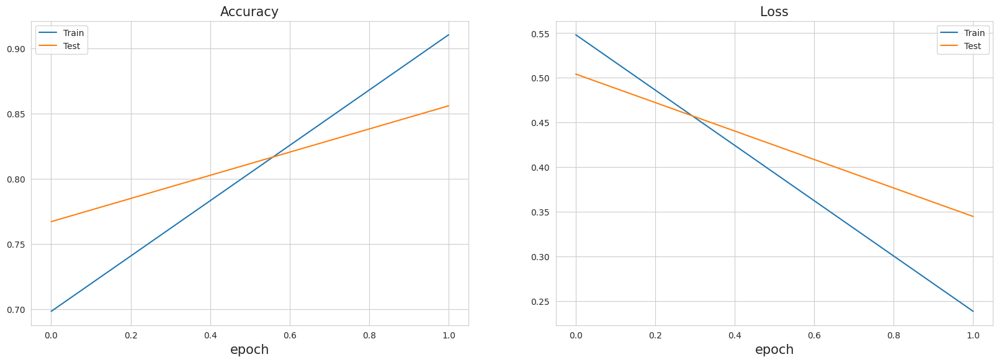

epoch: 3/3
Train


Test


Epoch 3 of 3 took 31.097s
  training loss (in-iteration): 	0.151144
  validation loss (in-iteration): 	0.423298

  training accuracy: 			94.73 %
  validation accuracy: 			84.02 %

  training precision: 			94.14 %
  validation precision: 		82.67 %

  training recall: 			96.01 %
  validation recall: 			87.40 %


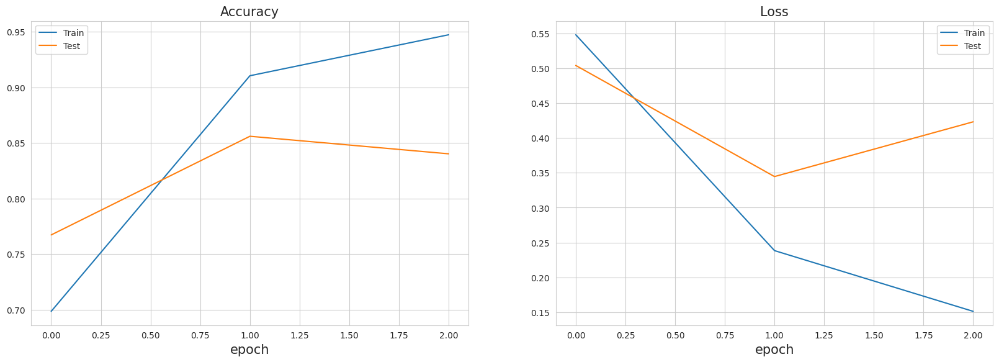

accuracy_score: 0.8402366863905325
precision_score: 0.8267148014440433
recall_score: 0.8740458015267175
confusion matrix


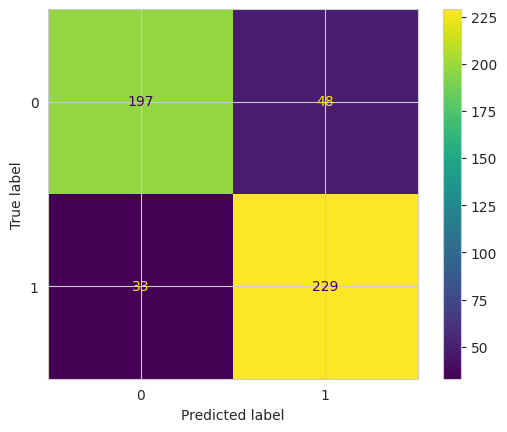

None


Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert/distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


/home/tech/.local/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


  0%|          | 0/3 [00:00<?, ?it/s]

epoch: 1/3
Train


Test


Epoch 1 of 3 took 90.763s
  training loss (in-iteration): 	0.473939
  validation loss (in-iteration): 	0.420007

  training accuracy: 			75.35 %
  validation accuracy: 			81.13 %

  training precision: 			76.22 %
  validation precision: 		83.72 %

  training recall: 			71.30 %
  validation recall: 			77.16 %
epoch: 2/3
Train


Test


Epoch 2 of 3 took 90.873s
  training loss (in-iteration): 	0.225971
  validation loss (in-iteration): 	0.399078

  training accuracy: 			91.17 %
  validation accuracy: 			83.29 %

  training precision: 			91.58 %
  validation precision: 		85.65 %

  training recall: 			90.89 %
  validation recall: 			79.86 %


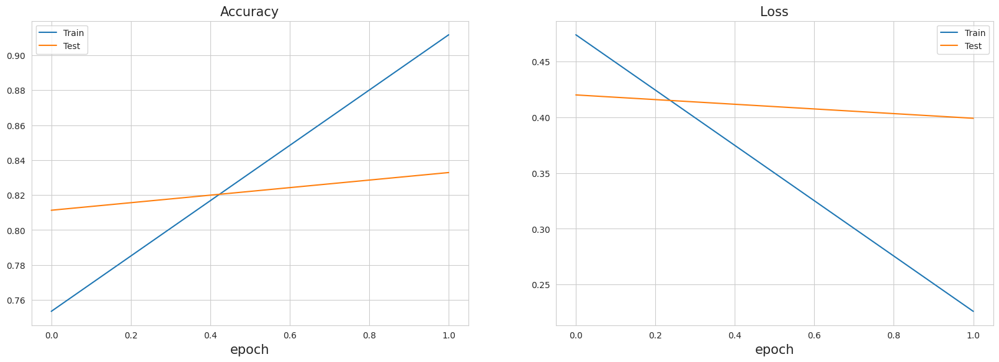

epoch: 3/3
Train


Test


Epoch 3 of 3 took 90.666s
  training loss (in-iteration): 	0.141609
  validation loss (in-iteration): 	0.475095

  training accuracy: 			95.08 %
  validation accuracy: 			83.09 %

  training precision: 			95.11 %
  validation precision: 		79.00 %

  training recall: 			95.07 %
  validation recall: 			90.00 %


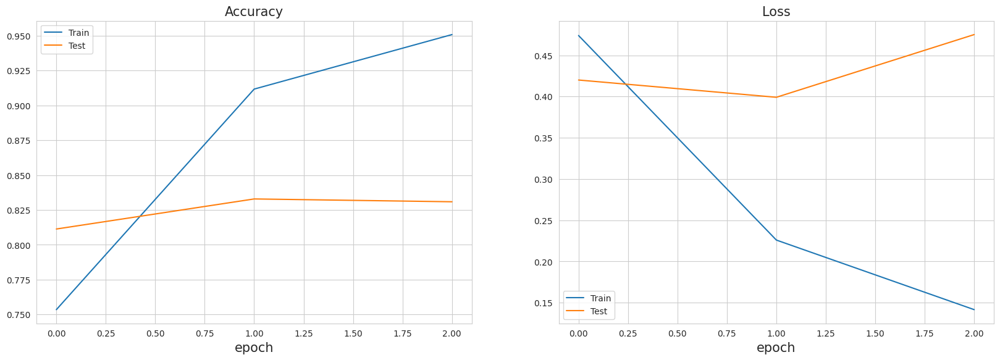

accuracy_score: 0.8308625336927223
precision_score: 0.7900355871886121
recall_score: 0.9
confusion matrix


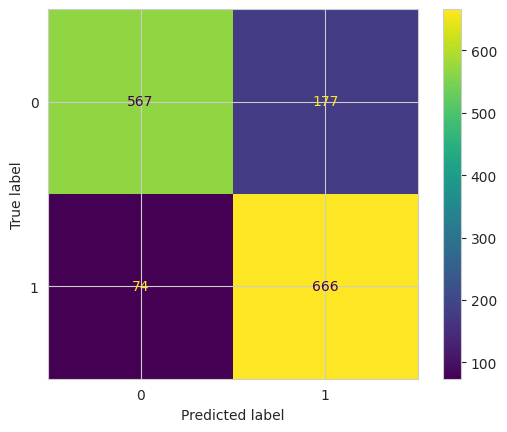

None


In [37]:
accuracy = []
precision = []
recall = []
for dataset in chosen_datasets:
    df = pd.read_csv(os.path.join("datasets", dataset))
    tokenizer = AutoTokenizer.from_pretrained("distilbert/distilbert-base-uncased", use_fast=False)
    bert = AutoModelForSequenceClassification.from_pretrained("distilbert/distilbert-base-uncased", output_attentions=False, output_hidden_states=False)
    # model = Bert(bert, bert.classifier.out_features, 1)
    bert.classifier = nn.Linear(in_features=768, out_features=1, bias=True)
    model = bert
    X_train, X_test, y_train, y_test = train_test_split(df["text"].values, df["label"].values, test_size=0.25, random_state=1)

    max_seq_len = 256
    tokens_train = tokenizer.batch_encode_plus(
        X_train,
        max_length = max_seq_len,
        padding=True,
        truncation=True
    )

    tokens_test = tokenizer.batch_encode_plus(
        X_test,
        max_length = max_seq_len,
        padding=True,
        truncation=True
    )

    train_seq = torch.tensor(tokens_train['input_ids'])
    train_mask = torch.tensor(tokens_train['attention_mask'])
    train_y = torch.tensor(y_train)

    test_seq = torch.tensor(tokens_test['input_ids'])
    test_mask = torch.tensor(tokens_test['attention_mask'])
    test_y = torch.tensor(y_test)

    batch_size = 16
    train_data = TensorDataset(train_seq, train_mask, train_y)
    train_labels, train_counts = np.unique(y_train, return_counts=True)
    train_class_weights = [sum(train_counts) / c for c in train_counts]
    train_weigths = [train_class_weights[e] for e in y_train]
    train_sampler = WeightedRandomSampler(weights=train_weigths, num_samples=y_train.shape[0])
    train_dataloader = DataLoader(train_data, batch_size=batch_size, sampler=train_sampler)

    test_data = TensorDataset(test_seq, test_mask, test_y)
    test_sampler = RandomSampler(test_data)
    test_dataloader = DataLoader(test_data, batch_size=batch_size, sampler=test_sampler)


    output_dim = 1
    lr = 3e-5
    num_epochs = 3

    model = model.to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=0.2)
    criterion = nn.BCEWithLogitsLoss()
    lr_scheduler = optim.lr_scheduler.ExponentialLR(optimizer=optimizer,
                                                    gamma=0.9, verbose=True)
    model, history = train(
    model,
    criterion,
    optimizer,
    train_dataloader,
    test_dataloader,
    num_epochs,
    lr_scheduler,
    device
    )
    acc, prec, rec = predict(model, test_dataloader, device)
    accuracy.append(acc)
    precision.append(prec)
    recall.append(rec)

In [38]:
print(f"Average accuracy: {np.average(accuracy)}")
print(f"Average precision: {np.average(precision)}")
print(f"Average recall: {np.average(recall)}")

Average accuracy: 0.8764251162245923
Average precision: 0.8610369197385233
Average recall: 0.9033406202897469
